# Analysis of Argo data South of 60S

## By Nick Young and Fabio Viera Machado

In [105]:
from netCDF4 import Dataset, num2date
import glob
from mpl_toolkits.basemap import Basemap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import csv
import calendar
from scipy.stats import describe
from scipy import interpolate
from tqdm import tqdm_notebook as tqdm
import oceansdb
import datetime
#import seawater as sw
#from seawater.library import T90conv

In [138]:
def load_netcdf(path = "Argo_South_60"):
    # load_netcdf function input: path - default is "Argo_South_60"
    files = glob.glob("data/" + path + "/**/*.nc", recursive=True)
    # glob.glob - returns a list of all the files in a given folder with the extension 'nc'
    # recursive=true - keeps on looking for all the files till the end, or the last file that exist
    
    # creating lists
    lats = []
    lons = []
    datetimes = []
    sst = []
    max_depth = []
    
    # regarding quality control 
    data_state_ind = [] # DATA_STATE_INDICATOR Degree of processing the data have passed through
    plat_number = []    # PLATFORM_NUMBER Float unique identifier
    data_mode = []      # DATA_MODE Delayed mode or real time data
    serial_number = []  # FLOAT_SERIAL_NO
    pos_sys = []        # POSITIONING_SYSTEM
    
    ## End of "creating lists"
    
    for f in tqdm(files):
        # tqdm - make your loops show a progress meter
        d = Dataset(f)
        # DATASET - Creating/Opening/Closing a netCDF file. 
        # This is the method used to open an existing netCDF file.
        lat = d.variables["LATITUDE"][:]
        mask = lat < -60
                
        # regarding quality conrtol
        d_s_i = d.variables["DATA_STATE_INDICATOR"][:]
        p_n = d.variables["PLATFORM_NUMBER"][:]
        d_m = d.variables["DATA_MODE"][:]
        s_n = d.variables["FLOAT_SERIAL_NO"][:]
        p_s = d.variables["POSITIONING_SYSTEM"][:]
        
        data_state_ind.extend(d_s_i[mask])
        plat_number.extend(p_n[mask])
        data_mode.extend(d_m[mask])
        serial_number.extend(s_n[mask])
        pos_sys.extend(p_s[mask])
                
        ## end of "regarding quality conrtol"
        
        lats.extend(lat[mask])
        lons.extend(lon[mask])
        #1 The extend () method adds the specified list elements to the end of the current list.
        #2 This method does not return any value but add the content to existing list.
        juld = d.variables["JULD"][:]
        units = d.variables["JULD"].getncattr('units')
        #1 getncattr - reads the attributes of given variable i.e units
        dates = num2date(juld, units, "standard")
        #1 num2date - converts the format of the loaded datetime to standard format YYYY-MM-dd
        datetimes.extend(dates[mask])
        try:
            sst.extend(d.variables["TEMP_ADJUSTED"][mask,0])
            #1 checks if sst is below 60S and if so, adds it
        except:
            sst.extend(np.full(sum(mask), np.nan))
            #sst.extend(np.full(len(mask), np.nan))
            #2 if sst is above 60S, adds nan values
        max_depth.extend(np.nanmax(d.variables["PRES_ADJUSTED"], axis=1))
        
        #temp_profile.extend(d.variables["TEMP_ADJUSTED"][mask,:])
        #temp_profiles.extend(temp_profile[mask])
    
    #temp_profiles = np.array(temp_profiles)    
    #print(temp_profiles)
    #print(temp_profile)
        #df2 = pd.DataFrame(temp_profile)
    # assign new column to existing dataframe
        #temp_profiles=df2.assign(d.variables["TEMP_ADJUSTED"][:])
      #  ##  initializing matrices 
      #  temp_profiles = np.array([temp_prof]) 
      #  array1 = np.array([1,2,3])
      #  array2 = np.array([4,5,6])
      #  matrix1 = np.array([array1,array2])
      #  matrix1
        
    #df = pd.DataFrame(datetimes)
    df = pd.to_datetime(datetimes)
    #print(df)
    df = df.sort_values(datetimes)
    #print(df)
    #df = pd.DataFrame(datetimes, columns=["colummn"])
    #print(df[0])
    df = pd.DataFrame(df[0], columns=["colummn"])
    #print(df)
    df.to_csv('list.csv', index=True)
    #print(df)
    #1 array() - allows one to do operations on a list
    #2 NumPy was imported as np
    #3 If we want to do math on a homogeneous array of numeric data, then it is much better to use NumPy, 
    #  which can automatically vectorize operations on complex multi-dimensional arrays
    lats = np.array(lats)
    lons = np.array(lons)
    datetimes = np.array(datetimes)
    #print(datetimes)
    sst = np.array(sst)
    # saving the arrays in files
    np.save(path + "_lats", lats)
    np.save(path + "_lons", lons)
    np.save(path + "_dts", datetimes)
    np.save(path + "_sst", sst)
    np.save(path + "_depth", max_depth)
    return lats, lons, datetimes, sst, max_depth

def plot(lats, lons, z = [], title = "Argo profiles south of 60S", cbtitle = "Number of points in bin", vmax=None):
    # setup north polar stereographic basemap.
    # The longitude lon_0 is at 6-o'clock, and the
    # latitude circle boundinglat is tangent to the edge
    # of the map at lon_0. Default value of lat_ts
    # (latitude of true scale) is pole.
    fig = plt.figure(figsize=(15,15))
    m = Basemap(projection='spstere',boundinglat=-55,lon_0=180,resolution='l')
    m.drawcoastlines()
    m.fillcontinents(color='black',lake_color='aqua')
    # draw parallels and meridians.
    m.drawparallels(np.arange(-60, 0, 20))
    m.drawmeridians(np.arange(-180, 181, 20), labels=[1,1,0,1])
    #m.drawmapboundary(fill_color='aqua')
    plt.title("{} {}".format(len(lats), title))

    x, y = m(lons, lats)
    if len(z) == 0:
        hh, locx, locy = np.histogram2d(x, y, bins=100)
        # Sort the points by density, so that the densest points are plotted last
        z = np.array([hh[np.argmax(a<=locx[1:]),np.argmax(b<=locy[1:])] for a,b in zip(x,y)])
        #print(describe(z))
        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]
    #m.imshow(heatmap, interpolation='bicubic', cmap="jet")
    m.scatter(x, y, c=z, s=5, alpha=1, cmap="jet", vmax=vmax)
    cb = plt.colorbar()
    cb.set_label(cbtitle, rotation=270)
    plt.show()

def plot_time(dts, title, label):
    fig, ax = plt.subplots(1, 1, figsize=(20,10))
    for i, dt in enumerate(dts):
    #1 enumerate() method adds a counter to an iterable and returns it in a form of enumerate object.
    #  This enumerate object can then be used directly in for loops or be converted into a list of tuples using list() method.
        k = label[i]
        df = pd.DataFrame({k: dt})
        #1 Pandas was imported as pd
        #2 Dataframe class - class pandas.DataFrame(data=None, index=None, columns=None, dtype=None, copy=False)
        #  Two-dimensional size-mutable, potentially heterogeneous tabular data structure with labeled axes (rows and columns).
        #  Arithmetic operations align on both row and column labels. 
        #  Can be thought of as a dict-like container for Series objects
        #print(df)
        
        #1 Grouping by month or year or date
        #  It is used for calculating and plotting the number of profiles by Month or Year 
        
        df = df.groupby(by=df[k].dt.date).count()
        # groupby - groups data by a certain specified variable type
        # df = df.groupby(by=df[k].dt.month).count() # by month
        # df = df.groupby(by=df[k].dt.year).count()  # by year
        print(df)
        # Save dataframe "df" as csv file: 
        #   The files saved are used for plotting the Bar Chart regarding the number of profiles by month or year
        # df.to_csv('{}perday.csv'.format(k), index=True)
        # df.to_csv('{}perday.csv'.format(k), index=True)
        
        ## End of "Grouping by month or year or date"
        
        
        print(df.shape)
        df.plot(ax=ax, style='.', markersize=3)
        ax.xaxis.set_major_locator(mdates.YearLocator())
        ax.set_title(title, fontsize=18)
        ax.set_xlabel("Time",fontsize=14)
        ax.set_ylabel("Number of profiles",fontsize=14)
        #ax.set_xlabel("")
        ax.legend(fontsize=14)
    plt.show()

In [107]:
argo_lats, argo_lons, argo_dts, argo_sst, argo_depth = load_netcdf()
#plot(argo_lats, argo_lons, vmax=100)
#plot(argo_lats, argo_lons, argo_sst[:len(argo_lats)], title = "Argo SST", cbtitle = "Temperature °C")
##plot(argo_lats, argo_lons, argo_depth[:len(argo_lats)], title = "Argo Depth", cbtitle = "Depth (decibar pressure)")
#print(min(argo_sst),max(argo_sst))
#print(datetime)
#print(temp_profile)

c:\users\fvie285\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:84: UserWarning: Warning: converting a masked element to nan.


In [13]:
find_lat = np.load("Argo_South_60_lats.npy")
find_lon = np.load("Argo_South_60_lons.npy")
find_sst = np.load("Argo_South_60_sst.npy")
##plt.plot(range(len(temp_profile)),temp_profile)
##plt.show()
#print(find_lat, find_lon, find_sst)
print(find_lat.shape, find_lon.shape, find_sst.shape)
print(len(find_lat))
print(len(argo_dts),len(argo_lats), len(argo_lons),len(argo_sst),len(argo_depth))

(64378,) (64378,) (64378,)
64378
64378 64378 64378 64378 64384


2001-12-21 15:53:45 2019-07-04 19:53:14
                     Argo
0     2010-08-24 22:56:17
1     2010-12-12 01:12:37
2     2010-12-21 23:00:22
3     2010-12-31 20:59:07
4     2011-01-10 19:09:02
5     2011-01-20 17:19:24
6     2011-01-30 15:27:54
7     2011-02-09 13:34:30
8     2011-02-19 11:41:07
9     2011-03-01 09:47:43
10    2011-03-11 07:54:20
11    2011-03-21 05:28:51
12    2011-03-31 03:33:50
13    2011-04-10 01:29:23
14    2011-04-19 23:24:57
15    2011-04-29 21:20:58
16    2011-05-09 19:16:58
17    2011-05-19 17:12:59
18    2011-05-29 15:17:29
19    2011-06-08 13:21:58
20    2011-08-07 01:04:38
21    2012-05-30 11:51:42
22    2012-06-19 07:25:21
23    2012-06-29 05:32:19
24    2012-07-09 03:39:18
25    2013-04-22 08:41:05
26    2013-05-02 06:19:04
27    2013-05-12 04:00:02
28    2013-05-22 01:39:48
29    2013-06-10 21:01:56
...                   ...
64348 2019-04-03 19:20:13
64349 2019-04-13 19:07:05
64350 2019-04-23 20:05:23
64351 2019-05-03 20:30:19
64352 2019-05-13 19:40:1

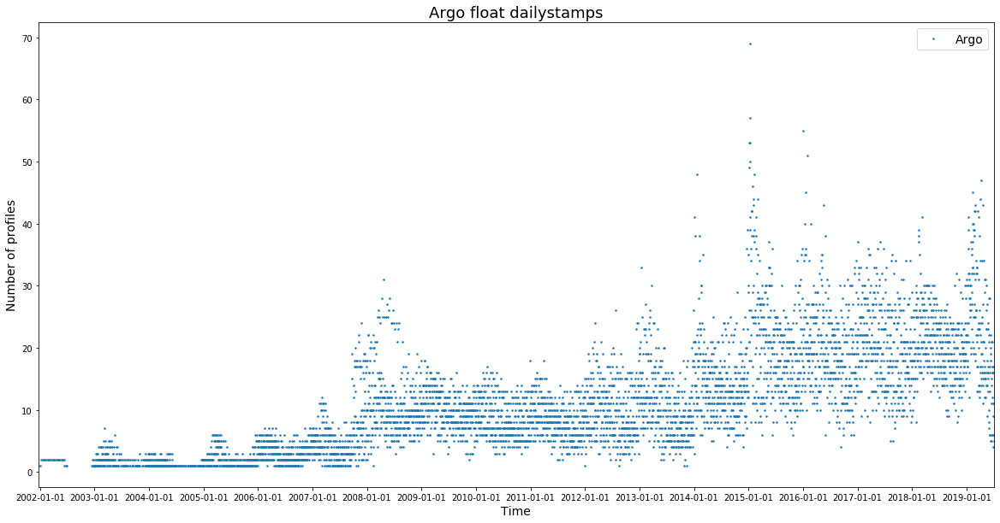

In [25]:
print(min(argo_dts), max(argo_dts))
#print(argo_dts.shape, argo_lats.shape, argo_lons.shape)
#print(argo_dts, argo_lats, argo_lons)
plot_time([argo_dts], "Argo float dailystamps", ["Argo"])

24989.0


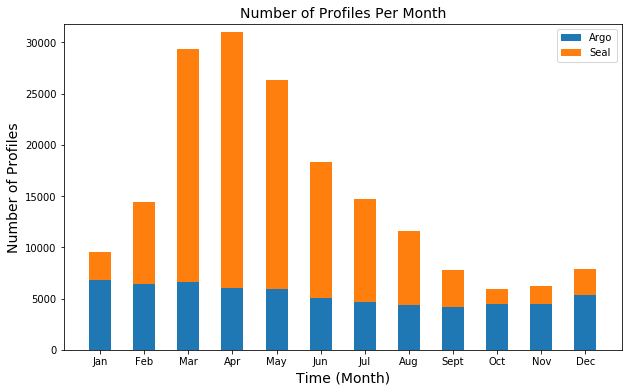

[( 1., 6830.) ( 2., 6384.) ( 3., 6612.) ( 4., 6031.) ( 5., 5905.)
 ( 6., 5097.) ( 7., 4669.) ( 8., 4383.) ( 9., 4204.) (10., 4469.)
 (11., 4481.) (12., 5313.)] [( 1.,  2672.) ( 2.,  8057.) ( 3., 22743.) ( 4., 24989.) ( 5., 20404.)
 ( 6., 13228.) ( 7., 10034.) ( 8.,  7189.) ( 9.,  3606.) (10.,  1481.)
 (11.,  1785.) (12.,  2579.)]


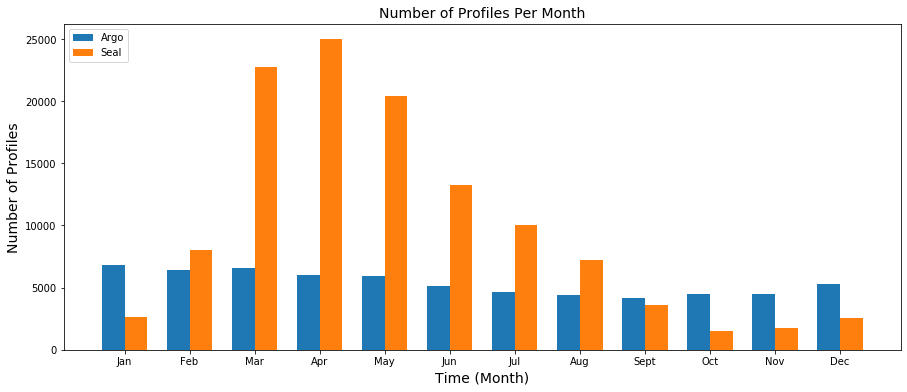

In [16]:
#data = np.genfromtxt('e:\dir1\datafile.csv', delimiter=',', skip_header=10,
#                     skip_footer=10, names=['x', 'y', 'z'])
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(111)
data = np.genfromtxt('argopermonth.csv', delimiter=',', skip_header=1, names=['argomonth', 'argonumber'])
data2 = np.genfromtxt('Elephant sealpermonth.csv', delimiter=',', skip_header=1, names=['sealmonth', 'sealnumber'])

print(max(data2['sealnumber']))

width = 0.5
p1 = plt.bar(data['argomonth'], data['argonumber'], width)#, yerr=menStd)
p2 = plt.bar(data['argomonth'], data2['sealnumber'], width,
             bottom=data['argonumber'])#, yerr=womenStd)

plt.ylabel('Number of Profiles', fontsize=14)
plt.xlabel('Time (Month)', fontsize=14)
plt.title('Number of Profiles Per Month', fontsize=14)
plt.xticks(data['argomonth'], ('Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'))
plt.yticks(np.arange(0, max(data2['sealnumber'])+max(data['argonumber']), 5000))
plt.legend((p1[0], p2[0]), ('Argo', 'Seal'))
plt.ylim(0, max(data2['sealnumber'])+max(data['argonumber']))

plt.show()

print(data, data2)

width = 0.35
fig = plt.figure(figsize=(15,6))
platform=['Argo','Seal']
plt.bar(data['argomonth']-(0.5*width), data['argonumber'], width)
plt.bar(data['argomonth']+(0.5*width), data2['sealnumber'], width)
plt.ylabel('Number of Profiles', fontsize=14)
plt.xticks(data['argomonth'], ('Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'))
plt.xlabel('Time (Month)', fontsize=14)
plt.title('Number of Profiles Per Month', fontsize=14)
plt.legend(platform,loc=2)
plt.show()

[ 4092.  2987.  6277.  5149.  9231.  9390. 14608. 18066. 19238.  6896.
 10005.  3751.  4307.  4742.    28.]
(15,)
[0, 0, 0]
[0, 0, 0, 4092.0, 2987.0, 6277.0, 5149.0, 9231.0, 9390.0, 14608.0, 18066.0, 19238.0, 6896.0, 10005.0, 3751.0, 4307.0, 4742.0, 28.0]
[0, 0, 0, 4092.0, 2987.0, 6277.0, 5149.0, 9231.0, 9390.0, 14608.0, 18066.0, 19238.0, 6896.0, 10005.0, 3751.0, 4307.0, 4742.0, 28.0, 0]
[2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014
 2015 2016 2017 2018 2019]
26790.0


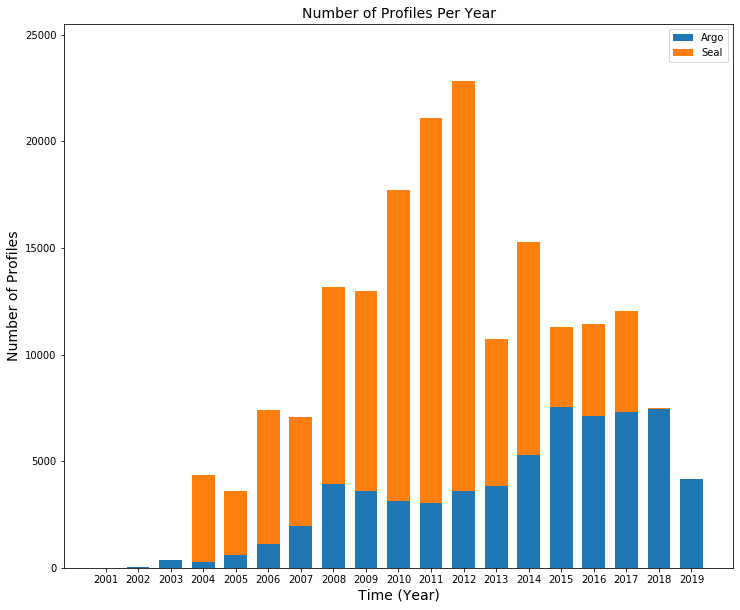

In [17]:
#data = np.genfromtxt('e:\dir1\datafile.csv', delimiter=',', skip_header=10,
#                     skip_footer=10, names=['x', 'y', 'z'])
#fig = plt.figure()
fig = plt.figure(figsize=(12,10))
ax1 = fig.add_subplot(111)
data = np.genfromtxt('argoperyear.csv', delimiter=',', skip_header=1, names=['argoyear', 'yearargonumber'])
data2 = np.genfromtxt('Elephant sealperyear.csv', delimiter=',', skip_header=1, names=['sealyear', 'yearsealnumber'])
print(data2['yearsealnumber'])
a = data2['yearsealnumber']
print(a.shape)
#my_list = ['geeks', 'for'] 
seal_list_increment = [0, 0, 0]
print(seal_list_increment)
seal_list_increment.extend(a)
print(seal_list_increment)
second_list_increment = [0]
#print(second_list_increment)
seal_list_increment.extend(second_list_increment)
print(seal_list_increment)
t_years = np.arange(2001,2020)
print(t_years)
width = 0.7
p1 = plt.bar(t_years, data['yearargonumber'], width)#, yerr=menStd)
p2 = plt.bar(t_years, seal_list_increment, width,
             bottom=data['yearargonumber'])#, yerr=womenStd)

plt.ylabel('Number of Profiles', fontsize=14)
plt.xlabel('Time (Year)', fontsize=14)
plt.title('Number of Profiles Per Year', fontsize=14)
plt.xticks(t_years)
#plt.xticks(data['argoyear'], ('Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'))
plt.yticks(np.arange(0, max(seal_list_increment)+max(data['yearargonumber']), 5000))
plt.legend((p1[0], p2[0]), ('Argo', 'Seal'))
plt.ylim(0, max(seal_list_increment)+max(data['yearargonumber'])-1290)

#plt.show()
print(max(seal_list_increment)+max(data['yearargonumber']))
#print(data, data2)

In [4]:
seal_lats, seal_lons, seal_dts, seal_sst, seal_depth = load_netcdf("seal")
#print(seal_lats.shape, seal_sst.shape, argo_lats.shape, argo_sst.shape)
#print(min(seal_sst),max(seal_sst))
#plot(seal_lats, seal_lons, title = "Seal data south of 60S", vmax=100)
#plot(seal_lats, seal_lons, seal_sst[:len(seal_lats)], title = "Seal SST", cbtitle = "Temperature °C")
#plot(seal_lats, seal_lons, seal_depth[:len(seal_lats)], title = "Seal Depth", cbtitle = "Depth (decibar pressure)")

c:\users\fvie285\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:84: UserWarning: Warning: converting a masked element to nan.


2004-02-05 22:38:00.000002 2018-01-14 23:00:00.000003
                    Elephant seal
0      2007-03-03 03:24:00.000005
1      2007-03-03 03:42:59.999997
2      2007-03-03 06:00:59.999996
3      2007-03-03 17:40:59.999998
4      2007-03-03 17:51:59.999998
5      2007-03-03 23:09:59.999998
6      2007-03-03 23:26:00.000001
7      2007-03-04 01:21:00.000002
8      2007-03-04 01:40:00.000004
9      2007-03-04 15:45:59.999996
10     2007-03-05 01:09:00.000005
11     2007-03-05 01:21:59.999998
12     2007-03-05 03:14:00.000000
13     2007-03-05 03:50:00.000002
14     2007-03-05 05:03:59.999999
15     2007-03-05 05:54:00.000002
16     2007-03-07 03:17:00.000000
17     2007-03-07 17:43:00.000000
18     2007-03-07 17:54:59.999998
19     2007-03-07 19:02:00.000000
20     2007-03-07 19:32:00.000003
21     2007-03-07 21:36:00.000002
22     2007-03-07 21:42:59.999997
23     2007-03-08 05:49:59.999996
24     2007-03-08 06:06:59.999995
25     2007-03-08 09:50:59.999998
26     2007-03-08 11:54:00.0

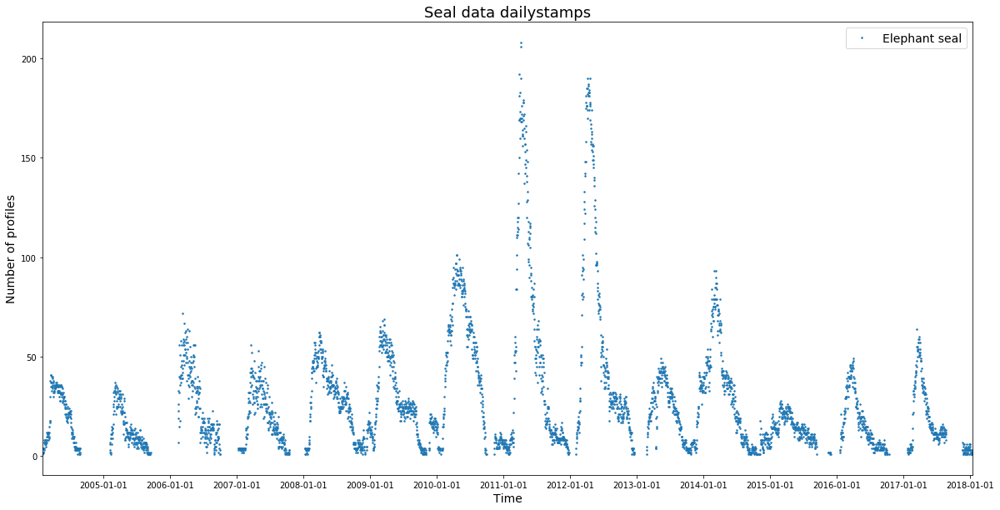

In [26]:
print(min(seal_dts), max(seal_dts))
plot_time([seal_dts], "Seal data dailystamps", ["Elephant seal"])

In [20]:
all_lats = np.concatenate((seal_lats, argo_lats))
all_lons = np.concatenate((seal_lons, argo_lons))
#plot(all_lats, all_lons, title="Argo + seal data south of 60S", vmax=100)

                             Seal
0      2007-03-03 03:24:00.000005
1      2007-03-03 03:42:59.999997
2      2007-03-03 06:00:59.999996
3      2007-03-03 17:40:59.999998
4      2007-03-03 17:51:59.999998
5      2007-03-03 23:09:59.999998
6      2007-03-03 23:26:00.000001
7      2007-03-04 01:21:00.000002
8      2007-03-04 01:40:00.000004
9      2007-03-04 15:45:59.999996
10     2007-03-05 01:09:00.000005
11     2007-03-05 01:21:59.999998
12     2007-03-05 03:14:00.000000
13     2007-03-05 03:50:00.000002
14     2007-03-05 05:03:59.999999
15     2007-03-05 05:54:00.000002
16     2007-03-07 03:17:00.000000
17     2007-03-07 17:43:00.000000
18     2007-03-07 17:54:59.999998
19     2007-03-07 19:02:00.000000
20     2007-03-07 19:32:00.000003
21     2007-03-07 21:36:00.000002
22     2007-03-07 21:42:59.999997
23     2007-03-08 05:49:59.999996
24     2007-03-08 06:06:59.999995
25     2007-03-08 09:50:59.999998
26     2007-03-08 11:54:00.000002
27     2007-03-11 03:14:59.999997
28     2007-03

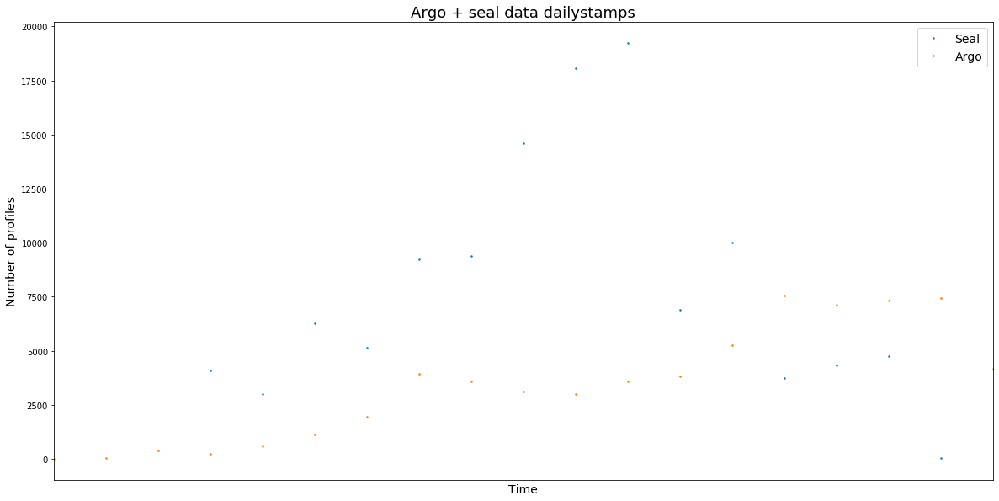

In [538]:
plot_time([seal_dts, argo_dts], "Argo + seal data dailystamps", ["Seal", "Argo"])

In [255]:
def load_netcdf_grid(path = "Argo_South_60", resolution = 1, target_var = "temp", with_depth = False, filter_month = None, filter_season = None):
    if with_depth:
        grid = np.full(shape=[15 * resolution, 360 * resolution, 200], fill_value=np.nan)
    else:
        grid = np.full(shape=[15 * resolution, 360 * resolution], fill_value=np.nan)
    files = glob.glob("data/{}/**/*.nc".format(path), recursive=True)
    #1 glob.glob - returns a list of all the files in a given folder with the extension 'nc'
    #2 recursive=true - keeps on looking for all the files till the end, or the last file that exist
    
    #####
    # creating lists
    filename2 = []
    nbprof2 = []   
    
    # regarding quality control 
    data_state_ind = [] # DATA_STATE_INDICATOR  Degree of processing the data have passed through
    plat_number = []    # PLATFORM_NUMBER       Float unique identifier
    data_mode = []      # DATA_MODE             Delayed mode or real time data
    serial_number = []  # FLOAT_SERIAL_NO
    pos_sys = []        # POSITIONING_SYSTEM
    data_update = []    # DATE_UPDATE           Date of update of this file'
    ## End of "regarding quality control"
    
    ## End of "creating lists"
    #####
    
    for f in tqdm(files[:]):
    # tqdm - make your loops show a progress meter
        d = Dataset(f)
        #1 DATASET - Creating/Opening/Closing a netCDF file. 
        # This is the method used to open an existing netCDF file.
        lat = d.variables["LATITUDE"][:]
        long = d.variables["LONGITUDE"][:]
        #print(np.size(lat))
        print(len(lat))
        
        #print("Filename {}".format(f), len(lat))
                
        # regarding quality conrtol
        j_date = d.variables["JULD"][:]
        d_s_i = d.variables["DATA_STATE_INDICATOR"][:]
        p_n = d.variables["PLATFORM_NUMBER"][:]
        d_m = d.variables["DATA_MODE"][:]
        #s_n = d.variables["FLOAT_SERIAL_NO"][:]
        p_s = d.variables["POSITIONING_SYSTEM"][:]
        d_u = d.variables["DATE_UPDATE"][:]
        pos_qc = d.variables ["POSITION_QC"][:]
                
        prof_press_qc = d.variables ["PROFILE_PRES_QC"][:]
        prof_temp_qc = d.variables ["PROFILE_TEMP_QC"][:]
        
        
        data_state_ind.extend(d_s_i)
        plat_number.extend(p_n)
        data_mode.extend(d_m)
        #serial_number.extend(s_n)
        pos_sys.extend(p_s)
        data_update.extend(d_u)
        
        #print(d_m)
        juld = d.variables["JULD"][:]
        units = d.variables["JULD"].getncattr('units')
        dates = num2date(juld, units, "standard")   
        
        #print(len(d_u),d_u.shape) #14 (14,)
        #print(len(p_s),p_s.shape) #50 (50, 8)
        #print(len(p_n),p_n.shape) #50 (50, 8) 
        #print(len(d_s_i),d_s_i.shape) #50 (50, 4)
        #print(len(s_n),s_n.shape) # 50 (50, 16)
        #print(len(p_qc),p_qc.shape) #50 (50,)
        #print(len(d_m),d_m.shape) #50 (50,)
        #print(len(dates), dates.shape) #50 (50,)
        
        
        # Counting number of profiles per NetCDF files
        nbprof = [len(lat)]    # number of profiles per file
        nbprof2.extend(nbprof)
        # filename = filename
        filename = ["Filename {}".format(f)]
        filename2.extend(filename)
        #Create a DataFrame: filename + number of profiles per file    
        profiles_per_files = {'Filename': filename2, 'Number of profiles per file': nbprof2}#, 'Data Mode': data_mode} 
        new_df = pd.DataFrame(data=profiles_per_files)
        #arquitetura = {'Latitude': lat,'Longitude': long,'Date (UTC)' : dates, 'Degree of processing': data_state_ind, 'Data Mode': data_mode, 'Searial Number': serial_number}
        arquitetura = {'Filename': f, 'Data Mode': d_m, 'Latitude': lat, 'Longitude': long, 'Position QC': pos_qc, 'Global quality flag of PRES profile': prof_press_qc,'Global quality flag of TEMP profile': prof_temp_qc}
        df_arq = pd.DataFrame(data=arquitetura)
        print(df_arq)
        #Save "new_df" as csv file:  
        new_df.to_csv('seal_filename_nbprof.csv', index=False)
        df_arq.to_csv('seal_quality_control_analysis.csv', index=False)
        
        mask = (lat < -60) & (lat > -74.5)
        if filter_month:
            juld = d.variables["JULD"][:]
            units = d.variables["JULD"].getncattr('units')
            dates = num2date(juld, units, "standard")
            datemask = np.array([d.month == filter_month for d in dates])
            mask &= datemask
        if filter_season:
            juld = d.variables["JULD"][:]
            units = d.variables["JULD"].getncattr('units')
            dates = num2date(juld, units, "standard")
            if filter_season == "Summer":
                datemask = np.array([d.month >= 10 or d.month <= 3 for d in dates])
            elif filter_season == "Winter":
                datemask = np.array([d.month > 3 and d.month < 10 for d in dates])
            mask &= datemask
        if any(mask):
            lat = np.round((np.abs(lat[mask]) - 60) * resolution).astype(int)
            lon = d.variables["LONGITUDE"][mask]
            lon = np.round((lon + 180) * resolution).astype(int)
            lon[lon == 360 * resolution] = 0
            if with_depth:
                #pres = np.round(d.variables["PRES_ADJUSTED"][mask] / 10).astype(int)
                pres = np.floor(d.variables["PRES_ADJUSTED"][mask] / 10).astype(int)
                temp = d.variables["TEMP_ADJUSTED"][mask]
                if target_var == "sal":
                    try:
                        sal = d.variables["PSAL_ADJUSTED"][mask]
                    except:
                        print("No salinity for {}".format(f))
                        print("No salinity at {} {}".format(lat,lon))
                        print(np.size(lat))
                        continue
            else:
                pres = d.variables["PRES_ADJUSTED"][mask]
                temp = d.variables["TEMP_ADJUSTED"][mask, 0]
            for x in np.unique(lon):
                for y in np.unique(lat):
                    if with_depth:
                        ptmask = (lon == x) & (lat == y)
                        for z in np.unique(pres[ptmask]):
                            if z>= 200 or np.ma.is_masked(z):
                                continue
                            depthmask = pres[ptmask] == z
                            if target_var == "temp":
                                mean_for_pt = np.ma.mean(temp[ptmask][depthmask])
                            elif target_var == "sal":
                                mean_for_pt = np.ma.mean(sal[ptmask][depthmask])
                            if not np.isnan(mean_for_pt) and not np.ma.is_masked(mean_for_pt):
                                grid[y, x, z] = np.nanmean((grid[y, x, z], mean_for_pt))
                    else:
                        ptmask = (lon == x) & (lat == y)
                        if target_var == "n_point":
                            v = np.sum(ptmask)
                            if not np.ma.is_masked(v):
                                if v != 0:                                   
                                #1 added a if statement checking if number of points is greater than 0
                                    grid[y, x] = np.nansum((grid[y, x], v))
                        elif target_var == "temp":
                            temps_at_pt = temp[ptmask]
                            v = np.ma.mean(temps_at_pt)
                            if not np.ma.is_masked(v):
                                grid[y, x] = np.nanmean((grid[y, x], v))
                        elif target_var == "depth":
                            pres_at_pt = pres[ptmask]
                            if len(pres_at_pt):
                                v = np.ma.max(pres[ptmask])
                                if not np.ma.is_masked(v):
                                    grid[y, x] = np.nanmax((grid[y, x], v))
        
    return grid

def plot_grid(grid, resolution = 1, title="Argo data\n0-10 decibars mean temperature", cbtitle="Temperature °C", vmin=None, vmax=None):
    fig = plt.figure(figsize=(15,15))
    m = Basemap(projection='spstere',boundinglat=-55,lon_0=180,resolution='l')
    m.drawcoastlines()
    m.fillcontinents(color='black',lake_color='aqua')
    # draw parallels and meridians.
    m.drawparallels(np.arange(-60, 0, 5))
    m.drawmeridians(np.arange(-180, 181, 20), labels=[1,1,0,1])
    #m.drawmapboundary(fill_color='aqua')
    plt.title("\n{} at {}° resolution".format(title, 1/resolution),fontsize = 16)

    x = np.arange(-180, 180.1, 1/resolution)
    y = np.arange(-60, -75.1, 1/-resolution)
    x, y = np.meshgrid(x, y)
    x, y = m(x, y)

    m.pcolormesh(x, y, grid, cmap="jet", vmin=vmin, vmax=vmax)
    cb = plt.colorbar()
    cb.set_label(cbtitle, rotation=270, fontsize = 12)
    plt.show()
    
def interp_nans(grid, method='linear'):
    x = np.arange(0, grid.shape[1])
    y = np.arange(0, grid.shape[0])
    mask = np.isnan(grid)
    xx, yy = np.meshgrid(x, y)
    x1 = xx[~mask]
    y1 = yy[~mask]
    newarr = grid[~mask]
    interp = interpolate.griddata((x1, y1), newarr.ravel(), (xx, yy), method=method)
    if method == "linear":
        interp = interp_nans(interp, "nearest")
    return interp

In [203]:
# Titles and labels for figures
a_title = " Argo Data "
s_title = " Seal Data "
comb_title = " Argo+Seal Data "
interp_title = " Interpolated Argo+Seal Data "
msf = " Mean Salinity "
mtf = " Mean Temperature "
msd = " Mean Density"
T_title = " Temperature "
S_title = " Salinity "
D_title = " Density "

# Maximum and Minimum - temperature and Salinity
smax = 34.8
smin = 32.5
tmax = 6
tmin = -3
rhomin = 1028
rhomax = 1026.5
# Grid Resolution
resolution = 2

In [256]:
#argo_pt_grid = load_netcdf_grid(target_var="n_point", with_depth = False, resolution = resolution)
seal_pt_grid = load_netcdf_grid(path="seal", target_var="n_point", with_depth = False, resolution = resolution)

893
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\awru1-A-06_prof.nc      b'D'  -68.5139    78.3736        b'1'   
1    data/seal\awru1-A-06_prof.nc      b'D'  -68.5122    78.3797        b'1'   
2    data/seal\awru1-A-06_prof.nc      b'D'  -68.4999    78.4232        b'1'   
3    data/seal\awru1-A-06_prof.nc      b'D'  -68.4860    78.5198        b'1'   
4    data/seal\awru1-A-06_prof.nc      b'D'  -68.4899    78.5180        b'1'   
5    data/seal\awru1-A-06_prof.nc      b'D'  -68.5080    78.4730        b'1'   
6    data/seal\awru1-A-06_prof.nc      b'D'  -68.5073    78.4723        b'1'   
7    data/seal\awru1-A-06_prof.nc      b'D'  -68.5022    78.4672        b'1'   
8    data/seal\awru1-A-06_prof.nc      b'D'  -68.5014    78.4664        b'1'   
9    data/seal\awru1-A-06_prof.nc      b'D'  -68.4982    78.5100        b'1'   
10   data/seal\awru1-A-06_prof.nc      b'D'  -68.5165    78.4122        b'1'   
11   data/seal\awru1-A-06_prof.nc   

[893 rows x 7 columns]
1596
                          Filename Data Mode  Latitude  Longitude Position QC  \
0     data/seal\awru1-B-06_prof.nc      b'D'  -68.4296    78.4134        b'1'   
1     data/seal\awru1-B-06_prof.nc      b'D'  -68.4293    78.4045        b'1'   
2     data/seal\awru1-B-06_prof.nc      b'D'  -68.3981    78.3034        b'1'   
3     data/seal\awru1-B-06_prof.nc      b'D'  -68.4014    78.3425        b'1'   
4     data/seal\awru1-B-06_prof.nc      b'D'  -68.5188    78.4127        b'1'   
5     data/seal\awru1-B-06_prof.nc      b'D'  -68.5090    78.4066        b'1'   
6     data/seal\awru1-B-06_prof.nc      b'D'  -68.4516    78.4057        b'1'   
7     data/seal\awru1-B-06_prof.nc      b'D'  -68.4496    78.4116        b'1'   
8     data/seal\awru1-B-06_prof.nc      b'D'  -68.4310    78.3897        b'1'   
9     data/seal\awru1-B-06_prof.nc      b'D'  -68.4310    78.3901        b'1'   
10    data/seal\awru1-B-06_prof.nc      b'D'  -68.4310    78.3951        b'1'   


[1596 rows x 7 columns]
1031
                          Filename Data Mode  Latitude  Longitude Position QC  \
0     data/seal\awru1-C-06_prof.nc      b'D'  -68.4895    78.3249        b'1'   
1     data/seal\awru1-C-06_prof.nc      b'D'  -68.5260    78.2968        b'1'   
2     data/seal\awru1-C-06_prof.nc      b'D'  -68.5260    78.2446        b'1'   
3     data/seal\awru1-C-06_prof.nc      b'D'  -68.5310    78.1187        b'1'   
4     data/seal\awru1-C-06_prof.nc      b'D'  -68.5000    78.2623        b'1'   
5     data/seal\awru1-C-06_prof.nc      b'D'  -68.5245    78.4342        b'1'   
6     data/seal\awru1-C-06_prof.nc      b'D'  -68.5268    78.4482        b'1'   
7     data/seal\awru1-C-06_prof.nc      b'D'  -68.5275    78.2982        b'1'   
8     data/seal\awru1-C-06_prof.nc      b'D'  -68.5064    78.1899        b'1'   
9     data/seal\awru1-C-06_prof.nc      b'D'  -68.5006    78.1604        b'1'   
10    data/seal\awru1-C-06_prof.nc      b'D'  -68.4979    78.1470        b'1'   

[1031 rows x 7 columns]
158
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct100-251-13_prof.nc      b'D'  -52.6675   169.3073   
1    data/seal\ct100-251-13_prof.nc      b'D'  -52.9107   169.2159   
2    data/seal\ct100-251-13_prof.nc      b'D'  -53.2134   169.1042   
3    data/seal\ct100-251-13_prof.nc      b'D'  -53.3140   169.1412   
4    data/seal\ct100-251-13_prof.nc      b'D'  -53.9052   169.1003   
5    data/seal\ct100-251-13_prof.nc      b'D'  -53.9264   169.1170   
6    data/seal\ct100-251-13_prof.nc      b'D'  -53.8845   169.1626   
7    data/seal\ct100-251-13_prof.nc      b'D'  -53.8160   169.3686   
8    data/seal\ct100-251-13_prof.nc      b'D'  -53.7108   169.6899   
9    data/seal\ct100-251-13_prof.nc      b'D'  -53.7738   170.3583   
10   data/seal\ct100-251-13_prof.nc      b'D'  -53.6185   170.3712   
11   data/seal\ct100-251-13_prof.nc      b'D'  -53.6809   170.5155   
12   data/seal\ct100-251-13_prof.nc      b'D'  -53.7287   170.

[158 rows x 7 columns]
478
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct100-263-13_prof.nc      b'D'  -51.9220   168.7801   
1    data/seal\ct100-263-13_prof.nc      b'D'  -51.8554   168.7385   
2    data/seal\ct100-263-13_prof.nc      b'D'  -51.6882   168.6337   
3    data/seal\ct100-263-13_prof.nc      b'D'  -51.5296   168.5485   
4    data/seal\ct100-263-13_prof.nc      b'D'  -51.3752   168.5136   
5    data/seal\ct100-263-13_prof.nc      b'D'  -51.1605   168.4725   
6    data/seal\ct100-263-13_prof.nc      b'D'  -51.0531   168.4905   
7    data/seal\ct100-263-13_prof.nc      b'D'  -50.9892   169.0205   
8    data/seal\ct100-263-13_prof.nc      b'D'  -50.9748   168.9977   
9    data/seal\ct100-263-13_prof.nc      b'D'  -51.1172   168.6869   
10   data/seal\ct100-263-13_prof.nc      b'D'  -51.0353   168.4379   
11   data/seal\ct100-263-13_prof.nc      b'D'  -51.0339   168.4222   
12   data/seal\ct100-263-13_prof.nc      b'D'  -51.0485   168.4

[478 rows x 7 columns]
231
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct100-264-13_prof.nc      b'D'  -52.5625   169.1986   
1    data/seal\ct100-264-13_prof.nc      b'D'  -52.5879   169.1703   
2    data/seal\ct100-264-13_prof.nc      b'D'  -52.5696   169.0746   
3    data/seal\ct100-264-13_prof.nc      b'D'  -52.5981   169.1402   
4    data/seal\ct100-264-13_prof.nc      b'D'  -52.6420   169.3636   
5    data/seal\ct100-264-13_prof.nc      b'D'  -52.6804   169.5702   
6    data/seal\ct100-264-13_prof.nc      b'D'  -52.5653   170.0801   
7    data/seal\ct100-264-13_prof.nc      b'D'  -52.4813   170.3549   
8    data/seal\ct100-264-13_prof.nc      b'D'  -52.3728   170.6613   
9    data/seal\ct100-264-13_prof.nc      b'D'  -52.2906   171.0151   
10   data/seal\ct100-264-13_prof.nc      b'D'  -52.1288   171.5619   
11   data/seal\ct100-264-13_prof.nc      b'D'  -51.9010   171.9480   
12   data/seal\ct100-264-13_prof.nc      b'D'  -51.6983   172.3

[231 rows x 7 columns]
160
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct100-298-13_prof.nc      b'D'  -52.5920   168.9905   
1    data/seal\ct100-298-13_prof.nc      b'D'  -52.7351   168.7948   
2    data/seal\ct100-298-13_prof.nc      b'D'  -52.8547   168.6645   
3    data/seal\ct100-298-13_prof.nc      b'D'  -52.9384   168.5474   
4    data/seal\ct100-298-13_prof.nc      b'D'  -53.0226   168.5033   
5    data/seal\ct100-298-13_prof.nc      b'D'  -53.1663   168.6296   
6    data/seal\ct100-298-13_prof.nc      b'D'  -53.2046   168.6063   
7    data/seal\ct100-298-13_prof.nc      b'D'  -53.3331   168.7801   
8    data/seal\ct100-298-13_prof.nc      b'D'  -53.3805   168.8969   
9    data/seal\ct100-298-13_prof.nc      b'D'  -53.4439   169.0180   
10   data/seal\ct100-298-13_prof.nc      b'D'  -53.4730   169.4360   
11   data/seal\ct100-298-13_prof.nc      b'D'  -53.4831   169.9958   
12   data/seal\ct100-298-13_prof.nc      b'D'  -53.3741   170.3

[160 rows x 7 columns]
411
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct100-301-13_prof.nc      b'D'  -52.9906   169.4335   
1    data/seal\ct100-301-13_prof.nc      b'D'  -53.2044   169.4464   
2    data/seal\ct100-301-13_prof.nc      b'D'  -53.7587   169.7026   
3    data/seal\ct100-301-13_prof.nc      b'D'  -54.0792   169.8507   
4    data/seal\ct100-301-13_prof.nc      b'D'  -54.4782   170.1765   
5    data/seal\ct100-301-13_prof.nc      b'D'  -54.5738   170.2311   
6    data/seal\ct100-301-13_prof.nc      b'D'  -55.2372   170.5487   
7    data/seal\ct100-301-13_prof.nc      b'D'  -55.2802   170.5236   
8    data/seal\ct100-301-13_prof.nc      b'D'  -55.4840   170.8516   
9    data/seal\ct100-301-13_prof.nc      b'D'  -55.5763   171.0051   
10   data/seal\ct100-301-13_prof.nc      b'D'  -56.4298   171.7245   
11   data/seal\ct100-301-13_prof.nc      b'D'  -56.5870   171.7413   
12   data/seal\ct100-301-13_prof.nc      b'D'  -56.9480   172.0

[411 rows x 7 columns]
2001
                              Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct102-10432-13_prof.nc      b'D'  -62.3456   -58.5092   
1     data/seal\ct102-10432-13_prof.nc      b'D'  -62.3678   -58.5265   
2     data/seal\ct102-10432-13_prof.nc      b'D'  -62.4670   -58.7140   
3     data/seal\ct102-10432-13_prof.nc      b'D'  -62.5071   -58.7297   
4     data/seal\ct102-10432-13_prof.nc      b'D'  -62.5301   -58.7475   
5     data/seal\ct102-10432-13_prof.nc      b'D'  -62.6381   -58.7982   
6     data/seal\ct102-10432-13_prof.nc      b'D'  -62.6921   -58.9295   
7     data/seal\ct102-10432-13_prof.nc      b'D'  -62.7737   -59.1331   
8     data/seal\ct102-10432-13_prof.nc      b'D'  -62.7965   -59.1691   
9     data/seal\ct102-10432-13_prof.nc      b'D'  -62.8184   -59.2711   
10    data/seal\ct102-10432-13_prof.nc      b'D'  -62.8490   -59.4126   
11    data/seal\ct102-10432-13_prof.nc      b'D'  -62.8701   -59.5103   
12    data/seal\ct102-1

[2001 rows x 7 columns]
226
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct102-12190-12_prof.nc      b'D'  -62.2875   -58.6440   
1    data/seal\ct102-12190-12_prof.nc      b'D'  -62.2717   -58.4606   
2    data/seal\ct102-12190-12_prof.nc      b'D'  -62.2348   -58.4194   
3    data/seal\ct102-12190-12_prof.nc      b'D'  -62.3321   -58.4292   
4    data/seal\ct102-12190-12_prof.nc      b'D'  -62.5294   -58.3288   
5    data/seal\ct102-12190-12_prof.nc      b'D'  -62.7087   -58.1248   
6    data/seal\ct102-12190-12_prof.nc      b'D'  -62.8440   -57.9684   
7    data/seal\ct102-12190-12_prof.nc      b'D'  -63.0359   -57.5439   
8    data/seal\ct102-12190-12_prof.nc      b'D'  -63.2180   -57.1789   
9    data/seal\ct102-12190-12_prof.nc      b'D'  -63.4362   -56.8428   
10   data/seal\ct102-12190-12_prof.nc      b'D'  -63.4989   -56.6793   
11   data/seal\ct102-12190-12_prof.nc      b'D'  -63.5609   -56.4607   
12   data/seal\ct102-12190-12_prof.n

[226 rows x 7 columns]
181
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct102-12782-13_prof.nc      b'D'  -62.3017   -58.6459   
1    data/seal\ct102-12782-13_prof.nc      b'D'  -62.2888   -58.2864   
2    data/seal\ct102-12782-13_prof.nc      b'D'  -62.1123   -57.4374   
3    data/seal\ct102-12782-13_prof.nc      b'D'  -62.0463   -56.9120   
4    data/seal\ct102-12782-13_prof.nc      b'D'  -61.9601   -56.2443   
5    data/seal\ct102-12782-13_prof.nc      b'D'  -61.9375   -56.0525   
6    data/seal\ct102-12782-13_prof.nc      b'D'  -61.9759   -55.6805   
7    data/seal\ct102-12782-13_prof.nc      b'D'  -61.8688   -54.5971   
8    data/seal\ct102-12782-13_prof.nc      b'D'  -61.8446   -54.3419   
9    data/seal\ct102-12782-13_prof.nc      b'D'  -61.6153   -53.9641   
10   data/seal\ct102-12782-13_prof.nc      b'D'  -61.4874   -53.6127   
11   data/seal\ct102-12782-13_prof.nc      b'D'  -61.3980   -53.3338   
12   data/seal\ct102-12782-13_prof.nc

[181 rows x 7 columns]
326
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct102-12787-13_prof.nc      b'D'  -62.3426   -58.5663   
1    data/seal\ct102-12787-13_prof.nc      b'D'  -62.5597   -58.4238   
2    data/seal\ct102-12787-13_prof.nc      b'D'  -62.8476   -58.6026   
3    data/seal\ct102-12787-13_prof.nc      b'D'  -63.1299   -59.1032   
4    data/seal\ct102-12787-13_prof.nc      b'D'  -63.1833   -59.3626   
5    data/seal\ct102-12787-13_prof.nc      b'D'  -63.4382   -60.2026   
6    data/seal\ct102-12787-13_prof.nc      b'D'  -63.6054   -60.5207   
7    data/seal\ct102-12787-13_prof.nc      b'D'  -63.7504   -61.0816   
8    data/seal\ct102-12787-13_prof.nc      b'D'  -63.8497   -61.3695   
9    data/seal\ct102-12787-13_prof.nc      b'D'  -63.9871   -62.2169   
10   data/seal\ct102-12787-13_prof.nc      b'D'  -64.0927   -62.8599   
11   data/seal\ct102-12787-13_prof.nc      b'D'  -64.1540   -63.0000   
12   data/seal\ct102-12787-13_prof.nc

[326 rows x 7 columns]
303
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct102-12797-13_prof.nc      b'D'  -62.2471   -58.6574   
1    data/seal\ct102-12797-13_prof.nc      b'D'  -62.2387   -58.6786   
2    data/seal\ct102-12797-13_prof.nc      b'D'  -62.4012   -58.6764   
3    data/seal\ct102-12797-13_prof.nc      b'D'  -62.6961   -58.1644   
4    data/seal\ct102-12797-13_prof.nc      b'D'  -62.7582   -58.0534   
5    data/seal\ct102-12797-13_prof.nc      b'D'  -62.9939   -57.7673   
6    data/seal\ct102-12797-13_prof.nc      b'D'  -62.8925   -57.8660   
7    data/seal\ct102-12797-13_prof.nc      b'D'  -62.8377   -57.9593   
8    data/seal\ct102-12797-13_prof.nc      b'D'  -62.7711   -57.7128   
9    data/seal\ct102-12797-13_prof.nc      b'D'  -62.7199   -57.6899   
10   data/seal\ct102-12797-13_prof.nc      b'D'  -62.7137   -57.6756   
11   data/seal\ct102-12797-13_prof.nc      b'D'  -62.7227   -57.7651   
12   data/seal\ct102-12797-13_prof.nc

[303 rows x 7 columns]
240
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct102-12798-13_prof.nc      b'D'  -62.3303   -58.6348   
1    data/seal\ct102-12798-13_prof.nc      b'D'  -62.5014   -58.6052   
2    data/seal\ct102-12798-13_prof.nc      b'D'  -62.8616   -58.9228   
3    data/seal\ct102-12798-13_prof.nc      b'D'  -62.9886   -59.1611   
4    data/seal\ct102-12798-13_prof.nc      b'D'  -63.1859   -59.6525   
5    data/seal\ct102-12798-13_prof.nc      b'D'  -63.3323   -60.0637   
6    data/seal\ct102-12798-13_prof.nc      b'D'  -63.5611   -60.4962   
7    data/seal\ct102-12798-13_prof.nc      b'D'  -63.6885   -61.2291   
8    data/seal\ct102-12798-13_prof.nc      b'D'  -63.7218   -61.6099   
9    data/seal\ct102-12798-13_prof.nc      b'D'  -63.7973   -62.0092   
10   data/seal\ct102-12798-13_prof.nc      b'D'  -63.9079   -62.5233   
11   data/seal\ct102-12798-13_prof.nc      b'D'  -64.0339   -63.2515   
12   data/seal\ct102-12798-13_prof.nc

[240 rows x 7 columns]
408
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct102-12799-13_prof.nc      b'D'  -62.3075   -58.7167   
1    data/seal\ct102-12799-13_prof.nc      b'D'  -62.4042   -58.9259   
2    data/seal\ct102-12799-13_prof.nc      b'D'  -62.5245   -59.2515   
3    data/seal\ct102-12799-13_prof.nc      b'D'  -62.6250   -59.4522   
4    data/seal\ct102-12799-13_prof.nc      b'D'  -62.7468   -59.7999   
5    data/seal\ct102-12799-13_prof.nc      b'D'  -62.9189   -60.3484   
6    data/seal\ct102-12799-13_prof.nc      b'D'  -63.1148   -60.8111   
7    data/seal\ct102-12799-13_prof.nc      b'D'  -63.2496   -60.9979   
8    data/seal\ct102-12799-13_prof.nc      b'D'  -63.3308   -61.1202   
9    data/seal\ct102-12799-13_prof.nc      b'D'  -63.6015   -61.7928   
10   data/seal\ct102-12799-13_prof.nc      b'D'  -63.8186   -62.2986   
11   data/seal\ct102-12799-13_prof.nc      b'D'  -63.9707   -63.1284   
12   data/seal\ct102-12799-13_prof.nc

[408 rows x 7 columns]
101
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct102-OO052-11_prof.nc      b'D'  -62.2831   -58.5778   
1    data/seal\ct102-OO052-11_prof.nc      b'D'  -62.2615   -58.4605   
2    data/seal\ct102-OO052-11_prof.nc      b'D'  -61.4480   -56.9976   
3    data/seal\ct102-OO052-11_prof.nc      b'D'  -61.3840   -56.6335   
4    data/seal\ct102-OO052-11_prof.nc      b'D'  -61.3977   -56.6036   
5    data/seal\ct102-OO052-11_prof.nc      b'D'  -61.3582   -56.6598   
6    data/seal\ct102-OO052-11_prof.nc      b'D'  -61.3136   -56.3603   
7    data/seal\ct102-OO052-11_prof.nc      b'D'  -61.3046   -56.1710   
8    data/seal\ct102-OO052-11_prof.nc      b'D'  -61.3133   -56.4108   
9    data/seal\ct102-OO052-11_prof.nc      b'D'  -61.2964   -56.5063   
10   data/seal\ct102-OO052-11_prof.nc      b'D'  -61.2722   -56.3863   
11   data/seal\ct102-OO052-11_prof.nc      b'D'  -61.2767   -56.4311   
12   data/seal\ct102-OO052-11_prof.nc

[101 rows x 7 columns]
102
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct105-12-13_prof.nc      b'D'  -49.0598    70.5380        b'1'   
1    data/seal\ct105-12-13_prof.nc      b'D'  -48.9011    70.6065        b'1'   
2    data/seal\ct105-12-13_prof.nc      b'D'  -48.5593    71.0597        b'1'   
3    data/seal\ct105-12-13_prof.nc      b'D'  -48.4133    71.3580        b'1'   
4    data/seal\ct105-12-13_prof.nc      b'D'  -48.0750    71.6888        b'1'   
5    data/seal\ct105-12-13_prof.nc      b'D'  -48.0498    71.7605        b'1'   
6    data/seal\ct105-12-13_prof.nc      b'D'  -47.7231    72.5522        b'1'   
7    data/seal\ct105-12-13_prof.nc      b'D'  -47.6197    72.6838        b'1'   
8    data/seal\ct105-12-13_prof.nc      b'D'  -47.5079    72.9426        b'1'   
9    data/seal\ct105-12-13_prof.nc      b'D'  -47.5042    73.0806        b'1'   
10   data/seal\ct105-12-13_prof.nc      b'D'  -47.5772    73.1910        b'1'   
1

[102 rows x 7 columns]
418
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct105-14f-13_prof.nc      b'D'  -49.5474    70.4187   
1    data/seal\ct105-14f-13_prof.nc      b'D'  -49.9153    70.7610   
2    data/seal\ct105-14f-13_prof.nc      b'D'  -50.3277    70.9519   
3    data/seal\ct105-14f-13_prof.nc      b'D'  -50.7573    70.7670   
4    data/seal\ct105-14f-13_prof.nc      b'D'  -50.9526    70.5900   
5    data/seal\ct105-14f-13_prof.nc      b'D'  -51.2526    70.5528   
6    data/seal\ct105-14f-13_prof.nc      b'D'  -51.4746    70.5271   
7    data/seal\ct105-14f-13_prof.nc      b'D'  -51.5188    70.4342   
8    data/seal\ct105-14f-13_prof.nc      b'D'  -51.9084    70.1059   
9    data/seal\ct105-14f-13_prof.nc      b'D'  -52.2326    69.9158   
10   data/seal\ct105-14f-13_prof.nc      b'D'  -52.6342    69.5888   
11   data/seal\ct105-14f-13_prof.nc      b'D'  -53.0093    69.3420   
12   data/seal\ct105-14f-13_prof.nc      b'D'  -53.6270    68.7

[418 rows x 7 columns]
386
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct105-15f-13_prof.nc      b'D'  -49.5374    70.4715   
1    data/seal\ct105-15f-13_prof.nc      b'D'  -49.7742    70.9204   
2    data/seal\ct105-15f-13_prof.nc      b'D'  -49.8387    71.1283   
3    data/seal\ct105-15f-13_prof.nc      b'D'  -50.0731    71.1264   
4    data/seal\ct105-15f-13_prof.nc      b'D'  -50.2074    71.0666   
5    data/seal\ct105-15f-13_prof.nc      b'D'  -50.2214    70.9622   
6    data/seal\ct105-15f-13_prof.nc      b'D'  -50.3564    70.9879   
7    data/seal\ct105-15f-13_prof.nc      b'D'  -50.3571    70.9868   
8    data/seal\ct105-15f-13_prof.nc      b'D'  -50.5322    71.2985   
9    data/seal\ct105-15f-13_prof.nc      b'D'  -50.4701    71.3868   
10   data/seal\ct105-15f-13_prof.nc      b'D'  -50.5668    71.2078   
11   data/seal\ct105-15f-13_prof.nc      b'D'  -50.6239    70.9842   
12   data/seal\ct105-15f-13_prof.nc      b'D'  -50.7599    70.8

[386 rows x 7 columns]
368
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct108-297-13_prof.nc      b'D'  -52.5710   169.2339   
1    data/seal\ct108-297-13_prof.nc      b'D'  -52.6320   169.4288   
2    data/seal\ct108-297-13_prof.nc      b'D'  -52.7166   169.6201   
3    data/seal\ct108-297-13_prof.nc      b'D'  -52.9443   170.2396   
4    data/seal\ct108-297-13_prof.nc      b'D'  -52.9635   170.3332   
5    data/seal\ct108-297-13_prof.nc      b'D'  -53.0062   170.3138   
6    data/seal\ct108-297-13_prof.nc      b'D'  -53.1926   170.4718   
7    data/seal\ct108-297-13_prof.nc      b'D'  -53.1919   170.4669   
8    data/seal\ct108-297-13_prof.nc      b'D'  -53.2285   170.8436   
9    data/seal\ct108-297-13_prof.nc      b'D'  -53.2640   170.7193   
10   data/seal\ct108-297-13_prof.nc      b'D'  -53.2760   170.7298   
11   data/seal\ct108-297-13_prof.nc      b'D'  -53.2783   170.7505   
12   data/seal\ct108-297-13_prof.nc      b'D'  -53.2656   170.8

[368 rows x 7 columns]
260
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct108-300-13_prof.nc      b'D'  -52.5263   169.1070   
1    data/seal\ct108-300-13_prof.nc      b'D'  -52.5341   169.1417   
2    data/seal\ct108-300-13_prof.nc      b'D'  -52.4313   169.3218   
3    data/seal\ct108-300-13_prof.nc      b'D'  -52.5246   169.0131   
4    data/seal\ct108-300-13_prof.nc      b'D'  -52.3087   168.5111   
5    data/seal\ct108-300-13_prof.nc      b'D'  -52.2517   168.3455   
6    data/seal\ct108-300-13_prof.nc      b'D'  -52.1000   168.1938   
7    data/seal\ct108-300-13_prof.nc      b'D'  -51.8875   167.9242   
8    data/seal\ct108-300-13_prof.nc      b'D'  -51.7728   167.7769   
9    data/seal\ct108-300-13_prof.nc      b'D'  -51.6728   167.5492   
10   data/seal\ct108-300-13_prof.nc      b'D'  -51.6088   167.3923   
11   data/seal\ct108-300-13_prof.nc      b'D'  -51.5262   167.2101   
12   data/seal\ct108-300-13_prof.nc      b'D'  -51.2245   166.5

[260 rows x 7 columns]
108
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct108-554-13_prof.nc      b'D'  -52.5511   169.2089   
1    data/seal\ct108-554-13_prof.nc      b'D'  -52.5572   169.3450   
2    data/seal\ct108-554-13_prof.nc      b'D'  -52.6596   169.6558   
3    data/seal\ct108-554-13_prof.nc      b'D'  -52.6802   169.9284   
4    data/seal\ct108-554-13_prof.nc      b'D'  -52.7867   170.2980   
5    data/seal\ct108-554-13_prof.nc      b'D'  -52.9285   170.3197   
6    data/seal\ct108-554-13_prof.nc      b'D'  -52.9155   170.5868   
7    data/seal\ct108-554-13_prof.nc      b'D'  -52.8847   170.6309   
8    data/seal\ct108-554-13_prof.nc      b'D'  -52.9380   170.7266   
9    data/seal\ct108-554-13_prof.nc      b'D'  -52.9353   170.7746   
10   data/seal\ct108-554-13_prof.nc      b'D'  -52.7946   170.6960   
11   data/seal\ct108-554-13_prof.nc      b'D'  -52.7332   170.7446   
12   data/seal\ct108-554-13_prof.nc      b'D'  -52.7620   170.8

[108 rows x 7 columns]
25
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct108-555-13_prof.nc      b'D'  -52.5612   169.1519        b'1'   
1   data/seal\ct108-555-13_prof.nc      b'D'  -52.5550   169.3278        b'1'   
2   data/seal\ct108-555-13_prof.nc      b'D'  -52.5422   170.0545        b'1'   
3   data/seal\ct108-555-13_prof.nc      b'D'  -52.5410   170.2806        b'1'   
4   data/seal\ct108-555-13_prof.nc      b'D'  -52.4267   170.5472        b'1'   
5   data/seal\ct108-555-13_prof.nc      b'D'  -52.3596   170.7507        b'1'   
6   data/seal\ct108-555-13_prof.nc      b'D'  -52.2883   170.8986        b'1'   
7   data/seal\ct108-555-13_prof.nc      b'D'  -52.1959   170.9795        b'1'   
8   data/seal\ct108-555-13_prof.nc      b'D'  -52.1105   171.0349        b'1'   
9   data/seal\ct108-555-13_prof.nc      b'D'  -52.0489   171.1148        b'1'   
10  data/seal\ct108-555-13_prof.nc      b'D'  -51.9611   171.2174        b'1'   
11

[438 rows x 7 columns]
303
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct108-569-13_prof.nc      b'D'  -52.6015   169.1295   
1    data/seal\ct108-569-13_prof.nc      b'D'  -52.7226   169.2060   
2    data/seal\ct108-569-13_prof.nc      b'D'  -52.8194   169.5917   
3    data/seal\ct108-569-13_prof.nc      b'D'  -52.7525   169.7599   
4    data/seal\ct108-569-13_prof.nc      b'D'  -52.6883   169.9966   
5    data/seal\ct108-569-13_prof.nc      b'D'  -52.6866   170.4287   
6    data/seal\ct108-569-13_prof.nc      b'D'  -52.6088   170.5798   
7    data/seal\ct108-569-13_prof.nc      b'D'  -52.6184   170.6324   
8    data/seal\ct108-569-13_prof.nc      b'D'  -52.5215   170.8539   
9    data/seal\ct108-569-13_prof.nc      b'D'  -52.4774   170.9000   
10   data/seal\ct108-569-13_prof.nc      b'D'  -52.3693   170.9132   
11   data/seal\ct108-569-13_prof.nc      b'D'  -52.2995   171.0162   
12   data/seal\ct108-569-13_prof.nc      b'D'  -52.2051   170.7

[303 rows x 7 columns]
281
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct108-622-13_prof.nc      b'D'  -52.3994   169.1950   
1    data/seal\ct108-622-13_prof.nc      b'D'  -52.2448   168.8083   
2    data/seal\ct108-622-13_prof.nc      b'D'  -52.0145   168.7336   
3    data/seal\ct108-622-13_prof.nc      b'D'  -51.9526   168.6355   
4    data/seal\ct108-622-13_prof.nc      b'D'  -51.8076   168.4073   
5    data/seal\ct108-622-13_prof.nc      b'D'  -51.4070   168.7247   
6    data/seal\ct108-622-13_prof.nc      b'D'  -51.2844   168.7334   
7    data/seal\ct108-622-13_prof.nc      b'D'  -51.0146   168.7269   
8    data/seal\ct108-622-13_prof.nc      b'D'  -50.7410   168.5667   
9    data/seal\ct108-622-13_prof.nc      b'D'  -50.5761   168.4874   
10   data/seal\ct108-622-13_prof.nc      b'D'  -50.4713   168.4380   
11   data/seal\ct108-622-13_prof.nc      b'D'  -50.1553   168.2033   
12   data/seal\ct108-622-13_prof.nc      b'D'  -50.0071   168.2

[281 rows x 7 columns]
154
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct108-632-13_prof.nc      b'D'  -52.6464   169.1548   
1    data/seal\ct108-632-13_prof.nc      b'D'  -52.6816   169.2931   
2    data/seal\ct108-632-13_prof.nc      b'D'  -52.6547   169.3534   
3    data/seal\ct108-632-13_prof.nc      b'D'  -52.7500   169.4992   
4    data/seal\ct108-632-13_prof.nc      b'D'  -52.7774   169.8446   
5    data/seal\ct108-632-13_prof.nc      b'D'  -52.7082   170.1224   
6    data/seal\ct108-632-13_prof.nc      b'D'  -52.7097   170.1940   
7    data/seal\ct108-632-13_prof.nc      b'D'  -52.6878   170.3562   
8    data/seal\ct108-632-13_prof.nc      b'D'  -52.6800   170.4850   
9    data/seal\ct108-632-13_prof.nc      b'D'  -52.6899   170.5449   
10   data/seal\ct108-632-13_prof.nc      b'D'  -52.6130   170.8741   
11   data/seal\ct108-632-13_prof.nc      b'D'  -52.6060   171.0032   
12   data/seal\ct108-632-13_prof.nc      b'D'  -52.6246   171.1

[154 rows x 7 columns]
285
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct108-663-13_prof.nc      b'D'  -52.6740   169.0726   
1    data/seal\ct108-663-13_prof.nc      b'D'  -52.7117   168.9613   
2    data/seal\ct108-663-13_prof.nc      b'D'  -52.7749   169.1224   
3    data/seal\ct108-663-13_prof.nc      b'D'  -53.3806   168.8280   
4    data/seal\ct108-663-13_prof.nc      b'D'  -53.5235   168.6712   
5    data/seal\ct108-663-13_prof.nc      b'D'  -53.8368   168.4239   
6    data/seal\ct108-663-13_prof.nc      b'D'  -53.9956   168.5477   
7    data/seal\ct108-663-13_prof.nc      b'D'  -54.2021   168.6014   
8    data/seal\ct108-663-13_prof.nc      b'D'  -54.3031   168.5572   
9    data/seal\ct108-663-13_prof.nc      b'D'  -54.8444   168.7414   
10   data/seal\ct108-663-13_prof.nc      b'D'  -55.1544   168.4505   
11   data/seal\ct108-663-13_prof.nc      b'D'  -55.3008   168.6937   
12   data/seal\ct108-663-13_prof.nc      b'D'  -55.4563   168.9

[285 rows x 7 columns]
341
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-031-14_prof.nc      b'D'  -49.4008    70.2424   
1    data/seal\ct109-031-14_prof.nc      b'D'  -49.5259    70.4150   
2    data/seal\ct109-031-14_prof.nc      b'D'  -49.5998    70.7277   
3    data/seal\ct109-031-14_prof.nc      b'D'  -49.6514    70.8704   
4    data/seal\ct109-031-14_prof.nc      b'D'  -49.6035    71.2341   
5    data/seal\ct109-031-14_prof.nc      b'D'  -49.5830    71.3970   
6    data/seal\ct109-031-14_prof.nc      b'D'  -49.4541    71.4005   
7    data/seal\ct109-031-14_prof.nc      b'D'  -49.1412    71.4317   
8    data/seal\ct109-031-14_prof.nc      b'D'  -49.0647    71.5673   
9    data/seal\ct109-031-14_prof.nc      b'D'  -49.0219    71.6729   
10   data/seal\ct109-031-14_prof.nc      b'D'  -48.9484    71.7475   
11   data/seal\ct109-031-14_prof.nc      b'D'  -48.8872    71.6669   
12   data/seal\ct109-031-14_prof.nc      b'D'  -48.7653    71.6

[341 rows x 7 columns]
418
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-032-14_prof.nc      b'D'  -49.3901    70.5959   
1    data/seal\ct109-032-14_prof.nc      b'D'  -49.3605    71.0633   
2    data/seal\ct109-032-14_prof.nc      b'D'  -49.2285    71.1374   
3    data/seal\ct109-032-14_prof.nc      b'D'  -49.0865    71.2328   
4    data/seal\ct109-032-14_prof.nc      b'D'  -48.7223    71.2570   
5    data/seal\ct109-032-14_prof.nc      b'D'  -48.5942    71.3545   
6    data/seal\ct109-032-14_prof.nc      b'D'  -48.3843    71.5511   
7    data/seal\ct109-032-14_prof.nc      b'D'  -48.0916    71.8219   
8    data/seal\ct109-032-14_prof.nc      b'D'  -47.8879    71.9721   
9    data/seal\ct109-032-14_prof.nc      b'D'  -47.5868    72.6464   
10   data/seal\ct109-032-14_prof.nc      b'D'  -47.6514    72.9618   
11   data/seal\ct109-032-14_prof.nc      b'D'  -47.6445    73.1747   
12   data/seal\ct109-032-14_prof.nc      b'D'  -47.5078    73.3

[418 rows x 7 columns]
638
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-085-14_prof.nc      b'D'  -49.3729    70.2672   
1    data/seal\ct109-085-14_prof.nc      b'D'  -49.5847    70.2831   
2    data/seal\ct109-085-14_prof.nc      b'D'  -49.9076    70.4360   
3    data/seal\ct109-085-14_prof.nc      b'D'  -50.0921    70.5969   
4    data/seal\ct109-085-14_prof.nc      b'D'  -50.1319    70.6986   
5    data/seal\ct109-085-14_prof.nc      b'D'  -50.3314    71.1935   
6    data/seal\ct109-085-14_prof.nc      b'D'  -50.4176    71.4839   
7    data/seal\ct109-085-14_prof.nc      b'D'  -50.4726    72.4143   
8    data/seal\ct109-085-14_prof.nc      b'D'  -50.4869    72.6393   
9    data/seal\ct109-085-14_prof.nc      b'D'  -50.4739    72.8708   
10   data/seal\ct109-085-14_prof.nc      b'D'  -50.5064    73.0321   
11   data/seal\ct109-085-14_prof.nc      b'D'  -50.4741    73.3527   
12   data/seal\ct109-085-14_prof.nc      b'D'  -50.4246    73.6

[638 rows x 7 columns]
673
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-184-14_prof.nc      b'D'  -49.5221    70.4049   
1    data/seal\ct109-184-14_prof.nc      b'D'  -49.8825    70.6377   
2    data/seal\ct109-184-14_prof.nc      b'D'  -50.0844    70.7462   
3    data/seal\ct109-184-14_prof.nc      b'D'  -50.2714    70.7615   
4    data/seal\ct109-184-14_prof.nc      b'D'  -50.5408    70.8464   
5    data/seal\ct109-184-14_prof.nc      b'D'  -50.6635    70.9587   
6    data/seal\ct109-184-14_prof.nc      b'D'  -50.7778    71.0035   
7    data/seal\ct109-184-14_prof.nc      b'D'  -50.9541    70.8526   
8    data/seal\ct109-184-14_prof.nc      b'D'  -50.8456    70.7828   
9    data/seal\ct109-184-14_prof.nc      b'D'  -50.7295    70.5938   
10   data/seal\ct109-184-14_prof.nc      b'D'  -50.6760    70.5517   
11   data/seal\ct109-184-14_prof.nc      b'D'  -50.7082    70.5030   
12   data/seal\ct109-184-14_prof.nc      b'D'  -50.7312    70.4

[673 rows x 7 columns]
728
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-186-14_prof.nc      b'D'  -49.6948    70.4028   
1    data/seal\ct109-186-14_prof.nc      b'D'  -50.1783    70.2736   
2    data/seal\ct109-186-14_prof.nc      b'D'  -50.3801    70.3103   
3    data/seal\ct109-186-14_prof.nc      b'D'  -50.6549    70.2107   
4    data/seal\ct109-186-14_prof.nc      b'D'  -50.8478    69.9884   
5    data/seal\ct109-186-14_prof.nc      b'D'  -50.9918    69.8458   
6    data/seal\ct109-186-14_prof.nc      b'D'  -51.1997    69.8913   
7    data/seal\ct109-186-14_prof.nc      b'D'  -51.7248    69.3362   
8    data/seal\ct109-186-14_prof.nc      b'D'  -51.8004    69.2665   
9    data/seal\ct109-186-14_prof.nc      b'D'  -51.9789    69.2696   
10   data/seal\ct109-186-14_prof.nc      b'D'  -52.3863    68.8034   
11   data/seal\ct109-186-14_prof.nc      b'D'  -52.4034    68.6803   
12   data/seal\ct109-186-14_prof.nc      b'D'  -52.9388    68.3

[728 rows x 7 columns]
571
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-187-14_prof.nc      b'D'  -49.5143    70.5257   
1    data/seal\ct109-187-14_prof.nc      b'D'  -49.6856    70.8895   
2    data/seal\ct109-187-14_prof.nc      b'D'  -49.8706    71.2919   
3    data/seal\ct109-187-14_prof.nc      b'D'  -49.9221    71.3755   
4    data/seal\ct109-187-14_prof.nc      b'D'  -50.0597    71.6911   
5    data/seal\ct109-187-14_prof.nc      b'D'  -50.1613    72.0604   
6    data/seal\ct109-187-14_prof.nc      b'D'  -50.3307    72.4292   
7    data/seal\ct109-187-14_prof.nc      b'D'  -50.5500    72.9432   
8    data/seal\ct109-187-14_prof.nc      b'D'  -50.6460    73.3371   
9    data/seal\ct109-187-14_prof.nc      b'D'  -51.0865    74.0767   
10   data/seal\ct109-187-14_prof.nc      b'D'  -51.2361    74.4795   
11   data/seal\ct109-187-14_prof.nc      b'D'  -51.3066    74.4826   
12   data/seal\ct109-187-14_prof.nc      b'D'  -51.6785    75.0

[571 rows x 7 columns]
715
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-188-14_prof.nc      b'D'  -49.6271    70.5036   
1    data/seal\ct109-188-14_prof.nc      b'D'  -49.7327    70.6443   
2    data/seal\ct109-188-14_prof.nc      b'D'  -50.0098    71.0804   
3    data/seal\ct109-188-14_prof.nc      b'D'  -50.2893    71.6828   
4    data/seal\ct109-188-14_prof.nc      b'D'  -50.3734    71.8824   
5    data/seal\ct109-188-14_prof.nc      b'D'  -50.5749    72.2586   
6    data/seal\ct109-188-14_prof.nc      b'D'  -50.6364    72.4482   
7    data/seal\ct109-188-14_prof.nc      b'D'  -50.9501    72.8216   
8    data/seal\ct109-188-14_prof.nc      b'D'  -51.0525    73.0703   
9    data/seal\ct109-188-14_prof.nc      b'D'  -51.1093    73.2922   
10   data/seal\ct109-188-14_prof.nc      b'D'  -51.2719    73.6065   
11   data/seal\ct109-188-14_prof.nc      b'D'  -51.6706    73.8428   
12   data/seal\ct109-188-14_prof.nc      b'D'  -51.6481    73.8

[715 rows x 7 columns]
521
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-190-14_prof.nc      b'D'  -49.4312    70.2546   
1    data/seal\ct109-190-14_prof.nc      b'D'  -49.3989    70.2547   
2    data/seal\ct109-190-14_prof.nc      b'D'  -49.7414    70.1554   
3    data/seal\ct109-190-14_prof.nc      b'D'  -50.2879    69.9070   
4    data/seal\ct109-190-14_prof.nc      b'D'  -50.3574    69.8216   
5    data/seal\ct109-190-14_prof.nc      b'D'  -50.4538    69.4508   
6    data/seal\ct109-190-14_prof.nc      b'D'  -50.4899    69.3725   
7    data/seal\ct109-190-14_prof.nc      b'D'  -50.8693    69.0430   
8    data/seal\ct109-190-14_prof.nc      b'D'  -50.8985    68.7107   
9    data/seal\ct109-190-14_prof.nc      b'D'  -51.0622    68.2725   
10   data/seal\ct109-190-14_prof.nc      b'D'  -51.1740    67.9899   
11   data/seal\ct109-190-14_prof.nc      b'D'  -51.2477    67.8297   
12   data/seal\ct109-190-14_prof.nc      b'D'  -51.3813    67.5

[521 rows x 7 columns]
332
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-191-14_prof.nc      b'D'  -49.5624    70.4578   
1    data/seal\ct109-191-14_prof.nc      b'D'  -49.8923    70.3967   
2    data/seal\ct109-191-14_prof.nc      b'D'  -50.2235    70.3323   
3    data/seal\ct109-191-14_prof.nc      b'D'  -50.3303    70.3611   
4    data/seal\ct109-191-14_prof.nc      b'D'  -50.4665    70.3116   
5    data/seal\ct109-191-14_prof.nc      b'D'  -50.8407    69.8097   
6    data/seal\ct109-191-14_prof.nc      b'D'  -51.0541    69.4605   
7    data/seal\ct109-191-14_prof.nc      b'D'  -51.1554    69.2232   
8    data/seal\ct109-191-14_prof.nc      b'D'  -51.2880    68.7029   
9    data/seal\ct109-191-14_prof.nc      b'D'  -51.3390    68.3258   
10   data/seal\ct109-191-14_prof.nc      b'D'  -51.3580    68.0655   
11   data/seal\ct109-191-14_prof.nc      b'D'  -51.3869    67.5566   
12   data/seal\ct109-191-14_prof.nc      b'D'  -51.5013    66.6

[332 rows x 7 columns]
640
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-937-14_prof.nc      b'D'  -49.5551    70.3200   
1    data/seal\ct109-937-14_prof.nc      b'D'  -49.8333    70.0109   
2    data/seal\ct109-937-14_prof.nc      b'D'  -49.9880    69.6262   
3    data/seal\ct109-937-14_prof.nc      b'D'  -50.2171    68.9608   
4    data/seal\ct109-937-14_prof.nc      b'D'  -50.2976    68.5154   
5    data/seal\ct109-937-14_prof.nc      b'D'  -50.4933    67.9475   
6    data/seal\ct109-937-14_prof.nc      b'D'  -50.6297    67.5915   
7    data/seal\ct109-937-14_prof.nc      b'D'  -50.6595    67.3584   
8    data/seal\ct109-937-14_prof.nc      b'D'  -50.8046    66.7646   
9    data/seal\ct109-937-14_prof.nc      b'D'  -50.8804    66.4212   
10   data/seal\ct109-937-14_prof.nc      b'D'  -50.9762    66.1587   
11   data/seal\ct109-937-14_prof.nc      b'D'  -51.2188    65.8165   
12   data/seal\ct109-937-14_prof.nc      b'D'  -51.3776    65.3

[640 rows x 7 columns]
716
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-939-14_prof.nc      b'D'  -49.5669    70.3249   
1    data/seal\ct109-939-14_prof.nc      b'D'  -49.9158    70.5893   
2    data/seal\ct109-939-14_prof.nc      b'D'  -50.3809    70.9039   
3    data/seal\ct109-939-14_prof.nc      b'D'  -50.4318    70.9923   
4    data/seal\ct109-939-14_prof.nc      b'D'  -50.4994    71.7109   
5    data/seal\ct109-939-14_prof.nc      b'D'  -50.5182    71.8062   
6    data/seal\ct109-939-14_prof.nc      b'D'  -50.5073    72.0623   
7    data/seal\ct109-939-14_prof.nc      b'D'  -50.5827    72.3214   
8    data/seal\ct109-939-14_prof.nc      b'D'  -50.6816    72.3652   
9    data/seal\ct109-939-14_prof.nc      b'D'  -50.9660    72.8305   
10   data/seal\ct109-939-14_prof.nc      b'D'  -51.3832    73.2703   
11   data/seal\ct109-939-14_prof.nc      b'D'  -51.5329    73.4970   
12   data/seal\ct109-939-14_prof.nc      b'D'  -51.6984    73.5

[716 rows x 7 columns]
189
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-942-14_prof.nc      b'D'  -49.8873    70.9904   
1    data/seal\ct109-942-14_prof.nc      b'D'  -50.0789    71.3379   
2    data/seal\ct109-942-14_prof.nc      b'D'  -50.1026    71.3780   
3    data/seal\ct109-942-14_prof.nc      b'D'  -50.2893    71.5463   
4    data/seal\ct109-942-14_prof.nc      b'D'  -50.5266    71.8183   
5    data/seal\ct109-942-14_prof.nc      b'D'  -50.6256    72.0481   
6    data/seal\ct109-942-14_prof.nc      b'D'  -51.0205    72.5719   
7    data/seal\ct109-942-14_prof.nc      b'D'  -51.5141    73.0361   
8    data/seal\ct109-942-14_prof.nc      b'D'  -51.5735    73.0557   
9    data/seal\ct109-942-14_prof.nc      b'D'  -52.1441    73.7812   
10   data/seal\ct109-942-14_prof.nc      b'D'  -52.4838    74.3314   
11   data/seal\ct109-942-14_prof.nc      b'D'  -53.7528    75.6324   
12   data/seal\ct109-942-14_prof.nc      b'D'  -54.7390    76.5

[189 rows x 7 columns]
711
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-944-14_prof.nc      b'D'  -49.3587    70.1238   
1    data/seal\ct109-944-14_prof.nc      b'D'  -49.4207    70.8063   
2    data/seal\ct109-944-14_prof.nc      b'D'  -49.6504    70.4169   
3    data/seal\ct109-944-14_prof.nc      b'D'  -49.9049    70.1692   
4    data/seal\ct109-944-14_prof.nc      b'D'  -50.2528    69.9446   
5    data/seal\ct109-944-14_prof.nc      b'D'  -50.5046    69.6869   
6    data/seal\ct109-944-14_prof.nc      b'D'  -50.6053    69.0841   
7    data/seal\ct109-944-14_prof.nc      b'D'  -50.5932    68.8171   
8    data/seal\ct109-944-14_prof.nc      b'D'  -50.5303    68.6349   
9    data/seal\ct109-944-14_prof.nc      b'D'  -50.6168    68.3323   
10   data/seal\ct109-944-14_prof.nc      b'D'  -50.6547    68.1178   
11   data/seal\ct109-944-14_prof.nc      b'D'  -50.8365    67.5337   
12   data/seal\ct109-944-14_prof.nc      b'D'  -50.8875    67.2

[711 rows x 7 columns]
201
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-949-14_prof.nc      b'D'  -49.4780    70.5657   
1    data/seal\ct109-949-14_prof.nc      b'D'  -49.5372    70.7118   
2    data/seal\ct109-949-14_prof.nc      b'D'  -49.7283    71.0478   
3    data/seal\ct109-949-14_prof.nc      b'D'  -50.0951    71.5456   
4    data/seal\ct109-949-14_prof.nc      b'D'  -50.5959    71.9619   
5    data/seal\ct109-949-14_prof.nc      b'D'  -50.6923    72.0756   
6    data/seal\ct109-949-14_prof.nc      b'D'  -50.7251    72.1987   
7    data/seal\ct109-949-14_prof.nc      b'D'  -50.8562    72.2253   
8    data/seal\ct109-949-14_prof.nc      b'D'  -51.0351    72.6347   
9    data/seal\ct109-949-14_prof.nc      b'D'  -51.2368    73.1034   
10   data/seal\ct109-949-14_prof.nc      b'D'  -51.4419    73.7220   
11   data/seal\ct109-949-14_prof.nc      b'D'  -51.5040    73.8080   
12   data/seal\ct109-949-14_prof.nc      b'D'  -51.7028    73.9

[201 rows x 7 columns]
512
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-956-14_prof.nc      b'D'  -49.4988    70.4733   
1    data/seal\ct109-956-14_prof.nc      b'D'  -49.8800    70.9734   
2    data/seal\ct109-956-14_prof.nc      b'D'  -50.1238    71.2503   
3    data/seal\ct109-956-14_prof.nc      b'D'  -50.4184    71.4794   
4    data/seal\ct109-956-14_prof.nc      b'D'  -50.8009    71.5449   
5    data/seal\ct109-956-14_prof.nc      b'D'  -50.9618    71.5621   
6    data/seal\ct109-956-14_prof.nc      b'D'  -51.1677    71.6705   
7    data/seal\ct109-956-14_prof.nc      b'D'  -51.3195    71.6734   
8    data/seal\ct109-956-14_prof.nc      b'D'  -51.3508    71.6592   
9    data/seal\ct109-956-14_prof.nc      b'D'  -51.2093    71.7744   
10   data/seal\ct109-956-14_prof.nc      b'D'  -51.2598    71.6379   
11   data/seal\ct109-956-14_prof.nc      b'D'  -51.3133    71.7283   
12   data/seal\ct109-956-14_prof.nc      b'D'  -51.3280    71.8

[512 rows x 7 columns]
419
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-958-14_prof.nc      b'D'  -49.4337    70.5687   
1    data/seal\ct109-958-14_prof.nc      b'D'  -49.6368    70.7435   
2    data/seal\ct109-958-14_prof.nc      b'D'  -49.7037    70.8432   
3    data/seal\ct109-958-14_prof.nc      b'D'  -49.9479    71.2189   
4    data/seal\ct109-958-14_prof.nc      b'D'  -50.1827    71.4564   
5    data/seal\ct109-958-14_prof.nc      b'D'  -50.2762    71.4316   
6    data/seal\ct109-958-14_prof.nc      b'D'  -50.4456    71.7079   
7    data/seal\ct109-958-14_prof.nc      b'D'  -50.5600    71.7005   
8    data/seal\ct109-958-14_prof.nc      b'D'  -50.8547    72.0025   
9    data/seal\ct109-958-14_prof.nc      b'D'  -50.9738    72.0379   
10   data/seal\ct109-958-14_prof.nc      b'D'  -51.1115    72.2158   
11   data/seal\ct109-958-14_prof.nc      b'D'  -51.3767    72.4519   
12   data/seal\ct109-958-14_prof.nc      b'D'  -52.0539    72.9

[419 rows x 7 columns]
93
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct109-964-14_prof.nc      b'D'  -49.5864    70.4219        b'1'   
1   data/seal\ct109-964-14_prof.nc      b'D'  -49.9030    70.6974        b'1'   
2   data/seal\ct109-964-14_prof.nc      b'D'  -50.0489    71.0953        b'1'   
3   data/seal\ct109-964-14_prof.nc      b'D'  -50.2767    71.3326        b'1'   
4   data/seal\ct109-964-14_prof.nc      b'D'  -50.6662    71.6837        b'1'   
5   data/seal\ct109-964-14_prof.nc      b'D'  -51.1063    71.9553        b'1'   
6   data/seal\ct109-964-14_prof.nc      b'D'  -51.1879    72.0111        b'1'   
7   data/seal\ct109-964-14_prof.nc      b'D'  -51.3700    72.5079        b'1'   
8   data/seal\ct109-964-14_prof.nc      b'D'  -51.5274    72.7385        b'1'   
9   data/seal\ct109-964-14_prof.nc      b'D'  -51.7045    72.8697        b'1'   
10  data/seal\ct109-964-14_prof.nc      b'D'  -51.8613    73.0939        b'1'   
11

[93 rows x 7 columns]
713
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-965-14_prof.nc      b'D'  -49.6063    70.3459   
1    data/seal\ct109-965-14_prof.nc      b'D'  -49.9112    70.7035   
2    data/seal\ct109-965-14_prof.nc      b'D'  -50.0977    70.9931   
3    data/seal\ct109-965-14_prof.nc      b'D'  -50.1845    71.1012   
4    data/seal\ct109-965-14_prof.nc      b'D'  -50.2721    71.3488   
5    data/seal\ct109-965-14_prof.nc      b'D'  -50.3222    71.4963   
6    data/seal\ct109-965-14_prof.nc      b'D'  -50.4880    71.8460   
7    data/seal\ct109-965-14_prof.nc      b'D'  -50.4553    72.0285   
8    data/seal\ct109-965-14_prof.nc      b'D'  -50.5228    72.2748   
9    data/seal\ct109-965-14_prof.nc      b'D'  -50.5509    72.3884   
10   data/seal\ct109-965-14_prof.nc      b'D'  -50.7098    73.5040   
11   data/seal\ct109-965-14_prof.nc      b'D'  -50.7740    73.7988   
12   data/seal\ct109-965-14_prof.nc      b'D'  -50.8738    74.43

[713 rows x 7 columns]
592
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-966-14_prof.nc      b'D'  -49.4748    70.2604   
1    data/seal\ct109-966-14_prof.nc      b'D'  -49.8308    70.5059   
2    data/seal\ct109-966-14_prof.nc      b'D'  -49.8941    70.7577   
3    data/seal\ct109-966-14_prof.nc      b'D'  -49.9615    71.0257   
4    data/seal\ct109-966-14_prof.nc      b'D'  -50.0444    71.2808   
5    data/seal\ct109-966-14_prof.nc      b'D'  -50.0710    71.4768   
6    data/seal\ct109-966-14_prof.nc      b'D'  -50.1393    71.5498   
7    data/seal\ct109-966-14_prof.nc      b'D'  -50.2258    71.6979   
8    data/seal\ct109-966-14_prof.nc      b'D'  -50.2838    72.0091   
9    data/seal\ct109-966-14_prof.nc      b'D'  -50.3175    72.1263   
10   data/seal\ct109-966-14_prof.nc      b'D'  -50.4804    72.8308   
11   data/seal\ct109-966-14_prof.nc      b'D'  -50.6099    73.0137   
12   data/seal\ct109-966-14_prof.nc      b'D'  -50.6493    73.1

[592 rows x 7 columns]
64
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct109-967-14_prof.nc      b'D'  -49.5494    70.6813        b'1'   
1   data/seal\ct109-967-14_prof.nc      b'D'  -49.6608    70.9344        b'1'   
2   data/seal\ct109-967-14_prof.nc      b'D'  -49.8336    71.2914        b'1'   
3   data/seal\ct109-967-14_prof.nc      b'D'  -49.9895    71.4299        b'1'   
4   data/seal\ct109-967-14_prof.nc      b'D'  -50.1247    71.6748        b'1'   
5   data/seal\ct109-967-14_prof.nc      b'D'  -50.5548    72.4920        b'1'   
6   data/seal\ct109-967-14_prof.nc      b'D'  -50.6964    72.7706        b'1'   
7   data/seal\ct109-967-14_prof.nc      b'D'  -50.7266    72.9838        b'1'   
8   data/seal\ct109-967-14_prof.nc      b'D'  -50.7728    73.2506        b'1'   
9   data/seal\ct109-967-14_prof.nc      b'D'  -50.7917    73.3440        b'1'   
10  data/seal\ct109-967-14_prof.nc      b'D'  -50.8613    73.5017        b'1'   
11

[64 rows x 7 columns]
337
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-968-14_prof.nc      b'D'  -49.5925    70.7849   
1    data/seal\ct109-968-14_prof.nc      b'D'  -49.6852    71.0495   
2    data/seal\ct109-968-14_prof.nc      b'D'  -50.2967    71.6131   
3    data/seal\ct109-968-14_prof.nc      b'D'  -50.4251    71.6226   
4    data/seal\ct109-968-14_prof.nc      b'D'  -50.7797    71.9459   
5    data/seal\ct109-968-14_prof.nc      b'D'  -51.1464    72.1992   
6    data/seal\ct109-968-14_prof.nc      b'D'  -52.4548    74.1429   
7    data/seal\ct109-968-14_prof.nc      b'D'  -52.6861    74.4517   
8    data/seal\ct109-968-14_prof.nc      b'D'  -53.0129    74.4951   
9    data/seal\ct109-968-14_prof.nc      b'D'  -53.8071    75.1383   
10   data/seal\ct109-968-14_prof.nc      b'D'  -54.6486    76.1093   
11   data/seal\ct109-968-14_prof.nc      b'D'  -54.7447    76.3613   
12   data/seal\ct109-968-14_prof.nc      b'D'  -55.5778    77.52

[337 rows x 7 columns]
641
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-969-14_prof.nc      b'D'  -49.4748    70.4057   
1    data/seal\ct109-969-14_prof.nc      b'D'  -49.5535    70.6513   
2    data/seal\ct109-969-14_prof.nc      b'D'  -49.6269    70.8300   
3    data/seal\ct109-969-14_prof.nc      b'D'  -49.8300    71.3248   
4    data/seal\ct109-969-14_prof.nc      b'D'  -49.9614    71.2422   
5    data/seal\ct109-969-14_prof.nc      b'D'  -50.0683    71.3364   
6    data/seal\ct109-969-14_prof.nc      b'D'  -50.1675    71.5143   
7    data/seal\ct109-969-14_prof.nc      b'D'  -50.3364    71.5987   
8    data/seal\ct109-969-14_prof.nc      b'D'  -50.5152    71.6254   
9    data/seal\ct109-969-14_prof.nc      b'D'  -50.6624    71.7054   
10   data/seal\ct109-969-14_prof.nc      b'D'  -50.8346    71.6357   
11   data/seal\ct109-969-14_prof.nc      b'D'  -50.9723    71.7596   
12   data/seal\ct109-969-14_prof.nc      b'D'  -51.5475    72.0

[641 rows x 7 columns]
710
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct109-973-14_prof.nc      b'D'  -49.4266    70.2043   
1    data/seal\ct109-973-14_prof.nc      b'D'  -49.4914    70.1587   
2    data/seal\ct109-973-14_prof.nc      b'D'  -49.5026    70.0962   
3    data/seal\ct109-973-14_prof.nc      b'D'  -49.8455    70.2220   
4    data/seal\ct109-973-14_prof.nc      b'D'  -50.4183    69.9589   
5    data/seal\ct109-973-14_prof.nc      b'D'  -50.4356    69.7016   
6    data/seal\ct109-973-14_prof.nc      b'D'  -50.6339    69.6143   
7    data/seal\ct109-973-14_prof.nc      b'D'  -50.6898    69.3343   
8    data/seal\ct109-973-14_prof.nc      b'D'  -50.7969    69.2676   
9    data/seal\ct109-973-14_prof.nc      b'D'  -50.8630    69.0244   
10   data/seal\ct109-973-14_prof.nc      b'D'  -50.9414    68.9520   
11   data/seal\ct109-973-14_prof.nc      b'D'  -51.0008    68.8840   
12   data/seal\ct109-973-14_prof.nc      b'D'  -51.3883    68.6

[710 rows x 7 columns]
115
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct11-10064-05_prof.nc      b'D'  -49.5844    70.9371   
1    data/seal\ct11-10064-05_prof.nc      b'D'  -49.6794    71.2589   
2    data/seal\ct11-10064-05_prof.nc      b'D'  -49.5786    71.6677   
3    data/seal\ct11-10064-05_prof.nc      b'D'  -49.3976    71.7977   
4    data/seal\ct11-10064-05_prof.nc      b'D'  -49.3943    72.2897   
5    data/seal\ct11-10064-05_prof.nc      b'D'  -49.3300    72.4309   
6    data/seal\ct11-10064-05_prof.nc      b'D'  -49.1844    72.3428   
7    data/seal\ct11-10064-05_prof.nc      b'D'  -49.1930    72.9320   
8    data/seal\ct11-10064-05_prof.nc      b'D'  -49.0440    73.3981   
9    data/seal\ct11-10064-05_prof.nc      b'D'  -48.9446    73.6686   
10   data/seal\ct11-10064-05_prof.nc      b'D'  -48.8395    74.3702   
11   data/seal\ct11-10064-05_prof.nc      b'D'  -48.7881    74.7483   
12   data/seal\ct11-10064-05_prof.nc      b'D'  -4

[115 rows x 7 columns]
95
                           Filename Data Mode  Latitude  Longitude  \
0   data/seal\ct11-10096-05_prof.nc      b'D'  -49.3273    71.1922   
1   data/seal\ct11-10096-05_prof.nc      b'D'  -49.3005    71.4156   
2   data/seal\ct11-10096-05_prof.nc      b'D'  -49.1713    71.8335   
3   data/seal\ct11-10096-05_prof.nc      b'D'  -48.9851    72.3885   
4   data/seal\ct11-10096-05_prof.nc      b'D'  -48.7352    72.9058   
5   data/seal\ct11-10096-05_prof.nc      b'D'  -48.5991    73.2162   
6   data/seal\ct11-10096-05_prof.nc      b'D'  -48.6528    73.5172   
7   data/seal\ct11-10096-05_prof.nc      b'D'  -48.4983    73.6707   
8   data/seal\ct11-10096-05_prof.nc      b'D'  -48.3958    73.9073   
9   data/seal\ct11-10096-05_prof.nc      b'D'  -47.9931    74.8932   
10  data/seal\ct11-10096-05_prof.nc      b'D'  -47.8467    75.0790   
11  data/seal\ct11-10096-05_prof.nc      b'D'  -47.7104    75.2370   
12  data/seal\ct11-10096-05_prof.nc      b'D'  -47.5433    75.40

[95 rows x 7 columns]
169
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct11-10097-05_prof.nc      b'D'  -49.5416    72.5502   
1    data/seal\ct11-10097-05_prof.nc      b'D'  -49.5762    72.6114   
2    data/seal\ct11-10097-05_prof.nc      b'D'  -49.5895    72.7987   
3    data/seal\ct11-10097-05_prof.nc      b'D'  -49.5514    73.0173   
4    data/seal\ct11-10097-05_prof.nc      b'D'  -49.5307    73.1357   
5    data/seal\ct11-10097-05_prof.nc      b'D'  -49.4413    73.4860   
6    data/seal\ct11-10097-05_prof.nc      b'D'  -49.1985    73.9788   
7    data/seal\ct11-10097-05_prof.nc      b'D'  -49.2419    73.9260   
8    data/seal\ct11-10097-05_prof.nc      b'D'  -49.1539    73.9474   
9    data/seal\ct11-10097-05_prof.nc      b'D'  -49.1348    74.1241   
10   data/seal\ct11-10097-05_prof.nc      b'D'  -49.1160    74.3132   
11   data/seal\ct11-10097-05_prof.nc      b'D'  -49.1757    74.5218   
12   data/seal\ct11-10097-05_prof.nc      b'D'  -49

[169 rows x 7 columns]
175
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct111-030-13_prof.nc      b'D'  -66.6420   140.0871   
1    data/seal\ct111-030-13_prof.nc      b'D'  -66.6382   140.0814   
2    data/seal\ct111-030-13_prof.nc      b'D'  -66.6360   140.0637   
3    data/seal\ct111-030-13_prof.nc      b'D'  -66.6428   140.0733   
4    data/seal\ct111-030-13_prof.nc      b'D'  -66.6440   140.0752   
5    data/seal\ct111-030-13_prof.nc      b'D'  -66.6440   140.0750   
6    data/seal\ct111-030-13_prof.nc      b'D'  -66.6397   140.1090   
7    data/seal\ct111-030-13_prof.nc      b'D'  -66.6071   140.0329   
8    data/seal\ct111-030-13_prof.nc      b'D'  -66.6107   140.0495   
9    data/seal\ct111-030-13_prof.nc      b'D'  -66.6211   140.1078   
10   data/seal\ct111-030-13_prof.nc      b'D'  -66.6209   140.1020   
11   data/seal\ct111-030-13_prof.nc      b'D'  -66.6341   140.0971   
12   data/seal\ct111-030-13_prof.nc      b'D'  -66.6412   140.1

[175 rows x 7 columns]
137
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct111-617-13_prof.nc      b'D'  -66.6474   140.0676   
1    data/seal\ct111-617-13_prof.nc      b'D'  -66.6406   140.0715   
2    data/seal\ct111-617-13_prof.nc      b'D'  -66.6384   140.0921   
3    data/seal\ct111-617-13_prof.nc      b'D'  -66.6398   139.9873   
4    data/seal\ct111-617-13_prof.nc      b'D'  -66.6258   140.0707   
5    data/seal\ct111-617-13_prof.nc      b'D'  -66.6197   140.1420   
6    data/seal\ct111-617-13_prof.nc      b'D'  -66.6298   140.1033   
7    data/seal\ct111-617-13_prof.nc      b'D'  -66.6424   140.1208   
8    data/seal\ct111-617-13_prof.nc      b'D'  -66.6391   140.0801   
9    data/seal\ct111-617-13_prof.nc      b'D'  -66.6312   140.0829   
10   data/seal\ct111-617-13_prof.nc      b'D'  -66.6496   140.0833   
11   data/seal\ct111-617-13_prof.nc      b'D'  -66.6467   140.0839   
12   data/seal\ct111-617-13_prof.nc      b'D'  -66.6361   140.0

[137 rows x 7 columns]
123
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct111-665-13_prof.nc      b'D'  -66.6483   140.0538   
1    data/seal\ct111-665-13_prof.nc      b'D'  -66.6536   139.9874   
2    data/seal\ct111-665-13_prof.nc      b'D'  -66.6478   140.0518   
3    data/seal\ct111-665-13_prof.nc      b'D'  -66.6378   140.0266   
4    data/seal\ct111-665-13_prof.nc      b'D'  -66.6410   140.0416   
5    data/seal\ct111-665-13_prof.nc      b'D'  -66.6436   140.0648   
6    data/seal\ct111-665-13_prof.nc      b'D'  -66.6480   140.0988   
7    data/seal\ct111-665-13_prof.nc      b'D'  -66.6392   140.0026   
8    data/seal\ct111-665-13_prof.nc      b'D'  -66.6439   140.0512   
9    data/seal\ct111-665-13_prof.nc      b'D'  -66.6248   140.1377   
10   data/seal\ct111-665-13_prof.nc      b'D'  -66.6474   140.0660   
11   data/seal\ct111-665-13_prof.nc      b'D'  -66.6367   140.0537   
12   data/seal\ct111-665-13_prof.nc      b'D'  -66.6455   140.0

[123 rows x 7 columns]
16
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct111-701-14_prof.nc      b'D'  -66.6425   140.0636        b'1'   
1   data/seal\ct111-701-14_prof.nc      b'D'  -66.6292   140.0828        b'1'   
2   data/seal\ct111-701-14_prof.nc      b'D'  -66.6465   140.0445        b'1'   
3   data/seal\ct111-701-14_prof.nc      b'D'  -66.6540   140.0661        b'1'   
4   data/seal\ct111-701-14_prof.nc      b'D'  -66.6454   140.0728        b'1'   
5   data/seal\ct111-701-14_prof.nc      b'D'  -66.6454   140.0668        b'1'   
6   data/seal\ct111-701-14_prof.nc      b'D'  -66.6446   140.0714        b'1'   
7   data/seal\ct111-701-14_prof.nc      b'D'  -66.6474   140.0502        b'1'   
8   data/seal\ct111-701-14_prof.nc      b'D'  -66.6430   140.0709        b'1'   
9   data/seal\ct111-701-14_prof.nc      b'D'  -66.6373   140.0635        b'1'   
10  data/seal\ct111-701-14_prof.nc      b'D'  -66.6415   140.0210        b'1'   
11

34                                b'A'                                b'A'  
763
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct112-033-14_prof.nc      b'D'  -49.3906    70.6532   
1    data/seal\ct112-033-14_prof.nc      b'D'  -49.3620    70.8276   
2    data/seal\ct112-033-14_prof.nc      b'D'  -49.3212    70.9976   
3    data/seal\ct112-033-14_prof.nc      b'D'  -49.2974    71.1689   
4    data/seal\ct112-033-14_prof.nc      b'D'  -49.2945    71.2090   
5    data/seal\ct112-033-14_prof.nc      b'D'  -49.2827    71.3231   
6    data/seal\ct112-033-14_prof.nc      b'D'  -49.2783    71.3712   
7    data/seal\ct112-033-14_prof.nc      b'D'  -49.2780    71.4814   
8    data/seal\ct112-033-14_prof.nc      b'D'  -49.2583    71.6273   
9    data/seal\ct112-033-14_prof.nc      b'D'  -49.2536    71.6788   
10   data/seal\ct112-033-14_prof.nc      b'D'  -49.2532    71.8538   
11   data/seal\ct112-033-14_prof.nc      b'D'  -49.2419    71.9066   
12   data

[763 rows x 7 columns]
845
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct112-034-14_prof.nc      b'D'  -49.4357    70.5154   
1    data/seal\ct112-034-14_prof.nc      b'D'  -49.4308    70.6633   
2    data/seal\ct112-034-14_prof.nc      b'D'  -49.3964    70.8665   
3    data/seal\ct112-034-14_prof.nc      b'D'  -49.3274    71.2269   
4    data/seal\ct112-034-14_prof.nc      b'D'  -49.2570    71.2534   
5    data/seal\ct112-034-14_prof.nc      b'D'  -49.1007    71.2167   
6    data/seal\ct112-034-14_prof.nc      b'D'  -49.0212    71.1952   
7    data/seal\ct112-034-14_prof.nc      b'D'  -48.9907    71.2094   
8    data/seal\ct112-034-14_prof.nc      b'D'  -48.9570    71.2251   
9    data/seal\ct112-034-14_prof.nc      b'D'  -48.9234    71.2406   
10   data/seal\ct112-034-14_prof.nc      b'D'  -48.8243    71.2792   
11   data/seal\ct112-034-14_prof.nc      b'D'  -48.7537    71.3110   
12   data/seal\ct112-034-14_prof.nc      b'D'  -48.6886    71.2

[845 rows x 7 columns]
207
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct112-035-14_prof.nc      b'D'  -49.3664    70.4550   
1    data/seal\ct112-035-14_prof.nc      b'D'  -49.4072    70.5861   
2    data/seal\ct112-035-14_prof.nc      b'D'  -49.3859    70.8843   
3    data/seal\ct112-035-14_prof.nc      b'D'  -49.3721    71.2079   
4    data/seal\ct112-035-14_prof.nc      b'D'  -49.3696    71.2930   
5    data/seal\ct112-035-14_prof.nc      b'D'  -49.3724    71.4056   
6    data/seal\ct112-035-14_prof.nc      b'D'  -49.3407    71.4860   
7    data/seal\ct112-035-14_prof.nc      b'D'  -49.3167    71.5566   
8    data/seal\ct112-035-14_prof.nc      b'D'  -49.3103    71.6572   
9    data/seal\ct112-035-14_prof.nc      b'D'  -49.2706    71.6740   
10   data/seal\ct112-035-14_prof.nc      b'D'  -49.2316    71.7776   
11   data/seal\ct112-035-14_prof.nc      b'D'  -49.1945    71.8900   
12   data/seal\ct112-035-14_prof.nc      b'D'  -49.1845    71.9

[207 rows x 7 columns]
346
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct112-047-14_prof.nc      b'D'  -49.5503    70.5307   
1    data/seal\ct112-047-14_prof.nc      b'D'  -49.6215    70.5203   
2    data/seal\ct112-047-14_prof.nc      b'D'  -49.7183    70.5149   
3    data/seal\ct112-047-14_prof.nc      b'D'  -49.8363    70.5157   
4    data/seal\ct112-047-14_prof.nc      b'D'  -50.0549    70.6033   
5    data/seal\ct112-047-14_prof.nc      b'D'  -50.1711    70.5900   
6    data/seal\ct112-047-14_prof.nc      b'D'  -50.2955    70.5716   
7    data/seal\ct112-047-14_prof.nc      b'D'  -50.3668    70.5621   
8    data/seal\ct112-047-14_prof.nc      b'D'  -50.5018    70.5444   
9    data/seal\ct112-047-14_prof.nc      b'D'  -50.5853    70.5279   
10   data/seal\ct112-047-14_prof.nc      b'D'  -50.6086    70.4716   
11   data/seal\ct112-047-14_prof.nc      b'D'  -50.6808    70.4226   
12   data/seal\ct112-047-14_prof.nc      b'D'  -50.7224    70.4

[346 rows x 7 columns]
779
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct112-048-14_prof.nc      b'D'  -49.3325    70.7524   
1    data/seal\ct112-048-14_prof.nc      b'D'  -49.3180    70.8718   
2    data/seal\ct112-048-14_prof.nc      b'D'  -49.2985    71.0309   
3    data/seal\ct112-048-14_prof.nc      b'D'  -49.2557    71.1887   
4    data/seal\ct112-048-14_prof.nc      b'D'  -49.1900    71.3100   
5    data/seal\ct112-048-14_prof.nc      b'D'  -49.1884    71.3123   
6    data/seal\ct112-048-14_prof.nc      b'D'  -49.1783    71.3328   
7    data/seal\ct112-048-14_prof.nc      b'D'  -49.1278    71.4187   
8    data/seal\ct112-048-14_prof.nc      b'D'  -49.0913    71.5636   
9    data/seal\ct112-048-14_prof.nc      b'D'  -49.0276    71.6727   
10   data/seal\ct112-048-14_prof.nc      b'D'  -48.9230    71.7660   
11   data/seal\ct112-048-14_prof.nc      b'D'  -48.8921    71.7749   
12   data/seal\ct112-048-14_prof.nc      b'D'  -48.8675    71.9

[779 rows x 7 columns]
664
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct112-049-14_prof.nc      b'D'  -49.4287    70.5900   
1    data/seal\ct112-049-14_prof.nc      b'D'  -49.4617    70.6928   
2    data/seal\ct112-049-14_prof.nc      b'D'  -49.4519    70.8188   
3    data/seal\ct112-049-14_prof.nc      b'D'  -49.4216    71.1285   
4    data/seal\ct112-049-14_prof.nc      b'D'  -49.4110    71.2321   
5    data/seal\ct112-049-14_prof.nc      b'D'  -49.4121    71.2493   
6    data/seal\ct112-049-14_prof.nc      b'D'  -49.4269    71.4418   
7    data/seal\ct112-049-14_prof.nc      b'D'  -49.4178    71.4257   
8    data/seal\ct112-049-14_prof.nc      b'D'  -49.4127    71.5115   
9    data/seal\ct112-049-14_prof.nc      b'D'  -49.4203    71.5209   
10   data/seal\ct112-049-14_prof.nc      b'D'  -49.4325    71.5363   
11   data/seal\ct112-049-14_prof.nc      b'D'  -49.4238    71.6420   
12   data/seal\ct112-049-14_prof.nc      b'D'  -49.3671    71.7

[664 rows x 7 columns]
773
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct112-050-14_prof.nc      b'D'  -49.5447    70.5098   
1    data/seal\ct112-050-14_prof.nc      b'D'  -49.6434    70.6044   
2    data/seal\ct112-050-14_prof.nc      b'D'  -49.7264    70.6883   
3    data/seal\ct112-050-14_prof.nc      b'D'  -49.8249    70.5355   
4    data/seal\ct112-050-14_prof.nc      b'D'  -49.9055    70.4042   
5    data/seal\ct112-050-14_prof.nc      b'D'  -49.9708    70.3171   
6    data/seal\ct112-050-14_prof.nc      b'D'  -50.0450    70.2054   
7    data/seal\ct112-050-14_prof.nc      b'D'  -50.1287    70.0819   
8    data/seal\ct112-050-14_prof.nc      b'D'  -50.1852    69.9983   
9    data/seal\ct112-050-14_prof.nc      b'D'  -50.2568    69.8917   
10   data/seal\ct112-050-14_prof.nc      b'D'  -50.3075    69.7866   
11   data/seal\ct112-050-14_prof.nc      b'D'  -50.3230    69.6913   
12   data/seal\ct112-050-14_prof.nc      b'D'  -50.3868    69.5

[773 rows x 7 columns]
821
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct112-051-14_prof.nc      b'D'  -49.4630    70.5905   
1    data/seal\ct112-051-14_prof.nc      b'D'  -49.4938    70.6446   
2    data/seal\ct112-051-14_prof.nc      b'D'  -49.5313    70.7165   
3    data/seal\ct112-051-14_prof.nc      b'D'  -49.6967    70.7061   
4    data/seal\ct112-051-14_prof.nc      b'D'  -49.7585    70.6599   
5    data/seal\ct112-051-14_prof.nc      b'D'  -49.8078    70.6591   
6    data/seal\ct112-051-14_prof.nc      b'D'  -49.9434    70.6008   
7    data/seal\ct112-051-14_prof.nc      b'D'  -50.0452    70.2333   
8    data/seal\ct112-051-14_prof.nc      b'D'  -50.0727    70.1831   
9    data/seal\ct112-051-14_prof.nc      b'D'  -50.1423    70.0457   
10   data/seal\ct112-051-14_prof.nc      b'D'  -50.1870    69.9574   
11   data/seal\ct112-051-14_prof.nc      b'D'  -50.2417    69.8495   
12   data/seal\ct112-051-14_prof.nc      b'D'  -50.2928    69.7

[821 rows x 7 columns]
296
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct113-10515-10_prof.nc      b'D'  -72.8335   -19.1638   
1    data/seal\ct113-10515-10_prof.nc      b'D'  -72.8396   -19.1474   
2    data/seal\ct113-10515-10_prof.nc      b'D'  -72.8307   -19.1793   
3    data/seal\ct113-10515-10_prof.nc      b'D'  -72.8131   -19.1611   
4    data/seal\ct113-10515-10_prof.nc      b'D'  -72.8133   -19.2720   
5    data/seal\ct113-10515-10_prof.nc      b'D'  -72.8297   -19.1822   
6    data/seal\ct113-10515-10_prof.nc      b'D'  -72.7901   -19.2388   
7    data/seal\ct113-10515-10_prof.nc      b'D'  -72.7765   -19.2080   
8    data/seal\ct113-10515-10_prof.nc      b'D'  -72.7929   -19.3007   
9    data/seal\ct113-10515-10_prof.nc      b'D'  -72.7957   -19.3137   
10   data/seal\ct113-10515-10_prof.nc      b'D'  -72.8038   -19.3511   
11   data/seal\ct113-10515-10_prof.nc      b'D'  -72.8092   -19.1609   
12   data/seal\ct113-10515-10_prof.nc

[296 rows x 7 columns]
46
                            Filename Data Mode  Latitude  Longitude  \
0   data/seal\ct113-12787-13_prof.nc      b'D'  -72.8503   -19.1641   
1   data/seal\ct113-12787-13_prof.nc      b'D'  -72.8655   -19.1676   
2   data/seal\ct113-12787-13_prof.nc      b'D'  -72.8680   -19.1637   
3   data/seal\ct113-12787-13_prof.nc      b'D'  -72.8655   -19.1688   
4   data/seal\ct113-12787-13_prof.nc      b'D'  -72.8201   -19.1849   
5   data/seal\ct113-12787-13_prof.nc      b'D'  -72.8108   -19.2108   
6   data/seal\ct113-12787-13_prof.nc      b'D'  -72.8158   -19.2471   
7   data/seal\ct113-12787-13_prof.nc      b'D'  -72.8277   -19.1510   
8   data/seal\ct113-12787-13_prof.nc      b'D'  -72.8320   -19.1409   
9   data/seal\ct113-12787-13_prof.nc      b'D'  -72.8807   -19.1649   
10  data/seal\ct113-12787-13_prof.nc      b'D'  -72.8787   -19.1681   
11  data/seal\ct113-12787-13_prof.nc      b'D'  -72.8722   -19.1603   
12  data/seal\ct113-12787-13_prof.nc      b'D'  -72

[136 rows x 7 columns]
296
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct116-13-15_prof.nc      b'D'  -68.5908    77.5964        b'1'   
1    data/seal\ct116-13-15_prof.nc      b'D'  -68.5933    77.4471        b'1'   
2    data/seal\ct116-13-15_prof.nc      b'D'  -68.5075    77.0531        b'1'   
3    data/seal\ct116-13-15_prof.nc      b'D'  -68.3582    76.5075        b'1'   
4    data/seal\ct116-13-15_prof.nc      b'D'  -68.2966    76.0039        b'1'   
5    data/seal\ct116-13-15_prof.nc      b'D'  -68.1875    76.1207        b'1'   
6    data/seal\ct116-13-15_prof.nc      b'D'  -67.5775    76.1603        b'1'   
7    data/seal\ct116-13-15_prof.nc      b'D'  -67.1892    76.3280        b'1'   
8    data/seal\ct116-13-15_prof.nc      b'D'  -67.1404    76.7614        b'1'   
9    data/seal\ct116-13-15_prof.nc      b'D'  -67.0458    76.7796        b'1'   
10   data/seal\ct116-13-15_prof.nc      b'D'  -67.0317    76.8289        b'1'   
1

[296 rows x 7 columns]
225
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct116-308-14_prof.nc      b'D'  -68.5524    77.7807   
1    data/seal\ct116-308-14_prof.nc      b'D'  -68.5159    77.5255   
2    data/seal\ct116-308-14_prof.nc      b'D'  -68.3865    77.3863   
3    data/seal\ct116-308-14_prof.nc      b'D'  -68.3000    77.2480   
4    data/seal\ct116-308-14_prof.nc      b'D'  -68.1452    77.2129   
5    data/seal\ct116-308-14_prof.nc      b'D'  -67.8635    77.4114   
6    data/seal\ct116-308-14_prof.nc      b'D'  -67.6718    77.7760   
7    data/seal\ct116-308-14_prof.nc      b'D'  -67.5083    77.4669   
8    data/seal\ct116-308-14_prof.nc      b'D'  -67.4219    77.5702   
9    data/seal\ct116-308-14_prof.nc      b'D'  -67.3526    77.5997   
10   data/seal\ct116-308-14_prof.nc      b'D'  -67.2640    77.6044   
11   data/seal\ct116-308-14_prof.nc      b'D'  -67.1361    77.5517   
12   data/seal\ct116-308-14_prof.nc      b'D'  -67.1892    77.3

[225 rows x 7 columns]
129
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct117-265-15_prof.nc      b'D'   37.2130  -122.9716   
1    data/seal\ct117-265-15_prof.nc      b'D'   37.2492  -123.1365   
2    data/seal\ct117-265-15_prof.nc      b'D'   37.2697  -123.6217   
3    data/seal\ct117-265-15_prof.nc      b'D'   37.4273  -124.5833   
4    data/seal\ct117-265-15_prof.nc      b'D'   38.2029  -126.7215   
5    data/seal\ct117-265-15_prof.nc      b'D'   38.3841  -126.8149   
6    data/seal\ct117-265-15_prof.nc      b'D'   39.0433  -127.4715   
7    data/seal\ct117-265-15_prof.nc      b'D'   39.2101  -127.7794   
8    data/seal\ct117-265-15_prof.nc      b'D'   39.4457  -128.6848   
9    data/seal\ct117-265-15_prof.nc      b'D'   40.3350  -130.1918   
10   data/seal\ct117-265-15_prof.nc      b'D'   40.7842  -130.7562   
11   data/seal\ct117-265-15_prof.nc      b'D'   41.0918  -131.1427   
12   data/seal\ct117-265-15_prof.nc      b'D'   41.4317  -131.5

[129 rows x 7 columns]
151
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct117-266-15_prof.nc      b'D'   38.4770  -127.1604   
1    data/seal\ct117-266-15_prof.nc      b'D'   38.6768  -127.3868   
2    data/seal\ct117-266-15_prof.nc      b'D'   39.0911  -127.8815   
3    data/seal\ct117-266-15_prof.nc      b'D'   39.5169  -128.8196   
4    data/seal\ct117-266-15_prof.nc      b'D'   39.6221  -129.0452   
5    data/seal\ct117-266-15_prof.nc      b'D'   39.7775  -129.3587   
6    data/seal\ct117-266-15_prof.nc      b'D'   39.8854  -129.5223   
7    data/seal\ct117-266-15_prof.nc      b'D'   39.9768  -129.6819   
8    data/seal\ct117-266-15_prof.nc      b'D'   40.0679  -129.8928   
9    data/seal\ct117-266-15_prof.nc      b'D'   40.5318  -130.6819   
10   data/seal\ct117-266-15_prof.nc      b'D'   40.6678  -130.8913   
11   data/seal\ct117-266-15_prof.nc      b'D'   40.8599  -131.2288   
12   data/seal\ct117-266-15_prof.nc      b'D'   40.8430  -131.2

[151 rows x 7 columns]
293
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct119-275-14_prof.nc      b'D'  -77.8621   166.8002   
1    data/seal\ct119-275-14_prof.nc      b'D'  -77.8628   166.6456   
2    data/seal\ct119-275-14_prof.nc      b'D'  -77.8578   166.6732   
3    data/seal\ct119-275-14_prof.nc      b'D'  -77.8511   166.7805   
4    data/seal\ct119-275-14_prof.nc      b'D'  -77.8571   166.8854   
5    data/seal\ct119-275-14_prof.nc      b'D'  -77.8609   166.9552   
6    data/seal\ct119-275-14_prof.nc      b'D'  -77.8524   166.7589   
7    data/seal\ct119-275-14_prof.nc      b'D'  -77.8211   166.8930   
8    data/seal\ct119-275-14_prof.nc      b'D'  -77.8522   166.7593   
9    data/seal\ct119-275-14_prof.nc      b'D'  -77.8673   166.7099   
10   data/seal\ct119-275-14_prof.nc      b'D'  -77.8282   166.6769   
11   data/seal\ct119-275-14_prof.nc      b'D'  -77.8194   166.8395   
12   data/seal\ct119-275-14_prof.nc      b'D'  -77.8573   166.9

[293 rows x 7 columns]
156
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct119-279-14_prof.nc      b'D'  -77.8552   166.9042   
1    data/seal\ct119-279-14_prof.nc      b'D'  -77.8522   166.8723   
2    data/seal\ct119-279-14_prof.nc      b'D'  -77.8620   166.7115   
3    data/seal\ct119-279-14_prof.nc      b'D'  -77.8510   166.7025   
4    data/seal\ct119-279-14_prof.nc      b'D'  -77.8460   166.6864   
5    data/seal\ct119-279-14_prof.nc      b'D'  -77.8380   166.8454   
6    data/seal\ct119-279-14_prof.nc      b'D'  -77.8396   166.7806   
7    data/seal\ct119-279-14_prof.nc      b'D'  -77.8526   166.7764   
8    data/seal\ct119-279-14_prof.nc      b'D'  -77.8575   166.7963   
9    data/seal\ct119-279-14_prof.nc      b'D'  -77.8574   166.7655   
10   data/seal\ct119-279-14_prof.nc      b'D'  -77.8499   166.7789   
11   data/seal\ct119-279-14_prof.nc      b'D'  -77.8518   166.8020   
12   data/seal\ct119-279-14_prof.nc      b'D'  -77.8563   166.7

[156 rows x 7 columns]
237
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct119-294-14_prof.nc      b'D'  -77.8472   166.7982   
1    data/seal\ct119-294-14_prof.nc      b'D'  -77.8440   166.8155   
2    data/seal\ct119-294-14_prof.nc      b'D'  -77.8541   166.7889   
3    data/seal\ct119-294-14_prof.nc      b'D'  -77.8451   166.8250   
4    data/seal\ct119-294-14_prof.nc      b'D'  -77.8745   166.8639   
5    data/seal\ct119-294-14_prof.nc      b'D'  -77.8449   166.7775   
6    data/seal\ct119-294-14_prof.nc      b'D'  -77.8278   166.8019   
7    data/seal\ct119-294-14_prof.nc      b'D'  -77.8774   166.8103   
8    data/seal\ct119-294-14_prof.nc      b'D'  -77.8604   166.7085   
9    data/seal\ct119-294-14_prof.nc      b'D'  -77.8461   166.7507   
10   data/seal\ct119-294-14_prof.nc      b'D'  -77.8321   166.7397   
11   data/seal\ct119-294-14_prof.nc      b'D'  -77.7428   167.0743   
12   data/seal\ct119-294-14_prof.nc      b'D'  -77.6930   166.3

[237 rows x 7 columns]
54
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct119-300-14_prof.nc      b'D'  -77.8405   166.8144        b'1'   
1   data/seal\ct119-300-14_prof.nc      b'D'  -77.8345   166.7168        b'1'   
2   data/seal\ct119-300-14_prof.nc      b'D'  -77.8336   166.6301        b'1'   
3   data/seal\ct119-300-14_prof.nc      b'D'  -77.8217   166.5819        b'1'   
4   data/seal\ct119-300-14_prof.nc      b'D'  -77.7698   166.2028        b'1'   
5   data/seal\ct119-300-14_prof.nc      b'D'  -77.7768   166.5190        b'1'   
6   data/seal\ct119-300-14_prof.nc      b'D'  -77.7604   166.4123        b'1'   
7   data/seal\ct119-300-14_prof.nc      b'D'  -77.7619   166.3507        b'1'   
8   data/seal\ct119-300-14_prof.nc      b'D'  -77.7790   166.3138        b'1'   
9   data/seal\ct119-300-14_prof.nc      b'D'  -77.7858   166.2841        b'1'   
10  data/seal\ct119-300-14_prof.nc      b'D'  -77.6755   165.9335        b'1'   
11

53                                b'A'                                b'A'  
588
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct120-035BAT-15_prof.nc      b'D'  -49.4202    70.5811   
1    data/seal\ct120-035BAT-15_prof.nc      b'D'  -49.4370    70.7593   
2    data/seal\ct120-035BAT-15_prof.nc      b'D'  -49.4263    70.8940   
3    data/seal\ct120-035BAT-15_prof.nc      b'D'  -49.4669    71.0877   
4    data/seal\ct120-035BAT-15_prof.nc      b'D'  -49.5163    71.3096   
5    data/seal\ct120-035BAT-15_prof.nc      b'D'  -49.5618    71.3556   
6    data/seal\ct120-035BAT-15_prof.nc      b'D'  -49.5769    71.4837   
7    data/seal\ct120-035BAT-15_prof.nc      b'D'  -49.6574    71.6845   
8    data/seal\ct120-035BAT-15_prof.nc      b'D'  -49.6487    71.8811   
9    data/seal\ct120-035BAT-15_prof.nc      b'D'  -49.6416    71.9190   
10   data/seal\ct120-035BAT-15_prof.nc      b'D'  -49.6732    72.0283   
11   data/seal\ct120-035BAT-15_prof.nc     

[588 rows x 7 columns]
717
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct120-048BAT-15_prof.nc      b'D'  -49.9164    71.1192   
1    data/seal\ct120-048BAT-15_prof.nc      b'D'  -49.9547    71.1010   
2    data/seal\ct120-048BAT-15_prof.nc      b'D'  -49.9805    71.0437   
3    data/seal\ct120-048BAT-15_prof.nc      b'D'  -50.0241    71.0586   
4    data/seal\ct120-048BAT-15_prof.nc      b'D'  -50.1742    71.1117   
5    data/seal\ct120-048BAT-15_prof.nc      b'D'  -50.2773    71.0671   
6    data/seal\ct120-048BAT-15_prof.nc      b'D'  -50.3577    71.0464   
7    data/seal\ct120-048BAT-15_prof.nc      b'D'  -50.3948    70.9616   
8    data/seal\ct120-048BAT-15_prof.nc      b'D'  -50.4987    70.8929   
9    data/seal\ct120-048BAT-15_prof.nc      b'D'  -50.5216    70.8750   
10   data/seal\ct120-048BAT-15_prof.nc      b'D'  -50.5708    70.7799   
11   data/seal\ct120-048BAT-15_prof.nc      b'D'  -50.6088    70.7364   
12   data/seal\ct120-048

[717 rows x 7 columns]
591
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.4224    70.5598   
1    data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.4635    70.7011   
2    data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.5014    70.8315   
3    data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.5587    71.0301   
4    data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.5940    71.1535   
5    data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.6390    71.3106   
6    data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.6584    71.4201   
7    data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.5495    71.6503   
8    data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.4785    71.7669   
9    data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.4671    71.8557   
10   data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.4700    71.8801   
11   data/seal\ct120-049BAT-15_prof.nc      b'D'  -49.5043    72.0089   
12   data/seal\ct120-049

[591 rows x 7 columns]
667
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.4044    70.6171   
1    data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.3892    70.7322   
2    data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.3515    70.8460   
3    data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.3327    70.9029   
4    data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.3878    71.0773   
5    data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.4119    71.1398   
6    data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.4746    71.3022   
7    data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.5159    71.4056   
8    data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.5288    71.5291   
9    data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.4712    71.6615   
10   data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.4446    71.7226   
11   data/seal\ct120-050BAT-15_prof.nc      b'D'  -49.3959    71.8346   
12   data/seal\ct120-050

[667 rows x 7 columns]
256
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct120-075-15_prof.nc      b'D'  -49.7219    71.2155   
1    data/seal\ct120-075-15_prof.nc      b'D'  -49.7429    71.2186   
2    data/seal\ct120-075-15_prof.nc      b'D'  -49.6275    72.1025   
3    data/seal\ct120-075-15_prof.nc      b'D'  -49.6740    72.2288   
4    data/seal\ct120-075-15_prof.nc      b'D'  -49.6969    72.4240   
5    data/seal\ct120-075-15_prof.nc      b'D'  -49.4920    73.3976   
6    data/seal\ct120-075-15_prof.nc      b'D'  -48.9035    74.3613   
7    data/seal\ct120-075-15_prof.nc      b'D'  -49.0221    74.3173   
8    data/seal\ct120-075-15_prof.nc      b'D'  -48.9104    74.7306   
9    data/seal\ct120-075-15_prof.nc      b'D'  -48.8023    74.9446   
10   data/seal\ct120-075-15_prof.nc      b'D'  -48.7819    75.0191   
11   data/seal\ct120-075-15_prof.nc      b'D'  -48.7465    75.1481   
12   data/seal\ct120-075-15_prof.nc      b'D'  -48.7424    75.1

[256 rows x 7 columns]
23
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct120-079-15_prof.nc      b'D'  -49.4103    70.4657        b'1'   
1   data/seal\ct120-079-15_prof.nc      b'D'  -49.4626    70.4684        b'1'   
2   data/seal\ct120-079-15_prof.nc      b'D'  -49.4619    70.8113        b'1'   
3   data/seal\ct120-079-15_prof.nc      b'D'  -49.3617    71.2570        b'1'   
4   data/seal\ct120-079-15_prof.nc      b'D'  -49.2863    71.6776        b'1'   
5   data/seal\ct120-079-15_prof.nc      b'D'  -49.2466    71.9341        b'1'   
6   data/seal\ct120-079-15_prof.nc      b'D'  -49.2936    72.2102        b'1'   
7   data/seal\ct120-079-15_prof.nc      b'D'  -49.1109    73.0879        b'1'   
8   data/seal\ct120-079-15_prof.nc      b'D'  -49.1192    73.1707        b'1'   
9   data/seal\ct120-079-15_prof.nc      b'D'  -49.1052    73.2303        b'1'   
10  data/seal\ct120-079-15_prof.nc      b'D'  -49.0014    73.9945        b'1'   
11

[177 rows x 7 columns]
647
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct120-262-15_prof.nc      b'D'  -49.4323    70.4914   
1    data/seal\ct120-262-15_prof.nc      b'D'  -49.4750    70.5385   
2    data/seal\ct120-262-15_prof.nc      b'D'  -49.5624    70.6141   
3    data/seal\ct120-262-15_prof.nc      b'D'  -49.6427    70.6988   
4    data/seal\ct120-262-15_prof.nc      b'D'  -49.7755    70.8819   
5    data/seal\ct120-262-15_prof.nc      b'D'  -49.8446    70.9969   
6    data/seal\ct120-262-15_prof.nc      b'D'  -49.9115    71.0512   
7    data/seal\ct120-262-15_prof.nc      b'D'  -49.9253    71.0581   
8    data/seal\ct120-262-15_prof.nc      b'D'  -49.9391    71.0651   
9    data/seal\ct120-262-15_prof.nc      b'D'  -49.9809    71.0368   
10   data/seal\ct120-262-15_prof.nc      b'D'  -50.0801    70.9032   
11   data/seal\ct120-262-15_prof.nc      b'D'  -50.1170    70.8956   
12   data/seal\ct120-262-15_prof.nc      b'D'  -50.1479    70.7

[647 rows x 7 columns]
119
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.7166    74.2498   
1    data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.6508    74.7747   
2    data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.5453    75.9072   
3    data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.6011    76.9771   
4    data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.8567    77.7225   
5    data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.9466    78.3270   
6    data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.9386    79.3743   
7    data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.9368    79.6172   
8    data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.8562    81.5475   
9    data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.8435    81.6786   
10   data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.5901    84.1543   
11   data/seal\ct120-265BAT-15_prof.nc      b'D'  -48.5872    84.4791   
12   data/seal\ct120-265

[119 rows x 7 columns]
297
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.4925    70.9567   
1    data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.4989    71.1413   
2    data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.4583    71.3257   
3    data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.4958    71.3140   
4    data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.5855    71.3291   
5    data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.6762    71.3682   
6    data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.7656    71.3313   
7    data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.7715    71.0949   
8    data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.8400    70.9400   
9    data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.8345    70.9643   
10   data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.8588    70.9319   
11   data/seal\ct120-266BAT-15_prof.nc      b'D'  -49.8461    70.9872   
12   data/seal\ct120-266

[297 rows x 7 columns]
736
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct120-688BAT-15_prof.nc      b'D'  -49.4461    70.3896   
1    data/seal\ct120-688BAT-15_prof.nc      b'D'  -49.6276    70.5252   
2    data/seal\ct120-688BAT-15_prof.nc      b'D'  -49.9521    70.9998   
3    data/seal\ct120-688BAT-15_prof.nc      b'D'  -50.1435    71.2122   
4    data/seal\ct120-688BAT-15_prof.nc      b'D'  -50.6315    71.6684   
5    data/seal\ct120-688BAT-15_prof.nc      b'D'  -50.9460    72.2208   
6    data/seal\ct120-688BAT-15_prof.nc      b'D'  -51.2747    72.5520   
7    data/seal\ct120-688BAT-15_prof.nc      b'D'  -51.6556    73.1165   
8    data/seal\ct120-688BAT-15_prof.nc      b'D'  -51.8484    73.3181   
9    data/seal\ct120-688BAT-15_prof.nc      b'D'  -51.9175    73.5286   
10   data/seal\ct120-688BAT-15_prof.nc      b'D'  -52.3135    74.1547   
11   data/seal\ct120-688BAT-15_prof.nc      b'D'  -52.4940    74.6191   
12   data/seal\ct120-688

[736 rows x 7 columns]
682
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct120-695BAT-15_prof.nc      b'D'  -49.4002    70.2406   
1    data/seal\ct120-695BAT-15_prof.nc      b'D'  -49.5374    70.4654   
2    data/seal\ct120-695BAT-15_prof.nc      b'D'  -50.1420    70.2547   
3    data/seal\ct120-695BAT-15_prof.nc      b'D'  -50.2834    70.1757   
4    data/seal\ct120-695BAT-15_prof.nc      b'D'  -50.5947    70.0207   
5    data/seal\ct120-695BAT-15_prof.nc      b'D'  -50.7552    69.7936   
6    data/seal\ct120-695BAT-15_prof.nc      b'D'  -50.9540    69.4509   
7    data/seal\ct120-695BAT-15_prof.nc      b'D'  -51.0322    69.3487   
8    data/seal\ct120-695BAT-15_prof.nc      b'D'  -51.3851    69.1887   
9    data/seal\ct120-695BAT-15_prof.nc      b'D'  -51.4094    69.0905   
10   data/seal\ct120-695BAT-15_prof.nc      b'D'  -51.5408    68.8883   
11   data/seal\ct120-695BAT-15_prof.nc      b'D'  -51.7175    68.5185   
12   data/seal\ct120-695

[682 rows x 7 columns]
52
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct120-F4-15_prof.nc      b'D'  -49.7205    70.9798        b'1'   
1   data/seal\ct120-F4-15_prof.nc      b'D'  -49.7633    70.9839        b'1'   
2   data/seal\ct120-F4-15_prof.nc      b'D'  -50.1639    71.2417        b'1'   
3   data/seal\ct120-F4-15_prof.nc      b'D'  -50.8674    71.1706        b'1'   
4   data/seal\ct120-F4-15_prof.nc      b'D'  -51.0204    71.1450        b'1'   
5   data/seal\ct120-F4-15_prof.nc      b'D'  -51.7722    70.2082        b'1'   
6   data/seal\ct120-F4-15_prof.nc      b'D'  -52.0204    70.0170        b'1'   
7   data/seal\ct120-F4-15_prof.nc      b'D'  -52.4080    69.8154        b'1'   
8   data/seal\ct120-F4-15_prof.nc      b'D'  -52.8386    69.7248        b'1'   
9   data/seal\ct120-F4-15_prof.nc      b'D'  -53.4190    69.6201        b'1'   
10  data/seal\ct120-F4-15_prof.nc      b'D'  -54.1107    69.2382        b'1'   
11  data/seal\

51                                b'A'                                b'A'  
578
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct121-01-15_prof.nc      b'D'  -68.5720    77.9185        b'1'   
1    data/seal\ct121-01-15_prof.nc      b'D'  -68.6389    77.6485        b'1'   
2    data/seal\ct121-01-15_prof.nc      b'D'  -68.7145    76.7962        b'1'   
3    data/seal\ct121-01-15_prof.nc      b'D'  -68.7666    76.6056        b'1'   
4    data/seal\ct121-01-15_prof.nc      b'D'  -68.7245    76.5538        b'1'   
5    data/seal\ct121-01-15_prof.nc      b'D'  -68.6574    75.9758        b'1'   
6    data/seal\ct121-01-15_prof.nc      b'D'  -68.8669    75.2677        b'1'   
7    data/seal\ct121-01-15_prof.nc      b'D'  -68.9230    75.5856        b'1'   
8    data/seal\ct121-01-15_prof.nc      b'D'  -68.7957    75.3347        b'1'   
9    data/seal\ct121-01-15_prof.nc      b'D'  -68.7722    74.8864        b'1'   
10   data/seal\ct121-01-15_p

[578 rows x 7 columns]
683
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct121-02-15_prof.nc      b'D'  -68.5156    77.5400        b'1'   
1    data/seal\ct121-02-15_prof.nc      b'D'  -68.3349    76.9633        b'1'   
2    data/seal\ct121-02-15_prof.nc      b'D'  -68.4194    76.5280        b'1'   
3    data/seal\ct121-02-15_prof.nc      b'D'  -68.4368    76.3205        b'1'   
4    data/seal\ct121-02-15_prof.nc      b'D'  -68.7503    76.1638        b'1'   
5    data/seal\ct121-02-15_prof.nc      b'D'  -68.7995    76.0625        b'1'   
6    data/seal\ct121-02-15_prof.nc      b'D'  -69.0086    75.9562        b'1'   
7    data/seal\ct121-02-15_prof.nc      b'D'  -69.2250    75.3606        b'1'   
8    data/seal\ct121-02-15_prof.nc      b'D'  -69.3933    75.1130        b'1'   
9    data/seal\ct121-02-15_prof.nc      b'D'  -69.5810    74.9265        b'1'   
10   data/seal\ct121-02-15_prof.nc      b'D'  -69.6084    74.9398        b'1'   
1

[683 rows x 7 columns]
243
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-153-15_prof.nc      b'D'  -52.3189    45.9217   
1    data/seal\ct122-153-15_prof.nc      b'D'  -52.6277    44.7475   
2    data/seal\ct122-153-15_prof.nc      b'D'  -52.6526    44.6654   
3    data/seal\ct122-153-15_prof.nc      b'D'  -52.8103    43.5509   
4    data/seal\ct122-153-15_prof.nc      b'D'  -52.8382    43.1577   
5    data/seal\ct122-153-15_prof.nc      b'D'  -52.9084    42.4627   
6    data/seal\ct122-153-15_prof.nc      b'D'  -52.9428    42.1955   
7    data/seal\ct122-153-15_prof.nc      b'D'  -53.9591    34.3689   
8    data/seal\ct122-153-15_prof.nc      b'D'  -54.1081    32.1441   
9    data/seal\ct122-153-15_prof.nc      b'D'  -53.7409    30.0406   
10   data/seal\ct122-153-15_prof.nc      b'D'  -53.9295    29.7003   
11   data/seal\ct122-153-15_prof.nc      b'D'  -53.9842    29.3313   
12   data/seal\ct122-153-15_prof.nc      b'D'  -54.0944    29.1

[243 rows x 7 columns]
739
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-154-15_prof.nc      b'D'  -49.5353    70.4620   
1    data/seal\ct122-154-15_prof.nc      b'D'  -49.6906    70.9310   
2    data/seal\ct122-154-15_prof.nc      b'D'  -49.8713    70.9063   
3    data/seal\ct122-154-15_prof.nc      b'D'  -50.2584    70.8776   
4    data/seal\ct122-154-15_prof.nc      b'D'  -50.7489    70.5696   
5    data/seal\ct122-154-15_prof.nc      b'D'  -50.9106    70.4775   
6    data/seal\ct122-154-15_prof.nc      b'D'  -51.0648    70.4218   
7    data/seal\ct122-154-15_prof.nc      b'D'  -51.5470    69.6742   
8    data/seal\ct122-154-15_prof.nc      b'D'  -51.7080    69.4873   
9    data/seal\ct122-154-15_prof.nc      b'D'  -51.7978    69.3611   
10   data/seal\ct122-154-15_prof.nc      b'D'  -52.1258    69.0172   
11   data/seal\ct122-154-15_prof.nc      b'D'  -52.3136    68.7939   
12   data/seal\ct122-154-15_prof.nc      b'D'  -52.5187    68.4

[739 rows x 7 columns]
435
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-157-15_prof.nc      b'D'  -49.3496    70.2362   
1    data/seal\ct122-157-15_prof.nc      b'D'  -49.5070    70.4079   
2    data/seal\ct122-157-15_prof.nc      b'D'  -49.6949    70.5103   
3    data/seal\ct122-157-15_prof.nc      b'D'  -49.8705    70.6565   
4    data/seal\ct122-157-15_prof.nc      b'D'  -49.9124    70.7245   
5    data/seal\ct122-157-15_prof.nc      b'D'  -50.0168    70.8260   
6    data/seal\ct122-157-15_prof.nc      b'D'  -50.1913    70.7549   
7    data/seal\ct122-157-15_prof.nc      b'D'  -50.3280    70.9362   
8    data/seal\ct122-157-15_prof.nc      b'D'  -50.3666    70.9344   
9    data/seal\ct122-157-15_prof.nc      b'D'  -50.5707    70.9956   
10   data/seal\ct122-157-15_prof.nc      b'D'  -50.7260    71.0660   
11   data/seal\ct122-157-15_prof.nc      b'D'  -50.8666    70.9998   
12   data/seal\ct122-157-15_prof.nc      b'D'  -50.8200    71.0

[435 rows x 7 columns]
705
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-158-15_prof.nc      b'D'  -49.4221    70.6929   
1    data/seal\ct122-158-15_prof.nc      b'D'  -49.5703    70.9002   
2    data/seal\ct122-158-15_prof.nc      b'D'  -49.6329    71.0688   
3    data/seal\ct122-158-15_prof.nc      b'D'  -49.6674    71.3614   
4    data/seal\ct122-158-15_prof.nc      b'D'  -50.0383    71.5778   
5    data/seal\ct122-158-15_prof.nc      b'D'  -50.1219    71.5878   
6    data/seal\ct122-158-15_prof.nc      b'D'  -50.2355    71.6114   
7    data/seal\ct122-158-15_prof.nc      b'D'  -50.4017    72.1157   
8    data/seal\ct122-158-15_prof.nc      b'D'  -50.4582    72.1449   
9    data/seal\ct122-158-15_prof.nc      b'D'  -50.7789    72.7390   
10   data/seal\ct122-158-15_prof.nc      b'D'  -50.8652    72.8984   
11   data/seal\ct122-158-15_prof.nc      b'D'  -50.9226    72.9790   
12   data/seal\ct122-158-15_prof.nc      b'D'  -50.9279    73.1

[705 rows x 7 columns]
647
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-159-15_prof.nc      b'D'  -49.4083    70.2179   
1    data/seal\ct122-159-15_prof.nc      b'D'  -49.5009    70.0973   
2    data/seal\ct122-159-15_prof.nc      b'D'  -49.9053    70.1277   
3    data/seal\ct122-159-15_prof.nc      b'D'  -50.1131    70.0538   
4    data/seal\ct122-159-15_prof.nc      b'D'  -50.3929    69.6258   
5    data/seal\ct122-159-15_prof.nc      b'D'  -50.4658    69.4107   
6    data/seal\ct122-159-15_prof.nc      b'D'  -50.6709    68.5968   
7    data/seal\ct122-159-15_prof.nc      b'D'  -50.8348    68.0586   
8    data/seal\ct122-159-15_prof.nc      b'D'  -50.9621    67.7057   
9    data/seal\ct122-159-15_prof.nc      b'D'  -51.0385    67.4922   
10   data/seal\ct122-159-15_prof.nc      b'D'  -51.1500    67.2029   
11   data/seal\ct122-159-15_prof.nc      b'D'  -51.2841    66.8260   
12   data/seal\ct122-159-15_prof.nc      b'D'  -51.5080    66.4

[647 rows x 7 columns]
725
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-32BAT-15_prof.nc      b'D'  -49.7248    70.5401   
1    data/seal\ct122-32BAT-15_prof.nc      b'D'  -49.9941    70.7024   
2    data/seal\ct122-32BAT-15_prof.nc      b'D'  -50.1670    70.8039   
3    data/seal\ct122-32BAT-15_prof.nc      b'D'  -50.4017    70.9364   
4    data/seal\ct122-32BAT-15_prof.nc      b'D'  -50.6778    71.0032   
5    data/seal\ct122-32BAT-15_prof.nc      b'D'  -50.7958    71.1086   
6    data/seal\ct122-32BAT-15_prof.nc      b'D'  -51.2250    71.2307   
7    data/seal\ct122-32BAT-15_prof.nc      b'D'  -51.4803    71.4665   
8    data/seal\ct122-32BAT-15_prof.nc      b'D'  -51.8854    71.6486   
9    data/seal\ct122-32BAT-15_prof.nc      b'D'  -52.2448    71.7917   
10   data/seal\ct122-32BAT-15_prof.nc      b'D'  -52.5814    71.9850   
11   data/seal\ct122-32BAT-15_prof.nc      b'D'  -52.7992    71.9779   
12   data/seal\ct122-32BAT-15_prof.nc

[725 rows x 7 columns]
704
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-33BAT-15_prof.nc      b'D'  -49.5225    70.4412   
1    data/seal\ct122-33BAT-15_prof.nc      b'D'  -49.7998    70.2894   
2    data/seal\ct122-33BAT-15_prof.nc      b'D'  -50.1948    69.9033   
3    data/seal\ct122-33BAT-15_prof.nc      b'D'  -50.6083    69.3692   
4    data/seal\ct122-33BAT-15_prof.nc      b'D'  -50.7883    69.1290   
5    data/seal\ct122-33BAT-15_prof.nc      b'D'  -51.1540    68.4079   
6    data/seal\ct122-33BAT-15_prof.nc      b'D'  -51.2510    68.1786   
7    data/seal\ct122-33BAT-15_prof.nc      b'D'  -51.3702    68.0345   
8    data/seal\ct122-33BAT-15_prof.nc      b'D'  -51.6030    67.5703   
9    data/seal\ct122-33BAT-15_prof.nc      b'D'  -51.7088    67.3717   
10   data/seal\ct122-33BAT-15_prof.nc      b'D'  -51.7461    67.2520   
11   data/seal\ct122-33BAT-15_prof.nc      b'D'  -51.8270    66.9675   
12   data/seal\ct122-33BAT-15_prof.nc

[704 rows x 7 columns]
635
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-35BAT-15_prof.nc      b'D'  -49.3960    70.1284   
1    data/seal\ct122-35BAT-15_prof.nc      b'D'  -50.1548    70.3039   
2    data/seal\ct122-35BAT-15_prof.nc      b'D'  -50.3955    70.2950   
3    data/seal\ct122-35BAT-15_prof.nc      b'D'  -50.3050    70.1973   
4    data/seal\ct122-35BAT-15_prof.nc      b'D'  -50.6395    69.7652   
5    data/seal\ct122-35BAT-15_prof.nc      b'D'  -50.6682    69.6340   
6    data/seal\ct122-35BAT-15_prof.nc      b'D'  -50.6678    69.6694   
7    data/seal\ct122-35BAT-15_prof.nc      b'D'  -50.7249    69.2071   
8    data/seal\ct122-35BAT-15_prof.nc      b'D'  -50.8864    68.8379   
9    data/seal\ct122-35BAT-15_prof.nc      b'D'  -51.0011    68.6077   
10   data/seal\ct122-35BAT-15_prof.nc      b'D'  -51.0847    68.3691   
11   data/seal\ct122-35BAT-15_prof.nc      b'D'  -51.1560    68.0692   
12   data/seal\ct122-35BAT-15_prof.nc

[635 rows x 7 columns]
594
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-39BAT-13_prof.nc      b'D'  -49.5362    70.3232   
1    data/seal\ct122-39BAT-13_prof.nc      b'D'  -49.8202    70.4546   
2    data/seal\ct122-39BAT-13_prof.nc      b'D'  -50.1150    69.9291   
3    data/seal\ct122-39BAT-13_prof.nc      b'D'  -50.2988    70.0949   
4    data/seal\ct122-39BAT-13_prof.nc      b'D'  -50.4945    70.2177   
5    data/seal\ct122-39BAT-13_prof.nc      b'D'  -50.9082    70.0122   
6    data/seal\ct122-39BAT-13_prof.nc      b'D'  -51.0882    69.7707   
7    data/seal\ct122-39BAT-13_prof.nc      b'D'  -51.2270    69.6370   
8    data/seal\ct122-39BAT-13_prof.nc      b'D'  -51.3447    69.4611   
9    data/seal\ct122-39BAT-13_prof.nc      b'D'  -51.8718    68.4357   
10   data/seal\ct122-39BAT-13_prof.nc      b'D'  -52.3644    67.8265   
11   data/seal\ct122-39BAT-13_prof.nc      b'D'  -52.5411    67.7305   
12   data/seal\ct122-39BAT-13_prof.nc

[594 rows x 7 columns]
217
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-42BAT-15_prof.nc      b'D'  -50.0046    70.5901   
1    data/seal\ct122-42BAT-15_prof.nc      b'D'  -50.2525    70.5678   
2    data/seal\ct122-42BAT-15_prof.nc      b'D'  -50.2761    70.5642   
3    data/seal\ct122-42BAT-15_prof.nc      b'D'  -50.4062    70.5975   
4    data/seal\ct122-42BAT-15_prof.nc      b'D'  -50.6027    70.6294   
5    data/seal\ct122-42BAT-15_prof.nc      b'D'  -50.8211    70.4497   
6    data/seal\ct122-42BAT-15_prof.nc      b'D'  -51.0428    70.4007   
7    data/seal\ct122-42BAT-15_prof.nc      b'D'  -51.1959    70.0389   
8    data/seal\ct122-42BAT-15_prof.nc      b'D'  -51.2208    69.8571   
9    data/seal\ct122-42BAT-15_prof.nc      b'D'  -51.2676    69.5153   
10   data/seal\ct122-42BAT-15_prof.nc      b'D'  -51.2955    69.3117   
11   data/seal\ct122-42BAT-15_prof.nc      b'D'  -51.3204    69.1299   
12   data/seal\ct122-42BAT-15_prof.nc

[217 rows x 7 columns]
682
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.5960    70.5745   
1    data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.6685    71.0911   
2    data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.5919    71.7950   
3    data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.6531    72.4607   
4    data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.6527    72.6659   
5    data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.7048    73.1397   
6    data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.7108    73.3487   
7    data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.7847    73.6343   
8    data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.8433    74.2206   
9    data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.8542    74.4183   
10   data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.8273    74.6427   
11   data/seal\ct122-43BAT-15_prof.nc      b'D'  -49.9515    75.4267   
12   data/seal\ct122-43BAT-15_prof.nc

[682 rows x 7 columns]
329
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct122-49BAT-15_prof.nc      b'D'  -49.6527    70.4096   
1    data/seal\ct122-49BAT-15_prof.nc      b'D'  -50.2935    70.1036   
2    data/seal\ct122-49BAT-15_prof.nc      b'D'  -50.5722    69.9795   
3    data/seal\ct122-49BAT-15_prof.nc      b'D'  -50.7331    69.9436   
4    data/seal\ct122-49BAT-15_prof.nc      b'D'  -50.9526    69.6078   
5    data/seal\ct122-49BAT-15_prof.nc      b'D'  -51.0292    69.3492   
6    data/seal\ct122-49BAT-15_prof.nc      b'D'  -51.3473    69.1620   
7    data/seal\ct122-49BAT-15_prof.nc      b'D'  -51.5251    69.0168   
8    data/seal\ct122-49BAT-15_prof.nc      b'D'  -51.7969    68.9832   
9    data/seal\ct122-49BAT-15_prof.nc      b'D'  -52.2004    68.8078   
10   data/seal\ct122-49BAT-15_prof.nc      b'D'  -52.4443    68.7185   
11   data/seal\ct122-49BAT-15_prof.nc      b'D'  -52.6377    68.5769   
12   data/seal\ct122-49BAT-15_prof.nc

[329 rows x 7 columns]
42
                             Filename Data Mode  Latitude  Longitude  \
0   data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.6227   140.0957   
1   data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.6281   140.0984   
2   data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.6257   140.0929   
3   data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.6269   140.0927   
4   data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.6256   140.1040   
5   data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.6222   140.1081   
6   data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.6331   140.1246   
7   data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.5883   140.0057   
8   data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.6272   140.0713   
9   data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.6240   140.0939   
10  data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.6249   140.0948   
11  data/seal\ct128-261BAT-13_prof.nc      b'D'  -66.6248   140.0979   
12  data/seal\ct128-261BAT-13_prof.nc 

[132 rows x 7 columns]
565
                               Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.4302    70.4464   
1    data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.4053    70.4681   
2    data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.4355    70.5098   
3    data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.4879    70.5774   
4    data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.5419    70.7000   
5    data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.6304    71.0143   
6    data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.6469    71.0733   
7    data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.6707    71.2423   
8    data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.6325    71.3372   
9    data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.6252    71.4194   
10   data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.6108    71.4453   
11   data/seal\ct131-035BAT2-15_prof.nc      b'D'  -49.6224    71.5945   
12   data/s

[565 rows x 7 columns]
674
                               Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct131-048BAT2-15_prof.nc      b'D'  -49.1177    72.0243   
1    data/seal\ct131-048BAT2-15_prof.nc      b'D'  -49.0757    72.0143   
2    data/seal\ct131-048BAT2-15_prof.nc      b'D'  -48.9870    72.1984   
3    data/seal\ct131-048BAT2-15_prof.nc      b'D'  -48.9305    72.3032   
4    data/seal\ct131-048BAT2-15_prof.nc      b'D'  -48.8762    72.3619   
5    data/seal\ct131-048BAT2-15_prof.nc      b'D'  -48.8226    72.4559   
6    data/seal\ct131-048BAT2-15_prof.nc      b'D'  -48.7650    72.5598   
7    data/seal\ct131-048BAT2-15_prof.nc      b'D'  -48.7130    72.6413   
8    data/seal\ct131-048BAT2-15_prof.nc      b'D'  -48.6709    72.7075   
9    data/seal\ct131-048BAT2-15_prof.nc      b'D'  -48.6288    72.7736   
10   data/seal\ct131-048BAT2-15_prof.nc      b'D'  -48.5275    72.9722   
11   data/seal\ct131-048BAT2-15_prof.nc      b'D'  -48.4834    73.0378   
12   data/s

[674 rows x 7 columns]
761
                               Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct131-049BAT2-16_prof.nc      b'D'  -49.5166    70.5629   
1    data/seal\ct131-049BAT2-16_prof.nc      b'D'  -49.5821    70.5219   
2    data/seal\ct131-049BAT2-16_prof.nc      b'D'  -49.6536    70.4771   
3    data/seal\ct131-049BAT2-16_prof.nc      b'D'  -49.7310    70.4287   
4    data/seal\ct131-049BAT2-16_prof.nc      b'D'  -49.8263    70.5096   
5    data/seal\ct131-049BAT2-16_prof.nc      b'D'  -49.9254    70.6088   
6    data/seal\ct131-049BAT2-16_prof.nc      b'D'  -50.0156    70.6822   
7    data/seal\ct131-049BAT2-16_prof.nc      b'D'  -50.0758    70.7312   
8    data/seal\ct131-049BAT2-16_prof.nc      b'D'  -50.1474    70.6518   
9    data/seal\ct131-049BAT2-16_prof.nc      b'D'  -50.2195    70.6642   
10   data/seal\ct131-049BAT2-16_prof.nc      b'D'  -50.2635    70.5504   
11   data/seal\ct131-049BAT2-16_prof.nc      b'D'  -50.3144    70.5166   
12   data/s

[761 rows x 7 columns]
201
                               Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.2114    72.2055   
1    data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.2274    72.2550   
2    data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.2296    72.3744   
3    data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.2441    72.5910   
4    data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.2750    72.6886   
5    data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.2773    72.7456   
6    data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.2917    72.9428   
7    data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.3092    73.0072   
8    data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.3014    73.0492   
9    data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.2933    73.1886   
10   data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.3141    73.3681   
11   data/seal\ct131-050BAT2-16_prof.nc      b'D'  -50.3525    73.7230   
12   data/s

[201 rows x 7 columns]
309
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct131-075BAT-16_prof.nc      b'D'  -48.8045    72.0912   
1    data/seal\ct131-075BAT-16_prof.nc      b'D'  -48.5793    72.6674   
2    data/seal\ct131-075BAT-16_prof.nc      b'D'  -48.5256    72.7005   
3    data/seal\ct131-075BAT-16_prof.nc      b'D'  -48.4522    72.7779   
4    data/seal\ct131-075BAT-16_prof.nc      b'D'  -48.3396    73.0199   
5    data/seal\ct131-075BAT-16_prof.nc      b'D'  -48.3823    73.2874   
6    data/seal\ct131-075BAT-16_prof.nc      b'D'  -48.2335    73.6323   
7    data/seal\ct131-075BAT-16_prof.nc      b'D'  -48.2109    73.7802   
8    data/seal\ct131-075BAT-16_prof.nc      b'D'  -48.0835    74.3464   
9    data/seal\ct131-075BAT-16_prof.nc      b'D'  -48.0842    74.3254   
10   data/seal\ct131-075BAT-16_prof.nc      b'D'  -48.0320    74.7488   
11   data/seal\ct131-075BAT-16_prof.nc      b'D'  -47.8571    75.3544   
12   data/seal\ct131-075

[309 rows x 7 columns]
122
                               Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.9952    74.0268   
1    data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.9449    74.8158   
2    data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.9628    80.3346   
3    data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.9427    80.5658   
4    data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.9171    80.8253   
5    data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.8033    81.1582   
6    data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.5667    82.5278   
7    data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.7315    84.2243   
8    data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.7833    84.4458   
9    data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.8919    84.9037   
10   data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.9638    85.3006   
11   data/seal\ct131-265BAT2-16_prof.nc      b'D'  -49.9768    85.5156   
12   data/s

[122 rows x 7 columns]
295
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -50.6713    69.3964   
1    data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -50.7527    69.0462   
2    data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -50.8369    68.7871   
3    data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -50.8490    68.4397   
4    data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -50.9464    68.0872   
5    data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -51.0376    67.6474   
6    data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -51.0209    67.4253   
7    data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -51.0284    67.1747   
8    data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -50.8645    66.3301   
9    data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -50.8286    66.1092   
10   data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -50.4374    65.5290   
11   data/seal\ct131-C2BAT3-12_prof.nc      b'D'  -50.1125    66.2356   
12   data/seal\ct131-C2B

[295 rows x 7 columns]
124
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct132-328F-16_prof.nc      b'D'  -49.2983    70.6394   
1    data/seal\ct132-328F-16_prof.nc      b'D'  -48.9319    71.3012   
2    data/seal\ct132-328F-16_prof.nc      b'D'  -48.7550    72.1035   
3    data/seal\ct132-328F-16_prof.nc      b'D'  -48.6846    72.5705   
4    data/seal\ct132-328F-16_prof.nc      b'D'  -48.6185    73.2654   
5    data/seal\ct132-328F-16_prof.nc      b'D'  -48.5120    73.5509   
6    data/seal\ct132-328F-16_prof.nc      b'D'  -48.4802    73.9407   
7    data/seal\ct132-328F-16_prof.nc      b'D'  -48.4252    74.5771   
8    data/seal\ct132-328F-16_prof.nc      b'D'  -48.3189    74.8613   
9    data/seal\ct132-328F-16_prof.nc      b'D'  -48.2838    75.2826   
10   data/seal\ct132-328F-16_prof.nc      b'D'  -48.2914    75.7141   
11   data/seal\ct132-328F-16_prof.nc      b'D'  -48.3642    76.0621   
12   data/seal\ct132-328F-16_prof.nc      b'D'  -4

[124 rows x 7 columns]
230
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct132-329-16_prof.nc      b'D'  -49.3471    70.5741   
1    data/seal\ct132-329-16_prof.nc      b'D'  -49.2454    70.5919   
2    data/seal\ct132-329-16_prof.nc      b'D'  -49.1728    70.6047   
3    data/seal\ct132-329-16_prof.nc      b'D'  -49.0345    70.7619   
4    data/seal\ct132-329-16_prof.nc      b'D'  -48.9781    70.8690   
5    data/seal\ct132-329-16_prof.nc      b'D'  -48.8494    71.1136   
6    data/seal\ct132-329-16_prof.nc      b'D'  -48.7769    71.2511   
7    data/seal\ct132-329-16_prof.nc      b'D'  -48.7340    71.4181   
8    data/seal\ct132-329-16_prof.nc      b'D'  -48.7536    71.4013   
9    data/seal\ct132-329-16_prof.nc      b'D'  -48.7503    71.4434   
10   data/seal\ct132-329-16_prof.nc      b'D'  -48.7035    71.4725   
11   data/seal\ct132-329-16_prof.nc      b'D'  -48.6400    71.5249   
12   data/seal\ct132-329-16_prof.nc      b'D'  -48.5844    71.5

[230 rows x 7 columns]
20
                           Filename Data Mode  Latitude  Longitude  \
0   data/seal\ct132-330F-16_prof.nc      b'D'  -49.3618    71.7326   
1   data/seal\ct132-330F-16_prof.nc      b'D'  -49.3148    72.2350   
2   data/seal\ct132-330F-16_prof.nc      b'D'  -48.8551    72.7802   
3   data/seal\ct132-330F-16_prof.nc      b'D'  -48.7780    72.9024   
4   data/seal\ct132-330F-16_prof.nc      b'D'  -48.7164    73.4232   
5   data/seal\ct132-330F-16_prof.nc      b'D'  -48.7485    73.6413   
6   data/seal\ct132-330F-16_prof.nc      b'D'  -48.6813    73.9299   
7   data/seal\ct132-330F-16_prof.nc      b'D'  -48.6932    74.2489   
8   data/seal\ct132-330F-16_prof.nc      b'D'  -48.6975    74.4807   
9   data/seal\ct132-330F-16_prof.nc      b'D'  -48.5887    75.0336   
10  data/seal\ct132-330F-16_prof.nc      b'D'  -48.5659    75.1082   
11  data/seal\ct132-330F-16_prof.nc      b'D'  -48.4542    75.3844   
12  data/seal\ct132-330F-16_prof.nc      b'D'  -48.4286    75.67

[505 rows x 7 columns]
10
                           Filename Data Mode  Latitude  Longitude  \
0  data/seal\ct132-PCA76-16_prof.nc      b'D'  -49.4619    70.9442   
1  data/seal\ct132-PCA76-16_prof.nc      b'D'  -49.1418    72.2407   
2  data/seal\ct132-PCA76-16_prof.nc      b'D'  -48.9742    72.5039   
3  data/seal\ct132-PCA76-16_prof.nc      b'D'  -48.6221    72.8638   
4  data/seal\ct132-PCA76-16_prof.nc      b'D'  -48.1838    74.1096   
5  data/seal\ct132-PCA76-16_prof.nc      b'D'  -48.1474    74.2680   
6  data/seal\ct132-PCA76-16_prof.nc      b'D'  -48.2839    78.5216   
7  data/seal\ct132-PCA76-16_prof.nc      b'D'  -48.5425    82.1387   
8  data/seal\ct132-PCA76-16_prof.nc      b'D'  -48.5476    82.9089   
9  data/seal\ct132-PCA76-16_prof.nc      b'D'  -48.4076    83.3657   

  Position QC Global quality flag of PRES profile  \
0        b'1'                                b'A'   
1        b'1'                                b'A'   
2        b'1'                               

[379 rows x 7 columns]
172
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct133-160-15_prof.nc      b'D'  -68.4996    77.8003   
1    data/seal\ct133-160-15_prof.nc      b'D'  -68.4359    77.5874   
2    data/seal\ct133-160-15_prof.nc      b'D'  -68.3668    77.0921   
3    data/seal\ct133-160-15_prof.nc      b'D'  -68.2273    76.9679   
4    data/seal\ct133-160-15_prof.nc      b'D'  -68.0732    76.8950   
5    data/seal\ct133-160-15_prof.nc      b'D'  -67.9203    76.6606   
6    data/seal\ct133-160-15_prof.nc      b'D'  -67.9055    76.7784   
7    data/seal\ct133-160-15_prof.nc      b'D'  -67.9109    76.9183   
8    data/seal\ct133-160-15_prof.nc      b'D'  -67.7912    77.3231   
9    data/seal\ct133-160-15_prof.nc      b'D'  -67.7176    77.3172   
10   data/seal\ct133-160-15_prof.nc      b'D'  -67.8444    77.5815   
11   data/seal\ct133-160-15_prof.nc      b'D'  -67.9248    78.1405   
12   data/seal\ct133-160-15_prof.nc      b'D'  -67.8758    78.4

[172 rows x 7 columns]
151
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct134-164-15_prof.nc      b'D'  -68.6112    77.4614   
1    data/seal\ct134-164-15_prof.nc      b'D'  -68.8267    77.6831   
2    data/seal\ct134-164-15_prof.nc      b'D'  -68.9755    77.6416   
3    data/seal\ct134-164-15_prof.nc      b'D'  -69.0066    77.8266   
4    data/seal\ct134-164-15_prof.nc      b'D'  -69.0976    78.2447   
5    data/seal\ct134-164-15_prof.nc      b'D'  -69.0803    77.9421   
6    data/seal\ct134-164-15_prof.nc      b'D'  -69.0745    77.6264   
7    data/seal\ct134-164-15_prof.nc      b'D'  -69.1011    77.3910   
8    data/seal\ct134-164-15_prof.nc      b'D'  -69.1230    77.4675   
9    data/seal\ct134-164-15_prof.nc      b'D'  -69.0967    77.5814   
10   data/seal\ct134-164-15_prof.nc      b'D'  -69.0704    77.3240   
11   data/seal\ct134-164-15_prof.nc      b'D'  -69.0931    77.3832   
12   data/seal\ct134-164-15_prof.nc      b'D'  -69.1852    77.3

[151 rows x 7 columns]
15
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct134-165-15_prof.nc      b'D'  -68.4695    77.8205        b'1'   
1   data/seal\ct134-165-15_prof.nc      b'D'  -68.4904    77.8452        b'1'   
2   data/seal\ct134-165-15_prof.nc      b'D'  -68.4663    77.6023        b'1'   
3   data/seal\ct134-165-15_prof.nc      b'D'  -68.5114    77.5218        b'1'   
4   data/seal\ct134-165-15_prof.nc      b'D'  -68.5379    77.5198        b'1'   
5   data/seal\ct134-165-15_prof.nc      b'D'  -68.5760    77.2396        b'1'   
6   data/seal\ct134-165-15_prof.nc      b'D'  -68.6452    77.1267        b'1'   
7   data/seal\ct134-165-15_prof.nc      b'D'  -68.7133    77.5261        b'1'   
8   data/seal\ct134-165-15_prof.nc      b'D'  -68.7203    77.6307        b'1'   
9   data/seal\ct134-165-15_prof.nc      b'D'  -68.7629    77.7477        b'1'   
10  data/seal\ct134-165-15_prof.nc      b'D'  -68.6821    77.7636        b'1'   
11

[177 rows x 7 columns]
500
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct134-277-14_prof.nc      b'D'  -68.6027    77.9018   
1    data/seal\ct134-277-14_prof.nc      b'D'  -68.6760    77.8102   
2    data/seal\ct134-277-14_prof.nc      b'D'  -68.5834    77.4294   
3    data/seal\ct134-277-14_prof.nc      b'D'  -68.6595    77.4448   
4    data/seal\ct134-277-14_prof.nc      b'D'  -68.6187    77.7194   
5    data/seal\ct134-277-14_prof.nc      b'D'  -68.5521    77.7719   
6    data/seal\ct134-277-14_prof.nc      b'D'  -68.4808    77.7574   
7    data/seal\ct134-277-14_prof.nc      b'D'  -68.4780    77.9467   
8    data/seal\ct134-277-14_prof.nc      b'D'  -68.6123    77.8367   
9    data/seal\ct134-277-14_prof.nc      b'D'  -68.5700    77.7804   
10   data/seal\ct134-277-14_prof.nc      b'D'  -68.5293    77.6835   
11   data/seal\ct134-277-14_prof.nc      b'D'  -68.6961    77.6980   
12   data/seal\ct134-277-14_prof.nc      b'D'  -68.8226    77.5

[500 rows x 7 columns]
412
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct134-295-14_prof.nc      b'D'  -68.5258    77.5226   
1    data/seal\ct134-295-14_prof.nc      b'D'  -68.5383    77.2906   
2    data/seal\ct134-295-14_prof.nc      b'D'  -68.5036    76.4730   
3    data/seal\ct134-295-14_prof.nc      b'D'  -68.4846    76.2142   
4    data/seal\ct134-295-14_prof.nc      b'D'  -68.4189    75.8821   
5    data/seal\ct134-295-14_prof.nc      b'D'  -68.3447    75.8596   
6    data/seal\ct134-295-14_prof.nc      b'D'  -68.3302    75.5405   
7    data/seal\ct134-295-14_prof.nc      b'D'  -68.2903    75.3611   
8    data/seal\ct134-295-14_prof.nc      b'D'  -68.2765    75.2692   
9    data/seal\ct134-295-14_prof.nc      b'D'  -68.2101    75.1846   
10   data/seal\ct134-295-14_prof.nc      b'D'  -68.1385    75.0392   
11   data/seal\ct134-295-14_prof.nc      b'D'  -68.0940    74.8373   
12   data/seal\ct134-295-14_prof.nc      b'D'  -68.0491    74.7

[412 rows x 7 columns]
377
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct134-301-14_prof.nc      b'D'  -68.5526    77.7699   
1    data/seal\ct134-301-14_prof.nc      b'D'  -68.5612    78.0410   
2    data/seal\ct134-301-14_prof.nc      b'D'  -68.5217    77.4894   
3    data/seal\ct134-301-14_prof.nc      b'D'  -68.5372    77.3298   
4    data/seal\ct134-301-14_prof.nc      b'D'  -68.4753    76.7108   
5    data/seal\ct134-301-14_prof.nc      b'D'  -68.4524    76.6191   
6    data/seal\ct134-301-14_prof.nc      b'D'  -68.4630    76.7122   
7    data/seal\ct134-301-14_prof.nc      b'D'  -68.4453    76.6572   
8    data/seal\ct134-301-14_prof.nc      b'D'  -68.3597    77.0516   
9    data/seal\ct134-301-14_prof.nc      b'D'  -68.4466    76.8386   
10   data/seal\ct134-301-14_prof.nc      b'D'  -68.4575    77.1433   
11   data/seal\ct134-301-14_prof.nc      b'D'  -68.4291    77.1132   
12   data/seal\ct134-301-14_prof.nc      b'D'  -68.4223    76.7

[377 rows x 7 columns]
132
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct134-303-14_prof.nc      b'D'  -68.5476    77.4090   
1    data/seal\ct134-303-14_prof.nc      b'D'  -68.5081    76.7875   
2    data/seal\ct134-303-14_prof.nc      b'D'  -68.4310    76.5537   
3    data/seal\ct134-303-14_prof.nc      b'D'  -68.3517    76.5397   
4    data/seal\ct134-303-14_prof.nc      b'D'  -68.4239    76.4839   
5    data/seal\ct134-303-14_prof.nc      b'D'  -68.3398    76.2358   
6    data/seal\ct134-303-14_prof.nc      b'D'  -68.3936    76.2919   
7    data/seal\ct134-303-14_prof.nc      b'D'  -68.4072    76.3297   
8    data/seal\ct134-303-14_prof.nc      b'D'  -68.4369    76.2272   
9    data/seal\ct134-303-14_prof.nc      b'D'  -68.4843    76.0908   
10   data/seal\ct134-303-14_prof.nc      b'D'  -68.4063    76.0439   
11   data/seal\ct134-303-14_prof.nc      b'D'  -68.3858    76.0314   
12   data/seal\ct134-303-14_prof.nc      b'D'  -68.3993    75.9

[132 rows x 7 columns]
481
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct134-304-14_prof.nc      b'D'  -68.6624    77.5910   
1    data/seal\ct134-304-14_prof.nc      b'D'  -68.7977    77.0736   
2    data/seal\ct134-304-14_prof.nc      b'D'  -68.9110    76.4646   
3    data/seal\ct134-304-14_prof.nc      b'D'  -69.2793    75.8846   
4    data/seal\ct134-304-14_prof.nc      b'D'  -69.3547    75.7989   
5    data/seal\ct134-304-14_prof.nc      b'D'  -69.5762    75.4641   
6    data/seal\ct134-304-14_prof.nc      b'D'  -69.5108    75.0595   
7    data/seal\ct134-304-14_prof.nc      b'D'  -69.2922    74.6333   
8    data/seal\ct134-304-14_prof.nc      b'D'  -69.1330    74.2741   
9    data/seal\ct134-304-14_prof.nc      b'D'  -68.8356    74.0715   
10   data/seal\ct134-304-14_prof.nc      b'D'  -68.6878    73.9174   
11   data/seal\ct134-304-14_prof.nc      b'D'  -68.5027    73.6527   
12   data/seal\ct134-304-14_prof.nc      b'D'  -68.4008    73.1

[481 rows x 7 columns]
567
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct135-084BAT-14_prof.nc      b'D'  -49.4773    70.2239   
1    data/seal\ct135-084BAT-14_prof.nc      b'D'  -49.8790    70.3416   
2    data/seal\ct135-084BAT-14_prof.nc      b'D'  -50.1674    70.3588   
3    data/seal\ct135-084BAT-14_prof.nc      b'D'  -50.2279    70.3420   
4    data/seal\ct135-084BAT-14_prof.nc      b'D'  -50.3875    70.3917   
5    data/seal\ct135-084BAT-14_prof.nc      b'D'  -50.7438    70.2411   
6    data/seal\ct135-084BAT-14_prof.nc      b'D'  -50.8395    70.1503   
7    data/seal\ct135-084BAT-14_prof.nc      b'D'  -50.9650    70.1073   
8    data/seal\ct135-084BAT-14_prof.nc      b'D'  -51.1762    70.1474   
9    data/seal\ct135-084BAT-14_prof.nc      b'D'  -51.4348    70.1919   
10   data/seal\ct135-084BAT-14_prof.nc      b'D'  -51.8343    70.0806   
11   data/seal\ct135-084BAT-14_prof.nc      b'D'  -52.0295    70.0852   
12   data/seal\ct135-084

[567 rows x 7 columns]
583
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct135-184BAT-14_prof.nc      b'D'  -49.5326    70.3052   
1    data/seal\ct135-184BAT-14_prof.nc      b'D'  -49.5977    70.4585   
2    data/seal\ct135-184BAT-14_prof.nc      b'D'  -49.8526    70.9614   
3    data/seal\ct135-184BAT-14_prof.nc      b'D'  -49.9573    70.9518   
4    data/seal\ct135-184BAT-14_prof.nc      b'D'  -50.1072    70.8970   
5    data/seal\ct135-184BAT-14_prof.nc      b'D'  -50.0148    70.9635   
6    data/seal\ct135-184BAT-14_prof.nc      b'D'  -49.9869    70.9612   
7    data/seal\ct135-184BAT-14_prof.nc      b'D'  -50.0044    70.9908   
8    data/seal\ct135-184BAT-14_prof.nc      b'D'  -50.0990    70.8339   
9    data/seal\ct135-184BAT-14_prof.nc      b'D'  -50.0474    70.8752   
10   data/seal\ct135-184BAT-14_prof.nc      b'D'  -50.1325    70.8947   
11   data/seal\ct135-184BAT-14_prof.nc      b'D'  -50.1242    70.8593   
12   data/seal\ct135-184

[583 rows x 7 columns]
603
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct135-186BAT-14_prof.nc      b'D'  -49.4389    70.2578   
1    data/seal\ct135-186BAT-14_prof.nc      b'D'  -49.7751    70.3552   
2    data/seal\ct135-186BAT-14_prof.nc      b'D'  -49.8916    70.4796   
3    data/seal\ct135-186BAT-14_prof.nc      b'D'  -49.9858    70.5781   
4    data/seal\ct135-186BAT-14_prof.nc      b'D'  -50.2283    70.7696   
5    data/seal\ct135-186BAT-14_prof.nc      b'D'  -50.2449    70.9793   
6    data/seal\ct135-186BAT-14_prof.nc      b'D'  -50.2943    71.1421   
7    data/seal\ct135-186BAT-14_prof.nc      b'D'  -50.3164    70.9823   
8    data/seal\ct135-186BAT-14_prof.nc      b'D'  -50.2837    71.0243   
9    data/seal\ct135-186BAT-14_prof.nc      b'D'  -50.2807    71.0181   
10   data/seal\ct135-186BAT-14_prof.nc      b'D'  -50.2789    70.9627   
11   data/seal\ct135-186BAT-14_prof.nc      b'D'  -50.2819    70.9689   
12   data/seal\ct135-186

[603 rows x 7 columns]
171
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct135-188BAT-14_prof.nc      b'D'  -49.5859    70.3955   
1    data/seal\ct135-188BAT-14_prof.nc      b'D'  -49.9138    70.4765   
2    data/seal\ct135-188BAT-14_prof.nc      b'D'  -50.1766    70.4374   
3    data/seal\ct135-188BAT-14_prof.nc      b'D'  -50.1809    70.5083   
4    data/seal\ct135-188BAT-14_prof.nc      b'D'  -50.3349    70.6379   
5    data/seal\ct135-188BAT-14_prof.nc      b'D'  -50.5288    70.6207   
6    data/seal\ct135-188BAT-14_prof.nc      b'D'  -50.6622    70.3405   
7    data/seal\ct135-188BAT-14_prof.nc      b'D'  -50.7249    70.2180   
8    data/seal\ct135-188BAT-14_prof.nc      b'D'  -50.7972    70.2161   
9    data/seal\ct135-188BAT-14_prof.nc      b'D'  -50.9179    70.2117   
10   data/seal\ct135-188BAT-14_prof.nc      b'D'  -50.9692    70.1524   
11   data/seal\ct135-188BAT-14_prof.nc      b'D'  -50.9866    70.0553   
12   data/seal\ct135-188

[171 rows x 7 columns]
509
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct135-190BAT-14_prof.nc      b'D'  -49.4276    70.0681   
1    data/seal\ct135-190BAT-14_prof.nc      b'D'  -49.6490    70.2940   
2    data/seal\ct135-190BAT-14_prof.nc      b'D'  -50.1600    70.3501   
3    data/seal\ct135-190BAT-14_prof.nc      b'D'  -50.4677    70.1493   
4    data/seal\ct135-190BAT-14_prof.nc      b'D'  -50.4745    70.1643   
5    data/seal\ct135-190BAT-14_prof.nc      b'D'  -50.6924    69.8216   
6    data/seal\ct135-190BAT-14_prof.nc      b'D'  -50.7809    69.5790   
7    data/seal\ct135-190BAT-14_prof.nc      b'D'  -50.8770    69.2642   
8    data/seal\ct135-190BAT-14_prof.nc      b'D'  -50.9473    68.9721   
9    data/seal\ct135-190BAT-14_prof.nc      b'D'  -51.0934    68.5736   
10   data/seal\ct135-190BAT-14_prof.nc      b'D'  -51.2270    68.1098   
11   data/seal\ct135-190BAT-14_prof.nc      b'D'  -51.5699    66.9591   
12   data/seal\ct135-190

[509 rows x 7 columns]
649
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct135-297BAT-13_prof.nc      b'D'  -49.3891    70.2563   
1    data/seal\ct135-297BAT-13_prof.nc      b'D'  -50.0899    70.2487   
2    data/seal\ct135-297BAT-13_prof.nc      b'D'  -50.1463    70.2761   
3    data/seal\ct135-297BAT-13_prof.nc      b'D'  -50.3938    70.1192   
4    data/seal\ct135-297BAT-13_prof.nc      b'D'  -50.8485    69.4532   
5    data/seal\ct135-297BAT-13_prof.nc      b'D'  -50.8473    69.4563   
6    data/seal\ct135-297BAT-13_prof.nc      b'D'  -51.0782    69.2300   
7    data/seal\ct135-297BAT-13_prof.nc      b'D'  -51.8485    68.6073   
8    data/seal\ct135-297BAT-13_prof.nc      b'D'  -52.0294    67.9607   
9    data/seal\ct135-297BAT-13_prof.nc      b'D'  -52.2637    67.3892   
10   data/seal\ct135-297BAT-13_prof.nc      b'D'  -52.3151    67.2567   
11   data/seal\ct135-297BAT-13_prof.nc      b'D'  -52.4197    66.9857   
12   data/seal\ct135-297

[649 rows x 7 columns]
116
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct135-892BAT-12_prof.nc      b'D'  -49.3641    70.0787   
1    data/seal\ct135-892BAT-12_prof.nc      b'D'  -49.3993    70.0753   
2    data/seal\ct135-892BAT-12_prof.nc      b'D'  -49.4705    70.1751   
3    data/seal\ct135-892BAT-12_prof.nc      b'D'  -49.8390    70.4253   
4    data/seal\ct135-892BAT-12_prof.nc      b'D'  -50.0902    70.5325   
5    data/seal\ct135-892BAT-12_prof.nc      b'D'  -50.4334    70.4896   
6    data/seal\ct135-892BAT-12_prof.nc      b'D'  -51.0206    70.1833   
7    data/seal\ct135-892BAT-12_prof.nc      b'D'  -51.1710    70.1060   
8    data/seal\ct135-892BAT-12_prof.nc      b'D'  -51.5111    69.9395   
9    data/seal\ct135-892BAT-12_prof.nc      b'D'  -51.8448    69.7001   
10   data/seal\ct135-892BAT-12_prof.nc      b'D'  -52.1406    69.5314   
11   data/seal\ct135-892BAT-12_prof.nc      b'D'  -52.4296    69.2727   
12   data/seal\ct135-892

[116 rows x 7 columns]
645
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct135-937BAT-14_prof.nc      b'D'  -49.3910    70.1918   
1    data/seal\ct135-937BAT-14_prof.nc      b'D'  -49.6210    70.3449   
2    data/seal\ct135-937BAT-14_prof.nc      b'D'  -50.0173    70.3705   
3    data/seal\ct135-937BAT-14_prof.nc      b'D'  -50.2028    70.3504   
4    data/seal\ct135-937BAT-14_prof.nc      b'D'  -50.4562    70.1783   
5    data/seal\ct135-937BAT-14_prof.nc      b'D'  -50.7008    70.2544   
6    data/seal\ct135-937BAT-14_prof.nc      b'D'  -50.8671    70.2825   
7    data/seal\ct135-937BAT-14_prof.nc      b'D'  -51.1051    70.0834   
8    data/seal\ct135-937BAT-14_prof.nc      b'D'  -51.3613    69.8562   
9    data/seal\ct135-937BAT-14_prof.nc      b'D'  -51.6299    69.8239   
10   data/seal\ct135-937BAT-14_prof.nc      b'D'  -51.8233    69.7624   
11   data/seal\ct135-937BAT-14_prof.nc      b'D'  -52.0697    69.5049   
12   data/seal\ct135-937

[645 rows x 7 columns]
588
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct135-939BAT-14_prof.nc      b'D'  -49.5622    70.4475   
1    data/seal\ct135-939BAT-14_prof.nc      b'D'  -49.6741    70.4466   
2    data/seal\ct135-939BAT-14_prof.nc      b'D'  -50.2354    70.2825   
3    data/seal\ct135-939BAT-14_prof.nc      b'D'  -50.4331    70.0501   
4    data/seal\ct135-939BAT-14_prof.nc      b'D'  -50.5987    69.7515   
5    data/seal\ct135-939BAT-14_prof.nc      b'D'  -50.7746    69.5168   
6    data/seal\ct135-939BAT-14_prof.nc      b'D'  -51.0037    68.7547   
7    data/seal\ct135-939BAT-14_prof.nc      b'D'  -51.1902    68.1985   
8    data/seal\ct135-939BAT-14_prof.nc      b'D'  -51.3738    67.6690   
9    data/seal\ct135-939BAT-14_prof.nc      b'D'  -51.4378    67.5138   
10   data/seal\ct135-939BAT-14_prof.nc      b'D'  -51.5164    67.3650   
11   data/seal\ct135-939BAT-14_prof.nc      b'D'  -51.4812    66.8202   
12   data/seal\ct135-939

[588 rows x 7 columns]
598
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct135-965BAT-14_prof.nc      b'D'  -49.7484    70.3749   
1    data/seal\ct135-965BAT-14_prof.nc      b'D'  -50.1299    70.2481   
2    data/seal\ct135-965BAT-14_prof.nc      b'D'  -50.1921    70.1598   
3    data/seal\ct135-965BAT-14_prof.nc      b'D'  -50.3091    70.1010   
4    data/seal\ct135-965BAT-14_prof.nc      b'D'  -50.4479    69.9223   
5    data/seal\ct135-965BAT-14_prof.nc      b'D'  -50.6813    69.5481   
6    data/seal\ct135-965BAT-14_prof.nc      b'D'  -50.7466    69.4532   
7    data/seal\ct135-965BAT-14_prof.nc      b'D'  -50.8785    69.3236   
8    data/seal\ct135-965BAT-14_prof.nc      b'D'  -50.9562    69.2901   
9    data/seal\ct135-965BAT-14_prof.nc      b'D'  -51.1665    69.0874   
10   data/seal\ct135-965BAT-14_prof.nc      b'D'  -51.4718    68.5631   
11   data/seal\ct135-965BAT-14_prof.nc      b'D'  -51.5026    68.5093   
12   data/seal\ct135-965

[598 rows x 7 columns]
10
                            Filename Data Mode  Latitude  Longitude  \
0  data/seal\ct135-966BAT-14_prof.nc      b'D'  -49.5047    70.3327   
1  data/seal\ct135-966BAT-14_prof.nc      b'D'  -49.8431    70.6294   
2  data/seal\ct135-966BAT-14_prof.nc      b'D'  -51.7426    74.7620   
3  data/seal\ct135-966BAT-14_prof.nc      b'D'  -51.9406    75.0714   
4  data/seal\ct135-966BAT-14_prof.nc      b'D'  -51.9459    75.3401   
5  data/seal\ct135-966BAT-14_prof.nc      b'D'  -51.9748    75.6361   
6  data/seal\ct135-966BAT-14_prof.nc      b'D'  -52.2734    75.8565   
7  data/seal\ct135-966BAT-14_prof.nc      b'D'  -52.4138    75.9757   
8  data/seal\ct135-966BAT-14_prof.nc      b'D'  -52.5534    75.8916   
9  data/seal\ct135-966BAT-14_prof.nc      b'D'  -52.2685    76.0328   

  Position QC Global quality flag of PRES profile  \
0        b'1'                                b'A'   
1        b'1'                                b'A'   
2        b'1'                    

[198 rows x 7 columns]
200
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct16-238-06_prof.nc      b'D'  -50.1535    70.1917        b'1'   
1    data/seal\ct16-238-06_prof.nc      b'D'  -50.3553    69.9430        b'1'   
2    data/seal\ct16-238-06_prof.nc      b'D'  -50.5357    69.3045        b'1'   
3    data/seal\ct16-238-06_prof.nc      b'D'  -50.6273    69.0216        b'1'   
4    data/seal\ct16-238-06_prof.nc      b'D'  -50.7437    68.6801        b'1'   
5    data/seal\ct16-238-06_prof.nc      b'D'  -50.8768    68.3469        b'1'   
6    data/seal\ct16-238-06_prof.nc      b'D'  -50.9208    68.1452        b'1'   
7    data/seal\ct16-238-06_prof.nc      b'D'  -51.0431    67.7602        b'1'   
8    data/seal\ct16-238-06_prof.nc      b'D'  -51.1150    67.5769        b'1'   
9    data/seal\ct16-238-06_prof.nc      b'D'  -51.1316    66.9761        b'1'   
10   data/seal\ct16-238-06_prof.nc      b'D'  -51.1368    66.6195        b'1'   
1

[200 rows x 7 columns]
375
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct16-240-06_prof.nc      b'D'  -50.0935    70.5417        b'1'   
1    data/seal\ct16-240-06_prof.nc      b'D'  -50.3735    70.4727        b'1'   
2    data/seal\ct16-240-06_prof.nc      b'D'  -50.6221    70.2791        b'1'   
3    data/seal\ct16-240-06_prof.nc      b'D'  -50.7913    70.2532        b'1'   
4    data/seal\ct16-240-06_prof.nc      b'D'  -51.0729    70.2485        b'1'   
5    data/seal\ct16-240-06_prof.nc      b'D'  -51.2097    70.0615        b'1'   
6    data/seal\ct16-240-06_prof.nc      b'D'  -51.2987    69.6763        b'1'   
7    data/seal\ct16-240-06_prof.nc      b'D'  -51.5312    69.5820        b'1'   
8    data/seal\ct16-240-06_prof.nc      b'D'  -51.6764    69.2749        b'1'   
9    data/seal\ct16-240-06_prof.nc      b'D'  -51.8373    69.0515        b'1'   
10   data/seal\ct16-240-06_prof.nc      b'D'  -52.1314    68.3792        b'1'   
1

[375 rows x 7 columns]
162
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct16-241-06_prof.nc      b'D'  -49.4291    70.4440        b'1'   
1    data/seal\ct16-241-06_prof.nc      b'D'  -49.5077    71.0592        b'1'   
2    data/seal\ct16-241-06_prof.nc      b'D'  -49.6247    71.0626        b'1'   
3    data/seal\ct16-241-06_prof.nc      b'D'  -49.7008    71.3709        b'1'   
4    data/seal\ct16-241-06_prof.nc      b'D'  -49.6368    71.8365        b'1'   
5    data/seal\ct16-241-06_prof.nc      b'D'  -49.6597    71.8172        b'1'   
6    data/seal\ct16-241-06_prof.nc      b'D'  -49.7531    71.9644        b'1'   
7    data/seal\ct16-241-06_prof.nc      b'D'  -49.7409    72.0930        b'1'   
8    data/seal\ct16-241-06_prof.nc      b'D'  -49.7877    72.2549        b'1'   
9    data/seal\ct16-241-06_prof.nc      b'D'  -49.8490    72.3936        b'1'   
10   data/seal\ct16-241-06_prof.nc      b'D'  -49.7781    72.3363        b'1'   
1

[162 rows x 7 columns]
27
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct16-317-06_prof.nc      b'D'  -49.5484    71.1327        b'1'   
1   data/seal\ct16-317-06_prof.nc      b'D'  -49.5969    71.3835        b'1'   
2   data/seal\ct16-317-06_prof.nc      b'D'  -49.7383    71.7679        b'1'   
3   data/seal\ct16-317-06_prof.nc      b'D'  -49.7631    72.1915        b'1'   
4   data/seal\ct16-317-06_prof.nc      b'D'  -49.7637    72.2522        b'1'   
5   data/seal\ct16-317-06_prof.nc      b'D'  -49.7489    72.5639        b'1'   
6   data/seal\ct16-317-06_prof.nc      b'D'  -49.8081    72.7039        b'1'   
7   data/seal\ct16-317-06_prof.nc      b'D'  -49.8540    73.1113        b'1'   
8   data/seal\ct16-317-06_prof.nc      b'D'  -49.7769    73.0648        b'1'   
9   data/seal\ct16-317-06_prof.nc      b'D'  -49.7330    72.6762        b'1'   
10  data/seal\ct16-317-06_prof.nc      b'D'  -49.7459    72.4420        b'1'   
11  data/seal\

[784 rows x 7 columns]
537
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct2-9916-04_prof.nc      b'D'  -54.4809   158.9244        b'1'   
1    data/seal\ct2-9916-04_prof.nc      b'D'  -54.5258   158.8887        b'1'   
2    data/seal\ct2-9916-04_prof.nc      b'D'  -54.5238   158.9253        b'1'   
3    data/seal\ct2-9916-04_prof.nc      b'D'  -54.5827   159.2073        b'1'   
4    data/seal\ct2-9916-04_prof.nc      b'D'  -54.6334   159.6761        b'1'   
5    data/seal\ct2-9916-04_prof.nc      b'D'  -54.6569   159.8131        b'1'   
6    data/seal\ct2-9916-04_prof.nc      b'D'  -54.7631   160.3867        b'1'   
7    data/seal\ct2-9916-04_prof.nc      b'D'  -54.8517   160.5551        b'1'   
8    data/seal\ct2-9916-04_prof.nc      b'D'  -55.1246   160.7172        b'1'   
9    data/seal\ct2-9916-04_prof.nc      b'D'  -55.3752   160.8972        b'1'   
10   data/seal\ct2-9916-04_prof.nc      b'D'  -55.2716   160.9048        b'1'   
1

[537 rows x 7 columns]
564
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct2-9919-04_prof.nc      b'D'  -54.4995   158.8925        b'1'   
1    data/seal\ct2-9919-04_prof.nc      b'D'  -54.5078   158.9406        b'1'   
2    data/seal\ct2-9919-04_prof.nc      b'D'  -54.5158   159.0722        b'1'   
3    data/seal\ct2-9919-04_prof.nc      b'D'  -54.5626   159.3714        b'1'   
4    data/seal\ct2-9919-04_prof.nc      b'D'  -54.6015   159.4673        b'1'   
5    data/seal\ct2-9919-04_prof.nc      b'D'  -54.7837   159.4914        b'1'   
6    data/seal\ct2-9919-04_prof.nc      b'D'  -54.9340   159.7667        b'1'   
7    data/seal\ct2-9919-04_prof.nc      b'D'  -55.2203   160.3357        b'1'   
8    data/seal\ct2-9919-04_prof.nc      b'D'  -55.5034   160.3670        b'1'   
9    data/seal\ct2-9919-04_prof.nc      b'D'  -55.5624   160.2989        b'1'   
10   data/seal\ct2-9919-04_prof.nc      b'D'  -55.7735   160.5699        b'1'   
1

[564 rows x 7 columns]
447
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct2-9920-04_prof.nc      b'D'  -54.5081   158.9043        b'1'   
1    data/seal\ct2-9920-04_prof.nc      b'D'  -54.5752   158.4739        b'1'   
2    data/seal\ct2-9920-04_prof.nc      b'D'  -54.7013   158.0883        b'1'   
3    data/seal\ct2-9920-04_prof.nc      b'D'  -54.7614   158.1726        b'1'   
4    data/seal\ct2-9920-04_prof.nc      b'D'  -54.9259   158.0757        b'1'   
5    data/seal\ct2-9920-04_prof.nc      b'D'  -55.4106   158.5572        b'1'   
6    data/seal\ct2-9920-04_prof.nc      b'D'  -55.4817   157.6173        b'1'   
7    data/seal\ct2-9920-04_prof.nc      b'D'  -56.3427   158.0013        b'1'   
8    data/seal\ct2-9920-04_prof.nc      b'D'  -56.4573   157.9234        b'1'   
9    data/seal\ct2-9920-04_prof.nc      b'D'  -57.1480   159.1968        b'1'   
10   data/seal\ct2-9920-04_prof.nc      b'D'  -57.1537   159.2611        b'1'   
1

[447 rows x 7 columns]
542
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct2-9925-04_prof.nc      b'D'  -54.5321   159.0290        b'1'   
1    data/seal\ct2-9925-04_prof.nc      b'D'  -54.6025   159.7615        b'1'   
2    data/seal\ct2-9925-04_prof.nc      b'D'  -54.7035   159.9174        b'1'   
3    data/seal\ct2-9925-04_prof.nc      b'D'  -55.2669   160.7016        b'1'   
4    data/seal\ct2-9925-04_prof.nc      b'D'  -55.5094   160.6140        b'1'   
5    data/seal\ct2-9925-04_prof.nc      b'D'  -55.5852   160.5576        b'1'   
6    data/seal\ct2-9925-04_prof.nc      b'D'  -55.7005   160.2832        b'1'   
7    data/seal\ct2-9925-04_prof.nc      b'D'  -55.8149   160.1574        b'1'   
8    data/seal\ct2-9925-04_prof.nc      b'D'  -56.0048   160.0905        b'1'   
9    data/seal\ct2-9925-04_prof.nc      b'D'  -56.1749   160.0015        b'1'   
10   data/seal\ct2-9925-04_prof.nc      b'D'  -56.3207   159.7389        b'1'   
1

[542 rows x 7 columns]
11
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct20-414-06_prof.nc      b'D'   66.7669  -163.4099        b'1'   
1   data/seal\ct20-414-06_prof.nc      b'D'   66.7669  -163.4099        b'1'   
2   data/seal\ct20-414-06_prof.nc      b'D'   66.7527  -163.4587        b'1'   
3   data/seal\ct20-414-06_prof.nc      b'D'   66.7454  -163.4926        b'1'   
4   data/seal\ct20-414-06_prof.nc      b'D'   66.7125  -163.6967        b'1'   
5   data/seal\ct20-414-06_prof.nc      b'D'   66.7089  -163.7292        b'1'   
6   data/seal\ct20-414-06_prof.nc      b'D'   66.7055  -163.7599        b'1'   
7   data/seal\ct20-414-06_prof.nc      b'D'   66.7023  -163.8007        b'1'   
8   data/seal\ct20-414-06_prof.nc      b'D'   66.6989  -163.8526        b'1'   
9   data/seal\ct20-414-06_prof.nc      b'D'   66.6972  -163.8690        b'1'   
10  data/seal\ct20-414-06_prof.nc      b'D'   66.6755  -163.9233        b'1'   

   Global qua

33                                b'A'                                b'A'  
125
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct20-417-06_prof.nc      b'D'   66.8659  -164.0036        b'1'   
1    data/seal\ct20-417-06_prof.nc      b'D'   67.1880  -164.8475        b'1'   
2    data/seal\ct20-417-06_prof.nc      b'D'   67.2399  -165.0374        b'1'   
3    data/seal\ct20-417-06_prof.nc      b'D'   67.4856  -165.5105        b'1'   
4    data/seal\ct20-417-06_prof.nc      b'D'   66.9722  -168.6586        b'1'   
5    data/seal\ct20-417-06_prof.nc      b'D'   67.1893  -168.8598        b'1'   
6    data/seal\ct20-417-06_prof.nc      b'D'   67.1870  -168.8428        b'1'   
7    data/seal\ct20-417-06_prof.nc      b'D'   66.9052  -169.6753        b'1'   
8    data/seal\ct20-417-06_prof.nc      b'D'   66.5875  -170.8511        b'1'   
9    data/seal\ct20-417-06_prof.nc      b'D'   66.5299  -170.2154        b'1'   
10   data/seal\ct20-417-06_p

[125 rows x 7 columns]
395
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct21-36-07_prof.nc      b'D'  -47.0233    37.7252        b'1'   
1    data/seal\ct21-36-07_prof.nc      b'D'  -46.9879    37.6426        b'1'   
2    data/seal\ct21-36-07_prof.nc      b'D'  -47.0503    37.3773        b'1'   
3    data/seal\ct21-36-07_prof.nc      b'D'  -47.0456    36.9529        b'1'   
4    data/seal\ct21-36-07_prof.nc      b'D'  -47.0401    36.7186        b'1'   
5    data/seal\ct21-36-07_prof.nc      b'D'  -47.0308    36.3203        b'1'   
6    data/seal\ct21-36-07_prof.nc      b'D'  -46.8843    36.0803        b'1'   
7    data/seal\ct21-36-07_prof.nc      b'D'  -46.6288    35.2187        b'1'   
8    data/seal\ct21-36-07_prof.nc      b'D'  -46.3640    34.5369        b'1'   
9    data/seal\ct21-36-07_prof.nc      b'D'  -46.2691    34.3668        b'1'   
10   data/seal\ct21-36-07_prof.nc      b'D'  -46.1292    34.1302        b'1'   
11   data/sea

[395 rows x 7 columns]
373
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct21-37-07_prof.nc      b'D'  -46.8649    37.7765        b'1'   
1    data/seal\ct21-37-07_prof.nc      b'D'  -46.8561    37.7476        b'1'   
2    data/seal\ct21-37-07_prof.nc      b'D'  -46.4614    37.7580        b'1'   
3    data/seal\ct21-37-07_prof.nc      b'D'  -46.6581    37.5254        b'1'   
4    data/seal\ct21-37-07_prof.nc      b'D'  -46.7579    36.7203        b'1'   
5    data/seal\ct21-37-07_prof.nc      b'D'  -46.8784    36.3227        b'1'   
6    data/seal\ct21-37-07_prof.nc      b'D'  -47.1240    35.5613        b'1'   
7    data/seal\ct21-37-07_prof.nc      b'D'  -47.0901    35.8913        b'1'   
8    data/seal\ct21-37-07_prof.nc      b'D'  -47.0487    35.9239        b'1'   
9    data/seal\ct21-37-07_prof.nc      b'D'  -47.0960    35.5069        b'1'   
10   data/seal\ct21-37-07_prof.nc      b'D'  -47.1633    35.1662        b'1'   
11   data/sea

[373 rows x 7 columns]
226
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct21-38-07_prof.nc      b'D'  -47.0162    38.0681        b'1'   
1    data/seal\ct21-38-07_prof.nc      b'D'  -47.1540    38.1945        b'1'   
2    data/seal\ct21-38-07_prof.nc      b'D'  -47.3172    38.3272        b'1'   
3    data/seal\ct21-38-07_prof.nc      b'D'  -47.6435    38.5926        b'1'   
4    data/seal\ct21-38-07_prof.nc      b'D'  -47.9391    38.8915        b'1'   
5    data/seal\ct21-38-07_prof.nc      b'D'  -47.8244    39.0126        b'1'   
6    data/seal\ct21-38-07_prof.nc      b'D'  -47.6110    38.7232        b'1'   
7    data/seal\ct21-38-07_prof.nc      b'D'  -48.2868    39.1197        b'1'   
8    data/seal\ct21-38-07_prof.nc      b'D'  -48.3543    39.1944        b'1'   
9    data/seal\ct21-38-07_prof.nc      b'D'  -48.3936    39.3835        b'1'   
10   data/seal\ct21-38-07_prof.nc      b'D'  -48.5812    39.8937        b'1'   
11   data/sea

[226 rows x 7 columns]
251
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct21-39-07_prof.nc      b'D'  -46.9636    38.0115        b'1'   
1    data/seal\ct21-39-07_prof.nc      b'D'  -46.9103    38.1336        b'1'   
2    data/seal\ct21-39-07_prof.nc      b'D'  -46.9181    38.2383        b'1'   
3    data/seal\ct21-39-07_prof.nc      b'D'  -46.9320    38.5509        b'1'   
4    data/seal\ct21-39-07_prof.nc      b'D'  -46.9699    38.7762        b'1'   
5    data/seal\ct21-39-07_prof.nc      b'D'  -46.7315    39.2537        b'1'   
6    data/seal\ct21-39-07_prof.nc      b'D'  -46.7132    39.2880        b'1'   
7    data/seal\ct21-39-07_prof.nc      b'D'  -46.7152    39.5812        b'1'   
8    data/seal\ct21-39-07_prof.nc      b'D'  -46.7837    39.7817        b'1'   
9    data/seal\ct21-39-07_prof.nc      b'D'  -46.7978    40.1968        b'1'   
10   data/seal\ct21-39-07_prof.nc      b'D'  -46.4690    40.4210        b'1'   
11   data/sea

[251 rows x 7 columns]
350
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct21-41-07_prof.nc      b'D'  -46.8699    37.9056        b'1'   
1    data/seal\ct21-41-07_prof.nc      b'D'  -46.6683    37.7825        b'1'   
2    data/seal\ct21-41-07_prof.nc      b'D'  -46.6999    37.8083        b'1'   
3    data/seal\ct21-41-07_prof.nc      b'D'  -46.7091    37.8642        b'1'   
4    data/seal\ct21-41-07_prof.nc      b'D'  -46.7103    37.9223        b'1'   
5    data/seal\ct21-41-07_prof.nc      b'D'  -46.6739    37.7689        b'1'   
6    data/seal\ct21-41-07_prof.nc      b'D'  -46.6690    37.8324        b'1'   
7    data/seal\ct21-41-07_prof.nc      b'D'  -46.6630    37.8142        b'1'   
8    data/seal\ct21-41-07_prof.nc      b'D'  -46.6785    37.8092        b'1'   
9    data/seal\ct21-41-07_prof.nc      b'D'  -46.6277    37.7693        b'1'   
10   data/seal\ct21-41-07_prof.nc      b'D'  -46.6413    37.8405        b'1'   
11   data/sea

[350 rows x 7 columns]
218
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct21-GG178-07_prof.nc      b'D'  -47.0084    38.1439   
1    data/seal\ct21-GG178-07_prof.nc      b'D'  -46.8062    38.4022   
2    data/seal\ct21-GG178-07_prof.nc      b'D'  -46.6026    38.4376   
3    data/seal\ct21-GG178-07_prof.nc      b'D'  -46.4565    38.2813   
4    data/seal\ct21-GG178-07_prof.nc      b'D'  -46.2096    38.1278   
5    data/seal\ct21-GG178-07_prof.nc      b'D'  -45.8325    38.1397   
6    data/seal\ct21-GG178-07_prof.nc      b'D'  -45.7369    38.0734   
7    data/seal\ct21-GG178-07_prof.nc      b'D'  -45.4841    37.9027   
8    data/seal\ct21-GG178-07_prof.nc      b'D'  -45.2768    37.7498   
9    data/seal\ct21-GG178-07_prof.nc      b'D'  -45.0302    37.4835   
10   data/seal\ct21-GG178-07_prof.nc      b'D'  -44.7540    37.2742   
11   data/seal\ct21-GG178-07_prof.nc      b'D'  -44.8735    37.7044   
12   data/seal\ct21-GG178-07_prof.nc      b'D'  -4

[218 rows x 7 columns]
166
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct22-11-08_prof.nc      b'D'  -60.9673   -56.2070        b'1'   
1    data/seal\ct22-11-08_prof.nc      b'D'  -61.0776   -56.7095        b'1'   
2    data/seal\ct22-11-08_prof.nc      b'D'  -61.2106   -56.6060        b'1'   
3    data/seal\ct22-11-08_prof.nc      b'D'  -61.2022   -56.3632        b'1'   
4    data/seal\ct22-11-08_prof.nc      b'D'  -61.1504   -56.2359        b'1'   
5    data/seal\ct22-11-08_prof.nc      b'D'  -61.0761   -56.6032        b'1'   
6    data/seal\ct22-11-08_prof.nc      b'D'  -61.1083   -56.6330        b'1'   
7    data/seal\ct22-11-08_prof.nc      b'D'  -61.0251   -56.6698        b'1'   
8    data/seal\ct22-11-08_prof.nc      b'D'  -61.1466   -56.5535        b'1'   
9    data/seal\ct22-11-08_prof.nc      b'D'  -61.1828   -56.7522        b'1'   
10   data/seal\ct22-11-08_prof.nc      b'D'  -61.1000   -56.0845        b'1'   
11   data/sea

[166 rows x 7 columns]
125
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct22-17-08_prof.nc      b'D'  -61.5873   -56.5656        b'1'   
1    data/seal\ct22-17-08_prof.nc      b'D'  -61.7783   -56.8262        b'1'   
2    data/seal\ct22-17-08_prof.nc      b'D'  -61.8005   -57.0860        b'1'   
3    data/seal\ct22-17-08_prof.nc      b'D'  -61.7920   -57.5361        b'1'   
4    data/seal\ct22-17-08_prof.nc      b'D'  -61.7683   -57.7343        b'1'   
5    data/seal\ct22-17-08_prof.nc      b'D'  -61.7035   -57.6867        b'1'   
6    data/seal\ct22-17-08_prof.nc      b'D'  -61.7854   -57.1808        b'1'   
7    data/seal\ct22-17-08_prof.nc      b'D'  -61.7535   -57.5263        b'1'   
8    data/seal\ct22-17-08_prof.nc      b'D'  -61.6570   -57.8725        b'1'   
9    data/seal\ct22-17-08_prof.nc      b'D'  -61.6423   -58.2523        b'1'   
10   data/seal\ct22-17-08_prof.nc      b'D'  -61.6789   -58.1766        b'1'   
11   data/sea

[125 rows x 7 columns]
388
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct23-C01-06_prof.nc      b'D'  -49.5319    70.5514        b'1'   
1    data/seal\ct23-C01-06_prof.nc      b'D'  -49.7657    70.8341        b'1'   
2    data/seal\ct23-C01-06_prof.nc      b'D'  -49.9082    71.1279        b'1'   
3    data/seal\ct23-C01-06_prof.nc      b'D'  -50.1005    71.3625        b'1'   
4    data/seal\ct23-C01-06_prof.nc      b'D'  -50.0663    71.4290        b'1'   
5    data/seal\ct23-C01-06_prof.nc      b'D'  -50.4383    72.0652        b'1'   
6    data/seal\ct23-C01-06_prof.nc      b'D'  -50.7352    72.5690        b'1'   
7    data/seal\ct23-C01-06_prof.nc      b'D'  -50.8415    73.3493        b'1'   
8    data/seal\ct23-C01-06_prof.nc      b'D'  -50.9458    73.6839        b'1'   
9    data/seal\ct23-C01-06_prof.nc      b'D'  -50.9387    73.8687        b'1'   
10   data/seal\ct23-C01-06_prof.nc      b'D'  -50.9832    74.3859        b'1'   
1

[388 rows x 7 columns]
192
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct23-C02-06_prof.nc      b'D'  -49.5374    70.4107        b'1'   
1    data/seal\ct23-C02-06_prof.nc      b'D'  -49.6841    70.7146        b'1'   
2    data/seal\ct23-C02-06_prof.nc      b'D'  -49.7351    70.9074        b'1'   
3    data/seal\ct23-C02-06_prof.nc      b'D'  -49.8160    71.2617        b'1'   
4    data/seal\ct23-C02-06_prof.nc      b'D'  -49.9582    71.6089        b'1'   
5    data/seal\ct23-C02-06_prof.nc      b'D'  -50.0472    71.9807        b'1'   
6    data/seal\ct23-C02-06_prof.nc      b'D'  -50.1065    72.4229        b'1'   
7    data/seal\ct23-C02-06_prof.nc      b'D'  -50.2356    72.6705        b'1'   
8    data/seal\ct23-C02-06_prof.nc      b'D'  -50.0973    72.5415        b'1'   
9    data/seal\ct23-C02-06_prof.nc      b'D'  -50.2137    73.1083        b'1'   
10   data/seal\ct23-C02-06_prof.nc      b'D'  -50.2783    73.0883        b'1'   
1

[192 rows x 7 columns]
556
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct23-C03-06_prof.nc      b'D'  -49.5722    70.2954        b'1'   
1    data/seal\ct23-C03-06_prof.nc      b'D'  -49.7421    70.3694        b'1'   
2    data/seal\ct23-C03-06_prof.nc      b'D'  -50.0782    70.2643        b'1'   
3    data/seal\ct23-C03-06_prof.nc      b'D'  -50.1480    70.3255        b'1'   
4    data/seal\ct23-C03-06_prof.nc      b'D'  -50.7065    70.3459        b'1'   
5    data/seal\ct23-C03-06_prof.nc      b'D'  -50.9073    70.2852        b'1'   
6    data/seal\ct23-C03-06_prof.nc      b'D'  -51.1336    70.2426        b'1'   
7    data/seal\ct23-C03-06_prof.nc      b'D'  -51.3243    70.1253        b'1'   
8    data/seal\ct23-C03-06_prof.nc      b'D'  -51.7412    70.2797        b'1'   
9    data/seal\ct23-C03-06_prof.nc      b'D'  -51.9699    70.1859        b'1'   
10   data/seal\ct23-C03-06_prof.nc      b'D'  -52.2030    70.2400        b'1'   
1

[556 rows x 7 columns]
184
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct23-C04-06_prof.nc      b'D'  -49.4373    70.3936        b'1'   
1    data/seal\ct23-C04-06_prof.nc      b'D'  -49.7341    69.9565        b'1'   
2    data/seal\ct23-C04-06_prof.nc      b'D'  -50.1530    70.3721        b'1'   
3    data/seal\ct23-C04-06_prof.nc      b'D'  -50.4563    71.1439        b'1'   
4    data/seal\ct23-C04-06_prof.nc      b'D'  -50.7031    71.7721        b'1'   
5    data/seal\ct23-C04-06_prof.nc      b'D'  -50.9958    71.7041        b'1'   
6    data/seal\ct23-C04-06_prof.nc      b'D'  -51.5019    71.0272        b'1'   
7    data/seal\ct23-C04-06_prof.nc      b'D'  -51.6949    71.3999        b'1'   
8    data/seal\ct23-C04-06_prof.nc      b'D'  -51.8234    71.6688        b'1'   
9    data/seal\ct23-C04-06_prof.nc      b'D'  -52.0324    71.9796        b'1'   
10   data/seal\ct23-C04-06_prof.nc      b'D'  -52.2178    72.2384        b'1'   
1

[184 rows x 7 columns]
515
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct23-C05-06_prof.nc      b'D'  -49.5928    70.5672        b'1'   
1    data/seal\ct23-C05-06_prof.nc      b'D'  -49.5733    70.5469        b'1'   
2    data/seal\ct23-C05-06_prof.nc      b'D'  -49.7511    70.8958        b'1'   
3    data/seal\ct23-C05-06_prof.nc      b'D'  -49.9449    70.8372        b'1'   
4    data/seal\ct23-C05-06_prof.nc      b'D'  -50.1519    70.8321        b'1'   
5    data/seal\ct23-C05-06_prof.nc      b'D'  -50.3787    71.0699        b'1'   
6    data/seal\ct23-C05-06_prof.nc      b'D'  -50.8949    71.7775        b'1'   
7    data/seal\ct23-C05-06_prof.nc      b'D'  -50.9977    72.0163        b'1'   
8    data/seal\ct23-C05-06_prof.nc      b'D'  -51.2095    72.3345        b'1'   
9    data/seal\ct23-C05-06_prof.nc      b'D'  -51.3842    72.6068        b'1'   
10   data/seal\ct23-C05-06_prof.nc      b'D'  -51.5004    72.9678        b'1'   
1

[515 rows x 7 columns]
132
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct23-C06-06_prof.nc      b'D'  -49.5424    70.5473        b'1'   
1    data/seal\ct23-C06-06_prof.nc      b'D'  -49.7192    70.8225        b'1'   
2    data/seal\ct23-C06-06_prof.nc      b'D'  -49.8511    71.0973        b'1'   
3    data/seal\ct23-C06-06_prof.nc      b'D'  -49.8708    71.2789        b'1'   
4    data/seal\ct23-C06-06_prof.nc      b'D'  -50.0092    71.4774        b'1'   
5    data/seal\ct23-C06-06_prof.nc      b'D'  -50.0525    71.6714        b'1'   
6    data/seal\ct23-C06-06_prof.nc      b'D'  -50.1991    72.0902        b'1'   
7    data/seal\ct23-C06-06_prof.nc      b'D'  -50.3392    72.7057        b'1'   
8    data/seal\ct23-C06-06_prof.nc      b'D'  -50.5125    73.3283        b'1'   
9    data/seal\ct23-C06-06_prof.nc      b'D'  -50.6648    73.8875        b'1'   
10   data/seal\ct23-C06-06_prof.nc      b'D'  -50.7538    74.2019        b'1'   
1

[132 rows x 7 columns]
41
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct23-C07-06_prof.nc      b'D'  -49.3808    70.4434        b'1'   
1   data/seal\ct23-C07-06_prof.nc      b'D'  -49.3804    70.4441        b'1'   
2   data/seal\ct23-C07-06_prof.nc      b'D'  -49.4272    70.7370        b'1'   
3   data/seal\ct23-C07-06_prof.nc      b'D'  -49.5112    71.1509        b'1'   
4   data/seal\ct23-C07-06_prof.nc      b'D'  -49.5489    71.2524        b'1'   
5   data/seal\ct23-C07-06_prof.nc      b'D'  -49.6107    71.4464        b'1'   
6   data/seal\ct23-C07-06_prof.nc      b'D'  -49.6576    71.7611        b'1'   
7   data/seal\ct23-C07-06_prof.nc      b'D'  -49.6748    71.8547        b'1'   
8   data/seal\ct23-C07-06_prof.nc      b'D'  -49.7137    72.4159        b'1'   
9   data/seal\ct23-C07-06_prof.nc      b'D'  -49.7211    72.5326        b'1'   
10  data/seal\ct23-C07-06_prof.nc      b'D'  -49.6870    72.6164        b'1'   
11  data/seal\

16                                b'A'                                b'A'  
413
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct23-C09-06_prof.nc      b'D'  -49.5825    70.7698        b'1'   
1    data/seal\ct23-C09-06_prof.nc      b'D'  -49.6434    71.0541        b'1'   
2    data/seal\ct23-C09-06_prof.nc      b'D'  -49.1125    71.2562        b'1'   
3    data/seal\ct23-C09-06_prof.nc      b'D'  -48.6406    71.4358        b'1'   
4    data/seal\ct23-C09-06_prof.nc      b'D'  -48.1569    71.6199        b'1'   
5    data/seal\ct23-C09-06_prof.nc      b'D'  -47.6555    71.9029        b'1'   
6    data/seal\ct23-C09-06_prof.nc      b'D'  -47.6472    72.0734        b'1'   
7    data/seal\ct23-C09-06_prof.nc      b'D'  -47.7678    72.3081        b'1'   
8    data/seal\ct23-C09-06_prof.nc      b'D'  -48.1221    72.5469        b'1'   
9    data/seal\ct23-C09-06_prof.nc      b'D'  -48.6455    72.8997        b'1'   
10   data/seal\ct23-C09-06_p

[413 rows x 7 columns]
78
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct23-C10-06_prof.nc      b'D'  -49.4162    70.5265        b'1'   
1   data/seal\ct23-C10-06_prof.nc      b'D'  -49.5480    70.9803        b'1'   
2   data/seal\ct23-C10-06_prof.nc      b'D'  -49.7026    71.7507        b'1'   
3   data/seal\ct23-C10-06_prof.nc      b'D'  -49.7454    72.0467        b'1'   
4   data/seal\ct23-C10-06_prof.nc      b'D'  -49.7069    72.4335        b'1'   
5   data/seal\ct23-C10-06_prof.nc      b'D'  -49.7932    72.7387        b'1'   
6   data/seal\ct23-C10-06_prof.nc      b'D'  -49.8399    73.3595        b'1'   
7   data/seal\ct23-C10-06_prof.nc      b'D'  -49.8010    73.7022        b'1'   
8   data/seal\ct23-C10-06_prof.nc      b'D'  -49.7976    74.0186        b'1'   
9   data/seal\ct23-C10-06_prof.nc      b'D'  -49.8170    74.3006        b'1'   
10  data/seal\ct23-C10-06_prof.nc      b'D'  -49.9552    74.5879        b'1'   
11  data/seal\

[78 rows x 7 columns]
292
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct23-C11-06_prof.nc      b'D'  -49.4423    70.5306        b'1'   
1    data/seal\ct23-C11-06_prof.nc      b'D'  -49.3676    71.1503        b'1'   
2    data/seal\ct23-C11-06_prof.nc      b'D'  -49.2544    71.3963        b'1'   
3    data/seal\ct23-C11-06_prof.nc      b'D'  -49.0507    71.7629        b'1'   
4    data/seal\ct23-C11-06_prof.nc      b'D'  -48.9571    71.8911        b'1'   
5    data/seal\ct23-C11-06_prof.nc      b'D'  -48.7949    72.2323        b'1'   
6    data/seal\ct23-C11-06_prof.nc      b'D'  -48.5680    72.2336        b'1'   
7    data/seal\ct23-C11-06_prof.nc      b'D'  -48.4486    72.2710        b'1'   
8    data/seal\ct23-C11-06_prof.nc      b'D'  -48.3855    72.3822        b'1'   
9    data/seal\ct23-C11-06_prof.nc      b'D'  -48.2445    72.1064        b'1'   
10   data/seal\ct23-C11-06_prof.nc      b'D'  -47.2667    73.4176        b'1'   
11

[292 rows x 7 columns]
528
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct23-C12-06_prof.nc      b'D'  -49.7783    70.9937        b'1'   
1    data/seal\ct23-C12-06_prof.nc      b'D'  -49.8030    71.0121        b'1'   
2    data/seal\ct23-C12-06_prof.nc      b'D'  -49.8978    71.1984        b'1'   
3    data/seal\ct23-C12-06_prof.nc      b'D'  -49.9888    71.7503        b'1'   
4    data/seal\ct23-C12-06_prof.nc      b'D'  -50.0775    72.2664        b'1'   
5    data/seal\ct23-C12-06_prof.nc      b'D'  -50.3771    72.7044        b'1'   
6    data/seal\ct23-C12-06_prof.nc      b'D'  -50.5173    73.0815        b'1'   
7    data/seal\ct23-C12-06_prof.nc      b'D'  -50.6003    74.1663        b'1'   
8    data/seal\ct23-C12-06_prof.nc      b'D'  -50.6771    74.5602        b'1'   
9    data/seal\ct23-C12-06_prof.nc      b'D'  -50.7712    75.3257        b'1'   
10   data/seal\ct23-C12-06_prof.nc      b'D'  -50.7849    75.4858        b'1'   
1

[528 rows x 7 columns]
275
                           Filename Data Mode   Latitude   Longitude  \
0    data/seal\ct23x-529-08_prof.nc      b'D' -49.372647   70.724109   
1    data/seal\ct23x-529-08_prof.nc      b'D' -49.210368   71.299264   
2    data/seal\ct23x-529-08_prof.nc      b'D' -49.099523   71.658881   
3    data/seal\ct23x-529-08_prof.nc      b'D' -48.875168   71.620627   
4    data/seal\ct23x-529-08_prof.nc      b'D' -48.822711   71.862183   
5    data/seal\ct23x-529-08_prof.nc      b'D' -48.783711   72.314751   
6    data/seal\ct23x-529-08_prof.nc      b'D' -48.515041   72.587798   
7    data/seal\ct23x-529-08_prof.nc      b'D' -48.586337   72.957396   
8    data/seal\ct23x-529-08_prof.nc      b'D' -48.562931   73.760748   
9    data/seal\ct23x-529-08_prof.nc      b'D' -48.586902   73.911131   
10   data/seal\ct23x-529-08_prof.nc      b'D' -48.618643   74.352014   
11   data/seal\ct23x-529-08_prof.nc      b'D' -48.365487   74.292779   
12   data/seal\ct23x-529-08_prof.nc  

[275 rows x 7 columns]
479
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ct23x-536-08_prof.nc      b'D' -49.002267  76.874372   
1    data/seal\ct23x-536-08_prof.nc      b'D' -49.048288  76.636480   
2    data/seal\ct23x-536-08_prof.nc      b'D' -49.085680  76.443192   
3    data/seal\ct23x-536-08_prof.nc      b'D' -49.136495  76.180519   
4    data/seal\ct23x-536-08_prof.nc      b'D' -49.194980  75.878198   
5    data/seal\ct23x-536-08_prof.nc      b'D' -49.230454  75.694822   
6    data/seal\ct23x-536-08_prof.nc      b'D' -49.253465  75.575876   
7    data/seal\ct23x-536-08_prof.nc      b'D' -49.299486  75.337983   
8    data/seal\ct23x-536-08_prof.nc      b'D' -49.337837  75.139740   
9    data/seal\ct23x-536-08_prof.nc      b'D' -49.367559  74.986101   
10   data/seal\ct23x-536-08_prof.nc      b'D' -49.395363  74.842374   
11   data/seal\ct23x-536-08_prof.nc      b'D' -49.455766  74.530140   
12   data/seal\ct23x-536-08_prof.nc      b'D' -52.

[479 rows x 7 columns]
49
                          Filename Data Mode   Latitude  Longitude  \
0   data/seal\ct23x-537-08_prof.nc      b'D' -49.434350  70.461957   
1   data/seal\ct23x-537-08_prof.nc      b'D' -49.691389  70.481324   
2   data/seal\ct23x-537-08_prof.nc      b'D' -49.913093  70.271119   
3   data/seal\ct23x-537-08_prof.nc      b'D' -49.990989  70.197263   
4   data/seal\ct23x-537-08_prof.nc      b'D' -50.313217  69.801087   
5   data/seal\ct23x-537-08_prof.nc      b'D' -50.402467  69.234771   
6   data/seal\ct23x-537-08_prof.nc      b'D' -50.462436  69.178405   
7   data/seal\ct23x-537-08_prof.nc      b'D' -50.688986  68.965466   
8   data/seal\ct23x-537-08_prof.nc      b'D' -50.896668  68.451445   
9   data/seal\ct23x-537-08_prof.nc      b'D' -51.015257  68.343681   
10  data/seal\ct23x-537-08_prof.nc      b'D' -51.156147  68.135429   
11  data/seal\ct23x-537-08_prof.nc      b'D' -51.183833  68.046304   
12  data/seal\ct23x-537-08_prof.nc      b'D' -51.743171  67.8340

48                                b'A'  
89
                          Filename Data Mode   Latitude  Longitude  \
0   data/seal\ct23x-589-08_prof.nc      b'D' -49.497520  70.490474   
1   data/seal\ct23x-589-08_prof.nc      b'D' -49.973836  70.832880   
2   data/seal\ct23x-589-08_prof.nc      b'D' -50.104687  71.010815   
3   data/seal\ct23x-589-08_prof.nc      b'D' -50.429825  71.407216   
4   data/seal\ct23x-589-08_prof.nc      b'D' -50.547863  71.536794   
5   data/seal\ct23x-589-08_prof.nc      b'D' -50.556993  71.759574   
6   data/seal\ct23x-589-08_prof.nc      b'D' -50.648945  72.131095   
7   data/seal\ct23x-589-08_prof.nc      b'D' -50.701192  72.184253   
8   data/seal\ct23x-589-08_prof.nc      b'D' -50.741530  72.247003   
9   data/seal\ct23x-589-08_prof.nc      b'D' -50.813957  72.257630   
10  data/seal\ct23x-589-08_prof.nc      b'D' -50.783319  72.167639   
11  data/seal\ct23x-589-08_prof.nc      b'D' -50.667250  72.183639   
12  data/seal\ct23x-589-08_prof.nc      b'D' -

[89 rows x 7 columns]
324
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ct23x-602-08_prof.nc      b'D' -51.267113  66.077921   
1    data/seal\ct23x-602-08_prof.nc      b'D' -51.238962  66.197440   
2    data/seal\ct23x-602-08_prof.nc      b'D' -51.177032  66.460382   
3    data/seal\ct23x-602-08_prof.nc      b'D' -51.098211  66.795035   
4    data/seal\ct23x-602-08_prof.nc      b'D' -50.976226  67.312952   
5    data/seal\ct23x-602-08_prof.nc      b'D' -50.908665  67.599798   
6    data/seal\ct23x-602-08_prof.nc      b'D' -50.792311  68.093810   
7    data/seal\ct23x-602-08_prof.nc      b'D' -50.762284  68.221297   
8    data/seal\ct23x-602-08_prof.nc      b'D' -50.690969  68.524079   
9    data/seal\ct23x-602-08_prof.nc      b'D' -50.629039  68.787021   
10   data/seal\ct23x-602-08_prof.nc      b'D' -50.542711  69.153546   
11   data/seal\ct23x-602-08_prof.nc      b'D' -50.493917  69.360713   
12   data/seal\ct23x-602-08_prof.nc      b'D' -50.3

[324 rows x 7 columns]
237
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct23x-exF-08_prof.nc      b'D'  -49.5216    70.5887   
1    data/seal\ct23x-exF-08_prof.nc      b'D'  -49.6545    70.9737   
2    data/seal\ct23x-exF-08_prof.nc      b'D'  -49.7098    71.1614   
3    data/seal\ct23x-exF-08_prof.nc      b'D'  -49.9868    71.6359   
4    data/seal\ct23x-exF-08_prof.nc      b'D'  -50.0673    71.9507   
5    data/seal\ct23x-exF-08_prof.nc      b'D'  -50.1256    72.1790   
6    data/seal\ct23x-exF-08_prof.nc      b'D'  -50.0933    72.3864   
7    data/seal\ct23x-exF-08_prof.nc      b'D'  -50.1854    72.4679   
8    data/seal\ct23x-exF-08_prof.nc      b'D'  -50.4209    72.8289   
9    data/seal\ct23x-exF-08_prof.nc      b'D'  -50.4730    73.1550   
10   data/seal\ct23x-exF-08_prof.nc      b'D'  -50.3565    73.7760   
11   data/seal\ct23x-exF-08_prof.nc      b'D'  -50.6927    73.5136   
12   data/seal\ct23x-exF-08_prof.nc      b'D'  -50.3763    73.4

[237 rows x 7 columns]
539
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct26-C13-07_prof.nc      b'D'  -49.4764    70.7257        b'1'   
1    data/seal\ct26-C13-07_prof.nc      b'D'  -49.6431    70.5002        b'1'   
2    data/seal\ct26-C13-07_prof.nc      b'D'  -49.7471    71.2702        b'1'   
3    data/seal\ct26-C13-07_prof.nc      b'D'  -49.7774    71.5661        b'1'   
4    data/seal\ct26-C13-07_prof.nc      b'D'  -49.8962    72.0948        b'1'   
5    data/seal\ct26-C13-07_prof.nc      b'D'  -50.0052    73.0515        b'1'   
6    data/seal\ct26-C13-07_prof.nc      b'D'  -50.0377    73.5264        b'1'   
7    data/seal\ct26-C13-07_prof.nc      b'D'  -49.9378    73.9669        b'1'   
8    data/seal\ct26-C13-07_prof.nc      b'D'  -50.0616    74.5420        b'1'   
9    data/seal\ct26-C13-07_prof.nc      b'D'  -50.0604    74.8714        b'1'   
10   data/seal\ct26-C13-07_prof.nc      b'D'  -50.0544    75.1921        b'1'   
1

[539 rows x 7 columns]
440
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct26-C14-07_prof.nc      b'D'  -49.4696    70.4425        b'1'   
1    data/seal\ct26-C14-07_prof.nc      b'D'  -49.5632    70.4469        b'1'   
2    data/seal\ct26-C14-07_prof.nc      b'D'  -49.7394    70.7786        b'1'   
3    data/seal\ct26-C14-07_prof.nc      b'D'  -49.8154    70.9228        b'1'   
4    data/seal\ct26-C14-07_prof.nc      b'D'  -49.8340    71.0532        b'1'   
5    data/seal\ct26-C14-07_prof.nc      b'D'  -49.9736    71.6487        b'1'   
6    data/seal\ct26-C14-07_prof.nc      b'D'  -50.0411    71.8514        b'1'   
7    data/seal\ct26-C14-07_prof.nc      b'D'  -50.0412    72.2007        b'1'   
8    data/seal\ct26-C14-07_prof.nc      b'D'  -50.0143    72.9204        b'1'   
9    data/seal\ct26-C14-07_prof.nc      b'D'  -50.0027    73.1692        b'1'   
10   data/seal\ct26-C14-07_prof.nc      b'D'  -50.0362    74.6486        b'1'   
1

[440 rows x 7 columns]
147
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct26-C15-07_prof.nc      b'D'  -49.3439    70.5709        b'1'   
1    data/seal\ct26-C15-07_prof.nc      b'D'  -49.3016    70.3729        b'1'   
2    data/seal\ct26-C15-07_prof.nc      b'D'  -49.5145    69.9718        b'1'   
3    data/seal\ct26-C15-07_prof.nc      b'D'  -49.7443    69.3051        b'1'   
4    data/seal\ct26-C15-07_prof.nc      b'D'  -49.9712    68.6469        b'1'   
5    data/seal\ct26-C15-07_prof.nc      b'D'  -50.1137    68.2334        b'1'   
6    data/seal\ct26-C15-07_prof.nc      b'D'  -50.2660    67.9330        b'1'   
7    data/seal\ct26-C15-07_prof.nc      b'D'  -50.3513    67.8628        b'1'   
8    data/seal\ct26-C15-07_prof.nc      b'D'  -50.2430    67.8011        b'1'   
9    data/seal\ct26-C15-07_prof.nc      b'D'  -49.9951    67.6909        b'1'   
10   data/seal\ct26-C15-07_prof.nc      b'D'  -51.2186    68.7323        b'1'   
1

[147 rows x 7 columns]
297
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct26-C16-07_prof.nc      b'D'  -49.6395    70.6391        b'1'   
1    data/seal\ct26-C16-07_prof.nc      b'D'  -49.7129    70.7589        b'1'   
2    data/seal\ct26-C16-07_prof.nc      b'D'  -49.8017    71.1057        b'1'   
3    data/seal\ct26-C16-07_prof.nc      b'D'  -50.0179    71.6103        b'1'   
4    data/seal\ct26-C16-07_prof.nc      b'D'  -50.2163    72.0735        b'1'   
5    data/seal\ct26-C16-07_prof.nc      b'D'  -50.1734    72.3195        b'1'   
6    data/seal\ct26-C16-07_prof.nc      b'D'  -49.8665    72.5753        b'1'   
7    data/seal\ct26-C16-07_prof.nc      b'D'  -50.2219    72.6170        b'1'   
8    data/seal\ct26-C16-07_prof.nc      b'D'  -50.1986    72.9166        b'1'   
9    data/seal\ct26-C16-07_prof.nc      b'D'  -50.2839    73.0839        b'1'   
10   data/seal\ct26-C16-07_prof.nc      b'D'  -50.4843    73.0425        b'1'   
1

[297 rows x 7 columns]
131
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct3-9118-04_prof.nc      b'D'  -49.4157    70.4863        b'1'   
1    data/seal\ct3-9118-04_prof.nc      b'D'  -49.4758    70.5217        b'1'   
2    data/seal\ct3-9118-04_prof.nc      b'D'  -49.5149    70.7301        b'1'   
3    data/seal\ct3-9118-04_prof.nc      b'D'  -49.6280    71.0257        b'1'   
4    data/seal\ct3-9118-04_prof.nc      b'D'  -49.7771    71.2939        b'1'   
5    data/seal\ct3-9118-04_prof.nc      b'D'  -49.9285    71.5666        b'1'   
6    data/seal\ct3-9118-04_prof.nc      b'D'  -49.9733    71.8099        b'1'   
7    data/seal\ct3-9118-04_prof.nc      b'D'  -49.9716    71.8435        b'1'   
8    data/seal\ct3-9118-04_prof.nc      b'D'  -49.9702    71.8704        b'1'   
9    data/seal\ct3-9118-04_prof.nc      b'D'  -49.9643    71.9848        b'1'   
10   data/seal\ct3-9118-04_prof.nc      b'D'  -50.5450    71.7628        b'1'   
1

[131 rows x 7 columns]
439
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct3-9926-04_prof.nc      b'D'  -50.0332    70.5331        b'1'   
1    data/seal\ct3-9926-04_prof.nc      b'D'  -50.1838    70.5135        b'1'   
2    data/seal\ct3-9926-04_prof.nc      b'D'  -50.3655    70.6456        b'1'   
3    data/seal\ct3-9926-04_prof.nc      b'D'  -50.5146    70.9401        b'1'   
4    data/seal\ct3-9926-04_prof.nc      b'D'  -50.5855    71.1441        b'1'   
5    data/seal\ct3-9926-04_prof.nc      b'D'  -50.8608    71.4034        b'1'   
6    data/seal\ct3-9926-04_prof.nc      b'D'  -50.9435    71.6642        b'1'   
7    data/seal\ct3-9926-04_prof.nc      b'D'  -51.3306    72.6314        b'1'   
8    data/seal\ct3-9926-04_prof.nc      b'D'  -51.6904    72.6512        b'1'   
9    data/seal\ct3-9926-04_prof.nc      b'D'  -51.7630    72.4599        b'1'   
10   data/seal\ct3-9926-04_prof.nc      b'D'  -51.8264    72.7579        b'1'   
1

[439 rows x 7 columns]
414
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct3-9927-04_prof.nc      b'D'  -50.0543    70.3366        b'1'   
1    data/seal\ct3-9927-04_prof.nc      b'D'  -50.1954    70.2278        b'1'   
2    data/seal\ct3-9927-04_prof.nc      b'D'  -50.2527    70.2018        b'1'   
3    data/seal\ct3-9927-04_prof.nc      b'D'  -50.5324    70.1657        b'1'   
4    data/seal\ct3-9927-04_prof.nc      b'D'  -50.6745    70.1673        b'1'   
5    data/seal\ct3-9927-04_prof.nc      b'D'  -50.9656    69.7458        b'1'   
6    data/seal\ct3-9927-04_prof.nc      b'D'  -51.2331    69.3635        b'1'   
7    data/seal\ct3-9927-04_prof.nc      b'D'  -51.4437    69.2542        b'1'   
8    data/seal\ct3-9927-04_prof.nc      b'D'  -51.6345    69.0482        b'1'   
9    data/seal\ct3-9927-04_prof.nc      b'D'  -52.0161    69.0649        b'1'   
10   data/seal\ct3-9927-04_prof.nc      b'D'  -52.0816    69.1181        b'1'   
1

[414 rows x 7 columns]
80
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct3-9928-04_prof.nc      b'D'  -49.8709    70.7208        b'1'   
1   data/seal\ct3-9928-04_prof.nc      b'D'  -50.0176    70.6876        b'1'   
2   data/seal\ct3-9928-04_prof.nc      b'D'  -50.0485    70.9352        b'1'   
3   data/seal\ct3-9928-04_prof.nc      b'D'  -50.8938    70.7224        b'1'   
4   data/seal\ct3-9928-04_prof.nc      b'D'  -50.9599    70.7678        b'1'   
5   data/seal\ct3-9928-04_prof.nc      b'D'  -51.1351    70.7436        b'1'   
6   data/seal\ct3-9928-04_prof.nc      b'D'  -51.2664    71.1847        b'1'   
7   data/seal\ct3-9928-04_prof.nc      b'D'  -51.2702    71.3326        b'1'   
8   data/seal\ct3-9928-04_prof.nc      b'D'  -51.1415    71.4869        b'1'   
9   data/seal\ct3-9928-04_prof.nc      b'D'  -51.1848    71.2017        b'1'   
10  data/seal\ct3-9928-04_prof.nc      b'D'  -51.1048    71.1867        b'1'   
11  data/seal\

[80 rows x 7 columns]
529
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct3-9929-04_prof.nc      b'D'  -49.8792    70.9871        b'1'   
1    data/seal\ct3-9929-04_prof.nc      b'D'  -49.9236    71.1138        b'1'   
2    data/seal\ct3-9929-04_prof.nc      b'D'  -49.8850    71.3316        b'1'   
3    data/seal\ct3-9929-04_prof.nc      b'D'  -50.0402    71.7015        b'1'   
4    data/seal\ct3-9929-04_prof.nc      b'D'  -50.2087    72.3960        b'1'   
5    data/seal\ct3-9929-04_prof.nc      b'D'  -50.2756    73.2921        b'1'   
6    data/seal\ct3-9929-04_prof.nc      b'D'  -50.5556    73.4869        b'1'   
7    data/seal\ct3-9929-04_prof.nc      b'D'  -50.5838    73.8504        b'1'   
8    data/seal\ct3-9929-04_prof.nc      b'D'  -50.6358    74.1860        b'1'   
9    data/seal\ct3-9929-04_prof.nc      b'D'  -50.7921    74.2567        b'1'   
10   data/seal\ct3-9929-04_prof.nc      b'D'  -51.0582    74.9467        b'1'   
11

[529 rows x 7 columns]
408
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct3-9931-04_prof.nc      b'D'  -50.0510    70.7724        b'1'   
1    data/seal\ct3-9931-04_prof.nc      b'D'  -50.0816    70.7819        b'1'   
2    data/seal\ct3-9931-04_prof.nc      b'D'  -50.2184    70.8614        b'1'   
3    data/seal\ct3-9931-04_prof.nc      b'D'  -50.5090    70.8851        b'1'   
4    data/seal\ct3-9931-04_prof.nc      b'D'  -51.0126    71.1709        b'1'   
5    data/seal\ct3-9931-04_prof.nc      b'D'  -51.4352    71.3029        b'1'   
6    data/seal\ct3-9931-04_prof.nc      b'D'  -51.6157    71.2842        b'1'   
7    data/seal\ct3-9931-04_prof.nc      b'D'  -52.2594    71.4562        b'1'   
8    data/seal\ct3-9931-04_prof.nc      b'D'  -52.3294    71.6575        b'1'   
9    data/seal\ct3-9931-04_prof.nc      b'D'  -52.7537    71.4899        b'1'   
10   data/seal\ct3-9931-04_prof.nc      b'D'  -53.3102    71.6906        b'1'   
1

[408 rows x 7 columns]
435
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct3-9932-04_prof.nc      b'D'  -50.0758    70.5723        b'1'   
1    data/seal\ct3-9932-04_prof.nc      b'D'  -50.2205    70.8172        b'1'   
2    data/seal\ct3-9932-04_prof.nc      b'D'  -50.4467    70.8292        b'1'   
3    data/seal\ct3-9932-04_prof.nc      b'D'  -50.6166    70.5249        b'1'   
4    data/seal\ct3-9932-04_prof.nc      b'D'  -51.0940    70.0985        b'1'   
5    data/seal\ct3-9932-04_prof.nc      b'D'  -51.6929    69.6992        b'1'   
6    data/seal\ct3-9932-04_prof.nc      b'D'  -51.8226    69.6025        b'1'   
7    data/seal\ct3-9932-04_prof.nc      b'D'  -51.9476    69.3991        b'1'   
8    data/seal\ct3-9932-04_prof.nc      b'D'  -52.1298    69.3188        b'1'   
9    data/seal\ct3-9932-04_prof.nc      b'D'  -52.3158    69.2014        b'1'   
10   data/seal\ct3-9932-04_prof.nc      b'D'  -52.4064    69.1968        b'1'   
1

[435 rows x 7 columns]
521
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct3-9934-04_prof.nc      b'D'  -49.9993    70.6466        b'1'   
1    data/seal\ct3-9934-04_prof.nc      b'D'  -50.1197    70.8661        b'1'   
2    data/seal\ct3-9934-04_prof.nc      b'D'  -50.1026    71.0654        b'1'   
3    data/seal\ct3-9934-04_prof.nc      b'D'  -50.2754    71.1607        b'1'   
4    data/seal\ct3-9934-04_prof.nc      b'D'  -50.5714    71.5679        b'1'   
5    data/seal\ct3-9934-04_prof.nc      b'D'  -50.6077    71.8057        b'1'   
6    data/seal\ct3-9934-04_prof.nc      b'D'  -50.8726    71.9833        b'1'   
7    data/seal\ct3-9934-04_prof.nc      b'D'  -51.2952    72.1693        b'1'   
8    data/seal\ct3-9934-04_prof.nc      b'D'  -51.2024    72.1789        b'1'   
9    data/seal\ct3-9934-04_prof.nc      b'D'  -51.4616    72.2280        b'1'   
10   data/seal\ct3-9934-04_prof.nc      b'D'  -51.7788    72.4059        b'1'   
1

[521 rows x 7 columns]
406
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct3-9935-04_prof.nc      b'D'  -49.8555    70.9265        b'1'   
1    data/seal\ct3-9935-04_prof.nc      b'D'  -49.8291    71.4812        b'1'   
2    data/seal\ct3-9935-04_prof.nc      b'D'  -49.8956    72.0532        b'1'   
3    data/seal\ct3-9935-04_prof.nc      b'D'  -49.9450    72.3480        b'1'   
4    data/seal\ct3-9935-04_prof.nc      b'D'  -49.9260    72.6420        b'1'   
5    data/seal\ct3-9935-04_prof.nc      b'D'  -49.9846    73.3547        b'1'   
6    data/seal\ct3-9935-04_prof.nc      b'D'  -50.0114    73.4252        b'1'   
7    data/seal\ct3-9935-04_prof.nc      b'D'  -50.0426    73.6954        b'1'   
8    data/seal\ct3-9935-04_prof.nc      b'D'  -50.0658    73.8838        b'1'   
9    data/seal\ct3-9935-04_prof.nc      b'D'  -50.0908    74.0003        b'1'   
10   data/seal\ct3-9935-04_prof.nc      b'D'  -50.1355    74.1813        b'1'   
1

[406 rows x 7 columns]
491
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct3-9938-04_prof.nc      b'D'  -50.0189    70.4753        b'1'   
1    data/seal\ct3-9938-04_prof.nc      b'D'  -50.1207    70.5390        b'1'   
2    data/seal\ct3-9938-04_prof.nc      b'D'  -50.2165    70.5194        b'1'   
3    data/seal\ct3-9938-04_prof.nc      b'D'  -50.7027    70.5108        b'1'   
4    data/seal\ct3-9938-04_prof.nc      b'D'  -50.8204    70.3470        b'1'   
5    data/seal\ct3-9938-04_prof.nc      b'D'  -50.8909    70.4443        b'1'   
6    data/seal\ct3-9938-04_prof.nc      b'D'  -51.0473    70.1829        b'1'   
7    data/seal\ct3-9938-04_prof.nc      b'D'  -51.2634    70.0209        b'1'   
8    data/seal\ct3-9938-04_prof.nc      b'D'  -51.5256    69.9337        b'1'   
9    data/seal\ct3-9938-04_prof.nc      b'D'  -51.5800    69.8674        b'1'   
10   data/seal\ct3-9938-04_prof.nc      b'D'  -51.7751    69.5200        b'1'   
1

[491 rows x 7 columns]
145
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct35-RR483-07_prof.nc      b'D'  -47.0122    37.7995   
1    data/seal\ct35-RR483-07_prof.nc      b'D'  -47.1171    37.6977   
2    data/seal\ct35-RR483-07_prof.nc      b'D'  -47.2995    37.5151   
3    data/seal\ct35-RR483-07_prof.nc      b'D'  -47.3421    37.3391   
4    data/seal\ct35-RR483-07_prof.nc      b'D'  -47.2766    37.2817   
5    data/seal\ct35-RR483-07_prof.nc      b'D'  -47.3301    37.1859   
6    data/seal\ct35-RR483-07_prof.nc      b'D'  -47.3402    37.3437   
7    data/seal\ct35-RR483-07_prof.nc      b'D'  -47.3363    37.6693   
8    data/seal\ct35-RR483-07_prof.nc      b'D'  -47.3118    37.7900   
9    data/seal\ct35-RR483-07_prof.nc      b'D'  -47.1777    37.8171   
10   data/seal\ct35-RR483-07_prof.nc      b'D'  -47.2078    37.5553   
11   data/seal\ct35-RR483-07_prof.nc      b'D'  -47.5103    37.0207   
12   data/seal\ct35-RR483-07_prof.nc      b'D'  -4

[145 rows x 7 columns]
136
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct35-YY070-07_prof.nc      b'D'  -46.8083    37.5859   
1    data/seal\ct35-YY070-07_prof.nc      b'D'  -46.7786    37.2805   
2    data/seal\ct35-YY070-07_prof.nc      b'D'  -46.7155    37.0121   
3    data/seal\ct35-YY070-07_prof.nc      b'D'  -46.6969    36.7635   
4    data/seal\ct35-YY070-07_prof.nc      b'D'  -46.7894    36.8004   
5    data/seal\ct35-YY070-07_prof.nc      b'D'  -46.6382    36.0221   
6    data/seal\ct35-YY070-07_prof.nc      b'D'  -46.6095    35.6537   
7    data/seal\ct35-YY070-07_prof.nc      b'D'  -46.6398    35.1601   
8    data/seal\ct35-YY070-07_prof.nc      b'D'  -46.5440    34.6808   
9    data/seal\ct35-YY070-07_prof.nc      b'D'  -46.5181    34.5321   
10   data/seal\ct35-YY070-07_prof.nc      b'D'  -46.3310    33.9885   
11   data/seal\ct35-YY070-07_prof.nc      b'D'  -46.2942    33.5884   
12   data/seal\ct35-YY070-07_prof.nc      b'D'  -4

[136 rows x 7 columns]
191
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct35-YY193a-07_prof.nc      b'D'  -46.6453    37.7074   
1    data/seal\ct35-YY193a-07_prof.nc      b'D'  -46.6440    37.3256   
2    data/seal\ct35-YY193a-07_prof.nc      b'D'  -46.5915    36.7567   
3    data/seal\ct35-YY193a-07_prof.nc      b'D'  -46.5686    36.4865   
4    data/seal\ct35-YY193a-07_prof.nc      b'D'  -46.5194    36.1877   
5    data/seal\ct35-YY193a-07_prof.nc      b'D'  -46.4683    35.9909   
6    data/seal\ct35-YY193a-07_prof.nc      b'D'  -46.5586    35.5043   
7    data/seal\ct35-YY193a-07_prof.nc      b'D'  -46.6836    34.9670   
8    data/seal\ct35-YY193a-07_prof.nc      b'D'  -46.7099    34.4279   
9    data/seal\ct35-YY193a-07_prof.nc      b'D'  -47.0040    33.7901   
10   data/seal\ct35-YY193a-07_prof.nc      b'D'  -47.1434    33.5276   
11   data/seal\ct35-YY193a-07_prof.nc      b'D'  -47.2366    33.2793   
12   data/seal\ct35-YY193a-07_prof.nc

[191 rows x 7 columns]
156
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct35-YY240-07_prof.nc      b'D'  -46.6653    37.6515   
1    data/seal\ct35-YY240-07_prof.nc      b'D'  -46.6371    37.6057   
2    data/seal\ct35-YY240-07_prof.nc      b'D'  -46.6392    37.0931   
3    data/seal\ct35-YY240-07_prof.nc      b'D'  -46.6287    36.7985   
4    data/seal\ct35-YY240-07_prof.nc      b'D'  -46.7635    36.4709   
5    data/seal\ct35-YY240-07_prof.nc      b'D'  -46.7939    36.2985   
6    data/seal\ct35-YY240-07_prof.nc      b'D'  -46.6501    36.4181   
7    data/seal\ct35-YY240-07_prof.nc      b'D'  -46.6800    35.9618   
8    data/seal\ct35-YY240-07_prof.nc      b'D'  -46.4332    35.6298   
9    data/seal\ct35-YY240-07_prof.nc      b'D'  -46.4202    35.5601   
10   data/seal\ct35-YY240-07_prof.nc      b'D'  -46.2068    35.3918   
11   data/seal\ct35-YY240-07_prof.nc      b'D'  -46.3625    34.7090   
12   data/seal\ct35-YY240-07_prof.nc      b'D'  -4

[156 rows x 7 columns]
177
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct35-YY264a-07_prof.nc      b'D'  -46.9231    37.9534   
1    data/seal\ct35-YY264a-07_prof.nc      b'D'  -46.7892    37.7713   
2    data/seal\ct35-YY264a-07_prof.nc      b'D'  -46.7337    37.5877   
3    data/seal\ct35-YY264a-07_prof.nc      b'D'  -46.8924    37.0740   
4    data/seal\ct35-YY264a-07_prof.nc      b'D'  -46.9671    36.9311   
5    data/seal\ct35-YY264a-07_prof.nc      b'D'  -46.9505    36.6841   
6    data/seal\ct35-YY264a-07_prof.nc      b'D'  -47.0547    36.7421   
7    data/seal\ct35-YY264a-07_prof.nc      b'D'  -47.1392    36.3115   
8    data/seal\ct35-YY264a-07_prof.nc      b'D'  -47.2513    36.0095   
9    data/seal\ct35-YY264a-07_prof.nc      b'D'  -47.2685    35.7336   
10   data/seal\ct35-YY264a-07_prof.nc      b'D'  -47.4868    35.1990   
11   data/seal\ct35-YY264a-07_prof.nc      b'D'  -47.5567    34.9515   
12   data/seal\ct35-YY264a-07_prof.nc

[177 rows x 7 columns]
141
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct35-YY348a-07_prof.nc      b'D'  -47.1620    37.4463   
1    data/seal\ct35-YY348a-07_prof.nc      b'D'  -47.2264    37.2147   
2    data/seal\ct35-YY348a-07_prof.nc      b'D'  -47.2624    36.9201   
3    data/seal\ct35-YY348a-07_prof.nc      b'D'  -47.0121    36.3466   
4    data/seal\ct35-YY348a-07_prof.nc      b'D'  -46.9827    36.4373   
5    data/seal\ct35-YY348a-07_prof.nc      b'D'  -46.7572    35.7247   
6    data/seal\ct35-YY348a-07_prof.nc      b'D'  -46.5983    35.4755   
7    data/seal\ct35-YY348a-07_prof.nc      b'D'  -46.4825    34.8500   
8    data/seal\ct35-YY348a-07_prof.nc      b'D'  -46.4156    34.6426   
9    data/seal\ct35-YY348a-07_prof.nc      b'D'  -46.4079    33.7433   
10   data/seal\ct35-YY348a-07_prof.nc      b'D'  -46.3977    33.4496   
11   data/seal\ct35-YY348a-07_prof.nc      b'D'  -46.3409    33.0900   
12   data/seal\ct35-YY348a-07_prof.nc

[141 rows x 7 columns]
447
                             Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct35b-YY039-08_prof.nc      b'D'  -46.8793    38.1076   
1    data/seal\ct35b-YY039-08_prof.nc      b'D'  -46.9081    38.4079   
2    data/seal\ct35b-YY039-08_prof.nc      b'D'  -47.0276    38.8593   
3    data/seal\ct35b-YY039-08_prof.nc      b'D'  -47.0570    38.6735   
4    data/seal\ct35b-YY039-08_prof.nc      b'D'  -47.1838    38.8797   
5    data/seal\ct35b-YY039-08_prof.nc      b'D'  -47.3802    39.1342   
6    data/seal\ct35b-YY039-08_prof.nc      b'D'  -47.5257    39.3874   
7    data/seal\ct35b-YY039-08_prof.nc      b'D'  -47.5425    39.5470   
8    data/seal\ct35b-YY039-08_prof.nc      b'D'  -47.6224    39.8427   
9    data/seal\ct35b-YY039-08_prof.nc      b'D'  -47.8356    39.9624   
10   data/seal\ct35b-YY039-08_prof.nc      b'D'  -47.9626    40.0423   
11   data/seal\ct35b-YY039-08_prof.nc      b'D'  -48.0891    40.0710   
12   data/seal\ct35b-YY039-08_prof.nc

[447 rows x 7 columns]
554
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct35b-YY193b-08_prof.nc      b'D'  -46.6742    37.6837   
1    data/seal\ct35b-YY193b-08_prof.nc      b'D'  -46.6688    37.5726   
2    data/seal\ct35b-YY193b-08_prof.nc      b'D'  -46.8835    36.9686   
3    data/seal\ct35b-YY193b-08_prof.nc      b'D'  -47.0061    36.7513   
4    data/seal\ct35b-YY193b-08_prof.nc      b'D'  -47.1566    36.3933   
5    data/seal\ct35b-YY193b-08_prof.nc      b'D'  -47.1555    36.3911   
6    data/seal\ct35b-YY193b-08_prof.nc      b'D'  -47.2719    35.4542   
7    data/seal\ct35b-YY193b-08_prof.nc      b'D'  -47.4366    35.4187   
8    data/seal\ct35b-YY193b-08_prof.nc      b'D'  -47.6459    34.8480   
9    data/seal\ct35b-YY193b-08_prof.nc      b'D'  -47.7874    34.4624   
10   data/seal\ct35b-YY193b-08_prof.nc      b'D'  -47.9252    34.3223   
11   data/seal\ct35b-YY193b-08_prof.nc      b'D'  -47.9852    34.3481   
12   data/seal\ct35b-YY1

[554 rows x 7 columns]
428
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct35b-YY264b-08_prof.nc      b'D'  -46.8244    37.4494   
1    data/seal\ct35b-YY264b-08_prof.nc      b'D'  -46.9425    37.3479   
2    data/seal\ct35b-YY264b-08_prof.nc      b'D'  -47.2221    37.1347   
3    data/seal\ct35b-YY264b-08_prof.nc      b'D'  -47.7034    36.5890   
4    data/seal\ct35b-YY264b-08_prof.nc      b'D'  -47.8209    36.6150   
5    data/seal\ct35b-YY264b-08_prof.nc      b'D'  -48.1498    36.8043   
6    data/seal\ct35b-YY264b-08_prof.nc      b'D'  -48.5275    36.1079   
7    data/seal\ct35b-YY264b-08_prof.nc      b'D'  -48.9955    35.2449   
8    data/seal\ct35b-YY264b-08_prof.nc      b'D'  -49.1432    35.1638   
9    data/seal\ct35b-YY264b-08_prof.nc      b'D'  -49.3167    35.0680   
10   data/seal\ct35b-YY264b-08_prof.nc      b'D'  -49.4471    34.9850   
11   data/seal\ct35b-YY264b-08_prof.nc      b'D'  -50.3633    34.2990   
12   data/seal\ct35b-YY2

[428 rows x 7 columns]
433
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.0517    37.7824   
1    data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.2159    37.5025   
2    data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.3734    37.0568   
3    data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.4572    36.5501   
4    data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.4572    36.4012   
5    data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.5420    35.8932   
6    data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.5488    35.6426   
7    data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.5385    35.3079   
8    data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.6539    34.8299   
9    data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.7766    34.5100   
10   data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.8422    34.2903   
11   data/seal\ct35b-YY348b-08_prof.nc      b'D'  -47.6926    33.3222   
12   data/seal\ct35b-YY3

[433 rows x 7 columns]
346
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct36-A-09_prof.nc      b'D'  -49.4516    70.4289        b'1'   
1    data/seal\ct36-A-09_prof.nc      b'D'  -49.6523    70.7957        b'1'   
2    data/seal\ct36-A-09_prof.nc      b'D'  -50.0980    71.5360        b'1'   
3    data/seal\ct36-A-09_prof.nc      b'D'  -50.3339    71.7158        b'1'   
4    data/seal\ct36-A-09_prof.nc      b'D'  -50.4966    72.2190        b'1'   
5    data/seal\ct36-A-09_prof.nc      b'D'  -50.9863    73.0797        b'1'   
6    data/seal\ct36-A-09_prof.nc      b'D'  -51.3603    73.5922        b'1'   
7    data/seal\ct36-A-09_prof.nc      b'D'  -51.5770    73.9598        b'1'   
8    data/seal\ct36-A-09_prof.nc      b'D'  -51.8491    74.4703        b'1'   
9    data/seal\ct36-A-09_prof.nc      b'D'  -52.2971    74.5577        b'1'   
10   data/seal\ct36-A-09_prof.nc      b'D'  -52.6676    74.9668        b'1'   
11   data/seal\ct36-A-09_

[346 rows x 7 columns]
489
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct36-B-09_prof.nc      b'D'  -49.4042    70.5018        b'1'   
1    data/seal\ct36-B-09_prof.nc      b'D'  -49.4810    70.5438        b'1'   
2    data/seal\ct36-B-09_prof.nc      b'D'  -49.7031    70.8360        b'1'   
3    data/seal\ct36-B-09_prof.nc      b'D'  -49.8094    71.0003        b'1'   
4    data/seal\ct36-B-09_prof.nc      b'D'  -49.8905    71.2467        b'1'   
5    data/seal\ct36-B-09_prof.nc      b'D'  -50.2056    71.2532        b'1'   
6    data/seal\ct36-B-09_prof.nc      b'D'  -50.3645    71.3546        b'1'   
7    data/seal\ct36-B-09_prof.nc      b'D'  -50.4665    71.4587        b'1'   
8    data/seal\ct36-B-09_prof.nc      b'D'  -50.6502    71.3790        b'1'   
9    data/seal\ct36-B-09_prof.nc      b'D'  -50.8068    70.8618        b'1'   
10   data/seal\ct36-B-09_prof.nc      b'D'  -50.8670    70.4539        b'1'   
11   data/seal\ct36-B-09_

[489 rows x 7 columns]
161
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct36-C-09_prof.nc      b'D'  -49.5231    70.6710        b'1'   
1    data/seal\ct36-C-09_prof.nc      b'D'  -49.5787    70.6661        b'1'   
2    data/seal\ct36-C-09_prof.nc      b'D'  -49.8181    70.8183        b'1'   
3    data/seal\ct36-C-09_prof.nc      b'D'  -50.0575    70.9704        b'1'   
4    data/seal\ct36-C-09_prof.nc      b'D'  -50.3033    71.2892        b'1'   
5    data/seal\ct36-C-09_prof.nc      b'D'  -50.4298    71.5475        b'1'   
6    data/seal\ct36-C-09_prof.nc      b'D'  -50.6025    71.6047        b'1'   
7    data/seal\ct36-C-09_prof.nc      b'D'  -50.7951    71.6686        b'1'   
8    data/seal\ct36-C-09_prof.nc      b'D'  -51.1006    71.7700        b'1'   
9    data/seal\ct36-C-09_prof.nc      b'D'  -51.5432    72.0577        b'1'   
10   data/seal\ct36-C-09_prof.nc      b'D'  -52.0239    72.3579        b'1'   
11   data/seal\ct36-C-09_

[161 rows x 7 columns]
315
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct36-D-09_prof.nc      b'D'  -49.8957    70.7997        b'1'   
1    data/seal\ct36-D-09_prof.nc      b'D'  -50.1952    71.1252        b'1'   
2    data/seal\ct36-D-09_prof.nc      b'D'  -50.3681    71.2144        b'1'   
3    data/seal\ct36-D-09_prof.nc      b'D'  -50.5559    71.3841        b'1'   
4    data/seal\ct36-D-09_prof.nc      b'D'  -51.0053    71.6181        b'1'   
5    data/seal\ct36-D-09_prof.nc      b'D'  -51.4180    71.7734        b'1'   
6    data/seal\ct36-D-09_prof.nc      b'D'  -51.5476    71.8391        b'1'   
7    data/seal\ct36-D-09_prof.nc      b'D'  -51.8536    72.3968        b'1'   
8    data/seal\ct36-D-09_prof.nc      b'D'  -51.9325    72.4350        b'1'   
9    data/seal\ct36-D-09_prof.nc      b'D'  -52.2378    72.5687        b'1'   
10   data/seal\ct36-D-09_prof.nc      b'D'  -52.4956    72.7940        b'1'   
11   data/seal\ct36-D-09_

[315 rows x 7 columns]
191
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct36-E-09_prof.nc      b'D'  -49.4058    70.6388        b'1'   
1    data/seal\ct36-E-09_prof.nc      b'D'  -49.7030    70.9650        b'1'   
2    data/seal\ct36-E-09_prof.nc      b'D'  -49.8743    71.3284        b'1'   
3    data/seal\ct36-E-09_prof.nc      b'D'  -49.9600    71.9867        b'1'   
4    data/seal\ct36-E-09_prof.nc      b'D'  -50.3393    72.8907        b'1'   
5    data/seal\ct36-E-09_prof.nc      b'D'  -50.3595    72.9399        b'1'   
6    data/seal\ct36-E-09_prof.nc      b'D'  -50.5821    73.3852        b'1'   
7    data/seal\ct36-E-09_prof.nc      b'D'  -50.6979    73.5546        b'1'   
8    data/seal\ct36-E-09_prof.nc      b'D'  -50.9479    73.8346        b'1'   
9    data/seal\ct36-E-09_prof.nc      b'D'  -51.0779    74.2195        b'1'   
10   data/seal\ct36-E-09_prof.nc      b'D'  -51.2249    74.6181        b'1'   
11   data/seal\ct36-E-09_

[191 rows x 7 columns]
664
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct36-F-09_prof.nc      b'D'  -49.4830    70.4556        b'1'   
1    data/seal\ct36-F-09_prof.nc      b'D'  -49.8312    70.4300        b'1'   
2    data/seal\ct36-F-09_prof.nc      b'D'  -50.1502    70.2182        b'1'   
3    data/seal\ct36-F-09_prof.nc      b'D'  -50.5005    70.4083        b'1'   
4    data/seal\ct36-F-09_prof.nc      b'D'  -50.7291    70.5865        b'1'   
5    data/seal\ct36-F-09_prof.nc      b'D'  -51.0315    70.4366        b'1'   
6    data/seal\ct36-F-09_prof.nc      b'D'  -51.2125    70.3411        b'1'   
7    data/seal\ct36-F-09_prof.nc      b'D'  -51.4888    70.2116        b'1'   
8    data/seal\ct36-F-09_prof.nc      b'D'  -51.9277    70.0514        b'1'   
9    data/seal\ct36-F-09_prof.nc      b'D'  -52.1316    70.0415        b'1'   
10   data/seal\ct36-F-09_prof.nc      b'D'  -52.8435    70.1128        b'1'   
11   data/seal\ct36-F-09_

[664 rows x 7 columns]
128
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct36-R1-09_prof.nc      b'D'  -49.4607    70.5296        b'1'   
1    data/seal\ct36-R1-09_prof.nc      b'D'  -49.6813    70.6945        b'1'   
2    data/seal\ct36-R1-09_prof.nc      b'D'  -49.8487    70.7368        b'1'   
3    data/seal\ct36-R1-09_prof.nc      b'D'  -49.9160    70.7541        b'1'   
4    data/seal\ct36-R1-09_prof.nc      b'D'  -50.1132    70.8048        b'1'   
5    data/seal\ct36-R1-09_prof.nc      b'D'  -50.1224    71.1638        b'1'   
6    data/seal\ct36-R1-09_prof.nc      b'D'  -50.3102    71.1427        b'1'   
7    data/seal\ct36-R1-09_prof.nc      b'D'  -50.5302    71.3506        b'1'   
8    data/seal\ct36-R1-09_prof.nc      b'D'  -50.7133    71.5783        b'1'   
9    data/seal\ct36-R1-09_prof.nc      b'D'  -50.8145    71.7502        b'1'   
10   data/seal\ct36-R1-09_prof.nc      b'D'  -50.9745    71.9202        b'1'   
11   data/sea

[128 rows x 7 columns]
167
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct36-R2-09_prof.nc      b'D'  -49.3986    70.4393        b'1'   
1    data/seal\ct36-R2-09_prof.nc      b'D'  -49.3429    70.5152        b'1'   
2    data/seal\ct36-R2-09_prof.nc      b'D'  -48.8577    70.4523        b'1'   
3    data/seal\ct36-R2-09_prof.nc      b'D'  -49.0147    70.5690        b'1'   
4    data/seal\ct36-R2-09_prof.nc      b'D'  -49.1179    70.6456        b'1'   
5    data/seal\ct36-R2-09_prof.nc      b'D'  -48.9711    70.8307        b'1'   
6    data/seal\ct36-R2-09_prof.nc      b'D'  -48.2514    71.2948        b'1'   
7    data/seal\ct36-R2-09_prof.nc      b'D'  -48.2201    71.2967        b'1'   
8    data/seal\ct36-R2-09_prof.nc      b'D'  -48.1210    71.0795        b'1'   
9    data/seal\ct36-R2-09_prof.nc      b'D'  -48.0120    71.0638        b'1'   
10   data/seal\ct36-R2-09_prof.nc      b'D'  -47.7471    71.6134        b'1'   
11   data/sea

[167 rows x 7 columns]
7
                       Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ct36-R3-09_prof.nc      b'D'  -49.3850    70.4755        b'1'   
1  data/seal\ct36-R3-09_prof.nc      b'D'  -49.3916    71.0426        b'1'   
2  data/seal\ct36-R3-09_prof.nc      b'D'  -49.2989    71.0943        b'1'   
3  data/seal\ct36-R3-09_prof.nc      b'D'  -49.2057    71.3379        b'1'   
4  data/seal\ct36-R3-09_prof.nc      b'D'  -49.1331    71.5173        b'1'   
5  data/seal\ct36-R3-09_prof.nc      b'D'  -49.1110    71.5808        b'1'   
6  data/seal\ct36-R3-09_prof.nc      b'D'  -48.9516    71.7293        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
2                                b'A'                                b'A'  
3                                b'A'         

[359 rows x 7 columns]
105
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct38e-09-08_prof.nc      b'D'  -49.5107    70.5029        b'1'   
1    data/seal\ct38e-09-08_prof.nc      b'D'  -49.7067    71.0063        b'1'   
2    data/seal\ct38e-09-08_prof.nc      b'D'  -49.8177    71.3870        b'1'   
3    data/seal\ct38e-09-08_prof.nc      b'D'  -49.9445    71.7913        b'1'   
4    data/seal\ct38e-09-08_prof.nc      b'D'  -50.0276    72.0133        b'1'   
5    data/seal\ct38e-09-08_prof.nc      b'D'  -50.1300    72.0928        b'1'   
6    data/seal\ct38e-09-08_prof.nc      b'D'  -50.3211    72.6687        b'1'   
7    data/seal\ct38e-09-08_prof.nc      b'D'  -50.3817    72.8535        b'1'   
8    data/seal\ct38e-09-08_prof.nc      b'D'  -50.4023    73.0932        b'1'   
9    data/seal\ct38e-09-08_prof.nc      b'D'  -50.3698    73.4552        b'1'   
10   data/seal\ct38e-09-08_prof.nc      b'D'  -50.5377    73.8552        b'1'   
1

[105 rows x 7 columns]
587
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\ct38e-11-08_prof.nc      b'D' -49.708809  70.704640   
1    data/seal\ct38e-11-08_prof.nc      b'D' -49.746245  70.927687   
2    data/seal\ct38e-11-08_prof.nc      b'D' -49.879726  71.152026   
3    data/seal\ct38e-11-08_prof.nc      b'D' -50.119636  71.349957   
4    data/seal\ct38e-11-08_prof.nc      b'D' -50.188068  71.516654   
5    data/seal\ct38e-11-08_prof.nc      b'D' -50.371352  72.610844   
6    data/seal\ct38e-11-08_prof.nc      b'D' -50.275847  73.030689   
7    data/seal\ct38e-11-08_prof.nc      b'D' -50.173866  73.654157   
8    data/seal\ct38e-11-08_prof.nc      b'D' -50.223161  74.110185   
9    data/seal\ct38e-11-08_prof.nc      b'D' -50.156876  74.626973   
10   data/seal\ct38e-11-08_prof.nc      b'D' -50.137859  75.229769   
11   data/seal\ct38e-11-08_prof.nc      b'D' -50.233283  75.817253   
12   data/seal\ct38e-11-08_prof.nc      b'D' -50.298000  76.077

[587 rows x 7 columns]
53
                         Filename Data Mode   Latitude  Longitude Position QC  \
0   data/seal\ct38e-26-08_prof.nc      b'D' -49.461898  70.397635        b'1'   
1   data/seal\ct38e-26-08_prof.nc      b'D' -49.743333  70.507500        b'1'   
2   data/seal\ct38e-26-08_prof.nc      b'D' -50.056150  70.536641        b'1'   
3   data/seal\ct38e-26-08_prof.nc      b'D' -50.279254  70.293597        b'1'   
4   data/seal\ct38e-26-08_prof.nc      b'D' -50.471654  70.143892        b'1'   
5   data/seal\ct38e-26-08_prof.nc      b'D' -50.604032  69.914433        b'1'   
6   data/seal\ct38e-26-08_prof.nc      b'D' -50.617768  70.011850        b'1'   
7   data/seal\ct38e-26-08_prof.nc      b'D' -50.798749  69.383536        b'1'   
8   data/seal\ct38e-26-08_prof.nc      b'D' -50.885604  69.397724        b'1'   
9   data/seal\ct38e-26-08_prof.nc      b'D' -51.205921  69.570590        b'1'   
10  data/seal\ct38e-26-08_prof.nc      b'D' -51.214794  69.233859        b'1'   
11

52                                b'A'                                b'A'  
649
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct38e-29-08_prof.nc      b'D'  -49.5921    70.5418        b'1'   
1    data/seal\ct38e-29-08_prof.nc      b'D'  -49.7516    70.7469        b'1'   
2    data/seal\ct38e-29-08_prof.nc      b'D'  -49.7819    71.0185        b'1'   
3    data/seal\ct38e-29-08_prof.nc      b'D'  -49.9190    71.1390        b'1'   
4    data/seal\ct38e-29-08_prof.nc      b'D'  -50.0670    71.2404        b'1'   
5    data/seal\ct38e-29-08_prof.nc      b'D'  -50.1188    71.4739        b'1'   
6    data/seal\ct38e-29-08_prof.nc      b'D'  -50.3608    71.5594        b'1'   
7    data/seal\ct38e-29-08_prof.nc      b'D'  -50.4332    71.6036        b'1'   
8    data/seal\ct38e-29-08_prof.nc      b'D'  -50.5836    71.7867        b'1'   
9    data/seal\ct38e-29-08_prof.nc      b'D'  -50.6813    72.0322        b'1'   
10   data/seal\ct38e-29-08_p

[649 rows x 7 columns]
620
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct38e-30-08_prof.nc      b'D'  -49.4574    70.3921        b'1'   
1    data/seal\ct38e-30-08_prof.nc      b'D'  -49.7646    70.1126        b'1'   
2    data/seal\ct38e-30-08_prof.nc      b'D'  -50.1336    70.3165        b'1'   
3    data/seal\ct38e-30-08_prof.nc      b'D'  -50.1740    70.2437        b'1'   
4    data/seal\ct38e-30-08_prof.nc      b'D'  -50.2577    70.6819        b'1'   
5    data/seal\ct38e-30-08_prof.nc      b'D'  -50.3392    71.1483        b'1'   
6    data/seal\ct38e-30-08_prof.nc      b'D'  -50.4501    71.3335        b'1'   
7    data/seal\ct38e-30-08_prof.nc      b'D'  -50.7358    71.9553        b'1'   
8    data/seal\ct38e-30-08_prof.nc      b'D'  -51.0941    72.4357        b'1'   
9    data/seal\ct38e-30-08_prof.nc      b'D'  -51.0903    72.6064        b'1'   
10   data/seal\ct38e-30-08_prof.nc      b'D'  -51.3165    72.7793        b'1'   
1

[620 rows x 7 columns]
5
                              Filename Data Mode  Latitude  Longitude  \
0  data/seal\ct38w-Daniella-08_prof.nc      b'D'  -66.6347   140.7520   
1  data/seal\ct38w-Daniella-08_prof.nc      b'D'  -66.7204   140.2060   
2  data/seal\ct38w-Daniella-08_prof.nc      b'D'  -66.6488   139.8256   
3  data/seal\ct38w-Daniella-08_prof.nc      b'D'  -66.7364   140.0597   
4  data/seal\ct38w-Daniella-08_prof.nc      b'D'  -66.7279   140.1140   

  Position QC Global quality flag of PRES profile  \
0        b'1'                                b'A'   
1        b'1'                                b'A'   
2        b'1'                                b'A'   
3        b'1'                                b'A'   
4        b'1'                                b'A'   

  Global quality flag of TEMP profile  
0                                b'A'  
1                                b'A'  
2                                b'A'  
3                                b'A'  
4                

[427 rows x 7 columns]
69
                             Filename Data Mode   Latitude   Longitude  \
0   data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.680841  140.066578   
1   data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.684364  140.070475   
2   data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.693014  140.070034   
3   data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.694440  140.058337   
4   data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.695472  140.053011   
5   data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.697501  140.043836   
6   data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.787774  140.249277   
7   data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.914359  140.430119   
8   data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.836901  140.450550   
9   data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.785263  140.464171   
10  data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.752182  140.345659   
11  data/seal\ct38w-Elodie-08_prof.nc      b'D' -66.693569  139.812469   
12  data/sea

[69 rows x 7 columns]
403
                                Filename Data Mode   Latitude   Longitude  \
0    data/seal\ct38w-Mathilde-08_prof.nc      b'D' -66.655302  140.007069   
1    data/seal\ct38w-Mathilde-08_prof.nc      b'D' -66.681710  140.415279   
2    data/seal\ct38w-Mathilde-08_prof.nc      b'D' -66.729191  140.796071   
3    data/seal\ct38w-Mathilde-08_prof.nc      b'D' -66.747184  140.926638   
4    data/seal\ct38w-Mathilde-08_prof.nc      b'D' -66.731856  141.077394   
5    data/seal\ct38w-Mathilde-08_prof.nc      b'D' -66.794268  141.385236   
6    data/seal\ct38w-Mathilde-08_prof.nc      b'D' -66.819056  141.385687   
7    data/seal\ct38w-Mathilde-08_prof.nc      b'D' -66.834064  141.367229   
8    data/seal\ct38w-Mathilde-08_prof.nc      b'D' -66.802362  141.388759   
9    data/seal\ct38w-Mathilde-08_prof.nc      b'D' -66.791230  141.409177   
10   data/seal\ct38w-Mathilde-08_prof.nc      b'D' -66.767413  141.406692   
11   data/seal\ct38w-Mathilde-08_prof.nc      b'D'

[403 rows x 7 columns]
351
                                 Filename Data Mode   Latitude   Longitude  \
0    data/seal\ct38w-QueenEliz-08_prof.nc      b'D' -66.602917  140.017147   
1    data/seal\ct38w-QueenEliz-08_prof.nc      b'D' -66.601083  140.142567   
2    data/seal\ct38w-QueenEliz-08_prof.nc      b'D' -66.614363  140.054805   
3    data/seal\ct38w-QueenEliz-08_prof.nc      b'D' -66.669258  140.011888   
4    data/seal\ct38w-QueenEliz-08_prof.nc      b'D' -66.657441  139.998101   
5    data/seal\ct38w-QueenEliz-08_prof.nc      b'D' -66.647254  139.926800   
6    data/seal\ct38w-QueenEliz-08_prof.nc      b'D' -66.638986  140.021775   
7    data/seal\ct38w-QueenEliz-08_prof.nc      b'D' -66.640640  140.037939   
8    data/seal\ct38w-QueenEliz-08_prof.nc      b'D' -66.637909  139.985905   
9    data/seal\ct38w-QueenEliz-08_prof.nc      b'D' -66.658284  140.013127   
10   data/seal\ct38w-QueenEliz-08_prof.nc      b'D' -66.654176  140.033506   
11   data/seal\ct38w-QueenEliz-08_pro

[351 rows x 7 columns]
772
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct39-40-08_prof.nc      b'D'  -61.3897   -55.4696        b'1'   
1    data/seal\ct39-40-08_prof.nc      b'D'  -61.5093   -55.2380        b'1'   
2    data/seal\ct39-40-08_prof.nc      b'D'  -61.7202   -55.3254        b'1'   
3    data/seal\ct39-40-08_prof.nc      b'D'  -61.8597   -55.4047        b'1'   
4    data/seal\ct39-40-08_prof.nc      b'D'  -61.9390   -55.7097        b'1'   
5    data/seal\ct39-40-08_prof.nc      b'D'  -61.9206   -55.7328        b'1'   
6    data/seal\ct39-40-08_prof.nc      b'D'  -61.9715   -56.1682        b'1'   
7    data/seal\ct39-40-08_prof.nc      b'D'  -61.9772   -56.3258        b'1'   
8    data/seal\ct39-40-08_prof.nc      b'D'  -62.2205   -56.8568        b'1'   
9    data/seal\ct39-40-08_prof.nc      b'D'  -62.3571   -57.1581        b'1'   
10   data/seal\ct39-40-08_prof.nc      b'D'  -62.4444   -57.6610        b'1'   
11   data/sea

[772 rows x 7 columns]
862
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct39-41-08_prof.nc      b'D'  -61.3498   -56.4332        b'1'   
1    data/seal\ct39-41-08_prof.nc      b'D'  -61.3511   -56.6363        b'1'   
2    data/seal\ct39-41-08_prof.nc      b'D'  -61.3624   -56.8300        b'1'   
3    data/seal\ct39-41-08_prof.nc      b'D'  -61.2862   -57.6167        b'1'   
4    data/seal\ct39-41-08_prof.nc      b'D'  -61.2387   -57.7819        b'1'   
5    data/seal\ct39-41-08_prof.nc      b'D'  -61.2129   -58.1762        b'1'   
6    data/seal\ct39-41-08_prof.nc      b'D'  -61.1495   -58.8804        b'1'   
7    data/seal\ct39-41-08_prof.nc      b'D'  -61.1375   -59.1219        b'1'   
8    data/seal\ct39-41-08_prof.nc      b'D'  -61.0921   -59.3842        b'1'   
9    data/seal\ct39-41-08_prof.nc      b'D'  -61.1184   -60.0078        b'1'   
10   data/seal\ct39-41-08_prof.nc      b'D'  -61.2309   -60.4993        b'1'   
11   data/sea

[862 rows x 7 columns]
673
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct39-42-08_prof.nc      b'D'  -61.2273   -55.3643        b'1'   
1    data/seal\ct39-42-08_prof.nc      b'D'  -61.4267   -56.0667        b'1'   
2    data/seal\ct39-42-08_prof.nc      b'D'  -61.5012   -56.3035        b'1'   
3    data/seal\ct39-42-08_prof.nc      b'D'  -61.3994   -55.5955        b'1'   
4    data/seal\ct39-42-08_prof.nc      b'D'  -61.6383   -55.9099        b'1'   
5    data/seal\ct39-42-08_prof.nc      b'D'  -61.8210   -56.4002        b'1'   
6    data/seal\ct39-42-08_prof.nc      b'D'  -61.8584   -56.5127        b'1'   
7    data/seal\ct39-42-08_prof.nc      b'D'  -61.9742   -56.5218        b'1'   
8    data/seal\ct39-42-08_prof.nc      b'D'  -62.1595   -56.5363        b'1'   
9    data/seal\ct39-42-08_prof.nc      b'D'  -62.3433   -56.7766        b'1'   
10   data/seal\ct39-42-08_prof.nc      b'D'  -62.4915   -56.6095        b'1'   
11   data/sea

[673 rows x 7 columns]
789
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct39-43-08_prof.nc      b'D'  -61.3642   -55.3470        b'1'   
1    data/seal\ct39-43-08_prof.nc      b'D'  -61.6176   -55.3140        b'1'   
2    data/seal\ct39-43-08_prof.nc      b'D'  -61.6622   -55.3277        b'1'   
3    data/seal\ct39-43-08_prof.nc      b'D'  -61.5745   -55.5669        b'1'   
4    data/seal\ct39-43-08_prof.nc      b'D'  -61.8082   -56.0555        b'1'   
5    data/seal\ct39-43-08_prof.nc      b'D'  -62.0918   -56.5978        b'1'   
6    data/seal\ct39-43-08_prof.nc      b'D'  -62.3375   -57.2887        b'1'   
7    data/seal\ct39-43-08_prof.nc      b'D'  -62.4039   -57.7477        b'1'   
8    data/seal\ct39-43-08_prof.nc      b'D'  -62.4952   -58.0981        b'1'   
9    data/seal\ct39-43-08_prof.nc      b'D'  -62.6882   -58.5231        b'1'   
10   data/seal\ct39-43-08_prof.nc      b'D'  -62.7364   -58.9665        b'1'   
11   data/sea

[789 rows x 7 columns]
725
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct39-44-08_prof.nc      b'D'  -61.2895   -55.7470        b'1'   
1    data/seal\ct39-44-08_prof.nc      b'D'  -61.4889   -56.1777        b'1'   
2    data/seal\ct39-44-08_prof.nc      b'D'  -61.5964   -56.2061        b'1'   
3    data/seal\ct39-44-08_prof.nc      b'D'  -61.7115   -56.2319        b'1'   
4    data/seal\ct39-44-08_prof.nc      b'D'  -62.0321   -56.6425        b'1'   
5    data/seal\ct39-44-08_prof.nc      b'D'  -62.1347   -56.7974        b'1'   
6    data/seal\ct39-44-08_prof.nc      b'D'  -62.3993   -57.1197        b'1'   
7    data/seal\ct39-44-08_prof.nc      b'D'  -62.4173   -57.7012        b'1'   
8    data/seal\ct39-44-08_prof.nc      b'D'  -62.5561   -58.1038        b'1'   
9    data/seal\ct39-44-08_prof.nc      b'D'  -62.7477   -58.3717        b'1'   
10   data/seal\ct39-44-08_prof.nc      b'D'  -62.9119   -58.6946        b'1'   
11   data/sea

[725 rows x 7 columns]
809
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct39-45-08_prof.nc      b'D'  -61.3276   -55.3132        b'1'   
1    data/seal\ct39-45-08_prof.nc      b'D'  -61.2903   -55.2357        b'1'   
2    data/seal\ct39-45-08_prof.nc      b'D'  -61.4539   -55.1061        b'1'   
3    data/seal\ct39-45-08_prof.nc      b'D'  -61.4434   -55.3848        b'1'   
4    data/seal\ct39-45-08_prof.nc      b'D'  -61.3280   -55.3953        b'1'   
5    data/seal\ct39-45-08_prof.nc      b'D'  -61.2559   -55.5048        b'1'   
6    data/seal\ct39-45-08_prof.nc      b'D'  -61.3281   -56.0381        b'1'   
7    data/seal\ct39-45-08_prof.nc      b'D'  -61.3389   -55.9491        b'1'   
8    data/seal\ct39-45-08_prof.nc      b'D'  -61.2968   -56.0538        b'1'   
9    data/seal\ct39-45-08_prof.nc      b'D'  -61.3331   -57.0748        b'1'   
10   data/seal\ct39-45-08_prof.nc      b'D'  -61.4415   -57.4852        b'1'   
11   data/sea

[809 rows x 7 columns]
731
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct39-46-08_prof.nc      b'D'  -61.0349   -55.6575        b'1'   
1    data/seal\ct39-46-08_prof.nc      b'D'  -61.0236   -56.3353        b'1'   
2    data/seal\ct39-46-08_prof.nc      b'D'  -61.0263   -56.4874        b'1'   
3    data/seal\ct39-46-08_prof.nc      b'D'  -61.0527   -57.0623        b'1'   
4    data/seal\ct39-46-08_prof.nc      b'D'  -61.0732   -57.5078        b'1'   
5    data/seal\ct39-46-08_prof.nc      b'D'  -61.1037   -58.1689        b'1'   
6    data/seal\ct39-46-08_prof.nc      b'D'  -61.2567   -58.4609        b'1'   
7    data/seal\ct39-46-08_prof.nc      b'D'  -61.7493   -57.9887        b'1'   
8    data/seal\ct39-46-08_prof.nc      b'D'  -62.0641   -57.6871        b'1'   
9    data/seal\ct39-46-08_prof.nc      b'D'  -62.2496   -57.7663        b'1'   
10   data/seal\ct39-46-08_prof.nc      b'D'  -62.2969   -57.8068        b'1'   
11   data/sea

[731 rows x 7 columns]
781
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct39-47-08_prof.nc      b'D'  -61.3736   -55.6275        b'1'   
1    data/seal\ct39-47-08_prof.nc      b'D'  -61.3495   -55.7820        b'1'   
2    data/seal\ct39-47-08_prof.nc      b'D'  -61.4210   -56.4039        b'1'   
3    data/seal\ct39-47-08_prof.nc      b'D'  -61.4828   -57.5053        b'1'   
4    data/seal\ct39-47-08_prof.nc      b'D'  -61.6497   -57.9375        b'1'   
5    data/seal\ct39-47-08_prof.nc      b'D'  -61.7807   -58.3819        b'1'   
6    data/seal\ct39-47-08_prof.nc      b'D'  -61.9001   -59.0309        b'1'   
7    data/seal\ct39-47-08_prof.nc      b'D'  -62.0974   -59.5313        b'1'   
8    data/seal\ct39-47-08_prof.nc      b'D'  -62.2299   -59.9705        b'1'   
9    data/seal\ct39-47-08_prof.nc      b'D'  -62.4143   -60.5817        b'1'   
10   data/seal\ct39-47-08_prof.nc      b'D'  -62.6381   -61.3643        b'1'   
11   data/sea

[781 rows x 7 columns]
499
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct39-48-08_prof.nc      b'D'  -61.3161   -55.5143        b'1'   
1    data/seal\ct39-48-08_prof.nc      b'D'  -61.5483   -55.7395        b'1'   
2    data/seal\ct39-48-08_prof.nc      b'D'  -61.6336   -55.7944        b'1'   
3    data/seal\ct39-48-08_prof.nc      b'D'  -61.8265   -56.1700        b'1'   
4    data/seal\ct39-48-08_prof.nc      b'D'  -62.0857   -56.7032        b'1'   
5    data/seal\ct39-48-08_prof.nc      b'D'  -62.2490   -57.2062        b'1'   
6    data/seal\ct39-48-08_prof.nc      b'D'  -62.4033   -57.6288        b'1'   
7    data/seal\ct39-48-08_prof.nc      b'D'  -62.5511   -58.0559        b'1'   
8    data/seal\ct39-48-08_prof.nc      b'D'  -62.7125   -58.8368        b'1'   
9    data/seal\ct39-48-08_prof.nc      b'D'  -62.8750   -59.5276        b'1'   
10   data/seal\ct39-48-08_prof.nc      b'D'  -63.0330   -59.8282        b'1'   
11   data/sea

[499 rows x 7 columns]
674
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct39-49-08_prof.nc      b'D'  -61.5120   -55.2890        b'1'   
1    data/seal\ct39-49-08_prof.nc      b'D'  -61.5836   -55.3789        b'1'   
2    data/seal\ct39-49-08_prof.nc      b'D'  -61.7354   -55.4140        b'1'   
3    data/seal\ct39-49-08_prof.nc      b'D'  -61.8128   -55.7202        b'1'   
4    data/seal\ct39-49-08_prof.nc      b'D'  -61.8495   -55.9049        b'1'   
5    data/seal\ct39-49-08_prof.nc      b'D'  -61.9135   -56.4053        b'1'   
6    data/seal\ct39-49-08_prof.nc      b'D'  -61.9167   -56.5926        b'1'   
7    data/seal\ct39-49-08_prof.nc      b'D'  -62.1242   -56.9247        b'1'   
8    data/seal\ct39-49-08_prof.nc      b'D'  -62.1032   -57.3918        b'1'   
9    data/seal\ct39-49-08_prof.nc      b'D'  -62.0942   -57.6040        b'1'   
10   data/seal\ct39-49-08_prof.nc      b'D'  -62.1774   -57.7359        b'1'   
11   data/sea

[674 rows x 7 columns]
76
                       Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct44-1-08_prof.nc      b'D'  -70.5748    -8.1081        b'1'   
1   data/seal\ct44-1-08_prof.nc      b'D'  -70.5674    -8.0502        b'1'   
2   data/seal\ct44-1-08_prof.nc      b'D'  -70.5802    -8.0649        b'1'   
3   data/seal\ct44-1-08_prof.nc      b'D'  -70.5735    -8.1515        b'1'   
4   data/seal\ct44-1-08_prof.nc      b'D'  -70.5802    -8.0313        b'1'   
5   data/seal\ct44-1-08_prof.nc      b'D'  -70.5823    -8.0643        b'1'   
6   data/seal\ct44-1-08_prof.nc      b'D'  -70.5716    -8.1058        b'1'   
7   data/seal\ct44-1-08_prof.nc      b'D'  -70.5735    -8.1192        b'1'   
8   data/seal\ct44-1-08_prof.nc      b'D'  -70.5754    -8.0606        b'1'   
9   data/seal\ct44-1-08_prof.nc      b'D'  -70.5819    -8.0760        b'1'   
10  data/seal\ct44-1-08_prof.nc      b'D'  -70.4983    -8.4066        b'1'   
11  data/seal\ct44-1-08_prof.nc      b

[76 rows x 7 columns]
64
                       Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct44-2-08_prof.nc      b'D'  -70.5786    -7.9298        b'1'   
1   data/seal\ct44-2-08_prof.nc      b'D'  -70.6385    -8.0236        b'1'   
2   data/seal\ct44-2-08_prof.nc      b'D'  -70.6077    -8.0466        b'1'   
3   data/seal\ct44-2-08_prof.nc      b'D'  -70.5670    -8.0896        b'1'   
4   data/seal\ct44-2-08_prof.nc      b'D'  -70.5591    -8.0923        b'1'   
5   data/seal\ct44-2-08_prof.nc      b'D'  -70.5778    -8.0826        b'1'   
6   data/seal\ct44-2-08_prof.nc      b'D'  -70.5933    -8.1877        b'1'   
7   data/seal\ct44-2-08_prof.nc      b'D'  -70.5945    -8.5585        b'1'   
8   data/seal\ct44-2-08_prof.nc      b'D'  -70.5929    -8.6718        b'1'   
9   data/seal\ct44-2-08_prof.nc      b'D'  -70.5762    -8.0627        b'1'   
10  data/seal\ct44-2-08_prof.nc      b'D'  -70.5767    -8.0707        b'1'   
11  data/seal\ct44-2-08_prof.nc      b'

[64 rows x 7 columns]
31
                       Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct44-3-08_prof.nc      b'D'  -70.6215    -8.1200        b'1'   
1   data/seal\ct44-3-08_prof.nc      b'D'  -70.6178    -8.1136        b'1'   
2   data/seal\ct44-3-08_prof.nc      b'D'  -70.6055    -8.0729        b'1'   
3   data/seal\ct44-3-08_prof.nc      b'D'  -70.6349    -7.9748        b'1'   
4   data/seal\ct44-3-08_prof.nc      b'D'  -70.6556    -7.8486        b'1'   
5   data/seal\ct44-3-08_prof.nc      b'D'  -70.6581    -7.7569        b'1'   
6   data/seal\ct44-3-08_prof.nc      b'D'  -70.6612    -7.7924        b'1'   
7   data/seal\ct44-3-08_prof.nc      b'D'  -70.6614    -7.8873        b'1'   
8   data/seal\ct44-3-08_prof.nc      b'D'  -70.6624    -7.8835        b'1'   
9   data/seal\ct44-3-08_prof.nc      b'D'  -70.6643    -7.8763        b'1'   
10  data/seal\ct44-3-08_prof.nc      b'D'  -70.6665    -7.8677        b'1'   
11  data/seal\ct44-3-08_prof.nc      b'

46                                b'A'                                b'A'  
79
                       Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct44-6-08_prof.nc      b'D'  -70.5917    -7.9413        b'1'   
1   data/seal\ct44-6-08_prof.nc      b'D'  -70.6132    -8.0072        b'1'   
2   data/seal\ct44-6-08_prof.nc      b'D'  -70.6202    -8.0890        b'1'   
3   data/seal\ct44-6-08_prof.nc      b'D'  -70.7075    -8.2086        b'1'   
4   data/seal\ct44-6-08_prof.nc      b'D'  -70.7749    -9.6383        b'1'   
5   data/seal\ct44-6-08_prof.nc      b'D'  -70.7040    -8.8847        b'1'   
6   data/seal\ct44-6-08_prof.nc      b'D'  -70.6138    -8.0660        b'1'   
7   data/seal\ct44-6-08_prof.nc      b'D'  -70.6157    -8.0887        b'1'   
8   data/seal\ct44-6-08_prof.nc      b'D'  -70.6168    -8.0740        b'1'   
9   data/seal\ct44-6-08_prof.nc      b'D'  -70.6188    -8.0474        b'1'   
10  data/seal\ct44-6-08_prof.nc      b'D'  -70.6195    -8.0366

[79 rows x 7 columns]
208
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct46-69040-09_prof.nc      b'D'  -61.3099   -55.3209   
1    data/seal\ct46-69040-09_prof.nc      b'D'  -61.3900   -55.0451   
2    data/seal\ct46-69040-09_prof.nc      b'D'  -61.4706   -54.7568   
3    data/seal\ct46-69040-09_prof.nc      b'D'  -61.5473   -54.3133   
4    data/seal\ct46-69040-09_prof.nc      b'D'  -61.5339   -54.2658   
5    data/seal\ct46-69040-09_prof.nc      b'D'  -61.4809   -54.4425   
6    data/seal\ct46-69040-09_prof.nc      b'D'  -61.5682   -54.0412   
7    data/seal\ct46-69040-09_prof.nc      b'D'  -61.5053   -54.2064   
8    data/seal\ct46-69040-09_prof.nc      b'D'  -61.3777   -54.4742   
9    data/seal\ct46-69040-09_prof.nc      b'D'  -61.4168   -54.2531   
10   data/seal\ct46-69040-09_prof.nc      b'D'  -61.4220   -54.2370   
11   data/seal\ct46-69040-09_prof.nc      b'D'  -61.5397   -54.4106   
12   data/seal\ct46-69040-09_prof.nc      b'D'  -61

[208 rows x 7 columns]
725
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct46-69041-09_prof.nc      b'D'  -61.2114   -55.3245   
1    data/seal\ct46-69041-09_prof.nc      b'D'  -61.2700   -55.8518   
2    data/seal\ct46-69041-09_prof.nc      b'D'  -61.3466   -56.2718   
3    data/seal\ct46-69041-09_prof.nc      b'D'  -61.3431   -56.5114   
4    data/seal\ct46-69041-09_prof.nc      b'D'  -61.3467   -56.7055   
5    data/seal\ct46-69041-09_prof.nc      b'D'  -61.4434   -57.1444   
6    data/seal\ct46-69041-09_prof.nc      b'D'  -61.3956   -57.4014   
7    data/seal\ct46-69041-09_prof.nc      b'D'  -61.4845   -57.7586   
8    data/seal\ct46-69041-09_prof.nc      b'D'  -61.6086   -58.0194   
9    data/seal\ct46-69041-09_prof.nc      b'D'  -61.6754   -58.0947   
10   data/seal\ct46-69041-09_prof.nc      b'D'  -61.6886   -58.5731   
11   data/seal\ct46-69041-09_prof.nc      b'D'  -61.7614   -59.2207   
12   data/seal\ct46-69041-09_prof.nc      b'D'  -6

[725 rows x 7 columns]
766
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct46-69042-09_prof.nc      b'D'  -61.6191   -55.7236   
1    data/seal\ct46-69042-09_prof.nc      b'D'  -61.8553   -56.0170   
2    data/seal\ct46-69042-09_prof.nc      b'D'  -61.8897   -55.9231   
3    data/seal\ct46-69042-09_prof.nc      b'D'  -61.8770   -56.2185   
4    data/seal\ct46-69042-09_prof.nc      b'D'  -62.1247   -56.5288   
5    data/seal\ct46-69042-09_prof.nc      b'D'  -62.5446   -57.2458   
6    data/seal\ct46-69042-09_prof.nc      b'D'  -62.8243   -57.5391   
7    data/seal\ct46-69042-09_prof.nc      b'D'  -62.9893   -58.0327   
8    data/seal\ct46-69042-09_prof.nc      b'D'  -63.1160   -58.3979   
9    data/seal\ct46-69042-09_prof.nc      b'D'  -63.3531   -58.9937   
10   data/seal\ct46-69042-09_prof.nc      b'D'  -63.4515   -59.4364   
11   data/seal\ct46-69042-09_prof.nc      b'D'  -63.4823   -60.5843   
12   data/seal\ct46-69042-09_prof.nc      b'D'  -6

[766 rows x 7 columns]
258
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct46-69043-09_prof.nc      b'D'  -61.3374   -54.9412   
1    data/seal\ct46-69043-09_prof.nc      b'D'  -61.3845   -54.7621   
2    data/seal\ct46-69043-09_prof.nc      b'D'  -61.4240   -54.5307   
3    data/seal\ct46-69043-09_prof.nc      b'D'  -61.3821   -54.0157   
4    data/seal\ct46-69043-09_prof.nc      b'D'  -61.3232   -53.7978   
5    data/seal\ct46-69043-09_prof.nc      b'D'  -61.2913   -53.7213   
6    data/seal\ct46-69043-09_prof.nc      b'D'  -61.1532   -53.4016   
7    data/seal\ct46-69043-09_prof.nc      b'D'  -61.0833   -53.0490   
8    data/seal\ct46-69043-09_prof.nc      b'D'  -60.9596   -52.8872   
9    data/seal\ct46-69043-09_prof.nc      b'D'  -60.7535   -52.6119   
10   data/seal\ct46-69043-09_prof.nc      b'D'  -60.7171   -52.4600   
11   data/seal\ct46-69043-09_prof.nc      b'D'  -60.6164   -52.2490   
12   data/seal\ct46-69043-09_prof.nc      b'D'  -6

[258 rows x 7 columns]
826
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct46-69044-09_prof.nc      b'D'  -61.4530   -54.7393   
1    data/seal\ct46-69044-09_prof.nc      b'D'  -61.5756   -55.2470   
2    data/seal\ct46-69044-09_prof.nc      b'D'  -61.6960   -55.4594   
3    data/seal\ct46-69044-09_prof.nc      b'D'  -61.8167   -55.8827   
4    data/seal\ct46-69044-09_prof.nc      b'D'  -62.1526   -56.4761   
5    data/seal\ct46-69044-09_prof.nc      b'D'  -62.3071   -56.5903   
6    data/seal\ct46-69044-09_prof.nc      b'D'  -62.0816   -57.0713   
7    data/seal\ct46-69044-09_prof.nc      b'D'  -62.6192   -58.2394   
8    data/seal\ct46-69044-09_prof.nc      b'D'  -62.8696   -58.6170   
9    data/seal\ct46-69044-09_prof.nc      b'D'  -62.9340   -58.7002   
10   data/seal\ct46-69044-09_prof.nc      b'D'  -62.9708   -59.0791   
11   data/seal\ct46-69044-09_prof.nc      b'D'  -63.0568   -60.0540   
12   data/seal\ct46-69044-09_prof.nc      b'D'  -6

[826 rows x 7 columns]
222
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct46-69045-09_prof.nc      b'D'  -61.2597   -55.2938   
1    data/seal\ct46-69045-09_prof.nc      b'D'  -61.3658   -55.0321   
2    data/seal\ct46-69045-09_prof.nc      b'D'  -61.5252   -54.7141   
3    data/seal\ct46-69045-09_prof.nc      b'D'  -61.6911   -54.0519   
4    data/seal\ct46-69045-09_prof.nc      b'D'  -61.6051   -53.6994   
5    data/seal\ct46-69045-09_prof.nc      b'D'  -61.4798   -53.1838   
6    data/seal\ct46-69045-09_prof.nc      b'D'  -61.3542   -53.0312   
7    data/seal\ct46-69045-09_prof.nc      b'D'  -61.1976   -52.0869   
8    data/seal\ct46-69045-09_prof.nc      b'D'  -61.0656   -51.7670   
9    data/seal\ct46-69045-09_prof.nc      b'D'  -60.9265   -51.3722   
10   data/seal\ct46-69045-09_prof.nc      b'D'  -60.6960   -51.2165   
11   data/seal\ct46-69045-09_prof.nc      b'D'  -60.5783   -50.7483   
12   data/seal\ct46-69045-09_prof.nc      b'D'  -6

[222 rows x 7 columns]
747
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct46-69046-09_prof.nc      b'D'  -61.4398   -55.5773   
1    data/seal\ct46-69046-09_prof.nc      b'D'  -61.4264   -55.6831   
2    data/seal\ct46-69046-09_prof.nc      b'D'  -61.5058   -55.6997   
3    data/seal\ct46-69046-09_prof.nc      b'D'  -61.4138   -55.1861   
4    data/seal\ct46-69046-09_prof.nc      b'D'  -61.3882   -55.6989   
5    data/seal\ct46-69046-09_prof.nc      b'D'  -61.3402   -55.7685   
6    data/seal\ct46-69046-09_prof.nc      b'D'  -61.3290   -55.6051   
7    data/seal\ct46-69046-09_prof.nc      b'D'  -61.2483   -55.3779   
8    data/seal\ct46-69046-09_prof.nc      b'D'  -61.3465   -55.8647   
9    data/seal\ct46-69046-09_prof.nc      b'D'  -61.4153   -56.2180   
10   data/seal\ct46-69046-09_prof.nc      b'D'  -61.4805   -56.1076   
11   data/seal\ct46-69046-09_prof.nc      b'D'  -61.4200   -56.8334   
12   data/seal\ct46-69046-09_prof.nc      b'D'  -6

[747 rows x 7 columns]
253
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct46-69047-09_prof.nc      b'D'  -61.1793   -55.3034   
1    data/seal\ct46-69047-09_prof.nc      b'D'  -61.4649   -55.2478   
2    data/seal\ct46-69047-09_prof.nc      b'D'  -61.4685   -54.9660   
3    data/seal\ct46-69047-09_prof.nc      b'D'  -61.5281   -54.6321   
4    data/seal\ct46-69047-09_prof.nc      b'D'  -61.4676   -54.4495   
5    data/seal\ct46-69047-09_prof.nc      b'D'  -61.5162   -54.5547   
6    data/seal\ct46-69047-09_prof.nc      b'D'  -61.5070   -54.4192   
7    data/seal\ct46-69047-09_prof.nc      b'D'  -61.4462   -54.4222   
8    data/seal\ct46-69047-09_prof.nc      b'D'  -61.4708   -54.4263   
9    data/seal\ct46-69047-09_prof.nc      b'D'  -61.5298   -54.4583   
10   data/seal\ct46-69047-09_prof.nc      b'D'  -61.5477   -54.4557   
11   data/seal\ct46-69047-09_prof.nc      b'D'  -61.5305   -54.4456   
12   data/seal\ct46-69047-09_prof.nc      b'D'  -6

[253 rows x 7 columns]
724
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct46-69048-09_prof.nc      b'D'  -61.2208   -55.3033   
1    data/seal\ct46-69048-09_prof.nc      b'D'  -61.3625   -54.8543   
2    data/seal\ct46-69048-09_prof.nc      b'D'  -61.5593   -54.3983   
3    data/seal\ct46-69048-09_prof.nc      b'D'  -61.6624   -54.1006   
4    data/seal\ct46-69048-09_prof.nc      b'D'  -61.5571   -54.1891   
5    data/seal\ct46-69048-09_prof.nc      b'D'  -61.4995   -53.3838   
6    data/seal\ct46-69048-09_prof.nc      b'D'  -61.4449   -53.0677   
7    data/seal\ct46-69048-09_prof.nc      b'D'  -61.4541   -52.9257   
8    data/seal\ct46-69048-09_prof.nc      b'D'  -61.4227   -52.3820   
9    data/seal\ct46-69048-09_prof.nc      b'D'  -61.4275   -52.4125   
10   data/seal\ct46-69048-09_prof.nc      b'D'  -61.3275   -52.3951   
11   data/seal\ct46-69048-09_prof.nc      b'D'  -61.3011   -52.4744   
12   data/seal\ct46-69048-09_prof.nc      b'D'  -6

[724 rows x 7 columns]
739
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct46-69049-09_prof.nc      b'D'  -61.3556   -55.5621   
1    data/seal\ct46-69049-09_prof.nc      b'D'  -61.6361   -56.2305   
2    data/seal\ct46-69049-09_prof.nc      b'D'  -61.7258   -56.3058   
3    data/seal\ct46-69049-09_prof.nc      b'D'  -61.9361   -56.2941   
4    data/seal\ct46-69049-09_prof.nc      b'D'  -62.0008   -57.0849   
5    data/seal\ct46-69049-09_prof.nc      b'D'  -62.2605   -56.8620   
6    data/seal\ct46-69049-09_prof.nc      b'D'  -62.4641   -57.0908   
7    data/seal\ct46-69049-09_prof.nc      b'D'  -62.6344   -57.7535   
8    data/seal\ct46-69049-09_prof.nc      b'D'  -62.7128   -58.1331   
9    data/seal\ct46-69049-09_prof.nc      b'D'  -62.9268   -58.3481   
10   data/seal\ct46-69049-09_prof.nc      b'D'  -63.0373   -58.7305   
11   data/seal\ct46-69049-09_prof.nc      b'D'  -63.1662   -59.2303   
12   data/seal\ct46-69049-09_prof.nc      b'D'  -6

[739 rows x 7 columns]
377
                        Filename Data Mode   Latitude   Longitude Position QC  \
0    data/seal\ct47-A-09_prof.nc      b'D' -66.640533  139.986572        b'1'   
1    data/seal\ct47-A-09_prof.nc      b'D' -66.637929  140.007385        b'1'   
2    data/seal\ct47-A-09_prof.nc      b'D' -66.645601  140.005883        b'1'   
3    data/seal\ct47-A-09_prof.nc      b'D' -66.647356  139.996245        b'1'   
4    data/seal\ct47-A-09_prof.nc      b'D' -66.637132  139.991401        b'1'   
5    data/seal\ct47-A-09_prof.nc      b'D' -66.613514  139.983249        b'1'   
6    data/seal\ct47-A-09_prof.nc      b'D' -66.656977  140.029082        b'1'   
7    data/seal\ct47-A-09_prof.nc      b'D' -66.660136  140.041168        b'1'   
8    data/seal\ct47-A-09_prof.nc      b'D' -66.653745  139.880794        b'1'   
9    data/seal\ct47-A-09_prof.nc      b'D' -66.640033  139.955903        b'1'   
10   data/seal\ct47-A-09_prof.nc      b'D' -66.623542  140.031056        b'1'   
1

[377 rows x 7 columns]
315
                        Filename Data Mode   Latitude   Longitude Position QC  \
0    data/seal\ct47-B-09_prof.nc      b'D' -66.648189  140.021090        b'1'   
1    data/seal\ct47-B-09_prof.nc      b'D' -66.627116  139.793040        b'1'   
2    data/seal\ct47-B-09_prof.nc      b'D' -66.671216  140.026033        b'1'   
3    data/seal\ct47-B-09_prof.nc      b'D' -66.664201  140.031114        b'1'   
4    data/seal\ct47-B-09_prof.nc      b'D' -66.658177  139.982430        b'1'   
5    data/seal\ct47-B-09_prof.nc      b'D' -66.673194  139.968863        b'1'   
6    data/seal\ct47-B-09_prof.nc      b'D' -66.669682  140.021563        b'1'   
7    data/seal\ct47-B-09_prof.nc      b'D' -66.668138  140.005072        b'1'   
8    data/seal\ct47-B-09_prof.nc      b'D' -66.669958  140.011473        b'1'   
9    data/seal\ct47-B-09_prof.nc      b'D' -66.673950  140.031226        b'1'   
10   data/seal\ct47-B-09_prof.nc      b'D' -66.672892  140.013778        b'1'   
1

[315 rows x 7 columns]
248
                        Filename Data Mode   Latitude   Longitude Position QC  \
0    data/seal\ct47-C-09_prof.nc      b'D' -66.645202  139.955946        b'1'   
1    data/seal\ct47-C-09_prof.nc      b'D' -66.704438  140.112111        b'1'   
2    data/seal\ct47-C-09_prof.nc      b'D' -66.656746  139.965788        b'1'   
3    data/seal\ct47-C-09_prof.nc      b'D' -66.658879  139.985191        b'1'   
4    data/seal\ct47-C-09_prof.nc      b'D' -66.645157  139.955709        b'1'   
5    data/seal\ct47-C-09_prof.nc      b'D' -66.626642  139.825154        b'1'   
6    data/seal\ct47-C-09_prof.nc      b'D' -66.671614  139.828589        b'1'   
7    data/seal\ct47-C-09_prof.nc      b'D' -66.687052  139.945019        b'1'   
8    data/seal\ct47-C-09_prof.nc      b'D' -66.660395  139.806783        b'1'   
9    data/seal\ct47-C-09_prof.nc      b'D' -66.677557  139.875259        b'1'   
10   data/seal\ct47-C-09_prof.nc      b'D' -66.624890  139.610615        b'1'   
1

[248 rows x 7 columns]
221
                        Filename Data Mode   Latitude   Longitude Position QC  \
0    data/seal\ct47-D-09_prof.nc      b'D' -66.569753  140.221657        b'1'   
1    data/seal\ct47-D-09_prof.nc      b'D' -66.593044  140.338714        b'1'   
2    data/seal\ct47-D-09_prof.nc      b'D' -66.702570  140.514026        b'1'   
3    data/seal\ct47-D-09_prof.nc      b'D' -66.748861  140.735649        b'1'   
4    data/seal\ct47-D-09_prof.nc      b'D' -66.756320  140.767377        b'1'   
5    data/seal\ct47-D-09_prof.nc      b'D' -66.727651  141.275800        b'1'   
6    data/seal\ct47-D-09_prof.nc      b'D' -66.717532  141.426679        b'1'   
7    data/seal\ct47-D-09_prof.nc      b'D' -66.774607  141.852457        b'1'   
8    data/seal\ct47-D-09_prof.nc      b'D' -66.778937  141.756160        b'1'   
9    data/seal\ct47-D-09_prof.nc      b'D' -66.719951  141.552621        b'1'   
10   data/seal\ct47-D-09_prof.nc      b'D' -66.688795  141.532294        b'1'   
1

[221 rows x 7 columns]
132
                        Filename Data Mode   Latitude   Longitude Position QC  \
0    data/seal\ct47-E-09_prof.nc      b'D' -66.664127  140.003877        b'1'   
1    data/seal\ct47-E-09_prof.nc      b'D' -66.665176  140.009854        b'1'   
2    data/seal\ct47-E-09_prof.nc      b'D' -66.665130  140.003954        b'1'   
3    data/seal\ct47-E-09_prof.nc      b'D' -66.664115  140.010184        b'1'   
4    data/seal\ct47-E-09_prof.nc      b'D' -66.654192  140.045853        b'1'   
5    data/seal\ct47-E-09_prof.nc      b'D' -66.652923  140.009436        b'1'   
6    data/seal\ct47-E-09_prof.nc      b'D' -66.665380  140.004340        b'1'   
7    data/seal\ct47-E-09_prof.nc      b'D' -66.680971  140.000817        b'1'   
8    data/seal\ct47-E-09_prof.nc      b'D' -66.661288  139.968581        b'1'   
9    data/seal\ct47-E-09_prof.nc      b'D' -66.664940  140.020857        b'1'   
10   data/seal\ct47-E-09_prof.nc      b'D' -66.652627  139.958856        b'1'   
1

[132 rows x 7 columns]
165
                        Filename Data Mode   Latitude   Longitude Position QC  \
0    data/seal\ct47-F-09_prof.nc      b'D' -66.656280  140.037422        b'1'   
1    data/seal\ct47-F-09_prof.nc      b'D' -66.636526  140.071534        b'1'   
2    data/seal\ct47-F-09_prof.nc      b'D' -66.591253  140.052357        b'1'   
3    data/seal\ct47-F-09_prof.nc      b'D' -66.558247  140.016325        b'1'   
4    data/seal\ct47-F-09_prof.nc      b'D' -66.587809  139.851829        b'1'   
5    data/seal\ct47-F-09_prof.nc      b'D' -66.627135  139.726177        b'1'   
6    data/seal\ct47-F-09_prof.nc      b'D' -66.627005  139.730638        b'1'   
7    data/seal\ct47-F-09_prof.nc      b'D' -66.620827  139.771316        b'1'   
8    data/seal\ct47-F-09_prof.nc      b'D' -66.648566  139.969169        b'1'   
9    data/seal\ct47-F-09_prof.nc      b'D' -66.649860  140.003750        b'1'   
10   data/seal\ct47-F-09_prof.nc      b'D' -66.567918  140.107840        b'1'   
1

[165 rows x 7 columns]
231
                        Filename Data Mode   Latitude   Longitude Position QC  \
0    data/seal\ct47-G-09_prof.nc      b'D' -66.631183  140.046277        b'1'   
1    data/seal\ct47-G-09_prof.nc      b'D' -66.671270  140.015814        b'1'   
2    data/seal\ct47-G-09_prof.nc      b'D' -66.668144  140.024005        b'1'   
3    data/seal\ct47-G-09_prof.nc      b'D' -66.662154  140.038871        b'1'   
4    data/seal\ct47-G-09_prof.nc      b'D' -66.608802  140.058587        b'1'   
5    data/seal\ct47-G-09_prof.nc      b'D' -66.595737  140.072426        b'1'   
6    data/seal\ct47-G-09_prof.nc      b'D' -66.597795  140.072854        b'1'   
7    data/seal\ct47-G-09_prof.nc      b'D' -66.582642  140.082865        b'1'   
8    data/seal\ct47-G-09_prof.nc      b'D' -66.650226  140.038885        b'1'   
9    data/seal\ct47-G-09_prof.nc      b'D' -66.620872  140.002358        b'1'   
10   data/seal\ct47-G-09_prof.nc      b'D' -66.638038  140.099174        b'1'   
1

[231 rows x 7 columns]
194
                        Filename Data Mode   Latitude   Longitude Position QC  \
0    data/seal\ct47-I-09_prof.nc      b'D' -66.674919  139.924729        b'1'   
1    data/seal\ct47-I-09_prof.nc      b'D' -66.646810  140.032025        b'1'   
2    data/seal\ct47-I-09_prof.nc      b'D' -66.661649  139.999963        b'1'   
3    data/seal\ct47-I-09_prof.nc      b'D' -66.643996  140.049018        b'1'   
4    data/seal\ct47-I-09_prof.nc      b'D' -66.638318  140.009800        b'1'   
5    data/seal\ct47-I-09_prof.nc      b'D' -66.653610  139.989005        b'1'   
6    data/seal\ct47-I-09_prof.nc      b'D' -66.648093  140.006609        b'1'   
7    data/seal\ct47-I-09_prof.nc      b'D' -66.631861  140.013449        b'1'   
8    data/seal\ct47-I-09_prof.nc      b'D' -66.627107  139.892987        b'1'   
9    data/seal\ct47-I-09_prof.nc      b'D' -66.664305  139.976915        b'1'   
10   data/seal\ct47-I-09_prof.nc      b'D' -66.654714  139.959201        b'1'   
1

[194 rows x 7 columns]
572
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct54-496-10_prof.nc      b'D'  -62.3605   -58.6350        b'1'   
1    data/seal\ct54-496-10_prof.nc      b'D'  -62.6432   -58.3600        b'1'   
2    data/seal\ct54-496-10_prof.nc      b'D'  -62.7653   -58.2871        b'1'   
3    data/seal\ct54-496-10_prof.nc      b'D'  -62.8262   -57.7942        b'1'   
4    data/seal\ct54-496-10_prof.nc      b'D'  -62.9290   -57.3593        b'1'   
5    data/seal\ct54-496-10_prof.nc      b'D'  -62.9998   -57.1543        b'1'   
6    data/seal\ct54-496-10_prof.nc      b'D'  -63.1205   -56.6859        b'1'   
7    data/seal\ct54-496-10_prof.nc      b'D'  -63.2397   -56.4680        b'1'   
8    data/seal\ct54-496-10_prof.nc      b'D'  -63.0636   -55.8328        b'1'   
9    data/seal\ct54-496-10_prof.nc      b'D'  -63.0476   -55.7392        b'1'   
10   data/seal\ct54-496-10_prof.nc      b'D'  -63.1355   -55.2615        b'1'   
1

[572 rows x 7 columns]
562
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct54-498-10_prof.nc      b'D'  -62.3493   -58.5807        b'1'   
1    data/seal\ct54-498-10_prof.nc      b'D'  -62.4939   -58.1673        b'1'   
2    data/seal\ct54-498-10_prof.nc      b'D'  -62.4162   -57.0528        b'1'   
3    data/seal\ct54-498-10_prof.nc      b'D'  -62.3967   -56.4240        b'1'   
4    data/seal\ct54-498-10_prof.nc      b'D'  -62.3725   -56.1592        b'1'   
5    data/seal\ct54-498-10_prof.nc      b'D'  -62.3383   -55.5261        b'1'   
6    data/seal\ct54-498-10_prof.nc      b'D'  -62.2093   -55.0105        b'1'   
7    data/seal\ct54-498-10_prof.nc      b'D'  -62.1714   -54.7405        b'1'   
8    data/seal\ct54-498-10_prof.nc      b'D'  -62.0680   -53.8671        b'1'   
9    data/seal\ct54-498-10_prof.nc      b'D'  -61.9882   -53.4184        b'1'   
10   data/seal\ct54-498-10_prof.nc      b'D'  -61.7945   -52.8545        b'1'   
1

[562 rows x 7 columns]
12
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct54-499-10_prof.nc      b'D'  -62.2579   -58.7237        b'1'   
1   data/seal\ct54-499-10_prof.nc      b'D'  -62.3037   -58.5593        b'1'   
2   data/seal\ct54-499-10_prof.nc      b'D'  -62.3069   -58.4652        b'1'   
3   data/seal\ct54-499-10_prof.nc      b'D'  -62.3344   -58.0258        b'1'   
4   data/seal\ct54-499-10_prof.nc      b'D'  -62.3850   -57.9669        b'1'   
5   data/seal\ct54-499-10_prof.nc      b'D'  -62.6026   -57.6968        b'1'   
6   data/seal\ct54-499-10_prof.nc      b'D'  -62.6533   -57.5559        b'1'   
7   data/seal\ct54-499-10_prof.nc      b'D'  -62.7031   -57.3140        b'1'   
8   data/seal\ct54-499-10_prof.nc      b'D'  -62.7258   -57.1173        b'1'   
9   data/seal\ct54-499-10_prof.nc      b'D'  -62.6545   -56.9624        b'1'   
10  data/seal\ct54-499-10_prof.nc      b'D'  -62.4528   -56.6274        b'1'   
11  data/seal\

[259 rows x 7 columns]
486
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct54-501-10_prof.nc      b'D'  -62.2789   -58.5374        b'1'   
1    data/seal\ct54-501-10_prof.nc      b'D'  -62.2173   -58.0939        b'1'   
2    data/seal\ct54-501-10_prof.nc      b'D'  -62.0495   -57.4433        b'1'   
3    data/seal\ct54-501-10_prof.nc      b'D'  -62.0190   -57.2442        b'1'   
4    data/seal\ct54-501-10_prof.nc      b'D'  -62.0188   -57.0957        b'1'   
5    data/seal\ct54-501-10_prof.nc      b'D'  -62.0842   -56.7020        b'1'   
6    data/seal\ct54-501-10_prof.nc      b'D'  -62.0170   -56.3753        b'1'   
7    data/seal\ct54-501-10_prof.nc      b'D'  -62.0238   -56.2599        b'1'   
8    data/seal\ct54-501-10_prof.nc      b'D'  -61.9972   -56.0651        b'1'   
9    data/seal\ct54-501-10_prof.nc      b'D'  -61.9804   -55.7079        b'1'   
10   data/seal\ct54-501-10_prof.nc      b'D'  -62.0345   -55.5776        b'1'   
1

[486 rows x 7 columns]
596
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct54-502-10_prof.nc      b'D'  -62.3150   -58.3872        b'1'   
1    data/seal\ct54-502-10_prof.nc      b'D'  -62.6063   -57.8960        b'1'   
2    data/seal\ct54-502-10_prof.nc      b'D'  -62.7654   -57.3807        b'1'   
3    data/seal\ct54-502-10_prof.nc      b'D'  -62.9806   -57.4896        b'1'   
4    data/seal\ct54-502-10_prof.nc      b'D'  -62.9910   -57.6093        b'1'   
5    data/seal\ct54-502-10_prof.nc      b'D'  -63.0024   -57.6233        b'1'   
6    data/seal\ct54-502-10_prof.nc      b'D'  -62.9543   -57.5924        b'1'   
7    data/seal\ct54-502-10_prof.nc      b'D'  -62.9371   -57.5839        b'1'   
8    data/seal\ct54-502-10_prof.nc      b'D'  -62.9563   -57.5809        b'1'   
9    data/seal\ct54-502-10_prof.nc      b'D'  -62.9288   -57.6759        b'1'   
10   data/seal\ct54-502-10_prof.nc      b'D'  -62.9407   -57.6603        b'1'   
1

[596 rows x 7 columns]
663
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct54-503-10_prof.nc      b'D'  -62.3793   -58.7683        b'1'   
1    data/seal\ct54-503-10_prof.nc      b'D'  -62.5448   -58.9686        b'1'   
2    data/seal\ct54-503-10_prof.nc      b'D'  -62.8197   -59.5290        b'1'   
3    data/seal\ct54-503-10_prof.nc      b'D'  -62.9623   -59.9444        b'1'   
4    data/seal\ct54-503-10_prof.nc      b'D'  -63.0605   -60.2519        b'1'   
5    data/seal\ct54-503-10_prof.nc      b'D'  -63.2437   -60.8314        b'1'   
6    data/seal\ct54-503-10_prof.nc      b'D'  -63.3562   -60.7950        b'1'   
7    data/seal\ct54-503-10_prof.nc      b'D'  -63.4318   -61.7849        b'1'   
8    data/seal\ct54-503-10_prof.nc      b'D'  -63.5496   -62.3543        b'1'   
9    data/seal\ct54-503-10_prof.nc      b'D'  -63.5941   -62.5666        b'1'   
10   data/seal\ct54-503-10_prof.nc      b'D'  -63.5581   -63.1598        b'1'   
1

[663 rows x 7 columns]
447
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct54-504-10_prof.nc      b'D'  -62.2955   -58.5069        b'1'   
1    data/seal\ct54-504-10_prof.nc      b'D'  -62.2933   -57.7995        b'1'   
2    data/seal\ct54-504-10_prof.nc      b'D'  -62.3209   -56.8745        b'1'   
3    data/seal\ct54-504-10_prof.nc      b'D'  -62.2898   -56.0591        b'1'   
4    data/seal\ct54-504-10_prof.nc      b'D'  -62.2774   -55.7851        b'1'   
5    data/seal\ct54-504-10_prof.nc      b'D'  -62.3278   -55.5318        b'1'   
6    data/seal\ct54-504-10_prof.nc      b'D'  -62.2598   -54.7467        b'1'   
7    data/seal\ct54-504-10_prof.nc      b'D'  -62.2807   -54.5463        b'1'   
8    data/seal\ct54-504-10_prof.nc      b'D'  -62.2093   -53.9064        b'1'   
9    data/seal\ct54-504-10_prof.nc      b'D'  -61.9825   -53.2050        b'1'   
10   data/seal\ct54-504-10_prof.nc      b'D'  -61.9761   -52.5309        b'1'   
1

[447 rows x 7 columns]
423
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct54-505-10_prof.nc      b'D'  -62.4534   -58.5203        b'1'   
1    data/seal\ct54-505-10_prof.nc      b'D'  -62.6187   -58.2504        b'1'   
2    data/seal\ct54-505-10_prof.nc      b'D'  -62.6357   -58.0012        b'1'   
3    data/seal\ct54-505-10_prof.nc      b'D'  -62.7323   -57.7288        b'1'   
4    data/seal\ct54-505-10_prof.nc      b'D'  -62.7505   -57.5000        b'1'   
5    data/seal\ct54-505-10_prof.nc      b'D'  -62.7943   -57.3767        b'1'   
6    data/seal\ct54-505-10_prof.nc      b'D'  -62.7703   -57.1482        b'1'   
7    data/seal\ct54-505-10_prof.nc      b'D'  -62.7169   -56.7355        b'1'   
8    data/seal\ct54-505-10_prof.nc      b'D'  -62.6358   -56.3162        b'1'   
9    data/seal\ct54-505-10_prof.nc      b'D'  -62.5892   -55.7773        b'1'   
10   data/seal\ct54-505-10_prof.nc      b'D'  -62.5466   -55.4820        b'1'   
1

[423 rows x 7 columns]
14
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct54-r499-10_prof.nc      b'D'  -62.1667   -58.4408        b'1'   
1   data/seal\ct54-r499-10_prof.nc      b'D'  -62.1793   -58.4401        b'1'   
2   data/seal\ct54-r499-10_prof.nc      b'D'  -62.2427   -58.3044        b'1'   
3   data/seal\ct54-r499-10_prof.nc      b'D'  -62.2449   -58.2662        b'1'   
4   data/seal\ct54-r499-10_prof.nc      b'D'  -62.3527   -57.6190        b'1'   
5   data/seal\ct54-r499-10_prof.nc      b'D'  -62.3817   -57.0501        b'1'   
6   data/seal\ct54-r499-10_prof.nc      b'D'  -62.4048   -56.5309        b'1'   
7   data/seal\ct54-r499-10_prof.nc      b'D'  -62.3915   -56.1362        b'1'   
8   data/seal\ct54-r499-10_prof.nc      b'D'  -62.3052   -55.6732        b'1'   
9   data/seal\ct54-r499-10_prof.nc      b'D'  -62.3262   -55.4368        b'1'   
10  data/seal\ct54-r499-10_prof.nc      b'D'  -62.3650   -54.8912        b'1'   
11

[617 rows x 7 columns]
311
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct54-r515b-10_prof.nc      b'D'  -62.6973   -54.5759   
1    data/seal\ct54-r515b-10_prof.nc      b'D'  -62.6560   -54.9562   
2    data/seal\ct54-r515b-10_prof.nc      b'D'  -62.6941   -54.6682   
3    data/seal\ct54-r515b-10_prof.nc      b'D'  -62.6699   -54.8796   
4    data/seal\ct54-r515b-10_prof.nc      b'D'  -62.7050   -54.8103   
5    data/seal\ct54-r515b-10_prof.nc      b'D'  -62.6773   -54.8176   
6    data/seal\ct54-r515b-10_prof.nc      b'D'  -62.6630   -54.8531   
7    data/seal\ct54-r515b-10_prof.nc      b'D'  -62.6111   -54.8369   
8    data/seal\ct54-r515b-10_prof.nc      b'D'  -62.6550   -54.8338   
9    data/seal\ct54-r515b-10_prof.nc      b'D'  -62.6532   -54.8260   
10   data/seal\ct54-r515b-10_prof.nc      b'D'  -62.6047   -54.9105   
11   data/seal\ct54-r515b-10_prof.nc      b'D'  -62.6511   -54.8653   
12   data/seal\ct54-r515b-10_prof.nc      b'D'  -6

[311 rows x 7 columns]
501
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct54-r674-10_prof.nc      b'D'  -62.3710   -58.5267   
1    data/seal\ct54-r674-10_prof.nc      b'D'  -62.8548   -58.6864   
2    data/seal\ct54-r674-10_prof.nc      b'D'  -62.9661   -58.6253   
3    data/seal\ct54-r674-10_prof.nc      b'D'  -63.4236   -58.3278   
4    data/seal\ct54-r674-10_prof.nc      b'D'  -63.4433   -58.2379   
5    data/seal\ct54-r674-10_prof.nc      b'D'  -63.3633   -58.0615   
6    data/seal\ct54-r674-10_prof.nc      b'D'  -63.3610   -58.0151   
7    data/seal\ct54-r674-10_prof.nc      b'D'  -63.3062   -57.9462   
8    data/seal\ct54-r674-10_prof.nc      b'D'  -63.2135   -57.4520   
9    data/seal\ct54-r674-10_prof.nc      b'D'  -63.2396   -57.1260   
10   data/seal\ct54-r674-10_prof.nc      b'D'  -63.5087   -56.8568   
11   data/seal\ct54-r674-10_prof.nc      b'D'  -63.8089   -57.0035   
12   data/seal\ct54-r674-10_prof.nc      b'D'  -63.9707   -57.2

[501 rows x 7 columns]
162
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct55-11224-10_prof.nc      b'D'   51.7240   -55.8410   
1    data/seal\ct55-11224-10_prof.nc      b'D'   51.7221   -55.8218   
2    data/seal\ct55-11224-10_prof.nc      b'D'   51.7057   -55.9332   
3    data/seal\ct55-11224-10_prof.nc      b'D'   51.6979   -55.9542   
4    data/seal\ct55-11224-10_prof.nc      b'D'   51.7132   -55.9750   
5    data/seal\ct55-11224-10_prof.nc      b'D'   51.7598   -55.8112   
6    data/seal\ct55-11224-10_prof.nc      b'D'   51.6717   -55.3488   
7    data/seal\ct55-11224-10_prof.nc      b'D'   51.4925   -55.2006   
8    data/seal\ct55-11224-10_prof.nc      b'D'   51.4513   -55.2128   
9    data/seal\ct55-11224-10_prof.nc      b'D'   51.3983   -55.2400   
10   data/seal\ct55-11224-10_prof.nc      b'D'   51.3975   -55.2620   
11   data/seal\ct55-11224-10_prof.nc      b'D'   51.3511   -55.3453   
12   data/seal\ct55-11224-10_prof.nc      b'D'   5

[162 rows x 7 columns]
174
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct55-11299-10_prof.nc      b'D'   51.6901   -55.7482   
1    data/seal\ct55-11299-10_prof.nc      b'D'   51.6568   -55.9047   
2    data/seal\ct55-11299-10_prof.nc      b'D'   51.7364   -55.8452   
3    data/seal\ct55-11299-10_prof.nc      b'D'   51.7504   -55.8875   
4    data/seal\ct55-11299-10_prof.nc      b'D'   51.8059   -55.7863   
5    data/seal\ct55-11299-10_prof.nc      b'D'   51.7398   -55.4887   
6    data/seal\ct55-11299-10_prof.nc      b'D'   51.5069   -55.1111   
7    data/seal\ct55-11299-10_prof.nc      b'D'   51.5354   -55.0594   
8    data/seal\ct55-11299-10_prof.nc      b'D'   51.3977   -54.7049   
9    data/seal\ct55-11299-10_prof.nc      b'D'   51.3133   -54.6925   
10   data/seal\ct55-11299-10_prof.nc      b'D'   51.1957   -54.7433   
11   data/seal\ct55-11299-10_prof.nc      b'D'   51.1864   -54.8338   
12   data/seal\ct55-11299-10_prof.nc      b'D'   5

[174 rows x 7 columns]
1184
                             Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct55-11300-10_prof.nc      b'D'   51.8075   -55.2712   
1     data/seal\ct55-11300-10_prof.nc      b'D'   51.7917   -55.2018   
2     data/seal\ct55-11300-10_prof.nc      b'D'   51.7577   -55.0470   
3     data/seal\ct55-11300-10_prof.nc      b'D'   51.7179   -54.8496   
4     data/seal\ct55-11300-10_prof.nc      b'D'   51.6737   -54.8230   
5     data/seal\ct55-11300-10_prof.nc      b'D'   51.6595   -54.8056   
6     data/seal\ct55-11300-10_prof.nc      b'D'   51.5708   -54.7177   
7     data/seal\ct55-11300-10_prof.nc      b'D'   51.5523   -54.5213   
8     data/seal\ct55-11300-10_prof.nc      b'D'   51.5656   -54.4544   
9     data/seal\ct55-11300-10_prof.nc      b'D'   51.5735   -54.2757   
10    data/seal\ct55-11300-10_prof.nc      b'D'   51.5753   -54.2185   
11    data/seal\ct55-11300-10_prof.nc      b'D'   51.6049   -54.1865   
12    data/seal\ct55-11300-10_prof.n

[1184 rows x 7 columns]
293
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct55-11314-10_prof.nc      b'D'   51.6295   -55.6686   
1    data/seal\ct55-11314-10_prof.nc      b'D'   51.6428   -55.5071   
2    data/seal\ct55-11314-10_prof.nc      b'D'   51.7737   -55.4535   
3    data/seal\ct55-11314-10_prof.nc      b'D'   51.7353   -55.0013   
4    data/seal\ct55-11314-10_prof.nc      b'D'   51.4589   -54.7281   
5    data/seal\ct55-11314-10_prof.nc      b'D'   51.4735   -54.6113   
6    data/seal\ct55-11314-10_prof.nc      b'D'   51.3491   -54.5782   
7    data/seal\ct55-11314-10_prof.nc      b'D'   51.1824   -54.7252   
8    data/seal\ct55-11314-10_prof.nc      b'D'   51.1303   -54.7611   
9    data/seal\ct55-11314-10_prof.nc      b'D'   51.1139   -54.7940   
10   data/seal\ct55-11314-10_prof.nc      b'D'   50.8192   -54.8475   
11   data/seal\ct55-11314-10_prof.nc      b'D'   50.8069   -54.7964   
12   data/seal\ct55-11314-10_prof.nc      b'D'   

[293 rows x 7 columns]
242
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct55-9575-10_prof.nc      b'D'   51.5324   -56.2143   
1    data/seal\ct55-9575-10_prof.nc      b'D'   51.6225   -55.9677   
2    data/seal\ct55-9575-10_prof.nc      b'D'   51.6647   -55.8660   
3    data/seal\ct55-9575-10_prof.nc      b'D'   51.6705   -55.7776   
4    data/seal\ct55-9575-10_prof.nc      b'D'   51.6555   -55.7549   
5    data/seal\ct55-9575-10_prof.nc      b'D'   51.7262   -55.6058   
6    data/seal\ct55-9575-10_prof.nc      b'D'   51.7356   -55.5951   
7    data/seal\ct55-9575-10_prof.nc      b'D'   51.7460   -55.5833   
8    data/seal\ct55-9575-10_prof.nc      b'D'   51.7248   -55.3228   
9    data/seal\ct55-9575-10_prof.nc      b'D'   51.7215   -55.3078   
10   data/seal\ct55-9575-10_prof.nc      b'D'   51.6940   -55.1381   
11   data/seal\ct55-9575-10_prof.nc      b'D'   51.6925   -55.1239   
12   data/seal\ct55-9575-10_prof.nc      b'D'   51.6210   -54.9

[242 rows x 7 columns]
585
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct56-M665-10_prof.nc      b'D'  -61.2196   -55.5751   
1    data/seal\ct56-M665-10_prof.nc      b'D'  -61.2165   -55.5938   
2    data/seal\ct56-M665-10_prof.nc      b'D'  -61.3153   -55.8749   
3    data/seal\ct56-M665-10_prof.nc      b'D'  -61.3320   -55.8827   
4    data/seal\ct56-M665-10_prof.nc      b'D'  -61.3903   -55.9097   
5    data/seal\ct56-M665-10_prof.nc      b'D'  -61.4655   -56.1721   
6    data/seal\ct56-M665-10_prof.nc      b'D'  -61.4705   -56.1926   
7    data/seal\ct56-M665-10_prof.nc      b'D'  -61.7084   -56.5158   
8    data/seal\ct56-M665-10_prof.nc      b'D'  -61.7261   -56.5531   
9    data/seal\ct56-M665-10_prof.nc      b'D'  -61.7527   -56.6091   
10   data/seal\ct56-M665-10_prof.nc      b'D'  -61.7404   -56.6907   
11   data/seal\ct56-M665-10_prof.nc      b'D'  -61.7273   -56.7029   
12   data/seal\ct56-M665-10_prof.nc      b'D'  -61.7895   -56.8

[585 rows x 7 columns]
222
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct56-M798-10_prof.nc      b'D'  -61.3480   -55.7423   
1    data/seal\ct56-M798-10_prof.nc      b'D'  -61.5547   -56.1845   
2    data/seal\ct56-M798-10_prof.nc      b'D'  -61.7899   -56.4905   
3    data/seal\ct56-M798-10_prof.nc      b'D'  -61.8155   -57.5790   
4    data/seal\ct56-M798-10_prof.nc      b'D'  -61.8499   -58.2091   
5    data/seal\ct56-M798-10_prof.nc      b'D'  -61.8075   -58.2574   
6    data/seal\ct56-M798-10_prof.nc      b'D'  -61.8554   -58.7986   
7    data/seal\ct56-M798-10_prof.nc      b'D'  -61.9351   -59.2955   
8    data/seal\ct56-M798-10_prof.nc      b'D'  -62.0689   -59.8526   
9    data/seal\ct56-M798-10_prof.nc      b'D'  -62.1759   -60.2653   
10   data/seal\ct56-M798-10_prof.nc      b'D'  -62.4653   -61.2470   
11   data/seal\ct56-M798-10_prof.nc      b'D'  -62.5187   -61.5320   
12   data/seal\ct56-M798-10_prof.nc      b'D'  -62.7326   -61.7

[222 rows x 7 columns]
3
                         Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ct56-M838-10_prof.nc      b'D'  -61.2189   -55.4329        b'1'   
1  data/seal\ct56-M838-10_prof.nc      b'D'  -61.2605   -55.6542        b'1'   
2  data/seal\ct56-M838-10_prof.nc      b'D'  -61.3568   -55.5295        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
2                                b'A'                                b'A'  
608
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct56-M981-10_prof.nc      b'D'  -61.4171   -55.2359   
1    data/seal\ct56-M981-10_prof.nc      b'D'  -61.4473   -54.9323   
2    data/seal\ct56-M981-10_prof.nc      b'D'  -61.4839   -54.8217   
3    data/seal\ct56-M981-10_prof.nc      b'D'  -61.6086   -54.7986

[608 rows x 7 columns]
376
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct56-R021-10_prof.nc      b'D'  -61.2150   -55.3766   
1    data/seal\ct56-R021-10_prof.nc      b'D'  -61.0458   -56.8204   
2    data/seal\ct56-R021-10_prof.nc      b'D'  -61.0787   -57.6557   
3    data/seal\ct56-R021-10_prof.nc      b'D'  -61.6925   -59.5408   
4    data/seal\ct56-R021-10_prof.nc      b'D'  -60.8925   -59.4143   
5    data/seal\ct56-R021-10_prof.nc      b'D'  -60.5990   -59.4085   
6    data/seal\ct56-R021-10_prof.nc      b'D'  -60.7029   -60.1333   
7    data/seal\ct56-R021-10_prof.nc      b'D'  -61.3584   -62.7138   
8    data/seal\ct56-R021-10_prof.nc      b'D'  -61.3565   -63.4119   
9    data/seal\ct56-R021-10_prof.nc      b'D'  -61.3893   -63.8504   
10   data/seal\ct56-R021-10_prof.nc      b'D'  -61.4304   -65.3920   
11   data/seal\ct56-R021-10_prof.nc      b'D'  -61.4517   -66.0539   
12   data/seal\ct56-R021-10_prof.nc      b'D'  -61.5138   -66.6

[376 rows x 7 columns]
169
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct56-R746-10_prof.nc      b'D'  -61.5530   -55.0207   
1    data/seal\ct56-R746-10_prof.nc      b'D'  -61.2458   -55.0668   
2    data/seal\ct56-R746-10_prof.nc      b'D'  -61.1264   -54.9033   
3    data/seal\ct56-R746-10_prof.nc      b'D'  -61.1844   -54.7503   
4    data/seal\ct56-R746-10_prof.nc      b'D'  -61.2087   -54.3679   
5    data/seal\ct56-R746-10_prof.nc      b'D'  -61.2519   -54.2249   
6    data/seal\ct56-R746-10_prof.nc      b'D'  -61.2019   -54.3496   
7    data/seal\ct56-R746-10_prof.nc      b'D'  -61.0939   -54.4910   
8    data/seal\ct56-R746-10_prof.nc      b'D'  -61.1798   -54.6961   
9    data/seal\ct56-R746-10_prof.nc      b'D'  -61.2280   -54.6877   
10   data/seal\ct56-R746-10_prof.nc      b'D'  -61.3870   -54.6497   
11   data/seal\ct56-R746-10_prof.nc      b'D'  -61.4658   -54.3274   
12   data/seal\ct56-R746-10_prof.nc      b'D'  -61.5296   -53.8

[169 rows x 7 columns]
708
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct56-R760-10_prof.nc      b'D'  -61.5407   -57.9729   
1    data/seal\ct56-R760-10_prof.nc      b'D'  -61.5331   -58.2255   
2    data/seal\ct56-R760-10_prof.nc      b'D'  -61.7632   -59.0494   
3    data/seal\ct56-R760-10_prof.nc      b'D'  -61.9872   -60.3974   
4    data/seal\ct56-R760-10_prof.nc      b'D'  -62.1890   -60.6935   
5    data/seal\ct56-R760-10_prof.nc      b'D'  -62.3405   -61.3274   
6    data/seal\ct56-R760-10_prof.nc      b'D'  -62.3914   -61.5506   
7    data/seal\ct56-R760-10_prof.nc      b'D'  -62.5549   -62.4179   
8    data/seal\ct56-R760-10_prof.nc      b'D'  -62.6441   -62.8838   
9    data/seal\ct56-R760-10_prof.nc      b'D'  -62.6771   -63.2291   
10   data/seal\ct56-R760-10_prof.nc      b'D'  -62.6842   -63.7319   
11   data/seal\ct56-R760-10_prof.nc      b'D'  -62.8850   -64.6034   
12   data/seal\ct56-R760-10_prof.nc      b'D'  -63.0302   -65.1

[708 rows x 7 columns]
439
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct56-R779-10_prof.nc      b'D'  -62.1298   -56.9778   
1    data/seal\ct56-R779-10_prof.nc      b'D'  -62.1323   -56.8715   
2    data/seal\ct56-R779-10_prof.nc      b'D'  -62.1049   -56.5666   
3    data/seal\ct56-R779-10_prof.nc      b'D'  -62.1817   -56.6193   
4    data/seal\ct56-R779-10_prof.nc      b'D'  -62.4967   -56.8986   
5    data/seal\ct56-R779-10_prof.nc      b'D'  -62.4221   -57.2168   
6    data/seal\ct56-R779-10_prof.nc      b'D'  -62.3561   -57.3699   
7    data/seal\ct56-R779-10_prof.nc      b'D'  -62.5621   -57.8653   
8    data/seal\ct56-R779-10_prof.nc      b'D'  -62.5583   -57.2115   
9    data/seal\ct56-R779-10_prof.nc      b'D'  -62.5034   -57.6784   
10   data/seal\ct56-R779-10_prof.nc      b'D'  -62.5898   -57.9122   
11   data/seal\ct56-R779-10_prof.nc      b'D'  -62.6161   -57.9071   
12   data/seal\ct56-R779-10_prof.nc      b'D'  -62.7149   -58.3

[439 rows x 7 columns]
179
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct6-10006-05_prof.nc      b'D'  -54.6060   158.6318   
1    data/seal\ct6-10006-05_prof.nc      b'D'  -54.8529   158.4142   
2    data/seal\ct6-10006-05_prof.nc      b'D'  -55.0181   158.1532   
3    data/seal\ct6-10006-05_prof.nc      b'D'  -55.0966   157.6915   
4    data/seal\ct6-10006-05_prof.nc      b'D'  -55.3068   157.3789   
5    data/seal\ct6-10006-05_prof.nc      b'D'  -55.4434   157.2871   
6    data/seal\ct6-10006-05_prof.nc      b'D'  -55.6166   157.1791   
7    data/seal\ct6-10006-05_prof.nc      b'D'  -55.7038   156.9372   
8    data/seal\ct6-10006-05_prof.nc      b'D'  -55.8789   156.7518   
9    data/seal\ct6-10006-05_prof.nc      b'D'  -56.0013   156.9795   
10   data/seal\ct6-10006-05_prof.nc      b'D'  -56.1036   156.8501   
11   data/seal\ct6-10006-05_prof.nc      b'D'  -56.4198   156.8363   
12   data/seal\ct6-10006-05_prof.nc      b'D'  -56.5881   156.5

[179 rows x 7 columns]
124
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct6-10010-05_prof.nc      b'D'  -54.4646   159.1689   
1    data/seal\ct6-10010-05_prof.nc      b'D'  -54.6041   159.5073   
2    data/seal\ct6-10010-05_prof.nc      b'D'  -54.7602   159.8259   
3    data/seal\ct6-10010-05_prof.nc      b'D'  -54.9475   160.2082   
4    data/seal\ct6-10010-05_prof.nc      b'D'  -55.1348   160.5905   
5    data/seal\ct6-10010-05_prof.nc      b'D'  -55.4256   160.1837   
6    data/seal\ct6-10010-05_prof.nc      b'D'  -55.5560   159.8050   
7    data/seal\ct6-10010-05_prof.nc      b'D'  -55.6558   159.3985   
8    data/seal\ct6-10010-05_prof.nc      b'D'  -55.9780   159.5604   
9    data/seal\ct6-10010-05_prof.nc      b'D'  -56.4828   159.2152   
10   data/seal\ct6-10010-05_prof.nc      b'D'  -56.5728   158.9702   
11   data/seal\ct6-10010-05_prof.nc      b'D'  -56.7586   158.6834   
12   data/seal\ct6-10010-05_prof.nc      b'D'  -57.1603   158.1

[124 rows x 7 columns]
380
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct6-10011-05_prof.nc      b'D'  -54.7512   159.1991   
1    data/seal\ct6-10011-05_prof.nc      b'D'  -54.8306   159.2906   
2    data/seal\ct6-10011-05_prof.nc      b'D'  -54.9051   159.3809   
3    data/seal\ct6-10011-05_prof.nc      b'D'  -54.9837   159.4761   
4    data/seal\ct6-10011-05_prof.nc      b'D'  -55.1757   160.1322   
5    data/seal\ct6-10011-05_prof.nc      b'D'  -55.2679   160.5103   
6    data/seal\ct6-10011-05_prof.nc      b'D'  -55.3741   160.9456   
7    data/seal\ct6-10011-05_prof.nc      b'D'  -55.5529   161.6787   
8    data/seal\ct6-10011-05_prof.nc      b'D'  -56.0203   161.9393   
9    data/seal\ct6-10011-05_prof.nc      b'D'  -57.3537   162.5891   
10   data/seal\ct6-10011-05_prof.nc      b'D'  -57.8922   162.8515   
11   data/seal\ct6-10011-05_prof.nc      b'D'  -59.3409   163.5575   
12   data/seal\ct6-10011-05_prof.nc      b'D'  -59.6999   163.7

[380 rows x 7 columns]
451
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct6-10015-05_prof.nc      b'D'  -54.4816   158.4925   
1    data/seal\ct6-10015-05_prof.nc      b'D'  -54.5227   158.3344   
2    data/seal\ct6-10015-05_prof.nc      b'D'  -54.6159   158.1577   
3    data/seal\ct6-10015-05_prof.nc      b'D'  -54.8014   157.8103   
4    data/seal\ct6-10015-05_prof.nc      b'D'  -54.9748   157.4790   
5    data/seal\ct6-10015-05_prof.nc      b'D'  -55.1476   157.1574   
6    data/seal\ct6-10015-05_prof.nc      b'D'  -55.2052   157.1658   
7    data/seal\ct6-10015-05_prof.nc      b'D'  -55.6659   156.5110   
8    data/seal\ct6-10015-05_prof.nc      b'D'  -55.8707   156.1986   
9    data/seal\ct6-10015-05_prof.nc      b'D'  -55.8924   156.0891   
10   data/seal\ct6-10015-05_prof.nc      b'D'  -56.0854   155.9103   
11   data/seal\ct6-10015-05_prof.nc      b'D'  -56.4738   155.9866   
12   data/seal\ct6-10015-05_prof.nc      b'D'  -56.9332   155.7

[451 rows x 7 columns]
69
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct6-10016-05_prof.nc      b'D'  -54.3921   158.7401        b'1'   
1   data/seal\ct6-10016-05_prof.nc      b'D'  -54.3708   158.2281        b'1'   
2   data/seal\ct6-10016-05_prof.nc      b'D'  -54.7121   158.0975        b'1'   
3   data/seal\ct6-10016-05_prof.nc      b'D'  -55.0727   158.0162        b'1'   
4   data/seal\ct6-10016-05_prof.nc      b'D'  -55.1744   158.0327        b'1'   
5   data/seal\ct6-10016-05_prof.nc      b'D'  -55.1865   158.1366        b'1'   
6   data/seal\ct6-10016-05_prof.nc      b'D'  -55.5782   158.5115        b'1'   
7   data/seal\ct6-10016-05_prof.nc      b'D'  -55.6571   158.7921        b'1'   
8   data/seal\ct6-10016-05_prof.nc      b'D'  -55.7568   159.0286        b'1'   
9   data/seal\ct6-10016-05_prof.nc      b'D'  -55.9973   159.3466        b'1'   
10  data/seal\ct6-10016-05_prof.nc      b'D'  -56.2317   159.6190        b'1'   
11

[69 rows x 7 columns]
412
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct6-10017-05_prof.nc      b'D'  -54.9120   159.5348   
1    data/seal\ct6-10017-05_prof.nc      b'D'  -55.1718   159.7180   
2    data/seal\ct6-10017-05_prof.nc      b'D'  -55.3555   159.7020   
3    data/seal\ct6-10017-05_prof.nc      b'D'  -55.5148   159.6480   
4    data/seal\ct6-10017-05_prof.nc      b'D'  -55.6942   159.4676   
5    data/seal\ct6-10017-05_prof.nc      b'D'  -56.1069   158.9049   
6    data/seal\ct6-10017-05_prof.nc      b'D'  -56.3616   158.3963   
7    data/seal\ct6-10017-05_prof.nc      b'D'  -56.6694   158.0639   
8    data/seal\ct6-10017-05_prof.nc      b'D'  -57.4502   157.3276   
9    data/seal\ct6-10017-05_prof.nc      b'D'  -57.5987   157.1211   
10   data/seal\ct6-10017-05_prof.nc      b'D'  -57.8667   156.6558   
11   data/seal\ct6-10017-05_prof.nc      b'D'  -58.4550   155.6557   
12   data/seal\ct6-10017-05_prof.nc      b'D'  -58.5533   155.50

[412 rows x 7 columns]
328
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct6-10018-05_prof.nc      b'D'  -54.6480   158.1623   
1    data/seal\ct6-10018-05_prof.nc      b'D'  -54.8542   157.8930   
2    data/seal\ct6-10018-05_prof.nc      b'D'  -55.0614   157.7157   
3    data/seal\ct6-10018-05_prof.nc      b'D'  -55.4973   158.0955   
4    data/seal\ct6-10018-05_prof.nc      b'D'  -55.7504   158.2870   
5    data/seal\ct6-10018-05_prof.nc      b'D'  -55.8799   158.2246   
6    data/seal\ct6-10018-05_prof.nc      b'D'  -56.0718   158.4478   
7    data/seal\ct6-10018-05_prof.nc      b'D'  -56.3529   158.4700   
8    data/seal\ct6-10018-05_prof.nc      b'D'  -56.6171   158.5884   
9    data/seal\ct6-10018-05_prof.nc      b'D'  -56.8453   158.7620   
10   data/seal\ct6-10018-05_prof.nc      b'D'  -57.0338   158.8492   
11   data/seal\ct6-10018-05_prof.nc      b'D'  -57.2772   159.0503   
12   data/seal\ct6-10018-05_prof.nc      b'D'  -57.4361   159.1

[328 rows x 7 columns]
250
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct6-10020-05_prof.nc      b'D'  -54.5919   158.3913   
1    data/seal\ct6-10020-05_prof.nc      b'D'  -55.2602   156.4776   
2    data/seal\ct6-10020-05_prof.nc      b'D'  -55.4269   156.0598   
3    data/seal\ct6-10020-05_prof.nc      b'D'  -55.6980   155.8136   
4    data/seal\ct6-10020-05_prof.nc      b'D'  -55.8144   155.7813   
5    data/seal\ct6-10020-05_prof.nc      b'D'  -57.1039   154.3879   
6    data/seal\ct6-10020-05_prof.nc      b'D'  -57.5786   153.4686   
7    data/seal\ct6-10020-05_prof.nc      b'D'  -57.7201   153.2572   
8    data/seal\ct6-10020-05_prof.nc      b'D'  -57.9056   152.9762   
9    data/seal\ct6-10020-05_prof.nc      b'D'  -58.0804   152.4113   
10   data/seal\ct6-10020-05_prof.nc      b'D'  -58.2041   151.7996   
11   data/seal\ct6-10020-05_prof.nc      b'D'  -58.8495   150.8738   
12   data/seal\ct6-10020-05_prof.nc      b'D'  -58.9370   150.8

[250 rows x 7 columns]
325
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct6-10021-05_prof.nc      b'D'  -54.8071   157.9992   
1    data/seal\ct6-10021-05_prof.nc      b'D'  -55.6101   155.9875   
2    data/seal\ct6-10021-05_prof.nc      b'D'  -55.9146   156.0677   
3    data/seal\ct6-10021-05_prof.nc      b'D'  -56.0571   156.1654   
4    data/seal\ct6-10021-05_prof.nc      b'D'  -56.2825   156.0558   
5    data/seal\ct6-10021-05_prof.nc      b'D'  -57.0511   155.0755   
6    data/seal\ct6-10021-05_prof.nc      b'D'  -57.6550   153.8618   
7    data/seal\ct6-10021-05_prof.nc      b'D'  -57.8827   153.5896   
8    data/seal\ct6-10021-05_prof.nc      b'D'  -58.2183   153.0725   
9    data/seal\ct6-10021-05_prof.nc      b'D'  -58.4229   152.7952   
10   data/seal\ct6-10021-05_prof.nc      b'D'  -58.9790   151.9623   
11   data/seal\ct6-10021-05_prof.nc      b'D'  -59.5829   150.8667   
12   data/seal\ct6-10021-05_prof.nc      b'D'  -59.7013   150.7

[325 rows x 7 columns]
348
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct6-9920-05_prof.nc      b'D'  -54.4615   158.9632        b'1'   
1    data/seal\ct6-9920-05_prof.nc      b'D'  -54.4615   158.9632        b'1'   
2    data/seal\ct6-9920-05_prof.nc      b'D'  -54.5419   159.3264        b'1'   
3    data/seal\ct6-9920-05_prof.nc      b'D'  -54.5419   159.3264        b'1'   
4    data/seal\ct6-9920-05_prof.nc      b'D'  -54.8322   160.0779        b'1'   
5    data/seal\ct6-9920-05_prof.nc      b'D'  -54.8322   160.0779        b'1'   
6    data/seal\ct6-9920-05_prof.nc      b'D'  -55.0069   160.5562        b'1'   
7    data/seal\ct6-9920-05_prof.nc      b'D'  -55.0069   160.5562        b'1'   
8    data/seal\ct6-9920-05_prof.nc      b'D'  -55.2460   160.8001        b'1'   
9    data/seal\ct6-9920-05_prof.nc      b'D'  -55.2460   160.8001        b'1'   
10   data/seal\ct6-9920-05_prof.nc      b'D'  -55.6918   160.6954        b'1'   
1

[348 rows x 7 columns]
7
                        Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ct6-9923-05_prof.nc      b'D'  -54.4639   159.0339        b'1'   
1  data/seal\ct6-9923-05_prof.nc      b'D'  -54.4639   159.0339        b'1'   
2  data/seal\ct6-9923-05_prof.nc      b'D'  -54.4617   159.3886        b'1'   
3  data/seal\ct6-9923-05_prof.nc      b'D'  -54.4906   159.5881        b'1'   
4  data/seal\ct6-9923-05_prof.nc      b'D'  -54.4906   159.5881        b'1'   
5  data/seal\ct6-9923-05_prof.nc      b'D'  -55.4706   161.4954        b'1'   
6  data/seal\ct6-9923-05_prof.nc      b'D'  -56.3406   163.5451        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
2                                b'A'                                b'A'  
3                                b'A' 

[324 rows x 7 columns]
698
                         Filename Data Mode   Latitude  Longitude Position QC  \
0    data/seal\ct62-02-10_prof.nc      b'D' -49.454687  70.536427        b'1'   
1    data/seal\ct62-02-10_prof.nc      b'D' -49.682719  70.501680        b'1'   
2    data/seal\ct62-02-10_prof.nc      b'D' -50.140726  70.422614        b'1'   
3    data/seal\ct62-02-10_prof.nc      b'D' -50.178112  70.406320        b'1'   
4    data/seal\ct62-02-10_prof.nc      b'D' -50.394931  70.166446        b'1'   
5    data/seal\ct62-02-10_prof.nc      b'D' -50.588099  69.691149        b'1'   
6    data/seal\ct62-02-10_prof.nc      b'D' -50.911752  69.066234        b'1'   
7    data/seal\ct62-02-10_prof.nc      b'D' -51.039783  68.795857        b'1'   
8    data/seal\ct62-02-10_prof.nc      b'D' -51.245303  68.297293        b'1'   
9    data/seal\ct62-02-10_prof.nc      b'D' -51.393790  67.956573        b'1'   
10   data/seal\ct62-02-10_prof.nc      b'D' -51.628611  67.551809        b'1'   
1

[698 rows x 7 columns]
865
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M001-09_prof.nc      b'D'  -54.4896   159.1067   
1    data/seal\ct64-M001-09_prof.nc      b'D'  -54.6755   159.5780   
2    data/seal\ct64-M001-09_prof.nc      b'D'  -54.7412   159.6919   
3    data/seal\ct64-M001-09_prof.nc      b'D'  -54.9169   160.1061   
4    data/seal\ct64-M001-09_prof.nc      b'D'  -54.9848   160.3453   
5    data/seal\ct64-M001-09_prof.nc      b'D'  -55.1084   160.5752   
6    data/seal\ct64-M001-09_prof.nc      b'D'  -55.3517   160.7759   
7    data/seal\ct64-M001-09_prof.nc      b'D'  -55.4569   161.1995   
8    data/seal\ct64-M001-09_prof.nc      b'D'  -55.8582   161.1441   
9    data/seal\ct64-M001-09_prof.nc      b'D'  -55.9310   160.9465   
10   data/seal\ct64-M001-09_prof.nc      b'D'  -55.9822   160.8017   
11   data/seal\ct64-M001-09_prof.nc      b'D'  -56.1717   160.5284   
12   data/seal\ct64-M001-09_prof.nc      b'D'  -56.1273   160.2

[865 rows x 7 columns]
806
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M036-09_prof.nc      b'D'  -54.5283   159.1887   
1    data/seal\ct64-M036-09_prof.nc      b'D'  -54.5525   159.5256   
2    data/seal\ct64-M036-09_prof.nc      b'D'  -54.8099   159.6637   
3    data/seal\ct64-M036-09_prof.nc      b'D'  -55.0375   159.7139   
4    data/seal\ct64-M036-09_prof.nc      b'D'  -55.1085   159.6704   
5    data/seal\ct64-M036-09_prof.nc      b'D'  -55.1882   159.6297   
6    data/seal\ct64-M036-09_prof.nc      b'D'  -55.3221   159.7640   
7    data/seal\ct64-M036-09_prof.nc      b'D'  -55.4542   160.0839   
8    data/seal\ct64-M036-09_prof.nc      b'D'  -55.4950   160.1489   
9    data/seal\ct64-M036-09_prof.nc      b'D'  -55.6651   159.7452   
10   data/seal\ct64-M036-09_prof.nc      b'D'  -56.2254   159.4259   
11   data/seal\ct64-M036-09_prof.nc      b'D'  -56.4895   159.4610   
12   data/seal\ct64-M036-09_prof.nc      b'D'  -56.7752   159.4

[806 rows x 7 columns]
821
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M037-09_prof.nc      b'D'  -54.3939   158.5977   
1    data/seal\ct64-M037-09_prof.nc      b'D'  -54.2168   158.7181   
2    data/seal\ct64-M037-09_prof.nc      b'D'  -54.1248   158.7590   
3    data/seal\ct64-M037-09_prof.nc      b'D'  -53.9218   158.8116   
4    data/seal\ct64-M037-09_prof.nc      b'D'  -53.8484   158.9581   
5    data/seal\ct64-M037-09_prof.nc      b'D'  -54.0124   159.6645   
6    data/seal\ct64-M037-09_prof.nc      b'D'  -54.0890   160.0925   
7    data/seal\ct64-M037-09_prof.nc      b'D'  -54.3131   160.4392   
8    data/seal\ct64-M037-09_prof.nc      b'D'  -54.3423   160.4234   
9    data/seal\ct64-M037-09_prof.nc      b'D'  -54.4736   160.8468   
10   data/seal\ct64-M037-09_prof.nc      b'D'  -54.5827   161.1177   
11   data/seal\ct64-M037-09_prof.nc      b'D'  -54.7399   161.4192   
12   data/seal\ct64-M037-09_prof.nc      b'D'  -54.8144   161.5

[821 rows x 7 columns]
620
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M040-09_prof.nc      b'D'  -54.5450   159.0638   
1    data/seal\ct64-M040-09_prof.nc      b'D'  -54.6135   159.4429   
2    data/seal\ct64-M040-09_prof.nc      b'D'  -54.7367   159.7091   
3    data/seal\ct64-M040-09_prof.nc      b'D'  -54.7802   159.7977   
4    data/seal\ct64-M040-09_prof.nc      b'D'  -54.9541   159.7781   
5    data/seal\ct64-M040-09_prof.nc      b'D'  -55.0985   159.8493   
6    data/seal\ct64-M040-09_prof.nc      b'D'  -55.1510   160.0130   
7    data/seal\ct64-M040-09_prof.nc      b'D'  -55.1880   159.8742   
8    data/seal\ct64-M040-09_prof.nc      b'D'  -55.2591   159.6630   
9    data/seal\ct64-M040-09_prof.nc      b'D'  -55.4149   159.7166   
10   data/seal\ct64-M040-09_prof.nc      b'D'  -55.5512   159.5449   
11   data/seal\ct64-M040-09_prof.nc      b'D'  -55.7488   159.3430   
12   data/seal\ct64-M040-09_prof.nc      b'D'  -55.8006   159.2

[620 rows x 7 columns]
832
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M043-09_prof.nc      b'D'  -54.5380   159.0585   
1    data/seal\ct64-M043-09_prof.nc      b'D'  -54.4018   159.4731   
2    data/seal\ct64-M043-09_prof.nc      b'D'  -54.6339   159.7027   
3    data/seal\ct64-M043-09_prof.nc      b'D'  -54.5471   159.7753   
4    data/seal\ct64-M043-09_prof.nc      b'D'  -54.6476   159.8558   
5    data/seal\ct64-M043-09_prof.nc      b'D'  -54.7428   159.8963   
6    data/seal\ct64-M043-09_prof.nc      b'D'  -54.9739   159.5656   
7    data/seal\ct64-M043-09_prof.nc      b'D'  -55.0218   159.6702   
8    data/seal\ct64-M043-09_prof.nc      b'D'  -55.1623   159.7042   
9    data/seal\ct64-M043-09_prof.nc      b'D'  -55.2440   159.6583   
10   data/seal\ct64-M043-09_prof.nc      b'D'  -55.4032   159.5996   
11   data/seal\ct64-M043-09_prof.nc      b'D'  -55.4475   159.6274   
12   data/seal\ct64-M043-09_prof.nc      b'D'  -55.5546   159.6

[832 rows x 7 columns]
892
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M044-09_prof.nc      b'D'  -54.6856   159.3873   
1    data/seal\ct64-M044-09_prof.nc      b'D'  -54.7965   159.5156   
2    data/seal\ct64-M044-09_prof.nc      b'D'  -54.8872   159.7623   
3    data/seal\ct64-M044-09_prof.nc      b'D'  -55.3592   160.4784   
4    data/seal\ct64-M044-09_prof.nc      b'D'  -55.4425   160.4570   
5    data/seal\ct64-M044-09_prof.nc      b'D'  -55.6675   160.3969   
6    data/seal\ct64-M044-09_prof.nc      b'D'  -55.9626   160.6289   
7    data/seal\ct64-M044-09_prof.nc      b'D'  -56.1271   160.4837   
8    data/seal\ct64-M044-09_prof.nc      b'D'  -56.3492   160.4707   
9    data/seal\ct64-M044-09_prof.nc      b'D'  -56.5840   160.4569   
10   data/seal\ct64-M044-09_prof.nc      b'D'  -56.8936   160.3921   
11   data/seal\ct64-M044-09_prof.nc      b'D'  -57.0520   160.3616   
12   data/seal\ct64-M044-09_prof.nc      b'D'  -57.2443   160.3

[892 rows x 7 columns]
561
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M052-09_prof.nc      b'D'  -54.4960   159.0748   
1    data/seal\ct64-M052-09_prof.nc      b'D'  -54.4746   159.2338   
2    data/seal\ct64-M052-09_prof.nc      b'D'  -54.5645   159.4243   
3    data/seal\ct64-M052-09_prof.nc      b'D'  -54.7140   159.7708   
4    data/seal\ct64-M052-09_prof.nc      b'D'  -55.1483   160.1328   
5    data/seal\ct64-M052-09_prof.nc      b'D'  -55.2838   160.1949   
6    data/seal\ct64-M052-09_prof.nc      b'D'  -55.3864   160.1804   
7    data/seal\ct64-M052-09_prof.nc      b'D'  -55.7093   160.1228   
8    data/seal\ct64-M052-09_prof.nc      b'D'  -55.8281   159.9515   
9    data/seal\ct64-M052-09_prof.nc      b'D'  -56.0442   159.7843   
10   data/seal\ct64-M052-09_prof.nc      b'D'  -56.1275   159.7925   
11   data/seal\ct64-M052-09_prof.nc      b'D'  -56.3169   159.5150   
12   data/seal\ct64-M052-09_prof.nc      b'D'  -56.4537   159.3

[561 rows x 7 columns]
799
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M053-09_prof.nc      b'D'  -54.4894   159.0555   
1    data/seal\ct64-M053-09_prof.nc      b'D'  -54.4404   159.2596   
2    data/seal\ct64-M053-09_prof.nc      b'D'  -54.5885   159.6818   
3    data/seal\ct64-M053-09_prof.nc      b'D'  -54.7224   160.1866   
4    data/seal\ct64-M053-09_prof.nc      b'D'  -54.7593   160.6071   
5    data/seal\ct64-M053-09_prof.nc      b'D'  -54.9699   160.8843   
6    data/seal\ct64-M053-09_prof.nc      b'D'  -55.3220   161.1912   
7    data/seal\ct64-M053-09_prof.nc      b'D'  -55.4178   161.2387   
8    data/seal\ct64-M053-09_prof.nc      b'D'  -55.5891   161.1013   
9    data/seal\ct64-M053-09_prof.nc      b'D'  -55.9014   161.3155   
10   data/seal\ct64-M053-09_prof.nc      b'D'  -56.1942   161.1296   
11   data/seal\ct64-M053-09_prof.nc      b'D'  -56.2162   161.2515   
12   data/seal\ct64-M053-09_prof.nc      b'D'  -56.6000   161.1

[799 rows x 7 columns]
859
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M059-09_prof.nc      b'D'  -54.4211   158.7595   
1    data/seal\ct64-M059-09_prof.nc      b'D'  -54.7528   158.3723   
2    data/seal\ct64-M059-09_prof.nc      b'D'  -55.1122   158.0291   
3    data/seal\ct64-M059-09_prof.nc      b'D'  -55.2426   157.8642   
4    data/seal\ct64-M059-09_prof.nc      b'D'  -55.2855   157.7326   
5    data/seal\ct64-M059-09_prof.nc      b'D'  -55.5812   157.3331   
6    data/seal\ct64-M059-09_prof.nc      b'D'  -55.7252   157.1973   
7    data/seal\ct64-M059-09_prof.nc      b'D'  -55.9944   157.2970   
8    data/seal\ct64-M059-09_prof.nc      b'D'  -56.0707   157.1856   
9    data/seal\ct64-M059-09_prof.nc      b'D'  -56.3903   157.1659   
10   data/seal\ct64-M059-09_prof.nc      b'D'  -56.4128   157.2187   
11   data/seal\ct64-M059-09_prof.nc      b'D'  -56.5391   157.0641   
12   data/seal\ct64-M059-09_prof.nc      b'D'  -56.8638   156.9

[859 rows x 7 columns]
85
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct64-M061-09_prof.nc      b'D'  -54.5673   159.1272        b'1'   
1   data/seal\ct64-M061-09_prof.nc      b'D'  -54.8349   160.2351        b'1'   
2   data/seal\ct64-M061-09_prof.nc      b'D'  -62.4392   169.6590        b'1'   
3   data/seal\ct64-M061-09_prof.nc      b'D'  -64.3055   176.9577        b'1'   
4   data/seal\ct64-M061-09_prof.nc      b'D'  -64.5262   178.0304        b'1'   
5   data/seal\ct64-M061-09_prof.nc      b'D'  -66.0065  -178.5418        b'1'   
6   data/seal\ct64-M061-09_prof.nc      b'D'  -66.3858  -177.4098        b'1'   
7   data/seal\ct64-M061-09_prof.nc      b'D'  -66.3854  -177.0480        b'1'   
8   data/seal\ct64-M061-09_prof.nc      b'D'  -66.8052  -176.2723        b'1'   
9   data/seal\ct64-M061-09_prof.nc      b'D'  -66.9417  -175.5150        b'1'   
10  data/seal\ct64-M061-09_prof.nc      b'D'  -67.0108  -175.1925        b'1'   
11

[85 rows x 7 columns]
780
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M721-09_prof.nc      b'D'  -54.3784   159.1323   
1    data/seal\ct64-M721-09_prof.nc      b'D'  -54.4991   159.5252   
2    data/seal\ct64-M721-09_prof.nc      b'D'  -54.5745   159.7626   
3    data/seal\ct64-M721-09_prof.nc      b'D'  -54.6520   160.4122   
4    data/seal\ct64-M721-09_prof.nc      b'D'  -54.7583   160.7077   
5    data/seal\ct64-M721-09_prof.nc      b'D'  -54.8451   161.0441   
6    data/seal\ct64-M721-09_prof.nc      b'D'  -55.0376   161.4027   
7    data/seal\ct64-M721-09_prof.nc      b'D'  -55.1190   161.5257   
8    data/seal\ct64-M721-09_prof.nc      b'D'  -55.5466   161.7033   
9    data/seal\ct64-M721-09_prof.nc      b'D'  -55.8981   162.0073   
10   data/seal\ct64-M721-09_prof.nc      b'D'  -55.9755   162.0787   
11   data/seal\ct64-M721-09_prof.nc      b'D'  -56.2275   162.3621   
12   data/seal\ct64-M721-09_prof.nc      b'D'  -56.4019   162.39

[780 rows x 7 columns]
800
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M746-09_prof.nc      b'D'  -54.5866   159.2518   
1    data/seal\ct64-M746-09_prof.nc      b'D'  -54.6446   159.4727   
2    data/seal\ct64-M746-09_prof.nc      b'D'  -54.7764   160.1876   
3    data/seal\ct64-M746-09_prof.nc      b'D'  -54.7729   160.4074   
4    data/seal\ct64-M746-09_prof.nc      b'D'  -54.7097   160.4096   
5    data/seal\ct64-M746-09_prof.nc      b'D'  -54.8786   160.8451   
6    data/seal\ct64-M746-09_prof.nc      b'D'  -55.2250   161.1985   
7    data/seal\ct64-M746-09_prof.nc      b'D'  -55.3469   161.3629   
8    data/seal\ct64-M746-09_prof.nc      b'D'  -55.6077   161.6743   
9    data/seal\ct64-M746-09_prof.nc      b'D'  -55.7343   162.2256   
10   data/seal\ct64-M746-09_prof.nc      b'D'  -56.0082   162.7610   
11   data/seal\ct64-M746-09_prof.nc      b'D'  -56.3364   163.4462   
12   data/seal\ct64-M746-09_prof.nc      b'D'  -56.4916   163.7

[800 rows x 7 columns]
804
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M752-09_prof.nc      b'D'  -54.5116   159.0572   
1    data/seal\ct64-M752-09_prof.nc      b'D'  -54.5545   159.2508   
2    data/seal\ct64-M752-09_prof.nc      b'D'  -54.7115   159.7189   
3    data/seal\ct64-M752-09_prof.nc      b'D'  -54.7723   160.1746   
4    data/seal\ct64-M752-09_prof.nc      b'D'  -54.7477   160.3873   
5    data/seal\ct64-M752-09_prof.nc      b'D'  -54.7970   160.6267   
6    data/seal\ct64-M752-09_prof.nc      b'D'  -54.9319   160.9605   
7    data/seal\ct64-M752-09_prof.nc      b'D'  -55.1055   161.0857   
8    data/seal\ct64-M752-09_prof.nc      b'D'  -55.2063   161.0582   
9    data/seal\ct64-M752-09_prof.nc      b'D'  -55.4254   161.2511   
10   data/seal\ct64-M752-09_prof.nc      b'D'  -56.0250   161.9735   
11   data/seal\ct64-M752-09_prof.nc      b'D'  -56.1454   162.0335   
12   data/seal\ct64-M752-09_prof.nc      b'D'  -56.2787   162.2

[804 rows x 7 columns]
761
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M979-09_prof.nc      b'D'  -54.5741   158.9456   
1    data/seal\ct64-M979-09_prof.nc      b'D'  -54.8139   159.2968   
2    data/seal\ct64-M979-09_prof.nc      b'D'  -55.0680   159.8578   
3    data/seal\ct64-M979-09_prof.nc      b'D'  -55.2473   159.7963   
4    data/seal\ct64-M979-09_prof.nc      b'D'  -55.5437   159.7224   
5    data/seal\ct64-M979-09_prof.nc      b'D'  -55.8566   159.8609   
6    data/seal\ct64-M979-09_prof.nc      b'D'  -56.0809   160.3129   
7    data/seal\ct64-M979-09_prof.nc      b'D'  -56.3487   159.8683   
8    data/seal\ct64-M979-09_prof.nc      b'D'  -56.5276   159.9395   
9    data/seal\ct64-M979-09_prof.nc      b'D'  -56.8502   159.7252   
10   data/seal\ct64-M979-09_prof.nc      b'D'  -57.0367   159.6687   
11   data/seal\ct64-M979-09_prof.nc      b'D'  -57.1222   159.4728   
12   data/seal\ct64-M979-09_prof.nc      b'D'  -57.2376   159.1

[761 rows x 7 columns]
818
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct64-M994-09_prof.nc      b'D'  -54.4942   159.1356   
1    data/seal\ct64-M994-09_prof.nc      b'D'  -54.5813   159.5897   
2    data/seal\ct64-M994-09_prof.nc      b'D'  -54.5051   160.2022   
3    data/seal\ct64-M994-09_prof.nc      b'D'  -54.4659   160.5256   
4    data/seal\ct64-M994-09_prof.nc      b'D'  -54.4248   160.7078   
5    data/seal\ct64-M994-09_prof.nc      b'D'  -54.5181   161.0224   
6    data/seal\ct64-M994-09_prof.nc      b'D'  -54.6644   161.1397   
7    data/seal\ct64-M994-09_prof.nc      b'D'  -54.9200   161.2012   
8    data/seal\ct64-M994-09_prof.nc      b'D'  -55.1445   161.4537   
9    data/seal\ct64-M994-09_prof.nc      b'D'  -55.2995   161.3501   
10   data/seal\ct64-M994-09_prof.nc      b'D'  -55.5417   161.3233   
11   data/seal\ct64-M994-09_prof.nc      b'D'  -56.0162   161.5634   
12   data/seal\ct64-M994-09_prof.nc      b'D'  -56.3210   161.7

[818 rows x 7 columns]
38
                           Filename Data Mode  Latitude  Longitude  \
0   data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9604    37.7303   
1   data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9639    37.7429   
2   data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9628    37.7418   
3   data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9622    37.7412   
4   data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9576    38.0438   
5   data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9108    37.5688   
6   data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9512    37.7373   
7   data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9580    37.7716   
8   data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9585    37.7586   
9   data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9588    37.7529   
10  data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9683    37.7334   
11  data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9696    37.7298   
12  data/seal\ct68-WW005-10_prof.nc      b'D'  -46.9720    37.72

[307 rows x 7 columns]
570
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct7-10026-05_prof.nc      b'D'  -50.1878    70.2740   
1    data/seal\ct7-10026-05_prof.nc      b'D'  -50.2500    70.1336   
2    data/seal\ct7-10026-05_prof.nc      b'D'  -50.4966    69.7951   
3    data/seal\ct7-10026-05_prof.nc      b'D'  -50.6895    69.5644   
4    data/seal\ct7-10026-05_prof.nc      b'D'  -50.8337    69.3142   
5    data/seal\ct7-10026-05_prof.nc      b'D'  -50.9308    69.1345   
6    data/seal\ct7-10026-05_prof.nc      b'D'  -51.0082    68.7336   
7    data/seal\ct7-10026-05_prof.nc      b'D'  -51.3677    68.3602   
8    data/seal\ct7-10026-05_prof.nc      b'D'  -51.5903    68.0719   
9    data/seal\ct7-10026-05_prof.nc      b'D'  -51.7220    67.5532   
10   data/seal\ct7-10026-05_prof.nc      b'D'  -51.9861    67.3939   
11   data/seal\ct7-10026-05_prof.nc      b'D'  -52.1317    67.3680   
12   data/seal\ct7-10026-05_prof.nc      b'D'  -52.2194    67.3

[570 rows x 7 columns]
311
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct7-10028-05_prof.nc      b'D'  -50.2093    70.4430   
1    data/seal\ct7-10028-05_prof.nc      b'D'  -50.5056    70.2413   
2    data/seal\ct7-10028-05_prof.nc      b'D'  -50.7761    70.1043   
3    data/seal\ct7-10028-05_prof.nc      b'D'  -50.9500    70.0672   
4    data/seal\ct7-10028-05_prof.nc      b'D'  -51.1926    70.0407   
5    data/seal\ct7-10028-05_prof.nc      b'D'  -51.4272    69.9744   
6    data/seal\ct7-10028-05_prof.nc      b'D'  -51.7231    69.9550   
7    data/seal\ct7-10028-05_prof.nc      b'D'  -52.1613    69.8338   
8    data/seal\ct7-10028-05_prof.nc      b'D'  -52.5439    69.7849   
9    data/seal\ct7-10028-05_prof.nc      b'D'  -52.8832    69.7118   
10   data/seal\ct7-10028-05_prof.nc      b'D'  -53.5352    69.8138   
11   data/seal\ct7-10028-05_prof.nc      b'D'  -53.9713    69.7132   
12   data/seal\ct7-10028-05_prof.nc      b'D'  -54.2299    69.6

[311 rows x 7 columns]
186
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct7-10029-05_prof.nc      b'D'  -49.4062    70.1544   
1    data/seal\ct7-10029-05_prof.nc      b'D'  -49.4249    70.1321   
2    data/seal\ct7-10029-05_prof.nc      b'D'  -49.4504    70.1016   
3    data/seal\ct7-10029-05_prof.nc      b'D'  -49.4752    70.0719   
4    data/seal\ct7-10029-05_prof.nc      b'D'  -49.4926    70.0511   
5    data/seal\ct7-10029-05_prof.nc      b'D'  -49.5200    70.0184   
6    data/seal\ct7-10029-05_prof.nc      b'D'  -49.5418    69.9924   
7    data/seal\ct7-10029-05_prof.nc      b'D'  -49.5648    69.9649   
8    data/seal\ct7-10029-05_prof.nc      b'D'  -49.5865    69.9389   
9    data/seal\ct7-10029-05_prof.nc      b'D'  -49.6070    69.9144   
10   data/seal\ct7-10029-05_prof.nc      b'D'  -49.9561    70.6482   
11   data/seal\ct7-10029-05_prof.nc      b'D'  -50.1017    70.8762   
12   data/seal\ct7-10029-05_prof.nc      b'D'  -50.1983    71.0

[186 rows x 7 columns]
37
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct7-10032-05_prof.nc      b'D'  -49.2553    72.4652        b'1'   
1   data/seal\ct7-10032-05_prof.nc      b'D'  -49.3413    72.3646        b'1'   
2   data/seal\ct7-10032-05_prof.nc      b'D'  -49.4669    72.1073        b'1'   
3   data/seal\ct7-10032-05_prof.nc      b'D'  -49.0935    71.0390        b'1'   
4   data/seal\ct7-10032-05_prof.nc      b'D'  -49.1017    71.1307        b'1'   
5   data/seal\ct7-10032-05_prof.nc      b'D'  -49.0086    71.5729        b'1'   
6   data/seal\ct7-10032-05_prof.nc      b'D'  -49.0764    71.9324        b'1'   
7   data/seal\ct7-10032-05_prof.nc      b'D'  -49.1655    72.0424        b'1'   
8   data/seal\ct7-10032-05_prof.nc      b'D'  -49.0890    72.2641        b'1'   
9   data/seal\ct7-10032-05_prof.nc      b'D'  -49.0777    72.4410        b'1'   
10  data/seal\ct7-10032-05_prof.nc      b'D'  -49.0901    73.0425        b'1'   
11

[138 rows x 7 columns]
452
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct7-10037-05_prof.nc      b'D'  -50.0128    70.4903   
1    data/seal\ct7-10037-05_prof.nc      b'D'  -50.0000    70.8722   
2    data/seal\ct7-10037-05_prof.nc      b'D'  -50.1879    71.0273   
3    data/seal\ct7-10037-05_prof.nc      b'D'  -50.2058    71.2401   
4    data/seal\ct7-10037-05_prof.nc      b'D'  -50.2168    71.3232   
5    data/seal\ct7-10037-05_prof.nc      b'D'  -50.4833    71.5727   
6    data/seal\ct7-10037-05_prof.nc      b'D'  -50.6123    71.9001   
7    data/seal\ct7-10037-05_prof.nc      b'D'  -50.6745    72.2004   
8    data/seal\ct7-10037-05_prof.nc      b'D'  -50.7333    72.4616   
9    data/seal\ct7-10037-05_prof.nc      b'D'  -50.7550    72.5410   
10   data/seal\ct7-10037-05_prof.nc      b'D'  -50.8735    72.7408   
11   data/seal\ct7-10037-05_prof.nc      b'D'  -51.0561    73.4345   
12   data/seal\ct7-10037-05_prof.nc      b'D'  -51.1827    74.0

[452 rows x 7 columns]
26
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct7-10039-05_prof.nc      b'D'  -50.2778    69.9738        b'1'   
1   data/seal\ct7-10039-05_prof.nc      b'D'  -50.5065    69.6517        b'1'   
2   data/seal\ct7-10039-05_prof.nc      b'D'  -50.6923    69.4300        b'1'   
3   data/seal\ct7-10039-05_prof.nc      b'D'  -50.8474    69.2354        b'1'   
4   data/seal\ct7-10039-05_prof.nc      b'D'  -51.4060    68.5167        b'1'   
5   data/seal\ct7-10039-05_prof.nc      b'D'  -51.6067    68.2000        b'1'   
6   data/seal\ct7-10039-05_prof.nc      b'D'  -51.6118    68.0979        b'1'   
7   data/seal\ct7-10039-05_prof.nc      b'D'  -51.6788    67.7961        b'1'   
8   data/seal\ct7-10039-05_prof.nc      b'D'  -51.7132    67.9684        b'1'   
9   data/seal\ct7-10039-05_prof.nc      b'D'  -51.9110    67.1609        b'1'   
10  data/seal\ct7-10039-05_prof.nc      b'D'  -52.0499    67.0112        b'1'   
11

56                                b'A'                                b'A'  
40
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct75-030-11_prof.nc      b'D'  -66.6563   140.0245        b'1'   
1   data/seal\ct75-030-11_prof.nc      b'D'  -66.6532   140.0292        b'1'   
2   data/seal\ct75-030-11_prof.nc      b'D'  -66.6449   140.0682        b'1'   
3   data/seal\ct75-030-11_prof.nc      b'D'  -66.6498   140.0385        b'1'   
4   data/seal\ct75-030-11_prof.nc      b'D'  -66.6451   140.0654        b'1'   
5   data/seal\ct75-030-11_prof.nc      b'D'  -66.6496   140.0719        b'1'   
6   data/seal\ct75-030-11_prof.nc      b'D'  -66.6810   140.0995        b'1'   
7   data/seal\ct75-030-11_prof.nc      b'D'  -66.7132   140.1497        b'1'   
8   data/seal\ct75-030-11_prof.nc      b'D'  -66.6589   139.9878        b'1'   
9   data/seal\ct75-030-11_prof.nc      b'D'  -66.6670   140.0288        b'1'   
10  data/seal\ct75-030-11_prof.nc      b

20                                b'A'                                b'A'  
5
                        Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ct75-056-11_prof.nc      b'D'  -66.6550   140.0476        b'1'   
1  data/seal\ct75-056-11_prof.nc      b'D'  -66.6689   140.0675        b'1'   
2  data/seal\ct75-056-11_prof.nc      b'D'  -66.6527   140.0411        b'1'   
3  data/seal\ct75-056-11_prof.nc      b'D'  -66.6538   140.0310        b'1'   
4  data/seal\ct75-056-11_prof.nc      b'D'  -66.6519   140.0444        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
2                                b'A'                                b'A'  
3                                b'A'                                b'A'  
4                                b'A'                             

[80 rows x 7 columns]
53
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct75-839-11_prof.nc      b'D'  -66.6450   140.0603        b'1'   
1   data/seal\ct75-839-11_prof.nc      b'D'  -66.6349   140.0769        b'1'   
2   data/seal\ct75-839-11_prof.nc      b'D'  -66.6381   140.0883        b'1'   
3   data/seal\ct75-839-11_prof.nc      b'D'  -66.6425   140.0637        b'1'   
4   data/seal\ct75-839-11_prof.nc      b'D'  -66.6547   140.0421        b'1'   
5   data/seal\ct75-839-11_prof.nc      b'D'  -66.6379   140.0659        b'1'   
6   data/seal\ct75-839-11_prof.nc      b'D'  -66.6428   140.1007        b'1'   
7   data/seal\ct75-839-11_prof.nc      b'D'  -66.6402   140.0716        b'1'   
8   data/seal\ct75-839-11_prof.nc      b'D'  -66.6400   140.0732        b'1'   
9   data/seal\ct75-839-11_prof.nc      b'D'  -66.6421   140.0825        b'1'   
10  data/seal\ct75-839-11_prof.nc      b'D'  -66.6228   140.0625        b'1'   
11  data/seal\c

52                                b'A'                                b'A'  
39
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct75-Cy32-11_prof.nc      b'D'  -66.6325   140.0690        b'1'   
1   data/seal\ct75-Cy32-11_prof.nc      b'D'  -66.6431   140.0781        b'1'   
2   data/seal\ct75-Cy32-11_prof.nc      b'D'  -66.6464   140.0810        b'1'   
3   data/seal\ct75-Cy32-11_prof.nc      b'D'  -66.6408   140.0720        b'1'   
4   data/seal\ct75-Cy32-11_prof.nc      b'D'  -66.6382   140.0871        b'1'   
5   data/seal\ct75-Cy32-11_prof.nc      b'D'  -66.6447   140.0708        b'1'   
6   data/seal\ct75-Cy32-11_prof.nc      b'D'  -66.6492   140.0700        b'1'   
7   data/seal\ct75-Cy32-11_prof.nc      b'D'  -66.6435   140.0377        b'1'   
8   data/seal\ct75-Cy32-11_prof.nc      b'D'  -66.6231   140.0934        b'1'   
9   data/seal\ct75-Cy32-11_prof.nc      b'D'  -66.6566   140.1451        b'1'   
10  data/seal\ct75-Cy32-11_pr

[738 rows x 7 columns]
849
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-169-12_prof.nc      b'D'  -66.4760   110.5246        b'1'   
1    data/seal\ct77-169-12_prof.nc      b'D'  -66.5949   110.0607        b'1'   
2    data/seal\ct77-169-12_prof.nc      b'D'  -66.6476   109.8319        b'1'   
3    data/seal\ct77-169-12_prof.nc      b'D'  -66.4861   110.1576        b'1'   
4    data/seal\ct77-169-12_prof.nc      b'D'  -66.4593   109.5243        b'1'   
5    data/seal\ct77-169-12_prof.nc      b'D'  -66.3053   109.0131        b'1'   
6    data/seal\ct77-169-12_prof.nc      b'D'  -66.2245   108.5489        b'1'   
7    data/seal\ct77-169-12_prof.nc      b'D'  -66.1972   108.1696        b'1'   
8    data/seal\ct77-169-12_prof.nc      b'D'  -65.9936   107.9871        b'1'   
9    data/seal\ct77-169-12_prof.nc      b'D'  -65.9630   107.9654        b'1'   
10   data/seal\ct77-169-12_prof.nc      b'D'  -65.9754   108.0445        b'1'   
1

[849 rows x 7 columns]
319
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-170-12_prof.nc      b'D'  -66.4384   110.4224        b'1'   
1    data/seal\ct77-170-12_prof.nc      b'D'  -66.4390   110.4377        b'1'   
2    data/seal\ct77-170-12_prof.nc      b'D'  -66.4367   110.4076        b'1'   
3    data/seal\ct77-170-12_prof.nc      b'D'  -66.4794   110.5441        b'1'   
4    data/seal\ct77-170-12_prof.nc      b'D'  -66.4511   110.5375        b'1'   
5    data/seal\ct77-170-12_prof.nc      b'D'  -66.4473   110.4410        b'1'   
6    data/seal\ct77-170-12_prof.nc      b'D'  -66.4384   110.4576        b'1'   
7    data/seal\ct77-170-12_prof.nc      b'D'  -66.4688   110.4201        b'1'   
8    data/seal\ct77-170-12_prof.nc      b'D'  -66.5222   110.3746        b'1'   
9    data/seal\ct77-170-12_prof.nc      b'D'  -66.4351   110.4151        b'1'   
10   data/seal\ct77-170-12_prof.nc      b'D'  -66.4945   110.4253        b'1'   
1

[319 rows x 7 columns]
619
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-171-12_prof.nc      b'D'  -66.4504   110.5265        b'1'   
1    data/seal\ct77-171-12_prof.nc      b'D'  -66.3697   110.4457        b'1'   
2    data/seal\ct77-171-12_prof.nc      b'D'  -66.3419   110.3227        b'1'   
3    data/seal\ct77-171-12_prof.nc      b'D'  -66.3185   110.1507        b'1'   
4    data/seal\ct77-171-12_prof.nc      b'D'  -66.3597   110.2212        b'1'   
5    data/seal\ct77-171-12_prof.nc      b'D'  -66.3377   110.1209        b'1'   
6    data/seal\ct77-171-12_prof.nc      b'D'  -66.2460   110.4214        b'1'   
7    data/seal\ct77-171-12_prof.nc      b'D'  -66.4172   110.0994        b'1'   
8    data/seal\ct77-171-12_prof.nc      b'D'  -66.3998   110.3853        b'1'   
9    data/seal\ct77-171-12_prof.nc      b'D'  -66.4467   110.3936        b'1'   
10   data/seal\ct77-171-12_prof.nc      b'D'  -66.4485   110.4191        b'1'   
1

[619 rows x 7 columns]
22
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct77-173-12_prof.nc      b'D'  -66.4574   110.6211        b'1'   
1   data/seal\ct77-173-12_prof.nc      b'D'  -66.4501   110.4979        b'1'   
2   data/seal\ct77-173-12_prof.nc      b'D'  -66.4759   110.4749        b'1'   
3   data/seal\ct77-173-12_prof.nc      b'D'  -66.3796   110.7454        b'1'   
4   data/seal\ct77-173-12_prof.nc      b'D'  -66.3941   110.8175        b'1'   
5   data/seal\ct77-173-12_prof.nc      b'D'  -66.4205   110.7992        b'1'   
6   data/seal\ct77-173-12_prof.nc      b'D'  -66.4646   110.5550        b'1'   
7   data/seal\ct77-173-12_prof.nc      b'D'  -66.4596   110.5707        b'1'   
8   data/seal\ct77-173-12_prof.nc      b'D'  -66.4476   110.5015        b'1'   
9   data/seal\ct77-173-12_prof.nc      b'D'  -66.4461   110.5305        b'1'   
10  data/seal\ct77-173-12_prof.nc      b'D'  -66.4382   110.6804        b'1'   
11  data/seal\

[568 rows x 7 columns]
486
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-178-12_prof.nc      b'D'  -66.4386   110.5175        b'1'   
1    data/seal\ct77-178-12_prof.nc      b'D'  -66.4682   110.2351        b'1'   
2    data/seal\ct77-178-12_prof.nc      b'D'  -66.4749   110.4654        b'1'   
3    data/seal\ct77-178-12_prof.nc      b'D'  -66.3784   110.2618        b'1'   
4    data/seal\ct77-178-12_prof.nc      b'D'  -66.2533   110.1522        b'1'   
5    data/seal\ct77-178-12_prof.nc      b'D'  -66.2404   110.1732        b'1'   
6    data/seal\ct77-178-12_prof.nc      b'D'  -66.2724   110.2806        b'1'   
7    data/seal\ct77-178-12_prof.nc      b'D'  -66.2673   110.5229        b'1'   
8    data/seal\ct77-178-12_prof.nc      b'D'  -66.2712   110.3663        b'1'   
9    data/seal\ct77-178-12_prof.nc      b'D'  -66.3278   110.3163        b'1'   
10   data/seal\ct77-178-12_prof.nc      b'D'  -66.3331   110.3342        b'1'   
1

[486 rows x 7 columns]
685
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-179-12_prof.nc      b'D'  -66.5020   110.5520        b'1'   
1    data/seal\ct77-179-12_prof.nc      b'D'  -66.4836   110.4554        b'1'   
2    data/seal\ct77-179-12_prof.nc      b'D'  -66.4861   110.4378        b'1'   
3    data/seal\ct77-179-12_prof.nc      b'D'  -66.4920   110.3508        b'1'   
4    data/seal\ct77-179-12_prof.nc      b'D'  -66.5167   110.1476        b'1'   
5    data/seal\ct77-179-12_prof.nc      b'D'  -66.4745   110.1610        b'1'   
6    data/seal\ct77-179-12_prof.nc      b'D'  -66.5239   110.2646        b'1'   
7    data/seal\ct77-179-12_prof.nc      b'D'  -66.5199   110.2668        b'1'   
8    data/seal\ct77-179-12_prof.nc      b'D'  -66.3251   110.1406        b'1'   
9    data/seal\ct77-179-12_prof.nc      b'D'  -66.2545   110.1721        b'1'   
10   data/seal\ct77-179-12_prof.nc      b'D'  -66.1284   110.8522        b'1'   
1

[685 rows x 7 columns]
523
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-180-12_prof.nc      b'D'  -66.4411   110.3946        b'1'   
1    data/seal\ct77-180-12_prof.nc      b'D'  -66.3065   110.4207        b'1'   
2    data/seal\ct77-180-12_prof.nc      b'D'  -66.2663   110.3134        b'1'   
3    data/seal\ct77-180-12_prof.nc      b'D'  -66.2367   110.2364        b'1'   
4    data/seal\ct77-180-12_prof.nc      b'D'  -65.9865   109.7288        b'1'   
5    data/seal\ct77-180-12_prof.nc      b'D'  -65.9898   109.6962        b'1'   
6    data/seal\ct77-180-12_prof.nc      b'D'  -65.8500   109.3252        b'1'   
7    data/seal\ct77-180-12_prof.nc      b'D'  -65.7586   109.0969        b'1'   
8    data/seal\ct77-180-12_prof.nc      b'D'  -65.7870   109.2239        b'1'   
9    data/seal\ct77-180-12_prof.nc      b'D'  -65.8419   109.2022        b'1'   
10   data/seal\ct77-180-12_prof.nc      b'D'  -65.8335   109.1758        b'1'   
1

[523 rows x 7 columns]
551
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-181-12_prof.nc      b'D'  -66.4353   110.5599        b'1'   
1    data/seal\ct77-181-12_prof.nc      b'D'  -66.4025   110.5366        b'1'   
2    data/seal\ct77-181-12_prof.nc      b'D'  -66.3347   110.4084        b'1'   
3    data/seal\ct77-181-12_prof.nc      b'D'  -66.2844   110.5611        b'1'   
4    data/seal\ct77-181-12_prof.nc      b'D'  -66.2962   110.0659        b'1'   
5    data/seal\ct77-181-12_prof.nc      b'D'  -66.3287   110.3216        b'1'   
6    data/seal\ct77-181-12_prof.nc      b'D'  -66.3612   110.3819        b'1'   
7    data/seal\ct77-181-12_prof.nc      b'D'  -66.3623   110.3961        b'1'   
8    data/seal\ct77-181-12_prof.nc      b'D'  -66.4261   110.4055        b'1'   
9    data/seal\ct77-181-12_prof.nc      b'D'  -66.3540   110.3458        b'1'   
10   data/seal\ct77-181-12_prof.nc      b'D'  -66.2199   109.9576        b'1'   
1

[551 rows x 7 columns]
230
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-182-12_prof.nc      b'D'  -66.5204   110.3554        b'1'   
1    data/seal\ct77-182-12_prof.nc      b'D'  -66.5187   110.1799        b'1'   
2    data/seal\ct77-182-12_prof.nc      b'D'  -66.4687   110.0592        b'1'   
3    data/seal\ct77-182-12_prof.nc      b'D'  -66.4662   110.0845        b'1'   
4    data/seal\ct77-182-12_prof.nc      b'D'  -66.4782   110.4598        b'1'   
5    data/seal\ct77-182-12_prof.nc      b'D'  -66.5448   110.1354        b'1'   
6    data/seal\ct77-182-12_prof.nc      b'D'  -66.4971   110.1405        b'1'   
7    data/seal\ct77-182-12_prof.nc      b'D'  -66.4317   110.5009        b'1'   
8    data/seal\ct77-182-12_prof.nc      b'D'  -66.4037   110.2747        b'1'   
9    data/seal\ct77-182-12_prof.nc      b'D'  -66.4245   110.1348        b'1'   
10   data/seal\ct77-182-12_prof.nc      b'D'  -66.4639   109.7571        b'1'   
1

[230 rows x 7 columns]
186
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-183-12_prof.nc      b'D'  -66.4773   110.5525        b'1'   
1    data/seal\ct77-183-12_prof.nc      b'D'  -66.4654   110.4923        b'1'   
2    data/seal\ct77-183-12_prof.nc      b'D'  -66.4707   110.4675        b'1'   
3    data/seal\ct77-183-12_prof.nc      b'D'  -66.4554   110.4970        b'1'   
4    data/seal\ct77-183-12_prof.nc      b'D'  -66.4367   110.5072        b'1'   
5    data/seal\ct77-183-12_prof.nc      b'D'  -66.4171   110.5940        b'1'   
6    data/seal\ct77-183-12_prof.nc      b'D'  -66.4827   110.4759        b'1'   
7    data/seal\ct77-183-12_prof.nc      b'D'  -66.4517   110.4623        b'1'   
8    data/seal\ct77-183-12_prof.nc      b'D'  -66.4556   110.5657        b'1'   
9    data/seal\ct77-183-12_prof.nc      b'D'  -66.4578   110.4824        b'1'   
10   data/seal\ct77-183-12_prof.nc      b'D'  -66.4461   110.4883        b'1'   
1

[186 rows x 7 columns]
681
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-184-12_prof.nc      b'D'  -66.4491   110.5345        b'1'   
1    data/seal\ct77-184-12_prof.nc      b'D'  -66.4387   110.5161        b'1'   
2    data/seal\ct77-184-12_prof.nc      b'D'  -66.3251   110.0307        b'1'   
3    data/seal\ct77-184-12_prof.nc      b'D'  -66.2707   110.0492        b'1'   
4    data/seal\ct77-184-12_prof.nc      b'D'  -66.2086   110.1103        b'1'   
5    data/seal\ct77-184-12_prof.nc      b'D'  -66.2558   109.9768        b'1'   
6    data/seal\ct77-184-12_prof.nc      b'D'  -66.3109   110.0319        b'1'   
7    data/seal\ct77-184-12_prof.nc      b'D'  -66.2619   110.2314        b'1'   
8    data/seal\ct77-184-12_prof.nc      b'D'  -66.3006   110.4491        b'1'   
9    data/seal\ct77-184-12_prof.nc      b'D'  -66.3192   110.2678        b'1'   
10   data/seal\ct77-184-12_prof.nc      b'D'  -66.3349   110.3086        b'1'   
1

[681 rows x 7 columns]
168
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-185-12_prof.nc      b'D'  -66.4295   110.2223        b'1'   
1    data/seal\ct77-185-12_prof.nc      b'D'  -66.4146   110.2967        b'1'   
2    data/seal\ct77-185-12_prof.nc      b'D'  -66.4237   110.3350        b'1'   
3    data/seal\ct77-185-12_prof.nc      b'D'  -66.4869   109.9853        b'1'   
4    data/seal\ct77-185-12_prof.nc      b'D'  -66.4959   110.1135        b'1'   
5    data/seal\ct77-185-12_prof.nc      b'D'  -66.4701   110.1993        b'1'   
6    data/seal\ct77-185-12_prof.nc      b'D'  -66.4287   110.2374        b'1'   
7    data/seal\ct77-185-12_prof.nc      b'D'  -66.4327   110.0181        b'1'   
8    data/seal\ct77-185-12_prof.nc      b'D'  -66.4154   109.9822        b'1'   
9    data/seal\ct77-185-12_prof.nc      b'D'  -66.4385   109.8306        b'1'   
10   data/seal\ct77-185-12_prof.nc      b'D'  -66.4557   109.5885        b'1'   
1

[168 rows x 7 columns]
636
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-469-12_prof.nc      b'D'  -66.4057   110.6731        b'1'   
1    data/seal\ct77-469-12_prof.nc      b'D'  -66.4019   110.6901        b'1'   
2    data/seal\ct77-469-12_prof.nc      b'D'  -66.3812   110.4851        b'1'   
3    data/seal\ct77-469-12_prof.nc      b'D'  -66.3764   110.5320        b'1'   
4    data/seal\ct77-469-12_prof.nc      b'D'  -66.3772   110.3909        b'1'   
5    data/seal\ct77-469-12_prof.nc      b'D'  -66.3846   110.4204        b'1'   
6    data/seal\ct77-469-12_prof.nc      b'D'  -66.3738   110.3782        b'1'   
7    data/seal\ct77-469-12_prof.nc      b'D'  -66.3775   110.3837        b'1'   
8    data/seal\ct77-469-12_prof.nc      b'D'  -66.3747   110.4072        b'1'   
9    data/seal\ct77-469-12_prof.nc      b'D'  -66.3869   110.4228        b'1'   
10   data/seal\ct77-469-12_prof.nc      b'D'  -66.3850   110.5621        b'1'   
1

[636 rows x 7 columns]
573
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-473-12_prof.nc      b'D'  -66.4328   110.4870        b'1'   
1    data/seal\ct77-473-12_prof.nc      b'D'  -66.4276   110.5238        b'1'   
2    data/seal\ct77-473-12_prof.nc      b'D'  -66.5032   110.5715        b'1'   
3    data/seal\ct77-473-12_prof.nc      b'D'  -66.4503   110.5143        b'1'   
4    data/seal\ct77-473-12_prof.nc      b'D'  -66.4533   110.5250        b'1'   
5    data/seal\ct77-473-12_prof.nc      b'D'  -66.4496   110.5249        b'1'   
6    data/seal\ct77-473-12_prof.nc      b'D'  -66.4492   110.5247        b'1'   
7    data/seal\ct77-473-12_prof.nc      b'D'  -66.4488   110.5118        b'1'   
8    data/seal\ct77-473-12_prof.nc      b'D'  -66.5169   110.3727        b'1'   
9    data/seal\ct77-473-12_prof.nc      b'D'  -66.4903   110.4004        b'1'   
10   data/seal\ct77-473-12_prof.nc      b'D'  -66.4598   110.5707        b'1'   
1

[573 rows x 7 columns]
1281
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct77-485-12_prof.nc      b'D'  -66.3486   110.6715   
1     data/seal\ct77-485-12_prof.nc      b'D'  -66.3600   110.6206   
2     data/seal\ct77-485-12_prof.nc      b'D'  -66.5022   110.3090   
3     data/seal\ct77-485-12_prof.nc      b'D'  -66.5078   110.3287   
4     data/seal\ct77-485-12_prof.nc      b'D'  -66.4178   110.4915   
5     data/seal\ct77-485-12_prof.nc      b'D'  -66.4138   110.4923   
6     data/seal\ct77-485-12_prof.nc      b'D'  -66.4358   110.4888   
7     data/seal\ct77-485-12_prof.nc      b'D'  -66.4371   110.4901   
8     data/seal\ct77-485-12_prof.nc      b'D'  -66.4476   110.5111   
9     data/seal\ct77-485-12_prof.nc      b'D'  -66.4476   110.5108   
10    data/seal\ct77-485-12_prof.nc      b'D'  -66.4346   110.4027   
11    data/seal\ct77-485-12_prof.nc      b'D'  -66.4669   110.4448   
12    data/seal\ct77-485-12_prof.nc      b'D'  -66.4360   109.

[1281 rows x 7 columns]
956
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-492-12_prof.nc      b'D'  -66.3923   110.3826        b'1'   
1    data/seal\ct77-492-12_prof.nc      b'D'  -66.3769   110.3446        b'1'   
2    data/seal\ct77-492-12_prof.nc      b'D'  -66.3979   110.2730        b'1'   
3    data/seal\ct77-492-12_prof.nc      b'D'  -66.3445   110.1799        b'1'   
4    data/seal\ct77-492-12_prof.nc      b'D'  -66.2819   109.9429        b'1'   
5    data/seal\ct77-492-12_prof.nc      b'D'  -66.2765   109.8813        b'1'   
6    data/seal\ct77-492-12_prof.nc      b'D'  -66.2425   109.9448        b'1'   
7    data/seal\ct77-492-12_prof.nc      b'D'  -66.2391   109.9684        b'1'   
8    data/seal\ct77-492-12_prof.nc      b'D'  -66.1309   109.9720        b'1'   
9    data/seal\ct77-492-12_prof.nc      b'D'  -66.1246   110.0310        b'1'   
10   data/seal\ct77-492-12_prof.nc      b'D'  -66.1111   110.2453        b'1'   


[956 rows x 7 columns]
454
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-652-12_prof.nc      b'D'  -66.4294   110.5017        b'1'   
1    data/seal\ct77-652-12_prof.nc      b'D'  -66.4513   110.3894        b'1'   
2    data/seal\ct77-652-12_prof.nc      b'D'  -66.4491   110.0126        b'1'   
3    data/seal\ct77-652-12_prof.nc      b'D'  -66.3695   109.7761        b'1'   
4    data/seal\ct77-652-12_prof.nc      b'D'  -66.3031   109.3061        b'1'   
5    data/seal\ct77-652-12_prof.nc      b'D'  -66.3109   108.8603        b'1'   
6    data/seal\ct77-652-12_prof.nc      b'D'  -66.3041   108.3974        b'1'   
7    data/seal\ct77-652-12_prof.nc      b'D'  -66.2974   108.2187        b'1'   
8    data/seal\ct77-652-12_prof.nc      b'D'  -66.2585   107.8451        b'1'   
9    data/seal\ct77-652-12_prof.nc      b'D'  -66.1740   107.6543        b'1'   
10   data/seal\ct77-652-12_prof.nc      b'D'  -66.2170   107.4995        b'1'   
1

[454 rows x 7 columns]
379
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-701-12_prof.nc      b'D'  -66.4489   110.1858        b'1'   
1    data/seal\ct77-701-12_prof.nc      b'D'  -66.3454   110.2457        b'1'   
2    data/seal\ct77-701-12_prof.nc      b'D'  -66.4917   110.8271        b'1'   
3    data/seal\ct77-701-12_prof.nc      b'D'  -66.4759   110.7220        b'1'   
4    data/seal\ct77-701-12_prof.nc      b'D'  -66.5402   110.1447        b'1'   
5    data/seal\ct77-701-12_prof.nc      b'D'  -66.4215   110.4769        b'1'   
6    data/seal\ct77-701-12_prof.nc      b'D'  -66.4504   110.3748        b'1'   
7    data/seal\ct77-701-12_prof.nc      b'D'  -66.4528   110.6344        b'1'   
8    data/seal\ct77-701-12_prof.nc      b'D'  -66.4627   110.4112        b'1'   
9    data/seal\ct77-701-12_prof.nc      b'D'  -66.5660   110.4422        b'1'   
10   data/seal\ct77-701-12_prof.nc      b'D'  -66.5405   110.2643        b'1'   
1

[379 rows x 7 columns]
452
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-823-12_prof.nc      b'D'  -66.3149   109.9076        b'1'   
1    data/seal\ct77-823-12_prof.nc      b'D'  -66.3192   110.0979        b'1'   
2    data/seal\ct77-823-12_prof.nc      b'D'  -66.4584   110.4658        b'1'   
3    data/seal\ct77-823-12_prof.nc      b'D'  -66.5006   110.4585        b'1'   
4    data/seal\ct77-823-12_prof.nc      b'D'  -66.5138   110.3942        b'1'   
5    data/seal\ct77-823-12_prof.nc      b'D'  -66.4118   110.4143        b'1'   
6    data/seal\ct77-823-12_prof.nc      b'D'  -66.4702   110.5040        b'1'   
7    data/seal\ct77-823-12_prof.nc      b'D'  -66.5051   110.3243        b'1'   
8    data/seal\ct77-823-12_prof.nc      b'D'  -66.5252   110.3547        b'1'   
9    data/seal\ct77-823-12_prof.nc      b'D'  -66.5369   110.3647        b'1'   
10   data/seal\ct77-823-12_prof.nc      b'D'  -66.4374   110.6547        b'1'   
1

[452 rows x 7 columns]
798
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-824-12_prof.nc      b'D'  -66.4821   110.4417        b'1'   
1    data/seal\ct77-824-12_prof.nc      b'D'  -66.5406   110.2094        b'1'   
2    data/seal\ct77-824-12_prof.nc      b'D'  -66.6107   110.0610        b'1'   
3    data/seal\ct77-824-12_prof.nc      b'D'  -66.5768   110.0628        b'1'   
4    data/seal\ct77-824-12_prof.nc      b'D'  -66.5661   110.0909        b'1'   
5    data/seal\ct77-824-12_prof.nc      b'D'  -66.5341   110.3115        b'1'   
6    data/seal\ct77-824-12_prof.nc      b'D'  -66.4903   110.5024        b'1'   
7    data/seal\ct77-824-12_prof.nc      b'D'  -66.4745   110.3005        b'1'   
8    data/seal\ct77-824-12_prof.nc      b'D'  -66.4301   110.2719        b'1'   
9    data/seal\ct77-824-12_prof.nc      b'D'  -66.3759   110.4817        b'1'   
10   data/seal\ct77-824-12_prof.nc      b'D'  -66.3529   110.6392        b'1'   
1

[798 rows x 7 columns]
672
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-854-12_prof.nc      b'D'  -66.4172   110.5019        b'1'   
1    data/seal\ct77-854-12_prof.nc      b'D'  -66.4804   110.3808        b'1'   
2    data/seal\ct77-854-12_prof.nc      b'D'  -66.4554   110.4078        b'1'   
3    data/seal\ct77-854-12_prof.nc      b'D'  -66.5302   110.0827        b'1'   
4    data/seal\ct77-854-12_prof.nc      b'D'  -66.5162   110.0785        b'1'   
5    data/seal\ct77-854-12_prof.nc      b'D'  -66.5088   109.9945        b'1'   
6    data/seal\ct77-854-12_prof.nc      b'D'  -66.5435   110.1572        b'1'   
7    data/seal\ct77-854-12_prof.nc      b'D'  -66.5144   110.1594        b'1'   
8    data/seal\ct77-854-12_prof.nc      b'D'  -66.4758   110.2900        b'1'   
9    data/seal\ct77-854-12_prof.nc      b'D'  -66.4083   110.4628        b'1'   
10   data/seal\ct77-854-12_prof.nc      b'D'  -66.3783   110.3105        b'1'   
1

[672 rows x 7 columns]
123
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-891-12_prof.nc      b'D'  -66.3913   110.0685        b'1'   
1    data/seal\ct77-891-12_prof.nc      b'D'  -66.3616   109.8844        b'1'   
2    data/seal\ct77-891-12_prof.nc      b'D'  -66.3200   110.3322        b'1'   
3    data/seal\ct77-891-12_prof.nc      b'D'  -66.3915   109.8934        b'1'   
4    data/seal\ct77-891-12_prof.nc      b'D'  -66.3963   109.8714        b'1'   
5    data/seal\ct77-891-12_prof.nc      b'D'  -66.3766   109.6834        b'1'   
6    data/seal\ct77-891-12_prof.nc      b'D'  -66.3869   109.5140        b'1'   
7    data/seal\ct77-891-12_prof.nc      b'D'  -66.3940   109.7536        b'1'   
8    data/seal\ct77-891-12_prof.nc      b'D'  -66.3482   109.8694        b'1'   
9    data/seal\ct77-891-12_prof.nc      b'D'  -66.2426   109.6489        b'1'   
10   data/seal\ct77-891-12_prof.nc      b'D'  -66.4716   109.6280        b'1'   
1

[123 rows x 7 columns]
166
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct77-919-12_prof.nc      b'D'  -66.3810   110.4097        b'1'   
1    data/seal\ct77-919-12_prof.nc      b'D'  -66.3398   110.3405        b'1'   
2    data/seal\ct77-919-12_prof.nc      b'D'  -66.2910   110.0835        b'1'   
3    data/seal\ct77-919-12_prof.nc      b'D'  -66.4104   110.2320        b'1'   
4    data/seal\ct77-919-12_prof.nc      b'D'  -66.4226   110.2267        b'1'   
5    data/seal\ct77-919-12_prof.nc      b'D'  -66.3115   110.0610        b'1'   
6    data/seal\ct77-919-12_prof.nc      b'D'  -66.2651   110.1221        b'1'   
7    data/seal\ct77-919-12_prof.nc      b'D'  -66.2353   110.4737        b'1'   
8    data/seal\ct77-919-12_prof.nc      b'D'  -66.2428   110.4772        b'1'   
9    data/seal\ct77-919-12_prof.nc      b'D'  -66.2432   110.4911        b'1'   
10   data/seal\ct77-919-12_prof.nc      b'D'  -66.3816   110.3764        b'1'   
1

[166 rows x 7 columns]
1333
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct78-450-12_prof.nc      b'D'  -68.6600    77.6595   
1     data/seal\ct78-450-12_prof.nc      b'D'  -68.6629    77.3627   
2     data/seal\ct78-450-12_prof.nc      b'D'  -68.6628    77.3560   
3     data/seal\ct78-450-12_prof.nc      b'D'  -68.7512    77.2221   
4     data/seal\ct78-450-12_prof.nc      b'D'  -68.7415    77.2021   
5     data/seal\ct78-450-12_prof.nc      b'D'  -68.8675    76.9583   
6     data/seal\ct78-450-12_prof.nc      b'D'  -68.8824    76.9002   
7     data/seal\ct78-450-12_prof.nc      b'D'  -68.9971    76.5753   
8     data/seal\ct78-450-12_prof.nc      b'D'  -69.0036    76.5020   
9     data/seal\ct78-450-12_prof.nc      b'D'  -69.1598    75.9359   
10    data/seal\ct78-450-12_prof.nc      b'D'  -69.1684    75.9206   
11    data/seal\ct78-450-12_prof.nc      b'D'  -69.1995    75.7488   
12    data/seal\ct78-450-12_prof.nc      b'D'  -69.2098    75.

[1333 rows x 7 columns]
1239
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct78-459-12_prof.nc      b'D'  -68.5546    77.9283   
1     data/seal\ct78-459-12_prof.nc      b'D'  -68.5592    77.9089   
2     data/seal\ct78-459-12_prof.nc      b'D'  -68.5350    77.9771   
3     data/seal\ct78-459-12_prof.nc      b'D'  -68.5307    77.9841   
4     data/seal\ct78-459-12_prof.nc      b'D'  -68.4263    77.7780   
5     data/seal\ct78-459-12_prof.nc      b'D'  -68.4070    77.7814   
6     data/seal\ct78-459-12_prof.nc      b'D'  -68.2989    77.6926   
7     data/seal\ct78-459-12_prof.nc      b'D'  -68.2722    77.6791   
8     data/seal\ct78-459-12_prof.nc      b'D'  -68.1947    77.7392   
9     data/seal\ct78-459-12_prof.nc      b'D'  -68.1246    77.6690   
10    data/seal\ct78-459-12_prof.nc      b'D'  -67.9797    77.5943   
11    data/seal\ct78-459-12_prof.nc      b'D'  -67.9759    77.6099   
12    data/seal\ct78-459-12_prof.nc      b'D'  -67.9095    77

[1239 rows x 7 columns]
1180
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct78-460-12_prof.nc      b'D'  -68.5592    77.7604   
1     data/seal\ct78-460-12_prof.nc      b'D'  -68.5590    77.7484   
2     data/seal\ct78-460-12_prof.nc      b'D'  -68.5147    77.5339   
3     data/seal\ct78-460-12_prof.nc      b'D'  -68.4872    77.3972   
4     data/seal\ct78-460-12_prof.nc      b'D'  -68.3976    76.9572   
5     data/seal\ct78-460-12_prof.nc      b'D'  -68.3903    76.9277   
6     data/seal\ct78-460-12_prof.nc      b'D'  -68.3314    76.3693   
7     data/seal\ct78-460-12_prof.nc      b'D'  -68.2714    76.2057   
8     data/seal\ct78-460-12_prof.nc      b'D'  -68.2711    76.0486   
9     data/seal\ct78-460-12_prof.nc      b'D'  -68.2567    75.9812   
10    data/seal\ct78-460-12_prof.nc      b'D'  -68.1153    75.6591   
11    data/seal\ct78-460-12_prof.nc      b'D'  -68.0971    75.6618   
12    data/seal\ct78-460-12_prof.nc      b'D'  -67.8545    75

[1180 rows x 7 columns]
782
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-461-12_prof.nc      b'D'  -68.6306    77.7000        b'1'   
1    data/seal\ct78-461-12_prof.nc      b'D'  -68.6370    77.5724        b'1'   
2    data/seal\ct78-461-12_prof.nc      b'D'  -68.6858    78.0912        b'1'   
3    data/seal\ct78-461-12_prof.nc      b'D'  -68.6410    77.9763        b'1'   
4    data/seal\ct78-461-12_prof.nc      b'D'  -68.6908    77.8111        b'1'   
5    data/seal\ct78-461-12_prof.nc      b'D'  -68.7109    77.8120        b'1'   
6    data/seal\ct78-461-12_prof.nc      b'D'  -68.7524    77.8398        b'1'   
7    data/seal\ct78-461-12_prof.nc      b'D'  -68.7519    77.8231        b'1'   
8    data/seal\ct78-461-12_prof.nc      b'D'  -68.7443    77.7617        b'1'   
9    data/seal\ct78-461-12_prof.nc      b'D'  -68.7334    77.7908        b'1'   
10   data/seal\ct78-461-12_prof.nc      b'D'  -68.8793    77.7605        b'1'   


[782 rows x 7 columns]
286
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-465-12_prof.nc      b'D'  -68.6412    77.4877        b'1'   
1    data/seal\ct78-465-12_prof.nc      b'D'  -68.6490    77.1979        b'1'   
2    data/seal\ct78-465-12_prof.nc      b'D'  -68.6336    76.9727        b'1'   
3    data/seal\ct78-465-12_prof.nc      b'D'  -68.6386    76.9256        b'1'   
4    data/seal\ct78-465-12_prof.nc      b'D'  -68.6184    77.1919        b'1'   
5    data/seal\ct78-465-12_prof.nc      b'D'  -68.7279    77.1982        b'1'   
6    data/seal\ct78-465-12_prof.nc      b'D'  -68.7440    77.0211        b'1'   
7    data/seal\ct78-465-12_prof.nc      b'D'  -68.4677    77.0748        b'1'   
8    data/seal\ct78-465-12_prof.nc      b'D'  -68.5230    77.1947        b'1'   
9    data/seal\ct78-465-12_prof.nc      b'D'  -68.5076    77.1464        b'1'   
10   data/seal\ct78-465-12_prof.nc      b'D'  -68.4719    77.1257        b'1'   
1

[286 rows x 7 columns]
888
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-471-12_prof.nc      b'D'  -68.5009    77.9005        b'1'   
1    data/seal\ct78-471-12_prof.nc      b'D'  -68.4994    77.8961        b'1'   
2    data/seal\ct78-471-12_prof.nc      b'D'  -68.4888    77.6668        b'1'   
3    data/seal\ct78-471-12_prof.nc      b'D'  -68.4894    77.6445        b'1'   
4    data/seal\ct78-471-12_prof.nc      b'D'  -68.5256    77.2440        b'1'   
5    data/seal\ct78-471-12_prof.nc      b'D'  -68.5372    77.1943        b'1'   
6    data/seal\ct78-471-12_prof.nc      b'D'  -68.5616    77.1152        b'1'   
7    data/seal\ct78-471-12_prof.nc      b'D'  -68.5619    77.1242        b'1'   
8    data/seal\ct78-471-12_prof.nc      b'D'  -68.5667    77.0537        b'1'   
9    data/seal\ct78-471-12_prof.nc      b'D'  -68.5746    77.0759        b'1'   
10   data/seal\ct78-471-12_prof.nc      b'D'  -68.5768    77.0269        b'1'   
1

[888 rows x 7 columns]
1161
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct78-472-12_prof.nc      b'D'  -68.5630    77.6316   
1     data/seal\ct78-472-12_prof.nc      b'D'  -68.5617    77.6113   
2     data/seal\ct78-472-12_prof.nc      b'D'  -68.4997    77.7067   
3     data/seal\ct78-472-12_prof.nc      b'D'  -68.5042    77.6890   
4     data/seal\ct78-472-12_prof.nc      b'D'  -68.5792    77.4084   
5     data/seal\ct78-472-12_prof.nc      b'D'  -68.5835    77.3858   
6     data/seal\ct78-472-12_prof.nc      b'D'  -68.6469    77.1985   
7     data/seal\ct78-472-12_prof.nc      b'D'  -68.6769    77.1661   
8     data/seal\ct78-472-12_prof.nc      b'D'  -68.6530    77.2639   
9     data/seal\ct78-472-12_prof.nc      b'D'  -68.6559    77.2233   
10    data/seal\ct78-472-12_prof.nc      b'D'  -68.6701    77.1931   
11    data/seal\ct78-472-12_prof.nc      b'D'  -68.6722    77.3128   
12    data/seal\ct78-472-12_prof.nc      b'D'  -68.6035    77.

[1161 rows x 7 columns]
689
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-497-12_prof.nc      b'D'  -68.6076    77.5906        b'1'   
1    data/seal\ct78-497-12_prof.nc      b'D'  -68.6708    76.9642        b'1'   
2    data/seal\ct78-497-12_prof.nc      b'D'  -68.6039    77.2004        b'1'   
3    data/seal\ct78-497-12_prof.nc      b'D'  -68.5881    76.9156        b'1'   
4    data/seal\ct78-497-12_prof.nc      b'D'  -68.5587    77.3930        b'1'   
5    data/seal\ct78-497-12_prof.nc      b'D'  -68.6142    77.3544        b'1'   
6    data/seal\ct78-497-12_prof.nc      b'D'  -68.6500    77.4303        b'1'   
7    data/seal\ct78-497-12_prof.nc      b'D'  -68.5399    77.2874        b'1'   
8    data/seal\ct78-497-12_prof.nc      b'D'  -68.5892    76.9702        b'1'   
9    data/seal\ct78-497-12_prof.nc      b'D'  -68.5437    76.9884        b'1'   
10   data/seal\ct78-497-12_prof.nc      b'D'  -68.4328    77.2288        b'1'   


[689 rows x 7 columns]
264
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-498-12_prof.nc      b'D'  -68.5811    77.3954        b'1'   
1    data/seal\ct78-498-12_prof.nc      b'D'  -68.6646    77.1970        b'1'   
2    data/seal\ct78-498-12_prof.nc      b'D'  -68.8377    77.3565        b'1'   
3    data/seal\ct78-498-12_prof.nc      b'D'  -68.7713    77.4925        b'1'   
4    data/seal\ct78-498-12_prof.nc      b'D'  -68.6951    77.2793        b'1'   
5    data/seal\ct78-498-12_prof.nc      b'D'  -68.7036    76.9633        b'1'   
6    data/seal\ct78-498-12_prof.nc      b'D'  -68.6241    76.8980        b'1'   
7    data/seal\ct78-498-12_prof.nc      b'D'  -68.6975    77.1021        b'1'   
8    data/seal\ct78-498-12_prof.nc      b'D'  -68.5134    76.3795        b'1'   
9    data/seal\ct78-498-12_prof.nc      b'D'  -68.3820    76.1808        b'1'   
10   data/seal\ct78-498-12_prof.nc      b'D'  -67.9906    76.1613        b'1'   
1

[264 rows x 7 columns]
61
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct78-523-12_prof.nc      b'D'  -68.5356    77.5018        b'1'   
1   data/seal\ct78-523-12_prof.nc      b'D'  -68.3714    77.5888        b'1'   
2   data/seal\ct78-523-12_prof.nc      b'D'  -68.2821    77.6958        b'1'   
3   data/seal\ct78-523-12_prof.nc      b'D'  -68.2109    77.8648        b'1'   
4   data/seal\ct78-523-12_prof.nc      b'D'  -68.1750    77.9171        b'1'   
5   data/seal\ct78-523-12_prof.nc      b'D'  -68.0219    78.5975        b'1'   
6   data/seal\ct78-523-12_prof.nc      b'D'  -67.9393    78.8939        b'1'   
7   data/seal\ct78-523-12_prof.nc      b'D'  -67.7704    79.1387        b'1'   
8   data/seal\ct78-523-12_prof.nc      b'D'  -67.6516    79.0928        b'1'   
9   data/seal\ct78-523-12_prof.nc      b'D'  -67.5704    78.7937        b'1'   
10  data/seal\ct78-523-12_prof.nc      b'D'  -67.5394    78.5924        b'1'   
11  data/seal\

[61 rows x 7 columns]
705
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-700-12_prof.nc      b'D'  -68.5567    77.6576        b'1'   
1    data/seal\ct78-700-12_prof.nc      b'D'  -68.5234    77.5398        b'1'   
2    data/seal\ct78-700-12_prof.nc      b'D'  -68.5317    76.7539        b'1'   
3    data/seal\ct78-700-12_prof.nc      b'D'  -68.4209    76.6480        b'1'   
4    data/seal\ct78-700-12_prof.nc      b'D'  -68.3514    76.3338        b'1'   
5    data/seal\ct78-700-12_prof.nc      b'D'  -68.3286    76.3951        b'1'   
6    data/seal\ct78-700-12_prof.nc      b'D'  -68.2186    75.7862        b'1'   
7    data/seal\ct78-700-12_prof.nc      b'D'  -68.1612    75.4711        b'1'   
8    data/seal\ct78-700-12_prof.nc      b'D'  -68.1938    75.6862        b'1'   
9    data/seal\ct78-700-12_prof.nc      b'D'  -68.3037    75.6357        b'1'   
10   data/seal\ct78-700-12_prof.nc      b'D'  -68.3789    75.4368        b'1'   
11

[705 rows x 7 columns]
371
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-706-12_prof.nc      b'D'  -68.4947    77.7767        b'1'   
1    data/seal\ct78-706-12_prof.nc      b'D'  -68.3642    77.5951        b'1'   
2    data/seal\ct78-706-12_prof.nc      b'D'  -68.1677    78.5054        b'1'   
3    data/seal\ct78-706-12_prof.nc      b'D'  -68.0140    78.7878        b'1'   
4    data/seal\ct78-706-12_prof.nc      b'D'  -67.8459    78.9983        b'1'   
5    data/seal\ct78-706-12_prof.nc      b'D'  -67.9217    79.4597        b'1'   
6    data/seal\ct78-706-12_prof.nc      b'D'  -67.8781    79.3184        b'1'   
7    data/seal\ct78-706-12_prof.nc      b'D'  -67.8996    79.4146        b'1'   
8    data/seal\ct78-706-12_prof.nc      b'D'  -67.8293    79.4796        b'1'   
9    data/seal\ct78-706-12_prof.nc      b'D'  -67.7571    79.1172        b'1'   
10   data/seal\ct78-706-12_prof.nc      b'D'  -67.7200    78.8191        b'1'   
1

[371 rows x 7 columns]
811
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-758-12_prof.nc      b'D'  -68.6001    77.4060        b'1'   
1    data/seal\ct78-758-12_prof.nc      b'D'  -68.6269    77.1260        b'1'   
2    data/seal\ct78-758-12_prof.nc      b'D'  -68.5590    77.0642        b'1'   
3    data/seal\ct78-758-12_prof.nc      b'D'  -68.5949    76.7171        b'1'   
4    data/seal\ct78-758-12_prof.nc      b'D'  -68.4731    76.5560        b'1'   
5    data/seal\ct78-758-12_prof.nc      b'D'  -68.2957    76.1371        b'1'   
6    data/seal\ct78-758-12_prof.nc      b'D'  -68.1657    75.9759        b'1'   
7    data/seal\ct78-758-12_prof.nc      b'D'  -68.1079    75.5376        b'1'   
8    data/seal\ct78-758-12_prof.nc      b'D'  -68.0532    75.1955        b'1'   
9    data/seal\ct78-758-12_prof.nc      b'D'  -68.0188    74.7989        b'1'   
10   data/seal\ct78-758-12_prof.nc      b'D'  -67.8332    74.7448        b'1'   
1

[811 rows x 7 columns]
863
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-820-12_prof.nc      b'D'  -68.5430    77.7891        b'1'   
1    data/seal\ct78-820-12_prof.nc      b'D'  -68.5774    77.5138        b'1'   
2    data/seal\ct78-820-12_prof.nc      b'D'  -68.6270    77.0694        b'1'   
3    data/seal\ct78-820-12_prof.nc      b'D'  -68.6137    76.7969        b'1'   
4    data/seal\ct78-820-12_prof.nc      b'D'  -68.6115    76.4658        b'1'   
5    data/seal\ct78-820-12_prof.nc      b'D'  -68.3279    75.6381        b'1'   
6    data/seal\ct78-820-12_prof.nc      b'D'  -68.1500    75.1233        b'1'   
7    data/seal\ct78-820-12_prof.nc      b'D'  -67.9373    74.8087        b'1'   
8    data/seal\ct78-820-12_prof.nc      b'D'  -67.8643    74.6885        b'1'   
9    data/seal\ct78-820-12_prof.nc      b'D'  -67.6343    74.2902        b'1'   
10   data/seal\ct78-820-12_prof.nc      b'D'  -67.4806    73.5692        b'1'   
1

[863 rows x 7 columns]
801
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-821-12_prof.nc      b'D'  -68.5026    77.9221        b'1'   
1    data/seal\ct78-821-12_prof.nc      b'D'  -68.5085    77.6730        b'1'   
2    data/seal\ct78-821-12_prof.nc      b'D'  -68.4290    77.7777        b'1'   
3    data/seal\ct78-821-12_prof.nc      b'D'  -68.4920    77.7103        b'1'   
4    data/seal\ct78-821-12_prof.nc      b'D'  -68.5435    78.1116        b'1'   
5    data/seal\ct78-821-12_prof.nc      b'D'  -68.6376    77.6212        b'1'   
6    data/seal\ct78-821-12_prof.nc      b'D'  -68.5275    77.7328        b'1'   
7    data/seal\ct78-821-12_prof.nc      b'D'  -68.6259    77.8012        b'1'   
8    data/seal\ct78-821-12_prof.nc      b'D'  -68.6635    77.6842        b'1'   
9    data/seal\ct78-821-12_prof.nc      b'D'  -68.5623    77.5714        b'1'   
10   data/seal\ct78-821-12_prof.nc      b'D'  -68.6014    77.5189        b'1'   
1

[801 rows x 7 columns]
153
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-826-12_prof.nc      b'D'  -68.6122    77.9196        b'1'   
1    data/seal\ct78-826-12_prof.nc      b'D'  -68.6144    77.8821        b'1'   
2    data/seal\ct78-826-12_prof.nc      b'D'  -68.6061    77.8835        b'1'   
3    data/seal\ct78-826-12_prof.nc      b'D'  -68.6231    77.9929        b'1'   
4    data/seal\ct78-826-12_prof.nc      b'D'  -68.7008    77.5094        b'1'   
5    data/seal\ct78-826-12_prof.nc      b'D'  -68.7153    77.4227        b'1'   
6    data/seal\ct78-826-12_prof.nc      b'D'  -68.6763    77.3640        b'1'   
7    data/seal\ct78-826-12_prof.nc      b'D'  -68.6729    77.0317        b'1'   
8    data/seal\ct78-826-12_prof.nc      b'D'  -68.6454    76.6247        b'1'   
9    data/seal\ct78-826-12_prof.nc      b'D'  -68.6695    76.4430        b'1'   
10   data/seal\ct78-826-12_prof.nc      b'D'  -68.6938    76.3829        b'1'   
1

[153 rows x 7 columns]
332
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-828-12_prof.nc      b'D'  -68.5457    77.6737        b'1'   
1    data/seal\ct78-828-12_prof.nc      b'D'  -68.5315    77.2957        b'1'   
2    data/seal\ct78-828-12_prof.nc      b'D'  -68.5138    77.2585        b'1'   
3    data/seal\ct78-828-12_prof.nc      b'D'  -68.5003    77.0171        b'1'   
4    data/seal\ct78-828-12_prof.nc      b'D'  -68.4723    77.1300        b'1'   
5    data/seal\ct78-828-12_prof.nc      b'D'  -68.4432    77.2617        b'1'   
6    data/seal\ct78-828-12_prof.nc      b'D'  -68.5834    77.2035        b'1'   
7    data/seal\ct78-828-12_prof.nc      b'D'  -68.5830    77.6288        b'1'   
8    data/seal\ct78-828-12_prof.nc      b'D'  -68.6833    77.5625        b'1'   
9    data/seal\ct78-828-12_prof.nc      b'D'  -68.6848    77.4999        b'1'   
10   data/seal\ct78-828-12_prof.nc      b'D'  -68.7317    77.4987        b'1'   
1

[332 rows x 7 columns]
754
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-829-12_prof.nc      b'D'  -68.5580    77.4427        b'1'   
1    data/seal\ct78-829-12_prof.nc      b'D'  -68.5933    77.3088        b'1'   
2    data/seal\ct78-829-12_prof.nc      b'D'  -68.6313    76.9948        b'1'   
3    data/seal\ct78-829-12_prof.nc      b'D'  -68.7322    76.9029        b'1'   
4    data/seal\ct78-829-12_prof.nc      b'D'  -68.9213    76.8400        b'1'   
5    data/seal\ct78-829-12_prof.nc      b'D'  -68.8550    76.6129        b'1'   
6    data/seal\ct78-829-12_prof.nc      b'D'  -68.9148    76.2788        b'1'   
7    data/seal\ct78-829-12_prof.nc      b'D'  -69.0078    75.9879        b'1'   
8    data/seal\ct78-829-12_prof.nc      b'D'  -68.8389    75.3688        b'1'   
9    data/seal\ct78-829-12_prof.nc      b'D'  -69.0830    75.6036        b'1'   
10   data/seal\ct78-829-12_prof.nc      b'D'  -68.8983    75.6335        b'1'   
1

[754 rows x 7 columns]
292
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-851-12_prof.nc      b'D'  -68.5983    77.8696        b'1'   
1    data/seal\ct78-851-12_prof.nc      b'D'  -68.5027    77.8472        b'1'   
2    data/seal\ct78-851-12_prof.nc      b'D'  -68.4520    77.7477        b'1'   
3    data/seal\ct78-851-12_prof.nc      b'D'  -68.4171    77.8732        b'1'   
4    data/seal\ct78-851-12_prof.nc      b'D'  -68.3751    77.8299        b'1'   
5    data/seal\ct78-851-12_prof.nc      b'D'  -68.4057    77.8211        b'1'   
6    data/seal\ct78-851-12_prof.nc      b'D'  -68.2984    78.0348        b'1'   
7    data/seal\ct78-851-12_prof.nc      b'D'  -68.3609    78.0102        b'1'   
8    data/seal\ct78-851-12_prof.nc      b'D'  -68.7239    78.5079        b'1'   
9    data/seal\ct78-851-12_prof.nc      b'D'  -68.4891    78.2240        b'1'   
10   data/seal\ct78-851-12_prof.nc      b'D'  -68.0203    78.9075        b'1'   
1

[292 rows x 7 columns]
731
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-852-12_prof.nc      b'D'  -68.5601    77.6307        b'1'   
1    data/seal\ct78-852-12_prof.nc      b'D'  -68.3859    77.0467        b'1'   
2    data/seal\ct78-852-12_prof.nc      b'D'  -68.4609    77.3315        b'1'   
3    data/seal\ct78-852-12_prof.nc      b'D'  -68.3826    77.0429        b'1'   
4    data/seal\ct78-852-12_prof.nc      b'D'  -68.2255    77.1599        b'1'   
5    data/seal\ct78-852-12_prof.nc      b'D'  -68.2000    77.0530        b'1'   
6    data/seal\ct78-852-12_prof.nc      b'D'  -68.1581    77.1499        b'1'   
7    data/seal\ct78-852-12_prof.nc      b'D'  -68.1086    77.0055        b'1'   
8    data/seal\ct78-852-12_prof.nc      b'D'  -68.1580    77.0759        b'1'   
9    data/seal\ct78-852-12_prof.nc      b'D'  -68.1702    76.9047        b'1'   
10   data/seal\ct78-852-12_prof.nc      b'D'  -68.0230    77.0014        b'1'   
1

[731 rows x 7 columns]
255
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct78-875-12_prof.nc      b'D'  -68.5694    77.7564        b'1'   
1    data/seal\ct78-875-12_prof.nc      b'D'  -68.5153    77.6930        b'1'   
2    data/seal\ct78-875-12_prof.nc      b'D'  -68.5391    77.8765        b'1'   
3    data/seal\ct78-875-12_prof.nc      b'D'  -68.5829    77.7452        b'1'   
4    data/seal\ct78-875-12_prof.nc      b'D'  -68.4787    77.7408        b'1'   
5    data/seal\ct78-875-12_prof.nc      b'D'  -68.3516    77.3884        b'1'   
6    data/seal\ct78-875-12_prof.nc      b'D'  -68.2405    77.1456        b'1'   
7    data/seal\ct78-875-12_prof.nc      b'D'  -68.1750    77.1038        b'1'   
8    data/seal\ct78-875-12_prof.nc      b'D'  -68.1833    77.0234        b'1'   
9    data/seal\ct78-875-12_prof.nc      b'D'  -68.1668    76.8462        b'1'   
10   data/seal\ct78-875-12_prof.nc      b'D'  -68.1394    76.8103        b'1'   
1

[255 rows x 7 columns]
2
                        Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ct78-878-12_prof.nc      b'D'  -68.6124    77.9023        b'1'   
1  data/seal\ct78-878-12_prof.nc      b'D'  -68.6196    78.2977        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
30
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct78-879-12_prof.nc      b'D'  -68.5324    78.1698        b'1'   
1   data/seal\ct78-879-12_prof.nc      b'D'  -68.4054    78.1494        b'1'   
2   data/seal\ct78-879-12_prof.nc      b'D'  -68.3046    78.1940        b'1'   
3   data/seal\ct78-879-12_prof.nc      b'D'  -68.2983    78.6007        b'1'   
4   data/seal\ct78-879-12_prof.nc      b'D'  -68.1669    79.1568        b'1'   
5   data/seal\ct78-879-12_

[182 rows x 7 columns]
311
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-760-11_prof.nc      b'D'  -68.5628    78.0512   
1    data/seal\ct78d-760-11_prof.nc      b'D'  -68.5877    77.6850   
2    data/seal\ct78d-760-11_prof.nc      b'D'  -68.5642    77.4553   
3    data/seal\ct78d-760-11_prof.nc      b'D'  -68.5346    77.1570   
4    data/seal\ct78d-760-11_prof.nc      b'D'  -68.5726    77.1406   
5    data/seal\ct78d-760-11_prof.nc      b'D'  -68.7518    76.6480   
6    data/seal\ct78d-760-11_prof.nc      b'D'  -68.6849    76.2652   
7    data/seal\ct78d-760-11_prof.nc      b'D'  -68.6004    75.9898   
8    data/seal\ct78d-760-11_prof.nc      b'D'  -68.5789    75.8340   
9    data/seal\ct78d-760-11_prof.nc      b'D'  -68.5495    75.4787   
10   data/seal\ct78d-760-11_prof.nc      b'D'  -68.4707    75.3410   
11   data/seal\ct78d-760-11_prof.nc      b'D'  -68.4510    75.0497   
12   data/seal\ct78d-760-11_prof.nc      b'D'  -68.4601    74.5

[311 rows x 7 columns]
701
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D351-11_prof.nc      b'D'  -68.5766    77.7622   
1    data/seal\ct78d-D351-11_prof.nc      b'D'  -68.5710    77.7367   
2    data/seal\ct78d-D351-11_prof.nc      b'D'  -68.5182    77.4941   
3    data/seal\ct78d-D351-11_prof.nc      b'D'  -68.5143    77.3311   
4    data/seal\ct78d-D351-11_prof.nc      b'D'  -68.4630    76.9060   
5    data/seal\ct78d-D351-11_prof.nc      b'D'  -68.4250    77.0268   
6    data/seal\ct78d-D351-11_prof.nc      b'D'  -68.2873    77.1988   
7    data/seal\ct78d-D351-11_prof.nc      b'D'  -68.2714    77.2187   
8    data/seal\ct78d-D351-11_prof.nc      b'D'  -68.1778    77.1010   
9    data/seal\ct78d-D351-11_prof.nc      b'D'  -68.1702    77.0846   
10   data/seal\ct78d-D351-11_prof.nc      b'D'  -68.1024    77.2565   
11   data/seal\ct78d-D351-11_prof.nc      b'D'  -68.0893    77.2800   
12   data/seal\ct78d-D351-11_prof.nc      b'D'  -6

[701 rows x 7 columns]
1267
                             Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct78d-D358-11_prof.nc      b'D'  -68.5742    77.8717   
1     data/seal\ct78d-D358-11_prof.nc      b'D'  -68.5360    77.5818   
2     data/seal\ct78d-D358-11_prof.nc      b'D'  -68.5360    77.5792   
3     data/seal\ct78d-D358-11_prof.nc      b'D'  -68.5594    77.5988   
4     data/seal\ct78d-D358-11_prof.nc      b'D'  -68.5538    77.5686   
5     data/seal\ct78d-D358-11_prof.nc      b'D'  -68.5593    77.4540   
6     data/seal\ct78d-D358-11_prof.nc      b'D'  -68.5568    77.3963   
7     data/seal\ct78d-D358-11_prof.nc      b'D'  -68.6769    77.5555   
8     data/seal\ct78d-D358-11_prof.nc      b'D'  -68.6795    77.5586   
9     data/seal\ct78d-D358-11_prof.nc      b'D'  -68.7141    77.5493   
10    data/seal\ct78d-D358-11_prof.nc      b'D'  -68.7173    77.5211   
11    data/seal\ct78d-D358-11_prof.nc      b'D'  -68.7527    77.5308   
12    data/seal\ct78d-D358-11_prof.n

[1267 rows x 7 columns]
1098
                             Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct78d-D361-11_prof.nc      b'D'  -68.5361    77.8747   
1     data/seal\ct78d-D361-11_prof.nc      b'D'  -68.5338    77.8092   
2     data/seal\ct78d-D361-11_prof.nc      b'D'  -68.5296    77.5846   
3     data/seal\ct78d-D361-11_prof.nc      b'D'  -68.5267    77.4888   
4     data/seal\ct78d-D361-11_prof.nc      b'D'  -68.5109    77.1704   
5     data/seal\ct78d-D361-11_prof.nc      b'D'  -68.5095    77.2282   
6     data/seal\ct78d-D361-11_prof.nc      b'D'  -68.4098    77.0746   
7     data/seal\ct78d-D361-11_prof.nc      b'D'  -68.3904    77.0833   
8     data/seal\ct78d-D361-11_prof.nc      b'D'  -68.3065    77.2970   
9     data/seal\ct78d-D361-11_prof.nc      b'D'  -68.3058    77.3080   
10    data/seal\ct78d-D361-11_prof.nc      b'D'  -68.2621    77.3599   
11    data/seal\ct78d-D361-11_prof.nc      b'D'  -68.2333    77.3311   
12    data/seal\ct78d-D361-11_prof.

[1098 rows x 7 columns]
647
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D362-11_prof.nc      b'D'  -68.5526    77.3354   
1    data/seal\ct78d-D362-11_prof.nc      b'D'  -68.5537    77.2783   
2    data/seal\ct78d-D362-11_prof.nc      b'D'  -68.5530    77.0515   
3    data/seal\ct78d-D362-11_prof.nc      b'D'  -68.5504    77.0488   
4    data/seal\ct78d-D362-11_prof.nc      b'D'  -68.5629    76.8825   
5    data/seal\ct78d-D362-11_prof.nc      b'D'  -68.5808    76.8804   
6    data/seal\ct78d-D362-11_prof.nc      b'D'  -68.6619    76.7387   
7    data/seal\ct78d-D362-11_prof.nc      b'D'  -68.6838    76.6920   
8    data/seal\ct78d-D362-11_prof.nc      b'D'  -68.6672    76.3716   
9    data/seal\ct78d-D362-11_prof.nc      b'D'  -68.6033    76.2375   
10   data/seal\ct78d-D362-11_prof.nc      b'D'  -68.6530    76.3984   
11   data/seal\ct78d-D362-11_prof.nc      b'D'  -68.6432    76.3487   
12   data/seal\ct78d-D362-11_prof.nc      b'D'  -

[647 rows x 7 columns]
1153
                             Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct78d-D398-11_prof.nc      b'D'  -68.5271    77.8693   
1     data/seal\ct78d-D398-11_prof.nc      b'D'  -68.4978    77.7108   
2     data/seal\ct78d-D398-11_prof.nc      b'D'  -68.4806    77.6897   
3     data/seal\ct78d-D398-11_prof.nc      b'D'  -68.4108    77.5835   
4     data/seal\ct78d-D398-11_prof.nc      b'D'  -68.4214    77.6479   
5     data/seal\ct78d-D398-11_prof.nc      b'D'  -68.5664    77.5350   
6     data/seal\ct78d-D398-11_prof.nc      b'D'  -68.5710    77.5223   
7     data/seal\ct78d-D398-11_prof.nc      b'D'  -68.6164    77.5993   
8     data/seal\ct78d-D398-11_prof.nc      b'D'  -68.6525    77.6432   
9     data/seal\ct78d-D398-11_prof.nc      b'D'  -68.8321    77.6354   
10    data/seal\ct78d-D398-11_prof.nc      b'D'  -68.8286    77.6479   
11    data/seal\ct78d-D398-11_prof.nc      b'D'  -68.8280    77.4815   
12    data/seal\ct78d-D398-11_prof.n

[1153 rows x 7 columns]
1219
                             Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct78d-D400-11_prof.nc      b'D'  -68.5458    77.6780   
1     data/seal\ct78d-D400-11_prof.nc      b'D'  -68.5362    77.6625   
2     data/seal\ct78d-D400-11_prof.nc      b'D'  -68.4839    77.4963   
3     data/seal\ct78d-D400-11_prof.nc      b'D'  -68.4788    77.5572   
4     data/seal\ct78d-D400-11_prof.nc      b'D'  -68.5379    77.4277   
5     data/seal\ct78d-D400-11_prof.nc      b'D'  -68.5327    77.3735   
6     data/seal\ct78d-D400-11_prof.nc      b'D'  -68.5910    77.4055   
7     data/seal\ct78d-D400-11_prof.nc      b'D'  -68.5127    77.2559   
8     data/seal\ct78d-D400-11_prof.nc      b'D'  -68.5112    76.9908   
9     data/seal\ct78d-D400-11_prof.nc      b'D'  -68.5142    76.9612   
10    data/seal\ct78d-D400-11_prof.nc      b'D'  -68.5062    76.9201   
11    data/seal\ct78d-D400-11_prof.nc      b'D'  -68.5016    76.9204   
12    data/seal\ct78d-D400-11_prof.

[1219 rows x 7 columns]
793
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D408-11_prof.nc      b'D'  -68.6015    77.5829   
1    data/seal\ct78d-D408-11_prof.nc      b'D'  -68.6028    77.6084   
2    data/seal\ct78d-D408-11_prof.nc      b'D'  -68.6006    77.5729   
3    data/seal\ct78d-D408-11_prof.nc      b'D'  -68.6030    77.5520   
4    data/seal\ct78d-D408-11_prof.nc      b'D'  -68.6444    77.4340   
5    data/seal\ct78d-D408-11_prof.nc      b'D'  -68.6618    77.4292   
6    data/seal\ct78d-D408-11_prof.nc      b'D'  -68.6986    77.5041   
7    data/seal\ct78d-D408-11_prof.nc      b'D'  -68.6932    77.5418   
8    data/seal\ct78d-D408-11_prof.nc      b'D'  -68.6103    77.5127   
9    data/seal\ct78d-D408-11_prof.nc      b'D'  -68.6245    77.5293   
10   data/seal\ct78d-D408-11_prof.nc      b'D'  -68.6998    77.6443   
11   data/seal\ct78d-D408-11_prof.nc      b'D'  -68.7127    77.6620   
12   data/seal\ct78d-D408-11_prof.nc      b'D'  -

[793 rows x 7 columns]
765
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D484-11_prof.nc      b'D'  -68.5928    77.6500   
1    data/seal\ct78d-D484-11_prof.nc      b'D'  -68.5941    77.6440   
2    data/seal\ct78d-D484-11_prof.nc      b'D'  -68.5950    77.5401   
3    data/seal\ct78d-D484-11_prof.nc      b'D'  -68.5955    77.4217   
4    data/seal\ct78d-D484-11_prof.nc      b'D'  -68.6720    77.2521   
5    data/seal\ct78d-D484-11_prof.nc      b'D'  -68.6777    77.2640   
6    data/seal\ct78d-D484-11_prof.nc      b'D'  -68.8097    77.4080   
7    data/seal\ct78d-D484-11_prof.nc      b'D'  -68.8229    77.2412   
8    data/seal\ct78d-D484-11_prof.nc      b'D'  -68.7609    77.2339   
9    data/seal\ct78d-D484-11_prof.nc      b'D'  -68.7574    77.2420   
10   data/seal\ct78d-D484-11_prof.nc      b'D'  -68.7841    77.1940   
11   data/seal\ct78d-D484-11_prof.nc      b'D'  -68.8149    77.1986   
12   data/seal\ct78d-D484-11_prof.nc      b'D'  -6

[765 rows x 7 columns]
1301
                             Filename Data Mode  Latitude  Longitude  \
0     data/seal\ct78d-D487-11_prof.nc      b'D'  -68.5450    77.8390   
1     data/seal\ct78d-D487-11_prof.nc      b'D'  -68.5398    77.8263   
2     data/seal\ct78d-D487-11_prof.nc      b'D'  -68.3878    77.3083   
3     data/seal\ct78d-D487-11_prof.nc      b'D'  -68.3750    77.2554   
4     data/seal\ct78d-D487-11_prof.nc      b'D'  -68.3171    77.0969   
5     data/seal\ct78d-D487-11_prof.nc      b'D'  -68.3026    76.9324   
6     data/seal\ct78d-D487-11_prof.nc      b'D'  -68.2555    76.7399   
7     data/seal\ct78d-D487-11_prof.nc      b'D'  -68.2315    76.7174   
8     data/seal\ct78d-D487-11_prof.nc      b'D'  -68.2144    76.3715   
9     data/seal\ct78d-D487-11_prof.nc      b'D'  -68.2199    76.2641   
10    data/seal\ct78d-D487-11_prof.nc      b'D'  -68.2042    76.2338   
11    data/seal\ct78d-D487-11_prof.nc      b'D'  -68.1713    76.1606   
12    data/seal\ct78d-D487-11_prof.n

[1301 rows x 7 columns]
55
                           Filename Data Mode  Latitude  Longitude  \
0   data/seal\ct78d-D489-11_prof.nc      b'D'  -68.5761    77.6496   
1   data/seal\ct78d-D489-11_prof.nc      b'D'  -68.5552    77.6815   
2   data/seal\ct78d-D489-11_prof.nc      b'D'  -68.5573    77.6857   
3   data/seal\ct78d-D489-11_prof.nc      b'D'  -68.5484    77.5367   
4   data/seal\ct78d-D489-11_prof.nc      b'D'  -68.5534    77.4748   
5   data/seal\ct78d-D489-11_prof.nc      b'D'  -68.5254    77.3379   
6   data/seal\ct78d-D489-11_prof.nc      b'D'  -68.5257    77.3104   
7   data/seal\ct78d-D489-11_prof.nc      b'D'  -68.5979    77.6168   
8   data/seal\ct78d-D489-11_prof.nc      b'D'  -68.5942    77.6316   
9   data/seal\ct78d-D489-11_prof.nc      b'D'  -68.5911    77.7860   
10  data/seal\ct78d-D489-11_prof.nc      b'D'  -68.5876    77.7604   
11  data/seal\ct78d-D489-11_prof.nc      b'D'  -68.6125    77.3491   
12  data/seal\ct78d-D489-11_prof.nc      b'D'  -68.6965    77.3

54                                b'A'  
745
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D496-11_prof.nc      b'D'  -68.5871    78.6560   
1    data/seal\ct78d-D496-11_prof.nc      b'D'  -68.6383    77.6542   
2    data/seal\ct78d-D496-11_prof.nc      b'D'  -68.6735    77.0266   
3    data/seal\ct78d-D496-11_prof.nc      b'D'  -68.7960    77.0468   
4    data/seal\ct78d-D496-11_prof.nc      b'D'  -68.9640    76.8593   
5    data/seal\ct78d-D496-11_prof.nc      b'D'  -69.0049    76.9569   
6    data/seal\ct78d-D496-11_prof.nc      b'D'  -69.0938    76.5365   
7    data/seal\ct78d-D496-11_prof.nc      b'D'  -69.2191    76.3540   
8    data/seal\ct78d-D496-11_prof.nc      b'D'  -69.3005    76.1481   
9    data/seal\ct78d-D496-11_prof.nc      b'D'  -69.2139    76.4248   
10   data/seal\ct78d-D496-11_prof.nc      b'D'  -69.2470    76.3309   
11   data/seal\ct78d-D496-11_prof.nc      b'D'  -69.2919    76.3899   
12   data/seal\ct78d-D496-11_pro

[745 rows x 7 columns]
870
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D677-11_prof.nc      b'D'  -68.5616    77.3807   
1    data/seal\ct78d-D677-11_prof.nc      b'D'  -68.5177    77.2915   
2    data/seal\ct78d-D677-11_prof.nc      b'D'  -68.3651    77.2980   
3    data/seal\ct78d-D677-11_prof.nc      b'D'  -68.3387    76.9725   
4    data/seal\ct78d-D677-11_prof.nc      b'D'  -68.2181    77.0612   
5    data/seal\ct78d-D677-11_prof.nc      b'D'  -68.1686    77.3149   
6    data/seal\ct78d-D677-11_prof.nc      b'D'  -68.0573    77.5795   
7    data/seal\ct78d-D677-11_prof.nc      b'D'  -67.9636    77.8341   
8    data/seal\ct78d-D677-11_prof.nc      b'D'  -67.8874    77.9853   
9    data/seal\ct78d-D677-11_prof.nc      b'D'  -67.8294    78.1348   
10   data/seal\ct78d-D677-11_prof.nc      b'D'  -67.7708    78.1185   
11   data/seal\ct78d-D677-11_prof.nc      b'D'  -67.7741    78.3218   
12   data/seal\ct78d-D677-11_prof.nc      b'D'  -6

[870 rows x 7 columns]
404
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D703-11_prof.nc      b'D'  -68.6069    77.5104   
1    data/seal\ct78d-D703-11_prof.nc      b'D'  -68.6150    77.2442   
2    data/seal\ct78d-D703-11_prof.nc      b'D'  -68.5967    77.0376   
3    data/seal\ct78d-D703-11_prof.nc      b'D'  -68.5530    76.8009   
4    data/seal\ct78d-D703-11_prof.nc      b'D'  -68.4839    76.3476   
5    data/seal\ct78d-D703-11_prof.nc      b'D'  -68.4447    76.0056   
6    data/seal\ct78d-D703-11_prof.nc      b'D'  -68.4051    75.7325   
7    data/seal\ct78d-D703-11_prof.nc      b'D'  -68.5421    75.2432   
8    data/seal\ct78d-D703-11_prof.nc      b'D'  -68.6149    75.4249   
9    data/seal\ct78d-D703-11_prof.nc      b'D'  -68.5999    74.8086   
10   data/seal\ct78d-D703-11_prof.nc      b'D'  -68.6343    74.1930   
11   data/seal\ct78d-D703-11_prof.nc      b'D'  -68.7277    73.8142   
12   data/seal\ct78d-D703-11_prof.nc      b'D'  -6

[404 rows x 7 columns]
340
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D704-11_prof.nc      b'D'  -68.5825    77.9074   
1    data/seal\ct78d-D704-11_prof.nc      b'D'  -68.5667    77.5761   
2    data/seal\ct78d-D704-11_prof.nc      b'D'  -68.6573    77.2495   
3    data/seal\ct78d-D704-11_prof.nc      b'D'  -68.9150    76.9174   
4    data/seal\ct78d-D704-11_prof.nc      b'D'  -68.8587    76.7120   
5    data/seal\ct78d-D704-11_prof.nc      b'D'  -68.8416    76.5756   
6    data/seal\ct78d-D704-11_prof.nc      b'D'  -68.7369    76.4840   
7    data/seal\ct78d-D704-11_prof.nc      b'D'  -68.7413    76.5272   
8    data/seal\ct78d-D704-11_prof.nc      b'D'  -68.7809    76.0681   
9    data/seal\ct78d-D704-11_prof.nc      b'D'  -68.7374    76.0331   
10   data/seal\ct78d-D704-11_prof.nc      b'D'  -68.6907    75.9700   
11   data/seal\ct78d-D704-11_prof.nc      b'D'  -68.6599    76.0189   
12   data/seal\ct78d-D704-11_prof.nc      b'D'  -6

[340 rows x 7 columns]
344
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D761-11_prof.nc      b'D'  -68.5413    77.7607   
1    data/seal\ct78d-D761-11_prof.nc      b'D'  -68.4972    77.5627   
2    data/seal\ct78d-D761-11_prof.nc      b'D'  -68.5942    77.4105   
3    data/seal\ct78d-D761-11_prof.nc      b'D'  -68.5361    77.0599   
4    data/seal\ct78d-D761-11_prof.nc      b'D'  -68.4790    76.5674   
5    data/seal\ct78d-D761-11_prof.nc      b'D'  -68.5050    76.5157   
6    data/seal\ct78d-D761-11_prof.nc      b'D'  -68.5264    76.6064   
7    data/seal\ct78d-D761-11_prof.nc      b'D'  -68.5755    76.5967   
8    data/seal\ct78d-D761-11_prof.nc      b'D'  -68.4734    76.5816   
9    data/seal\ct78d-D761-11_prof.nc      b'D'  -68.5263    76.6086   
10   data/seal\ct78d-D761-11_prof.nc      b'D'  -68.5420    76.6524   
11   data/seal\ct78d-D761-11_prof.nc      b'D'  -68.5325    76.5103   
12   data/seal\ct78d-D761-11_prof.nc      b'D'  -6

[344 rows x 7 columns]
763
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D822-11_prof.nc      b'D'  -68.5326    77.6151   
1    data/seal\ct78d-D822-11_prof.nc      b'D'  -68.6028    77.3457   
2    data/seal\ct78d-D822-11_prof.nc      b'D'  -68.6201    76.7176   
3    data/seal\ct78d-D822-11_prof.nc      b'D'  -68.7395    76.0877   
4    data/seal\ct78d-D822-11_prof.nc      b'D'  -68.7562    75.7869   
5    data/seal\ct78d-D822-11_prof.nc      b'D'  -68.7178    75.3931   
6    data/seal\ct78d-D822-11_prof.nc      b'D'  -68.8015    74.8649   
7    data/seal\ct78d-D822-11_prof.nc      b'D'  -68.7021    74.7011   
8    data/seal\ct78d-D822-11_prof.nc      b'D'  -68.7594    74.2571   
9    data/seal\ct78d-D822-11_prof.nc      b'D'  -68.7539    73.7359   
10   data/seal\ct78d-D822-11_prof.nc      b'D'  -68.6703    73.3109   
11   data/seal\ct78d-D822-11_prof.nc      b'D'  -68.6397    73.2288   
12   data/seal\ct78d-D822-11_prof.nc      b'D'  -6

[763 rows x 7 columns]
314
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D827-11_prof.nc      b'D'  -68.5630    77.6233   
1    data/seal\ct78d-D827-11_prof.nc      b'D'  -68.5064    77.3278   
2    data/seal\ct78d-D827-11_prof.nc      b'D'  -68.4824    77.6920   
3    data/seal\ct78d-D827-11_prof.nc      b'D'  -68.5057    77.5670   
4    data/seal\ct78d-D827-11_prof.nc      b'D'  -68.5357    77.2205   
5    data/seal\ct78d-D827-11_prof.nc      b'D'  -68.5216    77.1109   
6    data/seal\ct78d-D827-11_prof.nc      b'D'  -68.4931    77.1209   
7    data/seal\ct78d-D827-11_prof.nc      b'D'  -68.4382    77.2002   
8    data/seal\ct78d-D827-11_prof.nc      b'D'  -68.4650    77.1466   
9    data/seal\ct78d-D827-11_prof.nc      b'D'  -68.4592    77.1478   
10   data/seal\ct78d-D827-11_prof.nc      b'D'  -68.4371    77.1082   
11   data/seal\ct78d-D827-11_prof.nc      b'D'  -68.3971    77.1491   
12   data/seal\ct78d-D827-11_prof.nc      b'D'  -6

[314 rows x 7 columns]
642
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D850-11_prof.nc      b'D'  -68.6075    77.7577   
1    data/seal\ct78d-D850-11_prof.nc      b'D'  -68.5060    77.5699   
2    data/seal\ct78d-D850-11_prof.nc      b'D'  -68.5404    77.5720   
3    data/seal\ct78d-D850-11_prof.nc      b'D'  -68.5891    77.6530   
4    data/seal\ct78d-D850-11_prof.nc      b'D'  -68.6220    77.6880   
5    data/seal\ct78d-D850-11_prof.nc      b'D'  -68.6844    77.6714   
6    data/seal\ct78d-D850-11_prof.nc      b'D'  -68.6493    77.6037   
7    data/seal\ct78d-D850-11_prof.nc      b'D'  -68.6473    77.6951   
8    data/seal\ct78d-D850-11_prof.nc      b'D'  -68.6627    77.6980   
9    data/seal\ct78d-D850-11_prof.nc      b'D'  -68.7530    77.7760   
10   data/seal\ct78d-D850-11_prof.nc      b'D'  -68.6822    77.4576   
11   data/seal\ct78d-D850-11_prof.nc      b'D'  -68.7374    76.9468   
12   data/seal\ct78d-D850-11_prof.nc      b'D'  -6

[642 rows x 7 columns]
239
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D876-11_prof.nc      b'D'  -68.5215    78.1129   
1    data/seal\ct78d-D876-11_prof.nc      b'D'  -68.4738    77.8652   
2    data/seal\ct78d-D876-11_prof.nc      b'D'  -68.4788    77.5985   
3    data/seal\ct78d-D876-11_prof.nc      b'D'  -68.4830    77.6942   
4    data/seal\ct78d-D876-11_prof.nc      b'D'  -68.5029    77.5341   
5    data/seal\ct78d-D876-11_prof.nc      b'D'  -68.3937    77.2974   
6    data/seal\ct78d-D876-11_prof.nc      b'D'  -68.3447    77.1871   
7    data/seal\ct78d-D876-11_prof.nc      b'D'  -68.3387    77.4163   
8    data/seal\ct78d-D876-11_prof.nc      b'D'  -68.2180    77.4606   
9    data/seal\ct78d-D876-11_prof.nc      b'D'  -68.2074    77.4473   
10   data/seal\ct78d-D876-11_prof.nc      b'D'  -68.2077    77.5600   
11   data/seal\ct78d-D876-11_prof.nc      b'D'  -68.3178    77.3329   
12   data/seal\ct78d-D876-11_prof.nc      b'D'  -6

[239 rows x 7 columns]
181
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct78d-D877-11_prof.nc      b'D'  -68.5909    77.5122   
1    data/seal\ct78d-D877-11_prof.nc      b'D'  -68.5668    77.6490   
2    data/seal\ct78d-D877-11_prof.nc      b'D'  -68.5225    77.6720   
3    data/seal\ct78d-D877-11_prof.nc      b'D'  -68.5546    77.4715   
4    data/seal\ct78d-D877-11_prof.nc      b'D'  -68.5590    77.6344   
5    data/seal\ct78d-D877-11_prof.nc      b'D'  -68.5276    77.6660   
6    data/seal\ct78d-D877-11_prof.nc      b'D'  -68.5496    77.8703   
7    data/seal\ct78d-D877-11_prof.nc      b'D'  -68.6022    78.3246   
8    data/seal\ct78d-D877-11_prof.nc      b'D'  -68.4629    77.7671   
9    data/seal\ct78d-D877-11_prof.nc      b'D'  -68.5234    77.5637   
10   data/seal\ct78d-D877-11_prof.nc      b'D'  -68.5504    77.7320   
11   data/seal\ct78d-D877-11_prof.nc      b'D'  -68.6102    77.6153   
12   data/seal\ct78d-D877-11_prof.nc      b'D'  -6

[181 rows x 7 columns]
838
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct79-238-12_prof.nc      b'D'  -52.5597   169.1859        b'1'   
1    data/seal\ct79-238-12_prof.nc      b'D'  -52.6386   169.2991        b'1'   
2    data/seal\ct79-238-12_prof.nc      b'D'  -52.8252   169.4413        b'1'   
3    data/seal\ct79-238-12_prof.nc      b'D'  -52.9620   169.3868        b'1'   
4    data/seal\ct79-238-12_prof.nc      b'D'  -53.4154   169.2370        b'1'   
5    data/seal\ct79-238-12_prof.nc      b'D'  -53.7244   169.3510        b'1'   
6    data/seal\ct79-238-12_prof.nc      b'D'  -53.9542   169.2619        b'1'   
7    data/seal\ct79-238-12_prof.nc      b'D'  -54.2052   169.3822        b'1'   
8    data/seal\ct79-238-12_prof.nc      b'D'  -54.4631   169.4338        b'1'   
9    data/seal\ct79-238-12_prof.nc      b'D'  -54.7686   169.5269        b'1'   
10   data/seal\ct79-238-12_prof.nc      b'D'  -55.3506   170.0084        b'1'   
1

[838 rows x 7 columns]
211
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct79-242-12_prof.nc      b'D'  -52.5445   169.1016        b'1'   
1    data/seal\ct79-242-12_prof.nc      b'D'  -52.5358   169.0582        b'1'   
2    data/seal\ct79-242-12_prof.nc      b'D'  -52.6037   168.7428        b'1'   
3    data/seal\ct79-242-12_prof.nc      b'D'  -52.6748   168.4912        b'1'   
4    data/seal\ct79-242-12_prof.nc      b'D'  -52.6995   168.5031        b'1'   
5    data/seal\ct79-242-12_prof.nc      b'D'  -52.7106   168.6303        b'1'   
6    data/seal\ct79-242-12_prof.nc      b'D'  -52.7739   168.7324        b'1'   
7    data/seal\ct79-242-12_prof.nc      b'D'  -52.7823   168.7433        b'1'   
8    data/seal\ct79-242-12_prof.nc      b'D'  -52.7646   168.7040        b'1'   
9    data/seal\ct79-242-12_prof.nc      b'D'  -52.7403   168.7000        b'1'   
10   data/seal\ct79-242-12_prof.nc      b'D'  -52.7519   168.7276        b'1'   
1

[211 rows x 7 columns]
9
                        Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ct79-249-12_prof.nc      b'D'  -52.4933   169.0376        b'1'   
1  data/seal\ct79-249-12_prof.nc      b'D'  -52.4800   169.0277        b'1'   
2  data/seal\ct79-249-12_prof.nc      b'D'  -52.5127   169.0475        b'1'   
3  data/seal\ct79-249-12_prof.nc      b'D'  -52.4513   168.9691        b'1'   
4  data/seal\ct79-249-12_prof.nc      b'D'  -52.4148   168.9583        b'1'   
5  data/seal\ct79-249-12_prof.nc      b'D'  -52.4161   168.9787        b'1'   
6  data/seal\ct79-249-12_prof.nc      b'D'  -52.5854   169.0091        b'1'   
7  data/seal\ct79-249-12_prof.nc      b'D'  -52.5339   169.0297        b'1'   
8  data/seal\ct79-249-12_prof.nc      b'D'  -52.5019   169.0903        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                               

[479 rows x 7 columns]
249
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\ct82-263-11_prof.nc      b'D' -49.448646  70.599641   
1    data/seal\ct82-263-11_prof.nc      b'D' -49.589989  70.716559   
2    data/seal\ct82-263-11_prof.nc      b'D' -49.841288  70.821228   
3    data/seal\ct82-263-11_prof.nc      b'D' -49.978777  70.975596   
4    data/seal\ct82-263-11_prof.nc      b'D' -50.130650  71.056974   
5    data/seal\ct82-263-11_prof.nc      b'D' -50.374644  71.357696   
6    data/seal\ct82-263-11_prof.nc      b'D' -50.474016  71.436894   
7    data/seal\ct82-263-11_prof.nc      b'D' -50.576174  71.552750   
8    data/seal\ct82-263-11_prof.nc      b'D' -50.804344  71.586067   
9    data/seal\ct82-263-11_prof.nc      b'D' -50.952357  71.600228   
10   data/seal\ct82-263-11_prof.nc      b'D' -51.064410  71.605331   
11   data/seal\ct82-263-11_prof.nc      b'D' -51.383666  71.411668   
12   data/seal\ct82-263-11_prof.nc      b'D' -51.400045  71.418

[249 rows x 7 columns]
21
                         Filename Data Mode   Latitude  Longitude Position QC  \
0   data/seal\ct82-924-11_prof.nc      b'D' -49.390460  70.585625        b'1'   
1   data/seal\ct82-924-11_prof.nc      b'D' -49.654665  71.177956        b'1'   
2   data/seal\ct82-924-11_prof.nc      b'D' -49.672653  71.351518        b'1'   
3   data/seal\ct82-924-11_prof.nc      b'D' -49.816041  71.551155        b'1'   
4   data/seal\ct82-924-11_prof.nc      b'D' -49.924563  71.690765        b'1'   
5   data/seal\ct82-924-11_prof.nc      b'D' -50.024750  71.784898        b'1'   
6   data/seal\ct82-924-11_prof.nc      b'D' -50.250971  71.717042        b'1'   
7   data/seal\ct82-924-11_prof.nc      b'D' -50.483482  71.753333        b'1'   
8   data/seal\ct82-924-11_prof.nc      b'D' -50.527765  71.697951        b'1'   
9   data/seal\ct82-924-11_prof.nc      b'D' -50.645883  71.664263        b'1'   
10  data/seal\ct82-924-11_prof.nc      b'D' -50.868790  71.687950        b'1'   
11

[390 rows x 7 columns]
321
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\ct84-533-12_prof.nc      b'D' -49.575159  70.618311   
1    data/seal\ct84-533-12_prof.nc      b'D' -49.892837  70.718261   
2    data/seal\ct84-533-12_prof.nc      b'D' -50.107477  70.747059   
3    data/seal\ct84-533-12_prof.nc      b'D' -50.455853  70.696177   
4    data/seal\ct84-533-12_prof.nc      b'D' -50.918362  70.637732   
5    data/seal\ct84-533-12_prof.nc      b'D' -50.990432  70.643931   
6    data/seal\ct84-533-12_prof.nc      b'D' -51.290467  70.605039   
7    data/seal\ct84-533-12_prof.nc      b'D' -51.597087  70.575817   
8    data/seal\ct84-533-12_prof.nc      b'D' -51.909335  70.638621   
9    data/seal\ct84-533-12_prof.nc      b'D' -52.556079  70.543871   
10   data/seal\ct84-533-12_prof.nc      b'D' -52.804634  70.535535   
11   data/seal\ct84-533-12_prof.nc      b'D' -52.983165  70.480786   
12   data/seal\ct84-533-12_prof.nc      b'D' -53.291262  70.446

[321 rows x 7 columns]
740
                          Filename Data Mode   Latitude   Longitude  \
0    data/seal\ct84-744-12_prof.nc      b'D' -49.432379   70.513532   
1    data/seal\ct84-744-12_prof.nc      b'D' -49.470730   70.996804   
2    data/seal\ct84-744-12_prof.nc      b'D' -49.528921   71.305466   
3    data/seal\ct84-744-12_prof.nc      b'D' -49.522707   71.666665   
4    data/seal\ct84-744-12_prof.nc      b'D' -49.560955   72.084779   
5    data/seal\ct84-744-12_prof.nc      b'D' -49.568068   72.284471   
6    data/seal\ct84-744-12_prof.nc      b'D' -49.599204   72.625344   
7    data/seal\ct84-744-12_prof.nc      b'D' -49.767902   72.938240   
8    data/seal\ct84-744-12_prof.nc      b'D' -49.768360   73.180491   
9    data/seal\ct84-744-12_prof.nc      b'D' -49.822670   73.242351   
10   data/seal\ct84-744-12_prof.nc      b'D' -49.972110   73.604773   
11   data/seal\ct84-744-12_prof.nc      b'D' -50.231413   74.178225   
12   data/seal\ct84-744-12_prof.nc      b'D' -50.5

[740 rows x 7 columns]
408
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct85-237-12_prof.nc      b'D'  -77.8322   166.8008        b'1'   
1    data/seal\ct85-237-12_prof.nc      b'D'  -77.8672   166.7222        b'1'   
2    data/seal\ct85-237-12_prof.nc      b'D'  -77.6946   166.9163        b'1'   
3    data/seal\ct85-237-12_prof.nc      b'D'  -77.7139   166.8868        b'1'   
4    data/seal\ct85-237-12_prof.nc      b'D'  -77.7063   166.9036        b'1'   
5    data/seal\ct85-237-12_prof.nc      b'D'  -77.6956   166.9124        b'1'   
6    data/seal\ct85-237-12_prof.nc      b'D'  -77.6954   166.8886        b'1'   
7    data/seal\ct85-237-12_prof.nc      b'D'  -77.7003   166.9214        b'1'   
8    data/seal\ct85-237-12_prof.nc      b'D'  -77.7053   166.9128        b'1'   
9    data/seal\ct85-237-12_prof.nc      b'D'  -77.7186   166.8968        b'1'   
10   data/seal\ct85-237-12_prof.nc      b'D'  -77.7292   166.8646        b'1'   
1

[408 rows x 7 columns]
391
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct85-245-12_prof.nc      b'D'  -77.8179   166.6705        b'1'   
1    data/seal\ct85-245-12_prof.nc      b'D'  -77.8151   166.7708        b'1'   
2    data/seal\ct85-245-12_prof.nc      b'D'  -77.7860   166.6385        b'1'   
3    data/seal\ct85-245-12_prof.nc      b'D'  -77.7001   166.9489        b'1'   
4    data/seal\ct85-245-12_prof.nc      b'D'  -77.6981   167.0500        b'1'   
5    data/seal\ct85-245-12_prof.nc      b'D'  -77.6461   167.0524        b'1'   
6    data/seal\ct85-245-12_prof.nc      b'D'  -77.6928   166.9592        b'1'   
7    data/seal\ct85-245-12_prof.nc      b'D'  -77.6812   166.9708        b'1'   
8    data/seal\ct85-245-12_prof.nc      b'D'  -77.6989   166.9193        b'1'   
9    data/seal\ct85-245-12_prof.nc      b'D'  -77.6912   166.9435        b'1'   
10   data/seal\ct85-245-12_prof.nc      b'D'  -77.7051   166.9681        b'1'   
1

[391 rows x 7 columns]
394
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct85-246-12_prof.nc      b'D'  -77.8368   166.7852        b'1'   
1    data/seal\ct85-246-12_prof.nc      b'D'  -77.8420   166.7807        b'1'   
2    data/seal\ct85-246-12_prof.nc      b'D'  -77.8226   166.8597        b'1'   
3    data/seal\ct85-246-12_prof.nc      b'D'  -77.8146   166.8503        b'1'   
4    data/seal\ct85-246-12_prof.nc      b'D'  -77.8130   166.8310        b'1'   
5    data/seal\ct85-246-12_prof.nc      b'D'  -77.8142   166.8298        b'1'   
6    data/seal\ct85-246-12_prof.nc      b'D'  -77.8134   166.8617        b'1'   
7    data/seal\ct85-246-12_prof.nc      b'D'  -77.8146   166.8771        b'1'   
8    data/seal\ct85-246-12_prof.nc      b'D'  -77.8168   166.8529        b'1'   
9    data/seal\ct85-246-12_prof.nc      b'D'  -77.8186   166.8501        b'1'   
10   data/seal\ct85-246-12_prof.nc      b'D'  -77.8155   166.8629        b'1'   
1

[394 rows x 7 columns]
59
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct85-250-12_prof.nc      b'D'  -77.8421   166.7796        b'1'   
1   data/seal\ct85-250-12_prof.nc      b'D'  -77.8565   166.6192        b'1'   
2   data/seal\ct85-250-12_prof.nc      b'D'  -77.8036   166.4204        b'1'   
3   data/seal\ct85-250-12_prof.nc      b'D'  -77.7460   166.7492        b'1'   
4   data/seal\ct85-250-12_prof.nc      b'D'  -77.6928   166.8329        b'1'   
5   data/seal\ct85-250-12_prof.nc      b'D'  -77.6959   166.8465        b'1'   
6   data/seal\ct85-250-12_prof.nc      b'D'  -77.6650   166.9030        b'1'   
7   data/seal\ct85-250-12_prof.nc      b'D'  -77.7040   166.9402        b'1'   
8   data/seal\ct85-250-12_prof.nc      b'D'  -77.7034   166.9282        b'1'   
9   data/seal\ct85-250-12_prof.nc      b'D'  -77.7204   166.9175        b'1'   
10  data/seal\ct85-250-12_prof.nc      b'D'  -77.6997   166.8993        b'1'   
11  data/seal\

58                                b'A'                                b'A'  
236
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct85-252-12_prof.nc      b'D'  -77.8358   166.7586        b'1'   
1    data/seal\ct85-252-12_prof.nc      b'D'  -77.8385   166.7524        b'1'   
2    data/seal\ct85-252-12_prof.nc      b'D'  -77.8360   166.7883        b'1'   
3    data/seal\ct85-252-12_prof.nc      b'D'  -77.6976   166.9484        b'1'   
4    data/seal\ct85-252-12_prof.nc      b'D'  -77.6985   166.9466        b'1'   
5    data/seal\ct85-252-12_prof.nc      b'D'  -77.7176   166.9283        b'1'   
6    data/seal\ct85-252-12_prof.nc      b'D'  -77.7160   166.8763        b'1'   
7    data/seal\ct85-252-12_prof.nc      b'D'  -77.7012   166.9257        b'1'   
8    data/seal\ct85-252-12_prof.nc      b'D'  -77.7089   166.8897        b'1'   
9    data/seal\ct85-252-12_prof.nc      b'D'  -77.7012   166.8854        b'1'   
10   data/seal\ct85-252-12_p

[236 rows x 7 columns]
282
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct85-254-12_prof.nc      b'D'  -77.8572   166.6273        b'1'   
1    data/seal\ct85-254-12_prof.nc      b'D'  -77.8640   166.5907        b'1'   
2    data/seal\ct85-254-12_prof.nc      b'D'  -77.6949   166.7084        b'1'   
3    data/seal\ct85-254-12_prof.nc      b'D'  -77.6542   166.6586        b'1'   
4    data/seal\ct85-254-12_prof.nc      b'D'  -77.6822   166.8933        b'1'   
5    data/seal\ct85-254-12_prof.nc      b'D'  -77.6887   166.8350        b'1'   
6    data/seal\ct85-254-12_prof.nc      b'D'  -77.6890   166.8062        b'1'   
7    data/seal\ct85-254-12_prof.nc      b'D'  -77.6890   166.7688        b'1'   
8    data/seal\ct85-254-12_prof.nc      b'D'  -77.6582   166.8437        b'1'   
9    data/seal\ct85-254-12_prof.nc      b'D'  -77.6535   166.8368        b'1'   
10   data/seal\ct85-254-12_prof.nc      b'D'  -77.6657   166.8572        b'1'   
1

[282 rows x 7 columns]
134
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct85-257-12_prof.nc      b'D'  -77.8411   166.7713        b'1'   
1    data/seal\ct85-257-12_prof.nc      b'D'  -77.8424   166.7757        b'1'   
2    data/seal\ct85-257-12_prof.nc      b'D'  -77.8470   166.7968        b'1'   
3    data/seal\ct85-257-12_prof.nc      b'D'  -77.8365   166.8053        b'1'   
4    data/seal\ct85-257-12_prof.nc      b'D'  -77.8213   166.8581        b'1'   
5    data/seal\ct85-257-12_prof.nc      b'D'  -77.8432   166.7723        b'1'   
6    data/seal\ct85-257-12_prof.nc      b'D'  -77.8460   166.7637        b'1'   
7    data/seal\ct85-257-12_prof.nc      b'D'  -77.8437   166.7530        b'1'   
8    data/seal\ct85-257-12_prof.nc      b'D'  -77.8404   166.7890        b'1'   
9    data/seal\ct85-257-12_prof.nc      b'D'  -77.8324   166.9260        b'1'   
10   data/seal\ct85-257-12_prof.nc      b'D'  -77.8531   166.6313        b'1'   
1

[134 rows x 7 columns]
127
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct85-44-13_prof.nc      b'D'  -77.8576   166.7745        b'1'   
1    data/seal\ct85-44-13_prof.nc      b'D'  -77.8613   166.8481        b'1'   
2    data/seal\ct85-44-13_prof.nc      b'D'  -77.8627   166.8952        b'1'   
3    data/seal\ct85-44-13_prof.nc      b'D'  -77.8912   166.8848        b'1'   
4    data/seal\ct85-44-13_prof.nc      b'D'  -77.8787   166.8669        b'1'   
5    data/seal\ct85-44-13_prof.nc      b'D'  -77.8774   166.8309        b'1'   
6    data/seal\ct85-44-13_prof.nc      b'D'  -77.8749   166.8056        b'1'   
7    data/seal\ct85-44-13_prof.nc      b'D'  -77.8804   166.8388        b'1'   
8    data/seal\ct85-44-13_prof.nc      b'D'  -77.8835   166.8432        b'1'   
9    data/seal\ct85-44-13_prof.nc      b'D'  -77.8602   166.8393        b'1'   
10   data/seal\ct85-44-13_prof.nc      b'D'  -77.8405   166.8258        b'1'   
11   data/sea

[127 rows x 7 columns]
341
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct87-188-12_prof.nc      b'D'  -46.9801    37.7554        b'1'   
1    data/seal\ct87-188-12_prof.nc      b'D'  -46.9179    37.6841        b'1'   
2    data/seal\ct87-188-12_prof.nc      b'D'  -46.8544    37.4811        b'1'   
3    data/seal\ct87-188-12_prof.nc      b'D'  -46.6661    37.1936        b'1'   
4    data/seal\ct87-188-12_prof.nc      b'D'  -46.3626    37.2775        b'1'   
5    data/seal\ct87-188-12_prof.nc      b'D'  -46.1716    37.5827        b'1'   
6    data/seal\ct87-188-12_prof.nc      b'D'  -46.2536    37.4757        b'1'   
7    data/seal\ct87-188-12_prof.nc      b'D'  -46.2424    37.4912        b'1'   
8    data/seal\ct87-188-12_prof.nc      b'D'  -46.1717    37.5130        b'1'   
9    data/seal\ct87-188-12_prof.nc      b'D'  -46.1539    37.3447        b'1'   
10   data/seal\ct87-188-12_prof.nc      b'D'  -46.3019    37.4588        b'1'   
1

[341 rows x 7 columns]
5
                        Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ct87-190-12_prof.nc      b'D'  -46.6863    37.7986        b'1'   
1  data/seal\ct87-190-12_prof.nc      b'D'  -46.6520    37.8087        b'1'   
2  data/seal\ct87-190-12_prof.nc      b'D'  -46.6920    37.7151        b'1'   
3  data/seal\ct87-190-12_prof.nc      b'D'  -46.7236    37.7062        b'1'   
4  data/seal\ct87-190-12_prof.nc      b'D'  -46.5158    37.7484        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
2                                b'A'                                b'A'  
3                                b'A'                                b'A'  
4                                b'A'                                b'A'  
553
                          Filename Data 

[553 rows x 7 columns]
211
                         Filename Data Mode   Latitude  Longitude Position QC  \
0    data/seal\ct95-C1-12_prof.nc      b'D' -49.295981  70.739233        b'1'   
1    data/seal\ct95-C1-12_prof.nc      b'D' -49.465911  71.085589        b'1'   
2    data/seal\ct95-C1-12_prof.nc      b'D' -49.629644  71.268825        b'1'   
3    data/seal\ct95-C1-12_prof.nc      b'D' -49.766305  71.338677        b'1'   
4    data/seal\ct95-C1-12_prof.nc      b'D' -49.944486  71.261728        b'1'   
5    data/seal\ct95-C1-12_prof.nc      b'D' -50.057348  71.368795        b'1'   
6    data/seal\ct95-C1-12_prof.nc      b'D' -50.184583  71.404919        b'1'   
7    data/seal\ct95-C1-12_prof.nc      b'D' -50.375880  71.412960        b'1'   
8    data/seal\ct95-C1-12_prof.nc      b'D' -50.486959  71.463005        b'1'   
9    data/seal\ct95-C1-12_prof.nc      b'D' -50.574404  71.470306        b'1'   
10   data/seal\ct95-C1-12_prof.nc      b'D' -50.567824  71.511619        b'1'   
1

[211 rows x 7 columns]
264
                         Filename Data Mode   Latitude  Longitude Position QC  \
0    data/seal\ct95-C2-12_prof.nc      b'D' -49.231971  70.550029        b'1'   
1    data/seal\ct95-C2-12_prof.nc      b'D' -49.004390  71.075067        b'1'   
2    data/seal\ct95-C2-12_prof.nc      b'D' -48.971089  71.260549        b'1'   
3    data/seal\ct95-C2-12_prof.nc      b'D' -48.910203  71.527473        b'1'   
4    data/seal\ct95-C2-12_prof.nc      b'D' -48.816317  71.918988        b'1'   
5    data/seal\ct95-C2-12_prof.nc      b'D' -48.790435  72.241987        b'1'   
6    data/seal\ct95-C2-12_prof.nc      b'D' -48.729628  72.670751        b'1'   
7    data/seal\ct95-C2-12_prof.nc      b'D' -48.730208  72.775379        b'1'   
8    data/seal\ct95-C2-12_prof.nc      b'D' -48.723639  73.056144        b'1'   
9    data/seal\ct95-C2-12_prof.nc      b'D' -48.752383  73.264499        b'1'   
10   data/seal\ct95-C2-12_prof.nc      b'D' -48.724536  73.518378        b'1'   
1

[264 rows x 7 columns]
364
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-01-13_prof.nc      b'D'  -49.3590    70.0822        b'1'   
1    data/seal\ct96-01-13_prof.nc      b'D'  -49.4238    70.2836        b'1'   
2    data/seal\ct96-01-13_prof.nc      b'D'  -49.6502    70.3748        b'1'   
3    data/seal\ct96-01-13_prof.nc      b'D'  -49.8220    70.4700        b'1'   
4    data/seal\ct96-01-13_prof.nc      b'D'  -50.0448    70.6880        b'1'   
5    data/seal\ct96-01-13_prof.nc      b'D'  -50.0918    70.7322        b'1'   
6    data/seal\ct96-01-13_prof.nc      b'D'  -50.2007    71.1815        b'1'   
7    data/seal\ct96-01-13_prof.nc      b'D'  -50.2880    71.6288        b'1'   
8    data/seal\ct96-01-13_prof.nc      b'D'  -50.4223    71.9520        b'1'   
9    data/seal\ct96-01-13_prof.nc      b'D'  -50.5198    72.4325        b'1'   
10   data/seal\ct96-01-13_prof.nc      b'D'  -50.6267    72.6539        b'1'   
11   data/sea

[364 rows x 7 columns]
623
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-02-13_prof.nc      b'D'  -49.5752    70.5372        b'1'   
1    data/seal\ct96-02-13_prof.nc      b'D'  -49.7255    70.9419        b'1'   
2    data/seal\ct96-02-13_prof.nc      b'D'  -49.7142    71.2643        b'1'   
3    data/seal\ct96-02-13_prof.nc      b'D'  -49.7464    71.3801        b'1'   
4    data/seal\ct96-02-13_prof.nc      b'D'  -49.5630    72.3240        b'1'   
5    data/seal\ct96-02-13_prof.nc      b'D'  -49.5255    72.4740        b'1'   
6    data/seal\ct96-02-13_prof.nc      b'D'  -49.2854    72.8022        b'1'   
7    data/seal\ct96-02-13_prof.nc      b'D'  -49.2091    72.9439        b'1'   
8    data/seal\ct96-02-13_prof.nc      b'D'  -49.0930    73.1780        b'1'   
9    data/seal\ct96-02-13_prof.nc      b'D'  -49.1460    73.5040        b'1'   
10   data/seal\ct96-02-13_prof.nc      b'D'  -49.0350    73.6978        b'1'   
11   data/sea

[623 rows x 7 columns]
724
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-03-13_prof.nc      b'D'  -49.5166    70.2482        b'1'   
1    data/seal\ct96-03-13_prof.nc      b'D'  -49.9035    70.6888        b'1'   
2    data/seal\ct96-03-13_prof.nc      b'D'  -50.0166    70.8394        b'1'   
3    data/seal\ct96-03-13_prof.nc      b'D'  -50.1029    70.9687        b'1'   
4    data/seal\ct96-03-13_prof.nc      b'D'  -50.4094    70.9837        b'1'   
5    data/seal\ct96-03-13_prof.nc      b'D'  -50.5465    70.9819        b'1'   
6    data/seal\ct96-03-13_prof.nc      b'D'  -50.6301    70.9302        b'1'   
7    data/seal\ct96-03-13_prof.nc      b'D'  -50.7875    70.8950        b'1'   
8    data/seal\ct96-03-13_prof.nc      b'D'  -51.0328    70.7036        b'1'   
9    data/seal\ct96-03-13_prof.nc      b'D'  -51.3788    70.4757        b'1'   
10   data/seal\ct96-03-13_prof.nc      b'D'  -51.8462    69.6476        b'1'   
11   data/sea

[724 rows x 7 columns]
644
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-05-13_prof.nc      b'D'  -49.6190    70.3513        b'1'   
1    data/seal\ct96-05-13_prof.nc      b'D'  -50.0083    70.6917        b'1'   
2    data/seal\ct96-05-13_prof.nc      b'D'  -50.0570    70.8468        b'1'   
3    data/seal\ct96-05-13_prof.nc      b'D'  -50.1173    71.0473        b'1'   
4    data/seal\ct96-05-13_prof.nc      b'D'  -50.2144    71.4051        b'1'   
5    data/seal\ct96-05-13_prof.nc      b'D'  -50.3249    71.8093        b'1'   
6    data/seal\ct96-05-13_prof.nc      b'D'  -50.5144    71.9859        b'1'   
7    data/seal\ct96-05-13_prof.nc      b'D'  -50.6324    72.1846        b'1'   
8    data/seal\ct96-05-13_prof.nc      b'D'  -50.8137    72.3776        b'1'   
9    data/seal\ct96-05-13_prof.nc      b'D'  -50.9961    72.7351        b'1'   
10   data/seal\ct96-05-13_prof.nc      b'D'  -51.1148    73.0394        b'1'   
11   data/sea

[644 rows x 7 columns]
141
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-06-13_prof.nc      b'D'  -49.4809    70.3222        b'1'   
1    data/seal\ct96-06-13_prof.nc      b'D'  -49.8062    71.2256        b'1'   
2    data/seal\ct96-06-13_prof.nc      b'D'  -49.8846    71.2995        b'1'   
3    data/seal\ct96-06-13_prof.nc      b'D'  -50.0212    71.2692        b'1'   
4    data/seal\ct96-06-13_prof.nc      b'D'  -50.0981    71.2900        b'1'   
5    data/seal\ct96-06-13_prof.nc      b'D'  -50.2053    71.2792        b'1'   
6    data/seal\ct96-06-13_prof.nc      b'D'  -50.2569    71.2088        b'1'   
7    data/seal\ct96-06-13_prof.nc      b'D'  -50.3023    71.1876        b'1'   
8    data/seal\ct96-06-13_prof.nc      b'D'  -50.3794    71.1666        b'1'   
9    data/seal\ct96-06-13_prof.nc      b'D'  -50.4707    71.2236        b'1'   
10   data/seal\ct96-06-13_prof.nc      b'D'  -50.5991    71.0311        b'1'   
11   data/sea

[141 rows x 7 columns]
518
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-07-13_prof.nc      b'D'  -49.3916    70.4863        b'1'   
1    data/seal\ct96-07-13_prof.nc      b'D'  -49.4274    70.5737        b'1'   
2    data/seal\ct96-07-13_prof.nc      b'D'  -49.5902    70.9977        b'1'   
3    data/seal\ct96-07-13_prof.nc      b'D'  -49.7550    71.3186        b'1'   
4    data/seal\ct96-07-13_prof.nc      b'D'  -50.1738    72.2711        b'1'   
5    data/seal\ct96-07-13_prof.nc      b'D'  -50.3260    72.5300        b'1'   
6    data/seal\ct96-07-13_prof.nc      b'D'  -50.4632    72.7432        b'1'   
7    data/seal\ct96-07-13_prof.nc      b'D'  -50.6969    73.3381        b'1'   
8    data/seal\ct96-07-13_prof.nc      b'D'  -50.7782    73.5490        b'1'   
9    data/seal\ct96-07-13_prof.nc      b'D'  -51.1372    73.4218        b'1'   
10   data/seal\ct96-07-13_prof.nc      b'D'  -51.1804    72.9601        b'1'   
11   data/sea

[518 rows x 7 columns]
105
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-08-13_prof.nc      b'D'  -50.1307    70.6819        b'1'   
1    data/seal\ct96-08-13_prof.nc      b'D'  -50.1897    70.7115        b'1'   
2    data/seal\ct96-08-13_prof.nc      b'D'  -50.3598    70.7569        b'1'   
3    data/seal\ct96-08-13_prof.nc      b'D'  -50.5568    70.9476        b'1'   
4    data/seal\ct96-08-13_prof.nc      b'D'  -50.6833    71.0464        b'1'   
5    data/seal\ct96-08-13_prof.nc      b'D'  -50.9372    71.2002        b'1'   
6    data/seal\ct96-08-13_prof.nc      b'D'  -51.2574    71.2946        b'1'   
7    data/seal\ct96-08-13_prof.nc      b'D'  -51.4080    71.3960        b'1'   
8    data/seal\ct96-08-13_prof.nc      b'D'  -51.6157    71.4657        b'1'   
9    data/seal\ct96-08-13_prof.nc      b'D'  -51.7621    71.4089        b'1'   
10   data/seal\ct96-08-13_prof.nc      b'D'  -51.9537    71.6652        b'1'   
11   data/sea

[105 rows x 7 columns]
561
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-09-13_prof.nc      b'D'  -49.4269    70.2090        b'1'   
1    data/seal\ct96-09-13_prof.nc      b'D'  -49.5916    70.3012        b'1'   
2    data/seal\ct96-09-13_prof.nc      b'D'  -50.0030    70.3330        b'1'   
3    data/seal\ct96-09-13_prof.nc      b'D'  -50.2805    70.1925        b'1'   
4    data/seal\ct96-09-13_prof.nc      b'D'  -50.4115    70.1419        b'1'   
5    data/seal\ct96-09-13_prof.nc      b'D'  -50.5586    70.0533        b'1'   
6    data/seal\ct96-09-13_prof.nc      b'D'  -50.8718    69.8721        b'1'   
7    data/seal\ct96-09-13_prof.nc      b'D'  -51.0000    69.6770        b'1'   
8    data/seal\ct96-09-13_prof.nc      b'D'  -51.0993    69.4494        b'1'   
9    data/seal\ct96-09-13_prof.nc      b'D'  -51.2194    69.2596        b'1'   
10   data/seal\ct96-09-13_prof.nc      b'D'  -51.5400    68.4686        b'1'   
11   data/sea

[561 rows x 7 columns]
510
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-10-13_prof.nc      b'D'  -49.3907    70.2398        b'1'   
1    data/seal\ct96-10-13_prof.nc      b'D'  -49.6847    70.3596        b'1'   
2    data/seal\ct96-10-13_prof.nc      b'D'  -49.9999    70.6872        b'1'   
3    data/seal\ct96-10-13_prof.nc      b'D'  -50.1274    70.6485        b'1'   
4    data/seal\ct96-10-13_prof.nc      b'D'  -50.2745    70.7270        b'1'   
5    data/seal\ct96-10-13_prof.nc      b'D'  -50.2459    70.6900        b'1'   
6    data/seal\ct96-10-13_prof.nc      b'D'  -50.2398    70.7068        b'1'   
7    data/seal\ct96-10-13_prof.nc      b'D'  -50.2523    70.7235        b'1'   
8    data/seal\ct96-10-13_prof.nc      b'D'  -50.2915    70.7265        b'1'   
9    data/seal\ct96-10-13_prof.nc      b'D'  -50.2235    70.6782        b'1'   
10   data/seal\ct96-10-13_prof.nc      b'D'  -50.1996    70.7078        b'1'   
11   data/sea

[510 rows x 7 columns]
340
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-11-13_prof.nc      b'D'  -52.9887    76.4918        b'1'   
1    data/seal\ct96-11-13_prof.nc      b'D'  -53.0706    76.6607        b'1'   
2    data/seal\ct96-11-13_prof.nc      b'D'  -53.3254    76.8532        b'1'   
3    data/seal\ct96-11-13_prof.nc      b'D'  -53.3307    76.9054        b'1'   
4    data/seal\ct96-11-13_prof.nc      b'D'  -53.4331    77.3239        b'1'   
5    data/seal\ct96-11-13_prof.nc      b'D'  -53.4364    77.3186        b'1'   
6    data/seal\ct96-11-13_prof.nc      b'D'  -53.4201    77.2516        b'1'   
7    data/seal\ct96-11-13_prof.nc      b'D'  -53.4188    77.2358        b'1'   
8    data/seal\ct96-11-13_prof.nc      b'D'  -53.4923    77.2735        b'1'   
9    data/seal\ct96-11-13_prof.nc      b'D'  -53.4846    77.2269        b'1'   
10   data/seal\ct96-11-13_prof.nc      b'D'  -53.4007    77.1933        b'1'   
11   data/sea

[340 rows x 7 columns]
911
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-12-13_prof.nc      b'D'  -49.6439    70.3152        b'1'   
1    data/seal\ct96-12-13_prof.nc      b'D'  -50.2305    70.4308        b'1'   
2    data/seal\ct96-12-13_prof.nc      b'D'  -50.4602    70.4110        b'1'   
3    data/seal\ct96-12-13_prof.nc      b'D'  -50.7639    70.3428        b'1'   
4    data/seal\ct96-12-13_prof.nc      b'D'  -51.1518    70.1802        b'1'   
5    data/seal\ct96-12-13_prof.nc      b'D'  -51.4875    70.2729        b'1'   
6    data/seal\ct96-12-13_prof.nc      b'D'  -51.7196    70.3388        b'1'   
7    data/seal\ct96-12-13_prof.nc      b'D'  -51.9899    70.4141        b'1'   
8    data/seal\ct96-12-13_prof.nc      b'D'  -52.0740    70.4412        b'1'   
9    data/seal\ct96-12-13_prof.nc      b'D'  -52.7551    70.2028        b'1'   
10   data/seal\ct96-12-13_prof.nc      b'D'  -52.9881    70.1557        b'1'   
11   data/sea

[911 rows x 7 columns]
2
                       Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ct96-13-13_prof.nc      b'D'  -49.3987    70.2024        b'1'   
1  data/seal\ct96-13-13_prof.nc      b'D'  -49.5182    70.3982        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
129
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-14-13_prof.nc      b'D'  -49.5218    70.5270        b'1'   
1    data/seal\ct96-14-13_prof.nc      b'D'  -49.6194    71.0617        b'1'   
2    data/seal\ct96-14-13_prof.nc      b'D'  -49.6137    71.4126        b'1'   
3    data/seal\ct96-14-13_prof.nc      b'D'  -49.5916    71.4761        b'1'   
4    data/seal\ct96-14-13_prof.nc      b'D'  -49.5339    71.5008        b'1'   
5    data/seal\ct96-14-13_pr

[129 rows x 7 columns]
800
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-15-13_prof.nc      b'D'  -49.5667    70.3144        b'1'   
1    data/seal\ct96-15-13_prof.nc      b'D'  -49.8917    70.5710        b'1'   
2    data/seal\ct96-15-13_prof.nc      b'D'  -49.9992    70.7367        b'1'   
3    data/seal\ct96-15-13_prof.nc      b'D'  -50.1941    71.0426        b'1'   
4    data/seal\ct96-15-13_prof.nc      b'D'  -50.2319    71.0540        b'1'   
5    data/seal\ct96-15-13_prof.nc      b'D'  -50.2347    71.0501        b'1'   
6    data/seal\ct96-15-13_prof.nc      b'D'  -50.2335    71.0666        b'1'   
7    data/seal\ct96-15-13_prof.nc      b'D'  -50.2343    71.0641        b'1'   
8    data/seal\ct96-15-13_prof.nc      b'D'  -50.2160    70.9978        b'1'   
9    data/seal\ct96-15-13_prof.nc      b'D'  -50.1377    71.0646        b'1'   
10   data/seal\ct96-15-13_prof.nc      b'D'  -50.2286    71.0209        b'1'   
11   data/sea

[800 rows x 7 columns]
757
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-16-13_prof.nc      b'D'  -49.4903    70.3561        b'1'   
1    data/seal\ct96-16-13_prof.nc      b'D'  -49.5641    70.7213        b'1'   
2    data/seal\ct96-16-13_prof.nc      b'D'  -49.8064    70.9064        b'1'   
3    data/seal\ct96-16-13_prof.nc      b'D'  -49.9510    71.1676        b'1'   
4    data/seal\ct96-16-13_prof.nc      b'D'  -50.0393    71.4394        b'1'   
5    data/seal\ct96-16-13_prof.nc      b'D'  -50.2517    71.7385        b'1'   
6    data/seal\ct96-16-13_prof.nc      b'D'  -50.3490    72.0981        b'1'   
7    data/seal\ct96-16-13_prof.nc      b'D'  -50.4548    72.4872        b'1'   
8    data/seal\ct96-16-13_prof.nc      b'D'  -50.6595    72.9621        b'1'   
9    data/seal\ct96-16-13_prof.nc      b'D'  -50.7355    73.2787        b'1'   
10   data/seal\ct96-16-13_prof.nc      b'D'  -50.9096    73.5207        b'1'   
11   data/sea

[757 rows x 7 columns]
387
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-17-13_prof.nc      b'D'  -49.5605    70.4232        b'1'   
1    data/seal\ct96-17-13_prof.nc      b'D'  -49.9190    71.0200        b'1'   
2    data/seal\ct96-17-13_prof.nc      b'D'  -50.0412    71.2992        b'1'   
3    data/seal\ct96-17-13_prof.nc      b'D'  -50.0604    71.6981        b'1'   
4    data/seal\ct96-17-13_prof.nc      b'D'  -50.0902    71.8245        b'1'   
5    data/seal\ct96-17-13_prof.nc      b'D'  -50.1256    72.0580        b'1'   
6    data/seal\ct96-17-13_prof.nc      b'D'  -50.3141    72.4296        b'1'   
7    data/seal\ct96-17-13_prof.nc      b'D'  -50.3997    72.7039        b'1'   
8    data/seal\ct96-17-13_prof.nc      b'D'  -50.3841    72.8453        b'1'   
9    data/seal\ct96-17-13_prof.nc      b'D'  -50.4223    72.9938        b'1'   
10   data/seal\ct96-17-13_prof.nc      b'D'  -50.6280    73.1248        b'1'   
11   data/sea

[387 rows x 7 columns]
670
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-18-13_prof.nc      b'D'  -50.0058    70.9130        b'1'   
1    data/seal\ct96-18-13_prof.nc      b'D'  -50.1104    70.9235        b'1'   
2    data/seal\ct96-18-13_prof.nc      b'D'  -50.3538    70.7512        b'1'   
3    data/seal\ct96-18-13_prof.nc      b'D'  -50.5390    70.5154        b'1'   
4    data/seal\ct96-18-13_prof.nc      b'D'  -50.6731    70.3274        b'1'   
5    data/seal\ct96-18-13_prof.nc      b'D'  -50.7800    70.2051        b'1'   
6    data/seal\ct96-18-13_prof.nc      b'D'  -51.0083    69.9718        b'1'   
7    data/seal\ct96-18-13_prof.nc      b'D'  -51.1977    69.4888        b'1'   
8    data/seal\ct96-18-13_prof.nc      b'D'  -51.2603    69.5139        b'1'   
9    data/seal\ct96-18-13_prof.nc      b'D'  -51.3652    69.1080        b'1'   
10   data/seal\ct96-18-13_prof.nc      b'D'  -51.5662    68.7718        b'1'   
11   data/sea

[670 rows x 7 columns]
111
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-19-13_prof.nc      b'D'  -49.4761    70.5371        b'1'   
1    data/seal\ct96-19-13_prof.nc      b'D'  -49.5675    70.6112        b'1'   
2    data/seal\ct96-19-13_prof.nc      b'D'  -49.9337    70.9760        b'1'   
3    data/seal\ct96-19-13_prof.nc      b'D'  -50.1620    71.2871        b'1'   
4    data/seal\ct96-19-13_prof.nc      b'D'  -50.3656    71.4945        b'1'   
5    data/seal\ct96-19-13_prof.nc      b'D'  -50.7189    71.6167        b'1'   
6    data/seal\ct96-19-13_prof.nc      b'D'  -51.3018    71.8117        b'1'   
7    data/seal\ct96-19-13_prof.nc      b'D'  -51.5010    72.2620        b'1'   
8    data/seal\ct96-19-13_prof.nc      b'D'  -51.9248    72.6627        b'1'   
9    data/seal\ct96-19-13_prof.nc      b'D'  -52.1567    72.9366        b'1'   
10   data/seal\ct96-19-13_prof.nc      b'D'  -52.3624    73.3265        b'1'   
11   data/sea

[111 rows x 7 columns]
597
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-20-13_prof.nc      b'D'  -49.4349    70.4171        b'1'   
1    data/seal\ct96-20-13_prof.nc      b'D'  -49.5171    70.3559        b'1'   
2    data/seal\ct96-20-13_prof.nc      b'D'  -49.7661    70.4402        b'1'   
3    data/seal\ct96-20-13_prof.nc      b'D'  -50.1158    70.4835        b'1'   
4    data/seal\ct96-20-13_prof.nc      b'D'  -50.2530    70.4673        b'1'   
5    data/seal\ct96-20-13_prof.nc      b'D'  -50.3659    70.3727        b'1'   
6    data/seal\ct96-20-13_prof.nc      b'D'  -50.5009    70.3584        b'1'   
7    data/seal\ct96-20-13_prof.nc      b'D'  -50.6147    70.3761        b'1'   
8    data/seal\ct96-20-13_prof.nc      b'D'  -50.6384    70.5240        b'1'   
9    data/seal\ct96-20-13_prof.nc      b'D'  -50.6357    70.5207        b'1'   
10   data/seal\ct96-20-13_prof.nc      b'D'  -50.6128    70.7147        b'1'   
11   data/sea

[597 rows x 7 columns]
776
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-21-13_prof.nc      b'D'  -49.4778    70.4708        b'1'   
1    data/seal\ct96-21-13_prof.nc      b'D'  -49.9353    70.3857        b'1'   
2    data/seal\ct96-21-13_prof.nc      b'D'  -50.0906    70.4167        b'1'   
3    data/seal\ct96-21-13_prof.nc      b'D'  -50.3313    70.4184        b'1'   
4    data/seal\ct96-21-13_prof.nc      b'D'  -50.4721    70.3736        b'1'   
5    data/seal\ct96-21-13_prof.nc      b'D'  -50.8312    70.3639        b'1'   
6    data/seal\ct96-21-13_prof.nc      b'D'  -50.8927    70.3439        b'1'   
7    data/seal\ct96-21-13_prof.nc      b'D'  -51.1866    70.2491        b'1'   
8    data/seal\ct96-21-13_prof.nc      b'D'  -51.5902    70.1550        b'1'   
9    data/seal\ct96-21-13_prof.nc      b'D'  -51.9231    70.1974        b'1'   
10   data/seal\ct96-21-13_prof.nc      b'D'  -52.2799    70.1595        b'1'   
11   data/sea

[776 rows x 7 columns]
436
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-22-13_prof.nc      b'D'  -49.3468    70.1556        b'1'   
1    data/seal\ct96-22-13_prof.nc      b'D'  -49.4156    70.0965        b'1'   
2    data/seal\ct96-22-13_prof.nc      b'D'  -49.6264    70.3518        b'1'   
3    data/seal\ct96-22-13_prof.nc      b'D'  -49.6519    70.7208        b'1'   
4    data/seal\ct96-22-13_prof.nc      b'D'  -49.6608    70.8047        b'1'   
5    data/seal\ct96-22-13_prof.nc      b'D'  -50.0471    71.9127        b'1'   
6    data/seal\ct96-22-13_prof.nc      b'D'  -50.2264    72.1535        b'1'   
7    data/seal\ct96-22-13_prof.nc      b'D'  -50.7422    73.5657        b'1'   
8    data/seal\ct96-22-13_prof.nc      b'D'  -51.1670    74.7147        b'1'   
9    data/seal\ct96-22-13_prof.nc      b'D'  -51.7104    76.0138        b'1'   
10   data/seal\ct96-22-13_prof.nc      b'D'  -52.0402    76.0253        b'1'   
11   data/sea

[436 rows x 7 columns]
703
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-23-13_prof.nc      b'D'  -49.5007    70.4172        b'1'   
1    data/seal\ct96-23-13_prof.nc      b'D'  -49.7312    70.5081        b'1'   
2    data/seal\ct96-23-13_prof.nc      b'D'  -49.7537    70.5761        b'1'   
3    data/seal\ct96-23-13_prof.nc      b'D'  -50.2025    70.2451        b'1'   
4    data/seal\ct96-23-13_prof.nc      b'D'  -50.5637    69.8214        b'1'   
5    data/seal\ct96-23-13_prof.nc      b'D'  -50.8068    69.3130        b'1'   
6    data/seal\ct96-23-13_prof.nc      b'D'  -50.9719    68.8603        b'1'   
7    data/seal\ct96-23-13_prof.nc      b'D'  -51.1184    68.5804        b'1'   
8    data/seal\ct96-23-13_prof.nc      b'D'  -51.4219    67.9313        b'1'   
9    data/seal\ct96-23-13_prof.nc      b'D'  -51.5109    67.5954        b'1'   
10   data/seal\ct96-23-13_prof.nc      b'D'  -51.6161    67.5140        b'1'   
11   data/sea

[703 rows x 7 columns]
220
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-24-13_prof.nc      b'D'  -49.5766    70.5127        b'1'   
1    data/seal\ct96-24-13_prof.nc      b'D'  -49.8179    70.7677        b'1'   
2    data/seal\ct96-24-13_prof.nc      b'D'  -49.9381    70.9149        b'1'   
3    data/seal\ct96-24-13_prof.nc      b'D'  -50.1163    71.2038        b'1'   
4    data/seal\ct96-24-13_prof.nc      b'D'  -50.2341    71.5556        b'1'   
5    data/seal\ct96-24-13_prof.nc      b'D'  -50.4250    71.8412        b'1'   
6    data/seal\ct96-24-13_prof.nc      b'D'  -50.5239    72.0430        b'1'   
7    data/seal\ct96-24-13_prof.nc      b'D'  -50.6127    72.1801        b'1'   
8    data/seal\ct96-24-13_prof.nc      b'D'  -50.6872    72.3747        b'1'   
9    data/seal\ct96-24-13_prof.nc      b'D'  -50.8371    72.5805        b'1'   
10   data/seal\ct96-24-13_prof.nc      b'D'  -50.9991    72.8020        b'1'   
11   data/sea

[220 rows x 7 columns]
752
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-25-13_prof.nc      b'D'  -49.4102    70.1797        b'1'   
1    data/seal\ct96-25-13_prof.nc      b'D'  -49.4841    70.2451        b'1'   
2    data/seal\ct96-25-13_prof.nc      b'D'  -49.8965    70.5899        b'1'   
3    data/seal\ct96-25-13_prof.nc      b'D'  -50.0845    70.7870        b'1'   
4    data/seal\ct96-25-13_prof.nc      b'D'  -50.2609    70.9294        b'1'   
5    data/seal\ct96-25-13_prof.nc      b'D'  -50.4144    71.0066        b'1'   
6    data/seal\ct96-25-13_prof.nc      b'D'  -50.4891    71.0329        b'1'   
7    data/seal\ct96-25-13_prof.nc      b'D'  -50.6422    71.3010        b'1'   
8    data/seal\ct96-25-13_prof.nc      b'D'  -50.7966    71.3061        b'1'   
9    data/seal\ct96-25-13_prof.nc      b'D'  -50.9286    71.5649        b'1'   
10   data/seal\ct96-25-13_prof.nc      b'D'  -51.1562    71.6670        b'1'   
11   data/sea

[752 rows x 7 columns]
737
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-26-13_prof.nc      b'D'  -49.5887    70.4718        b'1'   
1    data/seal\ct96-26-13_prof.nc      b'D'  -50.2029    69.9079        b'1'   
2    data/seal\ct96-26-13_prof.nc      b'D'  -50.4486    69.5704        b'1'   
3    data/seal\ct96-26-13_prof.nc      b'D'  -50.6663    69.2967        b'1'   
4    data/seal\ct96-26-13_prof.nc      b'D'  -50.9177    69.0789        b'1'   
5    data/seal\ct96-26-13_prof.nc      b'D'  -50.9868    69.0707        b'1'   
6    data/seal\ct96-26-13_prof.nc      b'D'  -51.2310    68.6577        b'1'   
7    data/seal\ct96-26-13_prof.nc      b'D'  -51.2729    68.6249        b'1'   
8    data/seal\ct96-26-13_prof.nc      b'D'  -51.4869    68.2821        b'1'   
9    data/seal\ct96-26-13_prof.nc      b'D'  -51.5915    68.1097        b'1'   
10   data/seal\ct96-26-13_prof.nc      b'D'  -51.7243    68.0582        b'1'   
11   data/sea

[737 rows x 7 columns]
514
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-27-13_prof.nc      b'D'  -49.4438    70.5291        b'1'   
1    data/seal\ct96-27-13_prof.nc      b'D'  -49.4744    70.6500        b'1'   
2    data/seal\ct96-27-13_prof.nc      b'D'  -49.5726    71.0596        b'1'   
3    data/seal\ct96-27-13_prof.nc      b'D'  -49.6779    71.4974        b'1'   
4    data/seal\ct96-27-13_prof.nc      b'D'  -49.8178    72.0622        b'1'   
5    data/seal\ct96-27-13_prof.nc      b'D'  -49.6759    72.6586        b'1'   
6    data/seal\ct96-27-13_prof.nc      b'D'  -49.6777    73.0458        b'1'   
7    data/seal\ct96-27-13_prof.nc      b'D'  -49.7540    73.5665        b'1'   
8    data/seal\ct96-27-13_prof.nc      b'D'  -49.8444    73.9744        b'1'   
9    data/seal\ct96-27-13_prof.nc      b'D'  -49.8075    74.1794        b'1'   
10   data/seal\ct96-27-13_prof.nc      b'D'  -49.6896    74.6799        b'1'   
11   data/sea

[514 rows x 7 columns]
670
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-28-13_prof.nc      b'D'  -49.3793    70.1557        b'1'   
1    data/seal\ct96-28-13_prof.nc      b'D'  -49.5685    70.2530        b'1'   
2    data/seal\ct96-28-13_prof.nc      b'D'  -49.7142    70.2347        b'1'   
3    data/seal\ct96-28-13_prof.nc      b'D'  -50.1951    70.1360        b'1'   
4    data/seal\ct96-28-13_prof.nc      b'D'  -50.2902    70.0948        b'1'   
5    data/seal\ct96-28-13_prof.nc      b'D'  -50.5270    70.0405        b'1'   
6    data/seal\ct96-28-13_prof.nc      b'D'  -50.7899    69.8264        b'1'   
7    data/seal\ct96-28-13_prof.nc      b'D'  -50.8523    69.2837        b'1'   
8    data/seal\ct96-28-13_prof.nc      b'D'  -50.8835    69.0622        b'1'   
9    data/seal\ct96-28-13_prof.nc      b'D'  -50.8918    68.6482        b'1'   
10   data/seal\ct96-28-13_prof.nc      b'D'  -51.2353    68.1553        b'1'   
11   data/sea

[670 rows x 7 columns]
729
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-29-13_prof.nc      b'D'  -49.4108    70.2590        b'1'   
1    data/seal\ct96-29-13_prof.nc      b'D'  -49.5561    70.7102        b'1'   
2    data/seal\ct96-29-13_prof.nc      b'D'  -49.5814    71.0490        b'1'   
3    data/seal\ct96-29-13_prof.nc      b'D'  -49.6793    71.1766        b'1'   
4    data/seal\ct96-29-13_prof.nc      b'D'  -49.7243    71.5586        b'1'   
5    data/seal\ct96-29-13_prof.nc      b'D'  -49.7775    71.9293        b'1'   
6    data/seal\ct96-29-13_prof.nc      b'D'  -49.8498    72.1727        b'1'   
7    data/seal\ct96-29-13_prof.nc      b'D'  -49.8921    72.5638        b'1'   
8    data/seal\ct96-29-13_prof.nc      b'D'  -49.9115    72.6655        b'1'   
9    data/seal\ct96-29-13_prof.nc      b'D'  -49.9742    73.2429        b'1'   
10   data/seal\ct96-29-13_prof.nc      b'D'  -49.9919    73.3772        b'1'   
11   data/sea

[729 rows x 7 columns]
533
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct96-30-13_prof.nc      b'D'  -49.4397    70.2643        b'1'   
1    data/seal\ct96-30-13_prof.nc      b'D'  -49.7536    70.3698        b'1'   
2    data/seal\ct96-30-13_prof.nc      b'D'  -50.1114    70.4406        b'1'   
3    data/seal\ct96-30-13_prof.nc      b'D'  -50.2630    70.3086        b'1'   
4    data/seal\ct96-30-13_prof.nc      b'D'  -50.3181    70.1699        b'1'   
5    data/seal\ct96-30-13_prof.nc      b'D'  -50.6900    70.1870        b'1'   
6    data/seal\ct96-30-13_prof.nc      b'D'  -51.0207    70.1314        b'1'   
7    data/seal\ct96-30-13_prof.nc      b'D'  -51.1806    70.1137        b'1'   
8    data/seal\ct96-30-13_prof.nc      b'D'  -51.2986    69.8704        b'1'   
9    data/seal\ct96-30-13_prof.nc      b'D'  -51.5486    69.8077        b'1'   
10   data/seal\ct96-30-13_prof.nc      b'D'  -51.7170    69.8370        b'1'   
11   data/sea

[533 rows x 7 columns]
1
                         Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ct97-Ph02-13_prof.nc      b'D'   56.3354    -2.7818        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
707
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-31-13_prof.nc      b'D'  -49.5830    70.6654        b'1'   
1    data/seal\ct98-31-13_prof.nc      b'D'  -49.7566    71.0599        b'1'   
2    data/seal\ct98-31-13_prof.nc      b'D'  -49.8041    71.1236        b'1'   
3    data/seal\ct98-31-13_prof.nc      b'D'  -49.8105    71.4067        b'1'   
4    data/seal\ct98-31-13_prof.nc      b'D'  -49.9415    71.5592        b'1'   
5    data/seal\ct98-31-13_prof.nc      b'D'  -50.0333    71.7028        b'1'   
6    data/seal\ct98-31-13_prof.nc      b'D'  -50.2201    71.8871        b'1'   
7    data/seal\ct9

[707 rows x 7 columns]
730
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-33-13_prof.nc      b'D'  -49.4423    70.4062        b'1'   
1    data/seal\ct98-33-13_prof.nc      b'D'  -49.5821    70.6177        b'1'   
2    data/seal\ct98-33-13_prof.nc      b'D'  -49.7683    70.7619        b'1'   
3    data/seal\ct98-33-13_prof.nc      b'D'  -49.9327    71.1113        b'1'   
4    data/seal\ct98-33-13_prof.nc      b'D'  -49.9666    71.2917        b'1'   
5    data/seal\ct98-33-13_prof.nc      b'D'  -50.2906    71.4804        b'1'   
6    data/seal\ct98-33-13_prof.nc      b'D'  -50.3581    71.5650        b'1'   
7    data/seal\ct98-33-13_prof.nc      b'D'  -50.5551    71.9284        b'1'   
8    data/seal\ct98-33-13_prof.nc      b'D'  -50.6194    72.0014        b'1'   
9    data/seal\ct98-33-13_prof.nc      b'D'  -50.7415    72.1827        b'1'   
10   data/seal\ct98-33-13_prof.nc      b'D'  -51.0293    72.4201        b'1'   
11   data/sea

[730 rows x 7 columns]
546
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-34-13_prof.nc      b'D'  -49.7406    70.7358        b'1'   
1    data/seal\ct98-34-13_prof.nc      b'D'  -49.9839    70.9240        b'1'   
2    data/seal\ct98-34-13_prof.nc      b'D'  -50.1797    71.1945        b'1'   
3    data/seal\ct98-34-13_prof.nc      b'D'  -50.4406    71.3926        b'1'   
4    data/seal\ct98-34-13_prof.nc      b'D'  -50.9039    71.6426        b'1'   
5    data/seal\ct98-34-13_prof.nc      b'D'  -51.0812    71.5822        b'1'   
6    data/seal\ct98-34-13_prof.nc      b'D'  -51.3411    71.5796        b'1'   
7    data/seal\ct98-34-13_prof.nc      b'D'  -51.5309    70.8427        b'1'   
8    data/seal\ct98-34-13_prof.nc      b'D'  -51.5672    70.9978        b'1'   
9    data/seal\ct98-34-13_prof.nc      b'D'  -51.6605    71.5748        b'1'   
10   data/seal\ct98-34-13_prof.nc      b'D'  -51.7157    71.9464        b'1'   
11   data/sea

[546 rows x 7 columns]
204
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-35-13_prof.nc      b'D'  -49.4782    70.3882        b'1'   
1    data/seal\ct98-35-13_prof.nc      b'D'  -49.8506    70.5505        b'1'   
2    data/seal\ct98-35-13_prof.nc      b'D'  -50.3017    70.8874        b'1'   
3    data/seal\ct98-35-13_prof.nc      b'D'  -50.4236    70.9784        b'1'   
4    data/seal\ct98-35-13_prof.nc      b'D'  -50.5631    71.0672        b'1'   
5    data/seal\ct98-35-13_prof.nc      b'D'  -50.8364    71.1588        b'1'   
6    data/seal\ct98-35-13_prof.nc      b'D'  -50.9325    71.1762        b'1'   
7    data/seal\ct98-35-13_prof.nc      b'D'  -51.2126    71.3525        b'1'   
8    data/seal\ct98-35-13_prof.nc      b'D'  -51.4277    71.3770        b'1'   
9    data/seal\ct98-35-13_prof.nc      b'D'  -51.5809    71.6797        b'1'   
10   data/seal\ct98-35-13_prof.nc      b'D'  -51.7434    71.7708        b'1'   
11   data/sea

[204 rows x 7 columns]
633
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-36-13_prof.nc      b'D'  -49.4303    70.6104        b'1'   
1    data/seal\ct98-36-13_prof.nc      b'D'  -49.6924    71.2225        b'1'   
2    data/seal\ct98-36-13_prof.nc      b'D'  -49.7706    71.4369        b'1'   
3    data/seal\ct98-36-13_prof.nc      b'D'  -49.8887    71.3709        b'1'   
4    data/seal\ct98-36-13_prof.nc      b'D'  -50.0127    71.4276        b'1'   
5    data/seal\ct98-36-13_prof.nc      b'D'  -50.0877    71.4339        b'1'   
6    data/seal\ct98-36-13_prof.nc      b'D'  -50.2625    71.4412        b'1'   
7    data/seal\ct98-36-13_prof.nc      b'D'  -50.3157    71.3983        b'1'   
8    data/seal\ct98-36-13_prof.nc      b'D'  -50.4034    71.3412        b'1'   
9    data/seal\ct98-36-13_prof.nc      b'D'  -50.4972    71.3740        b'1'   
10   data/seal\ct98-36-13_prof.nc      b'D'  -50.6215    71.4493        b'1'   
11   data/sea

[633 rows x 7 columns]
766
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-38-13_prof.nc      b'D'  -49.6554    70.4828        b'1'   
1    data/seal\ct98-38-13_prof.nc      b'D'  -50.1599    70.4802        b'1'   
2    data/seal\ct98-38-13_prof.nc      b'D'  -50.2177    70.4781        b'1'   
3    data/seal\ct98-38-13_prof.nc      b'D'  -50.4112    70.4817        b'1'   
4    data/seal\ct98-38-13_prof.nc      b'D'  -50.6411    70.6182        b'1'   
5    data/seal\ct98-38-13_prof.nc      b'D'  -50.8179    70.6998        b'1'   
6    data/seal\ct98-38-13_prof.nc      b'D'  -51.0447    70.6930        b'1'   
7    data/seal\ct98-38-13_prof.nc      b'D'  -51.1639    70.7104        b'1'   
8    data/seal\ct98-38-13_prof.nc      b'D'  -51.3169    70.6730        b'1'   
9    data/seal\ct98-38-13_prof.nc      b'D'  -51.5647    70.9791        b'1'   
10   data/seal\ct98-38-13_prof.nc      b'D'  -51.7800    71.1140        b'1'   
11   data/sea

[766 rows x 7 columns]
702
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-39-13_prof.nc      b'D'  -49.4648    70.6255        b'1'   
1    data/seal\ct98-39-13_prof.nc      b'D'  -49.4171    71.0886        b'1'   
2    data/seal\ct98-39-13_prof.nc      b'D'  -49.3957    71.5424        b'1'   
3    data/seal\ct98-39-13_prof.nc      b'D'  -49.4428    71.6257        b'1'   
4    data/seal\ct98-39-13_prof.nc      b'D'  -49.4496    71.9594        b'1'   
5    data/seal\ct98-39-13_prof.nc      b'D'  -49.4090    72.2865        b'1'   
6    data/seal\ct98-39-13_prof.nc      b'D'  -49.4368    72.5454        b'1'   
7    data/seal\ct98-39-13_prof.nc      b'D'  -49.3464    72.7833        b'1'   
8    data/seal\ct98-39-13_prof.nc      b'D'  -49.2480    73.2559        b'1'   
9    data/seal\ct98-39-13_prof.nc      b'D'  -49.1373    73.6613        b'1'   
10   data/seal\ct98-39-13_prof.nc      b'D'  -49.1150    73.8258        b'1'   
11   data/sea

[702 rows x 7 columns]
56
                        Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct98-40-13_prof.nc      b'D'  -49.4037    70.5414        b'1'   
1   data/seal\ct98-40-13_prof.nc      b'D'  -48.9149    71.0664        b'1'   
2   data/seal\ct98-40-13_prof.nc      b'D'  -48.9146    71.0258        b'1'   
3   data/seal\ct98-40-13_prof.nc      b'D'  -48.8706    71.0056        b'1'   
4   data/seal\ct98-40-13_prof.nc      b'D'  -48.7243    71.1247        b'1'   
5   data/seal\ct98-40-13_prof.nc      b'D'  -48.6551    71.0644        b'1'   
6   data/seal\ct98-40-13_prof.nc      b'D'  -48.6902    71.0015        b'1'   
7   data/seal\ct98-40-13_prof.nc      b'D'  -48.7195    71.0867        b'1'   
8   data/seal\ct98-40-13_prof.nc      b'D'  -48.8387    71.1555        b'1'   
9   data/seal\ct98-40-13_prof.nc      b'D'  -48.7701    71.0984        b'1'   
10  data/seal\ct98-40-13_prof.nc      b'D'  -48.7499    71.0578        b'1'   
11  data/seal\ct98-40-13_p

55                                b'A'                                b'A'  
134
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-41-13_prof.nc      b'D'  -49.4373    70.4445        b'1'   
1    data/seal\ct98-41-13_prof.nc      b'D'  -49.4633    70.5353        b'1'   
2    data/seal\ct98-41-13_prof.nc      b'D'  -49.5118    70.7665        b'1'   
3    data/seal\ct98-41-13_prof.nc      b'D'  -49.5826    70.9932        b'1'   
4    data/seal\ct98-41-13_prof.nc      b'D'  -49.6701    71.3815        b'1'   
5    data/seal\ct98-41-13_prof.nc      b'D'  -49.8384    71.4736        b'1'   
6    data/seal\ct98-41-13_prof.nc      b'D'  -49.9021    71.5052        b'1'   
7    data/seal\ct98-41-13_prof.nc      b'D'  -50.0224    71.7227        b'1'   
8    data/seal\ct98-41-13_prof.nc      b'D'  -50.0797    71.6165        b'1'   
9    data/seal\ct98-41-13_prof.nc      b'D'  -50.2756    71.7630        b'1'   
10   data/seal\ct98-41-13_prof.nc      

[134 rows x 7 columns]
758
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-42-13_prof.nc      b'D'  -49.5001    70.6404        b'1'   
1    data/seal\ct98-42-13_prof.nc      b'D'  -49.7854    70.8716        b'1'   
2    data/seal\ct98-42-13_prof.nc      b'D'  -49.9152    71.0103        b'1'   
3    data/seal\ct98-42-13_prof.nc      b'D'  -50.1278    71.1335        b'1'   
4    data/seal\ct98-42-13_prof.nc      b'D'  -50.0261    71.2565        b'1'   
5    data/seal\ct98-42-13_prof.nc      b'D'  -49.9299    71.5743        b'1'   
6    data/seal\ct98-42-13_prof.nc      b'D'  -49.9196    71.5552        b'1'   
7    data/seal\ct98-42-13_prof.nc      b'D'  -50.0194    71.5024        b'1'   
8    data/seal\ct98-42-13_prof.nc      b'D'  -50.0261    71.3479        b'1'   
9    data/seal\ct98-42-13_prof.nc      b'D'  -49.9671    71.3716        b'1'   
10   data/seal\ct98-42-13_prof.nc      b'D'  -49.9902    71.4713        b'1'   
11   data/sea

[758 rows x 7 columns]
747
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-43-13_prof.nc      b'D'  -49.5204    70.4835        b'1'   
1    data/seal\ct98-43-13_prof.nc      b'D'  -49.8474    70.5334        b'1'   
2    data/seal\ct98-43-13_prof.nc      b'D'  -50.0856    70.4850        b'1'   
3    data/seal\ct98-43-13_prof.nc      b'D'  -50.3057    70.2359        b'1'   
4    data/seal\ct98-43-13_prof.nc      b'D'  -50.3888    70.1605        b'1'   
5    data/seal\ct98-43-13_prof.nc      b'D'  -50.5087    69.8763        b'1'   
6    data/seal\ct98-43-13_prof.nc      b'D'  -50.7870    69.5994        b'1'   
7    data/seal\ct98-43-13_prof.nc      b'D'  -50.8975    69.4616        b'1'   
8    data/seal\ct98-43-13_prof.nc      b'D'  -51.0733    69.4155        b'1'   
9    data/seal\ct98-43-13_prof.nc      b'D'  -51.3250    69.2735        b'1'   
10   data/seal\ct98-43-13_prof.nc      b'D'  -51.4092    69.1295        b'1'   
11   data/sea

[747 rows x 7 columns]
784
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-45-13_prof.nc      b'D'  -49.4912    70.5034        b'1'   
1    data/seal\ct98-45-13_prof.nc      b'D'  -50.0246    70.9011        b'1'   
2    data/seal\ct98-45-13_prof.nc      b'D'  -50.0794    70.9756        b'1'   
3    data/seal\ct98-45-13_prof.nc      b'D'  -50.2347    71.1664        b'1'   
4    data/seal\ct98-45-13_prof.nc      b'D'  -50.4450    71.3500        b'1'   
5    data/seal\ct98-45-13_prof.nc      b'D'  -50.7875    71.3331        b'1'   
6    data/seal\ct98-45-13_prof.nc      b'D'  -50.9466    71.3238        b'1'   
7    data/seal\ct98-45-13_prof.nc      b'D'  -51.3407    71.6363        b'1'   
8    data/seal\ct98-45-13_prof.nc      b'D'  -51.5682    71.8029        b'1'   
9    data/seal\ct98-45-13_prof.nc      b'D'  -51.6743    71.9161        b'1'   
10   data/seal\ct98-45-13_prof.nc      b'D'  -52.0471    72.0186        b'1'   
11   data/sea

[784 rows x 7 columns]
684
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-46-13_prof.nc      b'D'  -49.4441    70.5524        b'1'   
1    data/seal\ct98-46-13_prof.nc      b'D'  -49.6796    70.8943        b'1'   
2    data/seal\ct98-46-13_prof.nc      b'D'  -49.7646    71.0872        b'1'   
3    data/seal\ct98-46-13_prof.nc      b'D'  -49.8625    71.3140        b'1'   
4    data/seal\ct98-46-13_prof.nc      b'D'  -49.9693    71.3753        b'1'   
5    data/seal\ct98-46-13_prof.nc      b'D'  -50.0061    71.3778        b'1'   
6    data/seal\ct98-46-13_prof.nc      b'D'  -50.0879    71.5969        b'1'   
7    data/seal\ct98-46-13_prof.nc      b'D'  -50.2277    71.6615        b'1'   
8    data/seal\ct98-46-13_prof.nc      b'D'  -50.3937    71.7108        b'1'   
9    data/seal\ct98-46-13_prof.nc      b'D'  -50.6139    72.1658        b'1'   
10   data/seal\ct98-46-13_prof.nc      b'D'  -50.7377    72.3229        b'1'   
11   data/sea

[684 rows x 7 columns]
478
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-47-13_prof.nc      b'D'  -49.4598    70.4871        b'1'   
1    data/seal\ct98-47-13_prof.nc      b'D'  -49.7455    70.4975        b'1'   
2    data/seal\ct98-47-13_prof.nc      b'D'  -50.1403    70.6372        b'1'   
3    data/seal\ct98-47-13_prof.nc      b'D'  -50.2667    70.9764        b'1'   
4    data/seal\ct98-47-13_prof.nc      b'D'  -50.4115    71.1099        b'1'   
5    data/seal\ct98-47-13_prof.nc      b'D'  -51.3108    72.2808        b'1'   
6    data/seal\ct98-47-13_prof.nc      b'D'  -51.5341    72.7858        b'1'   
7    data/seal\ct98-47-13_prof.nc      b'D'  -51.7036    72.8611        b'1'   
8    data/seal\ct98-47-13_prof.nc      b'D'  -51.7746    73.0008        b'1'   
9    data/seal\ct98-47-13_prof.nc      b'D'  -51.9846    73.1526        b'1'   
10   data/seal\ct98-47-13_prof.nc      b'D'  -52.5412    73.7327        b'1'   
11   data/sea

[478 rows x 7 columns]
275
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-48-13_prof.nc      b'D'  -49.4614    70.7249        b'1'   
1    data/seal\ct98-48-13_prof.nc      b'D'  -49.5493    71.0580        b'1'   
2    data/seal\ct98-48-13_prof.nc      b'D'  -49.5864    71.3510        b'1'   
3    data/seal\ct98-48-13_prof.nc      b'D'  -49.6647    71.6514        b'1'   
4    data/seal\ct98-48-13_prof.nc      b'D'  -49.6992    71.9846        b'1'   
5    data/seal\ct98-48-13_prof.nc      b'D'  -49.7354    72.3161        b'1'   
6    data/seal\ct98-48-13_prof.nc      b'D'  -49.9622    72.7208        b'1'   
7    data/seal\ct98-48-13_prof.nc      b'D'  -50.0146    72.7666        b'1'   
8    data/seal\ct98-48-13_prof.nc      b'D'  -50.1118    72.9515        b'1'   
9    data/seal\ct98-48-13_prof.nc      b'D'  -50.2608    73.4698        b'1'   
10   data/seal\ct98-48-13_prof.nc      b'D'  -50.3147    74.2860        b'1'   
11   data/sea

[275 rows x 7 columns]
676
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ct98-49-13_prof.nc      b'D'  -49.5967    70.6009        b'1'   
1    data/seal\ct98-49-13_prof.nc      b'D'  -49.6989    70.9371        b'1'   
2    data/seal\ct98-49-13_prof.nc      b'D'  -49.8572    71.2155        b'1'   
3    data/seal\ct98-49-13_prof.nc      b'D'  -50.0333    71.6304        b'1'   
4    data/seal\ct98-49-13_prof.nc      b'D'  -50.0979    71.9180        b'1'   
5    data/seal\ct98-49-13_prof.nc      b'D'  -50.3445    72.4170        b'1'   
6    data/seal\ct98-49-13_prof.nc      b'D'  -50.4600    72.6454        b'1'   
7    data/seal\ct98-49-13_prof.nc      b'D'  -50.6218    73.1191        b'1'   
8    data/seal\ct98-49-13_prof.nc      b'D'  -50.7248    73.4801        b'1'   
9    data/seal\ct98-49-13_prof.nc      b'D'  -50.8310    73.7579        b'1'   
10   data/seal\ct98-49-13_prof.nc      b'D'  -50.9848    74.0251        b'1'   
11   data/sea

[676 rows x 7 columns]
43
                        Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ct98-50-13_prof.nc      b'D'  -49.2379    70.6468        b'1'   
1   data/seal\ct98-50-13_prof.nc      b'D'  -49.5467    70.9460        b'1'   
2   data/seal\ct98-50-13_prof.nc      b'D'  -49.8098    71.1251        b'1'   
3   data/seal\ct98-50-13_prof.nc      b'D'  -50.1128    71.2867        b'1'   
4   data/seal\ct98-50-13_prof.nc      b'D'  -50.3599    71.6052        b'1'   
5   data/seal\ct98-50-13_prof.nc      b'D'  -50.6850    72.3229        b'1'   
6   data/seal\ct98-50-13_prof.nc      b'D'  -50.9616    72.6856        b'1'   
7   data/seal\ct98-50-13_prof.nc      b'D'  -51.1832    73.0391        b'1'   
8   data/seal\ct98-50-13_prof.nc      b'D'  -51.3505    73.5081        b'1'   
9   data/seal\ct98-50-13_prof.nc      b'D'  -51.4728    73.7184        b'1'   
10  data/seal\ct98-50-13_prof.nc      b'D'  -51.6390    74.0421        b'1'   
11  data/seal\ct98-50-13_p

[129 rows x 7 columns]
358
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct99-OO052-13_prof.nc      b'D'  -46.7729    37.8628   
1    data/seal\ct99-OO052-13_prof.nc      b'D'  -46.6869    37.8265   
2    data/seal\ct99-OO052-13_prof.nc      b'D'  -46.5547    37.7327   
3    data/seal\ct99-OO052-13_prof.nc      b'D'  -46.4211    37.7129   
4    data/seal\ct99-OO052-13_prof.nc      b'D'  -46.2804    37.5974   
5    data/seal\ct99-OO052-13_prof.nc      b'D'  -46.1221    37.3013   
6    data/seal\ct99-OO052-13_prof.nc      b'D'  -46.1275    37.3067   
7    data/seal\ct99-OO052-13_prof.nc      b'D'  -46.1013    37.3406   
8    data/seal\ct99-OO052-13_prof.nc      b'D'  -46.2338    37.2771   
9    data/seal\ct99-OO052-13_prof.nc      b'D'  -46.2500    37.2483   
10   data/seal\ct99-OO052-13_prof.nc      b'D'  -46.1400    37.3633   
11   data/seal\ct99-OO052-13_prof.nc      b'D'  -46.1148    37.2898   
12   data/seal\ct99-OO052-13_prof.nc      b'D'  -4

[358 rows x 7 columns]
505
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\ct99-YY189-13_prof.nc      b'D'  -46.8355    37.7993   
1    data/seal\ct99-YY189-13_prof.nc      b'D'  -46.9480    37.0736   
2    data/seal\ct99-YY189-13_prof.nc      b'D'  -47.0864    36.9839   
3    data/seal\ct99-YY189-13_prof.nc      b'D'  -47.3002    36.7091   
4    data/seal\ct99-YY189-13_prof.nc      b'D'  -47.4994    36.7112   
5    data/seal\ct99-YY189-13_prof.nc      b'D'  -47.5515    36.6716   
6    data/seal\ct99-YY189-13_prof.nc      b'D'  -47.6433    36.4156   
7    data/seal\ct99-YY189-13_prof.nc      b'D'  -48.2046    35.4318   
8    data/seal\ct99-YY189-13_prof.nc      b'D'  -48.2185    35.1636   
9    data/seal\ct99-YY189-13_prof.nc      b'D'  -48.2263    34.4011   
10   data/seal\ct99-YY189-13_prof.nc      b'D'  -48.2636    33.9724   
11   data/seal\ct99-YY189-13_prof.nc      b'D'  -48.3389    33.6216   
12   data/seal\ct99-YY189-13_prof.nc      b'D'  -4

[505 rows x 7 columns]
241
                              Filename Data Mode  Latitude  Longitude  \
0    data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -50.1149    70.5250   
1    data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -50.0929    70.7154   
2    data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -49.9582    70.8928   
3    data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -50.1862    71.1934   
4    data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -50.4530    71.5597   
5    data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -50.6656    71.6906   
6    data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -50.6534    71.8086   
7    data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -50.8174    72.0695   
8    data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -50.9676    72.2046   
9    data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -51.0944    72.4927   
10   data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -51.0365    73.1431   
11   data/seal\ft01-Fluoro1-07_prof.nc      b'D'  -51.2780    73.0576   
12   data/seal\ft01-Fluo

[241 rows x 7 columns]
277
                              Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft01-Fluoro2-07_prof.nc      b'D' -50.062700  70.614196   
1    data/seal\ft01-Fluoro2-07_prof.nc      b'D' -50.160958  70.694841   
2    data/seal\ft01-Fluoro2-07_prof.nc      b'D' -50.527050  70.826452   
3    data/seal\ft01-Fluoro2-07_prof.nc      b'D' -50.802194  70.832370   
4    data/seal\ft01-Fluoro2-07_prof.nc      b'D' -51.293612  70.541250   
5    data/seal\ft01-Fluoro2-07_prof.nc      b'D' -51.592265  70.133847   
6    data/seal\ft01-Fluoro2-07_prof.nc      b'D' -51.871895  69.942175   
7    data/seal\ft01-Fluoro2-07_prof.nc      b'D' -52.224311  69.627172   
8    data/seal\ft01-Fluoro2-07_prof.nc      b'D' -52.582114  69.145599   
9    data/seal\ft01-Fluoro2-07_prof.nc      b'D' -52.764455  68.833448   
10   data/seal\ft01-Fluoro2-07_prof.nc      b'D' -53.251830  67.953840   
11   data/seal\ft01-Fluoro2-07_prof.nc      b'D' -53.679831  67.432127   
12   data/s

[277 rows x 7 columns]
331
                        Filename Data Mode   Latitude  Longitude Position QC  \
0    data/seal\ft02-A-09_prof.nc      b'D' -49.582963  71.422037        b'1'   
1    data/seal\ft02-A-09_prof.nc      b'D' -49.490499  72.343381        b'1'   
2    data/seal\ft02-A-09_prof.nc      b'D' -49.502724  72.972638        b'1'   
3    data/seal\ft02-A-09_prof.nc      b'D' -49.302698  73.688351        b'1'   
4    data/seal\ft02-A-09_prof.nc      b'D' -49.255571  74.449173        b'1'   
5    data/seal\ft02-A-09_prof.nc      b'D' -49.266010  75.407811        b'1'   
6    data/seal\ft02-A-09_prof.nc      b'D' -49.359056  76.052420        b'1'   
7    data/seal\ft02-A-09_prof.nc      b'D' -49.565853  76.996335        b'1'   
8    data/seal\ft02-A-09_prof.nc      b'D' -49.706906  77.951650        b'1'   
9    data/seal\ft02-A-09_prof.nc      b'D' -49.763540  78.528435        b'1'   
10   data/seal\ft02-A-09_prof.nc      b'D' -50.079744  79.281147        b'1'   
11   data/sea

[331 rows x 7 columns]
267
                        Filename Data Mode   Latitude  Longitude Position QC  \
0    data/seal\ft02-C-09_prof.nc      b'D' -50.182625  70.439519        b'1'   
1    data/seal\ft02-C-09_prof.nc      b'D' -50.808459  70.186891        b'1'   
2    data/seal\ft02-C-09_prof.nc      b'D' -51.086799  70.248050        b'1'   
3    data/seal\ft02-C-09_prof.nc      b'D' -51.671689  70.153430        b'1'   
4    data/seal\ft02-C-09_prof.nc      b'D' -51.899679  70.158807        b'1'   
5    data/seal\ft02-C-09_prof.nc      b'D' -52.505337  69.966068        b'1'   
6    data/seal\ft02-C-09_prof.nc      b'D' -52.606285  70.039797        b'1'   
7    data/seal\ft02-C-09_prof.nc      b'D' -53.234793  70.140775        b'1'   
8    data/seal\ft02-C-09_prof.nc      b'D' -53.404129  70.275496        b'1'   
9    data/seal\ft02-C-09_prof.nc      b'D' -54.026087  70.189390        b'1'   
10   data/seal\ft02-C-09_prof.nc      b'D' -54.219729  70.275696        b'1'   
11   data/sea

[267 rows x 7 columns]
76
                       Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ft02-E-09_prof.nc      b'D'  -49.6409    71.2594        b'1'   
1   data/seal\ft02-E-09_prof.nc      b'D'  -49.8033    71.7954        b'1'   
2   data/seal\ft02-E-09_prof.nc      b'D'  -49.7512    72.4070        b'1'   
3   data/seal\ft02-E-09_prof.nc      b'D'  -49.9282    73.4327        b'1'   
4   data/seal\ft02-E-09_prof.nc      b'D'  -50.4513    74.0304        b'1'   
5   data/seal\ft02-E-09_prof.nc      b'D'  -50.5114    74.1361        b'1'   
6   data/seal\ft02-E-09_prof.nc      b'D'  -50.3958    74.4958        b'1'   
7   data/seal\ft02-E-09_prof.nc      b'D'  -50.4558    75.1047        b'1'   
8   data/seal\ft02-E-09_prof.nc      b'D'  -50.6738    75.1918        b'1'   
9   data/seal\ft02-E-09_prof.nc      b'D'  -50.6400    76.5005        b'1'   
10  data/seal\ft02-E-09_prof.nc      b'D'  -50.6553    77.1721        b'1'   
11  data/seal\ft02-E-09_prof.nc      b

[76 rows x 7 columns]
41
                       Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ft02-F-09_prof.nc      b'D'  -49.5363    71.1030        b'1'   
1   data/seal\ft02-F-09_prof.nc      b'D'  -49.7034    71.7677        b'1'   
2   data/seal\ft02-F-09_prof.nc      b'D'  -49.5720    72.5886        b'1'   
3   data/seal\ft02-F-09_prof.nc      b'D'  -49.3232    73.8089        b'1'   
4   data/seal\ft02-F-09_prof.nc      b'D'  -49.3552    74.1025        b'1'   
5   data/seal\ft02-F-09_prof.nc      b'D'  -49.3903    74.8341        b'1'   
6   data/seal\ft02-F-09_prof.nc      b'D'  -49.2724    75.6840        b'1'   
7   data/seal\ft02-F-09_prof.nc      b'D'  -49.4275    76.6997        b'1'   
8   data/seal\ft02-F-09_prof.nc      b'D'  -49.7065    77.9431        b'1'   
9   data/seal\ft02-F-09_prof.nc      b'D'  -49.7665    78.6407        b'1'   
10  data/seal\ft02-F-09_prof.nc      b'D'  -49.6858    79.3447        b'1'   
11  data/seal\ft02-F-09_prof.nc      b'

[236 rows x 7 columns]
404
                        Filename Data Mode   Latitude  Longitude Position QC  \
0    data/seal\ft02-H-09_prof.nc      b'D' -49.541942  71.373816        b'1'   
1    data/seal\ft02-H-09_prof.nc      b'D' -49.579416  71.586924        b'1'   
2    data/seal\ft02-H-09_prof.nc      b'D' -49.596285  71.553328        b'1'   
3    data/seal\ft02-H-09_prof.nc      b'D' -49.546002  71.722049        b'1'   
4    data/seal\ft02-H-09_prof.nc      b'D' -49.604829  71.643899        b'1'   
5    data/seal\ft02-H-09_prof.nc      b'D' -49.538622  71.708986        b'1'   
6    data/seal\ft02-H-09_prof.nc      b'D' -49.568234  71.686475        b'1'   
7    data/seal\ft02-H-09_prof.nc      b'D' -49.721920  71.568473        b'1'   
8    data/seal\ft02-H-09_prof.nc      b'D' -49.713863  71.507880        b'1'   
9    data/seal\ft02-H-09_prof.nc      b'D' -49.774040  71.600735        b'1'   
10   data/seal\ft02-H-09_prof.nc      b'D' -49.859463  71.550810        b'1'   
11   data/sea

[404 rows x 7 columns]
73
                       Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ft02-I-09_prof.nc      b'D'  -49.1911    70.9733        b'1'   
1   data/seal\ft02-I-09_prof.nc      b'D'  -48.9660    71.2744        b'1'   
2   data/seal\ft02-I-09_prof.nc      b'D'  -48.5330    71.8809        b'1'   
3   data/seal\ft02-I-09_prof.nc      b'D'  -47.8142    72.9299        b'1'   
4   data/seal\ft02-I-09_prof.nc      b'D'  -47.6377    73.5596        b'1'   
5   data/seal\ft02-I-09_prof.nc      b'D'  -48.0329    75.5686        b'1'   
6   data/seal\ft02-I-09_prof.nc      b'D'  -48.1511    75.7373        b'1'   
7   data/seal\ft02-I-09_prof.nc      b'D'  -48.4756    76.9639        b'1'   
8   data/seal\ft02-I-09_prof.nc      b'D'  -48.5086    77.2509        b'1'   
9   data/seal\ft02-I-09_prof.nc      b'D'  -48.6886    77.9394        b'1'   
10  data/seal\ft02-I-09_prof.nc      b'D'  -48.6730    79.4712        b'1'   
11  data/seal\ft02-I-09_prof.nc      b

[73 rows x 7 columns]
289
                        Filename Data Mode   Latitude   Longitude Position QC  \
0    data/seal\ft02-J-09_prof.nc      b'D' -49.851391   71.232352        b'1'   
1    data/seal\ft02-J-09_prof.nc      b'D' -50.123314   72.094038        b'1'   
2    data/seal\ft02-J-09_prof.nc      b'D' -50.602496   72.982830        b'1'   
3    data/seal\ft02-J-09_prof.nc      b'D' -50.635080   73.592080        b'1'   
4    data/seal\ft02-J-09_prof.nc      b'D' -50.879884   74.393659        b'1'   
5    data/seal\ft02-J-09_prof.nc      b'D' -50.948329   74.696413        b'1'   
6    data/seal\ft02-J-09_prof.nc      b'D' -51.302135   75.040708        b'1'   
7    data/seal\ft02-J-09_prof.nc      b'D' -51.615302   75.544212        b'1'   
8    data/seal\ft02-J-09_prof.nc      b'D' -51.951969   76.282351        b'1'   
9    data/seal\ft02-J-09_prof.nc      b'D' -52.017455   76.736682        b'1'   
10   data/seal\ft02-J-09_prof.nc      b'D' -52.117364   77.139799        b'1'   
11

[289 rows x 7 columns]
157
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft03-Cy1-09_prof.nc      b'D' -49.838076  70.905592   
1    data/seal\ft03-Cy1-09_prof.nc      b'D' -50.373583  71.266741   
2    data/seal\ft03-Cy1-09_prof.nc      b'D' -50.707116  71.709223   
3    data/seal\ft03-Cy1-09_prof.nc      b'D' -50.877108  72.036532   
4    data/seal\ft03-Cy1-09_prof.nc      b'D' -51.314305  72.603660   
5    data/seal\ft03-Cy1-09_prof.nc      b'D' -51.550762  72.973337   
6    data/seal\ft03-Cy1-09_prof.nc      b'D' -51.832085  73.578669   
7    data/seal\ft03-Cy1-09_prof.nc      b'D' -51.949215  74.353231   
8    data/seal\ft03-Cy1-09_prof.nc      b'D' -52.225135  75.039395   
9    data/seal\ft03-Cy1-09_prof.nc      b'D' -52.329308  75.426920   
10   data/seal\ft03-Cy1-09_prof.nc      b'D' -52.432944  75.652764   
11   data/seal\ft03-Cy1-09_prof.nc      b'D' -52.354563  75.462391   
12   data/seal\ft03-Cy1-09_prof.nc      b'D' -52.312804  75.513

[157 rows x 7 columns]
141
                              Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft03-Cy11038-09_prof.nc      b'D' -49.023946  71.056358   
1    data/seal\ft03-Cy11038-09_prof.nc      b'D' -48.517610  71.504860   
2    data/seal\ft03-Cy11038-09_prof.nc      b'D' -48.335394  71.809397   
3    data/seal\ft03-Cy11038-09_prof.nc      b'D' -47.811250  72.403633   
4    data/seal\ft03-Cy11038-09_prof.nc      b'D' -47.691417  72.684127   
5    data/seal\ft03-Cy11038-09_prof.nc      b'D' -47.461364  73.359004   
6    data/seal\ft03-Cy11038-09_prof.nc      b'D' -47.357260  73.845362   
7    data/seal\ft03-Cy11038-09_prof.nc      b'D' -47.242603  74.279238   
8    data/seal\ft03-Cy11038-09_prof.nc      b'D' -47.102691  74.795892   
9    data/seal\ft03-Cy11038-09_prof.nc      b'D' -47.043674  75.160355   
10   data/seal\ft03-Cy11038-09_prof.nc      b'D' -46.889906  75.832939   
11   data/seal\ft03-Cy11038-09_prof.nc      b'D' -46.766259  76.297805   
12   data/s

[141 rows x 7 columns]
169
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft03-Cy2-09_prof.nc      b'D' -49.775656  71.054111   
1    data/seal\ft03-Cy2-09_prof.nc      b'D' -50.082113  71.486827   
2    data/seal\ft03-Cy2-09_prof.nc      b'D' -50.278110  71.880792   
3    data/seal\ft03-Cy2-09_prof.nc      b'D' -50.399650  72.238280   
4    data/seal\ft03-Cy2-09_prof.nc      b'D' -50.581266  72.740012   
5    data/seal\ft03-Cy2-09_prof.nc      b'D' -50.802144  73.213353   
6    data/seal\ft03-Cy2-09_prof.nc      b'D' -51.041478  73.704374   
7    data/seal\ft03-Cy2-09_prof.nc      b'D' -51.235433  74.402925   
8    data/seal\ft03-Cy2-09_prof.nc      b'D' -51.310612  74.840666   
9    data/seal\ft03-Cy2-09_prof.nc      b'D' -51.419833  75.386445   
10   data/seal\ft03-Cy2-09_prof.nc      b'D' -51.467940  75.615105   
11   data/seal\ft03-Cy2-09_prof.nc      b'D' -51.459430  75.631535   
12   data/seal\ft03-Cy2-09_prof.nc      b'D' -51.457822  75.542

[169 rows x 7 columns]
150
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft03-Cy3-09_prof.nc      b'D' -49.390296  71.320568   
1    data/seal\ft03-Cy3-09_prof.nc      b'D' -49.493196  71.871864   
2    data/seal\ft03-Cy3-09_prof.nc      b'D' -49.598084  72.338552   
3    data/seal\ft03-Cy3-09_prof.nc      b'D' -49.712822  72.714386   
4    data/seal\ft03-Cy3-09_prof.nc      b'D' -49.821617  72.971421   
5    data/seal\ft03-Cy3-09_prof.nc      b'D' -49.865411  73.026447   
6    data/seal\ft03-Cy3-09_prof.nc      b'D' -49.869541  73.625082   
7    data/seal\ft03-Cy3-09_prof.nc      b'D' -49.880916  74.385128   
8    data/seal\ft03-Cy3-09_prof.nc      b'D' -49.899658  74.822237   
9    data/seal\ft03-Cy3-09_prof.nc      b'D' -49.990416  75.403008   
10   data/seal\ft03-Cy3-09_prof.nc      b'D' -50.132169  75.820999   
11   data/seal\ft03-Cy3-09_prof.nc      b'D' -50.340906  76.434939   
12   data/seal\ft03-Cy3-09_prof.nc      b'D' -50.608997  77.446

[150 rows x 7 columns]
156
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft03-Cy4-09_prof.nc      b'D' -48.875358  71.458951   
1    data/seal\ft03-Cy4-09_prof.nc      b'D' -48.742760  72.134171   
2    data/seal\ft03-Cy4-09_prof.nc      b'D' -48.780203  72.603160   
3    data/seal\ft03-Cy4-09_prof.nc      b'D' -48.831645  72.954982   
4    data/seal\ft03-Cy4-09_prof.nc      b'D' -48.849604  73.562186   
5    data/seal\ft03-Cy4-09_prof.nc      b'D' -48.859989  74.049479   
6    data/seal\ft03-Cy4-09_prof.nc      b'D' -48.821865  74.362709   
7    data/seal\ft03-Cy4-09_prof.nc      b'D' -48.850425  74.970425   
8    data/seal\ft03-Cy4-09_prof.nc      b'D' -48.838948  75.408495   
9    data/seal\ft03-Cy4-09_prof.nc      b'D' -48.769499  75.791641   
10   data/seal\ft03-Cy4-09_prof.nc      b'D' -48.788346  76.168184   
11   data/seal\ft03-Cy4-09_prof.nc      b'D' -48.807187  76.749540   
12   data/seal\ft03-Cy4-09_prof.nc      b'D' -48.883738  77.107

[156 rows x 7 columns]
134
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft03-Cy5-09_prof.nc      b'D' -49.811550  70.921732   
1    data/seal\ft03-Cy5-09_prof.nc      b'D' -50.196087  69.957690   
2    data/seal\ft03-Cy5-09_prof.nc      b'D' -49.887985  67.633934   
3    data/seal\ft03-Cy5-09_prof.nc      b'D' -49.815876  67.080127   
4    data/seal\ft03-Cy5-09_prof.nc      b'D' -49.755588  66.627957   
5    data/seal\ft03-Cy5-09_prof.nc      b'D' -49.499486  65.737424   
6    data/seal\ft03-Cy5-09_prof.nc      b'D' -49.448121  65.605043   
7    data/seal\ft03-Cy5-09_prof.nc      b'D' -49.273570  64.858087   
8    data/seal\ft03-Cy5-09_prof.nc      b'D' -49.041677  64.102685   
9    data/seal\ft03-Cy5-09_prof.nc      b'D' -48.809748  63.805891   
10   data/seal\ft03-Cy5-09_prof.nc      b'D' -48.687830  63.291862   
11   data/seal\ft03-Cy5-09_prof.nc      b'D' -48.452609  62.583318   
12   data/seal\ft03-Cy5-09_prof.nc      b'D' -48.236175  61.973

[134 rows x 7 columns]
418
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft04-Cy07-10_prof.nc      b'D' -49.427005  71.169904   
1    data/seal\ft04-Cy07-10_prof.nc      b'D' -49.645509  71.838689   
2    data/seal\ft04-Cy07-10_prof.nc      b'D' -49.583355  72.269972   
3    data/seal\ft04-Cy07-10_prof.nc      b'D' -49.556811  72.567435   
4    data/seal\ft04-Cy07-10_prof.nc      b'D' -49.440400  73.255603   
5    data/seal\ft04-Cy07-10_prof.nc      b'D' -49.421649  73.707540   
6    data/seal\ft04-Cy07-10_prof.nc      b'D' -49.479817  74.115605   
7    data/seal\ft04-Cy07-10_prof.nc      b'D' -49.474909  74.489556   
8    data/seal\ft04-Cy07-10_prof.nc      b'D' -49.576077  75.170014   
9    data/seal\ft04-Cy07-10_prof.nc      b'D' -49.635246  75.369280   
10   data/seal\ft04-Cy07-10_prof.nc      b'D' -49.775948  76.184247   
11   data/seal\ft04-Cy07-10_prof.nc      b'D' -49.800983  76.482540   
12   data/seal\ft04-Cy07-10_prof.nc      b'D' -49.

[418 rows x 7 columns]
13
                          Filename Data Mode   Latitude  Longitude  \
0   data/seal\ft04-Cy08-10_prof.nc      b'D' -49.929652  70.903328   
1   data/seal\ft04-Cy08-10_prof.nc      b'D' -50.346456  71.391756   
2   data/seal\ft04-Cy08-10_prof.nc      b'D' -50.803695  71.867293   
3   data/seal\ft04-Cy08-10_prof.nc      b'D' -51.127640  72.173069   
4   data/seal\ft04-Cy08-10_prof.nc      b'D' -51.631630  72.714521   
5   data/seal\ft04-Cy08-10_prof.nc      b'D' -52.049160  73.131823   
6   data/seal\ft04-Cy08-10_prof.nc      b'D' -52.498677  73.836015   
7   data/seal\ft04-Cy08-10_prof.nc      b'D' -52.964694  74.406801   
8   data/seal\ft04-Cy08-10_prof.nc      b'D' -53.314710  74.860329   
9   data/seal\ft04-Cy08-10_prof.nc      b'D' -54.407191  76.107786   
10  data/seal\ft04-Cy08-10_prof.nc      b'D' -54.864597  76.588179   
11  data/seal\ft04-Cy08-10_prof.nc      b'D' -55.183839  77.068256   
12  data/seal\ft04-Cy08-10_prof.nc      b'D' -55.627490  78.3413

[309 rows x 7 columns]
314
                           Filename Data Mode   Latitude   Longitude  \
0    data/seal\ft04-Cy10-10_prof.nc      b'D' -49.650699   70.947422   
1    data/seal\ft04-Cy10-10_prof.nc      b'D' -49.722201   71.326020   
2    data/seal\ft04-Cy10-10_prof.nc      b'D' -49.781145   71.953578   
3    data/seal\ft04-Cy10-10_prof.nc      b'D' -49.787840   72.157961   
4    data/seal\ft04-Cy10-10_prof.nc      b'D' -49.867898   72.639191   
5    data/seal\ft04-Cy10-10_prof.nc      b'D' -49.895569   72.618282   
6    data/seal\ft04-Cy10-10_prof.nc      b'D' -49.807531   72.617700   
7    data/seal\ft04-Cy10-10_prof.nc      b'D' -49.829378   72.620135   
8    data/seal\ft04-Cy10-10_prof.nc      b'D' -49.801735   72.570644   
9    data/seal\ft04-Cy10-10_prof.nc      b'D' -49.829155   72.386418   
10   data/seal\ft04-Cy10-10_prof.nc      b'D' -49.806223   72.289047   
11   data/seal\ft04-Cy10-10_prof.nc      b'D' -49.829403   72.330720   
12   data/seal\ft04-Cy10-10_prof.nc  

[314 rows x 7 columns]
97
                          Filename Data Mode   Latitude  Longitude  \
0   data/seal\ft04-Cy11-10_prof.nc      b'D' -49.522583  70.987529   
1   data/seal\ft04-Cy11-10_prof.nc      b'D' -49.556418  71.099493   
2   data/seal\ft04-Cy11-10_prof.nc      b'D' -49.560764  71.234109   
3   data/seal\ft04-Cy11-10_prof.nc      b'D' -49.539610  71.133660   
4   data/seal\ft04-Cy11-10_prof.nc      b'D' -49.538681  71.142367   
5   data/seal\ft04-Cy11-10_prof.nc      b'D' -49.493846  71.279528   
6   data/seal\ft04-Cy11-10_prof.nc      b'D' -49.470066  71.275437   
7   data/seal\ft04-Cy11-10_prof.nc      b'D' -49.500716  71.223006   
8   data/seal\ft04-Cy11-10_prof.nc      b'D' -49.537065  71.160363   
9   data/seal\ft04-Cy11-10_prof.nc      b'D' -49.512280  71.148942   
10  data/seal\ft04-Cy11-10_prof.nc      b'D' -49.497362  71.214908   
11  data/seal\ft04-Cy11-10_prof.nc      b'D' -49.481709  71.217557   
12  data/seal\ft04-Cy11-10_prof.nc      b'D' -49.484138  71.1715

[97 rows x 7 columns]
140
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft06-Cy12-10_prof.nc      b'D' -49.447585  71.320156   
1    data/seal\ft06-Cy12-10_prof.nc      b'D' -49.503932  71.721609   
2    data/seal\ft06-Cy12-10_prof.nc      b'D' -49.687990  71.924290   
3    data/seal\ft06-Cy12-10_prof.nc      b'D' -49.852451  72.041421   
4    data/seal\ft06-Cy12-10_prof.nc      b'D' -49.999380  72.176201   
5    data/seal\ft06-Cy12-10_prof.nc      b'D' -50.139712  72.341518   
6    data/seal\ft06-Cy12-10_prof.nc      b'D' -50.302716  72.133188   
7    data/seal\ft06-Cy12-10_prof.nc      b'D' -50.475648  71.921439   
8    data/seal\ft06-Cy12-10_prof.nc      b'D' -50.428209  71.787894   
9    data/seal\ft06-Cy12-10_prof.nc      b'D' -50.200702  71.631493   
10   data/seal\ft06-Cy12-10_prof.nc      b'D' -50.088943  71.794305   
11   data/seal\ft06-Cy12-10_prof.nc      b'D' -49.999698  72.096286   
12   data/seal\ft06-Cy12-10_prof.nc      b'D' -49.7

[140 rows x 7 columns]
162
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft06-Cy14-10_prof.nc      b'D' -49.164717  71.070787   
1    data/seal\ft06-Cy14-10_prof.nc      b'D' -49.298546  71.427257   
2    data/seal\ft06-Cy14-10_prof.nc      b'D' -49.543683  71.873158   
3    data/seal\ft06-Cy14-10_prof.nc      b'D' -49.683778  72.371427   
4    data/seal\ft06-Cy14-10_prof.nc      b'D' -49.724049  72.864041   
5    data/seal\ft06-Cy14-10_prof.nc      b'D' -49.620354  73.505921   
6    data/seal\ft06-Cy14-10_prof.nc      b'D' -49.441216  73.959628   
7    data/seal\ft06-Cy14-10_prof.nc      b'D' -49.270371  74.379443   
8    data/seal\ft06-Cy14-10_prof.nc      b'D' -49.209507  74.867279   
9    data/seal\ft06-Cy14-10_prof.nc      b'D' -49.236963  75.356033   
10   data/seal\ft06-Cy14-10_prof.nc      b'D' -49.432428  75.829352   
11   data/seal\ft06-Cy14-10_prof.nc      b'D' -49.661329  76.247531   
12   data/seal\ft06-Cy14-10_prof.nc      b'D' -49.

[162 rows x 7 columns]
120
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft06-Cy16-10_prof.nc      b'D' -48.999393  70.933678   
1    data/seal\ft06-Cy16-10_prof.nc      b'D' -48.775462  71.036808   
2    data/seal\ft06-Cy16-10_prof.nc      b'D' -47.330698  69.202277   
3    data/seal\ft06-Cy16-10_prof.nc      b'D' -47.222515  68.866382   
4    data/seal\ft06-Cy16-10_prof.nc      b'D' -47.056248  68.180938   
5    data/seal\ft06-Cy16-10_prof.nc      b'D' -47.089911  67.697215   
6    data/seal\ft06-Cy16-10_prof.nc      b'D' -46.961958  67.134557   
7    data/seal\ft06-Cy16-10_prof.nc      b'D' -46.989591  66.652823   
8    data/seal\ft06-Cy16-10_prof.nc      b'D' -46.917150  66.059544   
9    data/seal\ft06-Cy16-10_prof.nc      b'D' -46.844111  65.715799   
10   data/seal\ft06-Cy16-10_prof.nc      b'D' -46.711605  65.434871   
11   data/seal\ft06-Cy16-10_prof.nc      b'D' -46.631433  64.822125   
12   data/seal\ft06-Cy16-10_prof.nc      b'D' -46.

[120 rows x 7 columns]
164
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft06-Cy17-10_prof.nc      b'D' -49.042653  71.322075   
1    data/seal\ft06-Cy17-10_prof.nc      b'D' -48.978374  72.074265   
2    data/seal\ft06-Cy17-10_prof.nc      b'D' -48.820852  72.775116   
3    data/seal\ft06-Cy17-10_prof.nc      b'D' -48.729807  73.323691   
4    data/seal\ft06-Cy17-10_prof.nc      b'D' -48.630222  74.002152   
5    data/seal\ft06-Cy17-10_prof.nc      b'D' -48.487781  74.569471   
6    data/seal\ft06-Cy17-10_prof.nc      b'D' -48.311342  75.031410   
7    data/seal\ft06-Cy17-10_prof.nc      b'D' -48.391731  75.768143   
8    data/seal\ft06-Cy17-10_prof.nc      b'D' -48.431716  76.184882   
9    data/seal\ft06-Cy17-10_prof.nc      b'D' -48.435331  76.776686   
10   data/seal\ft06-Cy17-10_prof.nc      b'D' -48.435748  77.568396   
11   data/seal\ft06-Cy17-10_prof.nc      b'D' -48.559582  77.987519   
12   data/seal\ft06-Cy17-10_prof.nc      b'D' -48.

[164 rows x 7 columns]
136
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft06-Cy18-10_prof.nc      b'D' -48.665946  71.349275   
1    data/seal\ft06-Cy18-10_prof.nc      b'D' -48.454519  71.951664   
2    data/seal\ft06-Cy18-10_prof.nc      b'D' -48.361150  72.206702   
3    data/seal\ft06-Cy18-10_prof.nc      b'D' -48.199633  72.906223   
4    data/seal\ft06-Cy18-10_prof.nc      b'D' -48.077350  73.427249   
5    data/seal\ft06-Cy18-10_prof.nc      b'D' -48.024019  73.823094   
6    data/seal\ft06-Cy18-10_prof.nc      b'D' -48.033337  74.364161   
7    data/seal\ft06-Cy18-10_prof.nc      b'D' -47.991963  74.764216   
8    data/seal\ft06-Cy18-10_prof.nc      b'D' -47.918614  75.254994   
9    data/seal\ft06-Cy18-10_prof.nc      b'D' -47.832395  75.661371   
10   data/seal\ft06-Cy18-10_prof.nc      b'D' -47.800735  75.882488   
11   data/seal\ft06-Cy18-10_prof.nc      b'D' -47.816151  76.433611   
12   data/seal\ft06-Cy18-10_prof.nc      b'D' -47.

[136 rows x 7 columns]
154
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft06-Cy19-10_prof.nc      b'D' -49.467664  71.086024   
1    data/seal\ft06-Cy19-10_prof.nc      b'D' -49.735148  71.371272   
2    data/seal\ft06-Cy19-10_prof.nc      b'D' -50.124226  71.899294   
3    data/seal\ft06-Cy19-10_prof.nc      b'D' -50.443872  72.499856   
4    data/seal\ft06-Cy19-10_prof.nc      b'D' -50.785333  73.172837   
5    data/seal\ft06-Cy19-10_prof.nc      b'D' -51.068826  73.666812   
6    data/seal\ft06-Cy19-10_prof.nc      b'D' -51.524372  74.560076   
7    data/seal\ft06-Cy19-10_prof.nc      b'D' -51.705255  74.875205   
8    data/seal\ft06-Cy19-10_prof.nc      b'D' -52.304984  75.354064   
9    data/seal\ft06-Cy19-10_prof.nc      b'D' -52.716223  75.649114   
10   data/seal\ft06-Cy19-10_prof.nc      b'D' -52.987894  75.775174   
11   data/seal\ft06-Cy19-10_prof.nc      b'D' -53.415115  76.013431   
12   data/seal\ft06-Cy19-10_prof.nc      b'D' -54.

[154 rows x 7 columns]
150
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft06-Cy20-10_prof.nc      b'D' -48.134762  71.161521   
1    data/seal\ft06-Cy20-10_prof.nc      b'D' -47.761692  71.598971   
2    data/seal\ft06-Cy20-10_prof.nc      b'D' -47.471660  72.034431   
3    data/seal\ft06-Cy20-10_prof.nc      b'D' -47.159820  72.366336   
4    data/seal\ft06-Cy20-10_prof.nc      b'D' -46.993948  72.749174   
5    data/seal\ft06-Cy20-10_prof.nc      b'D' -46.619184  73.415711   
6    data/seal\ft06-Cy20-10_prof.nc      b'D' -46.532008  73.488369   
7    data/seal\ft06-Cy20-10_prof.nc      b'D' -46.209754  73.926866   
8    data/seal\ft06-Cy20-10_prof.nc      b'D' -46.051808  74.377405   
9    data/seal\ft06-Cy20-10_prof.nc      b'D' -45.794304  75.445009   
10   data/seal\ft06-Cy20-10_prof.nc      b'D' -45.706407  75.725302   
11   data/seal\ft06-Cy20-10_prof.nc      b'D' -45.524928  76.516973   
12   data/seal\ft06-Cy20-10_prof.nc      b'D' -45.

[150 rows x 7 columns]
162
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft06-Mm13-10_prof.nc      b'D' -49.427045  71.278507   
1    data/seal\ft06-Mm13-10_prof.nc      b'D' -49.804580  72.223037   
2    data/seal\ft06-Mm13-10_prof.nc      b'D' -49.900098  72.458315   
3    data/seal\ft06-Mm13-10_prof.nc      b'D' -50.196878  73.023314   
4    data/seal\ft06-Mm13-10_prof.nc      b'D' -50.434697  73.682627   
5    data/seal\ft06-Mm13-10_prof.nc      b'D' -50.690524  74.408862   
6    data/seal\ft06-Mm13-10_prof.nc      b'D' -50.805561  74.812519   
7    data/seal\ft06-Mm13-10_prof.nc      b'D' -51.153951  75.391165   
8    data/seal\ft06-Mm13-10_prof.nc      b'D' -51.441010  76.099806   
9    data/seal\ft06-Mm13-10_prof.nc      b'D' -51.496351  76.597948   
10   data/seal\ft06-Mm13-10_prof.nc      b'D' -51.597738  77.334085   
11   data/seal\ft06-Mm13-10_prof.nc      b'D' -51.740154  77.858762   
12   data/seal\ft06-Mm13-10_prof.nc      b'D' -51.

[162 rows x 7 columns]
176
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft06-Ox01-10_prof.nc      b'D' -49.608430  70.936957   
1    data/seal\ft06-Ox01-10_prof.nc      b'D' -49.969580  71.111856   
2    data/seal\ft06-Ox01-10_prof.nc      b'D' -50.529856  71.455051   
3    data/seal\ft06-Ox01-10_prof.nc      b'D' -50.797782  71.656085   
4    data/seal\ft06-Ox01-10_prof.nc      b'D' -51.442927  72.065415   
5    data/seal\ft06-Ox01-10_prof.nc      b'D' -52.232776  72.873979   
6    data/seal\ft06-Ox01-10_prof.nc      b'D' -52.492635  73.661416   
7    data/seal\ft06-Ox01-10_prof.nc      b'D' -52.884603  74.699099   
8    data/seal\ft06-Ox01-10_prof.nc      b'D' -53.617448  75.693518   
9    data/seal\ft06-Ox01-10_prof.nc      b'D' -54.323346  76.778320   
10   data/seal\ft06-Ox01-10_prof.nc      b'D' -55.139451  77.712992   
11   data/seal\ft06-Ox01-10_prof.nc      b'D' -55.432121  78.278063   
12   data/seal\ft06-Ox01-10_prof.nc      b'D' -55.

[176 rows x 7 columns]
43
                          Filename Data Mode   Latitude   Longitude  \
0   data/seal\ft07-Cy21-11_prof.nc      b'D' -49.811929   71.373659   
1   data/seal\ft07-Cy21-11_prof.nc      b'D' -49.935395   72.043163   
2   data/seal\ft07-Cy21-11_prof.nc      b'D' -50.107135   72.760682   
3   data/seal\ft07-Cy21-11_prof.nc      b'D' -50.286801   73.095451   
4   data/seal\ft07-Cy21-11_prof.nc      b'D' -50.561688   73.599329   
5   data/seal\ft07-Cy21-11_prof.nc      b'D' -50.795443   73.978665   
6   data/seal\ft07-Cy21-11_prof.nc      b'D' -51.089433   74.385191   
7   data/seal\ft07-Cy21-11_prof.nc      b'D' -51.418898   74.801400   
8   data/seal\ft07-Cy21-11_prof.nc      b'D' -51.699268   75.479403   
9   data/seal\ft07-Cy21-11_prof.nc      b'D' -52.007955   76.063539   
10  data/seal\ft07-Cy21-11_prof.nc      b'D' -52.295224   76.547071   
11  data/seal\ft07-Cy21-11_prof.nc      b'D' -53.057772   77.570397   
12  data/seal\ft07-Cy21-11_prof.nc      b'D' -53.48

[115 rows x 7 columns]
1
                         Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ft07-Cy23-11_prof.nc      b'D'  -49.3554    71.4119        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
412
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft07-Cy24-11_prof.nc      b'D' -49.942558  70.892508   
1    data/seal\ft07-Cy24-11_prof.nc      b'D' -50.367763  71.103854   
2    data/seal\ft07-Cy24-11_prof.nc      b'D' -51.186626  72.101084   
3    data/seal\ft07-Cy24-11_prof.nc      b'D' -51.493000  72.502342   
4    data/seal\ft07-Cy24-11_prof.nc      b'D' -51.873499  72.999043   
5    data/seal\ft07-Cy24-11_prof.nc      b'D' -52.234535  73.814114   
6    data/seal\ft07-Cy24-11_prof.nc      b'D' -52.946785  74.650881   
7    data/seal\ft07-Cy24-11_prof.nc      b'D' -53.279532  75.031915   
8    data/seal\ft07

[412 rows x 7 columns]
379
                           Filename Data Mode   Latitude   Longitude  \
0    data/seal\ft07-Cy25-11_prof.nc      b'D' -49.326437   71.358183   
1    data/seal\ft07-Cy25-11_prof.nc      b'D' -49.492556   72.113436   
2    data/seal\ft07-Cy25-11_prof.nc      b'D' -49.641613   72.839158   
3    data/seal\ft07-Cy25-11_prof.nc      b'D' -49.674823   73.495356   
4    data/seal\ft07-Cy25-11_prof.nc      b'D' -49.723009   73.932049   
5    data/seal\ft07-Cy25-11_prof.nc      b'D' -49.728136   74.767260   
6    data/seal\ft07-Cy25-11_prof.nc      b'D' -49.710641   75.363747   
7    data/seal\ft07-Cy25-11_prof.nc      b'D' -49.778087   75.832966   
8    data/seal\ft07-Cy25-11_prof.nc      b'D' -50.035234   76.814057   
9    data/seal\ft07-Cy25-11_prof.nc      b'D' -50.240911   77.341449   
10   data/seal\ft07-Cy25-11_prof.nc      b'D' -50.384961   78.043704   
11   data/seal\ft07-Cy25-11_prof.nc      b'D' -50.431502   78.871353   
12   data/seal\ft07-Cy25-11_prof.nc  

[379 rows x 7 columns]
432
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft07-Cy26-11_prof.nc      b'D' -49.959908  71.268801   
1    data/seal\ft07-Cy26-11_prof.nc      b'D' -50.209706  71.688451   
2    data/seal\ft07-Cy26-11_prof.nc      b'D' -50.617259  72.291216   
3    data/seal\ft07-Cy26-11_prof.nc      b'D' -50.743666  72.901423   
4    data/seal\ft07-Cy26-11_prof.nc      b'D' -51.040817  73.871322   
5    data/seal\ft07-Cy26-11_prof.nc      b'D' -51.333155  74.459551   
6    data/seal\ft07-Cy26-11_prof.nc      b'D' -51.523269  74.719430   
7    data/seal\ft07-Cy26-11_prof.nc      b'D' -51.720597  75.199493   
8    data/seal\ft07-Cy26-11_prof.nc      b'D' -52.054623  75.890850   
9    data/seal\ft07-Cy26-11_prof.nc      b'D' -52.187676  76.314750   
10   data/seal\ft07-Cy26-11_prof.nc      b'D' -52.438287  76.658071   
11   data/seal\ft07-Cy26-11_prof.nc      b'D' -52.592709  77.069172   
12   data/seal\ft07-Cy26-11_prof.nc      b'D' -52.

[432 rows x 7 columns]
104
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft07-Cy27-11_prof.nc      b'D' -50.109631  70.730675   
1    data/seal\ft07-Cy27-11_prof.nc      b'D' -50.403102  70.916169   
2    data/seal\ft07-Cy27-11_prof.nc      b'D' -51.073011  71.146965   
3    data/seal\ft07-Cy27-11_prof.nc      b'D' -51.385154  71.157883   
4    data/seal\ft07-Cy27-11_prof.nc      b'D' -52.084469  70.971760   
5    data/seal\ft07-Cy27-11_prof.nc      b'D' -52.420519  71.003606   
6    data/seal\ft07-Cy27-11_prof.nc      b'D' -53.181294  70.960777   
7    data/seal\ft07-Cy27-11_prof.nc      b'D' -53.741835  70.829820   
8    data/seal\ft07-Cy27-11_prof.nc      b'D' -54.324152  70.562631   
9    data/seal\ft07-Cy27-11_prof.nc      b'D' -54.895807  70.717224   
10   data/seal\ft07-Cy27-11_prof.nc      b'D' -55.481369  70.545556   
11   data/seal\ft07-Cy27-11_prof.nc      b'D' -55.905686  70.619108   
12   data/seal\ft07-Cy27-11_prof.nc      b'D' -56.

[104 rows x 7 columns]
307
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft07-Cy28-11_prof.nc      b'D' -49.088638  71.224943   
1    data/seal\ft07-Cy28-11_prof.nc      b'D' -49.093373  71.643657   
2    data/seal\ft07-Cy28-11_prof.nc      b'D' -49.173578  72.288924   
3    data/seal\ft07-Cy28-11_prof.nc      b'D' -49.070345  72.809037   
4    data/seal\ft07-Cy28-11_prof.nc      b'D' -48.989652  73.286472   
5    data/seal\ft07-Cy28-11_prof.nc      b'D' -48.967817  73.924332   
6    data/seal\ft07-Cy28-11_prof.nc      b'D' -49.004512  74.535044   
7    data/seal\ft07-Cy28-11_prof.nc      b'D' -49.120922  75.004049   
8    data/seal\ft07-Cy28-11_prof.nc      b'D' -49.272194  75.277292   
9    data/seal\ft07-Cy28-11_prof.nc      b'D' -49.437115  75.859667   
10   data/seal\ft07-Cy28-11_prof.nc      b'D' -49.463078  76.216354   
11   data/seal\ft07-Cy28-11_prof.nc      b'D' -49.748580  77.096965   
12   data/seal\ft07-Cy28-11_prof.nc      b'D' -49.

[307 rows x 7 columns]
413
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft07-Cy29-11_prof.nc      b'D' -50.055660  70.538041   
1    data/seal\ft07-Cy29-11_prof.nc      b'D' -50.288524  70.442404   
2    data/seal\ft07-Cy29-11_prof.nc      b'D' -50.811730  70.092074   
3    data/seal\ft07-Cy29-11_prof.nc      b'D' -51.204983  70.066051   
4    data/seal\ft07-Cy29-11_prof.nc      b'D' -51.789913  70.016745   
5    data/seal\ft07-Cy29-11_prof.nc      b'D' -52.519947  70.186189   
6    data/seal\ft07-Cy29-11_prof.nc      b'D' -53.084970  70.191359   
7    data/seal\ft07-Cy29-11_prof.nc      b'D' -53.245312  70.227439   
8    data/seal\ft07-Cy29-11_prof.nc      b'D' -54.216659  70.456622   
9    data/seal\ft07-Cy29-11_prof.nc      b'D' -54.711068  70.422327   
10   data/seal\ft07-Cy29-11_prof.nc      b'D' -55.425242  70.441009   
11   data/seal\ft07-Cy29-11_prof.nc      b'D' -55.783104  70.431750   
12   data/seal\ft07-Cy29-11_prof.nc      b'D' -56.

[413 rows x 7 columns]
431
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft07-Cy30-11_prof.nc      b'D' -49.464429  71.059755   
1    data/seal\ft07-Cy30-11_prof.nc      b'D' -49.538649  71.393032   
2    data/seal\ft07-Cy30-11_prof.nc      b'D' -49.926106  72.036481   
3    data/seal\ft07-Cy30-11_prof.nc      b'D' -49.990494  72.450832   
4    data/seal\ft07-Cy30-11_prof.nc      b'D' -50.253808  73.119152   
5    data/seal\ft07-Cy30-11_prof.nc      b'D' -50.300453  73.679762   
6    data/seal\ft07-Cy30-11_prof.nc      b'D' -50.644030  74.239110   
7    data/seal\ft07-Cy30-11_prof.nc      b'D' -50.779154  74.472552   
8    data/seal\ft07-Cy30-11_prof.nc      b'D' -51.086096  74.850186   
9    data/seal\ft07-Cy30-11_prof.nc      b'D' -51.335089  75.120375   
10   data/seal\ft07-Cy30-11_prof.nc      b'D' -51.975648  76.007437   
11   data/seal\ft07-Cy30-11_prof.nc      b'D' -52.285345  76.459749   
12   data/seal\ft07-Cy30-11_prof.nc      b'D' -52.

[431 rows x 7 columns]
57
                          Filename Data Mode   Latitude  Longitude  \
0   data/seal\ft10-Cy20-11_prof.nc      b'D' -49.374931  70.437185   
1   data/seal\ft10-Cy20-11_prof.nc      b'D' -49.366096  70.406030   
2   data/seal\ft10-Cy20-11_prof.nc      b'D' -49.374784  70.444173   
3   data/seal\ft10-Cy20-11_prof.nc      b'D' -49.205795  70.689631   
4   data/seal\ft10-Cy20-11_prof.nc      b'D' -48.917910  71.255810   
5   data/seal\ft10-Cy20-11_prof.nc      b'D' -48.767068  71.507692   
6   data/seal\ft10-Cy20-11_prof.nc      b'D' -48.475943  71.851373   
7   data/seal\ft10-Cy20-11_prof.nc      b'D' -48.431339  72.458678   
8   data/seal\ft10-Cy20-11_prof.nc      b'D' -48.388538  72.846235   
9   data/seal\ft10-Cy20-11_prof.nc      b'D' -47.845368  74.996489   
10  data/seal\ft10-Cy20-11_prof.nc      b'D' -47.824658  75.725423   
11  data/seal\ft10-Cy20-11_prof.nc      b'D' -47.850025  75.883409   
12  data/seal\ft10-Cy20-11_prof.nc      b'D' -47.822343  76.2663

56                                b'A'  
131
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft10-Cy31-11_prof.nc      b'D' -47.348117  69.319444   
1    data/seal\ft10-Cy31-11_prof.nc      b'D' -47.206046  67.857570   
2    data/seal\ft10-Cy31-11_prof.nc      b'D' -47.144465  67.351183   
3    data/seal\ft10-Cy31-11_prof.nc      b'D' -46.933805  66.637514   
4    data/seal\ft10-Cy31-11_prof.nc      b'D' -46.919210  66.390544   
5    data/seal\ft10-Cy31-11_prof.nc      b'D' -46.717284  65.931685   
6    data/seal\ft10-Cy31-11_prof.nc      b'D' -46.523112  65.290693   
7    data/seal\ft10-Cy31-11_prof.nc      b'D' -46.424678  64.695268   
8    data/seal\ft10-Cy31-11_prof.nc      b'D' -46.445000  63.945072   
9    data/seal\ft10-Cy31-11_prof.nc      b'D' -46.434047  63.601985   
10   data/seal\ft10-Cy31-11_prof.nc      b'D' -46.363901  63.145347   
11   data/seal\ft10-Cy31-11_prof.nc      b'D' -46.330294  62.711696   
12   data/seal\ft10-Cy31-11_prof

[131 rows x 7 columns]
97
                          Filename Data Mode   Latitude  Longitude  \
0   data/seal\ft10-Cy33-11_prof.nc      b'D' -48.950965  70.982300   
1   data/seal\ft10-Cy33-11_prof.nc      b'D' -48.763970  71.275302   
2   data/seal\ft10-Cy33-11_prof.nc      b'D' -48.506770  71.975532   
3   data/seal\ft10-Cy33-11_prof.nc      b'D' -48.305478  72.475464   
4   data/seal\ft10-Cy33-11_prof.nc      b'D' -48.148391  72.975143   
5   data/seal\ft10-Cy33-11_prof.nc      b'D' -48.085198  73.460241   
6   data/seal\ft10-Cy33-11_prof.nc      b'D' -48.066608  74.272641   
7   data/seal\ft10-Cy33-11_prof.nc      b'D' -48.109207  74.520583   
8   data/seal\ft10-Cy33-11_prof.nc      b'D' -48.107372  74.974737   
9   data/seal\ft10-Cy33-11_prof.nc      b'D' -48.199673  75.588101   
10  data/seal\ft10-Cy33-11_prof.nc      b'D' -48.296480  76.213793   
11  data/seal\ft10-Cy33-11_prof.nc      b'D' -48.237725  76.712340   
12  data/seal\ft10-Cy33-11_prof.nc      b'D' -48.244332  77.0109

[97 rows x 7 columns]
173
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft10-Cy34-11_prof.nc      b'D' -49.898374  70.829377   
1    data/seal\ft10-Cy34-11_prof.nc      b'D' -50.238253  70.860366   
2    data/seal\ft10-Cy34-11_prof.nc      b'D' -50.541168  70.551998   
3    data/seal\ft10-Cy34-11_prof.nc      b'D' -50.798725  70.194910   
4    data/seal\ft10-Cy34-11_prof.nc      b'D' -50.983826  69.837008   
5    data/seal\ft10-Cy34-11_prof.nc      b'D' -51.133033  69.547068   
6    data/seal\ft10-Cy34-11_prof.nc      b'D' -51.348862  69.280794   
7    data/seal\ft10-Cy34-11_prof.nc      b'D' -51.681940  68.431389   
8    data/seal\ft10-Cy34-11_prof.nc      b'D' -51.763605  67.985805   
9    data/seal\ft10-Cy34-11_prof.nc      b'D' -51.855085  67.379976   
10   data/seal\ft10-Cy34-11_prof.nc      b'D' -51.921748  67.058464   
11   data/seal\ft10-Cy34-11_prof.nc      b'D' -51.940649  66.328340   
12   data/seal\ft10-Cy34-11_prof.nc      b'D' -51.8

[173 rows x 7 columns]
167
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft10-Cy35-11_prof.nc      b'D' -49.839355  71.386033   
1    data/seal\ft10-Cy35-11_prof.nc      b'D' -50.119193  71.791426   
2    data/seal\ft10-Cy35-11_prof.nc      b'D' -50.369936  72.402245   
3    data/seal\ft10-Cy35-11_prof.nc      b'D' -50.512632  72.905904   
4    data/seal\ft10-Cy35-11_prof.nc      b'D' -50.627496  73.754659   
5    data/seal\ft10-Cy35-11_prof.nc      b'D' -50.688825  74.315382   
6    data/seal\ft10-Cy35-11_prof.nc      b'D' -50.785612  75.134777   
7    data/seal\ft10-Cy35-11_prof.nc      b'D' -50.713517  75.841373   
8    data/seal\ft10-Cy35-11_prof.nc      b'D' -50.749566  76.612299   
9    data/seal\ft10-Cy35-11_prof.nc      b'D' -50.827831  76.915140   
10   data/seal\ft10-Cy35-11_prof.nc      b'D' -50.957109  77.665377   
11   data/seal\ft10-Cy35-11_prof.nc      b'D' -50.947414  78.026013   
12   data/seal\ft10-Cy35-11_prof.nc      b'D' -50.

[167 rows x 7 columns]
117
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft10-Ox02-11_prof.nc      b'D' -50.050143  70.131593   
1    data/seal\ft10-Ox02-11_prof.nc      b'D' -50.420655  69.131208   
2    data/seal\ft10-Ox02-11_prof.nc      b'D' -50.454454  68.996390   
3    data/seal\ft10-Ox02-11_prof.nc      b'D' -50.560897  68.553382   
4    data/seal\ft10-Ox02-11_prof.nc      b'D' -50.572418  68.530441   
5    data/seal\ft10-Ox02-11_prof.nc      b'D' -50.783853  68.037577   
6    data/seal\ft10-Ox02-11_prof.nc      b'D' -50.836521  67.549055   
7    data/seal\ft10-Ox02-11_prof.nc      b'D' -50.748455  66.808052   
8    data/seal\ft10-Ox02-11_prof.nc      b'D' -50.644626  66.383593   
9    data/seal\ft10-Ox02-11_prof.nc      b'D' -50.333193  65.426662   
10   data/seal\ft10-Ox02-11_prof.nc      b'D' -50.242020  64.967611   
11   data/seal\ft10-Ox02-11_prof.nc      b'D' -49.998066  64.316148   
12   data/seal\ft10-Ox02-11_prof.nc      b'D' -49.

[117 rows x 7 columns]
148
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft10-Ox03-11_prof.nc      b'D' -49.474710  70.641146   
1    data/seal\ft10-Ox03-11_prof.nc      b'D' -49.676045  71.371570   
2    data/seal\ft10-Ox03-11_prof.nc      b'D' -49.723521  72.130856   
3    data/seal\ft10-Ox03-11_prof.nc      b'D' -49.652901  72.715629   
4    data/seal\ft10-Ox03-11_prof.nc      b'D' -49.836904  73.389224   
5    data/seal\ft10-Ox03-11_prof.nc      b'D' -49.871058  73.948422   
6    data/seal\ft10-Ox03-11_prof.nc      b'D' -49.967963  74.778093   
7    data/seal\ft10-Ox03-11_prof.nc      b'D' -49.948636  75.337823   
8    data/seal\ft10-Ox03-11_prof.nc      b'D' -50.103672  76.010929   
9    data/seal\ft10-Ox03-11_prof.nc      b'D' -50.250908  76.699346   
10   data/seal\ft10-Ox03-11_prof.nc      b'D' -50.627400  77.112276   
11   data/seal\ft10-Ox03-11_prof.nc      b'D' -50.928808  77.393954   
12   data/seal\ft10-Ox03-11_prof.nc      b'D' -51.

[148 rows x 7 columns]
157
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft10-Ox04-11_prof.nc      b'D' -49.550773  70.762831   
1    data/seal\ft10-Ox04-11_prof.nc      b'D' -49.749958  71.047475   
2    data/seal\ft10-Ox04-11_prof.nc      b'D' -50.019634  71.198781   
3    data/seal\ft10-Ox04-11_prof.nc      b'D' -50.233881  71.080815   
4    data/seal\ft10-Ox04-11_prof.nc      b'D' -50.408041  70.911641   
5    data/seal\ft10-Ox04-11_prof.nc      b'D' -50.378322  70.953053   
6    data/seal\ft10-Ox04-11_prof.nc      b'D' -50.424903  70.975589   
7    data/seal\ft10-Ox04-11_prof.nc      b'D' -50.401080  70.927505   
8    data/seal\ft10-Ox04-11_prof.nc      b'D' -50.487017  70.969035   
9    data/seal\ft10-Ox04-11_prof.nc      b'D' -50.427827  70.902590   
10   data/seal\ft10-Ox04-11_prof.nc      b'D' -50.358726  70.964195   
11   data/seal\ft10-Ox04-11_prof.nc      b'D' -50.316568  70.877447   
12   data/seal\ft10-Ox04-11_prof.nc      b'D' -50.

[157 rows x 7 columns]
165
                           Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft10-Ox05-11_prof.nc      b'D' -49.336243  70.876355   
1    data/seal\ft10-Ox05-11_prof.nc      b'D' -49.003232  71.640271   
2    data/seal\ft10-Ox05-11_prof.nc      b'D' -48.887884  72.158082   
3    data/seal\ft10-Ox05-11_prof.nc      b'D' -48.725671  72.951045   
4    data/seal\ft10-Ox05-11_prof.nc      b'D' -48.649361  73.624567   
5    data/seal\ft10-Ox05-11_prof.nc      b'D' -48.564647  74.358007   
6    data/seal\ft10-Ox05-11_prof.nc      b'D' -48.400481  74.828023   
7    data/seal\ft10-Ox05-11_prof.nc      b'D' -48.305989  75.228179   
8    data/seal\ft10-Ox05-11_prof.nc      b'D' -48.162740  75.818651   
9    data/seal\ft10-Ox05-11_prof.nc      b'D' -48.053395  76.502358   
10   data/seal\ft10-Ox05-11_prof.nc      b'D' -47.950849  77.582659   
11   data/seal\ft10-Ox05-11_prof.nc      b'D' -48.108123  78.288708   
12   data/seal\ft10-Ox05-11_prof.nc      b'D' -48.

[165 rows x 7 columns]
408
                            Filename Data Mode   Latitude  Longitude  \
0    data/seal\ft11-Cy07b-12_prof.nc      b'D' -49.778640  71.466896   
1    data/seal\ft11-Cy07b-12_prof.nc      b'D' -49.904131  71.869976   
2    data/seal\ft11-Cy07b-12_prof.nc      b'D' -50.050063  72.401875   
3    data/seal\ft11-Cy07b-12_prof.nc      b'D' -50.084059  72.901377   
4    data/seal\ft11-Cy07b-12_prof.nc      b'D' -50.093781  73.414020   
5    data/seal\ft11-Cy07b-12_prof.nc      b'D' -50.085111  74.038076   
6    data/seal\ft11-Cy07b-12_prof.nc      b'D' -50.228856  75.330137   
7    data/seal\ft11-Cy07b-12_prof.nc      b'D' -50.229734  75.836158   
8    data/seal\ft11-Cy07b-12_prof.nc      b'D' -50.306889  76.329016   
9    data/seal\ft11-Cy07b-12_prof.nc      b'D' -50.729492  77.407853   
10   data/seal\ft11-Cy07b-12_prof.nc      b'D' -51.046400  78.060442   
11   data/seal\ft11-Cy07b-12_prof.nc      b'D' -51.299733  78.352634   
12   data/seal\ft11-Cy07b-12_prof.nc 

[408 rows x 7 columns]
67
                           Filename Data Mode   Latitude  Longitude  \
0   data/seal\ft11-Cy26b-12_prof.nc      b'D' -50.555915  69.445334   
1   data/seal\ft11-Cy26b-12_prof.nc      b'D' -50.697034  69.095003   
2   data/seal\ft11-Cy26b-12_prof.nc      b'D' -51.243364  67.964458   
3   data/seal\ft11-Cy26b-12_prof.nc      b'D' -51.395492  67.510568   
4   data/seal\ft11-Cy26b-12_prof.nc      b'D' -51.783486  66.544215   
5   data/seal\ft11-Cy26b-12_prof.nc      b'D' -51.955137  65.883380   
6   data/seal\ft11-Cy26b-12_prof.nc      b'D' -51.981435  64.812291   
7   data/seal\ft11-Cy26b-12_prof.nc      b'D' -52.178575  64.101185   
8   data/seal\ft11-Cy26b-12_prof.nc      b'D' -52.350150  63.353317   
9   data/seal\ft11-Cy26b-12_prof.nc      b'D' -52.477011  62.631153   
10  data/seal\ft11-Cy26b-12_prof.nc      b'D' -52.715714  61.560557   
11  data/seal\ft11-Cy26b-12_prof.nc      b'D' -52.980101  60.409057   
12  data/seal\ft11-Cy26b-12_prof.nc      b'D' -53.0

[67 rows x 7 columns]
17
                           Filename Data Mode   Latitude  Longitude  \
0   data/seal\ft11-Cy28b-12_prof.nc      b'D' -50.734333  69.203771   
1   data/seal\ft11-Cy28b-12_prof.nc      b'D' -50.992080  68.562815   
2   data/seal\ft11-Cy28b-12_prof.nc      b'D' -51.283408  68.037217   
3   data/seal\ft11-Cy28b-12_prof.nc      b'D' -51.523855  67.344490   
4   data/seal\ft11-Cy28b-12_prof.nc      b'D' -52.338260  65.736599   
5   data/seal\ft11-Cy28b-12_prof.nc      b'D' -52.480637  65.162290   
6   data/seal\ft11-Cy28b-12_prof.nc      b'D' -52.712909  64.529769   
7   data/seal\ft11-Cy28b-12_prof.nc      b'D' -53.035591  63.224043   
8   data/seal\ft11-Cy28b-12_prof.nc      b'D' -53.068833  62.494887   
9   data/seal\ft11-Cy28b-12_prof.nc      b'D' -53.171028  61.508344   
10  data/seal\ft11-Cy28b-12_prof.nc      b'D' -53.446001  59.848149   
11  data/seal\ft11-Cy28b-12_prof.nc      b'D' -53.528163  58.535838   
12  data/seal\ft11-Cy28b-12_prof.nc      b'D' -53.74

[434 rows x 7 columns]
104
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\ft12-Cy35-12_prof.nc      b'D'  -46.5425    38.2180   
1    data/seal\ft12-Cy35-12_prof.nc      b'D'  -46.2791    37.8416   
2    data/seal\ft12-Cy35-12_prof.nc      b'D'  -46.4145    37.2459   
3    data/seal\ft12-Cy35-12_prof.nc      b'D'  -46.4589    36.6132   
4    data/seal\ft12-Cy35-12_prof.nc      b'D'  -46.6576    36.1120   
5    data/seal\ft12-Cy35-12_prof.nc      b'D'  -46.8622    35.5814   
6    data/seal\ft12-Cy35-12_prof.nc      b'D'  -47.0308    35.2368   
7    data/seal\ft12-Cy35-12_prof.nc      b'D'  -47.1156    34.7009   
8    data/seal\ft12-Cy35-12_prof.nc      b'D'  -47.6432    34.3915   
9    data/seal\ft12-Cy35-12_prof.nc      b'D'  -48.0880    33.9250   
10   data/seal\ft12-Cy35-12_prof.nc      b'D'  -48.3901    33.4183   
11   data/seal\ft12-Cy35-12_prof.nc      b'D'  -48.7308    33.1445   
12   data/seal\ft12-Cy35-12_prof.nc      b'D'  -48.8474    32.7

[104 rows x 7 columns]
161
                         Filename Data Mode   Latitude  Longitude Position QC  \
0    data/seal\ft12-F1-12_prof.nc      b'D' -49.082828  71.240260        b'1'   
1    data/seal\ft12-F1-12_prof.nc      b'D' -49.138912  71.661213        b'1'   
2    data/seal\ft12-F1-12_prof.nc      b'D' -49.260637  72.036832        b'1'   
3    data/seal\ft12-F1-12_prof.nc      b'D' -49.338452  72.336483        b'1'   
4    data/seal\ft12-F1-12_prof.nc      b'D' -49.020291  72.531956        b'1'   
5    data/seal\ft12-F1-12_prof.nc      b'D' -48.816806  72.937975        b'1'   
6    data/seal\ft12-F1-12_prof.nc      b'D' -48.694670  73.177588        b'1'   
7    data/seal\ft12-F1-12_prof.nc      b'D' -48.558138  73.628005        b'1'   
8    data/seal\ft12-F1-12_prof.nc      b'D' -48.380514  74.137369        b'1'   
9    data/seal\ft12-F1-12_prof.nc      b'D' -48.300946  74.290718        b'1'   
10   data/seal\ft12-F1-12_prof.nc      b'D' -48.180394  74.639375        b'1'   
1

[161 rows x 7 columns]
125
                         Filename Data Mode   Latitude  Longitude Position QC  \
0    data/seal\ft12-F2-12_prof.nc      b'D' -47.568019  71.296599        b'1'   
1    data/seal\ft12-F2-12_prof.nc      b'D' -47.245405  71.630202        b'1'   
2    data/seal\ft12-F2-12_prof.nc      b'D' -46.980213  71.763435        b'1'   
3    data/seal\ft12-F2-12_prof.nc      b'D' -46.847320  72.068646        b'1'   
4    data/seal\ft12-F2-12_prof.nc      b'D' -46.681752  71.993716        b'1'   
5    data/seal\ft12-F2-12_prof.nc      b'D' -46.564409  71.903423        b'1'   
6    data/seal\ft12-F2-12_prof.nc      b'D' -46.235865  71.817869        b'1'   
7    data/seal\ft12-F2-12_prof.nc      b'D' -45.887857  72.047827        b'1'   
8    data/seal\ft12-F2-12_prof.nc      b'D' -45.655007  72.455652        b'1'   
9    data/seal\ft12-F2-12_prof.nc      b'D' -45.610021  73.054423        b'1'   
10   data/seal\ft12-F2-12_prof.nc      b'D' -45.645395  73.170536        b'1'   
1

[125 rows x 7 columns]
56
                        Filename Data Mode   Latitude  Longitude Position QC  \
0   data/seal\ft12-F3-12_prof.nc      b'D' -49.271450  71.138126        b'1'   
1   data/seal\ft12-F3-12_prof.nc      b'D' -49.614486  71.245884        b'1'   
2   data/seal\ft12-F3-12_prof.nc      b'D' -49.883454  70.771228        b'1'   
3   data/seal\ft12-F3-12_prof.nc      b'D' -50.228449  70.537735        b'1'   
4   data/seal\ft12-F3-12_prof.nc      b'D' -50.354505  70.211668        b'1'   
5   data/seal\ft12-F3-12_prof.nc      b'D' -50.446081  69.369960        b'1'   
6   data/seal\ft12-F3-12_prof.nc      b'D' -50.426076  68.791719        b'1'   
7   data/seal\ft12-F3-12_prof.nc      b'D' -50.566159  68.235400        b'1'   
8   data/seal\ft12-F3-12_prof.nc      b'D' -50.534237  68.039335        b'1'   
9   data/seal\ft12-F3-12_prof.nc      b'D' -50.504387  67.367489        b'1'   
10  data/seal\ft12-F3-12_prof.nc      b'D' -50.217687  66.851757        b'1'   
11  data/seal\

55                                b'A'                                b'A'  
135
                         Filename Data Mode   Latitude  Longitude Position QC  \
0    data/seal\ft12-F4-12_prof.nc      b'D' -49.174698  71.041140        b'1'   
1    data/seal\ft12-F4-12_prof.nc      b'D' -49.209457  71.549804        b'1'   
2    data/seal\ft12-F4-12_prof.nc      b'D' -49.116988  72.109200        b'1'   
3    data/seal\ft12-F4-12_prof.nc      b'D' -49.137675  72.755213        b'1'   
4    data/seal\ft12-F4-12_prof.nc      b'D' -49.225033  73.537093        b'1'   
5    data/seal\ft12-F4-12_prof.nc      b'D' -49.223300  74.020630        b'1'   
6    data/seal\ft12-F4-12_prof.nc      b'D' -49.217498  74.517123        b'1'   
7    data/seal\ft12-F4-12_prof.nc      b'D' -49.230291  74.991774        b'1'   
8    data/seal\ft12-F4-12_prof.nc      b'D' -49.229327  75.405462        b'1'   
9    data/seal\ft12-F4-12_prof.nc      b'D' -49.355174  76.213724        b'1'   
10   data/seal\ft12-F4-12_pr

[135 rows x 7 columns]
78
                          Filename Data Mode   Latitude  Longitude  \
0   data/seal\ft12-Ox03-12_prof.nc      b'D' -48.691377  70.754982   
1   data/seal\ft12-Ox03-12_prof.nc      b'D' -48.519248  71.122031   
2   data/seal\ft12-Ox03-12_prof.nc      b'D' -48.271634  71.672328   
3   data/seal\ft12-Ox03-12_prof.nc      b'D' -48.022834  72.190378   
4   data/seal\ft12-Ox03-12_prof.nc      b'D' -47.832197  72.547695   
5   data/seal\ft12-Ox03-12_prof.nc      b'D' -47.595552  72.878067   
6   data/seal\ft12-Ox03-12_prof.nc      b'D' -47.550437  73.404624   
7   data/seal\ft12-Ox03-12_prof.nc      b'D' -47.500883  73.649262   
8   data/seal\ft12-Ox03-12_prof.nc      b'D' -47.412662  74.207861   
9   data/seal\ft12-Ox03-12_prof.nc      b'D' -47.385184  74.541276   
10  data/seal\ft12-Ox03-12_prof.nc      b'D' -47.297359  74.841690   
11  data/seal\ft12-Ox03-12_prof.nc      b'D' -47.330582  74.921673   
12  data/seal\ft12-Ox03-12_prof.nc      b'D' -47.432031  75.4413

[78 rows x 7 columns]
78
                          Filename Data Mode   Latitude  Longitude  \
0   data/seal\ft12-Ox04-12_prof.nc      b'D' -49.142726  70.745790   
1   data/seal\ft12-Ox04-12_prof.nc      b'D' -48.701411  71.042147   
2   data/seal\ft12-Ox04-12_prof.nc      b'D' -48.272852  71.489475   
3   data/seal\ft12-Ox04-12_prof.nc      b'D' -48.216591  71.885064   
4   data/seal\ft12-Ox04-12_prof.nc      b'D' -47.948789  72.440517   
5   data/seal\ft12-Ox04-12_prof.nc      b'D' -47.856658  72.712694   
6   data/seal\ft12-Ox04-12_prof.nc      b'D' -47.725929  72.976954   
7   data/seal\ft12-Ox04-12_prof.nc      b'D' -47.748004  73.648842   
8   data/seal\ft12-Ox04-12_prof.nc      b'D' -47.679090  73.983280   
9   data/seal\ft12-Ox04-12_prof.nc      b'D' -47.355734  74.257198   
10  data/seal\ft12-Ox04-12_prof.nc      b'D' -47.019352  74.259006   
11  data/seal\ft12-Ox04-12_prof.nc      b'D' -46.657681  74.171722   
12  data/seal\ft12-Ox04-12_prof.nc      b'D' -46.403443  74.14633

[78 rows x 7 columns]
221
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft15-F1-13_prof.nc      b'D'    5.0503   -52.2773        b'1'   
1    data/seal\ft15-F1-13_prof.nc      b'D'    5.2488   -52.3511        b'1'   
2    data/seal\ft15-F1-13_prof.nc      b'D'    5.2956   -52.3712        b'1'   
3    data/seal\ft15-F1-13_prof.nc      b'D'    5.4473   -52.4146        b'1'   
4    data/seal\ft15-F1-13_prof.nc      b'D'    5.7710   -52.6547        b'1'   
5    data/seal\ft15-F1-13_prof.nc      b'D'    5.8083   -52.6829        b'1'   
6    data/seal\ft15-F1-13_prof.nc      b'D'    5.8865   -52.7472        b'1'   
7    data/seal\ft15-F1-13_prof.nc      b'D'    6.0368   -53.0724        b'1'   
8    data/seal\ft15-F1-13_prof.nc      b'D'    6.1111   -53.7600        b'1'   
9    data/seal\ft15-F1-13_prof.nc      b'D'    6.1419   -53.7871        b'1'   
10   data/seal\ft15-F1-13_prof.nc      b'D'    6.2861   -54.1893        b'1'   
11   data/seal

[221 rows x 7 columns]
257
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft15-F2-13_prof.nc      b'D'    5.0002   -52.2464        b'1'   
1    data/seal\ft15-F2-13_prof.nc      b'D'    5.0128   -52.1882        b'1'   
2    data/seal\ft15-F2-13_prof.nc      b'D'    5.0308   -52.2055        b'1'   
3    data/seal\ft15-F2-13_prof.nc      b'D'    5.0601   -52.1677        b'1'   
4    data/seal\ft15-F2-13_prof.nc      b'D'    5.0540   -52.1408        b'1'   
5    data/seal\ft15-F2-13_prof.nc      b'D'    5.0563   -52.1746        b'1'   
6    data/seal\ft15-F2-13_prof.nc      b'D'    5.0590   -52.1793        b'1'   
7    data/seal\ft15-F2-13_prof.nc      b'D'    5.0301   -52.1810        b'1'   
8    data/seal\ft15-F2-13_prof.nc      b'D'    5.0239   -52.1880        b'1'   
9    data/seal\ft15-F2-13_prof.nc      b'D'    5.0165   -52.1731        b'1'   
10   data/seal\ft15-F2-13_prof.nc      b'D'    5.0105   -52.2049        b'1'   
11   data/sea

[257 rows x 7 columns]
71
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ft17-F03-14_prof.nc      b'D'    5.7529   -53.9362        b'1'   
1   data/seal\ft17-F03-14_prof.nc      b'D'    5.6257   -53.1620        b'1'   
2   data/seal\ft17-F03-14_prof.nc      b'D'    5.6118   -53.0984        b'1'   
3   data/seal\ft17-F03-14_prof.nc      b'D'    5.6393   -53.0703        b'1'   
4   data/seal\ft17-F03-14_prof.nc      b'D'    5.3363   -52.6791        b'1'   
5   data/seal\ft17-F03-14_prof.nc      b'D'    5.3154   -52.6053        b'1'   
6   data/seal\ft17-F03-14_prof.nc      b'D'    5.2762   -52.5471        b'1'   
7   data/seal\ft17-F03-14_prof.nc      b'D'    5.2516   -52.4809        b'1'   
8   data/seal\ft17-F03-14_prof.nc      b'D'    5.2446   -52.4367        b'1'   
9   data/seal\ft17-F03-14_prof.nc      b'D'   -0.3080   -48.0167        b'1'   
10  data/seal\ft17-F03-14_prof.nc      b'D'   -0.3338   -47.9678        b'1'   
11  data/seal\

[71 rows x 7 columns]
100
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ft17-F04-14_prof.nc      b'D'    5.7109   -53.9503        b'1'   
1   data/seal\ft17-F04-14_prof.nc      b'D'    4.2568   -50.9687        b'1'   
2   data/seal\ft17-F04-14_prof.nc      b'D'    4.1890   -51.0583        b'1'   
3   data/seal\ft17-F04-14_prof.nc      b'D'    4.1888   -50.9689        b'1'   
4   data/seal\ft17-F04-14_prof.nc      b'D'    4.1098   -50.9838        b'1'   
5   data/seal\ft17-F04-14_prof.nc      b'D'    4.0742   -50.9539        b'1'   
6   data/seal\ft17-F04-14_prof.nc      b'D'    4.0471   -50.9237        b'1'   
7   data/seal\ft17-F04-14_prof.nc      b'D'    4.0052   -50.8966        b'1'   
8   data/seal\ft17-F04-14_prof.nc      b'D'    3.8478   -50.9458        b'1'   
9   data/seal\ft17-F04-14_prof.nc      b'D'    3.7407   -50.9453        b'1'   
10  data/seal\ft17-F04-14_prof.nc      b'D'    2.6933   -50.8645        b'1'   
11  data/seal\

[100 rows x 7 columns]
38
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ft17-F05-14_prof.nc      b'D'    5.7039   -53.5730        b'1'   
1   data/seal\ft17-F05-14_prof.nc      b'D'    5.7172   -53.5512        b'1'   
2   data/seal\ft17-F05-14_prof.nc      b'D'    5.7360   -53.6767        b'1'   
3   data/seal\ft17-F05-14_prof.nc      b'D'    5.8132   -53.7076        b'1'   
4   data/seal\ft17-F05-14_prof.nc      b'D'    5.4378   -53.2554        b'1'   
5   data/seal\ft17-F05-14_prof.nc      b'D'    5.3676   -53.1409        b'1'   
6   data/seal\ft17-F05-14_prof.nc      b'D'    5.2401   -52.9329        b'1'   
7   data/seal\ft17-F05-14_prof.nc      b'D'    5.1551   -52.7941        b'1'   
8   data/seal\ft17-F05-14_prof.nc      b'D'    4.9808   -52.5098        b'1'   
9   data/seal\ft17-F05-14_prof.nc      b'D'    4.8110   -52.2327        b'1'   
10  data/seal\ft17-F05-14_prof.nc      b'D'    4.6459   -51.9634        b'1'   
11  data/seal\

[115 rows x 7 columns]
116
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft17-F07-14_prof.nc      b'D'    4.9898   -52.2248        b'1'   
1    data/seal\ft17-F07-14_prof.nc      b'D'    5.0124   -52.1742        b'1'   
2    data/seal\ft17-F07-14_prof.nc      b'D'    5.0252   -52.2065        b'1'   
3    data/seal\ft17-F07-14_prof.nc      b'D'    5.0131   -52.2170        b'1'   
4    data/seal\ft17-F07-14_prof.nc      b'D'    4.9891   -52.2223        b'1'   
5    data/seal\ft17-F07-14_prof.nc      b'D'    4.9770   -52.1105        b'1'   
6    data/seal\ft17-F07-14_prof.nc      b'D'    4.8513   -51.9932        b'1'   
7    data/seal\ft17-F07-14_prof.nc      b'D'    4.8631   -51.9491        b'1'   
8    data/seal\ft17-F07-14_prof.nc      b'D'    4.9148   -51.8947        b'1'   
9    data/seal\ft17-F07-14_prof.nc      b'D'    4.9705   -51.8469        b'1'   
10   data/seal\ft17-F07-14_prof.nc      b'D'    4.9171   -51.9010        b'1'   
1

[116 rows x 7 columns]
25
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ft17-F08-14_prof.nc      b'D'    5.7537   -53.9112        b'1'   
1   data/seal\ft17-F08-14_prof.nc      b'D'    3.3663   -51.0365        b'1'   
2   data/seal\ft17-F08-14_prof.nc      b'D'    3.1111   -50.7556        b'1'   
3   data/seal\ft17-F08-14_prof.nc      b'D'    2.6607   -51.1014        b'1'   
4   data/seal\ft17-F08-14_prof.nc      b'D'    2.3760   -50.8767        b'1'   
5   data/seal\ft17-F08-14_prof.nc      b'D'    2.2250   -50.6976        b'1'   
6   data/seal\ft17-F08-14_prof.nc      b'D'    2.0990   -50.6033        b'1'   
7   data/seal\ft17-F08-14_prof.nc      b'D'    2.1087   -50.5614        b'1'   
8   data/seal\ft17-F08-14_prof.nc      b'D'    2.1101   -50.5776        b'1'   
9   data/seal\ft17-F08-14_prof.nc      b'D'    2.1183   -50.5538        b'1'   
10  data/seal\ft17-F08-14_prof.nc      b'D'    2.1551   -50.5747        b'1'   
11  data/seal\

[160 rows x 7 columns]
66
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ft17-F10-14_prof.nc      b'D'    5.7248   -53.9596        b'1'   
1   data/seal\ft17-F10-14_prof.nc      b'D'    5.8128   -53.7336        b'1'   
2   data/seal\ft17-F10-14_prof.nc      b'D'    5.8147   -53.6262        b'1'   
3   data/seal\ft17-F10-14_prof.nc      b'D'    5.7670   -53.6946        b'1'   
4   data/seal\ft17-F10-14_prof.nc      b'D'    5.7743   -53.6786        b'1'   
5   data/seal\ft17-F10-14_prof.nc      b'D'    5.7619   -53.6740        b'1'   
6   data/seal\ft17-F10-14_prof.nc      b'D'    5.7161   -53.6957        b'1'   
7   data/seal\ft17-F10-14_prof.nc      b'D'    5.6578   -53.2114        b'1'   
8   data/seal\ft17-F10-14_prof.nc      b'D'    5.6513   -53.1261        b'1'   
9   data/seal\ft17-F10-14_prof.nc      b'D'    5.6422   -53.0862        b'1'   
10  data/seal\ft17-F10-14_prof.nc      b'D'    5.6104   -53.0076        b'1'   
11  data/seal\

[66 rows x 7 columns]
36
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ft17-F11-14_prof.nc      b'D'    5.8577   -53.9425        b'1'   
1   data/seal\ft17-F11-14_prof.nc      b'D'    5.7285   -53.9504        b'1'   
2   data/seal\ft17-F11-14_prof.nc      b'D'    5.7519   -53.9520        b'1'   
3   data/seal\ft17-F11-14_prof.nc      b'D'    6.2408   -54.0731        b'1'   
4   data/seal\ft17-F11-14_prof.nc      b'D'    6.5263   -54.2065        b'1'   
5   data/seal\ft17-F11-14_prof.nc      b'D'    6.7977   -54.3431        b'1'   
6   data/seal\ft17-F11-14_prof.nc      b'D'    6.9584   -54.4108        b'1'   
7   data/seal\ft17-F11-14_prof.nc      b'D'    7.1223   -54.8644        b'1'   
8   data/seal\ft17-F11-14_prof.nc      b'D'    7.0855   -55.5061        b'1'   
9   data/seal\ft17-F11-14_prof.nc      b'D'    6.9014   -55.6508        b'1'   
10  data/seal\ft17-F11-14_prof.nc      b'D'    6.1564   -55.5628        b'1'   
11  data/seal\f

[137 rows x 7 columns]
130
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft17-F15-14_prof.nc      b'D'    5.0064   -52.3045        b'1'   
1    data/seal\ft17-F15-14_prof.nc      b'D'    5.0296   -52.3243        b'1'   
2    data/seal\ft17-F15-14_prof.nc      b'D'    5.0213   -52.3163        b'1'   
3    data/seal\ft17-F15-14_prof.nc      b'D'    5.0472   -52.2171        b'1'   
4    data/seal\ft17-F15-14_prof.nc      b'D'    5.0363   -52.2303        b'1'   
5    data/seal\ft17-F15-14_prof.nc      b'D'    5.0420   -52.2499        b'1'   
6    data/seal\ft17-F15-14_prof.nc      b'D'    5.0470   -52.2750        b'1'   
7    data/seal\ft17-F15-14_prof.nc      b'D'    5.0520   -52.3010        b'1'   
8    data/seal\ft17-F15-14_prof.nc      b'D'    5.0531   -52.2552        b'1'   
9    data/seal\ft17-F15-14_prof.nc      b'D'    5.0739   -52.2371        b'1'   
10   data/seal\ft17-F15-14_prof.nc      b'D'    5.0554   -52.2824        b'1'   
1

[130 rows x 7 columns]
121
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft17-F16-14_prof.nc      b'D'    5.0248   -52.2812        b'1'   
1    data/seal\ft17-F16-14_prof.nc      b'D'    5.0360   -52.2758        b'1'   
2    data/seal\ft17-F16-14_prof.nc      b'D'    5.0544   -52.2657        b'1'   
3    data/seal\ft17-F16-14_prof.nc      b'D'    5.0950   -52.2425        b'1'   
4    data/seal\ft17-F16-14_prof.nc      b'D'    5.1047   -52.2526        b'1'   
5    data/seal\ft17-F16-14_prof.nc      b'D'    5.1503   -52.2646        b'1'   
6    data/seal\ft17-F16-14_prof.nc      b'D'    5.1736   -52.2707        b'1'   
7    data/seal\ft17-F16-14_prof.nc      b'D'    5.1767   -52.2675        b'1'   
8    data/seal\ft17-F16-14_prof.nc      b'D'    5.1152   -52.2688        b'1'   
9    data/seal\ft17-F16-14_prof.nc      b'D'    5.1383   -52.3365        b'1'   
10   data/seal\ft17-F16-14_prof.nc      b'D'    5.1438   -52.3472        b'1'   
1

[121 rows x 7 columns]
155
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft17-F17-14_prof.nc      b'D'    5.0780   -52.3020        b'1'   
1    data/seal\ft17-F17-14_prof.nc      b'D'    5.1043   -52.2613        b'1'   
2    data/seal\ft17-F17-14_prof.nc      b'D'    5.1886   -52.2813        b'1'   
3    data/seal\ft17-F17-14_prof.nc      b'D'    5.1881   -52.2711        b'1'   
4    data/seal\ft17-F17-14_prof.nc      b'D'    5.1976   -52.2620        b'1'   
5    data/seal\ft17-F17-14_prof.nc      b'D'    5.2096   -52.2532        b'1'   
6    data/seal\ft17-F17-14_prof.nc      b'D'    5.1881   -52.2543        b'1'   
7    data/seal\ft17-F17-14_prof.nc      b'D'    5.2047   -52.2480        b'1'   
8    data/seal\ft17-F17-14_prof.nc      b'D'    5.2038   -52.2620        b'1'   
9    data/seal\ft17-F17-14_prof.nc      b'D'    5.1872   -52.2436        b'1'   
10   data/seal\ft17-F17-14_prof.nc      b'D'    5.1956   -52.2288        b'1'   
1

[155 rows x 7 columns]
122
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft17-F18-14_prof.nc      b'D'    6.5003   -54.7800        b'1'   
1    data/seal\ft17-F18-14_prof.nc      b'D'    6.4989   -54.9689        b'1'   
2    data/seal\ft17-F18-14_prof.nc      b'D'    6.4721   -55.1300        b'1'   
3    data/seal\ft17-F18-14_prof.nc      b'D'    6.4559   -55.3594        b'1'   
4    data/seal\ft17-F18-14_prof.nc      b'D'    6.5417   -56.0604        b'1'   
5    data/seal\ft17-F18-14_prof.nc      b'D'    6.5413   -56.1166        b'1'   
6    data/seal\ft17-F18-14_prof.nc      b'D'    6.5513   -56.1707        b'1'   
7    data/seal\ft17-F18-14_prof.nc      b'D'    6.4096   -56.5616        b'1'   
8    data/seal\ft17-F18-14_prof.nc      b'D'    6.5870   -56.7020        b'1'   
9    data/seal\ft17-F18-14_prof.nc      b'D'    6.5795   -56.6231        b'1'   
10   data/seal\ft17-F18-14_prof.nc      b'D'    6.5831   -56.5786        b'1'   
1

[122 rows x 7 columns]
3
                        Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ft17-F19-14_prof.nc      b'D'    5.0449   -52.2745        b'1'   
1  data/seal\ft17-F19-14_prof.nc      b'D'    5.0885   -52.2661        b'1'   
2  data/seal\ft17-F19-14_prof.nc      b'D'    5.0551   -52.3375        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
2                                b'A'                                b'A'  
18
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\ft17-F20-14_prof.nc      b'D'    5.0606   -52.2863        b'1'   
1   data/seal\ft17-F20-14_prof.nc      b'D'    5.1144   -52.2780        b'1'   
2   data/seal\ft17-F20-14_prof.nc      b'D'    5.0390   -52.1780        b'1'   
3   data/seal\ft17-F20-14_prof.

[179 rows x 7 columns]
214
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft17-F22-14_prof.nc      b'D'    5.0357   -52.2128        b'1'   
1    data/seal\ft17-F22-14_prof.nc      b'D'    5.0340   -52.2358        b'1'   
2    data/seal\ft17-F22-14_prof.nc      b'D'    5.0172   -52.2476        b'1'   
3    data/seal\ft17-F22-14_prof.nc      b'D'    5.0101   -52.2521        b'1'   
4    data/seal\ft17-F22-14_prof.nc      b'D'    5.0206   -52.2583        b'1'   
5    data/seal\ft17-F22-14_prof.nc      b'D'    5.0231   -52.2685        b'1'   
6    data/seal\ft17-F22-14_prof.nc      b'D'    5.0300   -52.3034        b'1'   
7    data/seal\ft17-F22-14_prof.nc      b'D'    5.0216   -52.2900        b'1'   
8    data/seal\ft17-F22-14_prof.nc      b'D'    5.0090   -52.2700        b'1'   
9    data/seal\ft17-F22-14_prof.nc      b'D'    5.0539   -52.3678        b'1'   
10   data/seal\ft17-F22-14_prof.nc      b'D'    5.0513   -52.3106        b'1'   
1

[214 rows x 7 columns]
107
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft18-13f-13_prof.nc      b'D'  -49.5353    72.0425        b'1'   
1    data/seal\ft18-13f-13_prof.nc      b'D'  -49.5355    72.0436        b'1'   
2    data/seal\ft18-13f-13_prof.nc      b'D'  -49.5356    72.0445        b'1'   
3    data/seal\ft18-13f-13_prof.nc      b'D'  -49.3924    72.3958        b'1'   
4    data/seal\ft18-13f-13_prof.nc      b'D'  -49.4281    72.8793        b'1'   
5    data/seal\ft18-13f-13_prof.nc      b'D'  -49.2828    73.2707        b'1'   
6    data/seal\ft18-13f-13_prof.nc      b'D'  -49.1935    73.7697        b'1'   
7    data/seal\ft18-13f-13_prof.nc      b'D'  -49.1404    73.9122        b'1'   
8    data/seal\ft18-13f-13_prof.nc      b'D'  -49.1827    74.1449        b'1'   
9    data/seal\ft18-13f-13_prof.nc      b'D'  -49.1215    74.5846        b'1'   
10   data/seal\ft18-13f-13_prof.nc      b'D'  -49.2138    74.9477        b'1'   
1

[107 rows x 7 columns]
585
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft18-C2-13_prof.nc      b'D'  -49.3940    70.2046        b'1'   
1    data/seal\ft18-C2-13_prof.nc      b'D'  -49.6288    70.3126        b'1'   
2    data/seal\ft18-C2-13_prof.nc      b'D'  -49.7804    70.4214        b'1'   
3    data/seal\ft18-C2-13_prof.nc      b'D'  -49.8914    70.9095        b'1'   
4    data/seal\ft18-C2-13_prof.nc      b'D'  -49.9822    71.4048        b'1'   
5    data/seal\ft18-C2-13_prof.nc      b'D'  -49.9558    71.4730        b'1'   
6    data/seal\ft18-C2-13_prof.nc      b'D'  -49.8090    72.1502        b'1'   
7    data/seal\ft18-C2-13_prof.nc      b'D'  -49.8411    72.3413        b'1'   
8    data/seal\ft18-C2-13_prof.nc      b'D'  -49.7081    72.7792        b'1'   
9    data/seal\ft18-C2-13_prof.nc      b'D'  -49.7188    73.0023        b'1'   
10   data/seal\ft18-C2-13_prof.nc      b'D'  -49.6448    73.3390        b'1'   
11   data/sea

[585 rows x 7 columns]
2
                       Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\ft18-F1-12_prof.nc      b'D'   56.3361    -2.7947        b'1'   
1  data/seal\ft18-F1-12_prof.nc      b'D'   56.3095    -2.8278        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
146
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft18-F2-12_prof.nc      b'D'  -49.2718    70.8201        b'1'   
1    data/seal\ft18-F2-12_prof.nc      b'D'  -49.1682    71.2098        b'1'   
2    data/seal\ft18-F2-12_prof.nc      b'D'  -48.7655    71.8679        b'1'   
3    data/seal\ft18-F2-12_prof.nc      b'D'  -48.3522    72.6282        b'1'   
4    data/seal\ft18-F2-12_prof.nc      b'D'  -48.2739    72.7303        b'1'   
5    data/seal\ft18-F2-12_pr

[146 rows x 7 columns]
120
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\ft18-F4-12_prof.nc      b'D'  -49.5974    70.6667        b'1'   
1    data/seal\ft18-F4-12_prof.nc      b'D'  -49.6128    71.0223        b'1'   
2    data/seal\ft18-F4-12_prof.nc      b'D'  -49.5420    71.4801        b'1'   
3    data/seal\ft18-F4-12_prof.nc      b'D'  -49.4183    71.6081        b'1'   
4    data/seal\ft18-F4-12_prof.nc      b'D'  -49.3822    71.4882        b'1'   
5    data/seal\ft18-F4-12_prof.nc      b'D'  -49.3883    71.4722        b'1'   
6    data/seal\ft18-F4-12_prof.nc      b'D'  -49.3964    71.4881        b'1'   
7    data/seal\ft18-F4-12_prof.nc      b'D'  -49.4167    71.4641        b'1'   
8    data/seal\ft18-F4-12_prof.nc      b'D'  -49.3520    71.3497        b'1'   
9    data/seal\ft18-F4-12_prof.nc      b'D'  -49.3252    71.2999        b'1'   
10   data/seal\ft18-F4-12_prof.nc      b'D'  -49.2893    71.2431        b'1'   
11   data/sea

[120 rows x 7 columns]
245
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\hd2bb-9340-04_prof.nc      b'D'   51.8600   -54.9481   
1    data/seal\hd2bb-9340-04_prof.nc      b'D'   51.8589   -55.5323   
2    data/seal\hd2bb-9340-04_prof.nc      b'D'   51.7469   -54.4829   
3    data/seal\hd2bb-9340-04_prof.nc      b'D'   51.7450   -54.3453   
4    data/seal\hd2bb-9340-04_prof.nc      b'D'   51.7343   -54.3088   
5    data/seal\hd2bb-9340-04_prof.nc      b'D'   51.7335   -54.3060   
6    data/seal\hd2bb-9340-04_prof.nc      b'D'   51.6768   -54.2725   
7    data/seal\hd2bb-9340-04_prof.nc      b'D'   51.6612   -54.2473   
8    data/seal\hd2bb-9340-04_prof.nc      b'D'   51.5153   -54.1447   
9    data/seal\hd2bb-9340-04_prof.nc      b'D'   51.5017   -54.1221   
10   data/seal\hd2bb-9340-04_prof.nc      b'D'   51.0220   -54.1049   
11   data/seal\hd2bb-9340-04_prof.nc      b'D'   51.0244   -54.1106   
12   data/seal\hd2bb-9340-04_prof.nc      b'D'   5

[245 rows x 7 columns]
447
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\hd2f-9257-04_prof.nc      b'D'   51.7443   -55.6161   
1    data/seal\hd2f-9257-04_prof.nc      b'D'   51.8480   -55.5076   
2    data/seal\hd2f-9257-04_prof.nc      b'D'   51.8494   -55.5109   
3    data/seal\hd2f-9257-04_prof.nc      b'D'   51.8597   -55.5428   
4    data/seal\hd2f-9257-04_prof.nc      b'D'   51.8624   -55.5598   
5    data/seal\hd2f-9257-04_prof.nc      b'D'   51.8631   -55.5542   
6    data/seal\hd2f-9257-04_prof.nc      b'D'   51.8887   -55.5135   
7    data/seal\hd2f-9257-04_prof.nc      b'D'   51.8904   -55.5149   
8    data/seal\hd2f-9257-04_prof.nc      b'D'   51.8880   -55.5108   
9    data/seal\hd2f-9257-04_prof.nc      b'D'   51.8855   -55.5345   
10   data/seal\hd2f-9257-04_prof.nc      b'D'   51.8991   -55.6202   
11   data/seal\hd2f-9257-04_prof.nc      b'D'   51.9055   -55.5704   
12   data/seal\hd2f-9257-04_prof.nc      b'D'   51.9083   -55.5

[447 rows x 7 columns]
543
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\hd2f-9316-04_prof.nc      b'D'   52.1473   -55.2036   
1    data/seal\hd2f-9316-04_prof.nc      b'D'   52.1335   -55.1968   
2    data/seal\hd2f-9316-04_prof.nc      b'D'   52.0824   -55.1996   
3    data/seal\hd2f-9316-04_prof.nc      b'D'   52.0961   -55.1988   
4    data/seal\hd2f-9316-04_prof.nc      b'D'   52.1115   -55.1933   
5    data/seal\hd2f-9316-04_prof.nc      b'D'   52.1084   -55.1878   
6    data/seal\hd2f-9316-04_prof.nc      b'D'   52.1040   -55.1798   
7    data/seal\hd2f-9316-04_prof.nc      b'D'   52.1702   -55.0875   
8    data/seal\hd2f-9316-04_prof.nc      b'D'   52.2426   -54.8907   
9    data/seal\hd2f-9316-04_prof.nc      b'D'   52.2757   -54.8553   
10   data/seal\hd2f-9316-04_prof.nc      b'D'   52.3194   -54.7779   
11   data/seal\hd2f-9316-04_prof.nc      b'D'   52.3815   -54.7052   
12   data/seal\hd2f-9316-04_prof.nc      b'D'   52.4618   -54.6

[543 rows x 7 columns]
629
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\hd2f-9337-04_prof.nc      b'D'   51.7326   -55.4293   
1    data/seal\hd2f-9337-04_prof.nc      b'D'   51.8092   -55.5749   
2    data/seal\hd2f-9337-04_prof.nc      b'D'   51.8139   -55.5640   
3    data/seal\hd2f-9337-04_prof.nc      b'D'   51.8247   -55.5099   
4    data/seal\hd2f-9337-04_prof.nc      b'D'   51.8288   -55.5015   
5    data/seal\hd2f-9337-04_prof.nc      b'D'   51.8319   -55.5226   
6    data/seal\hd2f-9337-04_prof.nc      b'D'   51.8647   -55.4666   
7    data/seal\hd2f-9337-04_prof.nc      b'D'   51.8807   -55.4237   
8    data/seal\hd2f-9337-04_prof.nc      b'D'   51.8837   -55.4150   
9    data/seal\hd2f-9337-04_prof.nc      b'D'   51.9244   -55.2958   
10   data/seal\hd2f-9337-04_prof.nc      b'D'   51.9289   -55.2924   
11   data/seal\hd2f-9337-04_prof.nc      b'D'   51.9271   -55.1872   
12   data/seal\hd2f-9337-04_prof.nc      b'D'   52.0386   -55.2

[629 rows x 7 columns]
644
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\hd2f-9350-04_prof.nc      b'D'   51.6348   -55.5267   
1    data/seal\hd2f-9350-04_prof.nc      b'D'   51.8422   -55.5172   
2    data/seal\hd2f-9350-04_prof.nc      b'D'   51.9019   -55.4298   
3    data/seal\hd2f-9350-04_prof.nc      b'D'   51.9053   -55.4282   
4    data/seal\hd2f-9350-04_prof.nc      b'D'   52.0258   -55.2055   
5    data/seal\hd2f-9350-04_prof.nc      b'D'   52.0412   -55.1678   
6    data/seal\hd2f-9350-04_prof.nc      b'D'   52.0900   -55.0161   
7    data/seal\hd2f-9350-04_prof.nc      b'D'   52.1705   -54.9680   
8    data/seal\hd2f-9350-04_prof.nc      b'D'   52.1505   -54.7893   
9    data/seal\hd2f-9350-04_prof.nc      b'D'   52.1472   -54.5794   
10   data/seal\hd2f-9350-04_prof.nc      b'D'   52.1590   -54.4829   
11   data/seal\hd2f-9350-04_prof.nc      b'D'   52.1792   -54.3904   
12   data/seal\hd2f-9350-04_prof.nc      b'D'   52.1892   -54.3

[644 rows x 7 columns]
59
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\hd2f-9364-04_prof.nc      b'D'   52.6386   -54.8149        b'1'   
1   data/seal\hd2f-9364-04_prof.nc      b'D'   51.8679   -55.2612        b'1'   
2   data/seal\hd2f-9364-04_prof.nc      b'D'   51.8547   -55.2688        b'1'   
3   data/seal\hd2f-9364-04_prof.nc      b'D'   51.8480   -55.2644        b'1'   
4   data/seal\hd2f-9364-04_prof.nc      b'D'   51.8811   -55.1778        b'1'   
5   data/seal\hd2f-9364-04_prof.nc      b'D'   51.8904   -55.1319        b'1'   
6   data/seal\hd2f-9364-04_prof.nc      b'D'   51.9051   -55.0214        b'1'   
7   data/seal\hd2f-9364-04_prof.nc      b'D'   51.9061   -54.9793        b'1'   
8   data/seal\hd2f-9364-04_prof.nc      b'D'   51.8649   -54.9062        b'1'   
9   data/seal\hd2f-9364-04_prof.nc      b'D'   51.8485   -54.7819        b'1'   
10  data/seal\hd2f-9364-04_prof.nc      b'D'   51.8727   -54.4953        b'1'   
11

58                                b'A'                                b'A'  
1378
                            Filename Data Mode  Latitude  Longitude  \
0     data/seal\hd2g-9409-04_prof.nc      b'D'   66.2402   -34.3163   
1     data/seal\hd2g-9409-04_prof.nc      b'D'   66.2374   -34.3054   
2     data/seal\hd2g-9409-04_prof.nc      b'D'   66.2344   -34.2938   
3     data/seal\hd2g-9409-04_prof.nc      b'D'   66.2226   -34.2820   
4     data/seal\hd2g-9409-04_prof.nc      b'D'   66.1904   -34.3037   
5     data/seal\hd2g-9409-04_prof.nc      b'D'   66.1672   -34.3194   
6     data/seal\hd2g-9409-04_prof.nc      b'D'   66.1536   -34.3299   
7     data/seal\hd2g-9409-04_prof.nc      b'D'   66.1605   -34.3404   
8     data/seal\hd2g-9409-04_prof.nc      b'D'   66.1674   -34.3510   
9     data/seal\hd2g-9409-04_prof.nc      b'D'   66.1707   -34.3559   
10    data/seal\hd2g-9409-04_prof.nc      b'D'   66.1757   -34.3635   
11    data/seal\hd2g-9409-04_prof.nc      b'D'   65.9459   -35.103

[1378 rows x 7 columns]
765
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\hd2g-9411-04_prof.nc      b'D'   66.2349   -34.2350   
1    data/seal\hd2g-9411-04_prof.nc      b'D'   66.1918   -34.1937   
2    data/seal\hd2g-9411-04_prof.nc      b'D'   66.3161   -33.9273   
3    data/seal\hd2g-9411-04_prof.nc      b'D'   66.3408   -33.8886   
4    data/seal\hd2g-9411-04_prof.nc      b'D'   66.4036   -33.6110   
5    data/seal\hd2g-9411-04_prof.nc      b'D'   66.4129   -33.5390   
6    data/seal\hd2g-9411-04_prof.nc      b'D'   66.4255   -33.4413   
7    data/seal\hd2g-9411-04_prof.nc      b'D'   66.5002   -33.1460   
8    data/seal\hd2g-9411-04_prof.nc      b'D'   66.5857   -32.8010   
9    data/seal\hd2g-9411-04_prof.nc      b'D'   66.6857   -32.9411   
10   data/seal\hd2g-9411-04_prof.nc      b'D'   66.6631   -32.9423   
11   data/seal\hd2g-9411-04_prof.nc      b'D'   66.6750   -33.0070   
12   data/seal\hd2g-9411-04_prof.nc      b'D'   66.6635   -33.

[765 rows x 7 columns]
1255
                            Filename Data Mode  Latitude  Longitude  \
0     data/seal\hd2g-9412-04_prof.nc      b'D'   66.3120   -33.8295   
1     data/seal\hd2g-9412-04_prof.nc      b'D'   66.3737   -33.6736   
2     data/seal\hd2g-9412-04_prof.nc      b'D'   66.4076   -33.5512   
3     data/seal\hd2g-9412-04_prof.nc      b'D'   66.3966   -33.5558   
4     data/seal\hd2g-9412-04_prof.nc      b'D'   66.3967   -33.5282   
5     data/seal\hd2g-9412-04_prof.nc      b'D'   66.4896   -33.1860   
6     data/seal\hd2g-9412-04_prof.nc      b'D'   66.4970   -32.9244   
7     data/seal\hd2g-9412-04_prof.nc      b'D'   66.5450   -32.8815   
8     data/seal\hd2g-9412-04_prof.nc      b'D'   66.5544   -32.8902   
9     data/seal\hd2g-9412-04_prof.nc      b'D'   66.5418   -32.9471   
10    data/seal\hd2g-9412-04_prof.nc      b'D'   66.5374   -33.0469   
11    data/seal\hd2g-9412-04_prof.nc      b'D'   66.4709   -33.0708   
12    data/seal\hd2g-9412-04_prof.nc      b'D'   

[1255 rows x 7 columns]
31
                          Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\hd2g-9419-04_prof.nc      b'D'   66.2918   -34.3206        b'1'   
1   data/seal\hd2g-9419-04_prof.nc      b'D'   66.2998   -34.3180        b'1'   
2   data/seal\hd2g-9419-04_prof.nc      b'D'   66.2928   -34.4221        b'1'   
3   data/seal\hd2g-9419-04_prof.nc      b'D'   66.3042   -34.3319        b'1'   
4   data/seal\hd2g-9419-04_prof.nc      b'D'   66.3420   -34.1383        b'1'   
5   data/seal\hd2g-9419-04_prof.nc      b'D'   66.3664   -34.0495        b'1'   
6   data/seal\hd2g-9419-04_prof.nc      b'D'   66.3682   -34.0428        b'1'   
7   data/seal\hd2g-9419-04_prof.nc      b'D'   66.4239   -33.7860        b'1'   
8   data/seal\hd2g-9419-04_prof.nc      b'D'   66.4133   -33.6758        b'1'   
9   data/seal\hd2g-9419-04_prof.nc      b'D'   66.3768   -33.7076        b'1'   
10  data/seal\hd2g-9419-04_prof.nc      b'D'   66.3441   -33.7906        b'1'   
1

[1112 rows x 7 columns]
1509
                            Filename Data Mode  Latitude  Longitude  \
0     data/seal\hd2g-9426-04_prof.nc      b'D'   66.2370   -34.2774   
1     data/seal\hd2g-9426-04_prof.nc      b'D'   66.2287   -34.2610   
2     data/seal\hd2g-9426-04_prof.nc      b'D'   66.2206   -34.2450   
3     data/seal\hd2g-9426-04_prof.nc      b'D'   66.2056   -34.1990   
4     data/seal\hd2g-9426-04_prof.nc      b'D'   66.1944   -34.1546   
5     data/seal\hd2g-9426-04_prof.nc      b'D'   66.1283   -33.9260   
6     data/seal\hd2g-9426-04_prof.nc      b'D'   66.0415   -33.8224   
7     data/seal\hd2g-9426-04_prof.nc      b'D'   66.0316   -33.8106   
8     data/seal\hd2g-9426-04_prof.nc      b'D'   65.8415   -33.6694   
9     data/seal\hd2g-9426-04_prof.nc      b'D'   65.5211   -33.4855   
10    data/seal\hd2g-9426-04_prof.nc      b'D'   65.5119   -33.4559   
11    data/seal\hd2g-9426-04_prof.nc      b'D'   65.4653   -33.2984   
12    data/seal\hd2g-9426-04_prof.nc      b'D'  

[1509 rows x 7 columns]
151
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hd3-76-08_prof.nc      b'D'   49.2397   -51.5964        b'1'   
1    data/seal\hd3-76-08_prof.nc      b'D'   48.8804   -50.0470        b'1'   
2    data/seal\hd3-76-08_prof.nc      b'D'   48.0144   -49.0940        b'1'   
3    data/seal\hd3-76-08_prof.nc      b'D'   48.0317   -49.0890        b'1'   
4    data/seal\hd3-76-08_prof.nc      b'D'   48.0988   -48.8908        b'1'   
5    data/seal\hd3-76-08_prof.nc      b'D'   48.1064   -48.8302        b'1'   
6    data/seal\hd3-76-08_prof.nc      b'D'   48.1030   -48.8408        b'1'   
7    data/seal\hd3-76-08_prof.nc      b'D'   47.9584   -48.7502        b'1'   
8    data/seal\hd3-76-08_prof.nc      b'D'   47.9579   -48.7483        b'1'   
9    data/seal\hd3-76-08_prof.nc      b'D'   47.9541   -48.0385        b'1'   
10   data/seal\hd3-76-08_prof.nc      b'D'   47.9474   -48.0009        b'1'   
11   data/seal\hd3-76-08

[151 rows x 7 columns]
102
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hd3-77-08_prof.nc      b'D'   49.3563   -51.8017        b'1'   
1    data/seal\hd3-77-08_prof.nc      b'D'   48.9328   -50.0559        b'1'   
2    data/seal\hd3-77-08_prof.nc      b'D'   47.9700   -49.5320        b'1'   
3    data/seal\hd3-77-08_prof.nc      b'D'   47.9790   -49.5121        b'1'   
4    data/seal\hd3-77-08_prof.nc      b'D'   48.2352   -49.4026        b'1'   
5    data/seal\hd3-77-08_prof.nc      b'D'   48.2205   -49.2813        b'1'   
6    data/seal\hd3-77-08_prof.nc      b'D'   48.2813   -49.2760        b'1'   
7    data/seal\hd3-77-08_prof.nc      b'D'   48.2818   -49.1981        b'1'   
8    data/seal\hd3-77-08_prof.nc      b'D'   48.1907   -48.7888        b'1'   
9    data/seal\hd3-77-08_prof.nc      b'D'   48.1879   -48.7449        b'1'   
10   data/seal\hd3-77-08_prof.nc      b'D'   48.1788   -48.6568        b'1'   
11   data/seal\hd3-77-08_

[102 rows x 7 columns]
266
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hd3-78-08_prof.nc      b'D'   49.6849   -52.6286        b'1'   
1    data/seal\hd3-78-08_prof.nc      b'D'   49.7024   -52.5794        b'1'   
2    data/seal\hd3-78-08_prof.nc      b'D'   49.7184   -52.5342        b'1'   
3    data/seal\hd3-78-08_prof.nc      b'D'   49.8558   -52.1479        b'1'   
4    data/seal\hd3-78-08_prof.nc      b'D'   49.8793   -52.0818        b'1'   
5    data/seal\hd3-78-08_prof.nc      b'D'   49.9118   -51.9904        b'1'   
6    data/seal\hd3-78-08_prof.nc      b'D'   49.9480   -51.8886        b'1'   
7    data/seal\hd3-78-08_prof.nc      b'D'   49.9441   -51.8702        b'1'   
8    data/seal\hd3-78-08_prof.nc      b'D'   49.8290   -51.8460        b'1'   
9    data/seal\hd3-78-08_prof.nc      b'D'   49.7608   -51.7011        b'1'   
10   data/seal\hd3-78-08_prof.nc      b'D'   49.6555   -51.6387        b'1'   
11   data/seal\hd3-78-08_

[266 rows x 7 columns]
425
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hd3-79-08_prof.nc      b'D'   49.8236   -52.7560        b'1'   
1    data/seal\hd3-79-08_prof.nc      b'D'   49.6623   -52.3367        b'1'   
2    data/seal\hd3-79-08_prof.nc      b'D'   49.6531   -52.3130        b'1'   
3    data/seal\hd3-79-08_prof.nc      b'D'   49.6460   -52.2944        b'1'   
4    data/seal\hd3-79-08_prof.nc      b'D'   49.6415   -52.2828        b'1'   
5    data/seal\hd3-79-08_prof.nc      b'D'   49.6394   -52.2772        b'1'   
6    data/seal\hd3-79-08_prof.nc      b'D'   49.6270   -52.1675        b'1'   
7    data/seal\hd3-79-08_prof.nc      b'D'   49.5964   -51.9553        b'1'   
8    data/seal\hd3-79-08_prof.nc      b'D'   49.5778   -51.8763        b'1'   
9    data/seal\hd3-79-08_prof.nc      b'D'   49.5872   -51.7602        b'1'   
10   data/seal\hd3-79-08_prof.nc      b'D'   49.6111   -51.6507        b'1'   
11   data/seal\hd3-79-08_

[425 rows x 7 columns]
601
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hd3-80-08_prof.nc      b'D'   49.8881   -53.3816        b'1'   
1    data/seal\hd3-80-08_prof.nc      b'D'   49.7903   -52.7561        b'1'   
2    data/seal\hd3-80-08_prof.nc      b'D'   49.7729   -52.6452        b'1'   
3    data/seal\hd3-80-08_prof.nc      b'D'   49.7973   -52.3672        b'1'   
4    data/seal\hd3-80-08_prof.nc      b'D'   49.8858   -52.3202        b'1'   
5    data/seal\hd3-80-08_prof.nc      b'D'   49.9991   -52.2320        b'1'   
6    data/seal\hd3-80-08_prof.nc      b'D'   50.0646   -52.1061        b'1'   
7    data/seal\hd3-80-08_prof.nc      b'D'   50.0714   -51.7591        b'1'   
8    data/seal\hd3-80-08_prof.nc      b'D'   50.1152   -51.7675        b'1'   
9    data/seal\hd3-80-08_prof.nc      b'D'   50.1637   -51.7767        b'1'   
10   data/seal\hd3-80-08_prof.nc      b'D'   50.2836   -51.8347        b'1'   
11   data/seal\hd3-80-08_

[601 rows x 7 columns]
537
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hd3-81-08_prof.nc      b'D'   49.4115   -54.2937        b'1'   
1    data/seal\hd3-81-08_prof.nc      b'D'   49.6695   -52.2996        b'1'   
2    data/seal\hd3-81-08_prof.nc      b'D'   49.6773   -52.2395        b'1'   
3    data/seal\hd3-81-08_prof.nc      b'D'   49.6861   -52.1713        b'1'   
4    data/seal\hd3-81-08_prof.nc      b'D'   49.7050   -52.1546        b'1'   
5    data/seal\hd3-81-08_prof.nc      b'D'   49.7982   -51.7334        b'1'   
6    data/seal\hd3-81-08_prof.nc      b'D'   49.8148   -51.5481        b'1'   
7    data/seal\hd3-81-08_prof.nc      b'D'   49.9729   -51.3210        b'1'   
8    data/seal\hd3-81-08_prof.nc      b'D'   49.9798   -51.2666        b'1'   
9    data/seal\hd3-81-08_prof.nc      b'D'   49.9943   -51.1523        b'1'   
10   data/seal\hd3-81-08_prof.nc      b'D'   49.9972   -51.1295        b'1'   
11   data/seal\hd3-81-08_

[537 rows x 7 columns]
429
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hd3-82-08_prof.nc      b'D'   49.6827   -52.2912        b'1'   
1    data/seal\hd3-82-08_prof.nc      b'D'   49.6850   -52.2796        b'1'   
2    data/seal\hd3-82-08_prof.nc      b'D'   49.7599   -52.1519        b'1'   
3    data/seal\hd3-82-08_prof.nc      b'D'   49.7853   -52.1353        b'1'   
4    data/seal\hd3-82-08_prof.nc      b'D'   49.8147   -52.1162        b'1'   
5    data/seal\hd3-82-08_prof.nc      b'D'   49.8251   -52.1044        b'1'   
6    data/seal\hd3-82-08_prof.nc      b'D'   49.9030   -52.0002        b'1'   
7    data/seal\hd3-82-08_prof.nc      b'D'   49.9283   -51.8738        b'1'   
8    data/seal\hd3-82-08_prof.nc      b'D'   49.9299   -51.7522        b'1'   
9    data/seal\hd3-82-08_prof.nc      b'D'   49.9540   -51.7645        b'1'   
10   data/seal\hd3-82-08_prof.nc      b'D'   49.9853   -51.7925        b'1'   
11   data/seal\hd3-82-08_

[429 rows x 7 columns]
139
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\hd3-CTD453-08_prof.nc      b'D'   49.6540   -52.6479   
1    data/seal\hd3-CTD453-08_prof.nc      b'D'   49.7255   -52.4918   
2    data/seal\hd3-CTD453-08_prof.nc      b'D'   49.8265   -52.3735   
3    data/seal\hd3-CTD453-08_prof.nc      b'D'   50.0146   -52.1061   
4    data/seal\hd3-CTD453-08_prof.nc      b'D'   50.1464   -51.6936   
5    data/seal\hd3-CTD453-08_prof.nc      b'D'   50.1777   -51.5881   
6    data/seal\hd3-CTD453-08_prof.nc      b'D'   50.2562   -51.5377   
7    data/seal\hd3-CTD453-08_prof.nc      b'D'   50.2897   -51.3477   
8    data/seal\hd3-CTD453-08_prof.nc      b'D'   50.3860   -50.9394   
9    data/seal\hd3-CTD453-08_prof.nc      b'D'   50.7493   -50.0362   
10   data/seal\hd3-CTD453-08_prof.nc      b'D'   50.9560   -49.5367   
11   data/seal\hd3-CTD453-08_prof.nc      b'D'   51.1060   -49.5644   
12   data/seal\hd3-CTD453-08_prof.nc      b'D'   5

[139 rows x 7 columns]
309
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\hd5bb-9304-05_prof.nc      b'D'   51.0097   -55.4710   
1    data/seal\hd5bb-9304-05_prof.nc      b'D'   51.0401   -55.6058   
2    data/seal\hd5bb-9304-05_prof.nc      b'D'   50.2707   -55.6608   
3    data/seal\hd5bb-9304-05_prof.nc      b'D'   50.2773   -55.7059   
4    data/seal\hd5bb-9304-05_prof.nc      b'D'   50.2756   -55.7177   
5    data/seal\hd5bb-9304-05_prof.nc      b'D'   50.2819   -55.5615   
6    data/seal\hd5bb-9304-05_prof.nc      b'D'   50.2825   -55.5596   
7    data/seal\hd5bb-9304-05_prof.nc      b'D'   50.3837   -55.4263   
8    data/seal\hd5bb-9304-05_prof.nc      b'D'   50.3933   -55.4418   
9    data/seal\hd5bb-9304-05_prof.nc      b'D'   50.3946   -55.4423   
10   data/seal\hd5bb-9304-05_prof.nc      b'D'   50.4216   -55.4536   
11   data/seal\hd5bb-9304-05_prof.nc      b'D'   50.4263   -55.4556   
12   data/seal\hd5bb-9304-05_prof.nc      b'D'   5

[309 rows x 7 columns]
836
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\hd5bb-9311-05_prof.nc      b'D'   51.0924   -57.7931   
1    data/seal\hd5bb-9311-05_prof.nc      b'D'   51.1679   -57.4636   
2    data/seal\hd5bb-9311-05_prof.nc      b'D'   51.1278   -57.2612   
3    data/seal\hd5bb-9311-05_prof.nc      b'D'   50.8875   -57.8836   
4    data/seal\hd5bb-9311-05_prof.nc      b'D'   50.8838   -58.0260   
5    data/seal\hd5bb-9311-05_prof.nc      b'D'   50.9352   -58.1817   
6    data/seal\hd5bb-9311-05_prof.nc      b'D'   50.9329   -58.1698   
7    data/seal\hd5bb-9311-05_prof.nc      b'D'   50.9176   -58.2154   
8    data/seal\hd5bb-9311-05_prof.nc      b'D'   50.9137   -58.2293   
9    data/seal\hd5bb-9311-05_prof.nc      b'D'   50.9103   -58.2328   
10   data/seal\hd5bb-9311-05_prof.nc      b'D'   50.9022   -58.2411   
11   data/seal\hd5bb-9311-05_prof.nc      b'D'   50.8814   -58.2625   
12   data/seal\hd5bb-9311-05_prof.nc      b'D'   5

[836 rows x 7 columns]
1100
                             Filename Data Mode  Latitude  Longitude  \
0     data/seal\hd5bb-9318-05_prof.nc      b'D'   51.1107   -57.7362   
1     data/seal\hd5bb-9318-05_prof.nc      b'D'   51.1156   -57.7331   
2     data/seal\hd5bb-9318-05_prof.nc      b'D'   51.1479   -57.7055   
3     data/seal\hd5bb-9318-05_prof.nc      b'D'   51.1572   -57.6970   
4     data/seal\hd5bb-9318-05_prof.nc      b'D'   51.2121   -57.5984   
5     data/seal\hd5bb-9318-05_prof.nc      b'D'   51.2215   -57.4987   
6     data/seal\hd5bb-9318-05_prof.nc      b'D'   51.2155   -57.4547   
7     data/seal\hd5bb-9318-05_prof.nc      b'D'   51.2878   -57.2223   
8     data/seal\hd5bb-9318-05_prof.nc      b'D'   51.2786   -57.1701   
9     data/seal\hd5bb-9318-05_prof.nc      b'D'   51.2967   -56.9585   
10    data/seal\hd5bb-9318-05_prof.nc      b'D'   51.2858   -56.9514   
11    data/seal\hd5bb-9318-05_prof.nc      b'D'   51.2610   -56.9297   
12    data/seal\hd5bb-9318-05_prof.n

[1100 rows x 7 columns]
971
                            Filename Data Mode  Latitude  Longitude  \
0    data/seal\hd5bb-9329-05_prof.nc      b'D'   51.8369   -56.2806   
1    data/seal\hd5bb-9329-05_prof.nc      b'D'   51.7998   -55.8917   
2    data/seal\hd5bb-9329-05_prof.nc      b'D'   51.1270   -57.7035   
3    data/seal\hd5bb-9329-05_prof.nc      b'D'   51.1620   -57.4669   
4    data/seal\hd5bb-9329-05_prof.nc      b'D'   51.1706   -57.4708   
5    data/seal\hd5bb-9329-05_prof.nc      b'D'   51.1860   -57.4245   
6    data/seal\hd5bb-9329-05_prof.nc      b'D'   51.1890   -57.4152   
7    data/seal\hd5bb-9329-05_prof.nc      b'D'   51.2110   -57.4411   
8    data/seal\hd5bb-9329-05_prof.nc      b'D'   51.2113   -57.4434   
9    data/seal\hd5bb-9329-05_prof.nc      b'D'   51.2165   -57.4731   
10   data/seal\hd5bb-9329-05_prof.nc      b'D'   51.2160   -57.4786   
11   data/seal\hd5bb-9329-05_prof.nc      b'D'   51.1508   -57.5667   
12   data/seal\hd5bb-9329-05_prof.nc      b'D'   

[971 rows x 7 columns]
1941
                        Filename Data Mode  Latitude  Longitude Position QC  \
0     data/seal\hd6-D-07_prof.nc      b'D'   65.4567   -37.3520        b'1'   
1     data/seal\hd6-D-07_prof.nc      b'D'   65.4415   -37.3451        b'1'   
2     data/seal\hd6-D-07_prof.nc      b'D'   65.4071   -37.3043        b'1'   
3     data/seal\hd6-D-07_prof.nc      b'D'   65.3496   -37.2463        b'1'   
4     data/seal\hd6-D-07_prof.nc      b'D'   65.3219   -37.2472        b'1'   
5     data/seal\hd6-D-07_prof.nc      b'D'   65.2940   -37.2482        b'1'   
6     data/seal\hd6-D-07_prof.nc      b'D'   65.2690   -37.2490        b'1'   
7     data/seal\hd6-D-07_prof.nc      b'D'   65.1978   -37.2825        b'1'   
8     data/seal\hd6-D-07_prof.nc      b'D'   65.1956   -37.2842        b'1'   
9     data/seal\hd6-D-07_prof.nc      b'D'   65.1754   -37.2997        b'1'   
10    data/seal\hd6-D-07_prof.nc      b'D'   65.3960   -37.4585        b'1'   
11    data/seal\hd6-D-07

[1941 rows x 7 columns]
68
                      Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\hd6-E-07_prof.nc      b'D'   65.4592   -37.6638        b'1'   
1   data/seal\hd6-E-07_prof.nc      b'D'   65.3701   -37.8374        b'1'   
2   data/seal\hd6-E-07_prof.nc      b'D'   65.3403   -37.8955        b'1'   
3   data/seal\hd6-E-07_prof.nc      b'D'   65.2252   -37.8680        b'1'   
4   data/seal\hd6-E-07_prof.nc      b'D'   65.0994   -37.8238        b'1'   
5   data/seal\hd6-E-07_prof.nc      b'D'   65.0030   -37.7900        b'1'   
6   data/seal\hd6-E-07_prof.nc      b'D'   64.9374   -37.4705        b'1'   
7   data/seal\hd6-E-07_prof.nc      b'D'   64.9814   -37.3861        b'1'   
8   data/seal\hd6-E-07_prof.nc      b'D'   65.0041   -37.3427        b'1'   
9   data/seal\hd6-E-07_prof.nc      b'D'   65.0539   -37.2472        b'1'   
10  data/seal\hd6-E-07_prof.nc      b'D'   65.0969   -37.1648        b'1'   
11  data/seal\hd6-E-07_prof.nc      b'D'   65.229

[68 rows x 7 columns]
2564
                        Filename Data Mode  Latitude  Longitude Position QC  \
0     data/seal\hd6-F-07_prof.nc      b'D'   64.9466   -37.0208        b'1'   
1     data/seal\hd6-F-07_prof.nc      b'D'   65.4007   -37.8284        b'1'   
2     data/seal\hd6-F-07_prof.nc      b'D'   65.3819   -37.8255        b'1'   
3     data/seal\hd6-F-07_prof.nc      b'D'   65.3748   -37.8386        b'1'   
4     data/seal\hd6-F-07_prof.nc      b'D'   65.3725   -37.9378        b'1'   
5     data/seal\hd6-F-07_prof.nc      b'D'   65.3757   -37.9719        b'1'   
6     data/seal\hd6-F-07_prof.nc      b'D'   65.3805   -38.0233        b'1'   
7     data/seal\hd6-F-07_prof.nc      b'D'   65.3438   -38.1089        b'1'   
8     data/seal\hd6-F-07_prof.nc      b'D'   65.2787   -38.2089        b'1'   
9     data/seal\hd6-F-07_prof.nc      b'D'   65.2647   -38.3156        b'1'   
10    data/seal\hd6-F-07_prof.nc      b'D'   65.3114   -38.3790        b'1'   
11    data/seal\hd6-F-07_

[2564 rows x 7 columns]
190
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg19-199-08_prof.nc      b'D'   46.8540   -64.6473        b'1'   
1    data/seal\hg19-199-08_prof.nc      b'D'   46.8537   -64.6476        b'1'   
2    data/seal\hg19-199-08_prof.nc      b'D'   46.8466   -64.6553        b'1'   
3    data/seal\hg19-199-08_prof.nc      b'D'   46.9101   -64.5483        b'1'   
4    data/seal\hg19-199-08_prof.nc      b'D'   47.1863   -64.0932        b'1'   
5    data/seal\hg19-199-08_prof.nc      b'D'   47.2203   -64.0533        b'1'   
6    data/seal\hg19-199-08_prof.nc      b'D'   47.2673   -63.7830        b'1'   
7    data/seal\hg19-199-08_prof.nc      b'D'   47.2757   -63.7204        b'1'   
8    data/seal\hg19-199-08_prof.nc      b'D'   47.3273   -63.5175        b'1'   
9    data/seal\hg19-199-08_prof.nc      b'D'   47.3715   -63.2917        b'1'   
10   data/seal\hg19-199-08_prof.nc      b'D'   47.5113   -62.7821        b'1'   


[190 rows x 7 columns]
833
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg19-210-11_prof.nc      b'D'   46.0257   -59.6301        b'1'   
1    data/seal\hg19-210-11_prof.nc      b'D'   46.0562   -59.5802        b'1'   
2    data/seal\hg19-210-11_prof.nc      b'D'   46.0917   -59.6256        b'1'   
3    data/seal\hg19-210-11_prof.nc      b'D'   46.1262   -59.6411        b'1'   
4    data/seal\hg19-210-11_prof.nc      b'D'   46.1594   -59.6540        b'1'   
5    data/seal\hg19-210-11_prof.nc      b'D'   46.1781   -59.6721        b'1'   
6    data/seal\hg19-210-11_prof.nc      b'D'   46.2092   -59.7085        b'1'   
7    data/seal\hg19-210-11_prof.nc      b'D'   46.2175   -59.7189        b'1'   
8    data/seal\hg19-210-11_prof.nc      b'D'   46.2609   -59.7474        b'1'   
9    data/seal\hg19-210-11_prof.nc      b'D'   46.3164   -59.7755        b'1'   
10   data/seal\hg19-210-11_prof.nc      b'D'   46.3667   -59.7986        b'1'   
1

[833 rows x 7 columns]
24
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\hg19-231-11_prof.nc      b'D'   45.8752   -59.3195        b'1'   
1   data/seal\hg19-231-11_prof.nc      b'D'   45.8780   -59.3207        b'1'   
2   data/seal\hg19-231-11_prof.nc      b'D'   45.8937   -59.3237        b'1'   
3   data/seal\hg19-231-11_prof.nc      b'D'   45.9135   -59.3131        b'1'   
4   data/seal\hg19-231-11_prof.nc      b'D'   45.9107   -59.3551        b'1'   
5   data/seal\hg19-231-11_prof.nc      b'D'   45.8764   -59.4952        b'1'   
6   data/seal\hg19-231-11_prof.nc      b'D'   45.8532   -59.5944        b'1'   
7   data/seal\hg19-231-11_prof.nc      b'D'   45.8511   -59.6202        b'1'   
8   data/seal\hg19-231-11_prof.nc      b'D'   45.8483   -59.6625        b'1'   
9   data/seal\hg19-231-11_prof.nc      b'D'   45.8547   -59.7258        b'1'   
10  data/seal\hg19-231-11_prof.nc      b'D'   45.8721   -59.8106        b'1'   
11  data/seal\

[813 rows x 7 columns]
857
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9305-04_prof.nc      b'D'   44.7334   -63.9256        b'1'   
1    data/seal\hg4-9305-04_prof.nc      b'D'   43.8701   -60.5208        b'1'   
2    data/seal\hg4-9305-04_prof.nc      b'D'   43.9190   -60.0458        b'1'   
3    data/seal\hg4-9305-04_prof.nc      b'D'   44.0165   -59.9606        b'1'   
4    data/seal\hg4-9305-04_prof.nc      b'D'   44.0383   -59.9726        b'1'   
5    data/seal\hg4-9305-04_prof.nc      b'D'   44.0051   -59.9536        b'1'   
6    data/seal\hg4-9305-04_prof.nc      b'D'   43.9333   -59.8477        b'1'   
7    data/seal\hg4-9305-04_prof.nc      b'D'   44.0701   -59.8394        b'1'   
8    data/seal\hg4-9305-04_prof.nc      b'D'   44.1257   -59.8344        b'1'   
9    data/seal\hg4-9305-04_prof.nc      b'D'   44.2742   -59.8551        b'1'   
10   data/seal\hg4-9305-04_prof.nc      b'D'   44.4102   -59.8422        b'1'   
1

[857 rows x 7 columns]
42
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\hg4-9347-04_prof.nc      b'D'   43.9387   -60.1048        b'1'   
1   data/seal\hg4-9347-04_prof.nc      b'D'   43.8659   -60.0457        b'1'   
2   data/seal\hg4-9347-04_prof.nc      b'D'   43.8430   -60.0351        b'1'   
3   data/seal\hg4-9347-04_prof.nc      b'D'   43.6557   -60.1400        b'1'   
4   data/seal\hg4-9347-04_prof.nc      b'D'   43.7547   -60.3599        b'1'   
5   data/seal\hg4-9347-04_prof.nc      b'D'   43.8747   -60.3289        b'1'   
6   data/seal\hg4-9347-04_prof.nc      b'D'   43.7672   -60.3651        b'1'   
7   data/seal\hg4-9347-04_prof.nc      b'D'   43.7869   -60.3940        b'1'   
8   data/seal\hg4-9347-04_prof.nc      b'D'   43.7890   -60.3970        b'1'   
9   data/seal\hg4-9347-04_prof.nc      b'D'   43.7889   -60.3925        b'1'   
10  data/seal\hg4-9347-04_prof.nc      b'D'   43.8193   -60.2932        b'1'   
11  data/seal\

[1200 rows x 7 columns]
390
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9357-04_prof.nc      b'D'   44.7209   -63.9280        b'1'   
1    data/seal\hg4-9357-04_prof.nc      b'D'   43.9519   -60.1598        b'1'   
2    data/seal\hg4-9357-04_prof.nc      b'D'   43.8476   -59.6337        b'1'   
3    data/seal\hg4-9357-04_prof.nc      b'D'   43.8456   -59.6279        b'1'   
4    data/seal\hg4-9357-04_prof.nc      b'D'   43.8969   -59.4845        b'1'   
5    data/seal\hg4-9357-04_prof.nc      b'D'   44.2336   -59.2005        b'1'   
6    data/seal\hg4-9357-04_prof.nc      b'D'   44.3441   -59.0680        b'1'   
7    data/seal\hg4-9357-04_prof.nc      b'D'   44.3656   -59.0187        b'1'   
8    data/seal\hg4-9357-04_prof.nc      b'D'   44.3955   -59.0300        b'1'   
9    data/seal\hg4-9357-04_prof.nc      b'D'   44.4043   -59.0906        b'1'   
10   data/seal\hg4-9357-04_prof.nc      b'D'   44.4198   -59.0873        b'1'   


[390 rows x 7 columns]
176
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9359-04_prof.nc      b'D'   43.9566   -60.1599        b'1'   
1    data/seal\hg4-9359-04_prof.nc      b'D'   43.8805   -59.8702        b'1'   
2    data/seal\hg4-9359-04_prof.nc      b'D'   43.8721   -59.8346        b'1'   
3    data/seal\hg4-9359-04_prof.nc      b'D'   43.8552   -59.8127        b'1'   
4    data/seal\hg4-9359-04_prof.nc      b'D'   43.7869   -59.7342        b'1'   
5    data/seal\hg4-9359-04_prof.nc      b'D'   43.7720   -59.6749        b'1'   
6    data/seal\hg4-9359-04_prof.nc      b'D'   43.8552   -59.6531        b'1'   
7    data/seal\hg4-9359-04_prof.nc      b'D'   43.8485   -59.4428        b'1'   
8    data/seal\hg4-9359-04_prof.nc      b'D'   44.0121   -58.6979        b'1'   
9    data/seal\hg4-9359-04_prof.nc      b'D'   44.1654   -58.6385        b'1'   
10   data/seal\hg4-9359-04_prof.nc      b'D'   44.2372   -58.5764        b'1'   
1

[176 rows x 7 columns]
466
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9360-04_prof.nc      b'D'   44.7774   -63.5314        b'1'   
1    data/seal\hg4-9360-04_prof.nc      b'D'   44.6699   -63.9291        b'1'   
2    data/seal\hg4-9360-04_prof.nc      b'D'   43.9473   -60.0829        b'1'   
3    data/seal\hg4-9360-04_prof.nc      b'D'   44.0446   -59.8099        b'1'   
4    data/seal\hg4-9360-04_prof.nc      b'D'   44.4461   -59.9796        b'1'   
5    data/seal\hg4-9360-04_prof.nc      b'D'   44.3460   -60.0320        b'1'   
6    data/seal\hg4-9360-04_prof.nc      b'D'   44.3481   -60.1086        b'1'   
7    data/seal\hg4-9360-04_prof.nc      b'D'   44.3532   -60.3734        b'1'   
8    data/seal\hg4-9360-04_prof.nc      b'D'   44.4462   -60.1768        b'1'   
9    data/seal\hg4-9360-04_prof.nc      b'D'   44.2639   -59.9417        b'1'   
10   data/seal\hg4-9360-04_prof.nc      b'D'   44.1764   -59.8946        b'1'   
1

[466 rows x 7 columns]
1002
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\hg4-9362-04_prof.nc      b'D'   44.6700   -63.9289   
1     data/seal\hg4-9362-04_prof.nc      b'D'   43.9667   -60.2143   
2     data/seal\hg4-9362-04_prof.nc      b'D'   43.9977   -59.9152   
3     data/seal\hg4-9362-04_prof.nc      b'D'   44.0355   -59.8525   
4     data/seal\hg4-9362-04_prof.nc      b'D'   44.0579   -59.8273   
5     data/seal\hg4-9362-04_prof.nc      b'D'   44.0755   -59.8326   
6     data/seal\hg4-9362-04_prof.nc      b'D'   44.2058   -59.7250   
7     data/seal\hg4-9362-04_prof.nc      b'D'   44.4644   -59.5265   
8     data/seal\hg4-9362-04_prof.nc      b'D'   44.4731   -59.5304   
9     data/seal\hg4-9362-04_prof.nc      b'D'   44.5449   -59.5628   
10    data/seal\hg4-9362-04_prof.nc      b'D'   44.5518   -59.5658   
11    data/seal\hg4-9362-04_prof.nc      b'D'   44.5692   -59.5737   
12    data/seal\hg4-9362-04_prof.nc      b'D'   44.5933   -59.

[1002 rows x 7 columns]
373
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9368-04_prof.nc      b'D'   43.9636   -60.1746        b'1'   
1    data/seal\hg4-9368-04_prof.nc      b'D'   43.9109   -60.1816        b'1'   
2    data/seal\hg4-9368-04_prof.nc      b'D'   43.8240   -60.3221        b'1'   
3    data/seal\hg4-9368-04_prof.nc      b'D'   43.8028   -60.3115        b'1'   
4    data/seal\hg4-9368-04_prof.nc      b'D'   43.8309   -60.2210        b'1'   
5    data/seal\hg4-9368-04_prof.nc      b'D'   43.8544   -60.1268        b'1'   
6    data/seal\hg4-9368-04_prof.nc      b'D'   43.8588   -60.0827        b'1'   
7    data/seal\hg4-9368-04_prof.nc      b'D'   43.8672   -59.9712        b'1'   
8    data/seal\hg4-9368-04_prof.nc      b'D'   43.9653   -59.5543        b'1'   
9    data/seal\hg4-9368-04_prof.nc      b'D'   43.9764   -59.5446        b'1'   
10   data/seal\hg4-9368-04_prof.nc      b'D'   44.2544   -59.4091        b'1'   


[373 rows x 7 columns]
992
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9369-04_prof.nc      b'D'   43.9648   -60.2053        b'1'   
1    data/seal\hg4-9369-04_prof.nc      b'D'   43.9240   -59.9313        b'1'   
2    data/seal\hg4-9369-04_prof.nc      b'D'   43.9411   -60.0362        b'1'   
3    data/seal\hg4-9369-04_prof.nc      b'D'   44.0167   -59.7915        b'1'   
4    data/seal\hg4-9369-04_prof.nc      b'D'   44.0156   -59.7902        b'1'   
5    data/seal\hg4-9369-04_prof.nc      b'D'   44.1269   -59.6866        b'1'   
6    data/seal\hg4-9369-04_prof.nc      b'D'   44.1378   -59.6893        b'1'   
7    data/seal\hg4-9369-04_prof.nc      b'D'   44.1519   -59.6927        b'1'   
8    data/seal\hg4-9369-04_prof.nc      b'D'   44.2398   -59.7576        b'1'   
9    data/seal\hg4-9369-04_prof.nc      b'D'   44.3060   -59.8167        b'1'   
10   data/seal\hg4-9369-04_prof.nc      b'D'   44.4109   -59.8587        b'1'   
1

[992 rows x 7 columns]
780
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9370-04_prof.nc      b'D'   43.9556   -60.0957        b'1'   
1    data/seal\hg4-9370-04_prof.nc      b'D'   44.0271   -60.1063        b'1'   
2    data/seal\hg4-9370-04_prof.nc      b'D'   44.0319   -60.1118        b'1'   
3    data/seal\hg4-9370-04_prof.nc      b'D'   44.0623   -60.3552        b'1'   
4    data/seal\hg4-9370-04_prof.nc      b'D'   44.0827   -60.5722        b'1'   
5    data/seal\hg4-9370-04_prof.nc      b'D'   44.0772   -60.6026        b'1'   
6    data/seal\hg4-9370-04_prof.nc      b'D'   44.0742   -60.6479        b'1'   
7    data/seal\hg4-9370-04_prof.nc      b'D'   44.0753   -60.7713        b'1'   
8    data/seal\hg4-9370-04_prof.nc      b'D'   44.0760   -60.8476        b'1'   
9    data/seal\hg4-9370-04_prof.nc      b'D'   43.8307   -60.6515        b'1'   
10   data/seal\hg4-9370-04_prof.nc      b'D'   43.7289   -60.6582        b'1'   
1

[780 rows x 7 columns]
1105
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\hg4-9373-04_prof.nc      b'D'   43.9523   -60.1525   
1     data/seal\hg4-9373-04_prof.nc      b'D'   43.9076   -59.9226   
2     data/seal\hg4-9373-04_prof.nc      b'D'   43.9006   -59.8885   
3     data/seal\hg4-9373-04_prof.nc      b'D'   43.8964   -59.8637   
4     data/seal\hg4-9373-04_prof.nc      b'D'   43.8840   -59.9589   
5     data/seal\hg4-9373-04_prof.nc      b'D'   43.8595   -59.9770   
6     data/seal\hg4-9373-04_prof.nc      b'D'   43.8414   -59.9088   
7     data/seal\hg4-9373-04_prof.nc      b'D'   43.7880   -59.8175   
8     data/seal\hg4-9373-04_prof.nc      b'D'   43.8027   -59.7699   
9     data/seal\hg4-9373-04_prof.nc      b'D'   43.8218   -59.7667   
10    data/seal\hg4-9373-04_prof.nc      b'D'   43.8593   -59.7605   
11    data/seal\hg4-9373-04_prof.nc      b'D'   43.8742   -59.7587   
12    data/seal\hg4-9373-04_prof.nc      b'D'   43.8761   -59.

[1105 rows x 7 columns]
873
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9374-04_prof.nc      b'D'   43.9553   -60.1622        b'1'   
1    data/seal\hg4-9374-04_prof.nc      b'D'   43.9259   -59.9048        b'1'   
2    data/seal\hg4-9374-04_prof.nc      b'D'   44.0793   -60.2271        b'1'   
3    data/seal\hg4-9374-04_prof.nc      b'D'   44.1069   -60.2473        b'1'   
4    data/seal\hg4-9374-04_prof.nc      b'D'   44.2695   -60.3859        b'1'   
5    data/seal\hg4-9374-04_prof.nc      b'D'   44.3160   -60.4025        b'1'   
6    data/seal\hg4-9374-04_prof.nc      b'D'   44.3431   -60.4122        b'1'   
7    data/seal\hg4-9374-04_prof.nc      b'D'   44.3634   -60.4578        b'1'   
8    data/seal\hg4-9374-04_prof.nc      b'D'   44.3674   -60.5131        b'1'   
9    data/seal\hg4-9374-04_prof.nc      b'D'   44.3971   -60.7616        b'1'   
10   data/seal\hg4-9374-04_prof.nc      b'D'   44.3992   -60.7747        b'1'   


[873 rows x 7 columns]
310
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9375-04_prof.nc      b'D'   43.9562   -60.1759        b'1'   
1    data/seal\hg4-9375-04_prof.nc      b'D'   43.9979   -60.0261        b'1'   
2    data/seal\hg4-9375-04_prof.nc      b'D'   44.0271   -60.0169        b'1'   
3    data/seal\hg4-9375-04_prof.nc      b'D'   44.0359   -59.9763        b'1'   
4    data/seal\hg4-9375-04_prof.nc      b'D'   44.0224   -59.9272        b'1'   
5    data/seal\hg4-9375-04_prof.nc      b'D'   44.0123   -59.8012        b'1'   
6    data/seal\hg4-9375-04_prof.nc      b'D'   44.0336   -59.7303        b'1'   
7    data/seal\hg4-9375-04_prof.nc      b'D'   44.0430   -59.7282        b'1'   
8    data/seal\hg4-9375-04_prof.nc      b'D'   44.0349   -59.7402        b'1'   
9    data/seal\hg4-9375-04_prof.nc      b'D'   44.0246   -59.7541        b'1'   
10   data/seal\hg4-9375-04_prof.nc      b'D'   43.9762   -59.8594        b'1'   
1

[310 rows x 7 columns]
580
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9376-04_prof.nc      b'D'   43.9397   -60.1520        b'1'   
1    data/seal\hg4-9376-04_prof.nc      b'D'   44.1145   -60.0075        b'1'   
2    data/seal\hg4-9376-04_prof.nc      b'D'   44.3569   -60.1762        b'1'   
3    data/seal\hg4-9376-04_prof.nc      b'D'   44.4573   -60.1702        b'1'   
4    data/seal\hg4-9376-04_prof.nc      b'D'   44.5717   -60.1550        b'1'   
5    data/seal\hg4-9376-04_prof.nc      b'D'   44.6381   -59.8632        b'1'   
6    data/seal\hg4-9376-04_prof.nc      b'D'   44.6205   -59.8645        b'1'   
7    data/seal\hg4-9376-04_prof.nc      b'D'   44.6021   -59.8659        b'1'   
8    data/seal\hg4-9376-04_prof.nc      b'D'   44.5433   -59.8476        b'1'   
9    data/seal\hg4-9376-04_prof.nc      b'D'   44.4548   -59.6423        b'1'   
10   data/seal\hg4-9376-04_prof.nc      b'D'   44.4323   -59.6875        b'1'   
1

[580 rows x 7 columns]
1041
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\hg4-9377-04_prof.nc      b'D'   44.6710   -63.9287   
1     data/seal\hg4-9377-04_prof.nc      b'D'   43.9941   -60.2986   
2     data/seal\hg4-9377-04_prof.nc      b'D'   43.9348   -60.0163   
3     data/seal\hg4-9377-04_prof.nc      b'D'   43.9837   -59.9872   
4     data/seal\hg4-9377-04_prof.nc      b'D'   43.9819   -60.0065   
5     data/seal\hg4-9377-04_prof.nc      b'D'   44.0396   -59.7506   
6     data/seal\hg4-9377-04_prof.nc      b'D'   44.0511   -59.7405   
7     data/seal\hg4-9377-04_prof.nc      b'D'   44.0715   -59.7435   
8     data/seal\hg4-9377-04_prof.nc      b'D'   44.0688   -59.7754   
9     data/seal\hg4-9377-04_prof.nc      b'D'   44.0408   -59.7754   
10    data/seal\hg4-9377-04_prof.nc      b'D'   44.0567   -59.9785   
11    data/seal\hg4-9377-04_prof.nc      b'D'   44.0658   -60.0163   
12    data/seal\hg4-9377-04_prof.nc      b'D'   44.0752   -60.

[1041 rows x 7 columns]
569
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9381-04_prof.nc      b'D'   44.6700   -63.9281        b'1'   
1    data/seal\hg4-9381-04_prof.nc      b'D'   43.9806   -60.2815        b'1'   
2    data/seal\hg4-9381-04_prof.nc      b'D'   43.9369   -60.0070        b'1'   
3    data/seal\hg4-9381-04_prof.nc      b'D'   44.0852   -60.0390        b'1'   
4    data/seal\hg4-9381-04_prof.nc      b'D'   44.1628   -59.9203        b'1'   
5    data/seal\hg4-9381-04_prof.nc      b'D'   44.1916   -59.8756        b'1'   
6    data/seal\hg4-9381-04_prof.nc      b'D'   44.4515   -59.8163        b'1'   
7    data/seal\hg4-9381-04_prof.nc      b'D'   44.4293   -59.8891        b'1'   
8    data/seal\hg4-9381-04_prof.nc      b'D'   44.4778   -59.9078        b'1'   
9    data/seal\hg4-9381-04_prof.nc      b'D'   44.4579   -59.9286        b'1'   
10   data/seal\hg4-9381-04_prof.nc      b'D'   44.4371   -59.9076        b'1'   


[569 rows x 7 columns]
616
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9383-04_prof.nc      b'D'   44.6699   -63.9303        b'1'   
1    data/seal\hg4-9383-04_prof.nc      b'D'   43.9375   -60.1210        b'1'   
2    data/seal\hg4-9383-04_prof.nc      b'D'   43.8702   -60.1601        b'1'   
3    data/seal\hg4-9383-04_prof.nc      b'D'   43.5796   -60.3641        b'1'   
4    data/seal\hg4-9383-04_prof.nc      b'D'   43.4104   -60.8372        b'1'   
5    data/seal\hg4-9383-04_prof.nc      b'D'   43.3049   -61.1608        b'1'   
6    data/seal\hg4-9383-04_prof.nc      b'D'   43.3864   -61.3150        b'1'   
7    data/seal\hg4-9383-04_prof.nc      b'D'   43.3606   -61.3150        b'1'   
8    data/seal\hg4-9383-04_prof.nc      b'D'   43.4013   -61.3150        b'1'   
9    data/seal\hg4-9383-04_prof.nc      b'D'   43.4451   -61.2749        b'1'   
10   data/seal\hg4-9383-04_prof.nc      b'D'   43.4489   -61.2785        b'1'   
1

[616 rows x 7 columns]
1095
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\hg4-9384-04_prof.nc      b'D'   44.6720   -63.9338   
1     data/seal\hg4-9384-04_prof.nc      b'D'   43.9464   -60.0804   
2     data/seal\hg4-9384-04_prof.nc      b'D'   44.0129   -60.1337   
3     data/seal\hg4-9384-04_prof.nc      b'D'   44.0293   -60.1583   
4     data/seal\hg4-9384-04_prof.nc      b'D'   44.1317   -60.2851   
5     data/seal\hg4-9384-04_prof.nc      b'D'   44.1444   -60.3045   
6     data/seal\hg4-9384-04_prof.nc      b'D'   44.1851   -60.3480   
7     data/seal\hg4-9384-04_prof.nc      b'D'   44.3941   -60.4258   
8     data/seal\hg4-9384-04_prof.nc      b'D'   44.5775   -60.7552   
9     data/seal\hg4-9384-04_prof.nc      b'D'   44.5903   -60.7886   
10    data/seal\hg4-9384-04_prof.nc      b'D'   44.5934   -60.7847   
11    data/seal\hg4-9384-04_prof.nc      b'D'   44.5530   -60.9787   
12    data/seal\hg4-9384-04_prof.nc      b'D'   44.5528   -60.

[1095 rows x 7 columns]
1039
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\hg4-9385-04_prof.nc      b'D'   43.9534   -60.1583   
1     data/seal\hg4-9385-04_prof.nc      b'D'   43.9956   -60.0192   
2     data/seal\hg4-9385-04_prof.nc      b'D'   43.9976   -60.0231   
3     data/seal\hg4-9385-04_prof.nc      b'D'   43.9989   -60.0258   
4     data/seal\hg4-9385-04_prof.nc      b'D'   44.0633   -59.9383   
5     data/seal\hg4-9385-04_prof.nc      b'D'   44.0816   -59.9467   
6     data/seal\hg4-9385-04_prof.nc      b'D'   44.0977   -59.9541   
7     data/seal\hg4-9385-04_prof.nc      b'D'   44.0399   -59.9318   
8     data/seal\hg4-9385-04_prof.nc      b'D'   44.0224   -59.9068   
9     data/seal\hg4-9385-04_prof.nc      b'D'   43.9956   -59.8908   
10    data/seal\hg4-9385-04_prof.nc      b'D'   44.1021   -59.9293   
11    data/seal\hg4-9385-04_prof.nc      b'D'   44.2378   -59.9333   
12    data/seal\hg4-9385-04_prof.nc      b'D'   44.4366   -59

[1039 rows x 7 columns]
845
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9386-04_prof.nc      b'D'   44.6710   -63.9260        b'1'   
1    data/seal\hg4-9386-04_prof.nc      b'D'   43.9526   -60.1474        b'1'   
2    data/seal\hg4-9386-04_prof.nc      b'D'   43.9931   -60.0697        b'1'   
3    data/seal\hg4-9386-04_prof.nc      b'D'   43.9913   -60.0429        b'1'   
4    data/seal\hg4-9386-04_prof.nc      b'D'   43.9824   -59.9119        b'1'   
5    data/seal\hg4-9386-04_prof.nc      b'D'   43.9722   -59.8557        b'1'   
6    data/seal\hg4-9386-04_prof.nc      b'D'   43.9701   -59.8441        b'1'   
7    data/seal\hg4-9386-04_prof.nc      b'D'   43.9762   -59.7852        b'1'   
8    data/seal\hg4-9386-04_prof.nc      b'D'   43.9570   -59.7603        b'1'   
9    data/seal\hg4-9386-04_prof.nc      b'D'   43.9387   -59.7242        b'1'   
10   data/seal\hg4-9386-04_prof.nc      b'D'   44.0645   -59.7056        b'1'   


[845 rows x 7 columns]
637
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9387-04_prof.nc      b'D'   44.6691   -63.9319        b'1'   
1    data/seal\hg4-9387-04_prof.nc      b'D'   43.9452   -60.2218        b'1'   
2    data/seal\hg4-9387-04_prof.nc      b'D'   43.9556   -59.9335        b'1'   
3    data/seal\hg4-9387-04_prof.nc      b'D'   43.9562   -59.9282        b'1'   
4    data/seal\hg4-9387-04_prof.nc      b'D'   43.9596   -59.9004        b'1'   
5    data/seal\hg4-9387-04_prof.nc      b'D'   43.9545   -59.9435        b'1'   
6    data/seal\hg4-9387-04_prof.nc      b'D'   44.1401   -60.3014        b'1'   
7    data/seal\hg4-9387-04_prof.nc      b'D'   44.1973   -60.3597        b'1'   
8    data/seal\hg4-9387-04_prof.nc      b'D'   44.6437   -60.4889        b'1'   
9    data/seal\hg4-9387-04_prof.nc      b'D'   44.6652   -60.4654        b'1'   
10   data/seal\hg4-9387-04_prof.nc      b'D'   44.7003   -60.4839        b'1'   
1

[637 rows x 7 columns]
816
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9388-04_prof.nc      b'D'   44.6911   -63.9700        b'1'   
1    data/seal\hg4-9388-04_prof.nc      b'D'   44.6720   -63.9328        b'1'   
2    data/seal\hg4-9388-04_prof.nc      b'D'   43.9499   -60.1060        b'1'   
3    data/seal\hg4-9388-04_prof.nc      b'D'   43.9336   -60.0520        b'1'   
4    data/seal\hg4-9388-04_prof.nc      b'D'   44.0080   -60.6327        b'1'   
5    data/seal\hg4-9388-04_prof.nc      b'D'   43.9166   -61.0495        b'1'   
6    data/seal\hg4-9388-04_prof.nc      b'D'   43.8895   -61.1193        b'1'   
7    data/seal\hg4-9388-04_prof.nc      b'D'   43.9077   -61.0548        b'1'   
8    data/seal\hg4-9388-04_prof.nc      b'D'   43.9110   -61.0273        b'1'   
9    data/seal\hg4-9388-04_prof.nc      b'D'   43.9096   -61.0243        b'1'   
10   data/seal\hg4-9388-04_prof.nc      b'D'   43.9161   -61.0309        b'1'   
1

[816 rows x 7 columns]
464
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9389-04_prof.nc      b'D'   44.6690   -63.9310        b'1'   
1    data/seal\hg4-9389-04_prof.nc      b'D'   43.9453   -60.0983        b'1'   
2    data/seal\hg4-9389-04_prof.nc      b'D'   44.0663   -59.9699        b'1'   
3    data/seal\hg4-9389-04_prof.nc      b'D'   44.0878   -59.9020        b'1'   
4    data/seal\hg4-9389-04_prof.nc      b'D'   44.1351   -59.5011        b'1'   
5    data/seal\hg4-9389-04_prof.nc      b'D'   44.1366   -59.4904        b'1'   
6    data/seal\hg4-9389-04_prof.nc      b'D'   44.1322   -59.4105        b'1'   
7    data/seal\hg4-9389-04_prof.nc      b'D'   44.1307   -59.3929        b'1'   
8    data/seal\hg4-9389-04_prof.nc      b'D'   44.0961   -59.4779        b'1'   
9    data/seal\hg4-9389-04_prof.nc      b'D'   43.9795   -59.8306        b'1'   
10   data/seal\hg4-9389-04_prof.nc      b'D'   43.9716   -60.3289        b'1'   
1

[464 rows x 7 columns]
891
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9393-04_prof.nc      b'D'   43.9158   -60.1518        b'1'   
1    data/seal\hg4-9393-04_prof.nc      b'D'   44.0063   -59.8502        b'1'   
2    data/seal\hg4-9393-04_prof.nc      b'D'   43.8680   -60.0126        b'1'   
3    data/seal\hg4-9393-04_prof.nc      b'D'   43.8671   -60.0131        b'1'   
4    data/seal\hg4-9393-04_prof.nc      b'D'   43.8480   -60.0325        b'1'   
5    data/seal\hg4-9393-04_prof.nc      b'D'   43.8695   -60.0525        b'1'   
6    data/seal\hg4-9393-04_prof.nc      b'D'   43.9126   -60.1162        b'1'   
7    data/seal\hg4-9393-04_prof.nc      b'D'   43.8274   -60.9181        b'1'   
8    data/seal\hg4-9393-04_prof.nc      b'D'   43.8600   -60.9936        b'1'   
9    data/seal\hg4-9393-04_prof.nc      b'D'   43.8670   -61.0478        b'1'   
10   data/seal\hg4-9393-04_prof.nc      b'D'   43.8777   -61.0103        b'1'   
1

[891 rows x 7 columns]
361
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9394-04_prof.nc      b'D'   44.6690   -63.9231        b'1'   
1    data/seal\hg4-9394-04_prof.nc      b'D'   43.9650   -60.2047        b'1'   
2    data/seal\hg4-9394-04_prof.nc      b'D'   43.9300   -59.9627        b'1'   
3    data/seal\hg4-9394-04_prof.nc      b'D'   43.9250   -60.2370        b'1'   
4    data/seal\hg4-9394-04_prof.nc      b'D'   43.8777   -60.1907        b'1'   
5    data/seal\hg4-9394-04_prof.nc      b'D'   43.8816   -60.1651        b'1'   
6    data/seal\hg4-9394-04_prof.nc      b'D'   43.8837   -60.1549        b'1'   
7    data/seal\hg4-9394-04_prof.nc      b'D'   43.8846   -60.1507        b'1'   
8    data/seal\hg4-9394-04_prof.nc      b'D'   43.8853   -60.1474        b'1'   
9    data/seal\hg4-9394-04_prof.nc      b'D'   43.8814   -60.1175        b'1'   
10   data/seal\hg4-9394-04_prof.nc      b'D'   43.8836   -60.1076        b'1'   
1

[361 rows x 7 columns]
1126
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\hg4-9395-04_prof.nc      b'D'   44.6709   -63.9310   
1     data/seal\hg4-9395-04_prof.nc      b'D'   44.0061   -60.3092   
2     data/seal\hg4-9395-04_prof.nc      b'D'   43.9305   -60.0200   
3     data/seal\hg4-9395-04_prof.nc      b'D'   44.0520   -60.5301   
4     data/seal\hg4-9395-04_prof.nc      b'D'   44.0767   -60.6849   
5     data/seal\hg4-9395-04_prof.nc      b'D'   44.0824   -60.7034   
6     data/seal\hg4-9395-04_prof.nc      b'D'   44.0964   -60.7465   
7     data/seal\hg4-9395-04_prof.nc      b'D'   44.1906   -60.8101   
8     data/seal\hg4-9395-04_prof.nc      b'D'   44.2541   -60.8031   
9     data/seal\hg4-9395-04_prof.nc      b'D'   44.2552   -60.8042   
10    data/seal\hg4-9395-04_prof.nc      b'D'   44.2701   -60.8243   
11    data/seal\hg4-9395-04_prof.nc      b'D'   44.2705   -60.8511   
12    data/seal\hg4-9395-04_prof.nc      b'D'   44.2264   -60.

[1126 rows x 7 columns]
761
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9396-04_prof.nc      b'D'   43.9672   -60.2079        b'1'   
1    data/seal\hg4-9396-04_prof.nc      b'D'   43.9270   -59.9545        b'1'   
2    data/seal\hg4-9396-04_prof.nc      b'D'   43.7127   -60.0710        b'1'   
3    data/seal\hg4-9396-04_prof.nc      b'D'   43.6629   -60.0559        b'1'   
4    data/seal\hg4-9396-04_prof.nc      b'D'   43.6737   -59.9698        b'1'   
5    data/seal\hg4-9396-04_prof.nc      b'D'   43.7167   -60.0428        b'1'   
6    data/seal\hg4-9396-04_prof.nc      b'D'   43.7449   -60.0530        b'1'   
7    data/seal\hg4-9396-04_prof.nc      b'D'   43.7782   -60.0609        b'1'   
8    data/seal\hg4-9396-04_prof.nc      b'D'   43.6739   -59.9687        b'1'   
9    data/seal\hg4-9396-04_prof.nc      b'D'   43.7441   -59.9196        b'1'   
10   data/seal\hg4-9396-04_prof.nc      b'D'   43.7496   -59.8814        b'1'   


[761 rows x 7 columns]
231
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9401-04_prof.nc      b'D'   44.6719   -63.9299        b'1'   
1    data/seal\hg4-9401-04_prof.nc      b'D'   43.9669   -60.2049        b'1'   
2    data/seal\hg4-9401-04_prof.nc      b'D'   43.9257   -60.0897        b'1'   
3    data/seal\hg4-9401-04_prof.nc      b'D'   43.9235   -60.1135        b'1'   
4    data/seal\hg4-9401-04_prof.nc      b'D'   43.9871   -60.1854        b'1'   
5    data/seal\hg4-9401-04_prof.nc      b'D'   44.0475   -60.6755        b'1'   
6    data/seal\hg4-9401-04_prof.nc      b'D'   44.2102   -60.9258        b'1'   
7    data/seal\hg4-9401-04_prof.nc      b'D'   44.2388   -60.9465        b'1'   
8    data/seal\hg4-9401-04_prof.nc      b'D'   44.2611   -60.9626        b'1'   
9    data/seal\hg4-9401-04_prof.nc      b'D'   44.2752   -60.9728        b'1'   
10   data/seal\hg4-9401-04_prof.nc      b'D'   44.3564   -61.0239        b'1'   
1

[231 rows x 7 columns]
866
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9403-04_prof.nc      b'D'   43.9668   -60.2631        b'1'   
1    data/seal\hg4-9403-04_prof.nc      b'D'   43.9588   -60.0680        b'1'   
2    data/seal\hg4-9403-04_prof.nc      b'D'   43.8966   -60.2635        b'1'   
3    data/seal\hg4-9403-04_prof.nc      b'D'   43.8727   -60.2726        b'1'   
4    data/seal\hg4-9403-04_prof.nc      b'D'   43.6949   -60.5099        b'1'   
5    data/seal\hg4-9403-04_prof.nc      b'D'   43.5463   -60.4262        b'1'   
6    data/seal\hg4-9403-04_prof.nc      b'D'   43.5844   -60.3928        b'1'   
7    data/seal\hg4-9403-04_prof.nc      b'D'   43.6191   -60.3763        b'1'   
8    data/seal\hg4-9403-04_prof.nc      b'D'   43.6436   -60.3147        b'1'   
9    data/seal\hg4-9403-04_prof.nc      b'D'   43.6686   -60.2760        b'1'   
10   data/seal\hg4-9403-04_prof.nc      b'D'   43.6953   -60.2362        b'1'   
1

[866 rows x 7 columns]
361
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9404-04_prof.nc      b'D'   44.1446   -64.9758        b'1'   
1    data/seal\hg4-9404-04_prof.nc      b'D'   43.9656   -60.0849        b'1'   
2    data/seal\hg4-9404-04_prof.nc      b'D'   43.9121   -59.9947        b'1'   
3    data/seal\hg4-9404-04_prof.nc      b'D'   43.8982   -59.9591        b'1'   
4    data/seal\hg4-9404-04_prof.nc      b'D'   43.8603   -60.0211        b'1'   
5    data/seal\hg4-9404-04_prof.nc      b'D'   43.6598   -60.5607        b'1'   
6    data/seal\hg4-9404-04_prof.nc      b'D'   43.5524   -60.9016        b'1'   
7    data/seal\hg4-9404-04_prof.nc      b'D'   43.4489   -60.9248        b'1'   
8    data/seal\hg4-9404-04_prof.nc      b'D'   43.4233   -61.0947        b'1'   
9    data/seal\hg4-9404-04_prof.nc      b'D'   43.2592   -61.3979        b'1'   
10   data/seal\hg4-9404-04_prof.nc      b'D'   43.0658   -61.8674        b'1'   
1

[361 rows x 7 columns]
691
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9405-04_prof.nc      b'D'   43.9668   -60.2037        b'1'   
1    data/seal\hg4-9405-04_prof.nc      b'D'   43.8640   -60.2095        b'1'   
2    data/seal\hg4-9405-04_prof.nc      b'D'   43.6790   -60.2380        b'1'   
3    data/seal\hg4-9405-04_prof.nc      b'D'   43.6302   -59.9965        b'1'   
4    data/seal\hg4-9405-04_prof.nc      b'D'   43.6535   -59.9479        b'1'   
5    data/seal\hg4-9405-04_prof.nc      b'D'   43.6569   -59.9544        b'1'   
6    data/seal\hg4-9405-04_prof.nc      b'D'   43.6765   -59.9500        b'1'   
7    data/seal\hg4-9405-04_prof.nc      b'D'   43.6959   -59.9722        b'1'   
8    data/seal\hg4-9405-04_prof.nc      b'D'   43.7450   -59.9682        b'1'   
9    data/seal\hg4-9405-04_prof.nc      b'D'   43.8779   -59.9135        b'1'   
10   data/seal\hg4-9405-04_prof.nc      b'D'   43.9543   -59.3378        b'1'   
1

[691 rows x 7 columns]
241
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9406-04_prof.nc      b'D'   44.6720   -63.9319        b'1'   
1    data/seal\hg4-9406-04_prof.nc      b'D'   43.9417   -60.0974        b'1'   
2    data/seal\hg4-9406-04_prof.nc      b'D'   43.9564   -60.0223        b'1'   
3    data/seal\hg4-9406-04_prof.nc      b'D'   43.9480   -60.0289        b'1'   
4    data/seal\hg4-9406-04_prof.nc      b'D'   43.9333   -60.0406        b'1'   
5    data/seal\hg4-9406-04_prof.nc      b'D'   43.9449   -60.6261        b'1'   
6    data/seal\hg4-9406-04_prof.nc      b'D'   43.5211   -60.7664        b'1'   
7    data/seal\hg4-9406-04_prof.nc      b'D'   43.3216   -61.0855        b'1'   
8    data/seal\hg4-9406-04_prof.nc      b'D'   43.3439   -61.4324        b'1'   
9    data/seal\hg4-9406-04_prof.nc      b'D'   43.4325   -62.3100        b'1'   
10   data/seal\hg4-9406-04_prof.nc      b'D'   43.3505   -62.5927        b'1'   
1

[241 rows x 7 columns]
1213
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\hg4-9407-04_prof.nc      b'D'   43.9791   -60.2704   
1     data/seal\hg4-9407-04_prof.nc      b'D'   43.9359   -60.0092   
2     data/seal\hg4-9407-04_prof.nc      b'D'   44.1586   -60.1236   
3     data/seal\hg4-9407-04_prof.nc      b'D'   44.2287   -60.0820   
4     data/seal\hg4-9407-04_prof.nc      b'D'   44.5287   -60.2294   
5     data/seal\hg4-9407-04_prof.nc      b'D'   44.5579   -60.2450   
6     data/seal\hg4-9407-04_prof.nc      b'D'   44.5482   -60.2406   
7     data/seal\hg4-9407-04_prof.nc      b'D'   44.5389   -60.3463   
8     data/seal\hg4-9407-04_prof.nc      b'D'   44.5514   -60.3803   
9     data/seal\hg4-9407-04_prof.nc      b'D'   44.5187   -60.3231   
10    data/seal\hg4-9407-04_prof.nc      b'D'   44.5337   -60.2827   
11    data/seal\hg4-9407-04_prof.nc      b'D'   44.5398   -60.4053   
12    data/seal\hg4-9407-04_prof.nc      b'D'   44.5392   -60.

[1213 rows x 7 columns]
922
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9408-04_prof.nc      b'D'   43.9772   -60.2583        b'1'   
1    data/seal\hg4-9408-04_prof.nc      b'D'   43.9315   -60.0245        b'1'   
2    data/seal\hg4-9408-04_prof.nc      b'D'   43.9212   -60.1118        b'1'   
3    data/seal\hg4-9408-04_prof.nc      b'D'   43.8009   -60.2244        b'1'   
4    data/seal\hg4-9408-04_prof.nc      b'D'   43.7976   -60.2284        b'1'   
5    data/seal\hg4-9408-04_prof.nc      b'D'   43.7139   -60.5126        b'1'   
6    data/seal\hg4-9408-04_prof.nc      b'D'   43.7400   -60.5084        b'1'   
7    data/seal\hg4-9408-04_prof.nc      b'D'   43.7373   -60.5407        b'1'   
8    data/seal\hg4-9408-04_prof.nc      b'D'   43.7524   -60.5047        b'1'   
9    data/seal\hg4-9408-04_prof.nc      b'D'   43.8685   -60.2685        b'1'   
10   data/seal\hg4-9408-04_prof.nc      b'D'   43.9074   -60.2488        b'1'   


[922 rows x 7 columns]
943
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9414-04_prof.nc      b'D'   44.7907   -64.1268        b'1'   
1    data/seal\hg4-9414-04_prof.nc      b'D'   43.8521   -60.5922        b'1'   
2    data/seal\hg4-9414-04_prof.nc      b'D'   43.9269   -60.0652        b'1'   
3    data/seal\hg4-9414-04_prof.nc      b'D'   43.8945   -60.0682        b'1'   
4    data/seal\hg4-9414-04_prof.nc      b'D'   43.8986   -60.0988        b'1'   
5    data/seal\hg4-9414-04_prof.nc      b'D'   43.9061   -60.1541        b'1'   
6    data/seal\hg4-9414-04_prof.nc      b'D'   43.9119   -60.1969        b'1'   
7    data/seal\hg4-9414-04_prof.nc      b'D'   43.9153   -60.2176        b'1'   
8    data/seal\hg4-9414-04_prof.nc      b'D'   43.9209   -60.1774        b'1'   
9    data/seal\hg4-9414-04_prof.nc      b'D'   44.0018   -60.2860        b'1'   
10   data/seal\hg4-9414-04_prof.nc      b'D'   44.0064   -60.3008        b'1'   
1

[943 rows x 7 columns]
751
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9415-04_prof.nc      b'D'   43.9829   -60.2951        b'1'   
1    data/seal\hg4-9415-04_prof.nc      b'D'   44.0339   -59.9587        b'1'   
2    data/seal\hg4-9415-04_prof.nc      b'D'   44.0223   -60.1363        b'1'   
3    data/seal\hg4-9415-04_prof.nc      b'D'   44.0363   -60.1031        b'1'   
4    data/seal\hg4-9415-04_prof.nc      b'D'   44.1778   -59.8940        b'1'   
5    data/seal\hg4-9415-04_prof.nc      b'D'   44.4403   -59.3623        b'1'   
6    data/seal\hg4-9415-04_prof.nc      b'D'   44.3925   -59.3804        b'1'   
7    data/seal\hg4-9415-04_prof.nc      b'D'   44.4420   -59.3742        b'1'   
8    data/seal\hg4-9415-04_prof.nc      b'D'   44.4231   -59.1657        b'1'   
9    data/seal\hg4-9415-04_prof.nc      b'D'   44.3773   -59.2224        b'1'   
10   data/seal\hg4-9415-04_prof.nc      b'D'   44.3969   -59.2368        b'1'   
1

[751 rows x 7 columns]
343
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9416-04_prof.nc      b'D'   43.8517   -60.5893        b'1'   
1    data/seal\hg4-9416-04_prof.nc      b'D'   43.9808   -60.1880        b'1'   
2    data/seal\hg4-9416-04_prof.nc      b'D'   44.0240   -60.4725        b'1'   
3    data/seal\hg4-9416-04_prof.nc      b'D'   44.0281   -60.5077        b'1'   
4    data/seal\hg4-9416-04_prof.nc      b'D'   44.1816   -60.7567        b'1'   
5    data/seal\hg4-9416-04_prof.nc      b'D'   44.1978   -60.7943        b'1'   
6    data/seal\hg4-9416-04_prof.nc      b'D'   44.2085   -60.8486        b'1'   
7    data/seal\hg4-9416-04_prof.nc      b'D'   44.1999   -60.8383        b'1'   
8    data/seal\hg4-9416-04_prof.nc      b'D'   44.0906   -60.6704        b'1'   
9    data/seal\hg4-9416-04_prof.nc      b'D'   44.0749   -60.6520        b'1'   
10   data/seal\hg4-9416-04_prof.nc      b'D'   44.0323   -60.4213        b'1'   
1

[343 rows x 7 columns]
795
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9417-04_prof.nc      b'D'   43.9429   -60.1082        b'1'   
1    data/seal\hg4-9417-04_prof.nc      b'D'   43.9313   -60.0256        b'1'   
2    data/seal\hg4-9417-04_prof.nc      b'D'   44.2646   -59.9982        b'1'   
3    data/seal\hg4-9417-04_prof.nc      b'D'   44.5081   -59.9954        b'1'   
4    data/seal\hg4-9417-04_prof.nc      b'D'   44.5627   -59.9948        b'1'   
5    data/seal\hg4-9417-04_prof.nc      b'D'   44.5985   -59.9943        b'1'   
6    data/seal\hg4-9417-04_prof.nc      b'D'   44.5643   -60.0131        b'1'   
7    data/seal\hg4-9417-04_prof.nc      b'D'   44.5414   -59.9657        b'1'   
8    data/seal\hg4-9417-04_prof.nc      b'D'   44.5593   -60.0392        b'1'   
9    data/seal\hg4-9417-04_prof.nc      b'D'   44.5539   -60.0216        b'1'   
10   data/seal\hg4-9417-04_prof.nc      b'D'   44.6201   -60.0253        b'1'   
1

[795 rows x 7 columns]
264
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9418-04_prof.nc      b'D'   43.9674   -60.2164        b'1'   
1    data/seal\hg4-9418-04_prof.nc      b'D'   44.0285   -60.1862        b'1'   
2    data/seal\hg4-9418-04_prof.nc      b'D'   43.7274   -60.9434        b'1'   
3    data/seal\hg4-9418-04_prof.nc      b'D'   43.7259   -60.9419        b'1'   
4    data/seal\hg4-9418-04_prof.nc      b'D'   43.7275   -61.0332        b'1'   
5    data/seal\hg4-9418-04_prof.nc      b'D'   43.7109   -61.0411        b'1'   
6    data/seal\hg4-9418-04_prof.nc      b'D'   43.7094   -61.0280        b'1'   
7    data/seal\hg4-9418-04_prof.nc      b'D'   43.7067   -61.0251        b'1'   
8    data/seal\hg4-9418-04_prof.nc      b'D'   43.6962   -61.0302        b'1'   
9    data/seal\hg4-9418-04_prof.nc      b'D'   43.6873   -61.0345        b'1'   
10   data/seal\hg4-9418-04_prof.nc      b'D'   43.6818   -61.0372        b'1'   
1

[264 rows x 7 columns]
1128
                           Filename Data Mode  Latitude  Longitude  \
0     data/seal\hg4-9423-04_prof.nc      b'D'   44.2856   -63.1983   
1     data/seal\hg4-9423-04_prof.nc      b'D'   43.8751   -60.4568   
2     data/seal\hg4-9423-04_prof.nc      b'D'   43.9356   -60.0210   
3     data/seal\hg4-9423-04_prof.nc      b'D'   44.0955   -59.9419   
4     data/seal\hg4-9423-04_prof.nc      b'D'   44.2410   -59.9780   
5     data/seal\hg4-9423-04_prof.nc      b'D'   44.2600   -59.9828   
6     data/seal\hg4-9423-04_prof.nc      b'D'   44.3400   -60.0249   
7     data/seal\hg4-9423-04_prof.nc      b'D'   44.4390   -60.1428   
8     data/seal\hg4-9423-04_prof.nc      b'D'   44.4493   -60.1474   
9     data/seal\hg4-9423-04_prof.nc      b'D'   44.4834   -60.0363   
10    data/seal\hg4-9423-04_prof.nc      b'D'   44.5162   -59.9886   
11    data/seal\hg4-9423-04_prof.nc      b'D'   44.5079   -59.9621   
12    data/seal\hg4-9423-04_prof.nc      b'D'   44.5037   -59.

[1128 rows x 7 columns]
899
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9705-04_prof.nc      b'D'   43.9450   -60.0837        b'1'   
1    data/seal\hg4-9705-04_prof.nc      b'D'   44.0194   -60.0602        b'1'   
2    data/seal\hg4-9705-04_prof.nc      b'D'   44.1313   -60.0285        b'1'   
3    data/seal\hg4-9705-04_prof.nc      b'D'   44.3435   -60.1485        b'1'   
4    data/seal\hg4-9705-04_prof.nc      b'D'   44.3751   -60.1509        b'1'   
5    data/seal\hg4-9705-04_prof.nc      b'D'   44.3755   -60.1776        b'1'   
6    data/seal\hg4-9705-04_prof.nc      b'D'   44.4972   -60.2626        b'1'   
7    data/seal\hg4-9705-04_prof.nc      b'D'   44.5117   -60.2521        b'1'   
8    data/seal\hg4-9705-04_prof.nc      b'D'   44.5521   -60.2248        b'1'   
9    data/seal\hg4-9705-04_prof.nc      b'D'   44.6193   -60.2245        b'1'   
10   data/seal\hg4-9705-04_prof.nc      b'D'   44.6061   -60.3154        b'1'   


[899 rows x 7 columns]
500
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9706-04_prof.nc      b'D'   43.9421   -60.0967        b'1'   
1    data/seal\hg4-9706-04_prof.nc      b'D'   43.7819   -60.2203        b'1'   
2    data/seal\hg4-9706-04_prof.nc      b'D'   43.7523   -60.2466        b'1'   
3    data/seal\hg4-9706-04_prof.nc      b'D'   43.7298   -60.3433        b'1'   
4    data/seal\hg4-9706-04_prof.nc      b'D'   43.6478   -60.4924        b'1'   
5    data/seal\hg4-9706-04_prof.nc      b'D'   43.6415   -60.5045        b'1'   
6    data/seal\hg4-9706-04_prof.nc      b'D'   43.4615   -60.6303        b'1'   
7    data/seal\hg4-9706-04_prof.nc      b'D'   43.4530   -60.6543        b'1'   
8    data/seal\hg4-9706-04_prof.nc      b'D'   43.4013   -60.8020        b'1'   
9    data/seal\hg4-9706-04_prof.nc      b'D'   43.4000   -60.9559        b'1'   
10   data/seal\hg4-9706-04_prof.nc      b'D'   43.4012   -60.9891        b'1'   
1

[500 rows x 7 columns]
713
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9707-04_prof.nc      b'D'   43.8498   -60.6031        b'1'   
1    data/seal\hg4-9707-04_prof.nc      b'D'   43.9317   -60.0831        b'1'   
2    data/seal\hg4-9707-04_prof.nc      b'D'   43.8760   -59.8619        b'1'   
3    data/seal\hg4-9707-04_prof.nc      b'D'   43.8608   -59.8407        b'1'   
4    data/seal\hg4-9707-04_prof.nc      b'D'   43.8413   -59.8135        b'1'   
5    data/seal\hg4-9707-04_prof.nc      b'D'   43.8279   -59.7949        b'1'   
6    data/seal\hg4-9707-04_prof.nc      b'D'   43.8492   -59.7952        b'1'   
7    data/seal\hg4-9707-04_prof.nc      b'D'   43.8896   -59.8063        b'1'   
8    data/seal\hg4-9707-04_prof.nc      b'D'   43.9130   -59.8128        b'1'   
9    data/seal\hg4-9707-04_prof.nc      b'D'   43.9284   -59.8357        b'1'   
10   data/seal\hg4-9707-04_prof.nc      b'D'   43.9309   -59.8619        b'1'   
1

[713 rows x 7 columns]
618
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9708-04_prof.nc      b'D'   43.9782   -60.1429        b'1'   
1    data/seal\hg4-9708-04_prof.nc      b'D'   43.9286   -60.0913        b'1'   
2    data/seal\hg4-9708-04_prof.nc      b'D'   44.2199   -59.6727        b'1'   
3    data/seal\hg4-9708-04_prof.nc      b'D'   44.2591   -59.7134        b'1'   
4    data/seal\hg4-9708-04_prof.nc      b'D'   44.3502   -59.8194        b'1'   
5    data/seal\hg4-9708-04_prof.nc      b'D'   44.3923   -59.8684        b'1'   
6    data/seal\hg4-9708-04_prof.nc      b'D'   44.4625   -60.0280        b'1'   
7    data/seal\hg4-9708-04_prof.nc      b'D'   44.5209   -60.1076        b'1'   
8    data/seal\hg4-9708-04_prof.nc      b'D'   44.5905   -60.1020        b'1'   
9    data/seal\hg4-9708-04_prof.nc      b'D'   44.6923   -60.0928        b'1'   
10   data/seal\hg4-9708-04_prof.nc      b'D'   44.8140   -60.0880        b'1'   
1

[618 rows x 7 columns]
388
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hg4-9710-04_prof.nc      b'D'   43.9647   -60.1950        b'1'   
1    data/seal\hg4-9710-04_prof.nc      b'D'   43.9423   -59.9401        b'1'   
2    data/seal\hg4-9710-04_prof.nc      b'D'   43.8917   -60.0066        b'1'   
3    data/seal\hg4-9710-04_prof.nc      b'D'   43.8812   -60.0004        b'1'   
4    data/seal\hg4-9710-04_prof.nc      b'D'   43.8035   -59.9307        b'1'   
5    data/seal\hg4-9710-04_prof.nc      b'D'   44.1358   -58.8756        b'1'   
6    data/seal\hg4-9710-04_prof.nc      b'D'   44.4401   -58.6494        b'1'   
7    data/seal\hg4-9710-04_prof.nc      b'D'   44.5628   -58.4840        b'1'   
8    data/seal\hg4-9710-04_prof.nc      b'D'   44.5654   -58.4824        b'1'   
9    data/seal\hg4-9710-04_prof.nc      b'D'   44.5723   -58.5103        b'1'   
10   data/seal\hg4-9710-04_prof.nc      b'D'   44.5782   -58.5128        b'1'   
1

[388 rows x 7 columns]
309
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\hg9-10080-07_prof.nc      b'D'   43.9006   -59.6783   
1    data/seal\hg9-10080-07_prof.nc      b'D'   44.1074   -59.7424   
2    data/seal\hg9-10080-07_prof.nc      b'D'   43.9964   -59.8540   
3    data/seal\hg9-10080-07_prof.nc      b'D'   44.0552   -59.8808   
4    data/seal\hg9-10080-07_prof.nc      b'D'   44.0746   -59.8897   
5    data/seal\hg9-10080-07_prof.nc      b'D'   44.1208   -59.9150   
6    data/seal\hg9-10080-07_prof.nc      b'D'   44.1913   -59.9915   
7    data/seal\hg9-10080-07_prof.nc      b'D'   44.1982   -60.0582   
8    data/seal\hg9-10080-07_prof.nc      b'D'   44.2009   -60.0839   
9    data/seal\hg9-10080-07_prof.nc      b'D'   44.2223   -60.1322   
10   data/seal\hg9-10080-07_prof.nc      b'D'   44.2618   -60.2618   
11   data/seal\hg9-10080-07_prof.nc      b'D'   44.2829   -60.3309   
12   data/seal\hg9-10080-07_prof.nc      b'D'   44.2706   -60.3

[309 rows x 7 columns]
2
                         Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\hg9-10134-07_prof.nc      b'D'   41.9833   -59.0497        b'1'   
1  data/seal\hg9-10134-07_prof.nc      b'D'   43.9316   -60.0236        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
397
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\hg9-10135-07_prof.nc      b'D'   43.9320   -60.5690   
1    data/seal\hg9-10135-07_prof.nc      b'D'   44.0652   -60.1551   
2    data/seal\hg9-10135-07_prof.nc      b'D'   43.9660   -59.7803   
3    data/seal\hg9-10135-07_prof.nc      b'D'   43.8586   -59.8072   
4    data/seal\hg9-10135-07_prof.nc      b'D'   43.6478   -60.1079   
5    data/seal\hg9-10135-07_prof.nc      b'D'   43.6365   -60.1492   
6    data/se

[397 rows x 7 columns]
665
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hp2-9303-04_prof.nc      b'D'   47.6211   -52.6571        b'1'   
1    data/seal\hp2-9303-04_prof.nc      b'D'   47.8077   -52.3298        b'1'   
2    data/seal\hp2-9303-04_prof.nc      b'D'   47.8243   -52.2982        b'1'   
3    data/seal\hp2-9303-04_prof.nc      b'D'   47.8814   -52.1897        b'1'   
4    data/seal\hp2-9303-04_prof.nc      b'D'   48.5058   -51.7616        b'1'   
5    data/seal\hp2-9303-04_prof.nc      b'D'   52.2574   -52.5660        b'1'   
6    data/seal\hp2-9303-04_prof.nc      b'D'   52.7776   -53.7348        b'1'   
7    data/seal\hp2-9303-04_prof.nc      b'D'   52.8127   -53.8270        b'1'   
8    data/seal\hp2-9303-04_prof.nc      b'D'   52.8554   -53.9390        b'1'   
9    data/seal\hp2-9303-04_prof.nc      b'D'   52.8726   -53.9843        b'1'   
10   data/seal\hp2-9303-04_prof.nc      b'D'   52.9188   -54.1056        b'1'   
1

[665 rows x 7 columns]
93
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\hp2-9306-04_prof.nc      b'D'   47.9375   -51.4736        b'1'   
1   data/seal\hp2-9306-04_prof.nc      b'D'   47.9325   -51.1167        b'1'   
2   data/seal\hp2-9306-04_prof.nc      b'D'   47.2307   -50.2523        b'1'   
3   data/seal\hp2-9306-04_prof.nc      b'D'   47.1126   -50.1178        b'1'   
4   data/seal\hp2-9306-04_prof.nc      b'D'   47.0963   -50.0968        b'1'   
5   data/seal\hp2-9306-04_prof.nc      b'D'   46.9161   -50.4547        b'1'   
6   data/seal\hp2-9306-04_prof.nc      b'D'   46.4834   -50.1131        b'1'   
7   data/seal\hp2-9306-04_prof.nc      b'D'   46.3088   -49.7812        b'1'   
8   data/seal\hp2-9306-04_prof.nc      b'D'   46.2709   -49.3887        b'1'   
9   data/seal\hp2-9306-04_prof.nc      b'D'   46.2807   -49.1647        b'1'   
10  data/seal\hp2-9306-04_prof.nc      b'D'   46.2711   -49.0712        b'1'   
11  data/seal\

[93 rows x 7 columns]
43
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\hp2-9310-04_prof.nc      b'D'   47.2584   -52.6194        b'1'   
1   data/seal\hp2-9310-04_prof.nc      b'D'   47.1895   -52.5943        b'1'   
2   data/seal\hp2-9310-04_prof.nc      b'D'   46.4973   -51.8878        b'1'   
3   data/seal\hp2-9310-04_prof.nc      b'D'   46.6681   -51.7521        b'1'   
4   data/seal\hp2-9310-04_prof.nc      b'D'   46.7052   -52.0217        b'1'   
5   data/seal\hp2-9310-04_prof.nc      b'D'   46.7605   -52.2943        b'1'   
6   data/seal\hp2-9310-04_prof.nc      b'D'   46.7607   -52.2925        b'1'   
7   data/seal\hp2-9310-04_prof.nc      b'D'   46.7610   -52.2909        b'1'   
8   data/seal\hp2-9310-04_prof.nc      b'D'   46.7448   -52.3243        b'1'   
9   data/seal\hp2-9310-04_prof.nc      b'D'   46.7338   -52.3639        b'1'   
10  data/seal\hp2-9310-04_prof.nc      b'D'   46.9132   -52.3097        b'1'   
11  data/seal\h

[79 rows x 7 columns]
422
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hp2-9319-04_prof.nc      b'D'   47.6345   -52.7147        b'1'   
1    data/seal\hp2-9319-04_prof.nc      b'D'   47.5843   -52.6403        b'1'   
2    data/seal\hp2-9319-04_prof.nc      b'D'   47.5568   -52.5921        b'1'   
3    data/seal\hp2-9319-04_prof.nc      b'D'   47.5591   -52.6778        b'1'   
4    data/seal\hp2-9319-04_prof.nc      b'D'   47.5653   -52.6647        b'1'   
5    data/seal\hp2-9319-04_prof.nc      b'D'   47.6169   -52.6044        b'1'   
6    data/seal\hp2-9319-04_prof.nc      b'D'   47.5867   -52.5900        b'1'   
7    data/seal\hp2-9319-04_prof.nc      b'D'   47.5610   -52.6607        b'1'   
8    data/seal\hp2-9319-04_prof.nc      b'D'   47.5239   -52.7722        b'1'   
9    data/seal\hp2-9319-04_prof.nc      b'D'   47.7575   -52.6558        b'1'   
10   data/seal\hp2-9319-04_prof.nc      b'D'   48.0268   -52.2852        b'1'   
11

[422 rows x 7 columns]
101
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hp2-9320-04_prof.nc      b'D'   47.6411   -52.6448        b'1'   
1    data/seal\hp2-9320-04_prof.nc      b'D'   47.4810   -52.3922        b'1'   
2    data/seal\hp2-9320-04_prof.nc      b'D'   47.7093   -52.2846        b'1'   
3    data/seal\hp2-9320-04_prof.nc      b'D'   48.0526   -52.0020        b'1'   
4    data/seal\hp2-9320-04_prof.nc      b'D'   48.3366   -52.0190        b'1'   
5    data/seal\hp2-9320-04_prof.nc      b'D'   48.8530   -52.1308        b'1'   
6    data/seal\hp2-9320-04_prof.nc      b'D'   49.5107   -52.8123        b'1'   
7    data/seal\hp2-9320-04_prof.nc      b'D'   49.8109   -53.3111        b'1'   
8    data/seal\hp2-9320-04_prof.nc      b'D'   49.8685   -53.4649        b'1'   
9    data/seal\hp2-9320-04_prof.nc      b'D'   49.8038   -54.0253        b'1'   
10   data/seal\hp2-9320-04_prof.nc      b'D'   49.8421   -54.5761        b'1'   
1

[101 rows x 7 columns]
227
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hp2-9321-04_prof.nc      b'D'   47.6074   -52.5804        b'1'   
1    data/seal\hp2-9321-04_prof.nc      b'D'   47.8960   -54.3625        b'1'   
2    data/seal\hp2-9321-04_prof.nc      b'D'   47.4236   -53.9962        b'1'   
3    data/seal\hp2-9321-04_prof.nc      b'D'   45.8204   -53.3360        b'1'   
4    data/seal\hp2-9321-04_prof.nc      b'D'   45.7589   -53.3189        b'1'   
5    data/seal\hp2-9321-04_prof.nc      b'D'   45.7331   -53.3069        b'1'   
6    data/seal\hp2-9321-04_prof.nc      b'D'   45.7138   -53.2490        b'1'   
7    data/seal\hp2-9321-04_prof.nc      b'D'   45.6955   -53.1849        b'1'   
8    data/seal\hp2-9321-04_prof.nc      b'D'   45.6508   -52.9564        b'1'   
9    data/seal\hp2-9321-04_prof.nc      b'D'   45.7056   -52.9924        b'1'   
10   data/seal\hp2-9321-04_prof.nc      b'D'   45.7004   -53.1339        b'1'   
1

[227 rows x 7 columns]
2
                        Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\hp2-9325-04_prof.nc      b'D'   47.6240    -52.663        b'1'   
1  data/seal\hp2-9325-04_prof.nc      b'D'   49.7895    -53.232        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
483
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hp2-9326-04_prof.nc      b'D'   46.8318   -52.3622        b'1'   
1    data/seal\hp2-9326-04_prof.nc      b'D'   47.8826   -52.7663        b'1'   
2    data/seal\hp2-9326-04_prof.nc      b'D'   48.0517   -52.8313        b'1'   
3    data/seal\hp2-9326-04_prof.nc      b'D'   48.2604   -52.7821        b'1'   
4    data/seal\hp2-9326-04_prof.nc      b'D'   48.6505   -52.1232        b'1'   
5    data/seal\hp2-

[483 rows x 7 columns]
599
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hp2-9327-04_prof.nc      b'D'   47.5578   -54.8287        b'1'   
1    data/seal\hp2-9327-04_prof.nc      b'D'   47.6333   -52.3687        b'1'   
2    data/seal\hp2-9327-04_prof.nc      b'D'   47.5282   -49.2724        b'1'   
3    data/seal\hp2-9327-04_prof.nc      b'D'   46.8041   -50.3658        b'1'   
4    data/seal\hp2-9327-04_prof.nc      b'D'   46.2434   -51.1055        b'1'   
5    data/seal\hp2-9327-04_prof.nc      b'D'   46.5260   -50.3551        b'1'   
6    data/seal\hp2-9327-04_prof.nc      b'D'   46.4862   -50.5545        b'1'   
7    data/seal\hp2-9327-04_prof.nc      b'D'   46.6866   -50.7777        b'1'   
8    data/seal\hp2-9327-04_prof.nc      b'D'   47.9127   -50.3308        b'1'   
9    data/seal\hp2-9327-04_prof.nc      b'D'   47.9067   -50.3582        b'1'   
10   data/seal\hp2-9327-04_prof.nc      b'D'   47.7883   -50.9062        b'1'   
1

[599 rows x 7 columns]
93
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\hp2-9328-04_prof.nc      b'D'   48.8710   -52.1811        b'1'   
1   data/seal\hp2-9328-04_prof.nc      b'D'   47.5528   -52.5757        b'1'   
2   data/seal\hp2-9328-04_prof.nc      b'D'   47.9582   -52.6018        b'1'   
3   data/seal\hp2-9328-04_prof.nc      b'D'   48.0770   -52.6408        b'1'   
4   data/seal\hp2-9328-04_prof.nc      b'D'   48.1829   -52.5181        b'1'   
5   data/seal\hp2-9328-04_prof.nc      b'D'   48.2155   -52.5491        b'1'   
6   data/seal\hp2-9328-04_prof.nc      b'D'   48.3400   -52.7144        b'1'   
7   data/seal\hp2-9328-04_prof.nc      b'D'   48.7523   -52.9424        b'1'   
8   data/seal\hp2-9328-04_prof.nc      b'D'   48.8987   -53.1325        b'1'   
9   data/seal\hp2-9328-04_prof.nc      b'D'   48.9760   -53.1545        b'1'   
10  data/seal\hp2-9328-04_prof.nc      b'D'   49.5646   -53.6022        b'1'   
11  data/seal\

[93 rows x 7 columns]
379
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hp2-9330-04_prof.nc      b'D'   47.6203   -52.6689        b'1'   
1    data/seal\hp2-9330-04_prof.nc      b'D'   48.0155   -51.7026        b'1'   
2    data/seal\hp2-9330-04_prof.nc      b'D'   48.0396   -51.7456        b'1'   
3    data/seal\hp2-9330-04_prof.nc      b'D'   51.5841   -53.5300        b'1'   
4    data/seal\hp2-9330-04_prof.nc      b'D'   51.6122   -53.6446        b'1'   
5    data/seal\hp2-9330-04_prof.nc      b'D'   51.6850   -53.9419        b'1'   
6    data/seal\hp2-9330-04_prof.nc      b'D'   53.2556   -55.0327        b'1'   
7    data/seal\hp2-9330-04_prof.nc      b'D'   53.2994   -55.0581        b'1'   
8    data/seal\hp2-9330-04_prof.nc      b'D'   55.1817   -56.4306        b'1'   
9    data/seal\hp2-9330-04_prof.nc      b'D'   55.2437   -56.5339        b'1'   
10   data/seal\hp2-9330-04_prof.nc      b'D'   55.2717   -56.5806        b'1'   
11

[379 rows x 7 columns]
103
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hp2-9331-04_prof.nc      b'D'   47.6271   -52.6888        b'1'   
1    data/seal\hp2-9331-04_prof.nc      b'D'   47.5291   -52.5711        b'1'   
2    data/seal\hp2-9331-04_prof.nc      b'D'   45.7452   -51.6949        b'1'   
3    data/seal\hp2-9331-04_prof.nc      b'D'   45.5154   -51.3332        b'1'   
4    data/seal\hp2-9331-04_prof.nc      b'D'   44.9553   -51.4898        b'1'   
5    data/seal\hp2-9331-04_prof.nc      b'D'   44.9389   -51.5546        b'1'   
6    data/seal\hp2-9331-04_prof.nc      b'D'   44.9224   -51.5289        b'1'   
7    data/seal\hp2-9331-04_prof.nc      b'D'   44.7796   -51.3564        b'1'   
8    data/seal\hp2-9331-04_prof.nc      b'D'   44.7453   -51.2894        b'1'   
9    data/seal\hp2-9331-04_prof.nc      b'D'   44.8153   -51.1884        b'1'   
10   data/seal\hp2-9331-04_prof.nc      b'D'   45.0477   -52.3301        b'1'   
1

[103 rows x 7 columns]
55
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\hp2-9332-04_prof.nc      b'D'   47.6252   -52.6632        b'1'   
1   data/seal\hp2-9332-04_prof.nc      b'D'   45.6144   -54.2647        b'1'   
2   data/seal\hp2-9332-04_prof.nc      b'D'   45.7637   -55.0337        b'1'   
3   data/seal\hp2-9332-04_prof.nc      b'D'   45.7012   -55.3419        b'1'   
4   data/seal\hp2-9332-04_prof.nc      b'D'   45.6909   -55.3754        b'1'   
5   data/seal\hp2-9332-04_prof.nc      b'D'   45.6047   -55.4284        b'1'   
6   data/seal\hp2-9332-04_prof.nc      b'D'   45.5333   -55.5434        b'1'   
7   data/seal\hp2-9332-04_prof.nc      b'D'   45.2921   -55.5339        b'1'   
8   data/seal\hp2-9332-04_prof.nc      b'D'   45.1874   -55.0500        b'1'   
9   data/seal\hp2-9332-04_prof.nc      b'D'   45.2216   -54.9694        b'1'   
10  data/seal\hp2-9332-04_prof.nc      b'D'   45.1493   -54.9001        b'1'   
11  data/seal\

54                                b'A'                                b'A'  
323
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hp2-9333-04_prof.nc      b'D'   47.6250   -52.6956        b'1'   
1    data/seal\hp2-9333-04_prof.nc      b'D'   47.4685   -52.3886        b'1'   
2    data/seal\hp2-9333-04_prof.nc      b'D'   47.6952   -51.9614        b'1'   
3    data/seal\hp2-9333-04_prof.nc      b'D'   48.8390   -52.2047        b'1'   
4    data/seal\hp2-9333-04_prof.nc      b'D'   49.3804   -52.9680        b'1'   
5    data/seal\hp2-9333-04_prof.nc      b'D'   51.4719   -54.8336        b'1'   
6    data/seal\hp2-9333-04_prof.nc      b'D'   51.6530   -54.8641        b'1'   
7    data/seal\hp2-9333-04_prof.nc      b'D'   51.7587   -54.8950        b'1'   
8    data/seal\hp2-9333-04_prof.nc      b'D'   52.2751   -54.8572        b'1'   
9    data/seal\hp2-9333-04_prof.nc      b'D'   52.3163   -54.8191        b'1'   
10   data/seal\hp2-9333-04_p

[323 rows x 7 columns]
8
                        Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\hp2-9334-04_prof.nc      b'D'   46.0379   -52.5793        b'1'   
1  data/seal\hp2-9334-04_prof.nc      b'D'   47.7234   -52.4452        b'1'   
2  data/seal\hp2-9334-04_prof.nc      b'D'   47.2429   -51.6334        b'1'   
3  data/seal\hp2-9334-04_prof.nc      b'D'   47.0770   -51.4103        b'1'   
4  data/seal\hp2-9334-04_prof.nc      b'D'   46.9435   -51.2771        b'1'   
5  data/seal\hp2-9334-04_prof.nc      b'D'   46.4390   -50.7136        b'1'   
6  data/seal\hp2-9334-04_prof.nc      b'D'   46.4289   -50.7248        b'1'   
7  data/seal\hp2-9334-04_prof.nc      b'D'   46.4203   -50.7344        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
1                                b'A'                                b'A'  
2                                b'

[477 rows x 7 columns]
448
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\hp2-9361-04_prof.nc      b'D'   47.6250   -52.6559        b'1'   
1    data/seal\hp2-9361-04_prof.nc      b'D'   47.5844   -52.4760        b'1'   
2    data/seal\hp2-9361-04_prof.nc      b'D'   47.4827   -52.0078        b'1'   
3    data/seal\hp2-9361-04_prof.nc      b'D'   47.3284   -49.8379        b'1'   
4    data/seal\hp2-9361-04_prof.nc      b'D'   47.4037   -49.6635        b'1'   
5    data/seal\hp2-9361-04_prof.nc      b'D'   47.6993   -49.2916        b'1'   
6    data/seal\hp2-9361-04_prof.nc      b'D'   47.8613   -49.3024        b'1'   
7    data/seal\hp2-9361-04_prof.nc      b'D'   47.8479   -49.0685        b'1'   
8    data/seal\hp2-9361-04_prof.nc      b'D'   47.8405   -49.1913        b'1'   
9    data/seal\hp2-9361-04_prof.nc      b'D'   47.8390   -49.1943        b'1'   
10   data/seal\hp2-9361-04_prof.nc      b'D'   47.7624   -49.1049        b'1'   
1

[448 rows x 7 columns]
234
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs11-482-12_prof.nc      b'D'   56.5578   -79.1919        b'1'   
1    data/seal\rs11-482-12_prof.nc      b'D'   56.6102   -79.0980        b'1'   
2    data/seal\rs11-482-12_prof.nc      b'D'   56.7074   -79.0891        b'1'   
3    data/seal\rs11-482-12_prof.nc      b'D'   56.7694   -78.9653        b'1'   
4    data/seal\rs11-482-12_prof.nc      b'D'   56.8028   -78.9368        b'1'   
5    data/seal\rs11-482-12_prof.nc      b'D'   56.8715   -78.9716        b'1'   
6    data/seal\rs11-482-12_prof.nc      b'D'   56.9618   -78.6557        b'1'   
7    data/seal\rs11-482-12_prof.nc      b'D'   57.0408   -78.5534        b'1'   
8    data/seal\rs11-482-12_prof.nc      b'D'   57.1083   -78.4930        b'1'   
9    data/seal\rs11-482-12_prof.nc      b'D'   57.1617   -78.4336        b'1'   
10   data/seal\rs11-482-12_prof.nc      b'D'   57.2286   -78.2969        b'1'   
1

[234 rows x 7 columns]
375
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs11-483-12_prof.nc      b'D'   56.3984   -78.8389        b'1'   
1    data/seal\rs11-483-12_prof.nc      b'D'   56.4591   -78.7801        b'1'   
2    data/seal\rs11-483-12_prof.nc      b'D'   56.5209   -78.8779        b'1'   
3    data/seal\rs11-483-12_prof.nc      b'D'   56.6172   -78.9178        b'1'   
4    data/seal\rs11-483-12_prof.nc      b'D'   56.7031   -78.9569        b'1'   
5    data/seal\rs11-483-12_prof.nc      b'D'   56.7077   -78.9530        b'1'   
6    data/seal\rs11-483-12_prof.nc      b'D'   56.7420   -79.0110        b'1'   
7    data/seal\rs11-483-12_prof.nc      b'D'   56.7537   -78.9697        b'1'   
8    data/seal\rs11-483-12_prof.nc      b'D'   56.7727   -78.9774        b'1'   
9    data/seal\rs11-483-12_prof.nc      b'D'   56.7710   -79.0067        b'1'   
10   data/seal\rs11-483-12_prof.nc      b'D'   56.5614   -79.4108        b'1'   
1

[375 rows x 7 columns]
366
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs11-484-12_prof.nc      b'D'   56.5588   -79.1881        b'1'   
1    data/seal\rs11-484-12_prof.nc      b'D'   56.6465   -79.2123        b'1'   
2    data/seal\rs11-484-12_prof.nc      b'D'   56.6016   -79.1444        b'1'   
3    data/seal\rs11-484-12_prof.nc      b'D'   56.6149   -79.1088        b'1'   
4    data/seal\rs11-484-12_prof.nc      b'D'   56.6716   -79.0630        b'1'   
5    data/seal\rs11-484-12_prof.nc      b'D'   56.6498   -78.9740        b'1'   
6    data/seal\rs11-484-12_prof.nc      b'D'   56.6873   -78.9003        b'1'   
7    data/seal\rs11-484-12_prof.nc      b'D'   56.6890   -78.8006        b'1'   
8    data/seal\rs11-484-12_prof.nc      b'D'   56.6218   -78.6489        b'1'   
9    data/seal\rs11-484-12_prof.nc      b'D'   56.6267   -78.7152        b'1'   
10   data/seal\rs11-484-12_prof.nc      b'D'   56.6226   -78.7031        b'1'   
1

[366 rows x 7 columns]
60
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs11-485-12_prof.nc      b'D'   56.5848   -79.1793        b'1'   
1   data/seal\rs11-485-12_prof.nc      b'D'   56.6141   -79.0646        b'1'   
2   data/seal\rs11-485-12_prof.nc      b'D'   56.6586   -79.0546        b'1'   
3   data/seal\rs11-485-12_prof.nc      b'D'   56.7135   -79.0637        b'1'   
4   data/seal\rs11-485-12_prof.nc      b'D'   56.7888   -79.0764        b'1'   
5   data/seal\rs11-485-12_prof.nc      b'D'   56.8442   -79.0330        b'1'   
6   data/seal\rs11-485-12_prof.nc      b'D'   56.9465   -78.9539        b'1'   
7   data/seal\rs11-485-12_prof.nc      b'D'   57.0339   -78.9442        b'1'   
8   data/seal\rs11-485-12_prof.nc      b'D'   57.0805   -78.9054        b'1'   
9   data/seal\rs11-485-12_prof.nc      b'D'   57.0620   -78.9421        b'1'   
10  data/seal\rs11-485-12_prof.nc      b'D'   57.2537   -78.9218        b'1'   
11  data/seal\

59                                b'A'                                b'A'  
313
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs11-486-12_prof.nc      b'D'   56.3693   -78.9295        b'1'   
1    data/seal\rs11-486-12_prof.nc      b'D'   56.3001   -78.8824        b'1'   
2    data/seal\rs11-486-12_prof.nc      b'D'   56.1983   -78.9141        b'1'   
3    data/seal\rs11-486-12_prof.nc      b'D'   56.1137   -78.8403        b'1'   
4    data/seal\rs11-486-12_prof.nc      b'D'   56.1154   -78.8446        b'1'   
5    data/seal\rs11-486-12_prof.nc      b'D'   56.1425   -78.7318        b'1'   
6    data/seal\rs11-486-12_prof.nc      b'D'   56.2107   -78.5849        b'1'   
7    data/seal\rs11-486-12_prof.nc      b'D'   56.4414   -78.6533        b'1'   
8    data/seal\rs11-486-12_prof.nc      b'D'   56.5141   -78.9196        b'1'   
9    data/seal\rs11-486-12_prof.nc      b'D'   56.5105   -79.0460        b'1'   
10   data/seal\rs11-486-12_p

[313 rows x 7 columns]
75
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs11-487-12_prof.nc      b'D'   56.4182   -78.8634        b'1'   
1   data/seal\rs11-487-12_prof.nc      b'D'   56.4441   -78.8668        b'1'   
2   data/seal\rs11-487-12_prof.nc      b'D'   56.5134   -79.0025        b'1'   
3   data/seal\rs11-487-12_prof.nc      b'D'   56.5779   -79.0907        b'1'   
4   data/seal\rs11-487-12_prof.nc      b'D'   56.5746   -79.0839        b'1'   
5   data/seal\rs11-487-12_prof.nc      b'D'   56.5869   -79.0280        b'1'   
6   data/seal\rs11-487-12_prof.nc      b'D'   56.6281   -79.0037        b'1'   
7   data/seal\rs11-487-12_prof.nc      b'D'   56.6253   -78.8859        b'1'   
8   data/seal\rs11-487-12_prof.nc      b'D'   56.6632   -78.8425        b'1'   
9   data/seal\rs11-487-12_prof.nc      b'D'   56.7191   -78.8194        b'1'   
10  data/seal\rs11-487-12_prof.nc      b'D'   56.7154   -78.7330        b'1'   
11  data/seal\

[75 rows x 7 columns]
192
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs11-488-12_prof.nc      b'D'   56.5684   -79.0723        b'1'   
1    data/seal\rs11-488-12_prof.nc      b'D'   56.5597   -79.1062        b'1'   
2    data/seal\rs11-488-12_prof.nc      b'D'   56.6103   -79.1148        b'1'   
3    data/seal\rs11-488-12_prof.nc      b'D'   56.6652   -79.1175        b'1'   
4    data/seal\rs11-488-12_prof.nc      b'D'   56.6231   -79.0005        b'1'   
5    data/seal\rs11-488-12_prof.nc      b'D'   56.6430   -78.8962        b'1'   
6    data/seal\rs11-488-12_prof.nc      b'D'   56.6671   -78.8058        b'1'   
7    data/seal\rs11-488-12_prof.nc      b'D'   56.6439   -78.7536        b'1'   
8    data/seal\rs11-488-12_prof.nc      b'D'   56.6143   -78.8539        b'1'   
9    data/seal\rs11-488-12_prof.nc      b'D'   56.5715   -79.0765        b'1'   
10   data/seal\rs11-488-12_prof.nc      b'D'   56.5016   -79.0745        b'1'   
11

[192 rows x 7 columns]
170
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs11-489-12_prof.nc      b'D'   56.4207   -78.8845        b'1'   
1    data/seal\rs11-489-12_prof.nc      b'D'   56.4924   -79.0223        b'1'   
2    data/seal\rs11-489-12_prof.nc      b'D'   56.5672   -79.0330        b'1'   
3    data/seal\rs11-489-12_prof.nc      b'D'   56.6562   -79.0254        b'1'   
4    data/seal\rs11-489-12_prof.nc      b'D'   56.6484   -79.0372        b'1'   
5    data/seal\rs11-489-12_prof.nc      b'D'   56.6668   -79.1250        b'1'   
6    data/seal\rs11-489-12_prof.nc      b'D'   56.6860   -79.0319        b'1'   
7    data/seal\rs11-489-12_prof.nc      b'D'   56.6873   -79.0327        b'1'   
8    data/seal\rs11-489-12_prof.nc      b'D'   56.6906   -79.0578        b'1'   
9    data/seal\rs11-489-12_prof.nc      b'D'   56.6247   -79.1332        b'1'   
10   data/seal\rs11-489-12_prof.nc      b'D'   56.6379   -79.2208        b'1'   
1

[170 rows x 7 columns]
155
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs11-490-12_prof.nc      b'D'   56.5557   -79.3322        b'1'   
1    data/seal\rs11-490-12_prof.nc      b'D'   56.5841   -79.3212        b'1'   
2    data/seal\rs11-490-12_prof.nc      b'D'   56.6714   -79.1097        b'1'   
3    data/seal\rs11-490-12_prof.nc      b'D'   56.6886   -79.1522        b'1'   
4    data/seal\rs11-490-12_prof.nc      b'D'   56.7025   -79.1451        b'1'   
5    data/seal\rs11-490-12_prof.nc      b'D'   56.8192   -79.2202        b'1'   
6    data/seal\rs11-490-12_prof.nc      b'D'   56.8206   -79.2424        b'1'   
7    data/seal\rs11-490-12_prof.nc      b'D'   56.8127   -79.2681        b'1'   
8    data/seal\rs11-490-12_prof.nc      b'D'   56.8231   -79.2405        b'1'   
9    data/seal\rs11-490-12_prof.nc      b'D'   56.8079   -79.0559        b'1'   
10   data/seal\rs11-490-12_prof.nc      b'D'   56.8134   -78.9602        b'1'   
1

[155 rows x 7 columns]
195
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs11-491-12_prof.nc      b'D'   56.2279   -78.9513        b'1'   
1    data/seal\rs11-491-12_prof.nc      b'D'   56.1434   -78.9880        b'1'   
2    data/seal\rs11-491-12_prof.nc      b'D'   56.0443   -79.0558        b'1'   
3    data/seal\rs11-491-12_prof.nc      b'D'   56.0148   -79.1089        b'1'   
4    data/seal\rs11-491-12_prof.nc      b'D'   55.7822   -79.1745        b'1'   
5    data/seal\rs11-491-12_prof.nc      b'D'   55.7138   -79.3349        b'1'   
6    data/seal\rs11-491-12_prof.nc      b'D'   55.6556   -79.2298        b'1'   
7    data/seal\rs11-491-12_prof.nc      b'D'   55.6796   -79.1659        b'1'   
8    data/seal\rs11-491-12_prof.nc      b'D'   55.6176   -79.1333        b'1'   
9    data/seal\rs11-491-12_prof.nc      b'D'   55.5544   -79.1385        b'1'   
10   data/seal\rs11-491-12_prof.nc      b'D'   55.3894   -79.1983        b'1'   
1

[195 rows x 7 columns]
70
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs11-492-12_prof.nc      b'D'   56.2922   -78.9881        b'1'   
1   data/seal\rs11-492-12_prof.nc      b'D'   56.3306   -78.8415        b'1'   
2   data/seal\rs11-492-12_prof.nc      b'D'   56.3386   -78.8545        b'1'   
3   data/seal\rs11-492-12_prof.nc      b'D'   56.3113   -78.9001        b'1'   
4   data/seal\rs11-492-12_prof.nc      b'D'   56.2259   -78.8757        b'1'   
5   data/seal\rs11-492-12_prof.nc      b'D'   56.2875   -78.8325        b'1'   
6   data/seal\rs11-492-12_prof.nc      b'D'   56.2524   -78.8941        b'1'   
7   data/seal\rs11-492-12_prof.nc      b'D'   56.1963   -78.9561        b'1'   
8   data/seal\rs11-492-12_prof.nc      b'D'   56.0429   -78.9772        b'1'   
9   data/seal\rs11-492-12_prof.nc      b'D'   55.9389   -79.0605        b'1'   
10  data/seal\rs11-492-12_prof.nc      b'D'   55.9472   -79.1030        b'1'   
11  data/seal\

[70 rows x 7 columns]
237
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs11-493-12_prof.nc      b'D'   56.5696   -79.0331        b'1'   
1    data/seal\rs11-493-12_prof.nc      b'D'   56.5743   -78.9679        b'1'   
2    data/seal\rs11-493-12_prof.nc      b'D'   56.6058   -78.9818        b'1'   
3    data/seal\rs11-493-12_prof.nc      b'D'   56.6164   -79.0387        b'1'   
4    data/seal\rs11-493-12_prof.nc      b'D'   56.5816   -79.1778        b'1'   
5    data/seal\rs11-493-12_prof.nc      b'D'   56.5820   -79.1450        b'1'   
6    data/seal\rs11-493-12_prof.nc      b'D'   56.6162   -79.1691        b'1'   
7    data/seal\rs11-493-12_prof.nc      b'D'   56.6007   -79.1807        b'1'   
8    data/seal\rs11-493-12_prof.nc      b'D'   56.7008   -79.0907        b'1'   
9    data/seal\rs11-493-12_prof.nc      b'D'   56.7916   -79.0608        b'1'   
10   data/seal\rs11-493-12_prof.nc      b'D'   56.8305   -78.9829        b'1'   
11

[237 rows x 7 columns]
72
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs11-494-12_prof.nc      b'D'   56.4095   -78.8740        b'1'   
1   data/seal\rs11-494-12_prof.nc      b'D'   56.3998   -78.7825        b'1'   
2   data/seal\rs11-494-12_prof.nc      b'D'   56.4332   -78.6929        b'1'   
3   data/seal\rs11-494-12_prof.nc      b'D'   56.1674   -78.6246        b'1'   
4   data/seal\rs11-494-12_prof.nc      b'D'   56.1041   -78.7875        b'1'   
5   data/seal\rs11-494-12_prof.nc      b'D'   56.0543   -78.8689        b'1'   
6   data/seal\rs11-494-12_prof.nc      b'D'   56.0334   -78.8418        b'1'   
7   data/seal\rs11-494-12_prof.nc      b'D'   56.0925   -78.5046        b'1'   
8   data/seal\rs11-494-12_prof.nc      b'D'   56.3291   -78.5463        b'1'   
9   data/seal\rs11-494-12_prof.nc      b'D'   56.4447   -78.9618        b'1'   
10  data/seal\rs11-494-12_prof.nc      b'D'   56.6867   -78.8449        b'1'   
11  data/seal\

[72 rows x 7 columns]
569
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs11-495-12_prof.nc      b'D'   56.3722   -78.8946        b'1'   
1    data/seal\rs11-495-12_prof.nc      b'D'   56.4396   -78.7644        b'1'   
2    data/seal\rs11-495-12_prof.nc      b'D'   56.5067   -78.8001        b'1'   
3    data/seal\rs11-495-12_prof.nc      b'D'   56.5270   -78.7302        b'1'   
4    data/seal\rs11-495-12_prof.nc      b'D'   56.5607   -78.6804        b'1'   
5    data/seal\rs11-495-12_prof.nc      b'D'   56.5826   -78.5090        b'1'   
6    data/seal\rs11-495-12_prof.nc      b'D'   56.5722   -78.3227        b'1'   
7    data/seal\rs11-495-12_prof.nc      b'D'   56.5660   -78.0767        b'1'   
8    data/seal\rs11-495-12_prof.nc      b'D'   56.5525   -78.1108        b'1'   
9    data/seal\rs11-495-12_prof.nc      b'D'   56.5189   -78.0159        b'1'   
10   data/seal\rs11-495-12_prof.nc      b'D'   56.5271   -78.0670        b'1'   
11

[569 rows x 7 columns]
172
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs11-496-12_prof.nc      b'D'   56.2467   -78.9354        b'1'   
1    data/seal\rs11-496-12_prof.nc      b'D'   56.2116   -78.9561        b'1'   
2    data/seal\rs11-496-12_prof.nc      b'D'   56.1955   -78.9512        b'1'   
3    data/seal\rs11-496-12_prof.nc      b'D'   56.1845   -78.9506        b'1'   
4    data/seal\rs11-496-12_prof.nc      b'D'   56.0716   -79.0340        b'1'   
5    data/seal\rs11-496-12_prof.nc      b'D'   56.1769   -79.0310        b'1'   
6    data/seal\rs11-496-12_prof.nc      b'D'   56.1339   -78.9710        b'1'   
7    data/seal\rs11-496-12_prof.nc      b'D'   56.0974   -78.9317        b'1'   
8    data/seal\rs11-496-12_prof.nc      b'D'   56.1509   -78.9201        b'1'   
9    data/seal\rs11-496-12_prof.nc      b'D'   56.3759   -78.8340        b'1'   
10   data/seal\rs11-496-12_prof.nc      b'D'   56.4483   -78.8084        b'1'   
1

[172 rows x 7 columns]
80
                         Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs18-833-11_prof.nc      b'D'   74.6454   -94.6763        b'1'   
1   data/seal\rs18-833-11_prof.nc      b'D'   74.7707   -93.3384        b'1'   
2   data/seal\rs18-833-11_prof.nc      b'D'   74.8205   -93.2526        b'1'   
3   data/seal\rs18-833-11_prof.nc      b'D'   74.8335   -92.7395        b'1'   
4   data/seal\rs18-833-11_prof.nc      b'D'   74.8680   -92.2907        b'1'   
5   data/seal\rs18-833-11_prof.nc      b'D'   74.9286   -92.0926        b'1'   
6   data/seal\rs18-833-11_prof.nc      b'D'   75.0425   -92.2282        b'1'   
7   data/seal\rs18-833-11_prof.nc      b'D'   75.0249   -92.2486        b'1'   
8   data/seal\rs18-833-11_prof.nc      b'D'   75.1265   -92.1315        b'1'   
9   data/seal\rs18-833-11_prof.nc      b'D'   75.1503   -92.0895        b'1'   
10  data/seal\rs18-833-11_prof.nc      b'D'   75.1167   -92.0737        b'1'   
11  data/seal\

[80 rows x 7 columns]
233
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs18-836-11_prof.nc      b'D'   74.6452   -94.9240        b'1'   
1    data/seal\rs18-836-11_prof.nc      b'D'   74.6984   -95.1127        b'1'   
2    data/seal\rs18-836-11_prof.nc      b'D'   74.7599   -95.2957        b'1'   
3    data/seal\rs18-836-11_prof.nc      b'D'   74.6690   -95.5833        b'1'   
4    data/seal\rs18-836-11_prof.nc      b'D'   74.6360   -95.4651        b'1'   
5    data/seal\rs18-836-11_prof.nc      b'D'   74.6412   -95.4866        b'1'   
6    data/seal\rs18-836-11_prof.nc      b'D'   74.6090   -95.7856        b'1'   
7    data/seal\rs18-836-11_prof.nc      b'D'   74.5661   -96.1295        b'1'   
8    data/seal\rs18-836-11_prof.nc      b'D'   74.6610   -95.5090        b'1'   
9    data/seal\rs18-836-11_prof.nc      b'D'   74.6843   -95.3042        b'1'   
10   data/seal\rs18-836-11_prof.nc      b'D'   74.7641   -95.1948        b'1'   
11

[233 rows x 7 columns]
185
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs18-839-11_prof.nc      b'D'   74.7302   -95.1034        b'1'   
1    data/seal\rs18-839-11_prof.nc      b'D'   74.7941   -95.3261        b'1'   
2    data/seal\rs18-839-11_prof.nc      b'D'   74.7730   -95.4358        b'1'   
3    data/seal\rs18-839-11_prof.nc      b'D'   74.7869   -95.4845        b'1'   
4    data/seal\rs18-839-11_prof.nc      b'D'   74.7742   -95.4545        b'1'   
5    data/seal\rs18-839-11_prof.nc      b'D'   74.8262   -95.7130        b'1'   
6    data/seal\rs18-839-11_prof.nc      b'D'   74.8429   -95.8548        b'1'   
7    data/seal\rs18-839-11_prof.nc      b'D'   74.8615   -95.9525        b'1'   
8    data/seal\rs18-839-11_prof.nc      b'D'   74.9347   -96.0933        b'1'   
9    data/seal\rs18-839-11_prof.nc      b'D'   74.9966   -96.0766        b'1'   
10   data/seal\rs18-839-11_prof.nc      b'D'   74.9311   -96.3084        b'1'   
1

[185 rows x 7 columns]
702
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs18-840-11_prof.nc      b'D'   74.6275   -94.6054        b'1'   
1    data/seal\rs18-840-11_prof.nc      b'D'   74.6464   -93.7313        b'1'   
2    data/seal\rs18-840-11_prof.nc      b'D'   74.7122   -93.0129        b'1'   
3    data/seal\rs18-840-11_prof.nc      b'D'   74.6924   -92.9123        b'1'   
4    data/seal\rs18-840-11_prof.nc      b'D'   74.7629   -92.7551        b'1'   
5    data/seal\rs18-840-11_prof.nc      b'D'   74.7613   -92.3659        b'1'   
6    data/seal\rs18-840-11_prof.nc      b'D'   74.8406   -92.1232        b'1'   
7    data/seal\rs18-840-11_prof.nc      b'D'   74.6916   -91.7603        b'1'   
8    data/seal\rs18-840-11_prof.nc      b'D'   74.6297   -91.4047        b'1'   
9    data/seal\rs18-840-11_prof.nc      b'D'   74.6037   -90.8156        b'1'   
10   data/seal\rs18-840-11_prof.nc      b'D'   74.5565   -90.1584        b'1'   
1

[702 rows x 7 columns]
1
                        Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\rs18-934-13_prof.nc      b'D'   66.3466   -91.8322        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
247
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs6-01-10_prof.nc      b'D'   56.5979   -79.1679        b'1'   
1    data/seal\rs6-01-10_prof.nc      b'D'   56.6017   -79.0896        b'1'   
2    data/seal\rs6-01-10_prof.nc      b'D'   56.6169   -79.0699        b'1'   
3    data/seal\rs6-01-10_prof.nc      b'D'   56.6862   -78.9888        b'1'   
4    data/seal\rs6-01-10_prof.nc      b'D'   56.7508   -78.8661        b'1'   
5    data/seal\rs6-01-10_prof.nc      b'D'   56.7140   -78.6700        b'1'   
6    data/seal\rs6-01-10_prof.nc      b'D'   56.6421   -78.5145        b'1'   
7    data/seal\rs6-01-10_pro

[247 rows x 7 columns]
311
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs6-02-10_prof.nc      b'D'   56.4646   -78.8266        b'1'   
1    data/seal\rs6-02-10_prof.nc      b'D'   56.4856   -78.8137        b'1'   
2    data/seal\rs6-02-10_prof.nc      b'D'   56.5530   -78.7900        b'1'   
3    data/seal\rs6-02-10_prof.nc      b'D'   56.5623   -78.8229        b'1'   
4    data/seal\rs6-02-10_prof.nc      b'D'   56.4776   -78.8840        b'1'   
5    data/seal\rs6-02-10_prof.nc      b'D'   56.4422   -78.8690        b'1'   
6    data/seal\rs6-02-10_prof.nc      b'D'   56.4288   -78.8690        b'1'   
7    data/seal\rs6-02-10_prof.nc      b'D'   56.4966   -78.8358        b'1'   
8    data/seal\rs6-02-10_prof.nc      b'D'   56.6327   -78.7622        b'1'   
9    data/seal\rs6-02-10_prof.nc      b'D'   56.6720   -78.8597        b'1'   
10   data/seal\rs6-02-10_prof.nc      b'D'   56.7302   -78.9130        b'1'   
11   data/seal\rs6-02-10_

[311 rows x 7 columns]
318
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs6-03-10_prof.nc      b'D'   57.1297   -77.3746        b'1'   
1    data/seal\rs6-03-10_prof.nc      b'D'   57.2499   -77.3417        b'1'   
2    data/seal\rs6-03-10_prof.nc      b'D'   57.3322   -77.2453        b'1'   
3    data/seal\rs6-03-10_prof.nc      b'D'   57.4225   -77.2800        b'1'   
4    data/seal\rs6-03-10_prof.nc      b'D'   57.5658   -77.2930        b'1'   
5    data/seal\rs6-03-10_prof.nc      b'D'   57.6918   -77.2930        b'1'   
6    data/seal\rs6-03-10_prof.nc      b'D'   57.7634   -77.3061        b'1'   
7    data/seal\rs6-03-10_prof.nc      b'D'   57.8176   -77.2548        b'1'   
8    data/seal\rs6-03-10_prof.nc      b'D'   57.9211   -77.4080        b'1'   
9    data/seal\rs6-03-10_prof.nc      b'D'   58.0335   -77.6141        b'1'   
10   data/seal\rs6-03-10_prof.nc      b'D'   58.1309   -77.8617        b'1'   
11   data/seal\rs6-03-10_

[318 rows x 7 columns]
349
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs6-04-10_prof.nc      b'D'   56.4424   -78.9325        b'1'   
1    data/seal\rs6-04-10_prof.nc      b'D'   56.5105   -79.0038        b'1'   
2    data/seal\rs6-04-10_prof.nc      b'D'   56.5736   -79.0002        b'1'   
3    data/seal\rs6-04-10_prof.nc      b'D'   56.6155   -78.8807        b'1'   
4    data/seal\rs6-04-10_prof.nc      b'D'   56.6571   -78.7290        b'1'   
5    data/seal\rs6-04-10_prof.nc      b'D'   56.6689   -78.7391        b'1'   
6    data/seal\rs6-04-10_prof.nc      b'D'   56.7464   -78.7006        b'1'   
7    data/seal\rs6-04-10_prof.nc      b'D'   57.0027   -78.5781        b'1'   
8    data/seal\rs6-04-10_prof.nc      b'D'   57.0784   -78.4110        b'1'   
9    data/seal\rs6-04-10_prof.nc      b'D'   57.2761   -78.3687        b'1'   
10   data/seal\rs6-04-10_prof.nc      b'D'   57.2953   -78.3485        b'1'   
11   data/seal\rs6-04-10_

[349 rows x 7 columns]
190
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs6-05-10_prof.nc      b'D'   56.6453   -79.2274        b'1'   
1    data/seal\rs6-05-10_prof.nc      b'D'   56.6583   -79.1601        b'1'   
2    data/seal\rs6-05-10_prof.nc      b'D'   56.6991   -79.2146        b'1'   
3    data/seal\rs6-05-10_prof.nc      b'D'   56.8414   -79.4112        b'1'   
4    data/seal\rs6-05-10_prof.nc      b'D'   56.9091   -79.4356        b'1'   
5    data/seal\rs6-05-10_prof.nc      b'D'   56.9349   -79.2765        b'1'   
6    data/seal\rs6-05-10_prof.nc      b'D'   56.9960   -79.2427        b'1'   
7    data/seal\rs6-05-10_prof.nc      b'D'   56.9521   -79.1755        b'1'   
8    data/seal\rs6-05-10_prof.nc      b'D'   56.9316   -79.1156        b'1'   
9    data/seal\rs6-05-10_prof.nc      b'D'   56.9281   -78.9542        b'1'   
10   data/seal\rs6-05-10_prof.nc      b'D'   56.8475   -78.8760        b'1'   
11   data/seal\rs6-05-10_

[190 rows x 7 columns]
32
                       Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs6-06-10_prof.nc      b'D'   56.6157   -79.1895        b'1'   
1   data/seal\rs6-06-10_prof.nc      b'D'   56.5988   -79.1239        b'1'   
2   data/seal\rs6-06-10_prof.nc      b'D'   56.7286   -79.0507        b'1'   
3   data/seal\rs6-06-10_prof.nc      b'D'   56.7740   -79.0786        b'1'   
4   data/seal\rs6-06-10_prof.nc      b'D'   56.7432   -79.1655        b'1'   
5   data/seal\rs6-06-10_prof.nc      b'D'   56.7410   -79.1770        b'1'   
6   data/seal\rs6-06-10_prof.nc      b'D'   56.7595   -79.1273        b'1'   
7   data/seal\rs6-06-10_prof.nc      b'D'   56.8012   -79.0326        b'1'   
8   data/seal\rs6-06-10_prof.nc      b'D'   56.8102   -78.7414        b'1'   
9   data/seal\rs6-06-10_prof.nc      b'D'   56.8042   -78.7217        b'1'   
10  data/seal\rs6-06-10_prof.nc      b'D'   56.8242   -78.7628        b'1'   
11  data/seal\rs6-06-10_prof.nc      b

[431 rows x 7 columns]
448
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs6-08-10_prof.nc      b'D'   56.6204   -79.1772        b'1'   
1    data/seal\rs6-08-10_prof.nc      b'D'   56.6491   -79.0612        b'1'   
2    data/seal\rs6-08-10_prof.nc      b'D'   56.7779   -78.9190        b'1'   
3    data/seal\rs6-08-10_prof.nc      b'D'   56.9065   -78.8803        b'1'   
4    data/seal\rs6-08-10_prof.nc      b'D'   56.9238   -78.8221        b'1'   
5    data/seal\rs6-08-10_prof.nc      b'D'   56.9926   -78.7816        b'1'   
6    data/seal\rs6-08-10_prof.nc      b'D'   57.0084   -78.7408        b'1'   
7    data/seal\rs6-08-10_prof.nc      b'D'   57.0532   -78.5653        b'1'   
8    data/seal\rs6-08-10_prof.nc      b'D'   57.2122   -78.5379        b'1'   
9    data/seal\rs6-08-10_prof.nc      b'D'   57.2641   -78.5788        b'1'   
10   data/seal\rs6-08-10_prof.nc      b'D'   57.3563   -78.4472        b'1'   
11   data/seal\rs6-08-10_

[448 rows x 7 columns]
21
                       Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs6-09-10_prof.nc      b'D'   58.8455   -94.1749        b'1'   
1   data/seal\rs6-09-10_prof.nc      b'D'   58.8475   -94.1041        b'1'   
2   data/seal\rs6-09-10_prof.nc      b'D'   58.8457   -93.9866        b'1'   
3   data/seal\rs6-09-10_prof.nc      b'D'   58.9052   -93.8908        b'1'   
4   data/seal\rs6-09-10_prof.nc      b'D'   58.9838   -93.8068        b'1'   
5   data/seal\rs6-09-10_prof.nc      b'D'   59.1527   -93.8014        b'1'   
6   data/seal\rs6-09-10_prof.nc      b'D'   59.2954   -94.0514        b'1'   
7   data/seal\rs6-09-10_prof.nc      b'D'   59.2669   -94.0903        b'1'   
8   data/seal\rs6-09-10_prof.nc      b'D'   59.2736   -94.0828        b'1'   
9   data/seal\rs6-09-10_prof.nc      b'D'   59.2828   -94.1298        b'1'   
10  data/seal\rs6-09-10_prof.nc      b'D'   59.2781   -94.1982        b'1'   
11  data/seal\rs6-09-10_prof.nc      b

[304 rows x 7 columns]
313
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs6-11-10_prof.nc      b'D'   56.4675   -78.9738        b'1'   
1    data/seal\rs6-11-10_prof.nc      b'D'   56.5051   -79.0307        b'1'   
2    data/seal\rs6-11-10_prof.nc      b'D'   56.5487   -79.0868        b'1'   
3    data/seal\rs6-11-10_prof.nc      b'D'   56.5533   -79.1378        b'1'   
4    data/seal\rs6-11-10_prof.nc      b'D'   56.6983   -79.2165        b'1'   
5    data/seal\rs6-11-10_prof.nc      b'D'   56.6887   -79.2514        b'1'   
6    data/seal\rs6-11-10_prof.nc      b'D'   56.6353   -79.4826        b'1'   
7    data/seal\rs6-11-10_prof.nc      b'D'   56.6327   -79.6125        b'1'   
8    data/seal\rs6-11-10_prof.nc      b'D'   56.6503   -79.5790        b'1'   
9    data/seal\rs6-11-10_prof.nc      b'D'   56.8896   -79.2789        b'1'   
10   data/seal\rs6-11-10_prof.nc      b'D'   56.8791   -79.2684        b'1'   
11   data/seal\rs6-11-10_

[313 rows x 7 columns]
395
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs6-12-10_prof.nc      b'D'   56.6132   -78.9353        b'1'   
1    data/seal\rs6-12-10_prof.nc      b'D'   56.4675   -78.8337        b'1'   
2    data/seal\rs6-12-10_prof.nc      b'D'   56.4903   -78.7387        b'1'   
3    data/seal\rs6-12-10_prof.nc      b'D'   56.5217   -78.7062        b'1'   
4    data/seal\rs6-12-10_prof.nc      b'D'   56.6025   -78.8007        b'1'   
5    data/seal\rs6-12-10_prof.nc      b'D'   56.6278   -78.9529        b'1'   
6    data/seal\rs6-12-10_prof.nc      b'D'   56.6563   -79.1501        b'1'   
7    data/seal\rs6-12-10_prof.nc      b'D'   56.6712   -79.2221        b'1'   
8    data/seal\rs6-12-10_prof.nc      b'D'   56.5381   -79.3951        b'1'   
9    data/seal\rs6-12-10_prof.nc      b'D'   56.4259   -79.3778        b'1'   
10   data/seal\rs6-12-10_prof.nc      b'D'   56.4520   -79.3520        b'1'   
11   data/seal\rs6-12-10_

[395 rows x 7 columns]
430
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs6-13-10_prof.nc      b'D'   56.3613   -78.8389        b'1'   
1    data/seal\rs6-13-10_prof.nc      b'D'   56.3808   -78.8898        b'1'   
2    data/seal\rs6-13-10_prof.nc      b'D'   56.4075   -78.8448        b'1'   
3    data/seal\rs6-13-10_prof.nc      b'D'   56.4182   -78.7685        b'1'   
4    data/seal\rs6-13-10_prof.nc      b'D'   56.4534   -78.7806        b'1'   
5    data/seal\rs6-13-10_prof.nc      b'D'   56.4897   -78.6738        b'1'   
6    data/seal\rs6-13-10_prof.nc      b'D'   56.5107   -78.7462        b'1'   
7    data/seal\rs6-13-10_prof.nc      b'D'   56.5076   -78.8091        b'1'   
8    data/seal\rs6-13-10_prof.nc      b'D'   56.5069   -78.8518        b'1'   
9    data/seal\rs6-13-10_prof.nc      b'D'   56.5315   -78.8634        b'1'   
10   data/seal\rs6-13-10_prof.nc      b'D'   56.5513   -78.9063        b'1'   
11   data/seal\rs6-13-10_

[430 rows x 7 columns]
243
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs6-14-10_prof.nc      b'D'   56.3703   -78.9702        b'1'   
1    data/seal\rs6-14-10_prof.nc      b'D'   56.3846   -78.8689        b'1'   
2    data/seal\rs6-14-10_prof.nc      b'D'   56.3721   -78.8745        b'1'   
3    data/seal\rs6-14-10_prof.nc      b'D'   56.3568   -78.9185        b'1'   
4    data/seal\rs6-14-10_prof.nc      b'D'   56.3170   -78.8269        b'1'   
5    data/seal\rs6-14-10_prof.nc      b'D'   56.2604   -78.8704        b'1'   
6    data/seal\rs6-14-10_prof.nc      b'D'   56.2304   -78.8934        b'1'   
7    data/seal\rs6-14-10_prof.nc      b'D'   56.1993   -78.9239        b'1'   
8    data/seal\rs6-14-10_prof.nc      b'D'   56.2168   -78.8872        b'1'   
9    data/seal\rs6-14-10_prof.nc      b'D'   56.1564   -78.9833        b'1'   
10   data/seal\rs6-14-10_prof.nc      b'D'   56.1073   -79.0046        b'1'   
11   data/seal\rs6-14-10_

[243 rows x 7 columns]
37
                       Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs6-15-10_prof.nc      b'D'   56.5459   -79.0935        b'1'   
1   data/seal\rs6-15-10_prof.nc      b'D'   56.6304   -79.0562        b'1'   
2   data/seal\rs6-15-10_prof.nc      b'D'   56.6396   -79.0302        b'1'   
3   data/seal\rs6-15-10_prof.nc      b'D'   56.6645   -78.9240        b'1'   
4   data/seal\rs6-15-10_prof.nc      b'D'   56.6809   -78.6597        b'1'   
5   data/seal\rs6-15-10_prof.nc      b'D'   56.7630   -78.6151        b'1'   
6   data/seal\rs6-15-10_prof.nc      b'D'   56.8278   -78.6037        b'1'   
7   data/seal\rs6-15-10_prof.nc      b'D'   56.8487   -78.5528        b'1'   
8   data/seal\rs6-15-10_prof.nc      b'D'   56.8798   -78.5001        b'1'   
9   data/seal\rs6-15-10_prof.nc      b'D'   56.9023   -78.4970        b'1'   
10  data/seal\rs6-15-10_prof.nc      b'D'   56.9236   -78.4960        b'1'   
11  data/seal\rs6-15-10_prof.nc      b

[136 rows x 7 columns]
235
                        Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs6-17-10_prof.nc      b'D'   56.5768   -79.1982        b'1'   
1    data/seal\rs6-17-10_prof.nc      b'D'   56.6076   -79.1172        b'1'   
2    data/seal\rs6-17-10_prof.nc      b'D'   56.6450   -79.0964        b'1'   
3    data/seal\rs6-17-10_prof.nc      b'D'   56.7050   -79.2029        b'1'   
4    data/seal\rs6-17-10_prof.nc      b'D'   56.6570   -79.3265        b'1'   
5    data/seal\rs6-17-10_prof.nc      b'D'   56.5722   -79.4805        b'1'   
6    data/seal\rs6-17-10_prof.nc      b'D'   56.4242   -79.5791        b'1'   
7    data/seal\rs6-17-10_prof.nc      b'D'   56.3115   -79.4535        b'1'   
8    data/seal\rs6-17-10_prof.nc      b'D'   56.3741   -79.7117        b'1'   
9    data/seal\rs6-17-10_prof.nc      b'D'   56.3605   -79.9338        b'1'   
10   data/seal\rs6-17-10_prof.nc      b'D'   56.3036   -80.0172        b'1'   
11   data/seal\rs6-17-10_

[235 rows x 7 columns]
81
                       Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs6-18-10_prof.nc      b'D'   55.9184   -78.2035        b'1'   
1   data/seal\rs6-18-10_prof.nc      b'D'   55.9145   -78.2658        b'1'   
2   data/seal\rs6-18-10_prof.nc      b'D'   55.8927   -78.2200        b'1'   
3   data/seal\rs6-18-10_prof.nc      b'D'   55.8373   -78.1293        b'1'   
4   data/seal\rs6-18-10_prof.nc      b'D'   55.8701   -78.0733        b'1'   
5   data/seal\rs6-18-10_prof.nc      b'D'   55.8974   -78.1400        b'1'   
6   data/seal\rs6-18-10_prof.nc      b'D'   55.9136   -78.1910        b'1'   
7   data/seal\rs6-18-10_prof.nc      b'D'   56.0042   -78.3563        b'1'   
8   data/seal\rs6-18-10_prof.nc      b'D'   56.0149   -78.2022        b'1'   
9   data/seal\rs6-18-10_prof.nc      b'D'   55.9824   -78.3966        b'1'   
10  data/seal\rs6-18-10_prof.nc      b'D'   55.9999   -78.4146        b'1'   
11  data/seal\rs6-18-10_prof.nc      b

[81 rows x 7 columns]
383
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs9-373-11_prof.nc      b'D'   56.4030   -78.8350        b'1'   
1    data/seal\rs9-373-11_prof.nc      b'D'   56.4564   -78.7869        b'1'   
2    data/seal\rs9-373-11_prof.nc      b'D'   56.4060   -78.6391        b'1'   
3    data/seal\rs9-373-11_prof.nc      b'D'   56.3946   -78.6797        b'1'   
4    data/seal\rs9-373-11_prof.nc      b'D'   56.3348   -78.5130        b'1'   
5    data/seal\rs9-373-11_prof.nc      b'D'   56.3985   -78.4367        b'1'   
6    data/seal\rs9-373-11_prof.nc      b'D'   56.5274   -78.6615        b'1'   
7    data/seal\rs9-373-11_prof.nc      b'D'   56.6121   -78.8066        b'1'   
8    data/seal\rs9-373-11_prof.nc      b'D'   56.5990   -78.8847        b'1'   
9    data/seal\rs9-373-11_prof.nc      b'D'   56.6532   -79.1615        b'1'   
10   data/seal\rs9-373-11_prof.nc      b'D'   56.7469   -79.1248        b'1'   
11   data/seal

[383 rows x 7 columns]
82
                        Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs9-384-11_prof.nc      b'D'   56.2890   -78.8540        b'1'   
1   data/seal\rs9-384-11_prof.nc      b'D'   56.3243   -78.8465        b'1'   
2   data/seal\rs9-384-11_prof.nc      b'D'   56.3322   -78.8632        b'1'   
3   data/seal\rs9-384-11_prof.nc      b'D'   56.2817   -78.8890        b'1'   
4   data/seal\rs9-384-11_prof.nc      b'D'   56.2776   -78.8652        b'1'   
5   data/seal\rs9-384-11_prof.nc      b'D'   56.3033   -78.8092        b'1'   
6   data/seal\rs9-384-11_prof.nc      b'D'   56.2970   -78.7946        b'1'   
7   data/seal\rs9-384-11_prof.nc      b'D'   56.3086   -78.8156        b'1'   
8   data/seal\rs9-384-11_prof.nc      b'D'   56.2901   -78.8740        b'1'   
9   data/seal\rs9-384-11_prof.nc      b'D'   56.2678   -78.8867        b'1'   
10  data/seal\rs9-384-11_prof.nc      b'D'   56.2751   -78.8268        b'1'   
11  data/seal\rs9-384-11_p

[82 rows x 7 columns]
172
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs9-385-11_prof.nc      b'D'   56.2685   -78.9249        b'1'   
1    data/seal\rs9-385-11_prof.nc      b'D'   56.2827   -78.8610        b'1'   
2    data/seal\rs9-385-11_prof.nc      b'D'   56.2829   -78.8845        b'1'   
3    data/seal\rs9-385-11_prof.nc      b'D'   56.3374   -78.7876        b'1'   
4    data/seal\rs9-385-11_prof.nc      b'D'   56.4113   -78.6884        b'1'   
5    data/seal\rs9-385-11_prof.nc      b'D'   56.4394   -78.6458        b'1'   
6    data/seal\rs9-385-11_prof.nc      b'D'   56.2590   -78.6149        b'1'   
7    data/seal\rs9-385-11_prof.nc      b'D'   56.1911   -78.6814        b'1'   
8    data/seal\rs9-385-11_prof.nc      b'D'   56.1882   -78.6544        b'1'   
9    data/seal\rs9-385-11_prof.nc      b'D'   56.1099   -78.6494        b'1'   
10   data/seal\rs9-385-11_prof.nc      b'D'   56.0755   -78.6770        b'1'   
11   data/seal

[172 rows x 7 columns]
41
                        Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs9-386-11_prof.nc      b'D'   58.8676   -94.0137        b'1'   
1   data/seal\rs9-386-11_prof.nc      b'D'   58.7901   -92.9027        b'1'   
2   data/seal\rs9-386-11_prof.nc      b'D'   58.7630   -92.5929        b'1'   
3   data/seal\rs9-386-11_prof.nc      b'D'   58.7107   -92.4516        b'1'   
4   data/seal\rs9-386-11_prof.nc      b'D'   58.7007   -92.3326        b'1'   
5   data/seal\rs9-386-11_prof.nc      b'D'   58.6174   -92.2290        b'1'   
6   data/seal\rs9-386-11_prof.nc      b'D'   58.5027   -92.0646        b'1'   
7   data/seal\rs9-386-11_prof.nc      b'D'   58.2319   -91.2020        b'1'   
8   data/seal\rs9-386-11_prof.nc      b'D'   58.2004   -90.9887        b'1'   
9   data/seal\rs9-386-11_prof.nc      b'D'   57.8536   -90.5166        b'1'   
10  data/seal\rs9-386-11_prof.nc      b'D'   57.7883   -90.2438        b'1'   
11  data/seal\rs9-386-11_p

[188 rows x 7 columns]
171
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs9-388-11_prof.nc      b'D'   56.2218   -78.9113        b'1'   
1    data/seal\rs9-388-11_prof.nc      b'D'   56.1354   -78.9201        b'1'   
2    data/seal\rs9-388-11_prof.nc      b'D'   56.0882   -78.9652        b'1'   
3    data/seal\rs9-388-11_prof.nc      b'D'   56.1007   -78.9760        b'1'   
4    data/seal\rs9-388-11_prof.nc      b'D'   56.1049   -79.0359        b'1'   
5    data/seal\rs9-388-11_prof.nc      b'D'   56.0513   -79.0283        b'1'   
6    data/seal\rs9-388-11_prof.nc      b'D'   55.9913   -79.0680        b'1'   
7    data/seal\rs9-388-11_prof.nc      b'D'   55.9617   -79.0702        b'1'   
8    data/seal\rs9-388-11_prof.nc      b'D'   55.9888   -79.0775        b'1'   
9    data/seal\rs9-388-11_prof.nc      b'D'   55.9860   -79.1653        b'1'   
10   data/seal\rs9-388-11_prof.nc      b'D'   55.8213   -79.1755        b'1'   
11   data/sea

[171 rows x 7 columns]
31
                        Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs9-389-11_prof.nc      b'D'   56.2543   -78.9348        b'1'   
1   data/seal\rs9-389-11_prof.nc      b'D'   56.2388   -78.9029        b'1'   
2   data/seal\rs9-389-11_prof.nc      b'D'   56.2428   -78.9049        b'1'   
3   data/seal\rs9-389-11_prof.nc      b'D'   56.1809   -78.9757        b'1'   
4   data/seal\rs9-389-11_prof.nc      b'D'   56.1757   -78.9610        b'1'   
5   data/seal\rs9-389-11_prof.nc      b'D'   56.2343   -78.8770        b'1'   
6   data/seal\rs9-389-11_prof.nc      b'D'   56.2688   -78.8923        b'1'   
7   data/seal\rs9-389-11_prof.nc      b'D'   56.2619   -78.9184        b'1'   
8   data/seal\rs9-389-11_prof.nc      b'D'   56.2555   -78.8615        b'1'   
9   data/seal\rs9-389-11_prof.nc      b'D'   56.2880   -78.8949        b'1'   
10  data/seal\rs9-389-11_prof.nc      b'D'   56.2392   -78.9663        b'1'   
11  data/seal\rs9-389-11_p

[72 rows x 7 columns]
1
                       Filename Data Mode  Latitude  Longitude Position QC  \
0  data/seal\rs9-828-11_prof.nc      b'D'   56.1967   -79.0806        b'1'   

  Global quality flag of PRES profile Global quality flag of TEMP profile  
0                                b'A'                                b'A'  
233
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs9-829-11_prof.nc      b'D'   56.2658   -78.9347        b'1'   
1    data/seal\rs9-829-11_prof.nc      b'D'   56.2406   -78.8211        b'1'   
2    data/seal\rs9-829-11_prof.nc      b'D'   56.2030   -78.9174        b'1'   
3    data/seal\rs9-829-11_prof.nc      b'D'   56.2318   -78.9316        b'1'   
4    data/seal\rs9-829-11_prof.nc      b'D'   56.2500   -78.8917        b'1'   
5    data/seal\rs9-829-11_prof.nc      b'D'   56.2562   -78.8573        b'1'   
6    data/seal\rs9-829-11_prof.nc      b'D'   56.2429   -78.8872        b'1'   
7    data/seal\rs9-829-

[233 rows x 7 columns]
524
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs9-830-11_prof.nc      b'D'   58.9155   -93.7523        b'1'   
1    data/seal\rs9-830-11_prof.nc      b'D'   58.8498   -93.5489        b'1'   
2    data/seal\rs9-830-11_prof.nc      b'D'   58.8456   -93.2932        b'1'   
3    data/seal\rs9-830-11_prof.nc      b'D'   58.9040   -93.3237        b'1'   
4    data/seal\rs9-830-11_prof.nc      b'D'   58.9354   -93.2545        b'1'   
5    data/seal\rs9-830-11_prof.nc      b'D'   59.0130   -93.3972        b'1'   
6    data/seal\rs9-830-11_prof.nc      b'D'   59.0491   -93.4380        b'1'   
7    data/seal\rs9-830-11_prof.nc      b'D'   59.0782   -93.4078        b'1'   
8    data/seal\rs9-830-11_prof.nc      b'D'   59.0879   -93.4584        b'1'   
9    data/seal\rs9-830-11_prof.nc      b'D'   58.9917   -93.8148        b'1'   
10   data/seal\rs9-830-11_prof.nc      b'D'   58.9872   -93.9688        b'1'   
11   data/sea

[524 rows x 7 columns]
435
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs9-832-11_prof.nc      b'D'   74.6347   -94.9053        b'1'   
1    data/seal\rs9-832-11_prof.nc      b'D'   74.5832   -94.9598        b'1'   
2    data/seal\rs9-832-11_prof.nc      b'D'   74.5174   -94.8647        b'1'   
3    data/seal\rs9-832-11_prof.nc      b'D'   74.3991   -94.7860        b'1'   
4    data/seal\rs9-832-11_prof.nc      b'D'   74.2805   -94.7177        b'1'   
5    data/seal\rs9-832-11_prof.nc      b'D'   74.2259   -94.8403        b'1'   
6    data/seal\rs9-832-11_prof.nc      b'D'   74.1585   -94.9614        b'1'   
7    data/seal\rs9-832-11_prof.nc      b'D'   74.0792   -95.0843        b'1'   
8    data/seal\rs9-832-11_prof.nc      b'D'   74.0525   -95.4747        b'1'   
9    data/seal\rs9-832-11_prof.nc      b'D'   74.0472   -95.7933        b'1'   
10   data/seal\rs9-832-11_prof.nc      b'D'   73.9775   -95.9641        b'1'   
11   data/sea

[435 rows x 7 columns]
74
                        Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs9-834-11_prof.nc      b'D'   74.6520   -94.8454        b'1'   
1   data/seal\rs9-834-11_prof.nc      b'D'   74.6593   -94.7899        b'1'   
2   data/seal\rs9-834-11_prof.nc      b'D'   74.5839   -94.7627        b'1'   
3   data/seal\rs9-834-11_prof.nc      b'D'   74.5710   -94.9160        b'1'   
4   data/seal\rs9-834-11_prof.nc      b'D'   74.5685   -95.0199        b'1'   
5   data/seal\rs9-834-11_prof.nc      b'D'   74.5560   -95.0394        b'1'   
6   data/seal\rs9-834-11_prof.nc      b'D'   74.5434   -94.9915        b'1'   
7   data/seal\rs9-834-11_prof.nc      b'D'   74.4990   -95.2258        b'1'   
8   data/seal\rs9-834-11_prof.nc      b'D'   74.4695   -95.2539        b'1'   
9   data/seal\rs9-834-11_prof.nc      b'D'   74.5071   -95.2070        b'1'   
10  data/seal\rs9-834-11_prof.nc      b'D'   74.5203   -95.1543        b'1'   
11  data/seal\rs9-834-11_p

[74 rows x 7 columns]
207
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\rs9-837-11_prof.nc      b'D'   66.5609   -67.6720        b'1'   
1    data/seal\rs9-837-11_prof.nc      b'D'   66.5838   -67.8193        b'1'   
2    data/seal\rs9-837-11_prof.nc      b'D'   66.6936   -67.8696        b'1'   
3    data/seal\rs9-837-11_prof.nc      b'D'   66.7405   -67.8912        b'1'   
4    data/seal\rs9-837-11_prof.nc      b'D'   66.7837   -67.8971        b'1'   
5    data/seal\rs9-837-11_prof.nc      b'D'   66.6095   -67.7166        b'1'   
6    data/seal\rs9-837-11_prof.nc      b'D'   66.5780   -67.7504        b'1'   
7    data/seal\rs9-837-11_prof.nc      b'D'   66.5602   -67.8051        b'1'   
8    data/seal\rs9-837-11_prof.nc      b'D'   66.5839   -67.8689        b'1'   
9    data/seal\rs9-837-11_prof.nc      b'D'   66.4172   -67.6028        b'1'   
10   data/seal\rs9-837-11_prof.nc      b'D'   66.4267   -67.6706        b'1'   
11   data/seal

[207 rows x 7 columns]
51
                        Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\rs9-838-11_prof.nc      b'D'   74.6304   -94.9117        b'1'   
1   data/seal\rs9-838-11_prof.nc      b'D'   74.6884   -95.0823        b'1'   
2   data/seal\rs9-838-11_prof.nc      b'D'   74.6480   -95.4091        b'1'   
3   data/seal\rs9-838-11_prof.nc      b'D'   74.6759   -95.7156        b'1'   
4   data/seal\rs9-838-11_prof.nc      b'D'   74.6959   -95.8255        b'1'   
5   data/seal\rs9-838-11_prof.nc      b'D'   74.7040   -95.8803        b'1'   
6   data/seal\rs9-838-11_prof.nc      b'D'   74.7514   -96.2354        b'1'   
7   data/seal\rs9-838-11_prof.nc      b'D'   74.8167   -96.2867        b'1'   
8   data/seal\rs9-838-11_prof.nc      b'D'   74.9179   -96.3542        b'1'   
9   data/seal\rs9-838-11_prof.nc      b'D'   74.9880   -96.4806        b'1'   
10  data/seal\rs9-838-11_prof.nc      b'D'   74.9916   -96.6498        b'1'   
11  data/seal\rs9-838-11_p

[664 rows x 7 columns]
319
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-838-11_prof.nc      b'D' -68.383947  78.323610   
1    data/seal\wd04-838-11_prof.nc      b'D' -68.358018  78.327372   
2    data/seal\wd04-838-11_prof.nc      b'D' -68.363713  78.333179   
3    data/seal\wd04-838-11_prof.nc      b'D' -68.377059  78.322699   
4    data/seal\wd04-838-11_prof.nc      b'D' -68.385295  78.319006   
5    data/seal\wd04-838-11_prof.nc      b'D' -68.357149  78.379447   
6    data/seal\wd04-838-11_prof.nc      b'D' -68.323714  78.394023   
7    data/seal\wd04-838-11_prof.nc      b'D' -68.313318  78.405592   
8    data/seal\wd04-838-11_prof.nc      b'D' -68.311553  78.405866   
9    data/seal\wd04-838-11_prof.nc      b'D' -68.318927  78.447546   
10   data/seal\wd04-838-11_prof.nc      b'D' -68.310721  78.433576   
11   data/seal\wd04-838-11_prof.nc      b'D' -68.336919  78.416584   
12   data/seal\wd04-838-11_prof.nc      b'D' -68.357139  78.438

[319 rows x 7 columns]
16
                         Filename Data Mode   Latitude  Longitude Position QC  \
0   data/seal\wd04-839-11_prof.nc      b'D' -68.441466  78.404855        b'1'   
1   data/seal\wd04-839-11_prof.nc      b'D' -68.446712  78.409246        b'1'   
2   data/seal\wd04-839-11_prof.nc      b'D' -68.411926  78.430154        b'1'   
3   data/seal\wd04-839-11_prof.nc      b'D' -68.393954  78.436775        b'1'   
4   data/seal\wd04-839-11_prof.nc      b'D' -68.355442  78.470006        b'1'   
5   data/seal\wd04-839-11_prof.nc      b'D' -68.339491  78.487247        b'1'   
6   data/seal\wd04-839-11_prof.nc      b'D' -68.263846  78.492756        b'1'   
7   data/seal\wd04-839-11_prof.nc      b'D' -68.270984  78.188283        b'1'   
8   data/seal\wd04-839-11_prof.nc      b'D' -68.274167  78.201387        b'1'   
9   data/seal\wd04-839-11_prof.nc      b'D' -68.271481  78.226202        b'1'   
10  data/seal\wd04-839-11_prof.nc      b'D' -68.267560  78.245789        b'1'   
11

[641 rows x 7 columns]
262
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-881-11_prof.nc      b'D' -68.451321  78.407064   
1    data/seal\wd04-881-11_prof.nc      b'D' -68.414598  78.427240   
2    data/seal\wd04-881-11_prof.nc      b'D' -68.361985  78.514707   
3    data/seal\wd04-881-11_prof.nc      b'D' -68.236926  78.670988   
4    data/seal\wd04-881-11_prof.nc      b'D' -68.165293  78.751698   
5    data/seal\wd04-881-11_prof.nc      b'D' -68.114790  78.809375   
6    data/seal\wd04-881-11_prof.nc      b'D' -68.075899  78.949639   
7    data/seal\wd04-881-11_prof.nc      b'D' -68.064342  78.951534   
8    data/seal\wd04-881-11_prof.nc      b'D' -68.043245  78.958764   
9    data/seal\wd04-881-11_prof.nc      b'D' -68.037256  78.962728   
10   data/seal\wd04-881-11_prof.nc      b'D' -68.054934  79.062527   
11   data/seal\wd04-881-11_prof.nc      b'D' -68.092398  79.103459   
12   data/seal\wd04-881-11_prof.nc      b'D' -68.144103  79.106

[262 rows x 7 columns]
49
                         Filename Data Mode   Latitude  Longitude Position QC  \
0   data/seal\wd04-882-11_prof.nc      b'D' -68.421135  78.428142        b'1'   
1   data/seal\wd04-882-11_prof.nc      b'D' -68.430124  78.389350        b'1'   
2   data/seal\wd04-882-11_prof.nc      b'D' -68.433937  78.388930        b'1'   
3   data/seal\wd04-882-11_prof.nc      b'D' -68.436257  78.393381        b'1'   
4   data/seal\wd04-882-11_prof.nc      b'D' -68.441034  78.402545        b'1'   
5   data/seal\wd04-882-11_prof.nc      b'D' -68.441437  78.411113        b'1'   
6   data/seal\wd04-882-11_prof.nc      b'D' -68.436060  78.420101        b'1'   
7   data/seal\wd04-882-11_prof.nc      b'D' -68.412725  78.227466        b'1'   
8   data/seal\wd04-882-11_prof.nc      b'D' -68.474389  78.088901        b'1'   
9   data/seal\wd04-882-11_prof.nc      b'D' -68.494225  78.191098        b'1'   
10  data/seal\wd04-882-11_prof.nc      b'D' -68.501386  78.304224        b'1'   
11

[576 rows x 7 columns]
276
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-884-11_prof.nc      b'D' -68.400675  78.469963   
1    data/seal\wd04-884-11_prof.nc      b'D' -68.396293  78.413988   
2    data/seal\wd04-884-11_prof.nc      b'D' -68.360904  78.346324   
3    data/seal\wd04-884-11_prof.nc      b'D' -68.335025  78.200406   
4    data/seal\wd04-884-11_prof.nc      b'D' -68.350934  78.140778   
5    data/seal\wd04-884-11_prof.nc      b'D' -68.366282  78.134084   
6    data/seal\wd04-884-11_prof.nc      b'D' -68.374875  78.053466   
7    data/seal\wd04-884-11_prof.nc      b'D' -68.368470  78.046434   
8    data/seal\wd04-884-11_prof.nc      b'D' -68.360352  77.950130   
9    data/seal\wd04-884-11_prof.nc      b'D' -68.355477  77.950375   
10   data/seal\wd04-884-11_prof.nc      b'D' -68.351746  78.035862   
11   data/seal\wd04-884-11_prof.nc      b'D' -68.404085  78.123503   
12   data/seal\wd04-884-11_prof.nc      b'D' -68.409054  78.176

[276 rows x 7 columns]
572
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-896-11_prof.nc      b'D' -68.402667  78.425164   
1    data/seal\wd04-896-11_prof.nc      b'D' -68.406358  78.402009   
2    data/seal\wd04-896-11_prof.nc      b'D' -68.408168  78.379959   
3    data/seal\wd04-896-11_prof.nc      b'D' -68.411473  78.387576   
4    data/seal\wd04-896-11_prof.nc      b'D' -68.406252  78.359768   
5    data/seal\wd04-896-11_prof.nc      b'D' -68.385880  78.310582   
6    data/seal\wd04-896-11_prof.nc      b'D' -68.356095  78.259631   
7    data/seal\wd04-896-11_prof.nc      b'D' -68.338212  78.220676   
8    data/seal\wd04-896-11_prof.nc      b'D' -68.290773  78.159258   
9    data/seal\wd04-896-11_prof.nc      b'D' -68.291192  78.145012   
10   data/seal\wd04-896-11_prof.nc      b'D' -68.278592  78.062198   
11   data/seal\wd04-896-11_prof.nc      b'D' -68.299134  78.105313   
12   data/seal\wd04-896-11_prof.nc      b'D' -68.316505  78.274

[572 rows x 7 columns]
634
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-897-11_prof.nc      b'D' -68.428143  78.400145   
1    data/seal\wd04-897-11_prof.nc      b'D' -68.422852  78.403723   
2    data/seal\wd04-897-11_prof.nc      b'D' -68.381372  78.313744   
3    data/seal\wd04-897-11_prof.nc      b'D' -68.329736  78.171562   
4    data/seal\wd04-897-11_prof.nc      b'D' -68.271925  78.175030   
5    data/seal\wd04-897-11_prof.nc      b'D' -68.230538  78.283061   
6    data/seal\wd04-897-11_prof.nc      b'D' -68.227813  78.340840   
7    data/seal\wd04-897-11_prof.nc      b'D' -68.269328  78.456507   
8    data/seal\wd04-897-11_prof.nc      b'D' -68.275542  78.501040   
9    data/seal\wd04-897-11_prof.nc      b'D' -68.279380  78.281230   
10   data/seal\wd04-897-11_prof.nc      b'D' -68.249001  78.088533   
11   data/seal\wd04-897-11_prof.nc      b'D' -68.209744  77.940534   
12   data/seal\wd04-897-11_prof.nc      b'D' -68.282528  77.947

[634 rows x 7 columns]
785
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-898-11_prof.nc      b'D' -68.247364  78.541934   
1    data/seal\wd04-898-11_prof.nc      b'D' -68.244374  78.546952   
2    data/seal\wd04-898-11_prof.nc      b'D' -68.296075  78.479141   
3    data/seal\wd04-898-11_prof.nc      b'D' -68.331643  78.427217   
4    data/seal\wd04-898-11_prof.nc      b'D' -68.346381  78.444473   
5    data/seal\wd04-898-11_prof.nc      b'D' -68.346405  78.427022   
6    data/seal\wd04-898-11_prof.nc      b'D' -68.346421  78.415969   
7    data/seal\wd04-898-11_prof.nc      b'D' -68.362840  78.399208   
8    data/seal\wd04-898-11_prof.nc      b'D' -68.358462  78.398188   
9    data/seal\wd04-898-11_prof.nc      b'D' -68.355589  78.397519   
10   data/seal\wd04-898-11_prof.nc      b'D' -68.366611  78.423632   
11   data/seal\wd04-898-11_prof.nc      b'D' -68.370220  78.402153   
12   data/seal\wd04-898-11_prof.nc      b'D' -68.390680  78.393

[785 rows x 7 columns]
170
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-899-11_prof.nc      b'D' -68.472405  78.374988   
1    data/seal\wd04-899-11_prof.nc      b'D' -68.459499  78.365415   
2    data/seal\wd04-899-11_prof.nc      b'D' -68.424897  78.410058   
3    data/seal\wd04-899-11_prof.nc      b'D' -68.427659  78.404723   
4    data/seal\wd04-899-11_prof.nc      b'D' -68.429964  78.396093   
5    data/seal\wd04-899-11_prof.nc      b'D' -68.425084  78.412519   
6    data/seal\wd04-899-11_prof.nc      b'D' -68.396019  78.408884   
7    data/seal\wd04-899-11_prof.nc      b'D' -68.390307  78.405869   
8    data/seal\wd04-899-11_prof.nc      b'D' -68.395320  78.240706   
9    data/seal\wd04-899-11_prof.nc      b'D' -68.420851  78.071965   
10   data/seal\wd04-899-11_prof.nc      b'D' -68.425976  78.112568   
11   data/seal\wd04-899-11_prof.nc      b'D' -68.430485  78.162614   
12   data/seal\wd04-899-11_prof.nc      b'D' -68.437473  78.240

[170 rows x 7 columns]
317
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-900-11_prof.nc      b'D' -68.430404  78.401355   
1    data/seal\wd04-900-11_prof.nc      b'D' -68.342348  78.403229   
2    data/seal\wd04-900-11_prof.nc      b'D' -68.262000  78.530631   
3    data/seal\wd04-900-11_prof.nc      b'D' -68.208144  78.608939   
4    data/seal\wd04-900-11_prof.nc      b'D' -68.177617  78.835510   
5    data/seal\wd04-900-11_prof.nc      b'D' -68.137649  79.025708   
6    data/seal\wd04-900-11_prof.nc      b'D' -68.106790  79.174228   
7    data/seal\wd04-900-11_prof.nc      b'D' -68.090637  79.217289   
8    data/seal\wd04-900-11_prof.nc      b'D' -68.023182  79.364977   
9    data/seal\wd04-900-11_prof.nc      b'D' -67.960675  79.339360   
10   data/seal\wd04-900-11_prof.nc      b'D' -67.897776  79.344282   
11   data/seal\wd04-900-11_prof.nc      b'D' -67.844124  79.424901   
12   data/seal\wd04-900-11_prof.nc      b'D' -67.876399  79.355

[317 rows x 7 columns]
336
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-906-11_prof.nc      b'D' -68.425024  78.407156   
1    data/seal\wd04-906-11_prof.nc      b'D' -68.412553  78.411245   
2    data/seal\wd04-906-11_prof.nc      b'D' -68.390480  78.428633   
3    data/seal\wd04-906-11_prof.nc      b'D' -68.362282  78.506140   
4    data/seal\wd04-906-11_prof.nc      b'D' -68.275758  78.536013   
5    data/seal\wd04-906-11_prof.nc      b'D' -68.170842  78.628922   
6    data/seal\wd04-906-11_prof.nc      b'D' -68.125608  78.720053   
7    data/seal\wd04-906-11_prof.nc      b'D' -68.093468  78.837123   
8    data/seal\wd04-906-11_prof.nc      b'D' -68.069149  78.993068   
9    data/seal\wd04-906-11_prof.nc      b'D' -68.002632  79.041396   
10   data/seal\wd04-906-11_prof.nc      b'D' -67.977866  79.053373   
11   data/seal\wd04-906-11_prof.nc      b'D' -67.958580  79.036959   
12   data/seal\wd04-906-11_prof.nc      b'D' -67.943501  79.059

[336 rows x 7 columns]
442
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-907-11_prof.nc      b'D' -68.430260  78.334786   
1    data/seal\wd04-907-11_prof.nc      b'D' -68.408180  78.434688   
2    data/seal\wd04-907-11_prof.nc      b'D' -68.360050  78.560489   
3    data/seal\wd04-907-11_prof.nc      b'D' -68.372521  78.528017   
4    data/seal\wd04-907-11_prof.nc      b'D' -68.395222  78.509480   
5    data/seal\wd04-907-11_prof.nc      b'D' -68.418542  78.500287   
6    data/seal\wd04-907-11_prof.nc      b'D' -68.376517  78.524391   
7    data/seal\wd04-907-11_prof.nc      b'D' -68.328845  78.621198   
8    data/seal\wd04-907-11_prof.nc      b'D' -68.283989  78.718625   
9    data/seal\wd04-907-11_prof.nc      b'D' -68.331479  78.630345   
10   data/seal\wd04-907-11_prof.nc      b'D' -68.315181  78.620261   
11   data/seal\wd04-907-11_prof.nc      b'D' -68.223469  78.800265   
12   data/seal\wd04-907-11_prof.nc      b'D' -68.099919  79.132

[442 rows x 7 columns]
422
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-908-11_prof.nc      b'D' -68.418774  78.273949   
1    data/seal\wd04-908-11_prof.nc      b'D' -68.418297  78.110615   
2    data/seal\wd04-908-11_prof.nc      b'D' -68.409043  78.061291   
3    data/seal\wd04-908-11_prof.nc      b'D' -68.404852  77.867961   
4    data/seal\wd04-908-11_prof.nc      b'D' -68.382406  77.523933   
5    data/seal\wd04-908-11_prof.nc      b'D' -68.377390  77.450344   
6    data/seal\wd04-908-11_prof.nc      b'D' -68.356347  77.154462   
7    data/seal\wd04-908-11_prof.nc      b'D' -68.354518  77.086791   
8    data/seal\wd04-908-11_prof.nc      b'D' -68.391994  76.732137   
9    data/seal\wd04-908-11_prof.nc      b'D' -68.413690  76.564103   
10   data/seal\wd04-908-11_prof.nc      b'D' -68.420706  76.529329   
11   data/seal\wd04-908-11_prof.nc      b'D' -68.434741  76.490964   
12   data/seal\wd04-908-11_prof.nc      b'D' -68.436855  76.417

[422 rows x 7 columns]
480
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-909-11_prof.nc      b'D' -68.476880  78.390407   
1    data/seal\wd04-909-11_prof.nc      b'D' -68.379330  78.522174   
2    data/seal\wd04-909-11_prof.nc      b'D' -68.384471  78.507636   
3    data/seal\wd04-909-11_prof.nc      b'D' -68.321914  78.533793   
4    data/seal\wd04-909-11_prof.nc      b'D' -68.274140  78.579847   
5    data/seal\wd04-909-11_prof.nc      b'D' -68.216431  78.678715   
6    data/seal\wd04-909-11_prof.nc      b'D' -68.178660  78.747551   
7    data/seal\wd04-909-11_prof.nc      b'D' -68.140787  78.836718   
8    data/seal\wd04-909-11_prof.nc      b'D' -68.127760  78.854103   
9    data/seal\wd04-909-11_prof.nc      b'D' -68.120491  78.882851   
10   data/seal\wd04-909-11_prof.nc      b'D' -68.111828  78.958052   
11   data/seal\wd04-909-11_prof.nc      b'D' -68.101922  79.040299   
12   data/seal\wd04-909-11_prof.nc      b'D' -68.095491  79.085

[480 rows x 7 columns]
406
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-910-11_prof.nc      b'D' -68.419846  78.401445   
1    data/seal\wd04-910-11_prof.nc      b'D' -68.397514  78.395661   
2    data/seal\wd04-910-11_prof.nc      b'D' -68.393436  78.455106   
3    data/seal\wd04-910-11_prof.nc      b'D' -68.405439  78.500905   
4    data/seal\wd04-910-11_prof.nc      b'D' -68.403152  78.492040   
5    data/seal\wd04-910-11_prof.nc      b'D' -68.398425  78.486151   
6    data/seal\wd04-910-11_prof.nc      b'D' -68.400553  78.484410   
7    data/seal\wd04-910-11_prof.nc      b'D' -68.397086  78.502633   
8    data/seal\wd04-910-11_prof.nc      b'D' -68.397914  78.492171   
9    data/seal\wd04-910-11_prof.nc      b'D' -68.398007  78.478420   
10   data/seal\wd04-910-11_prof.nc      b'D' -68.434474  78.402817   
11   data/seal\wd04-910-11_prof.nc      b'D' -68.412474  78.410421   
12   data/seal\wd04-910-11_prof.nc      b'D' -68.415961  78.407

[406 rows x 7 columns]
202
                          Filename Data Mode   Latitude  Longitude  \
0    data/seal\wd04-911-11_prof.nc      b'D' -68.414061  78.357840   
1    data/seal\wd04-911-11_prof.nc      b'D' -68.381518  78.326428   
2    data/seal\wd04-911-11_prof.nc      b'D' -68.351263  78.325452   
3    data/seal\wd04-911-11_prof.nc      b'D' -68.350382  78.255698   
4    data/seal\wd04-911-11_prof.nc      b'D' -68.338989  78.264593   
5    data/seal\wd04-911-11_prof.nc      b'D' -68.352823  78.269584   
6    data/seal\wd04-911-11_prof.nc      b'D' -68.324812  78.205840   
7    data/seal\wd04-911-11_prof.nc      b'D' -68.314085  78.162658   
8    data/seal\wd04-911-11_prof.nc      b'D' -68.311991  78.146598   
9    data/seal\wd04-911-11_prof.nc      b'D' -68.332037  78.177673   
10   data/seal\wd04-911-11_prof.nc      b'D' -68.385062  78.101451   
11   data/seal\wd04-911-11_prof.nc      b'D' -68.374546  78.041761   
12   data/seal\wd04-911-11_prof.nc      b'D' -68.420812  78.211

[202 rows x 7 columns]
215
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd06-01-13_prof.nc      b'D'  -74.8316   -24.9931        b'1'   
1    data/seal\wd06-01-13_prof.nc      b'D'  -74.8548   -24.9955        b'1'   
2    data/seal\wd06-01-13_prof.nc      b'D'  -74.8676   -24.9960        b'1'   
3    data/seal\wd06-01-13_prof.nc      b'D'  -74.8770   -24.9881        b'1'   
4    data/seal\wd06-01-13_prof.nc      b'D'  -74.8775   -24.9907        b'1'   
5    data/seal\wd06-01-13_prof.nc      b'D'  -74.8648   -24.9948        b'1'   
6    data/seal\wd06-01-13_prof.nc      b'D'  -74.8496   -24.9998        b'1'   
7    data/seal\wd06-01-13_prof.nc      b'D'  -74.8279   -24.9898        b'1'   
8    data/seal\wd06-01-13_prof.nc      b'D'  -74.8027   -24.9932        b'1'   
9    data/seal\wd06-01-13_prof.nc      b'D'  -74.8448   -25.0157        b'1'   
10   data/seal\wd06-01-13_prof.nc      b'D'  -74.8751   -25.0135        b'1'   
11   data/sea

[215 rows x 7 columns]
144
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd06-03-13_prof.nc      b'D'  -74.5199   -38.0752        b'1'   
1    data/seal\wd06-03-13_prof.nc      b'D'  -74.5390   -38.1302        b'1'   
2    data/seal\wd06-03-13_prof.nc      b'D'  -74.4499   -38.3176        b'1'   
3    data/seal\wd06-03-13_prof.nc      b'D'  -74.4647   -38.3860        b'1'   
4    data/seal\wd06-03-13_prof.nc      b'D'  -74.4417   -38.2035        b'1'   
5    data/seal\wd06-03-13_prof.nc      b'D'  -74.4097   -38.2533        b'1'   
6    data/seal\wd06-03-13_prof.nc      b'D'  -74.4134   -38.3059        b'1'   
7    data/seal\wd06-03-13_prof.nc      b'D'  -74.4141   -38.4024        b'1'   
8    data/seal\wd06-03-13_prof.nc      b'D'  -74.4012   -38.5086        b'1'   
9    data/seal\wd06-03-13_prof.nc      b'D'  -74.4316   -38.8246        b'1'   
10   data/seal\wd06-03-13_prof.nc      b'D'  -74.4441   -38.9095        b'1'   
11   data/sea

[144 rows x 7 columns]
529
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd06-04-13_prof.nc      b'D'  -74.4869   -37.8698        b'1'   
1    data/seal\wd06-04-13_prof.nc      b'D'  -74.5141   -38.0113        b'1'   
2    data/seal\wd06-04-13_prof.nc      b'D'  -74.5425   -38.0597        b'1'   
3    data/seal\wd06-04-13_prof.nc      b'D'  -74.5770   -37.9195        b'1'   
4    data/seal\wd06-04-13_prof.nc      b'D'  -74.6049   -37.7213        b'1'   
5    data/seal\wd06-04-13_prof.nc      b'D'  -74.5523   -37.3714        b'1'   
6    data/seal\wd06-04-13_prof.nc      b'D'  -74.4758   -37.3677        b'1'   
7    data/seal\wd06-04-13_prof.nc      b'D'  -74.4078   -37.5354        b'1'   
8    data/seal\wd06-04-13_prof.nc      b'D'  -74.4085   -37.5922        b'1'   
9    data/seal\wd06-04-13_prof.nc      b'D'  -74.4385   -37.5076        b'1'   
10   data/seal\wd06-04-13_prof.nc      b'D'  -74.4489   -37.7869        b'1'   
11   data/sea

[529 rows x 7 columns]
105
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd06-05-13_prof.nc      b'D'  -74.7779   -25.0478        b'1'   
1    data/seal\wd06-05-13_prof.nc      b'D'  -74.7773   -25.0598        b'1'   
2    data/seal\wd06-05-13_prof.nc      b'D'  -74.7818   -25.2205        b'1'   
3    data/seal\wd06-05-13_prof.nc      b'D'  -74.7820   -25.2449        b'1'   
4    data/seal\wd06-05-13_prof.nc      b'D'  -74.7665   -25.4321        b'1'   
5    data/seal\wd06-05-13_prof.nc      b'D'  -74.7823   -25.2647        b'1'   
6    data/seal\wd06-05-13_prof.nc      b'D'  -74.7843   -25.2315        b'1'   
7    data/seal\wd06-05-13_prof.nc      b'D'  -74.7816   -25.1344        b'1'   
8    data/seal\wd06-05-13_prof.nc      b'D'  -74.7799   -25.2161        b'1'   
9    data/seal\wd06-05-13_prof.nc      b'D'  -74.7711   -25.1746        b'1'   
10   data/seal\wd06-05-13_prof.nc      b'D'  -74.7771   -25.2088        b'1'   
11   data/sea

[105 rows x 7 columns]
389
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd06-07-13_prof.nc      b'D'  -74.7913   -25.0687        b'1'   
1    data/seal\wd06-07-13_prof.nc      b'D'  -74.7939   -25.0187        b'1'   
2    data/seal\wd06-07-13_prof.nc      b'D'  -74.7668   -25.0466        b'1'   
3    data/seal\wd06-07-13_prof.nc      b'D'  -74.7774   -25.0319        b'1'   
4    data/seal\wd06-07-13_prof.nc      b'D'  -74.7969   -25.0223        b'1'   
5    data/seal\wd06-07-13_prof.nc      b'D'  -74.7955   -25.0216        b'1'   
6    data/seal\wd06-07-13_prof.nc      b'D'  -74.7907   -25.0207        b'1'   
7    data/seal\wd06-07-13_prof.nc      b'D'  -74.8428   -25.0246        b'1'   
8    data/seal\wd06-07-13_prof.nc      b'D'  -74.8732   -25.0175        b'1'   
9    data/seal\wd06-07-13_prof.nc      b'D'  -74.9417   -25.0591        b'1'   
10   data/seal\wd06-07-13_prof.nc      b'D'  -74.9112   -24.9893        b'1'   
11   data/sea

[389 rows x 7 columns]
330
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd06-08-13_prof.nc      b'D'  -74.7773   -25.0353        b'1'   
1    data/seal\wd06-08-13_prof.nc      b'D'  -74.7932   -25.0551        b'1'   
2    data/seal\wd06-08-13_prof.nc      b'D'  -74.8043   -25.1465        b'1'   
3    data/seal\wd06-08-13_prof.nc      b'D'  -74.8385   -25.0482        b'1'   
4    data/seal\wd06-08-13_prof.nc      b'D'  -74.8456   -25.0327        b'1'   
5    data/seal\wd06-08-13_prof.nc      b'D'  -74.8393   -25.0892        b'1'   
6    data/seal\wd06-08-13_prof.nc      b'D'  -74.7924   -25.2848        b'1'   
7    data/seal\wd06-08-13_prof.nc      b'D'  -74.7870   -25.2224        b'1'   
8    data/seal\wd06-08-13_prof.nc      b'D'  -74.7801   -25.2128        b'1'   
9    data/seal\wd06-08-13_prof.nc      b'D'  -74.7865   -25.1765        b'1'   
10   data/seal\wd06-08-13_prof.nc      b'D'  -74.7763   -25.2284        b'1'   
11   data/sea

[330 rows x 7 columns]
161
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd06-09-13_prof.nc      b'D'  -72.8313   -19.1586        b'1'   
1    data/seal\wd06-09-13_prof.nc      b'D'  -72.8074   -19.2547        b'1'   
2    data/seal\wd06-09-13_prof.nc      b'D'  -72.8221   -19.2922        b'1'   
3    data/seal\wd06-09-13_prof.nc      b'D'  -72.8420   -19.1107        b'1'   
4    data/seal\wd06-09-13_prof.nc      b'D'  -72.8425   -19.5365        b'1'   
5    data/seal\wd06-09-13_prof.nc      b'D'  -72.9806   -20.1428        b'1'   
6    data/seal\wd06-09-13_prof.nc      b'D'  -73.0461   -20.1928        b'1'   
7    data/seal\wd06-09-13_prof.nc      b'D'  -73.1664   -20.4817        b'1'   
8    data/seal\wd06-09-13_prof.nc      b'D'  -73.2908   -20.6308        b'1'   
9    data/seal\wd06-09-13_prof.nc      b'D'  -73.3330   -20.9819        b'1'   
10   data/seal\wd06-09-13_prof.nc      b'D'  -73.3483   -20.9836        b'1'   
11   data/sea

[161 rows x 7 columns]
89
                        Filename Data Mode  Latitude  Longitude Position QC  \
0   data/seal\wd06-10-13_prof.nc      b'D'  -72.8073   -19.2452        b'1'   
1   data/seal\wd06-10-13_prof.nc      b'D'  -72.8014   -19.2710        b'1'   
2   data/seal\wd06-10-13_prof.nc      b'D'  -72.7965   -19.3266        b'1'   
3   data/seal\wd06-10-13_prof.nc      b'D'  -72.7556   -19.4372        b'1'   
4   data/seal\wd06-10-13_prof.nc      b'D'  -72.7266   -19.2714        b'1'   
5   data/seal\wd06-10-13_prof.nc      b'D'  -72.6018   -18.8936        b'1'   
6   data/seal\wd06-10-13_prof.nc      b'D'  -72.5588   -18.6287        b'1'   
7   data/seal\wd06-10-13_prof.nc      b'D'  -72.5902   -18.3374        b'1'   
8   data/seal\wd06-10-13_prof.nc      b'D'  -72.5918   -18.2364        b'1'   
9   data/seal\wd06-10-13_prof.nc      b'D'  -72.5881   -18.2585        b'1'   
10  data/seal\wd06-10-13_prof.nc      b'D'  -72.5549   -18.4761        b'1'   
11  data/seal\wd06-10-13_p

[89 rows x 7 columns]
325
                         Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd07-01-15_prof.nc      b'D'  -72.8252   -19.1571        b'1'   
1    data/seal\wd07-01-15_prof.nc      b'D'  -72.8128   -19.1536        b'1'   
2    data/seal\wd07-01-15_prof.nc      b'D'  -72.8194   -19.2303        b'1'   
3    data/seal\wd07-01-15_prof.nc      b'D'  -72.8057   -19.2117        b'1'   
4    data/seal\wd07-01-15_prof.nc      b'D'  -72.8067   -19.2840        b'1'   
5    data/seal\wd07-01-15_prof.nc      b'D'  -72.8025   -19.2774        b'1'   
6    data/seal\wd07-01-15_prof.nc      b'D'  -72.8018   -19.2539        b'1'   
7    data/seal\wd07-01-15_prof.nc      b'D'  -72.8260   -19.1848        b'1'   
8    data/seal\wd07-01-15_prof.nc      b'D'  -72.8191   -19.1791        b'1'   
9    data/seal\wd07-01-15_prof.nc      b'D'  -72.8225   -19.1598        b'1'   
10   data/seal\wd07-01-15_prof.nc      b'D'  -72.7943   -19.2343        b'1'   
11   data/seal

[325 rows x 7 columns]
115
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd09-408-16_prof.nc      b'D'  -77.6418   -35.7491        b'1'   
1    data/seal\wd09-408-16_prof.nc      b'D'  -77.6265   -35.6230        b'1'   
2    data/seal\wd09-408-16_prof.nc      b'D'  -77.6253   -35.6949        b'1'   
3    data/seal\wd09-408-16_prof.nc      b'D'  -77.7126   -35.6815        b'1'   
4    data/seal\wd09-408-16_prof.nc      b'D'  -77.7443   -35.7971        b'1'   
5    data/seal\wd09-408-16_prof.nc      b'D'  -77.5762   -35.6708        b'1'   
6    data/seal\wd09-408-16_prof.nc      b'D'  -77.4447   -35.3727        b'1'   
7    data/seal\wd09-408-16_prof.nc      b'D'  -77.6320   -36.5095        b'1'   
8    data/seal\wd09-408-16_prof.nc      b'D'  -77.3587   -37.1631        b'1'   
9    data/seal\wd09-408-16_prof.nc      b'D'  -77.4196   -37.6542        b'1'   
10   data/seal\wd09-408-16_prof.nc      b'D'  -77.4159   -37.6997        b'1'   
1

[115 rows x 7 columns]
221
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd09-412-16_prof.nc      b'D'  -75.2539   -31.7117        b'1'   
1    data/seal\wd09-412-16_prof.nc      b'D'  -75.1066   -31.7005        b'1'   
2    data/seal\wd09-412-16_prof.nc      b'D'  -75.0490   -31.6220        b'1'   
3    data/seal\wd09-412-16_prof.nc      b'D'  -75.0115   -31.4670        b'1'   
4    data/seal\wd09-412-16_prof.nc      b'D'  -74.9670   -31.9972        b'1'   
5    data/seal\wd09-412-16_prof.nc      b'D'  -74.8911   -32.0276        b'1'   
6    data/seal\wd09-412-16_prof.nc      b'D'  -74.7219   -32.0485        b'1'   
7    data/seal\wd09-412-16_prof.nc      b'D'  -74.6416   -31.9450        b'1'   
8    data/seal\wd09-412-16_prof.nc      b'D'  -74.6246   -31.9852        b'1'   
9    data/seal\wd09-412-16_prof.nc      b'D'  -74.5048   -30.9394        b'1'   
10   data/seal\wd09-412-16_prof.nc      b'D'  -74.5060   -30.3529        b'1'   
1

[221 rows x 7 columns]
197
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd09-414-16_prof.nc      b'D'  -74.6419   -34.0180        b'1'   
1    data/seal\wd09-414-16_prof.nc      b'D'  -74.6423   -34.1500        b'1'   
2    data/seal\wd09-414-16_prof.nc      b'D'  -74.7180   -34.2380        b'1'   
3    data/seal\wd09-414-16_prof.nc      b'D'  -74.7763   -34.5190        b'1'   
4    data/seal\wd09-414-16_prof.nc      b'D'  -74.7772   -34.4643        b'1'   
5    data/seal\wd09-414-16_prof.nc      b'D'  -74.7483   -34.3847        b'1'   
6    data/seal\wd09-414-16_prof.nc      b'D'  -74.7027   -34.3595        b'1'   
7    data/seal\wd09-414-16_prof.nc      b'D'  -74.6847   -34.3350        b'1'   
8    data/seal\wd09-414-16_prof.nc      b'D'  -74.6864   -34.4581        b'1'   
9    data/seal\wd09-414-16_prof.nc      b'D'  -74.6308   -34.4338        b'1'   
10   data/seal\wd09-414-16_prof.nc      b'D'  -74.6132   -34.4617        b'1'   
1

[197 rows x 7 columns]
738
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\wd1-10165-06_prof.nc      b'D'  -68.4951    78.4493   
1    data/seal\wd1-10165-06_prof.nc      b'D'  -68.4946    78.4480   
2    data/seal\wd1-10165-06_prof.nc      b'D'  -68.4881    78.4293   
3    data/seal\wd1-10165-06_prof.nc      b'D'  -68.4872    78.4267   
4    data/seal\wd1-10165-06_prof.nc      b'D'  -68.4978    78.4038   
5    data/seal\wd1-10165-06_prof.nc      b'D'  -68.5065    78.3865   
6    data/seal\wd1-10165-06_prof.nc      b'D'  -68.5084    78.3854   
7    data/seal\wd1-10165-06_prof.nc      b'D'  -68.4933    78.2970   
8    data/seal\wd1-10165-06_prof.nc      b'D'  -68.5013    78.4427   
9    data/seal\wd1-10165-06_prof.nc      b'D'  -68.5315    78.2155   
10   data/seal\wd1-10165-06_prof.nc      b'D'  -68.5065    78.2753   
11   data/seal\wd1-10165-06_prof.nc      b'D'  -68.5063    78.2787   
12   data/seal\wd1-10165-06_prof.nc      b'D'  -68.5024    78.2

[738 rows x 7 columns]
1189
                            Filename Data Mode  Latitude  Longitude  \
0     data/seal\wd1-10183-06_prof.nc      b'D'  -68.4650    78.3718   
1     data/seal\wd1-10183-06_prof.nc      b'D'  -68.4655    78.3707   
2     data/seal\wd1-10183-06_prof.nc      b'D'  -68.4694    78.3606   
3     data/seal\wd1-10183-06_prof.nc      b'D'  -68.4698    78.3596   
4     data/seal\wd1-10183-06_prof.nc      b'D'  -68.4711    78.3562   
5     data/seal\wd1-10183-06_prof.nc      b'D'  -68.4714    78.3556   
6     data/seal\wd1-10183-06_prof.nc      b'D'  -68.4589    78.3630   
7     data/seal\wd1-10183-06_prof.nc      b'D'  -68.4529    78.3741   
8     data/seal\wd1-10183-06_prof.nc      b'D'  -68.4314    78.3953   
9     data/seal\wd1-10183-06_prof.nc      b'D'  -68.4633    78.3339   
10    data/seal\wd1-10183-06_prof.nc      b'D'  -68.4227    78.3857   
11    data/seal\wd1-10183-06_prof.nc      b'D'  -68.5174    78.5156   
12    data/seal\wd1-10183-06_prof.nc      b'D'  -

[1189 rows x 7 columns]
2505
                            Filename Data Mode  Latitude  Longitude  \
0     data/seal\wd1-10213-06_prof.nc      b'D'  -68.4843    78.3728   
1     data/seal\wd1-10213-06_prof.nc      b'D'  -68.4837    78.3580   
2     data/seal\wd1-10213-06_prof.nc      b'D'  -68.4597    78.3614   
3     data/seal\wd1-10213-06_prof.nc      b'D'  -68.4597    78.3627   
4     data/seal\wd1-10213-06_prof.nc      b'D'  -68.4621    78.3633   
5     data/seal\wd1-10213-06_prof.nc      b'D'  -68.4568    78.3694   
6     data/seal\wd1-10213-06_prof.nc      b'D'  -68.4564    78.3699   
7     data/seal\wd1-10213-06_prof.nc      b'D'  -68.4533    78.3735   
8     data/seal\wd1-10213-06_prof.nc      b'D'  -68.4522    78.3748   
9     data/seal\wd1-10213-06_prof.nc      b'D'  -68.4605    78.4086   
10    data/seal\wd1-10213-06_prof.nc      b'D'  -68.4610    78.4130   
11    data/seal\wd1-10213-06_prof.nc      b'D'  -68.4638    78.4347   
12    data/seal\wd1-10213-06_prof.nc      b'D'  

[2505 rows x 7 columns]
402
                           Filename Data Mode  Latitude  Longitude  \
0    data/seal\wd1-10216-06_prof.nc      b'D'  -68.4572    78.3329   
1    data/seal\wd1-10216-06_prof.nc      b'D'  -68.4338    78.4198   
2    data/seal\wd1-10216-06_prof.nc      b'D'  -68.4037    78.4840   
3    data/seal\wd1-10216-06_prof.nc      b'D'  -68.4027    78.4593   
4    data/seal\wd1-10216-06_prof.nc      b'D'  -68.4533    78.2924   
5    data/seal\wd1-10216-06_prof.nc      b'D'  -68.4592    78.2694   
6    data/seal\wd1-10216-06_prof.nc      b'D'  -68.4639    78.3134   
7    data/seal\wd1-10216-06_prof.nc      b'D'  -68.4641    78.3150   
8    data/seal\wd1-10216-06_prof.nc      b'D'  -68.4697    78.3628   
9    data/seal\wd1-10216-06_prof.nc      b'D'  -68.4681    78.4026   
10   data/seal\wd1-10216-06_prof.nc      b'D'  -68.4658    78.4593   
11   data/seal\wd1-10216-06_prof.nc      b'D'  -68.4657    78.4633   
12   data/seal\wd1-10216-06_prof.nc      b'D'  -68.4192    78.

[402 rows x 7 columns]
1152
                            Filename Data Mode  Latitude  Longitude  \
0     data/seal\wd1-10217-06_prof.nc      b'D'  -68.4561    78.3680   
1     data/seal\wd1-10217-06_prof.nc      b'D'  -68.3717    78.3092   
2     data/seal\wd1-10217-06_prof.nc      b'D'  -68.3641    78.2693   
3     data/seal\wd1-10217-06_prof.nc      b'D'  -68.3185    78.2361   
4     data/seal\wd1-10217-06_prof.nc      b'D'  -68.2992    78.2221   
5     data/seal\wd1-10217-06_prof.nc      b'D'  -68.2894    78.2687   
6     data/seal\wd1-10217-06_prof.nc      b'D'  -68.2937    78.3137   
7     data/seal\wd1-10217-06_prof.nc      b'D'  -68.3043    78.4246   
8     data/seal\wd1-10217-06_prof.nc      b'D'  -68.3055    78.4377   
9     data/seal\wd1-10217-06_prof.nc      b'D'  -68.3070    78.5581   
10    data/seal\wd1-10217-06_prof.nc      b'D'  -68.3070    78.5830   
11    data/seal\wd1-10217-06_prof.nc      b'D'  -68.3716    78.5269   
12    data/seal\wd1-10217-06_prof.nc      b'D'  -

[1152 rows x 7 columns]
291
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd1-9497-06_prof.nc      b'D'  -68.5396    78.7471        b'1'   
1    data/seal\wd1-9497-06_prof.nc      b'D'  -68.5311    78.6320        b'1'   
2    data/seal\wd1-9497-06_prof.nc      b'D'  -68.5268    78.5859        b'1'   
3    data/seal\wd1-9497-06_prof.nc      b'D'  -68.5001    78.3005        b'1'   
4    data/seal\wd1-9497-06_prof.nc      b'D'  -68.5092    78.2861        b'1'   
5    data/seal\wd1-9497-06_prof.nc      b'D'  -68.5278    78.1841        b'1'   
6    data/seal\wd1-9497-06_prof.nc      b'D'  -68.5281    78.1514        b'1'   
7    data/seal\wd1-9497-06_prof.nc      b'D'  -68.5029    77.8493        b'1'   
8    data/seal\wd1-9497-06_prof.nc      b'D'  -68.5070    77.8351        b'1'   
9    data/seal\wd1-9497-06_prof.nc      b'D'  -68.5498    77.6860        b'1'   
10   data/seal\wd1-9497-06_prof.nc      b'D'  -68.5614    77.6444        b'1'   


[291 rows x 7 columns]
409
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd3-CTD1-07_prof.nc      b'D'  -66.5794    139.986        b'1'   
1    data/seal\wd3-CTD1-07_prof.nc      b'D'  -66.5561    139.883        b'1'   
2    data/seal\wd3-CTD1-07_prof.nc      b'D'  -66.5704    139.810        b'1'   
3    data/seal\wd3-CTD1-07_prof.nc      b'D'  -66.5928    139.743        b'1'   
4    data/seal\wd3-CTD1-07_prof.nc      b'D'  -66.5727    139.879        b'1'   
5    data/seal\wd3-CTD1-07_prof.nc      b'D'  -66.6162    140.220        b'1'   
6    data/seal\wd3-CTD1-07_prof.nc      b'D'  -66.6484    139.685        b'1'   
7    data/seal\wd3-CTD1-07_prof.nc      b'D'  -66.6033    139.807        b'1'   
8    data/seal\wd3-CTD1-07_prof.nc      b'D'  -66.5472    139.755        b'1'   
9    data/seal\wd3-CTD1-07_prof.nc      b'D'  -66.6360    139.846        b'1'   
10   data/seal\wd3-CTD1-07_prof.nc      b'D'  -66.5854    139.735        b'1'   
1

[409 rows x 7 columns]
407
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd3-CTD2-07_prof.nc      b'D'  -66.6190    139.920        b'1'   
1    data/seal\wd3-CTD2-07_prof.nc      b'D'  -66.5560    140.042        b'1'   
2    data/seal\wd3-CTD2-07_prof.nc      b'D'  -66.5868    140.027        b'1'   
3    data/seal\wd3-CTD2-07_prof.nc      b'D'  -66.5839    139.978        b'1'   
4    data/seal\wd3-CTD2-07_prof.nc      b'D'  -66.6441    140.033        b'1'   
5    data/seal\wd3-CTD2-07_prof.nc      b'D'  -66.6504    140.034        b'1'   
6    data/seal\wd3-CTD2-07_prof.nc      b'D'  -66.5410    139.936        b'1'   
7    data/seal\wd3-CTD2-07_prof.nc      b'D'  -66.5657    139.885        b'1'   
8    data/seal\wd3-CTD2-07_prof.nc      b'D'  -66.5427    139.977        b'1'   
9    data/seal\wd3-CTD2-07_prof.nc      b'D'  -66.5684    139.957        b'1'   
10   data/seal\wd3-CTD2-07_prof.nc      b'D'  -66.5654    139.860        b'1'   
1

[407 rows x 7 columns]
424
                          Filename Data Mode  Latitude  Longitude Position QC  \
0    data/seal\wd3-CTD3-07_prof.nc      b'D'  -66.6413    139.997        b'1'   
1    data/seal\wd3-CTD3-07_prof.nc      b'D'  -66.6177    140.038        b'1'   
2    data/seal\wd3-CTD3-07_prof.nc      b'D'  -66.6361    140.038        b'1'   
3    data/seal\wd3-CTD3-07_prof.nc      b'D'  -66.6646    140.043        b'1'   
4    data/seal\wd3-CTD3-07_prof.nc      b'D'  -66.6646    140.047        b'1'   
5    data/seal\wd3-CTD3-07_prof.nc      b'D'  -66.6728    140.005        b'1'   
6    data/seal\wd3-CTD3-07_prof.nc      b'D'  -66.6887    139.960        b'1'   
7    data/seal\wd3-CTD3-07_prof.nc      b'D'  -66.6661    140.003        b'1'   
8    data/seal\wd3-CTD3-07_prof.nc      b'D'  -66.6726    140.034        b'1'   
9    data/seal\wd3-CTD3-07_prof.nc      b'D'  -66.6760    140.037        b'1'   
10   data/seal\wd3-CTD3-07_prof.nc      b'D'  -66.6934    140.077        b'1'   
1

[424 rows x 7 columns]


In [ ]:
combined_pt_grid = np.nansum((argo_pt_grid, seal_pt_grid), axis=0)
combined_pt_grid[np.isnan(argo_pt_grid) & np.isnan(seal_pt_grid)] = np.nan
print(argo_pt_grid.shape,seal_pt_grid.shape,combined_pt_grid.shape)

In [ ]:
plot_grid(argo_pt_grid, title=a_title + "\nNumber of vertical profiles", cbtitle="Number of profiles", vmin=1,vmax=25, resolution = resolution)
plot_grid(seal_pt_grid, title=s_title + "\nNumber of vertical profiles", cbtitle="Number of profiles", vmin=1,vmax=25, resolution = resolution)
plot_grid(combined_pt_grid, title=comb_title + "\nNumber of vertical profiles", cbtitle="Number of profiles", vmin=1,vmax=25, resolution = resolution)

In [ ]:
argo_temp_grid = load_netcdf_grid(resolution = resolution)
seal_temp_grid = load_netcdf_grid("seal", resolution = resolution)
#print(argo_temp_grid.shape,seal_temp_grid.shape)

In [ ]:
combined_temp_grid = np.nanmean((argo_temp_grid, seal_temp_grid), axis=0)
#print(combined_temp_grid.shape)

In [ ]:
#title = "Seal data gridded at {}\n0-10 decibar mean temperature\nMean across all points = {}".format(1/resolution,sealmean)
title = a_title + "\n0-10 decibars" + mtf
plot_grid(argo_temp_grid, title=title, resolution = resolution)
title = s_title + "\n0-10 decibar" + mtf
plot_grid(seal_temp_grid, title=title, resolution = resolution)
title = comb_title + "\n0-10 decibar" + mtf
plot_grid(combined_temp_grid, title=title, resolution = resolution)

In [ ]:
interp = interp_nans(combined_temp_grid)

In [ ]:
#title = "Argo+Seal data gridded at {}\n0-10 decibar mean temperature\nMean across all points = {}".format(1/resolution,interpmean)
title = interp_title + "\n0-10 decibar" + mtf
plot_grid(interp, resolution = resolution, title=title)

In [ ]:
argo_max_depth = load_netcdf_grid(target_var = "depth", resolution = resolution)
seal_max_depth = load_netcdf_grid("seal", target_var = "depth", resolution = resolution)

In [ ]:
#print(argo_max_depth.shape,seal_max_depth.shape)
plot_grid(argo_max_depth, resolution = resolution, title="Argo data Max depth\n", cbtitle="Depth (dbar)")
plot_grid(seal_max_depth, resolution = resolution, title="Seal data Max depth\n", cbtitle="Depth (dbar)", vmax=2000)

In [ ]:
# Monthly temperature field
for month in range(1, 13):
    argo_temp = load_netcdf_grid(filter_month = month, with_depth=True)
    seal_temp = load_netcdf_grid("seal", filter_month = month, with_depth=True)
    combined_temp = np.nanmean((argo_temp, seal_temp), axis=0)
    np.save("argo_temp_grid_{}".format(month), argo_temp)
    np.save("seal_temp_grid_{}".format(month), seal_temp)
    np.save("combined_temp_grid_{}".format(month), combined_temp)
    interp_temp = interp_nans(combined_temp[:,:,0])
    argomean = np.round(np.nanmean(argo_temp), 2)
    sealmean = np.round(np.nanmean(seal_temp), 2)
    combmean = np.round(np.nanmean(combined_temp), 2)
    interpmean = np.round(np.nanmean(interp_temp), 2)
#   #title = a_title + "\n0-10 decibar mean temperature for {}\nMean across all points = {}".format(calendar.month_abbr[month], argomean)
    title = a_title + "\n0-10 decibars mean temperature for {}".format(calendar.month_abbr[month])
    plot_grid(argo_temp[:,:,0], title=title)
#   #title = "Seal data\n0-10 decibar mean temperature for {}\nMean across all points = {}".format(calendar.month_abbr[month], sealmean)
    title = s_title + "\n0-10 decibar mean temperature for {}".format(calendar.month_abbr[month])
    plot_grid(seal_temp[:,:,0], title=title)
    title = comb_title + "\n0-10 decibar mean temperature for {}".format(calendar.month_abbr[month])
#   title = "Argo+Seal data\n0-10 decibar mean temperature for {}\nMean across all points = {}".format(calendar.month_abbr[month], combmean)
    plot_grid(combined_temp[:,:,0], title=title)
    title = interp_title + "\n0-10 decibar mean for {}".format(calendar.month_abbr[month])
    plot_grid(interp_temp, title=title)

c:\users\fvie285\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: Mean of empty slice
  # Remove the CWD from sys.path while we load stuff.
c:\users\fvie285\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:90: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


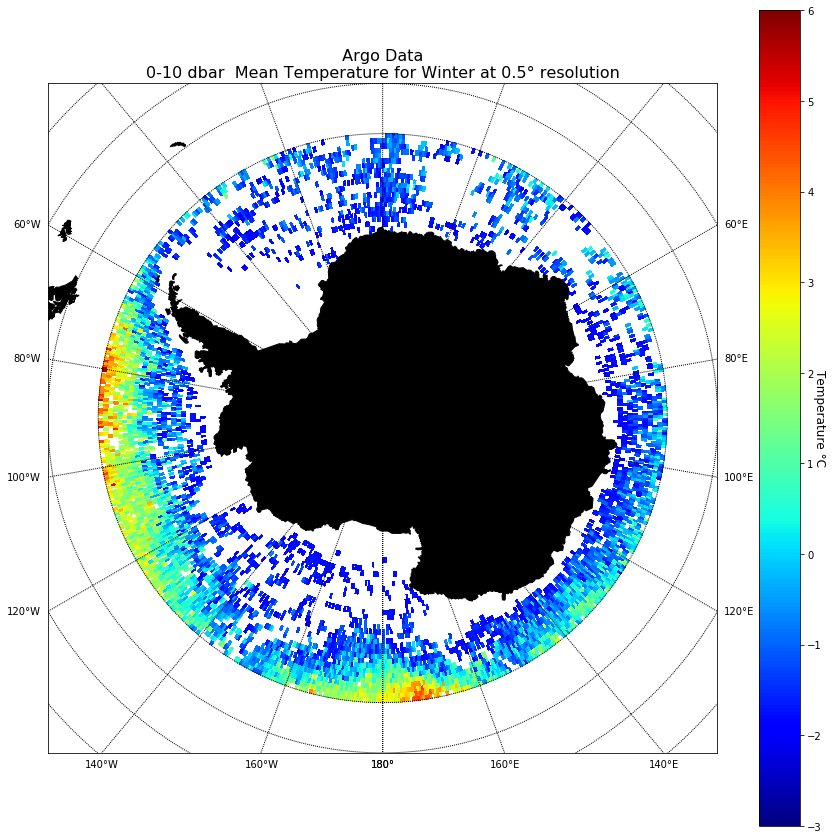

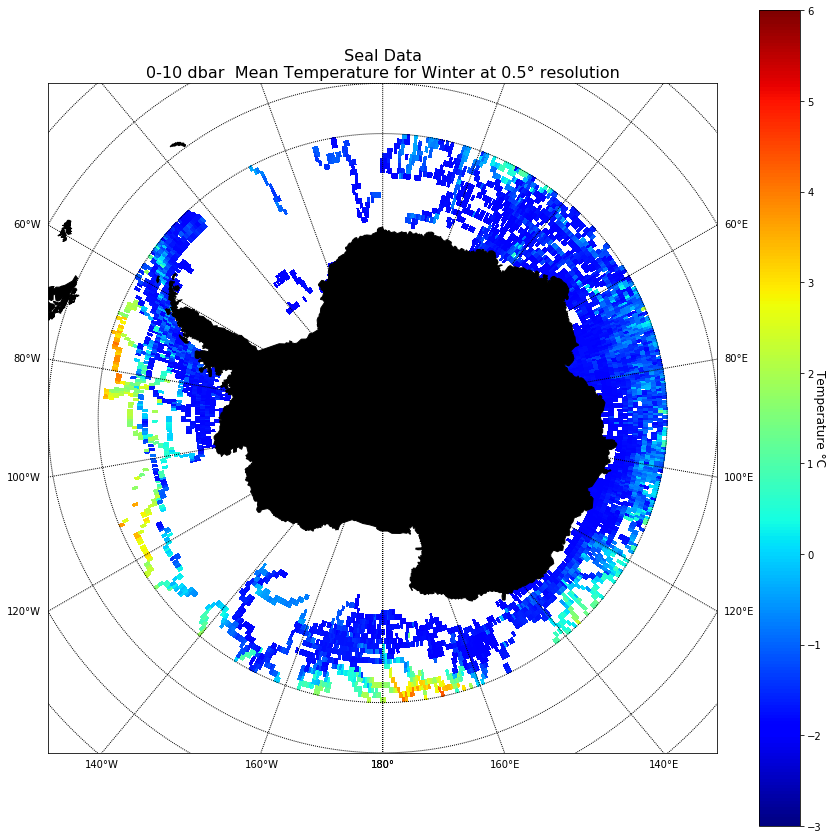

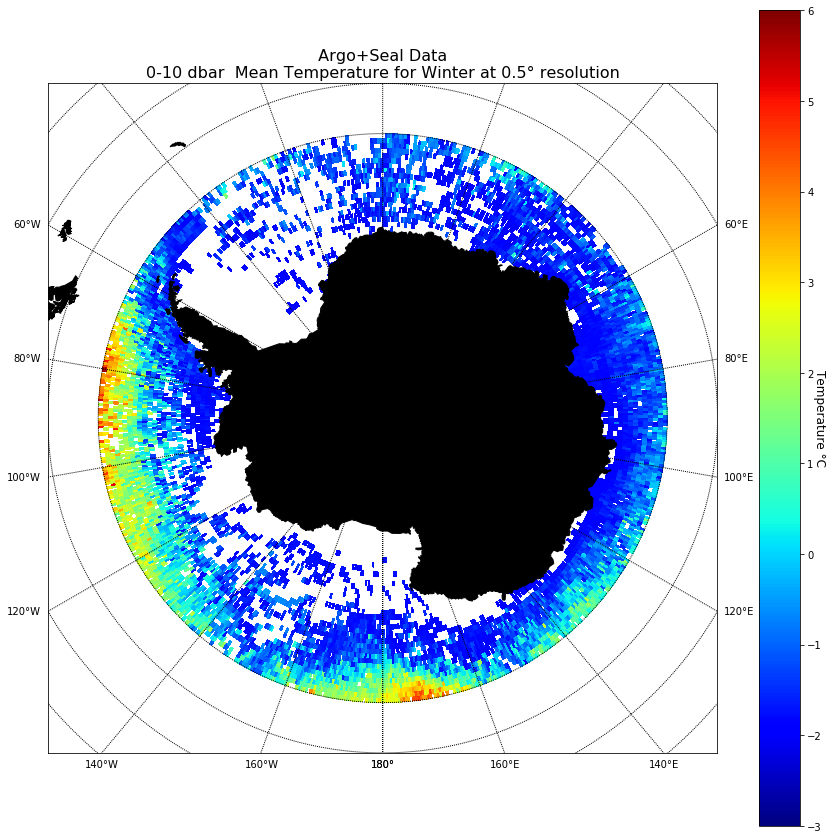

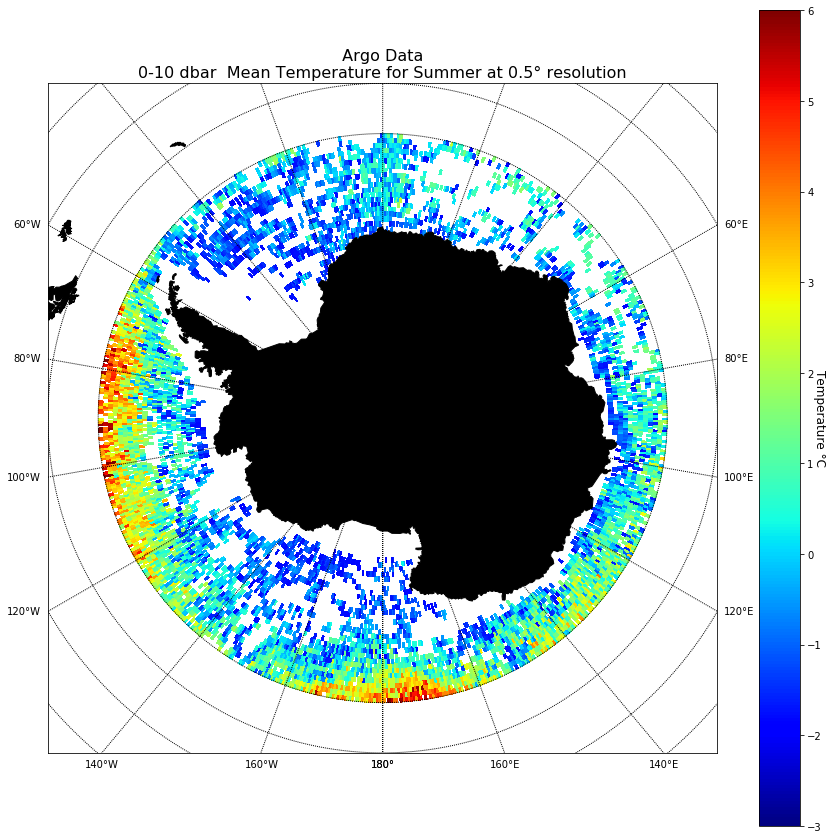

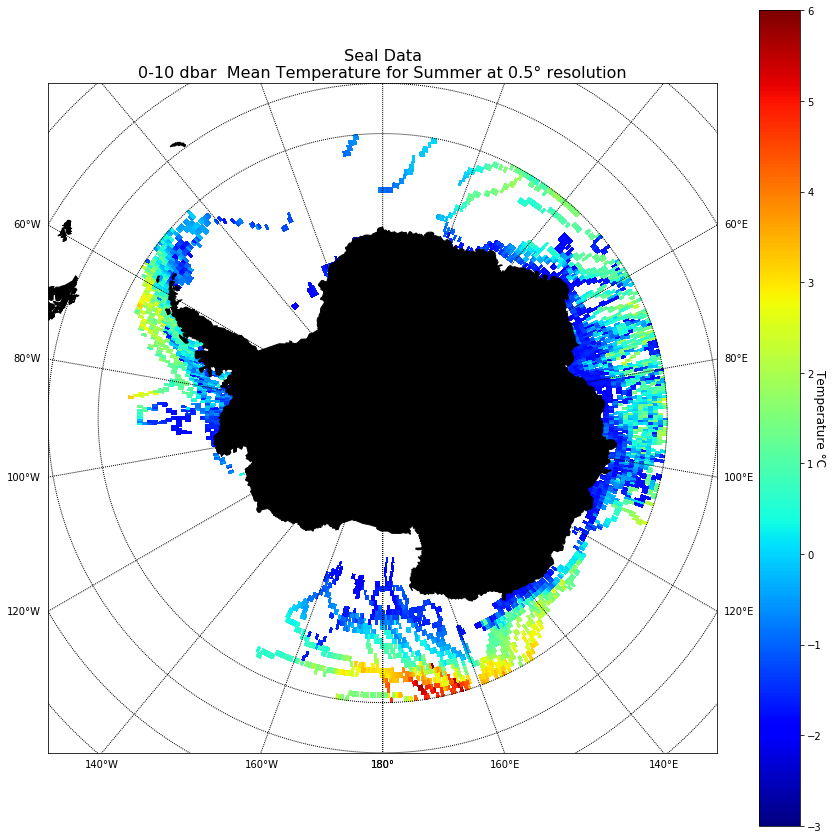

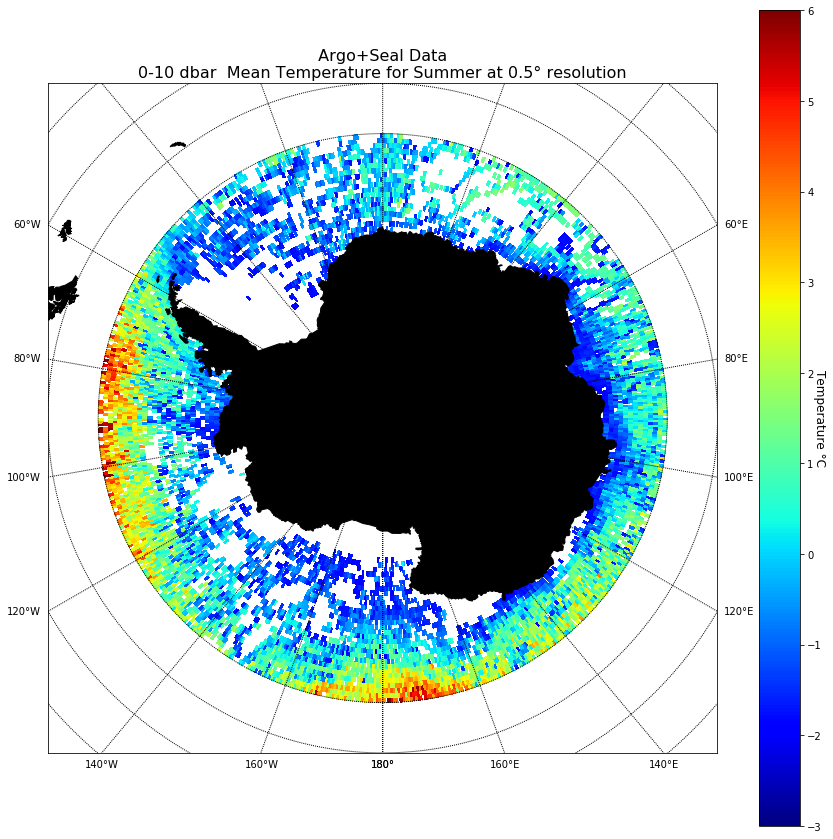

In [8]:
# Seasonal Temperature Filed

#dbars = [0, 5, 10, 15, 20, 30, 50, 75, 100, 125, 150, 175, 190, 199]
dbars = [0]
#for db in dbars:
#    dbs = "{}-{} dbar ".format(db*10, (db+1)*10)
for season in ["Winter", "Summer"]:
    argo_temp = load_netcdf_grid(filter_season = season, with_depth=True, resolution = resolution)
    seal_temp = load_netcdf_grid("seal", filter_season = season, with_depth=True, resolution = resolution)
    combined_temp = np.nanmean((argo_temp, seal_temp), axis=0)
    np.save("argo_temp_grid_withdepth_{}".format(season), argo_temp)
    np.save("seal_temp_grid_withdepth_{}".format(season), seal_temp)
    np.save("combined_temp_grid_withdepth_{}".format(season), combined_temp)
    interp_temp = interp_nans(combined_temp[:,:,0])
#    argomean = np.round(np.nanmean(argo_temp), 2)
#    sealmean = np.round(np.nanmean(seal_temp), 2)
#    combmean = np.round(np.nanmean(combined_temp), 2)
#    interpmean = np.round(np.nanmean(interp_temp), 2)
    for db in dbars:
        dbs = "{}-{} dbar ".format(db*10, (db+1)*10)
        title = a_title + "\n" + dbs + mtf + "for {}".format(season)
        plot_grid(argo_temp[:,:,db], title=title, resolution = resolution, vmin=tmin, vmax=tmax)
        #title = "Argo data 0-10 decibar mean temperature for {}\nMean across all points = {}".format(season, argomean)
        title = s_title + "\n" + dbs + mtf + "for {}".format(season)
        plot_grid(seal_temp[:,:,db], title=title, resolution = resolution, vmin=tmin, vmax=tmax)
        title = comb_title + "\n" + dbs + mtf + "for {}".format(season)
        plot_grid(combined_temp[:,:,db], title=title, resolution = resolution, vmin=tmin, vmax=tmax)

No salinity for data/Argo_South_60\DataSelection_20190704_211741_8047855\argo-profiles-5903716.nc
No salinity at [13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 14 14 14 14
 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14 14 14 14 13 13 13 13 13 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 15 15 15 15 15 15 15] [707 707 707 707 707 707 707 707 707 707 707 707 707 707 707 707 707 707
 707 707 707 707 707 707 707 707 707 708 708 708 708 708 708 708 708 708
 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 706
 706 706 706 705 705 705 705 705 705 705 705 705 705 705 705 705 705 704
 704 704 704 704 704 704 704]
No salinity for data/Argo_South_60\DataSelection_20190704_211741_8047855\argo-profiles-7900325.nc
No salinity at [0 0 0 0] [518 518 518 518]
No salinity for data/Argo_South_60\DataSelection_20190704_212441_8047938\argo-profiles-1901251.nc
No salinity at [1 1 1 0 2 2 2 3 3 3 3 3] [365 366 366 366 370 370 370 370 369 368 36

c:\users\fvie285\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: Mean of empty slice
  
c:\users\fvie285\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:90: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


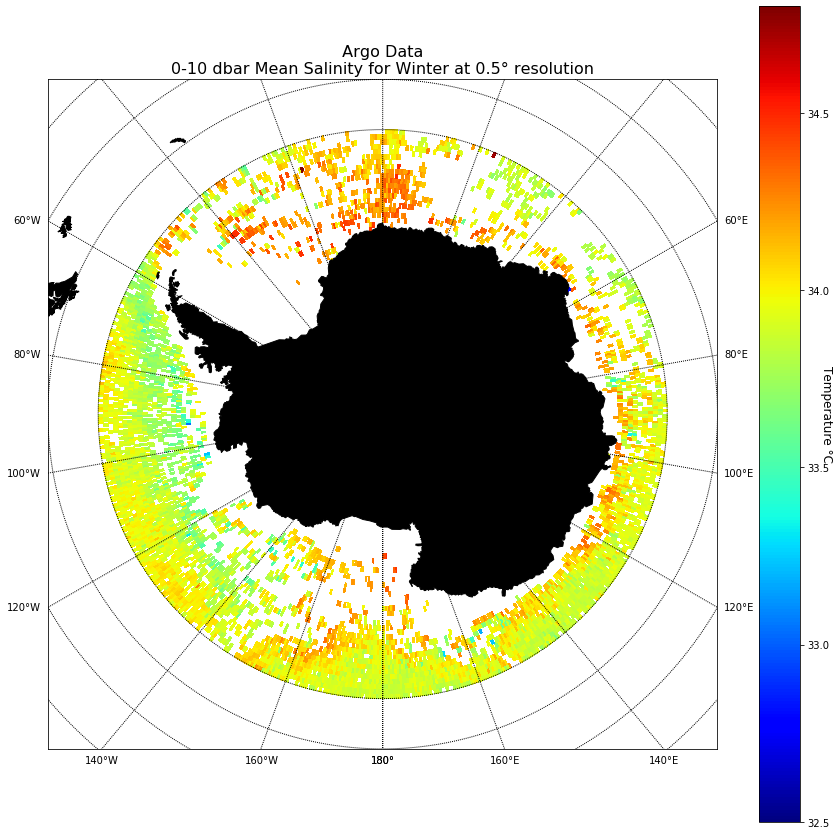

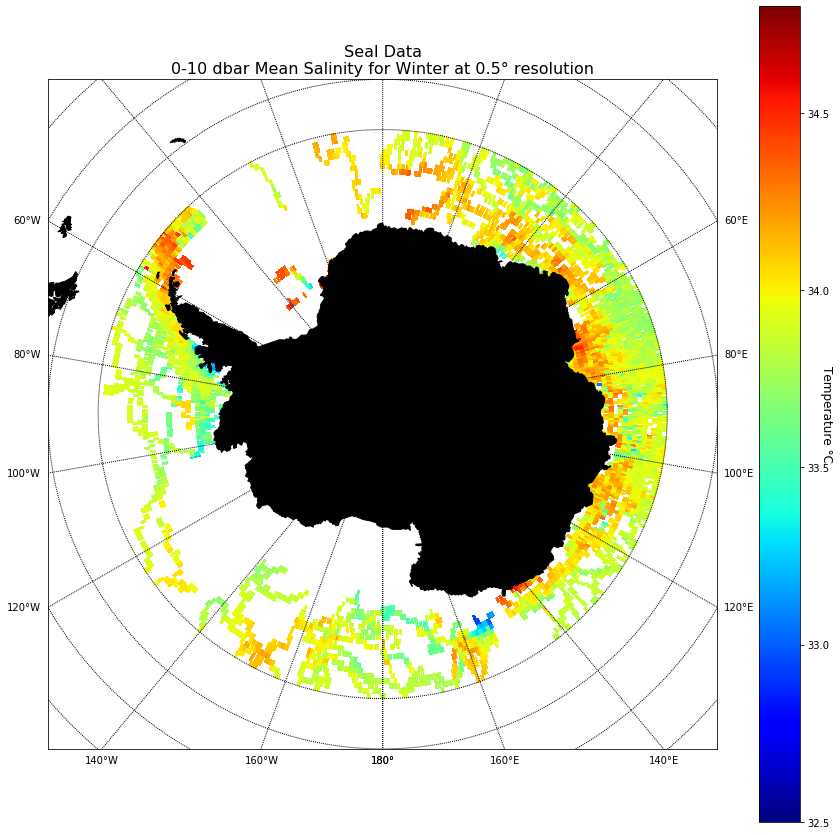

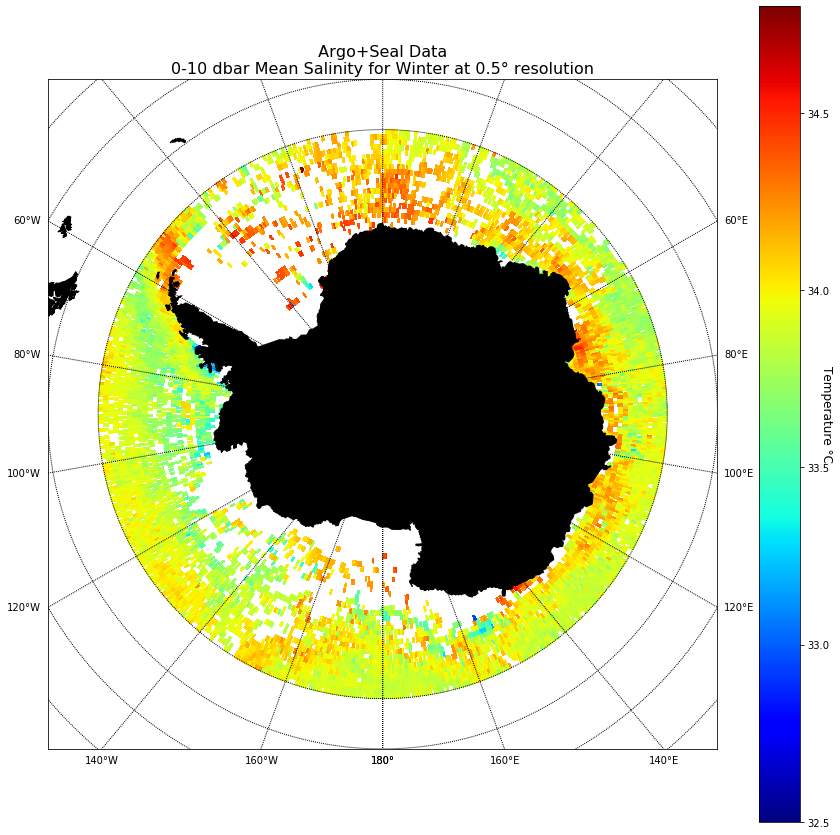

No salinity for data/Argo_South_60\DataSelection_20190704_211741_8047855\argo-profiles-5903716.nc
No salinity at [12 12 11 12 12 13 14 14 14 14 14 14 14 14 14 14 14 14 14 14 15 15 15 15
 15 15 15 15 14 14 14 14 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13 13 13 13 13 13 13 13 15 15 15 15 15 15 16 16 16 16 16 16 16] [706 706 706 706 707 707 707 707 707 707 707 707 707 707 707 707 707 707
 707 707 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708
 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 707 707
 707 707 707 704 704 704 704 704 704 703 703 703 703 703 703 703]
No salinity for data/Argo_South_60\DataSelection_20190704_211741_8047855\argo-profiles-7900325.nc
No salinity at [0 0 0 0] [518 518 518 513]
No salinity for data/Argo_South_60\DataSelection_20190704_212441_8047938\argo-profiles-1901251.nc
No salinity at [2 3 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0] [367 367 367 366 366 366 365 365 365 371 370 370 370 370 370 369 369 369
 369 370 36

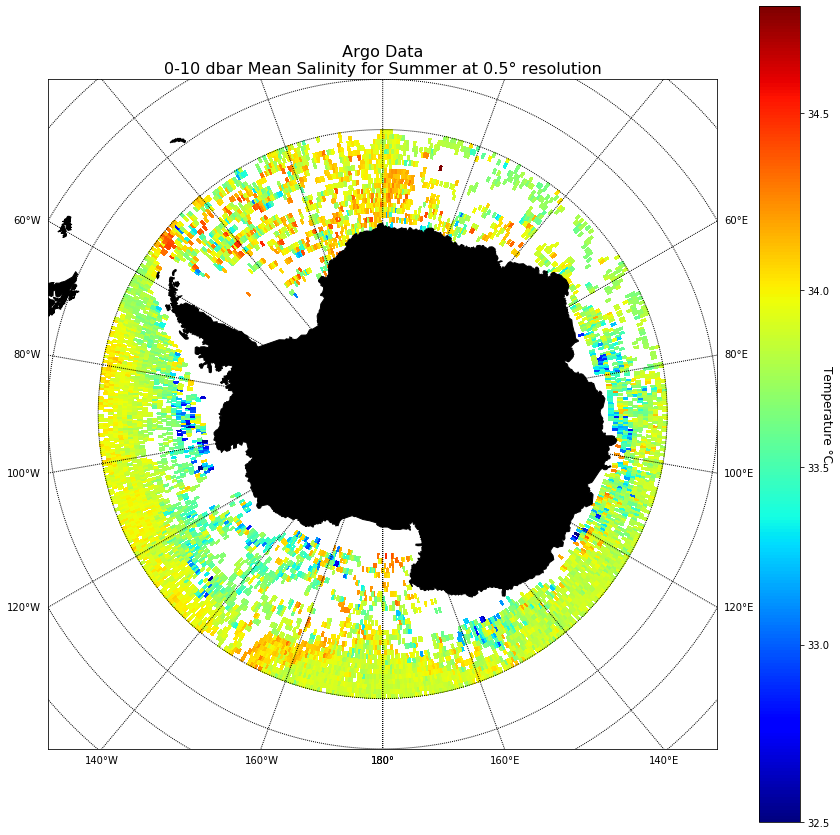

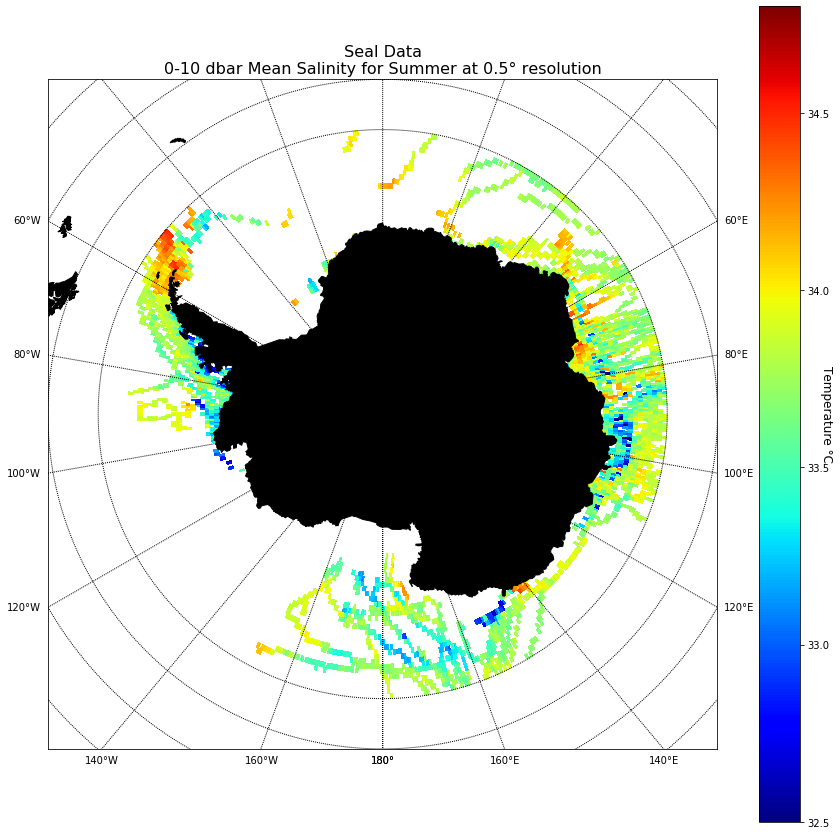

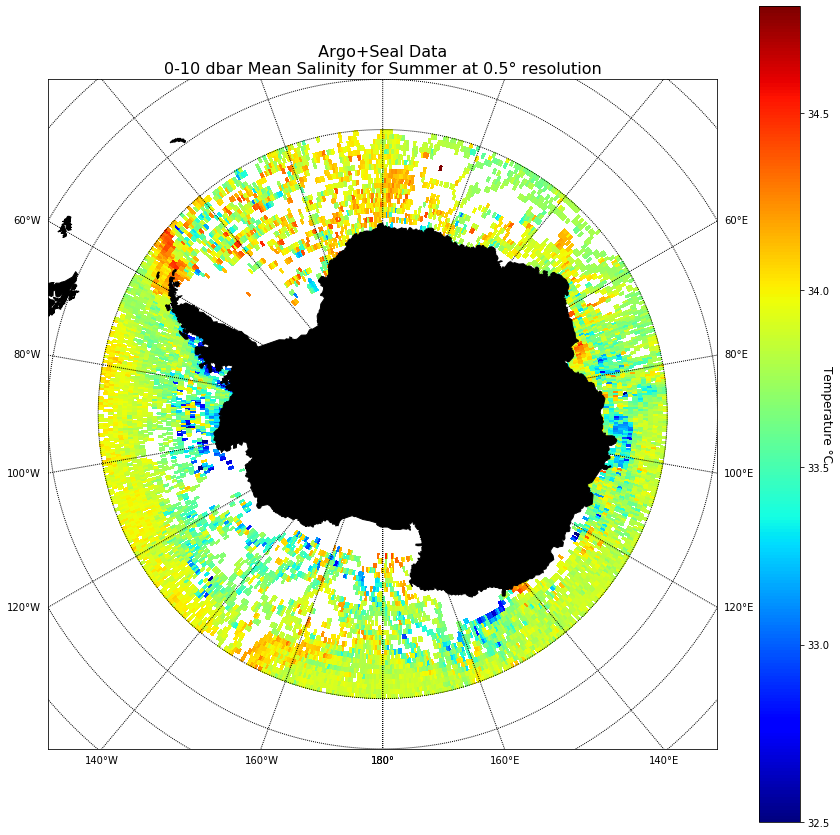

In [9]:
# Seasonal Salinity Field - 
#dbars = [0, 5, 10, 15, 20, 30, 50, 75, 100, 125, 150, 175, 190, 199]
dbars = [0]
dbs = "{}-{} dbar".format(db*10, (db+1)*10)
for season in ["Winter", "Summer"]:
    argo_sal = load_netcdf_grid(target_var = "sal", filter_season = season, with_depth=True, resolution = resolution)
    seal_sal = load_netcdf_grid("seal", target_var = "sal", filter_season = season, with_depth=True, resolution = resolution)
    combined_sal = np.nanmean((argo_sal, seal_sal), axis=0)
    np.save("argo_sal_grid_withdepth_{}".format(season), argo_sal)
    np.save("seal_sal_grid_withdepth_{}".format(season), seal_sal)
    np.save("combined_sal_grid_withdepth_{}".format(season), combined_sal)
    interp_sal = interp_nans(combined_sal[:,:,0])
#    argo_sal_mean = np.round(np.nanmean(argo_sal), 2)
#    seal_sal_mean = np.round(np.nanmean(seal_sal), 2)
#    comb_sal_mean = np.round(np.nanmean(combined_sal), 2)
#    interpmean = np.round(np.nanmean(interp_sal), 2)
    #title = "Argo data 0-10 decibar mean temperature for {}\nMean across all points = {}".format(season, argo_temp_mean)
    # salinity plot
    title = a_title + "\n" + dbs + msf + "for {}".format(season)
    plot_grid(argo_sal[:,:,0], title=title, resolution = resolution, vmin=smin, vmax=smax)
    title = s_title + "\n" + dbs + msf + "for {}".format(season)
    plot_grid(seal_sal[:,:,0], title=title, resolution = resolution, vmin=smin, vmax=smax)
    title = comb_title + "\n" + dbs + msf + "for {}".format(season)
    plot_grid(combined_sal[:,:,0], title=title, resolution = resolution, vmin=smin, vmax=smax)

In [29]:
print(argo_temp.shape, seal_temp.shape, combined_temp.shape)
#print(max(argo_temp[:,:,0]))
print(argo_lats.shape, argo_lons.shape)
print(seal_lats.shape, seal_lons.shape)
print(argo_lats)

(30, 720, 200) (30, 720, 200) (30, 720, 200)
(64378,) (64378,)
(118767,) (118767,)
[-60.096 -60.477 -61.129 ... -65.058 -65.121 -65.11 ]


In [257]:
resolution = 2
try:
    argo_temp_grid_withdepth = np.load("argo_temp_grid_withdepth.npy")
    seal_temp_grid_withdepth = np.load("seal_temp_grid_withdepth.npy")
    combined_temp_grid_withdepth = np.load("combined_temp_grid_withdepth.npy")
except:
    argo_temp_grid_withdepth = load_netcdf_grid(with_depth=True, resolution = resolution)
    seal_temp_grid_withdepth = load_netcdf_grid("seal", with_depth=True, resolution = resolution)
    combined_temp_grid_withdepth = np.nanmean((argo_temp_grid_withdepth, seal_temp_grid_withdepth), axis=0)
    np.save("argo_temp_grid_withdepth", argo_temp_grid_withdepth)
    np.save("seal_temp_grid_withdepth", seal_temp_grid_withdepth)
    np.save("combined_temp_grid_withdepth", combined_temp_grid_withdepth)
    

In [20]:
resolution = 2
try:
    argo_sal_grid_withdepth = np.load("argo_sal_grid_withdepth.npy")
    seal_sal_grid_withdepth = np.load("seal_sal_grid_withdepth.npy")
    combined_sal_grid_withdepth = np.load("combined_sal_grid_withdepth.npy")
except:
    argo_sal_grid_withdepth = load_netcdf_grid(target_var = "sal", with_depth=True, resolution = resolution)
    seal_sal_grid_withdepth = load_netcdf_grid("seal", target_var = "sal", with_depth=True, resolution = resolution)
    combined_sal_grid_withdepth = np.nanmean((argo_sal_grid_withdepth, seal_sal_grid_withdepth), axis=0)
    np.save("argo_sal_grid_withdepth", argo_sal_grid_withdepth)
    np.save("seal_sal_grid_withdepth", seal_sal_grid_withdepth)
    np.save("combined_sal_grid_withdepth", combined_sal_grid_withdepth)

No salinity for data/Argo_South_60\DataSelection_20190704_211741_8047855\argo-profiles-5903716.nc
No salinity at [12 12 11 12 12 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 15
 15 15 15 15 15 15 15 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14 14 14 14 14 14 14 14 14 14 14 14 13 13 13 13 13 13 13 13 13 13 13
 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 14 14 14 14 14
 14 14 14 14 14 14 14 14 14 15 15 15 15 15 15 15 15 15 15 15 15 15 16 16
 16 16 16 16 16] [706 706 706 706 707 707 707 707 707 707 707 707 707 707 707 707 707 707
 707 707 707 707 707 707 707 707 707 707 707 707 707 707 707 707 707 707
 707 707 707 707 707 707 707 707 707 707 707 708 708 708 708 708 708 708
 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708
 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708
 708 708 708 708 708 708 708 708 708 708 708 708 708 708 708 707 70

c:\users\fvie285\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


In [ ]:
print(argo_temp_grid_withdepth.shape, seal_temp_grid_withdepth.shape, combined_temp_grid_withdepth.shape)

In [ ]:
# Climatological Temperature Field

#dbars = [0, 5, 10, 15, 20, 30, 50, 75, 100, 125, 150, 175, 190, 199]
dbars = [0]
for db in dbars:
    #Argo data\n0-10 decibar mean temperature for {}\nMean across all points = {}".format(calendar.month_abbr[month], argomean)
    dbs = "{}-{} dbar ".format(db*10, (db+1)*10)
#   dbs = "between {}-{} dbar".format(db*10, (db+1)*10)
    plot_grid(argo_temp_grid_withdepth[:,:,db], title=a_title + "\n" + dbs + mtf, resolution=resolution, vmin=tmin, vmax=tmax)
    plot_grid(seal_temp_grid_withdepth[:,:,db], title=s_title + "\n" + dbs + mtf, resolution=resolution, vmin=tmin, vmax=tmax)
    plot_grid(combined_temp_grid_withdepth[:,:,db], title=comb_title + "\n" + dbs + mtf, resolution=resolution, vmin=tmin, vmax=tmax)
    interp = interp_nans(combined_temp_grid_withdepth[:,:,db])
#    plot_grid(interp, title=interp_title + "\n" + dbs + mtf, resolution=resolution, vmin=vmin, vmax=vmax)

In [ ]:
# Climatological Salinity Field

#dbars = [0, 5, 10, 15, 20, 30, 50, 75, 100, 125, 150, 175, 190, 199]
dbars = [0]
for db in dbars:
    #Argo data\n0-10 decibar mean temperature for {}\nMean across all points = {}".format(calendar.month_abbr[month], argomean)
    dbs = "{}-{} dbar".format(db*10, (db+1)*10)
#   dbs = "between {}-{} dbar".format(db*10, (db+1)*10)
    plot_grid(argo_sal_grid_withdepth[:,:,db], title=a_title + "\n" + dbs + msf, resolution=resolution, vmin=smin, vmax=smax)
    plot_grid(seal_sal_grid_withdepth[:,:,db], title=s_title + "\n" + dbs + msf, resolution=resolution, vmin=smin, vmax=smax)
    plot_grid(combined_sal_grid_withdepth[:,:,db], title=comb_title + "\n" + dbs + msf, resolution=resolution, vmin=smin, vmax=smax)
    interp = interp_nans(combined_temp_grid_withdepth[:,:,db])
#    plot_grid(interp, title=interp_title + "\n" + dbs + mtf, resolution=resolution, vmin=vmin, vmax=vmax)

In [ ]:
fig = plt.figure(figsize=(15,15))
m = Basemap(projection='spstere',boundinglat=-55,lon_0=180,resolution='l')
#m.drawcoastlines()
#m.fillcontinents(color='black',lake_color='aqua')
# draw parallels and meridians.
m.drawparallels(np.arange(-60, 0, 20))
m.drawmeridians(np.arange(-180, 181, 20), labels=[1,1,0,1])
#m.drawmapboundary(fill_color='aqua')
m.etopo()
plt.title("Bathymetry south of -60S")

In [ ]:
def plot_cross_slope(grid, title="Temperature at 179° W", lon=-179, cbtitle="Temperature °C", resolution = 1):
    fig, ax = plt.subplots(1, 1, figsize=(20,10))
    y = np.arange(-60, -75, -1/resolution)
    z = np.arange(0, 2000, 10)
    levels = np.arange(np.nanmin(grid), np.nanmax(grid), .01)
    im = ax.contourf(y, z, grid.T, cmap="jet", levels = levels, extend="both")
    ax.set_xlabel("° Latitude")
    ax.set_ylabel("Depth (dbar)")
    ax.set_title("{} at {} resolution".format(title, 1 / resolution))
    cb = fig.colorbar(im)
    cb.set_label(cbtitle, rotation=270)
    
    db = oceansdb.ETOPO()
    y = np.arange(-60, -75, -.01)
    h = -db['topography'].extract(lat=y, lon=lon)["height"]
    #ax.plot(y, h)
    ax.fill_between(y, 5000, h, color='black')
    ax.set_ylim(2000, 0)
    ax.set_xlim(-60, -74.5)
    
    plt.show()

filtered = combined_temp_grid_withdepth[:,2,:]
interp = interp_nans(filtered)
plot_cross_slope(filtered, resolution = resolution)
plot_cross_slope(interp, title="Interpolated Temperature at 179° W", resolution = resolution)

(30, 720, 200)


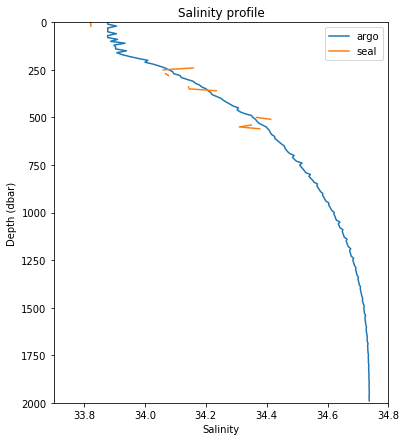

In [78]:
fig, ax = plt.subplots(1, 1, figsize=(6,7))
print(argo_sal_grid_withdepth.shape)
#seal_counts = np.sum(~np.isnan(seal_sal_grid_withdepth), axis=2)
#argo_counts = np.sum(~np.isnan(argo_sal_grid_withdepth), axis=2)
#print(np.argwhere(seal_counts + argo_counts == 319))
depth = np.arange(0, 2000, 10)
ax.set_xlabel("Salinity")
ax.set_ylabel("Depth (dbar)")
ax.set_title("Salinity profile")
ax.set_ylim(2000, 0)
ax.set_xlim(33.7, 34.8)
ax.plot(argo_sal_grid_withdepth[0, 0, :], depth)
ax.plot(seal_sal_grid_withdepth[0, 0, :], depth)
ax.legend(["argo", "seal"])

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10,20))
print(argo_sal_grid_withdepth.shape)
depth = np.arange(0, 2000, 10)
ax.set_xlabel("Salinity")
ax.set_ylabel("Depth (dbar)")
ax.set_ylim(2000, 0)
long = 2
long_label = (long/2)-180
lat_ini = "60ºS"
lat_end = "74.5ºS"
ax.set_title(a_title + "\nSalinity mean profile at {}º, from {} to {} latitude".format(long_label,lat_ini,lat_end))
for dim_lat in range(0,29):
    ax.plot(argo_sal_grid_withdepth[dim_lat, long, :], depth)
    #ax.legend(["argo[dim_lat]"])
#ax.plot(seal_sal_grid_withdepth[4, 715, :], depth)
#ax.legend(["argo", "seal"])
#print(argo_lats)
#print(argo_lats.shape)
#print(argo_lons.shape)

In [258]:
argo_temp_grid_withdepth_summer = np.load("argo_temp_grid_withdepth_Summer.npy")
argo_temp_grid_withdepth_winter = np.load("argo_temp_grid_withdepth_Winter.npy")
seal_temp_grid_withdepth_summmer = np.load("seal_temp_grid_withdepth_Summer.npy")
seal_temp_grid_withdepth_winter = np.load("seal_temp_grid_withdepth_Winter.npy")
combined_temp_grid_withdepth_summer = np.load("combined_temp_grid_withdepth_Summer.npy")
combined_temp_grid_withdepth_winter = np.load("combined_temp_grid_withdepth_Winter.npy")
    
argo_sal_grid_withdepth_summer = np.load("argo_sal_grid_withdepth_Summer.npy")
argo_sal_grid_withdepth_winter = np.load("argo_sal_grid_withdepth_Winter.npy")
seal_sal_grid_withdepth_summer = np.load("seal_sal_grid_withdepth_Summer.npy")
seal_sal_grid_withdepth_winter = np.load("seal_sal_grid_withdepth_Winter.npy")
combined_sal_grid_withdepth_summer = np.load("combined_sal_grid_withdepth_Summer.npy")
combined_sal_grid_withdepth_winter = np.load("combined_sal_grid_withdepth_Winter.npy")

In [ ]:
def season_profiles_plot(axs):
#    combined_sal_grid_withdepth = np.load("combined_sal_grid_withdepth.npy")
    box = dict(facecolor='none', pad=5, alpha=0.2)
    ssmax = 34.8
    ssmin=33.
    ttmax=3
    ttmin=-1
    # Fixing random state for reproducibility
    ax1 = axs[0, 0]
    #ax1.plot(argo_sal_grid_withdepth[5, 719, :], depth)
    ax1.plot(argo_temp_grid_withdepth_summer[5, 719, :], depth)
    ax1.plot(seal_temp_grid_withdepth_summmer[5, 719, :], depth)
    #ax1.plot(2000*np.random.rand(10))
    ax1.set_ylabel("Depth (dbar)")
    ax1.set_xlabel("Temperature")
    ax1.set_title('Summer')
    #ax1.set_ylabel('Salinity', bbox=box)
    ax1.set_xlim(ttmin, ttmax)
    ax1.set_ylim(2000, 0)
    ax1.legend(["argo", "seal"])

    ax3 = axs[1, 0]
    ax3.set_ylabel("Depth (dbar)")
    ax3.plot(argo_sal_grid_withdepth_summer[5, 719, :], depth)
    ax3.plot(seal_sal_grid_withdepth_summer[5, 719, :], depth)
    ax3.set_ylim(2000, 0)
    ax3.set_xlim(ssmin, ssmax)
    ax3.set_xlabel("Salinity")
    ax3.legend(["argo", "seal"])
    
    ax2 = axs[0, 1]
    ax2.set_title('Winter')
    ax2.plot(argo_temp_grid_withdepth_winter[2, 1, :], depth)
    ax2.plot(seal_temp_grid_withdepth_winter[2, 1, :], depth)
    ax2.set_ylabel("Depth (dbar)")
    ax2.set_xlabel("Temperature")
    ax2.set_ylim(2000, 0)
    ax2.set_xlim(ttmin, ttmax)
    ax2.legend(["argo", "seal"])

    ax4 = axs[1, 1]
    ax4.plot(argo_sal_grid_withdepth_winter[10, 220, :], depth)
    ax4.plot(seal_sal_grid_withdepth_winter[10, 220, :], depth)
    ax4.set_ylabel("Depth (dbar)")
    ax4.set_xlabel("Salinity")
    ax4.set_xlim(ssmin, ssmax)
    ax4.set_ylim(2000, 0)
    ax2.legend(["argo", "seal"])

# Plot 1:
#fig, ax = plt.subplots(1, 1, figsize=(10,20))
fig, axs = plt.subplots(2, 2, figsize=(5,10), sharey='row')
fig.subplots_adjust(left=0.01, wspace=0.4, bottom=0.01, hspace=0.2)
season_profiles_plot(axs)

# just align the last column of axes:
fig.align_ylabels(axs[:, 1])
plt.show()

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan]
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan 

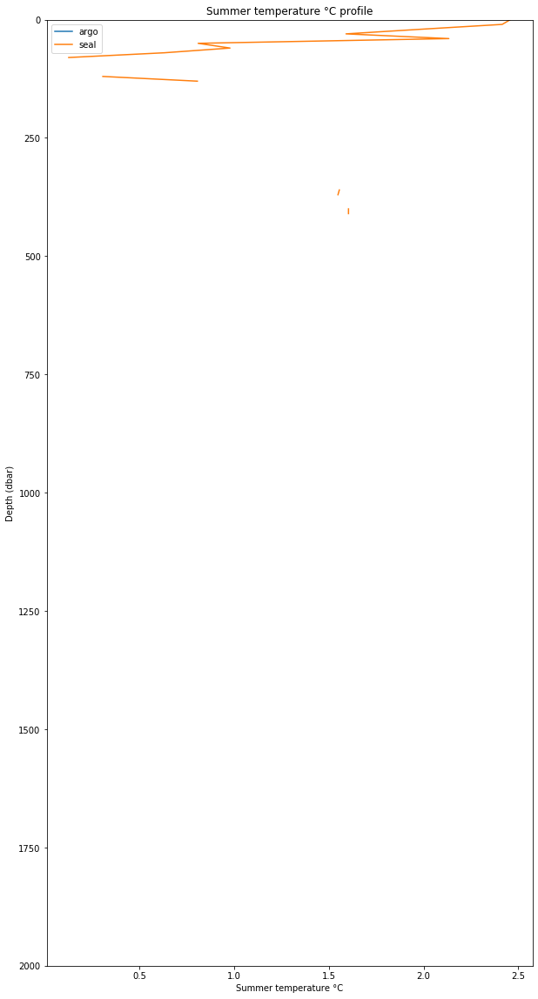

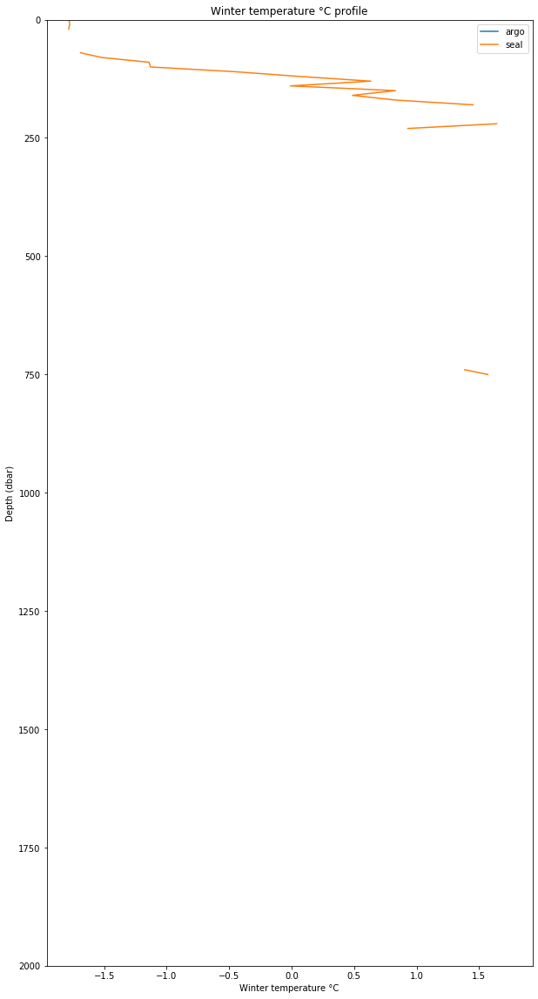

In [259]:
for season in ["Summer", "Winter"]:
    argo_temp = np.load("argo_temp_grid_withdepth_{}.npy".format(season))
    seal_temp = np.load("seal_temp_grid_withdepth_{}.npy".format(season))
    fig, ax = plt.subplots(1, 1, figsize=(10,20))
    depth = np.arange(0, 2000, 10)
    ax.set_xlabel("{} temperature °C".format(season))
    ax.set_ylabel("Depth (dbar)")
    ax.set_title("{} temperature °C profile".format(season))
    ax.set_ylim(2000, 0)
    ax.plot(argo_temp[6, 233, :], depth)
    ax.plot(seal_temp[6, 233, :], depth)
    ax.legend(["argo", "seal"])
    print(argo_temp[8,238])

In [ ]:
def dens_smow(T):
    '''
    Function calculates density of standard mean ocean water (pure water) using EOS 1980.
    INPUT: T = temperature [degree C (ITS-90)]
    OUTPUT: dens = density [kg/m^3]
    '''
    a0 = 999.842594;a1 = 6.793952e-2;a2 = -9.095290e-3;a3 = 1.001685e-4;a4 = -1.120083e-6;a5 = 6.536332e-9
    T68 = T * 1.00024
    dens = (a0 + (a1 + (a2 + (a3 + (a4 + a5*T68)*T68)*T68)*T68)*T68)
    return dens

def dens0(S, T):
    '''
    Function calculates density of sea water at atmospheric pressure
    USAGE:  dens0 = dens0(S,T)
    DESCRIPTION:
        Density of Sea Water at atmospheric pressure using
        UNESCO 1983 (EOS 1980) polynomial.
    INPUT:  (all must have same dimensions)
        S = salinity    [psu      (PSS-78)]
        T = temperature [degree C (ITS-90)]
    OUTPUT:
        dens0 = density  [kg/m^3] of salt water with properties S,T,
        P=0 (0 db gauge pressure)
    '''
    assert S.shape == T.shape
    T68 = T * 1.00024
    # UNESCO 1983 eqn(13) p17.
    b0 = 8.24493e-1;b1 = -4.0899e-3;b2 = 7.6438e-5;b3 = -8.2467e-7;b4 = 5.3875e-9
    c0 = -5.72466e-3;c1 = +1.0227e-4;c2 = -1.6546e-6
    d0 = 4.8314e-4
    dens = (dens_smow(T) + (b0+ (b1+(b2+(b3+b4*T68)*T68)*T68)*T68)*S + (c0+(c1+c2*T68)*T68)*S*np.sqrt(S)+ d0*(S**2) )
    return dens

In [ ]:
#Cell added on 21/10/2019 - still testing
# adding function for TS Diagram
dens = dens0(argo_sal_grid_withdepth, argo_temp_grid_withdepth)
# print(combined_temp_grid_withdepth[0])
#shape of dens - (30,720,200) = (latitude, longitude, vertical layers)

cmap = plt.get_cmap('jet_r');cmap.set_bad(color='white')

fig = plt.figure(4,figsize=(15,15))  #TS-diagram of Argo profiles in the Ross Sea Slice
plt.scatter(argo_sal_grid_withdepth[0:10],argo_temp_grid_withdepth[0:10],s = 2,c=dens[0:10],cmap = cmap, edgecolors='none',alpha=0.8)
plt.xlim(33.8,35);plt.ylim(-2.5,5)
plt.clb = plt.colorbar();plt.clb.ax.set_title('Density (kg/m$^3$)')                  
#plt.xlabel('Pratical salinity',fontsize = 18);
#plt.ylabel('Temperature ($^oC$)',fontsize = 18)
ax.set_xlabel('Pratical salinity',fontsize = 18);
ax.set_ylabel('Temperature ($^oC$)',fontsize = 18)
plt.title('T-S diagram, Argo profiles',fontsize = 20)
# plt.axis('tight')
plt.show()
#     for i in range(0, len(FILES)):
#         read = Dataset(source + count_60[j][1] + '/profiles/' + FILES[i], mode = 'r')
#         Lat = read.variables['LATITUDE'][:]
#         Lon = read.variables['LONGITUDE'][:]
#         if Lon[0] < -140, Lon[0] > 160:
#             Temp = read.variables['TEMP'][:]
#             Psal = read.variables['PSAL'][:]
#             sigma = dens0(Psal[0],Temp[0])
#             scatter(Psal[0],Temp[0],s = 2,c=sigma,cmap = cmap, edgecolors='none',alpha=0.8)

# xlim(33.8,35);ylim(-2.5,5)
# clb = colorbar()#;clb.ax.set_title('Density (kg/m$^3$)')                  
# axis('tight');grid('on',alpha=0.2)
# # savepath = os.path.join('C:/Users/fvie285/Desktop/PhD_Project/Data/figures/Argo_South_of_50/aoml_figures/TS_diagram_RSS.png')
# # savefig(savepath, bbox_inches='tight', dpi=300) 
# show()


In [ ]:
dens = dens0(combined_sal_grid_withdepth, combined_temp_grid_withdepth)
dbars = [30, 50, 100]
for db in dbars:
    dbs = "from {}-{} dbar".format(db*10, (db+1)*10)
    plot_grid(dens[:,:,db], title=comb_title + "\n" + dbs + msd, resolution=resolution, vmin=rhomin, vmax=rhomax)
    interp = interp_nans(dens[:,:,db])
    print(np.nanmin(interp), np.nanmax(interp))
    plot_grid(interp, title="Interpolated gridded seal+argo density data " + dbs, cbtitle="Density", resolution=resolution, vmin=rhomin, vmax=rhomax)

In [ ]:
plot_cross_slope(dens[:,2,:], title="Density at 179° W", cbtitle="Density", resolution=resolution)
plot_cross_slope(interp_nans(dens[:,2,:]), title="Interpolated density at 179° W", cbtitle="Density", resolution=resolution)